In [187]:
# import packages/modules
import requests
import pandas as pd
from bs4 import BeautifulSoup as BS
import json
import config
from sodapy import Socrata
import mysql.connector
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import scipy.stats as stats

In [188]:
# create connection
cnx = mysql.connector.connect(
    host = config.host,
    user = config.user,
    passwd = config.password,
    database = 'nyc_public_high_schools_grad_rate',
    use_pure=True
    )

cursor = cnx.cursor()

In [116]:
# make API call for hs regents data
client = Socrata("data.cityofnewyork.us", 'hs_key')
client = Socrata('data.cityofnewyork.us',
                  config.hsregent_token,
                  username=config.od_user,
                  password=config.od_pw)
results = client.get("csps-2ne9", limit=215000)
regents = pd.DataFrame.from_records(results)

In [ ]:
regents = regents[~regents['school_level'].isin(['K-8', 'Elementary'])]
regents.to_csv('regents.csv')

In [185]:
regents2017 = regents[regents['year'].isin(['2017'])]
regents2017 = regents2017[~regents2017.school_level.str.contains('Junior High-Intermediate-Middle')]

In [5]:
# make API call for hs graduation rate data
client = Socrata("data.cityofnewyork.us", 'hs_key')
client = Socrata('data.cityofnewyork.us',
                  config.hsgrad_token,
                  username=config.od_user,
                  password=config.od_pw)
results = client.get("nb39-jx2v", limit=256000)
gradrate = pd.DataFrame.from_records(results)

In [ ]:
gradrate = gradrate[gradrate['cohort_year'].isin(['2013'])]
gradrate.to_csv('gradrate.csv')

In [42]:
import pickle
with open('tup.pkl', 'rb') as f:
    x = pickle.load(f)
    
with open('tup1.pkl', 'rb') as g:
    y = pickle.load(g)

In [54]:
# change list of tuples to dataframe to change nans
ydf = pd.DataFrame(y)
# change nans to null in dataframe
ydf = ydf.where((pd.notnull(ydf)), None)
ydf

,0,1,2,3,4,5
0,ORCHARD COLLEGIATE ACADEMY,All Students,4 year August,36,25,69.4
1,ORCHARD COLLEGIATE ACADEMY,All Students,4 year June,36,24,66.7
2,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,All Students,4 year August,78,70,89.7
3,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,All Students,4 year June,78,70,89.7
4,EAST SIDE COMMUNITY SCHOOL,All Students,4 year August,89,81,91
...,...,...,...,...,...,...
14173,BUSHWICK COMMUNITY HIGH SCHOOL,Current ELL,4 year June,5,1,20
14174,BUSHWICK COMMUNITY HIGH SCHOOL,Ever ELL,4 year August,13,3,23.1
14175,BUSHWICK COMMUNITY HIGH SCHOOL,Ever ELL,4 year June,13,3,23.1
14176,BUSHWICK COMMUNITY HIGH SCHOOL,Never ELL,4 year August,68,16,23.5


In [55]:
y = list(ydf.itertuples(index=False, name=None))

In [20]:
# split list into smaller lists
n = 10000
regents_chunks = [x[i:i+n] for i in range(0,len(x),n)]

In [23]:
# # insert regents data into database
# for chunk in regents_chunks:
#     insert_regents = ("""INSERT INTO regents(
#                          school_name, regents_exam, demographic, total_tested, mean_score,
#                          number_scoring_below_65, percent_scoring_below_65,
#                          number_scoring_65_or_above, percent_scoring_65_or_above,
#                          number_scoring_80_or_above, percent_scoring_80_or_above,
#                          number_scoring_cr, percent_scoring_cr)
#                          VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s);""")
#     cursor.executemany(insert_regents, chunk)
#     cnx.commit()

In [57]:
n = 10000
grad_chunks = [y[i:i+n] for i in range(0,len(y),n)]

In [58]:
# # insert grad rate data into database
# for chunk in grad_chunks:
#     insert_gradrate = ("""INSERT INTO gradrate(
#                          school_name, demographic, cohort, total_cohort,
#                          total_grads, total_grads_of_cohort)
#                          VALUES (%s, %s, %s, %s, %s, %s);""")
#     cursor.executemany(insert_gradrate, chunk)
#     cnx.commit()

In [174]:
def make_num (stuff):
    try:
        y=float(stuff)
    except:
        y=None
    return y

In [175]:
i=0
regents_tuple_nums=[]
for thing in range(len(list(regents2017['school_name']))):
    new_tuple = (list(regents2017['school_name'])[i],
                list(regents2017['regents_exam'])[i],
                list(regents2017['demographic_variable'])[i],
                list(regents2017['total_tested'])[i],
                make_num (list(regents2017['mean_score'])[i]),
                make_num (list(regents2017['number_scoring_below_65'])[i]),
                make_num (list(regents2017['percent_scoring_below_65'])[i]),
                make_num (list(regents2017['number_scoring_65_or_above'])[i]),
                make_num (list(regents2017['percent_scoring_65_or_above'])[i]),
                make_num (list(regents2017['number_scoring_80_or_above'])[i]),
                make_num (list(regents2017['percent_scoring_80_or_above'])[i]),
                make_num (list(regents2017['number_scoring_cr'])[i]),
                make_num (list(regents2017['percent_scoring_cr'])[i]))
    print (new_tuple)
    regents_tuple_nums.append(new_tuple)
    i+=1

('Orchard Collegiate Academy', 'Common Core Algebra', 'All Students', '53', 67.5, 15.0, 28.3, 38.0, 71.7, 6.0, 11.3, 29.0, 54.7)
('Orchard Collegiate Academy', 'Common Core Algebra2', 'All Students', '3', None, None, None, None, None, None, None, None, None)
('Orchard Collegiate Academy', 'Common Core English', 'All Students', '41', 77.2, 3.0, 7.3, 38.0, 92.7, 22.0, 53.7, 30.0, 73.2)
('Orchard Collegiate Academy', 'Common Core Geometry', 'All Students', '11', 56.8, 9.0, 81.8, 2.0, 18.2, 0.0, 0.0, 1.0, 9.1)
('Orchard Collegiate Academy', 'Global History and Geography', 'All Students', '53', 59.3, 32.0, 60.4, 21.0, 39.6, 6.0, 11.3, None, None)
('Orchard Collegiate Academy', 'Living Environment', 'All Students', '61', 65.0, 26.0, 42.6, 35.0, 57.4, 5.0, 8.2, None, None)
('Orchard Collegiate Academy', 'Physical Settings/Earth Science', 'All Students', '36', 53.4, 26.0, 72.2, 10.0, 27.8, 1.0, 2.8, None, None)
('Orchard Collegiate Academy', 'U.S. History and Government', 'All Students', '42',

('Cascades High School', 'Global History and Geography', 'All Students', '69', 64.5, 31.0, 44.9, 38.0, 55.1, 9.0, 13.0, None, None)
('Cascades High School', 'Living Environment', 'All Students', '33', 63.4, 16.0, 48.5, 17.0, 51.5, 0.0, 0.0, None, None)
('Cascades High School', 'Physical Settings/Earth Science', 'All Students', '13', 55.9, 9.0, 69.2, 4.0, 30.8, 0.0, 0.0, None, None)
('Cascades High School', 'U.S. History and Government', 'All Students', '68', 73.1, 14.0, 20.6, 54.0, 79.4, 23.0, 33.8, None, None)
('Bard High School Early College', 'Common Core Algebra', 'All Students', '35', 79.6, 2.0, 5.7, 33.0, 94.3, 24.0, 68.6, 31.0, 88.6)
('Bard High School Early College', 'Common Core English', 'All Students', '150', 89.8, 1.0, 0.7, 149.0, 99.3, 142.0, 94.7, 148.0, 98.7)
('Bard High School Early College', 'Common Core Geometry', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Bard High School Early College', 'Global History and Geography', 'All Students'

('Urban Assembly Maker Academy', 'Common Core Geometry', 'All Students', '129', 57.7, 92.0, 71.3, 37.0, 28.7, 2.0, 1.6, 21.0, 16.3)
('Urban Assembly Maker Academy', 'Global History and Geography', 'All Students', '86', 67.3, 33.0, 38.4, 53.0, 61.6, 19.0, 22.1, None, None)
('Urban Assembly Maker Academy', 'Living Environment', 'All Students', '55', 72.6, 12.0, 21.8, 43.0, 78.2, 19.0, 34.5, None, None)
('Urban Assembly Maker Academy', 'Physical Settings/Earth Science', 'All Students', '76', 58.4, 53.0, 69.7, 23.0, 30.3, 7.0, 9.2, None, None)
('Urban Assembly Maker Academy', 'U.S. History and Government', 'All Students', '134', 61.9, 59.0, 44.0, 75.0, 56.0, 27.0, 20.1, None, None)
('Food and Finance High School', 'Algebra2/Trigonometry', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Food and Finance High School', 'Common Core Algebra', 'All Students', '101', 64.8, 49.0, 48.5, 52.0, 51.5, 16.0, 15.8, 42.0, 41.6)
('Food and Finance High School', 'Common Core A

('Lower Manhattan Arts Academy', 'Common Core Algebra', 'All Students', '78', 67.4, 22.0, 28.2, 56.0, 71.8, 9.0, 11.5, 38.0, 48.7)
('Lower Manhattan Arts Academy', 'Common Core Algebra2', 'All Students', '26', 54.5, 20.0, 76.9, 6.0, 23.1, 0.0, 0.0, 6.0, 23.1)
('Lower Manhattan Arts Academy', 'Common Core English', 'All Students', '77', 75.0, 9.0, 11.7, 68.0, 88.3, 35.0, 45.5, 48.0, 62.3)
('Lower Manhattan Arts Academy', 'Common Core Geometry', 'All Students', '30', 55.2, 22.0, 73.3, 8.0, 26.7, 0.0, 0.0, 5.0, 16.7)
('Lower Manhattan Arts Academy', 'Global History and Geography', 'All Students', '97', 64.0, 42.0, 43.3, 55.0, 56.7, 11.0, 11.3, None, None)
('Lower Manhattan Arts Academy', 'Living Environment', 'All Students', '69', 70.0, 19.0, 27.5, 50.0, 72.5, 19.0, 27.5, None, None)
('Lower Manhattan Arts Academy', 'Physical Settings/Chemistry', 'All Students', '26', 55.3, 22.0, 84.6, 4.0, 15.4, 1.0, 3.8, None, None)
('Lower Manhattan Arts Academy', 'Physical Settings/Earth Science', 'Al

('Emma Lazarus High School', 'Common Core Geometry', 'All Students', '62', 75.7, 8.0, 12.9, 54.0, 87.1, 29.0, 46.8, 43.0, 69.4)
('Emma Lazarus High School', 'Global History and Geography', 'All Students', '96', 71.5, 29.0, 30.2, 67.0, 69.8, 33.0, 34.4, None, None)
('Emma Lazarus High School', 'Living Environment', 'All Students', '73', 75.8, 11.0, 15.1, 62.0, 84.9, 26.0, 35.6, None, None)
('Emma Lazarus High School', 'Physical Settings/Chemistry', 'All Students', '11', 63.2, 7.0, 63.6, 4.0, 36.4, 2.0, 18.2, None, None)
('Emma Lazarus High School', 'Physical Settings/Earth Science', 'All Students', '78', 79.0, 9.0, 11.5, 69.0, 88.5, 41.0, 52.6, None, None)
('Emma Lazarus High School', 'U.S. History and Government', 'All Students', '68', 89.0, 1.0, 1.5, 67.0, 98.5, 61.0, 89.7, None, None)
('The High School For Language And Diplomacy', 'Algebra2/Trigonometry', 'All Students', '14', 44.9, 13.0, 92.9, 1.0, 7.1, 1.0, 7.1, 1.0, 7.1)
('The High School For Language And Diplomacy', 'Common Core 

('N.Y.C. Lab School for Collaborative Studies', 'U.S. History and Government', 'All Students', '122', 90.5, 3.0, 2.5, 119.0, 97.5, 112.0, 91.8, None, None)
('School of the Future High School', 'Common Core English', 'All Students', '111', 87.7, 5.0, 4.5, 106.0, 95.5, 98.0, 88.3, 101.0, 91.0)
('N.Y.C. Museum School', 'Algebra2/Trigonometry', 'All Students', '22', 57.9, 16.0, 72.7, 6.0, 27.3, 0.0, 0.0, 0.0, 0.0)
('N.Y.C. Museum School', 'Common Core Algebra', 'All Students', '96', 78.5, 6.0, 6.3, 90.0, 93.8, 56.0, 58.3, 86.0, 89.6)
('N.Y.C. Museum School', 'Common Core Algebra2', 'All Students', '129', 67.6, 44.0, 34.1, 85.0, 65.9, 14.0, 10.9, 85.0, 65.9)
('N.Y.C. Museum School', 'Common Core English', 'All Students', '114', 87.6, 3.0, 2.6, 111.0, 97.4, 100.0, 87.7, 107.0, 93.9)
('N.Y.C. Museum School', 'Common Core Geometry', 'All Students', '111', 64.8, 45.0, 40.5, 66.0, 59.5, 5.0, 4.5, 42.0, 37.8)
('N.Y.C. Museum School', 'Global History and Geography', 'All Students', '96', 89.8, 4.0

('Leadership and Public Service High School', 'Living Environment', 'All Students', '182', 65.8, 72.0, 39.6, 110.0, 60.4, 28.0, 15.4, None, None)
('Leadership and Public Service High School', 'Physical Settings/Chemistry', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Leadership and Public Service High School', 'Physical Settings/Earth Science', 'All Students', '70', 53.5, 54.0, 77.1, 16.0, 22.9, 0.0, 0.0, None, None)
('Leadership and Public Service High School', 'Physical Settings/Physics', 'All Students', '8', 34.0, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Leadership and Public Service High School', 'U.S. History and Government', 'All Students', '126', 71.3, 46.0, 36.5, 80.0, 63.5, 44.0, 34.9, None, None)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Common Core Algebra', 'All Students', '119', 64.6, 49.0, 41.2, 70.0, 58.8, 1.0, 0.8, 46.0, 38.7)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Common Core Algebra2', 'All Students', '10', 68.5, 2.0, 20.0, 8.

('High School of Economics and Finance', 'Common Core English', 'All Students', '173', 81.2, 14.0, 8.1, 159.0, 91.9, 115.0, 66.5, 129.0, 74.6)
('High School of Economics and Finance', 'Common Core Geometry', 'All Students', '164', 64.2, 82.0, 50.0, 82.0, 50.0, 12.0, 7.3, 55.0, 33.5)
('High School of Economics and Finance', 'Global History and Geography', 'All Students', '205', 68.2, 73.0, 35.6, 132.0, 64.4, 61.0, 29.8, None, None)
('High School of Economics and Finance', 'Living Environment', 'All Students', '163', 70.1, 45.0, 27.6, 118.0, 72.4, 40.0, 24.5, None, None)
('High School of Economics and Finance', 'Physical Settings/Chemistry', 'All Students', '92', 52.9, 76.0, 82.6, 16.0, 17.4, 0.0, 0.0, None, None)
('High School of Economics and Finance', 'Physical Settings/Earth Science', 'All Students', '150', 67.8, 56.0, 37.3, 94.0, 62.7, 37.0, 24.7, None, None)
('High School of Economics and Finance', 'Physical Settings/Physics', 'All Students', '19', 54.4, 15.0, 78.9, 4.0, 21.1, 0.0,

('Repertory Company High School for Theatre Arts', 'Algebra2/Trigonometry', 'All Students', '21', 42.9, 20.0, 95.2, 1.0, 4.8, 0.0, 0.0, 0.0, 0.0)
('Repertory Company High School for Theatre Arts', 'Common Core Algebra', 'All Students', '79', 70.1, 20.0, 25.3, 59.0, 74.7, 14.0, 17.7, 50.0, 63.3)
('Repertory Company High School for Theatre Arts', 'Common Core Algebra2', 'All Students', '59', 56.4, 36.0, 61.0, 23.0, 39.0, 1.0, 1.7, 23.0, 39.0)
('Repertory Company High School for Theatre Arts', 'Common Core English', 'All Students', '75', 78.5, 3.0, 4.0, 72.0, 96.0, 40.0, 53.3, 49.0, 65.3)
('Repertory Company High School for Theatre Arts', 'Common Core Geometry', 'All Students', '128', 56.4, 90.0, 70.3, 38.0, 29.7, 1.0, 0.8, 23.0, 18.0)
('Repertory Company High School for Theatre Arts', 'Global History and Geography', 'All Students', '104', 69.7, 28.0, 26.9, 76.0, 73.1, 20.0, 19.2, None, None)
('Repertory Company High School for Theatre Arts', 'Living Environment', 'All Students', '58', 74

('Academy for Software Engineering', 'Common Core Geometry', 'All Students', '108', 65.0, 51.0, 47.2, 57.0, 52.8, 11.0, 10.2, 39.0, 36.1)
('Academy for Software Engineering', 'Global History and Geography', 'All Students', '129', 70.3, 44.0, 34.1, 85.0, 65.9, 40.0, 31.0, None, None)
('Academy for Software Engineering', 'Living Environment', 'All Students', '108', 73.2, 23.0, 21.3, 85.0, 78.7, 34.0, 31.5, None, None)
('Academy for Software Engineering', 'Physical Settings/Chemistry', 'All Students', '18', 61.6, 10.0, 55.6, 8.0, 44.4, 0.0, 0.0, None, None)
('Academy for Software Engineering', 'Physical Settings/Earth Science', 'All Students', '102', 73.1, 25.0, 24.5, 77.0, 75.5, 38.0, 37.3, None, None)
('Academy for Software Engineering', 'U.S. History and Government', 'All Students', '226', 66.9, 84.0, 37.2, 142.0, 62.8, 51.0, 22.6, None, None)
('Liberty High School Academy for Newcomers', 'Algebra2/Trigonometry', 'All Students', '8', 55.4, 6.0, 75.0, 2.0, 25.0, 0.0, 0.0, 0.0, 0.0)
('Li

('Harvey Milk High School', 'Common Core English', 'All Students', '22', 74.5, 4.0, 18.2, 18.0, 81.8, 13.0, 59.1, 16.0, 72.7)
('Harvey Milk High School', 'Global History and Geography', 'All Students', '21', 75.7, 4.0, 19.0, 17.0, 81.0, 8.0, 38.1, None, None)
('Harvey Milk High School', 'Living Environment', 'All Students', '21', 74.4, 5.0, 23.8, 16.0, 76.2, 7.0, 33.3, None, None)
('Harvey Milk High School', 'U.S. History and Government', 'All Students', '18', 86.3, 0.0, 0.0, 18.0, 100.0, 12.0, 66.7, None, None)
('The High School of Fashion Industries', 'Algebra2/Trigonometry', 'All Students', '59', 56.3, 45.0, 76.3, 14.0, 23.7, 0.0, 0.0, 0.0, 0.0)
('The High School of Fashion Industries', 'Common Core Algebra', 'All Students', '497', 70.3, 111.0, 22.3, 386.0, 77.7, 99.0, 19.9, 318.0, 64.0)
('The High School of Fashion Industries', 'Common Core Algebra2', 'All Students', '172', 64.9, 78.0, 45.3, 94.0, 54.7, 6.0, 3.5, 94.0, 54.7)
('The High School of Fashion Industries', 'Common Core En

('The Maxine Greene HS for Imaginative Inquiry', 'U.S. History and Government', 'All Students', '92', 73.0, 16.0, 17.4, 76.0, 82.6, 28.0, 30.4, None, None)
('Urban Assembly School for Media Studies, The', 'Common Core Algebra', 'All Students', '167', 67.5, 57.0, 34.1, 110.0, 65.9, 16.0, 9.6, 83.0, 49.7)
('Urban Assembly School for Media Studies, The', 'Common Core Algebra2', 'All Students', '43', 51.0, 40.0, 93.0, 3.0, 7.0, 0.0, 0.0, 3.0, 7.0)
('Urban Assembly School for Media Studies, The', 'Common Core English', 'All Students', '111', 74.8, 17.0, 15.3, 94.0, 84.7, 54.0, 48.6, 68.0, 61.3)
('Urban Assembly School for Media Studies, The', 'Common Core Geometry', 'All Students', '69', 58.7, 48.0, 69.6, 21.0, 30.4, 4.0, 5.8, 12.0, 17.4)
('Urban Assembly School for Media Studies, The', 'Global History and Geography', 'All Students', '97', 59.4, 60.0, 61.9, 37.0, 38.1, 6.0, 6.2, None, None)
('Urban Assembly School for Media Studies, The', 'Living Environment', 'All Students', '133', 70.3, 3

('Fiorello H. LaGuardia High School of Music & Art a', 'Global History and Geography', 'All Students', '741', 88.0, 4.0, 0.5, 737.0, 99.5, 641.0, 86.5, None, None)
('Fiorello H. LaGuardia High School of Music & Art a', 'Living Environment', 'All Students', '441', 87.7, 0.0, 0.0, 441.0, 100.0, 403.0, 91.4, None, None)
('Fiorello H. LaGuardia High School of Music & Art a', 'Physical Settings/Chemistry', 'All Students', '746', 75.0, 108.0, 14.5, 638.0, 85.5, 248.0, 33.2, None, None)
('Fiorello H. LaGuardia High School of Music & Art a', 'Physical Settings/Earth Science', 'All Students', '167', 81.0, 10.0, 6.0, 157.0, 94.0, 106.0, 63.5, None, None)
('Fiorello H. LaGuardia High School of Music & Art a', 'Physical Settings/Physics', 'All Students', '374', 76.8, 53.0, 14.2, 321.0, 85.8, 171.0, 45.7, None, None)
('Fiorello H. LaGuardia High School of Music & Art a', 'U.S. History and Government', 'All Students', '576', 92.6, 3.0, 0.5, 573.0, 99.5, 545.0, 94.6, None, None)
('High School for Law

('Frederick Douglass Academy II Secondary School', 'Physical Settings/Physics', 'All Students', '25', 49.2, 19.0, 76.0, 6.0, 24.0, 2.0, 8.0, None, None)
('Frederick Douglass Academy II Secondary School', 'U.S. History and Government', 'All Students', '100', 62.4, 53.0, 53.0, 47.0, 47.0, 11.0, 11.0, None, None)
('Esperanza Preparatory Academy', 'Common Core Algebra', 'All Students', '242', 63.1, 123.0, 50.8, 119.0, 49.2, 14.0, 5.8, 79.0, 32.6)
('Esperanza Preparatory Academy', 'Common Core Algebra2', 'All Students', '23', 60.0, 11.0, 47.8, 12.0, 52.2, 0.0, 0.0, 12.0, 52.2)
('Esperanza Preparatory Academy', 'Common Core English', 'All Students', '122', 68.4, 34.0, 27.9, 88.0, 72.1, 48.0, 39.3, 70.0, 57.4)
('Esperanza Preparatory Academy', 'Common Core Geometry', 'All Students', '31', 49.2, 28.0, 90.3, 3.0, 9.7, 0.0, 0.0, 0.0, 0.0)
('Esperanza Preparatory Academy', 'Global History and Geography', 'All Students', '125', 63.2, 57.0, 45.6, 68.0, 54.4, 21.0, 16.8, None, None)
('Esperanza Prep

('Heritage School, The', 'Algebra2/Trigonometry', 'All Students', '3', None, None, None, None, None, None, None, None, None)
('Heritage School, The', 'Common Core Algebra', 'All Students', '165', 63.5, 82.0, 49.7, 83.0, 50.3, 13.0, 7.9, 54.0, 32.7)
('Heritage School, The', 'Common Core Algebra2', 'All Students', '16', 66.8, 7.0, 43.8, 9.0, 56.3, 2.0, 12.5, 9.0, 56.3)
('Heritage School, The', 'Common Core English', 'All Students', '95', 69.7, 27.0, 28.4, 68.0, 71.6, 27.0, 28.4, 35.0, 36.8)
('Heritage School, The', 'Common Core Geometry', 'All Students', '44', 56.9, 34.0, 77.3, 10.0, 22.7, 1.0, 2.3, 7.0, 15.9)
('Heritage School, The', 'Global History and Geography', 'All Students', '147', 55.9, 96.0, 65.3, 51.0, 34.7, 5.0, 3.4, None, None)
('Heritage School, The', 'Living Environment', 'All Students', '12', 60.0, 9.0, 75.0, 3.0, 25.0, 1.0, 8.3, None, None)
('Heritage School, The', 'Physical Settings/Chemistry', 'All Students', '22', 58.9, 16.0, 72.7, 6.0, 27.3, 2.0, 9.1, None, None)
('He

('Urban Assembly School for the Performing Arts', 'Living Environment', 'All Students', '132', 61.7, 69.0, 52.3, 63.0, 47.7, 10.0, 7.6, None, None)
('Urban Assembly School for the Performing Arts', 'Physical Settings/Earth Science', 'All Students', '35', 58.1, 23.0, 65.7, 12.0, 34.3, 1.0, 2.9, None, None)
('Urban Assembly School for the Performing Arts', 'U.S. History and Government', 'All Students', '80', 72.0, 19.0, 23.8, 61.0, 76.3, 22.0, 27.5, None, None)
('Frederick Douglass Academy', 'Common Core Algebra', 'All Students', '403', 67.9, 131.0, 32.5, 272.0, 67.5, 62.0, 15.4, 201.0, 49.9)
('Frederick Douglass Academy', 'Common Core Algebra2', 'All Students', '114', 66.9, 41.0, 36.0, 73.0, 64.0, 5.0, 4.4, 73.0, 64.0)
('Frederick Douglass Academy', 'Common Core English', 'All Students', '261', 78.4, 28.0, 10.7, 233.0, 89.3, 158.0, 60.5, 190.0, 72.8)
('Frederick Douglass Academy', 'Common Core Geometry', 'All Students', '227', 65.7, 85.0, 37.4, 142.0, 62.6, 12.0, 5.3, 86.0, 37.9)
('Fred

('Community Health Academy of the Heights', 'Physical Settings/Earth Science', 'All Students', '100', 54.8, 79.0, 79.0, 21.0, 21.0, 4.0, 4.0, None, None)
('Community Health Academy of the Heights', 'Physical Settings/Physics', 'All Students', '19', 42.4, 17.0, 89.5, 2.0, 10.5, 1.0, 5.3, None, None)
('Community Health Academy of the Heights', 'U.S. History and Government', 'All Students', '133', 64.9, 54.0, 40.6, 79.0, 59.4, 20.0, 15.0, None, None)
('Washington Heights Expeditionary Learning School', 'Common Core Algebra', 'All Students', '178', 69.5, 43.0, 24.2, 135.0, 75.8, 38.0, 21.3, 111.0, 62.4)
('Washington Heights Expeditionary Learning School', 'Common Core Algebra2', 'All Students', '23', 60.3, 15.0, 65.2, 8.0, 34.8, 1.0, 4.3, 8.0, 34.8)
('Washington Heights Expeditionary Learning School', 'Common Core English', 'All Students', '183', 70.2, 48.0, 26.2, 135.0, 73.8, 76.0, 41.5, 96.0, 52.5)
('Washington Heights Expeditionary Learning School', 'Common Core Geometry', 'All Students

('High School for Health Careers and Sciences', 'Common Core English', 'All Students', '132', 63.9, 44.0, 33.3, 88.0, 66.7, 41.0, 31.1, 54.0, 40.9)
('High School for Health Careers and Sciences', 'Common Core Geometry', 'All Students', '112', 52.8, 95.0, 84.8, 17.0, 15.2, 2.0, 1.8, 5.0, 4.5)
('High School for Health Careers and Sciences', 'Global History and Geography', 'All Students', '193', 55.5, 120.0, 62.2, 73.0, 37.8, 8.0, 4.1, None, None)
('High School for Health Careers and Sciences', 'Living Environment', 'All Students', '162', 59.2, 103.0, 63.6, 59.0, 36.4, 10.0, 6.2, None, None)
('High School for Health Careers and Sciences', 'Physical Settings/Chemistry', 'All Students', '19', 61.9, 12.0, 63.2, 7.0, 36.8, 1.0, 5.3, None, None)
('High School for Health Careers and Sciences', 'Physical Settings/Earth Science', 'All Students', '110', 55.0, 81.0, 73.6, 29.0, 26.4, 4.0, 3.6, None, None)
('High School for Health Careers and Sciences', 'U.S. History and Government', 'All Students',

('Jill Chaifetz Transfer High School', 'Common Core Algebra', 'All Students', '46', 59.6, 29.0, 63.0, 17.0, 37.0, 0.0, 0.0, 9.0, 19.6)
('Jill Chaifetz Transfer High School', 'Common Core English', 'All Students', '58', 53.5, 37.0, 63.8, 21.0, 36.2, 7.0, 12.1, 10.0, 17.2)
('Jill Chaifetz Transfer High School', 'Common Core Geometry', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Jill Chaifetz Transfer High School', 'Global History and Geography', 'All Students', '70', 56.6, 48.0, 68.6, 22.0, 31.4, 0.0, 0.0, None, None)
('Jill Chaifetz Transfer High School', 'Living Environment', 'All Students', '48', 56.9, 31.0, 64.6, 17.0, 35.4, 1.0, 2.1, None, None)
('Jill Chaifetz Transfer High School', 'Physical Settings/Earth Science', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Jill Chaifetz Transfer High School', 'U.S. History and Government', 'All Students', '68', 62.0, 35.0, 51.5, 33.0, 48.5, 4.0, 5.9, None, None)
('Bronx Haven Hig

('Bronx Leadership Academy II High School', 'Physical Settings/Chemistry', 'All Students', '33', 40.7, 33.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Bronx Leadership Academy II High School', 'Physical Settings/Earth Science', 'All Students', '64', 49.4, 50.0, 78.1, 14.0, 21.9, 4.0, 6.3, None, None)
('Bronx Leadership Academy II High School', 'U.S. History and Government', 'All Students', '134', 60.9, 74.0, 55.2, 60.0, 44.8, 16.0, 11.9, None, None)
('New Explorers High School', 'Common Core Algebra', 'All Students', '135', 55.0, 111.0, 82.2, 24.0, 17.8, 0.0, 0.0, 9.0, 6.7)
('New Explorers High School', 'Common Core Algebra2', 'All Students', '2', None, None, None, None, None, None, None, None, None)
('New Explorers High School', 'Common Core English', 'All Students', '68', 56.8, 30.0, 44.1, 38.0, 55.9, 13.0, 19.1, 17.0, 25.0)
('New Explorers High School', 'Common Core Geometry', 'All Students', '8', 41.1, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('New Explorers High School', 'Global H

('Bronx Studio School for Writers and Artists', 'Physical Settings/Chemistry', 'All Students', '16', 64.9, 9.0, 56.3, 7.0, 43.8, 3.0, 18.8, None, None)
('Bronx Studio School for Writers and Artists', 'Physical Settings/Earth Science', 'All Students', '2', None, None, None, None, None, None, None, None, None)
('Bronx Studio School for Writers and Artists', 'U.S. History and Government', 'All Students', '71', 73.6, 12.0, 16.9, 59.0, 83.1, 28.0, 39.4, None, None)
("Women's Academy of Excellence", 'Algebra2/Trigonometry', 'All Students', '1', None, None, None, None, None, None, None, None, None)
("Women's Academy of Excellence", 'Common Core Algebra', 'All Students', '82', 64.0, 39.0, 47.6, 43.0, 52.4, 11.0, 13.4, 32.0, 39.0)
("Women's Academy of Excellence", 'Common Core Algebra2', 'All Students', '7', 72.6, 1.0, 14.3, 6.0, 85.7, 1.0, 14.3, 6.0, 85.7)
("Women's Academy of Excellence", 'Common Core English', 'All Students', '69', 62.8, 28.0, 40.6, 41.0, 59.4, 22.0, 31.9, 25.0, 36.2)
("Wome

('Schuylerville Preparatory High School', 'Physical Settings/Chemistry', 'All Students', '47', 58.9, 32.0, 68.1, 15.0, 31.9, 3.0, 6.4, None, None)
('Schuylerville Preparatory High School', 'Physical Settings/Earth Science', 'All Students', '75', 54.8, 50.0, 66.7, 25.0, 33.3, 6.0, 8.0, None, None)
('Schuylerville Preparatory High School', 'U.S. History and Government', 'All Students', '136', 68.7, 50.0, 36.8, 86.0, 63.2, 42.0, 30.9, None, None)
('Bronx River High School', 'Common Core Algebra', 'All Students', '182', 61.7, 89.0, 48.9, 93.0, 51.1, 7.0, 3.8, 59.0, 32.4)
('Bronx River High School', 'Common Core Algebra2', 'All Students', '15', 61.1, 8.0, 53.3, 7.0, 46.7, 0.0, 0.0, 7.0, 46.7)
('Bronx River High School', 'Common Core English', 'All Students', '105', 74.4, 16.0, 15.2, 89.0, 84.8, 49.0, 46.7, 61.0, 58.1)
('Bronx River High School', 'Common Core Geometry', 'All Students', '117', 55.1, 92.0, 78.6, 25.0, 21.4, 1.0, 0.9, 15.0, 12.8)
('Bronx River High School', 'Global History and 

('Bronx Bridges High School', 'Common Core Algebra', 'All Students', '202', 60.2, 99.0, 49.0, 103.0, 51.0, 2.0, 1.0, 54.0, 26.7)
('Bronx Bridges High School', 'Common Core Algebra2', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Bronx Bridges High School', 'Common Core English', 'All Students', '148', 47.3, 95.0, 64.2, 53.0, 35.8, 7.0, 4.7, 12.0, 8.1)
('Bronx Bridges High School', 'Common Core Geometry', 'All Students', '45', 56.3, 33.0, 73.3, 12.0, 26.7, 1.0, 2.2, 8.0, 17.8)
('Bronx Bridges High School', 'Global History and Geography', 'All Students', '164', 58.7, 92.0, 56.1, 72.0, 43.9, 7.0, 4.3, None, None)
('Bronx Bridges High School', 'Living Environment', 'All Students', '194', 57.7, 124.0, 63.9, 70.0, 36.1, 7.0, 3.6, None, None)
('Bronx Bridges High School', 'Physical Settings/Chemistry', 'All Students', '14', 61.6, 9.0, 64.3, 5.0, 35.7, 0.0, 0.0, None, None)
('Bronx Bridges High School', 'Physical Settings/Earth Science', 'All Students', '42', 58.

('Bronx Compass High School', 'Global History and Geography', 'All Students', '162', 56.9, 102.0, 63.0, 60.0, 37.0, 2.0, 1.2, None, None)
('Bronx Compass High School', 'Living Environment', 'All Students', '217', 62.3, 114.0, 52.5, 103.0, 47.5, 14.0, 6.5, None, None)
('Bronx Compass High School', 'Physical Settings/Earth Science', 'All Students', '5', None, None, None, None, None, None, None, None, None)
('Bronx Compass High School', 'U.S. History and Government', 'All Students', '195', 57.5, 119.0, 61.0, 76.0, 39.0, 12.0, 6.2, None, None)
('Bronx Collegiate Academy', 'Algebra2/Trigonometry', 'All Students', '12', 49.3, 12.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Bronx Collegiate Academy', 'Common Core Algebra', 'All Students', '233', 62.4, 116.0, 49.8, 117.0, 50.2, 7.0, 3.0, 76.0, 32.6)
('Bronx Collegiate Academy', 'Common Core Algebra2', 'All Students', '22', 60.8, 13.0, 59.1, 9.0, 40.9, 0.0, 0.0, 9.0, 40.9)
('Bronx Collegiate Academy', 'Common Core English', 'All Students', '218', 

('Bronx Center for Science and Mathematics', 'Living Environment', 'All Students', '89', 74.1, 14.0, 15.7, 75.0, 84.3, 31.0, 34.8, None, None)
('Bronx Center for Science and Mathematics', 'Physical Settings/Chemistry', 'All Students', '59', 73.4, 7.0, 11.9, 52.0, 88.1, 12.0, 20.3, None, None)
('Bronx Center for Science and Mathematics', 'Physical Settings/Earth Science', 'All Students', '77', 70.5, 19.0, 24.7, 58.0, 75.3, 18.0, 23.4, None, None)
('Bronx Center for Science and Mathematics', 'Physical Settings/Physics', 'All Students', '81', 61.2, 46.0, 56.8, 35.0, 43.2, 10.0, 12.3, None, None)
('Bronx Center for Science and Mathematics', 'U.S. History and Government', 'All Students', '92', 81.9, 5.0, 5.4, 87.0, 94.6, 56.0, 60.9, None, None)
('Validus Preparatory Academy', 'Common Core Algebra', 'All Students', '269', 61.8, 138.0, 51.3, 131.0, 48.7, 10.0, 3.7, 82.0, 30.5)
('Validus Preparatory Academy', 'Common Core English', 'All Students', '114', 69.7, 31.0, 27.2, 83.0, 72.8, 45.0, 39.

('New Directions Secondary School', 'Common Core Algebra', 'All Students', '59', 63.2, 29.0, 49.2, 30.0, 50.8, 0.0, 0.0, 18.0, 30.5)
('New Directions Secondary School', 'Common Core English', 'All Students', '25', 54.3, 16.0, 64.0, 9.0, 36.0, 0.0, 0.0, 3.0, 12.0)
('New Directions Secondary School', 'Living Environment', 'All Students', '33', 61.3, 16.0, 48.5, 17.0, 51.5, 2.0, 6.1, None, None)
('New Directions Secondary School', 'Physical Settings/Earth Science', 'All Students', '39', 44.8, 38.0, 97.4, 1.0, 2.6, 0.0, 0.0, None, None)
('New Directions Secondary School', 'U.S. History and Government', 'All Students', '52', 46.9, 47.0, 90.4, 5.0, 9.6, 1.0, 1.9, None, None)
('Academy for Language and Technology', 'Algebra2/Trigonometry', 'All Students', '25', 43.2, 22.0, 88.0, 3.0, 12.0, 0.0, 0.0, 0.0, 0.0)
('Academy for Language and Technology', 'Common Core Algebra', 'All Students', '181', 63.3, 93.0, 51.4, 88.0, 48.6, 14.0, 7.7, 57.0, 31.5)
('Academy for Language and Technology', 'Common

('Bronx Leadership Academy High School', 'Common Core Algebra', 'All Students', '152', 61.6, 81.0, 53.3, 71.0, 46.7, 6.0, 3.9, 42.0, 27.6)
('Bronx Leadership Academy High School', 'Common Core Algebra2', 'All Students', '46', 44.4, 44.0, 95.7, 2.0, 4.3, 0.0, 0.0, 2.0, 4.3)
('Bronx Leadership Academy High School', 'Common Core English', 'All Students', '145', 57.0, 80.0, 55.2, 65.0, 44.8, 17.0, 11.7, 27.0, 18.6)
('Bronx Leadership Academy High School', 'Common Core Geometry', 'All Students', '113', 46.4, 113.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Bronx Leadership Academy High School', 'Global History and Geography', 'All Students', '240', 53.5, 177.0, 73.8, 63.0, 26.3, 6.0, 2.5, None, None)
('Bronx Leadership Academy High School', 'Living Environment', 'All Students', '133', 58.5, 84.0, 63.2, 49.0, 36.8, 4.0, 3.0, None, None)
('Bronx Leadership Academy High School', 'Physical Settings/Chemistry', 'All Students', '13', 59.9, 10.0, 76.9, 3.0, 23.1, 0.0, 0.0, None, None)
('Bronx Leaders

('The Marie Curie School for Medicine, Nursing, and', 'Global History and Geography', 'All Students', '205', 56.8, 143.0, 69.8, 62.0, 30.2, 11.0, 5.4, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Living Environment', 'All Students', '145', 62.0, 75.0, 51.7, 70.0, 48.3, 5.0, 3.4, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Physical Settings/Chemistry', 'All Students', '52', 63.5, 26.0, 50.0, 26.0, 50.0, 3.0, 5.8, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Physical Settings/Earth Science', 'All Students', '56', 58.4, 39.0, 69.6, 17.0, 30.4, 2.0, 3.6, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Physical Settings/Physics', 'All Students', '11', 76.6, 1.0, 9.1, 10.0, 90.9, 3.0, 27.3, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'U.S. History and Government', 'All Students', '123', 66.8, 48.0, 39.0, 75.0, 61.0, 22.0, 17.9, None, None)
('West Bronx Academy for the Future', 'Algebra

('International School for Liberal Arts', 'Common Core Geometry', 'All Students', '24', 64.3, 13.0, 54.2, 11.0, 45.8, 0.0, 0.0, 5.0, 20.8)
('International School for Liberal Arts', 'Global History and Geography', 'All Students', '123', 67.2, 42.0, 34.1, 81.0, 65.9, 24.0, 19.5, None, None)
('International School for Liberal Arts', 'Living Environment', 'All Students', '159', 65.4, 64.0, 40.3, 95.0, 59.7, 13.0, 8.2, None, None)
('International School for Liberal Arts', 'Physical Settings/Earth Science', 'All Students', '47', 71.9, 11.0, 23.4, 36.0, 76.6, 14.0, 29.8, None, None)
('International School for Liberal Arts', 'Physical Settings/Physics', 'All Students', '2', None, None, None, None, None, None, None, None, None)
('International School for Liberal Arts', 'U.S. History and Government', 'All Students', '107', 72.9, 23.0, 21.5, 84.0, 78.5, 35.0, 32.7, None, None)
('Bronx Collaborative High School', 'Common Core Algebra', 'All Students', '6', 67.7, 2.0, 33.3, 4.0, 66.7, 0.0, 0.0, 4.0

('Belmont Preparatory High School', 'Physical Settings/Physics', 'All Students', '24', 57.8, 17.0, 70.8, 7.0, 29.2, 0.0, 0.0, None, None)
('Belmont Preparatory High School', 'U.S. History and Government', 'All Students', '107', 83.4, 6.0, 5.6, 101.0, 94.4, 74.0, 69.2, None, None)
('Fordham High School for the Arts', 'Common Core Algebra', 'All Students', '123', 65.6, 48.0, 39.0, 75.0, 61.0, 12.0, 9.8, 42.0, 34.1)
('Fordham High School for the Arts', 'Common Core Algebra2', 'All Students', '134', 59.6, 80.0, 59.7, 54.0, 40.3, 1.0, 0.7, 54.0, 40.3)
('Fordham High School for the Arts', 'Common Core English', 'All Students', '143', 70.4, 35.0, 24.5, 108.0, 75.5, 57.0, 39.9, 75.0, 52.4)
('Fordham High School for the Arts', 'Common Core Geometry', 'All Students', '88', 66.7, 35.0, 39.8, 53.0, 60.2, 10.0, 11.4, 38.0, 43.2)
('Fordham High School for the Arts', 'Global History and Geography', 'All Students', '21', 61.1, 14.0, 66.7, 7.0, 33.3, 0.0, 0.0, None, None)
('Fordham High School for the 

('Bronx High School of Science', 'Living Environment', 'All Students', '444', 92.5, 0.0, 0.0, 444.0, 100.0, 441.0, 99.3, None, None)
('Bronx High School of Science', 'Physical Settings/Chemistry', 'All Students', '850', 88.4, 5.0, 0.6, 845.0, 99.4, 733.0, 86.2, None, None)
('Bronx High School of Science', 'Physical Settings/Physics', 'All Students', '728', 89.2, 7.0, 1.0, 721.0, 99.0, 648.0, 89.0, None, None)
('Bronx High School of Science', 'U.S. History and Government', 'All Students', '663', 96.7, 0.0, 0.0, 663.0, 100.0, 662.0, 99.8, None, None)
('Walton Yabc', 'U.S. History and Government', 'All Students', '37', 53.5, 26.0, 70.3, 11.0, 29.7, 1.0, 2.7, None, None)
('Marble Hill High School for International Studies', 'Algebra2/Trigonometry', 'All Students', '13', 53.4, 11.0, 84.6, 2.0, 15.4, 0.0, 0.0, 0.0, 0.0)
('Marble Hill High School for International Studies', 'Common Core Algebra', 'All Students', '182', 73.0, 36.0, 19.8, 146.0, 80.2, 51.0, 28.0, 125.0, 68.7)
('Marble Hill High

('Dewitt Clinton Campus YABC', 'Global History and Geography', 'All Students', '50', 54.5, 39.0, 78.0, 11.0, 22.0, 2.0, 4.0, None, None)
('Dewitt Clinton Campus YABC', 'Living Environment', 'All Students', '35', 57.2, 27.0, 77.1, 8.0, 22.9, 0.0, 0.0, None, None)
('Dewitt Clinton Campus YABC', 'U.S. History and Government', 'All Students', '40', 53.8, 33.0, 82.5, 7.0, 17.5, 1.0, 2.5, None, None)
('High School of American Studies at Lehman College', 'Algebra2/Trigonometry', 'All Students', '21', 93.7, 0.0, 0.0, 21.0, 100.0, 21.0, 100.0, 21.0, 100.0)
('High School of American Studies at Lehman College', 'Common Core Algebra', 'All Students', '59', 86.3, 0.0, 0.0, 59.0, 100.0, 59.0, 100.0, 59.0, 100.0)
('High School of American Studies at Lehman College', 'Common Core Algebra2', 'All Students', '94', 84.4, 0.0, 0.0, 94.0, 100.0, 84.0, 89.4, 94.0, 100.0)
('High School of American Studies at Lehman College', 'Common Core English', 'All Students', '90', 95.9, 0.0, 0.0, 90.0, 100.0, 90.0, 100.

('Collegiate Institute for Math and Science', 'Common Core Algebra2', 'All Students', '134', 65.7, 49.0, 36.6, 85.0, 63.4, 10.0, 7.5, 85.0, 63.4)
('Collegiate Institute for Math and Science', 'Common Core English', 'All Students', '185', 81.5, 20.0, 10.8, 165.0, 89.2, 136.0, 73.5, 148.0, 80.0)
('Collegiate Institute for Math and Science', 'Common Core Geometry', 'All Students', '113', 67.5, 33.0, 29.2, 80.0, 70.8, 15.0, 13.3, 57.0, 50.4)
('Collegiate Institute for Math and Science', 'Global History and Geography', 'All Students', '197', 70.8, 57.0, 28.9, 140.0, 71.1, 68.0, 34.5, None, None)
('Collegiate Institute for Math and Science', 'Living Environment', 'All Students', '133', 72.4, 38.0, 28.6, 95.0, 71.4, 48.0, 36.1, None, None)
('Collegiate Institute for Math and Science', 'Physical Settings/Chemistry', 'All Students', '65', 58.2, 47.0, 72.3, 18.0, 27.7, 0.0, 0.0, None, None)
('Collegiate Institute for Math and Science', 'Physical Settings/Earth Science', 'All Students', '104', 68

('Bronxdale High School', 'U.S. History and Government', 'All Students', '113', 62.2, 57.0, 50.4, 56.0, 49.6, 17.0, 15.0, None, None)
('High School of Language and Innovation', 'Algebra2/Trigonometry', 'All Students', '10', 61.2, 7.0, 70.0, 3.0, 30.0, 1.0, 10.0, 1.0, 10.0)
('High School of Language and Innovation', 'Common Core Algebra', 'All Students', '190', 69.6, 43.0, 22.6, 147.0, 77.4, 21.0, 11.1, 117.0, 61.6)
('High School of Language and Innovation', 'Common Core Algebra2', 'All Students', '17', 70.5, 3.0, 17.6, 14.0, 82.4, 1.0, 5.9, 14.0, 82.4)
('High School of Language and Innovation', 'Common Core English', 'All Students', '108', 65.1, 40.0, 37.0, 68.0, 63.0, 30.0, 27.8, 38.0, 35.2)
('High School of Language and Innovation', 'Common Core Geometry', 'All Students', '51', 66.2, 18.0, 35.3, 33.0, 64.7, 2.0, 3.9, 21.0, 41.2)
('High School of Language and Innovation', 'Global History and Geography', 'All Students', '69', 67.6, 23.0, 33.3, 46.0, 66.7, 19.0, 27.5, None, None)
('High

('Mott Hall V', 'Common Core English', 'All Students', '95', 80.8, 5.0, 5.3, 90.0, 94.7, 61.0, 64.2, 71.0, 74.7)
('Mott Hall V', 'Global History and Geography', 'All Students', '91', 72.4, 21.0, 23.1, 70.0, 76.9, 28.0, 30.8, None, None)
('Mott Hall V', 'Living Environment', 'All Students', '123', 63.3, 62.0, 50.4, 61.0, 49.6, 9.0, 7.3, None, None)
('Mott Hall V', 'Physical Settings/Chemistry', 'All Students', '51', 66.9, 20.0, 39.2, 31.0, 60.8, 4.0, 7.8, None, None)
('Mott Hall V', 'Physical Settings/Earth Science', 'All Students', '78', 67.1, 34.0, 43.6, 44.0, 56.4, 15.0, 19.2, None, None)
('Mott Hall V', 'Physical Settings/Physics', 'All Students', '23', 72.6, 5.0, 21.7, 18.0, 78.3, 7.0, 30.4, None, None)
('Mott Hall V', 'U.S. History and Government', 'All Students', '81', 83.8, 5.0, 6.2, 76.0, 93.8, 54.0, 66.7, None, None)
('Metropolitan High School, The', 'Common Core Algebra', 'All Students', '130', 58.2, 81.0, 62.3, 49.0, 37.7, 4.0, 3.1, 29.0, 22.3)
('Metropolitan High School, Th

('Learning To Work Yabc At Monroe Academy', 'Common Core Geometry', 'All Students', '4', None, None, None, None, None, None, None, None, None)
('Learning To Work Yabc At Monroe Academy', 'Global History and Geography', 'All Students', '57', 47.8, 51.0, 89.5, 6.0, 10.5, 0.0, 0.0, None, None)
('Learning To Work Yabc At Monroe Academy', 'Living Environment', 'All Students', '36', 51.7, 32.0, 88.9, 4.0, 11.1, 0.0, 0.0, None, None)
('Learning To Work Yabc At Monroe Academy', 'U.S. History and Government', 'All Students', '42', 52.8, 33.0, 78.6, 9.0, 21.4, 0.0, 0.0, None, None)
('Arturo A. Schomburg Satellite Academy Bronx', 'Common Core Algebra', 'All Students', '12', 56.9, 10.0, 83.3, 2.0, 16.7, 0.0, 0.0, 1.0, 8.3)
('Arturo A. Schomburg Satellite Academy Bronx', 'Common Core English', 'All Students', '55', 68.6, 16.0, 29.1, 39.0, 70.9, 15.0, 27.3, 19.0, 34.5)
('Arturo A. Schomburg Satellite Academy Bronx', 'Common Core Geometry', 'All Students', '1', None, None, None, None, None, None, Non

('High School of World Cultures', 'Physical Settings/Physics', 'All Students', '13', 45.0, 11.0, 84.6, 2.0, 15.4, 0.0, 0.0, None, None)
('High School of World Cultures', 'U.S. History and Government', 'All Students', '107', 65.7, 40.0, 37.4, 67.0, 62.6, 28.0, 26.2, None, None)
('Fannie Lou Hamer Freedom High School', 'Common Core English', 'All Students', '210', 53.1, 129.0, 61.4, 81.0, 38.6, 17.0, 8.1, 25.0, 11.9)
('Fannie Lou Hamer Freedom High School', 'Global History and Geography', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Fannie Lou Hamer Freedom High School', 'Living Environment', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Wings Academy', 'Common Core Algebra', 'All Students', '162', 63.0, 86.0, 53.1, 76.0, 46.9, 7.0, 4.3, 39.0, 24.1)
('Wings Academy', 'Common Core Algebra2', 'All Students', '6', 69.5, 1.0, 16.7, 5.0, 83.3, 0.0, 0.0, 5.0, 83.3)
('Wings Academy', 'Common Core English', 'All Students', '122', 68.

('Science Skills Center High School for Science, Tec', 'U.S. History and Government', 'All Students', '256', 66.0, 109.0, 42.6, 147.0, 57.4, 36.0, 14.1, None, None)
('Brooklyn Technical High School', 'Algebra2/Trigonometry', 'All Students', '7', 65.0, 3.0, 42.9, 4.0, 57.1, 2.0, 28.6, 2.0, 28.6)
('Brooklyn Technical High School', 'Common Core Algebra', 'All Students', '383', 87.8, 0.0, 0.0, 383.0, 100.0, 372.0, 97.1, 383.0, 100.0)
('Brooklyn Technical High School', 'Common Core Algebra2', 'All Students', '1380', 82.9, 15.0, 1.1, 1365.0, 98.9, 1005.0, 72.8, 1365.0, 98.9)
('Brooklyn Technical High School', 'Common Core English', 'All Students', '1333', 93.0, 0.0, 0.0, 1333.0, 100.0, 1318.0, 98.9, 1327.0, 99.5)
('Brooklyn Technical High School', 'Common Core Geometry', 'All Students', '1527', 83.8, 30.0, 2.0, 1497.0, 98.0, 1138.0, 74.5, 1465.0, 95.9)
('Brooklyn Technical High School', 'Global History and Geography', 'All Students', '1453', 91.1, 4.0, 0.3, 1449.0, 99.7, 1365.0, 93.9, None, 

('Bedford Academy High School', 'Physical Settings/Chemistry', 'All Students', '35', 74.5, 3.0, 8.6, 32.0, 91.4, 9.0, 25.7, None, None)
('Bedford Academy High School', 'Physical Settings/Earth Science', 'All Students', '35', 74.7, 5.0, 14.3, 30.0, 85.7, 14.0, 40.0, None, None)
('Bedford Academy High School', 'Physical Settings/Physics', 'All Students', '19', 76.1, 2.0, 10.5, 17.0, 89.5, 6.0, 31.6, None, None)
('Bedford Academy High School', 'U.S. History and Government', 'All Students', '73', 89.5, 2.0, 2.7, 71.0, 97.3, 61.0, 83.6, None, None)
('George Westinghouse Career and Technical Education', 'Algebra2/Trigonometry', 'All Students', '2', None, None, None, None, None, None, None, None, None)
('George Westinghouse Career and Technical Education', 'Common Core Algebra', 'All Students', '371', 65.1, 144.0, 38.8, 227.0, 61.2, 32.0, 8.6, 131.0, 35.3)
('George Westinghouse Career and Technical Education', 'Common Core Algebra2', 'All Students', '14', 58.6, 10.0, 71.4, 4.0, 28.6, 1.0, 7.1

('Brooklyn Latin School, The', 'Common Core Algebra', 'All Students', '5', None, None, None, None, None, None, None, None, None)
('Brooklyn Latin School, The', 'Common Core Algebra2', 'All Students', '161', 81.3, 2.0, 1.2, 159.0, 98.8, 102.0, 63.4, 159.0, 98.8)
('Brooklyn Latin School, The', 'Common Core English', 'All Students', '157', 93.1, 0.0, 0.0, 157.0, 100.0, 155.0, 98.7, 156.0, 99.4)
('Brooklyn Latin School, The', 'Common Core Geometry', 'All Students', '184', 81.1, 1.0, 0.5, 183.0, 99.5, 114.0, 62.0, 176.0, 95.7)
('Brooklyn Latin School, The', 'Global History and Geography', 'All Students', '161', 87.1, 2.0, 1.2, 159.0, 98.8, 137.0, 85.1, None, None)
('Brooklyn Latin School, The', 'Living Environment', 'All Students', '126', 84.2, 0.0, 0.0, 126.0, 100.0, 103.0, 81.7, None, None)
('Brooklyn Latin School, The', 'Physical Settings/Chemistry', 'All Students', '158', 75.3, 16.0, 10.1, 142.0, 89.9, 48.0, 30.4, None, None)
('Brooklyn Latin School, The', 'Physical Settings/Earth Scien

('Williamsburg High School for Architecture and Desi', 'Common Core Geometry', 'All Students', '131', 61.6, 71.0, 54.2, 60.0, 45.8, 3.0, 2.3, 31.0, 23.7)
('Williamsburg High School for Architecture and Desi', 'Global History and Geography', 'All Students', '170', 70.0, 50.0, 29.4, 120.0, 70.6, 41.0, 24.1, None, None)
('Williamsburg High School for Architecture and Desi', 'Living Environment', 'All Students', '154', 78.5, 13.0, 8.4, 141.0, 91.6, 83.0, 53.9, None, None)
('Williamsburg High School for Architecture and Desi', 'Physical Settings/Chemistry', 'All Students', '74', 56.8, 59.0, 79.7, 15.0, 20.3, 3.0, 4.1, None, None)
('Williamsburg High School for Architecture and Desi', 'Physical Settings/Earth Science', 'All Students', '113', 68.3, 42.0, 37.2, 71.0, 62.8, 31.0, 27.4, None, None)
('Williamsburg High School for Architecture and Desi', 'U.S. History and Government', 'All Students', '139', 76.8, 19.0, 13.7, 120.0, 86.3, 69.0, 49.6, None, None)
('Williamsburg Preparatory School', 

('Brooklyn Frontiers High School', 'U.S. History and Government', 'All Students', '46', 53.3, 40.0, 87.0, 6.0, 13.0, 0.0, 0.0, None, None)
('Digital Arts and Cinema Technology High School', 'Common Core Algebra', 'All Students', '94', 62.5, 49.0, 52.1, 45.0, 47.9, 8.0, 8.5, 28.0, 29.8)
('Digital Arts and Cinema Technology High School', 'Common Core English', 'All Students', '58', 75.8, 11.0, 19.0, 47.0, 81.0, 38.0, 65.5, 39.0, 67.2)
('Digital Arts and Cinema Technology High School', 'Common Core Geometry', 'All Students', '11', 58.1, 7.0, 63.6, 4.0, 36.4, 1.0, 9.1, 2.0, 18.2)
('Digital Arts and Cinema Technology High School', 'Global History and Geography', 'All Students', '66', 63.3, 30.0, 45.5, 36.0, 54.5, 13.0, 19.7, None, None)
('Digital Arts and Cinema Technology High School', 'Living Environment', 'All Students', '61', 67.0, 23.0, 37.7, 38.0, 62.3, 5.0, 8.2, None, None)
('Digital Arts and Cinema Technology High School', 'Physical Settings/Earth Science', 'All Students', '57', 60.

('Khalil Gibran International Academy', 'Common Core Algebra', 'All Students', '112', 60.0, 70.0, 62.5, 42.0, 37.5, 2.0, 1.8, 27.0, 24.1)
('Khalil Gibran International Academy', 'Common Core Algebra2', 'All Students', '19', 66.4, 7.0, 36.8, 12.0, 63.2, 1.0, 5.3, 12.0, 63.2)
('Khalil Gibran International Academy', 'Common Core English', 'All Students', '81', 64.5, 31.0, 38.3, 50.0, 61.7, 25.0, 30.9, 35.0, 43.2)
('Khalil Gibran International Academy', 'Common Core Geometry', 'All Students', '95', 59.1, 64.0, 67.4, 31.0, 32.6, 0.0, 0.0, 15.0, 15.8)
('Khalil Gibran International Academy', 'Global History and Geography', 'All Students', '76', 54.1, 48.0, 63.2, 28.0, 36.8, 7.0, 9.2, None, None)
('Khalil Gibran International Academy', 'Living Environment', 'All Students', '89', 59.5, 49.0, 55.1, 40.0, 44.9, 7.0, 7.9, None, None)
('Khalil Gibran International Academy', 'Physical Settings/Chemistry', 'All Students', '18', 56.8, 13.0, 72.2, 5.0, 27.8, 1.0, 5.6, None, None)
('Khalil Gibran Intern

('Boys and Girls High School', 'Living Environment', 'All Students', '165', 60.3, 99.0, 60.0, 66.0, 40.0, 5.0, 3.0, None, None)
('Boys and Girls High School', 'Physical Settings/Chemistry', 'All Students', '36', 48.0, 34.0, 94.4, 2.0, 5.6, 1.0, 2.8, None, None)
('Boys and Girls High School', 'U.S. History and Government', 'All Students', '45', 70.5, 11.0, 24.4, 34.0, 75.6, 13.0, 28.9, None, None)
('Brooklyn High School for Law and Technology', 'Algebra2/Trigonometry', 'All Students', '6', 40.8, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Brooklyn High School for Law and Technology', 'Common Core Algebra', 'All Students', '213', 62.3, 107.0, 50.2, 106.0, 49.8, 12.0, 5.6, 66.0, 31.0)
('Brooklyn High School for Law and Technology', 'Common Core Algebra2', 'All Students', '26', 58.0, 16.0, 61.5, 10.0, 38.5, 0.0, 0.0, 10.0, 38.5)
('Brooklyn High School for Law and Technology', 'Common Core English', 'All Students', '185', 69.9, 43.0, 23.2, 142.0, 76.8, 59.0, 31.9, 75.0, 40.5)
('Brooklyn Hig

('Academy for College Preparation and Career Explora', 'Living Environment', 'All Students', '85', 62.3, 42.0, 49.4, 43.0, 50.6, 7.0, 8.2, None, None)
('Academy for College Preparation and Career Explora', 'Physical Settings/Chemistry', 'All Students', '14', 58.6, 9.0, 64.3, 5.0, 35.7, 2.0, 14.3, None, None)
('Academy for College Preparation and Career Explora', 'Physical Settings/Earth Science', 'All Students', '73', 64.5, 34.0, 46.6, 39.0, 53.4, 2.0, 2.7, None, None)
('Academy for College Preparation and Career Explora', 'U.S. History and Government', 'All Students', '95', 61.0, 49.0, 51.6, 46.0, 48.4, 13.0, 13.7, None, None)
('Academy of Hospitality and Tourism', 'Algebra2/Trigonometry', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Academy of Hospitality and Tourism', 'Common Core Algebra', 'All Students', '71', 57.1, 48.0, 67.6, 23.0, 32.4, 0.0, 0.0, 11.0, 15.5)
('Academy of Hospitality and Tourism', 'Common Core Algebra2', 'All Students', '3', None,

('High School for Youth and Community Development at', 'Global History and Geography', 'All Students', '177', 58.0, 121.0, 68.4, 56.0, 31.6, 17.0, 9.6, None, None)
('High School for Youth and Community Development at', 'Living Environment', 'All Students', '154', 57.4, 102.0, 66.2, 52.0, 33.8, 6.0, 3.9, None, None)
('High School for Youth and Community Development at', 'Physical Settings/Earth Science', 'All Students', '29', 52.6, 23.0, 79.3, 6.0, 20.7, 1.0, 3.4, None, None)
('High School for Youth and Community Development at', 'U.S. History and Government', 'All Students', '149', 62.1, 83.0, 55.7, 66.0, 44.3, 15.0, 10.1, None, None)
('High School for Service & Learning at Erasmus', 'Common Core Algebra', 'All Students', '132', 66.1, 48.0, 36.4, 84.0, 63.6, 5.0, 3.8, 52.0, 39.4)
('High School for Service & Learning at Erasmus', 'Common Core Algebra2', 'All Students', '24', 66.2, 9.0, 37.5, 15.0, 62.5, 4.0, 16.7, 15.0, 62.5)
('High School for Service & Learning at Erasmus', 'Common Cor

('Brownsville Academy High School', 'Living Environment', 'All Students', '44', 56.2, 34.0, 77.3, 10.0, 22.7, 0.0, 0.0, None, None)
('Brownsville Academy High School', 'Physical Settings/Earth Science', 'All Students', '11', 49.3, 10.0, 90.9, 1.0, 9.1, 0.0, 0.0, None, None)
('Brownsville Academy High School', 'U.S. History and Government', 'All Students', '27', 57.0, 17.0, 63.0, 10.0, 37.0, 1.0, 3.7, None, None)
('Medgar Evers College Preparatory School', 'Algebra2/Trigonometry', 'All Students', '83', 57.8, 54.0, 65.1, 29.0, 34.9, 6.0, 7.2, 6.0, 7.2)
('Medgar Evers College Preparatory School', 'Common Core Algebra', 'All Students', '271', 74.9, 30.0, 11.1, 241.0, 88.9, 94.0, 34.7, 212.0, 78.2)
('Medgar Evers College Preparatory School', 'Common Core Algebra2', 'All Students', '247', 67.9, 69.0, 27.9, 178.0, 72.1, 16.0, 6.5, 178.0, 72.1)
('Medgar Evers College Preparatory School', 'Common Core English', 'All Students', '239', 84.6, 11.0, 4.6, 228.0, 95.4, 190.0, 79.5, 206.0, 86.2)
('Med

('Brooklyn Theatre Arts High School', 'Common Core Algebra2', 'All Students', '17', 57.4, 11.0, 64.7, 6.0, 35.3, 0.0, 0.0, 6.0, 35.3)
('Brooklyn Theatre Arts High School', 'Common Core English', 'All Students', '143', 63.8, 57.0, 39.9, 86.0, 60.1, 23.0, 16.1, 36.0, 25.2)
('Brooklyn Theatre Arts High School', 'Common Core Geometry', 'All Students', '45', 49.3, 44.0, 97.8, 1.0, 2.2, 0.0, 0.0, 0.0, 0.0)
('Brooklyn Theatre Arts High School', 'Global History and Geography', 'All Students', '140', 57.3, 93.0, 66.4, 47.0, 33.6, 4.0, 2.9, None, None)
('Brooklyn Theatre Arts High School', 'Living Environment', 'All Students', '139', 61.1, 82.0, 59.0, 57.0, 41.0, 5.0, 3.6, None, None)
('Brooklyn Theatre Arts High School', 'Physical Settings/Chemistry', 'All Students', '22', 52.6, 21.0, 95.5, 1.0, 4.5, 0.0, 0.0, None, None)
('Brooklyn Theatre Arts High School', 'U.S. History and Government', 'All Students', '98', 68.7, 28.0, 28.6, 70.0, 71.4, 22.0, 22.4, None, None)
('Kurt Hahn Expeditionary Lear

('Olympus Academy', 'Global History and Geography', 'All Students', '68', 58.0, 52.0, 76.5, 16.0, 23.5, 1.0, 1.5, None, None)
('Olympus Academy', 'Living Environment', 'All Students', '34', 61.2, 17.0, 50.0, 17.0, 50.0, 1.0, 2.9, None, None)
('Olympus Academy', 'Physical Settings/Earth Science', 'All Students', '6', 42.7, 5.0, 83.3, 1.0, 16.7, 0.0, 0.0, None, None)
('Olympus Academy', 'U.S. History and Government', 'All Students', '56', 65.4, 23.0, 41.1, 33.0, 58.9, 8.0, 14.3, None, None)
('Academy for Conservation and the Environment', 'Algebra2/Trigonometry', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Academy for Conservation and the Environment', 'Common Core Algebra', 'All Students', '146', 65.5, 51.0, 34.9, 95.0, 65.1, 9.0, 6.2, 65.0, 44.5)
('Academy for Conservation and the Environment', 'Common Core Algebra2', 'All Students', '20', 53.5, 14.0, 70.0, 6.0, 30.0, 1.0, 5.0, 6.0, 30.0)
('Academy for Conservation and the Environment', 'Common Core Eng

('Thomas Jefferson Yabc', 'Global History and Geography', 'All Students', '68', 54.3, 47.0, 69.1, 21.0, 30.9, 2.0, 2.9, None, None)
('Thomas Jefferson Yabc', 'Living Environment', 'All Students', '41', 54.5, 29.0, 70.7, 12.0, 29.3, 0.0, 0.0, None, None)
('Thomas Jefferson Yabc', 'Physical Settings/Earth Science', 'All Students', '3', None, None, None, None, None, None, None, None, None)
('Thomas Jefferson Yabc', 'U.S. History and Government', 'All Students', '57', 57.1, 36.0, 63.2, 21.0, 36.8, 2.0, 3.5, None, None)
('Franklin K. Lane Campus YABC', 'Common Core Algebra', 'All Students', '21', 60.2, 12.0, 57.1, 9.0, 42.9, 0.0, 0.0, 5.0, 23.8)
('Franklin K. Lane Campus YABC', 'Common Core English', 'All Students', '39', 54.8, 22.0, 56.4, 17.0, 43.6, 5.0, 12.8, 9.0, 23.1)
('Franklin K. Lane Campus YABC', 'Common Core Geometry', 'All Students', '2', None, None, None, None, None, None, None, None, None)
('Franklin K. Lane Campus YABC', 'Global History and Geography', 'All Students', '50', 57

('Transit Tech Career and Technical Education High S', 'Common Core Algebra', 'All Students', '339', 60.3, 205.0, 60.5, 134.0, 39.5, 2.0, 0.6, 65.0, 19.2)
('Transit Tech Career and Technical Education High S', 'Common Core Algebra2', 'All Students', '9', 47.9, 9.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Transit Tech Career and Technical Education High S', 'Common Core English', 'All Students', '208', 81.9, 14.0, 6.7, 194.0, 93.3, 153.0, 73.6, 173.0, 83.2)
('Transit Tech Career and Technical Education High S', 'Common Core Geometry', 'All Students', '102', 51.6, 96.0, 94.1, 6.0, 5.9, 0.0, 0.0, 4.0, 3.9)
('Transit Tech Career and Technical Education High S', 'Global History and Geography', 'All Students', '317', 57.8, 196.0, 61.8, 121.0, 38.2, 23.0, 7.3, None, None)
('Transit Tech Career and Technical Education High S', 'Living Environment', 'All Students', '295', 59.2, 179.0, 60.7, 116.0, 39.3, 18.0, 6.1, None, None)
('Transit Tech Career and Technical Education High S', 'Physical Setti

('The School for Classics: An Academy of Thinkers, W', 'Physical Settings/Earth Science', 'All Students', '89', 61.1, 59.0, 66.3, 30.0, 33.7, 8.0, 9.0, None, None)
('The School for Classics: An Academy of Thinkers, W', 'U.S. History and Government', 'All Students', '103', 64.2, 46.0, 44.7, 57.0, 55.3, 15.0, 14.6, None, None)
('The Urban Assembly School for Collaborative Health', 'Common Core Algebra', 'All Students', '120', 63.5, 61.0, 50.8, 59.0, 49.2, 7.0, 5.8, 34.0, 28.3)
('The Urban Assembly School for Collaborative Health', 'Common Core Algebra2', 'All Students', '12', 65.3, 4.0, 33.3, 8.0, 66.7, 0.0, 0.0, 8.0, 66.7)
('The Urban Assembly School for Collaborative Health', 'Common Core English', 'All Students', '102', 79.3, 11.0, 10.8, 91.0, 89.2, 62.0, 60.8, 73.0, 71.6)
('The Urban Assembly School for Collaborative Health', 'Common Core Geometry', 'All Students', '87', 58.4, 59.0, 67.8, 28.0, 32.2, 4.0, 4.6, 15.0, 17.2)
('The Urban Assembly School for Collaborative Health', 'Global

('Urban Assembly School for Criminal Justice', 'Global History and Geography', 'All Students', '93', 75.5, 17.0, 18.3, 76.0, 81.7, 43.0, 46.2, None, None)
('Urban Assembly School for Criminal Justice', 'Living Environment', 'All Students', '117', 67.6, 43.0, 36.8, 74.0, 63.2, 28.0, 23.9, None, None)
('Urban Assembly School for Criminal Justice', 'Physical Settings/Earth Science', 'All Students', '74', 68.8, 29.0, 39.2, 45.0, 60.8, 26.0, 35.1, None, None)
('Urban Assembly School for Criminal Justice', 'U.S. History and Government', 'All Students', '82', 87.6, 7.0, 8.5, 75.0, 91.5, 65.0, 79.3, None, None)
('Franklin Delano Roosevelt YABC', 'Common Core Algebra', 'All Students', '19', 56.6, 15.0, 78.9, 4.0, 21.1, 0.0, 0.0, 2.0, 10.5)
('Franklin Delano Roosevelt YABC', 'Common Core English', 'All Students', '31', 54.5, 18.0, 58.1, 13.0, 41.9, 2.0, 6.5, 7.0, 22.6)
('Franklin Delano Roosevelt YABC', 'Common Core Geometry', 'All Students', '5', None, None, None, None, None, None, None, None, 

('Kingsborough Early College School', 'Physical Settings/Earth Science', 'All Students', '56', 71.7, 10.0, 17.9, 46.0, 82.1, 12.0, 21.4, None, None)
('Kingsborough Early College School', 'U.S. History and Government', 'All Students', '99', 76.8, 14.0, 14.1, 85.0, 85.9, 44.0, 44.4, None, None)
('Edward R. Murrow High School', 'Algebra2/Trigonometry', 'All Students', '69', 46.9, 63.0, 91.3, 6.0, 8.7, 0.0, 0.0, 0.0, 0.0)
('Edward R. Murrow High School', 'Common Core Algebra', 'All Students', '784', 71.7, 175.0, 22.3, 609.0, 77.7, 230.0, 29.3, 498.0, 63.5)
('Edward R. Murrow High School', 'Common Core Algebra2', 'All Students', '602', 65.5, 241.0, 40.0, 361.0, 60.0, 60.0, 10.0, 361.0, 60.0)
('Edward R. Murrow High School', 'Common Core English', 'All Students', '780', 77.8, 103.0, 13.2, 677.0, 86.8, 466.0, 59.7, 545.0, 69.9)
('Edward R. Murrow High School', 'Common Core Geometry', 'All Students', '786', 62.7, 419.0, 53.3, 367.0, 46.7, 82.0, 10.4, 268.0, 34.1)
('Edward R. Murrow High School

('Liberation Diploma Plus', 'Living Environment', 'All Students', '42', 63.4, 23.0, 54.8, 19.0, 45.2, 1.0, 2.4, None, None)
('Liberation Diploma Plus', 'U.S. History and Government', 'All Students', '95', 56.5, 66.0, 69.5, 29.0, 30.5, 1.0, 1.1, None, None)
('Midwood High School', 'Algebra2/Trigonometry', 'All Students', '53', 56.0, 37.0, 69.8, 16.0, 30.2, 2.0, 3.8, 2.0, 3.8)
('Midwood High School', 'Common Core Algebra', 'All Students', '629', 73.5, 122.0, 19.4, 507.0, 80.6, 230.0, 36.6, 446.0, 70.9)
('Midwood High School', 'Common Core Algebra2', 'All Students', '746', 74.6, 105.0, 14.1, 641.0, 85.9, 229.0, 30.7, 641.0, 85.9)
('Midwood High School', 'Common Core English', 'All Students', '1224', 81.5, 119.0, 9.7, 1105.0, 90.3, 879.0, 71.8, 957.0, 78.2)
('Midwood High School', 'Common Core Geometry', 'All Students', '896', 72.7, 199.0, 22.2, 697.0, 77.8, 280.0, 31.3, 592.0, 66.1)
('Midwood High School', 'Global History and Geography', 'All Students', '1185', 77.5, 238.0, 20.1, 947.0, 7

('Professional Pathways High School', 'U.S. History and Government', 'All Students', '66', 66.5, 27.0, 40.9, 39.0, 59.1, 10.0, 15.2, None, None)
('Brooklyn Collegiate: A College Board School', 'Common Core Algebra', 'All Students', '150', 62.0, 81.0, 54.0, 69.0, 46.0, 3.0, 2.0, 46.0, 30.7)
('Brooklyn Collegiate: A College Board School', 'Common Core Algebra2', 'All Students', '41', 52.1, 34.0, 82.9, 7.0, 17.1, 1.0, 2.4, 7.0, 17.1)
('Brooklyn Collegiate: A College Board School', 'Common Core English', 'All Students', '112', 61.8, 42.0, 37.5, 70.0, 62.5, 28.0, 25.0, 40.0, 35.7)
('Brooklyn Collegiate: A College Board School', 'Common Core Geometry', 'All Students', '27', 47.0, 25.0, 92.6, 2.0, 7.4, 1.0, 3.7, 1.0, 3.7)
('Brooklyn Collegiate: A College Board School', 'Global History and Geography', 'All Students', '180', 52.3, 135.0, 75.0, 45.0, 25.0, 2.0, 1.1, None, None)
('Brooklyn Collegiate: A College Board School', 'Living Environment', 'All Students', '110', 56.5, 78.0, 70.9, 32.0, 29

('Academy of Finance and Enterprise', 'Common Core Algebra', 'All Students', '189', 74.7, 20.0, 10.6, 169.0, 89.4, 60.0, 31.7, 149.0, 78.8)
('Academy of Finance and Enterprise', 'Common Core Algebra2', 'All Students', '87', 76.1, 6.0, 6.9, 81.0, 93.1, 23.0, 26.4, 81.0, 93.1)
('Academy of Finance and Enterprise', 'Common Core English', 'All Students', '138', 84.1, 2.0, 1.4, 136.0, 98.6, 109.0, 79.0, 124.0, 89.9)
('Academy of Finance and Enterprise', 'Common Core Geometry', 'All Students', '177', 68.7, 49.0, 27.7, 128.0, 72.3, 17.0, 9.6, 93.0, 52.5)
('Academy of Finance and Enterprise', 'Global History and Geography', 'All Students', '174', 76.0, 27.0, 15.5, 147.0, 84.5, 76.0, 43.7, None, None)
('Academy of Finance and Enterprise', 'Living Environment', 'All Students', '165', 73.7, 25.0, 15.2, 140.0, 84.8, 52.0, 31.5, None, None)
('Academy of Finance and Enterprise', 'Physical Settings/Chemistry', 'All Students', '96', 81.2, 2.0, 2.1, 94.0, 97.9, 62.0, 64.6, None, None)
('Academy of Fina

('Grover Cleveland High School', 'Living Environment', 'All Students', '447', 66.0, 181.0, 40.5, 266.0, 59.5, 76.0, 17.0, None, None)
('Grover Cleveland High School', 'Physical Settings/Chemistry', 'All Students', '90', 58.2, 69.0, 76.7, 21.0, 23.3, 7.0, 7.8, None, None)
('Grover Cleveland High School', 'Physical Settings/Earth Science', 'All Students', '377', 57.9, 242.0, 64.2, 135.0, 35.8, 26.0, 6.9, None, None)
('Grover Cleveland High School', 'Physical Settings/Physics', 'All Students', '37', 62.2, 20.0, 54.1, 17.0, 45.9, 2.0, 5.4, None, None)
('Grover Cleveland High School', 'U.S. History and Government', 'All Students', '418', 67.7, 148.0, 35.4, 270.0, 64.6, 100.0, 23.9, None, None)
('Middle College High School at LaGuardia Community', 'Common Core Algebra', 'All Students', '2', None, None, None, None, None, None, None, None, None)
('Middle College High School at LaGuardia Community', 'Common Core English', 'All Students', '167', 71.2, 32.0, 19.2, 135.0, 80.8, 59.0, 35.3, 83.0, 4

('Aviation Career & Technical Education High School', 'Common Core Geometry', 'All Students', '572', 74.2, 83.0, 14.5, 489.0, 85.5, 185.0, 32.3, 429.0, 75.0)
('Aviation Career & Technical Education High School', 'Global History and Geography', 'All Students', '521', 81.7, 63.0, 12.1, 458.0, 87.9, 355.0, 68.1, None, None)
('Aviation Career & Technical Education High School', 'Living Environment', 'All Students', '356', 79.0, 24.0, 6.7, 332.0, 93.3, 200.0, 56.2, None, None)
('Aviation Career & Technical Education High School', 'Physical Settings/Chemistry', 'All Students', '321', 73.6, 49.0, 15.3, 272.0, 84.7, 77.0, 24.0, None, None)
('Aviation Career & Technical Education High School', 'Physical Settings/Earth Science', 'All Students', '381', 75.5, 74.0, 19.4, 307.0, 80.6, 176.0, 46.2, None, None)
('Aviation Career & Technical Education High School', 'Physical Settings/Physics', 'All Students', '204', 81.6, 8.0, 3.9, 196.0, 96.1, 131.0, 64.2, None, None)
('Aviation Career & Technical Ed

('World Journalism Preparatory: A College Board Scho', 'Algebra2/Trigonometry', 'All Students', '3', None, None, None, None, None, None, None, None, None)
('World Journalism Preparatory: A College Board Scho', 'Common Core Algebra', 'All Students', '76', 68.4, 24.0, 31.6, 52.0, 68.4, 10.0, 13.2, 40.0, 52.6)
('World Journalism Preparatory: A College Board Scho', 'Common Core Algebra2', 'All Students', '62', 64.2, 33.0, 53.2, 29.0, 46.8, 7.0, 11.3, 29.0, 46.8)
('World Journalism Preparatory: A College Board Scho', 'Common Core English', 'All Students', '77', 81.9, 4.0, 5.2, 73.0, 94.8, 54.0, 70.1, 64.0, 83.1)
('World Journalism Preparatory: A College Board Scho', 'Common Core Geometry', 'All Students', '86', 58.6, 57.0, 66.3, 29.0, 33.7, 1.0, 1.2, 17.0, 19.8)
('World Journalism Preparatory: A College Board Scho', 'Global History and Geography', 'All Students', '72', 81.6, 6.0, 8.3, 66.0, 91.7, 44.0, 61.1, None, None)
('World Journalism Preparatory: A College Board Scho', 'Living Environm

('Robert F. Kennedy Community High School', 'Common Core Geometry', 'All Students', '106', 70.1, 23.0, 21.7, 83.0, 78.3, 12.0, 11.3, 65.0, 61.3)
('Robert F. Kennedy Community High School', 'Global History and Geography', 'All Students', '245', 66.9, 90.0, 36.7, 155.0, 63.3, 38.0, 15.5, None, None)
('Robert F. Kennedy Community High School', 'Living Environment', 'All Students', '225', 67.8, 82.0, 36.4, 143.0, 63.6, 49.0, 21.8, None, None)
('Robert F. Kennedy Community High School', 'Physical Settings/Chemistry', 'All Students', '127', 66.6, 55.0, 43.3, 72.0, 56.7, 19.0, 15.0, None, None)
('Robert F. Kennedy Community High School', 'Physical Settings/Earth Science', 'All Students', '177', 65.2, 81.0, 45.8, 96.0, 54.2, 39.0, 22.0, None, None)
('Robert F. Kennedy Community High School', 'U.S. History and Government', 'All Students', '185', 76.8, 27.0, 14.6, 158.0, 85.4, 71.0, 38.4, None, None)
('North Queens Community High School', 'Common Core Algebra', 'All Students', '29', 62.0, 15.0, 

('Bayside High School', 'Physical Settings/Earth Science', 'All Students', '330', 54.9, 246.0, 74.5, 84.0, 25.5, 18.0, 5.5, None, None)
('Bayside High School', 'Physical Settings/Physics', 'All Students', '459', 72.9, 106.0, 23.1, 353.0, 76.9, 164.0, 35.7, None, None)
('Bayside High School', 'U.S. History and Government', 'All Students', '786', 81.0, 110.0, 14.0, 676.0, 86.0, 501.0, 63.7, None, None)
('Queens High School of Teaching, Liberal Arts and t', 'Algebra2/Trigonometry', 'All Students', '4', None, None, None, None, None, None, None, None, None)
('Queens High School of Teaching, Liberal Arts and t', 'Common Core Algebra', 'All Students', '459', 67.7, 162.0, 35.3, 297.0, 64.7, 62.0, 13.5, 231.0, 50.3)
('Queens High School of Teaching, Liberal Arts and t', 'Common Core Algebra2', 'All Students', '53', 69.7, 11.0, 20.8, 42.0, 79.2, 3.0, 5.7, 42.0, 79.2)
('Queens High School of Teaching, Liberal Arts and t', 'Common Core English', 'All Students', '333', 73.8, 67.0, 20.1, 266.0, 79.9

('Robert H. Goddard High School of Communication Art', 'Physical Settings/Earth Science', 'All Students', '138', 67.7, 52.0, 37.7, 86.0, 62.3, 33.0, 23.9, None, None)
('Robert H. Goddard High School of Communication Art', 'Physical Settings/Physics', 'All Students', '45', 69.8, 17.0, 37.8, 28.0, 62.2, 14.0, 31.1, None, None)
('Robert H. Goddard High School of Communication Art', 'U.S. History and Government', 'All Students', '177', 82.9, 19.0, 10.7, 158.0, 89.3, 122.0, 68.9, None, None)
('Academy of Medical Technology: A College Board Sch', 'Algebra2/Trigonometry', 'All Students', '2', None, None, None, None, None, None, None, None, None)
('Academy of Medical Technology: A College Board Sch', 'Common Core Algebra', 'All Students', '240', 63.8, 108.0, 45.0, 132.0, 55.0, 14.0, 5.8, 90.0, 37.5)
('Academy of Medical Technology: A College Board Sch', 'Common Core Algebra2', 'All Students', '15', 61.8, 9.0, 60.0, 6.0, 40.0, 0.0, 0.0, 6.0, 40.0)
('Academy of Medical Technology: A College Boar

('August Martin High School', 'Common Core Algebra2', 'All Students', '11', 53.7, 7.0, 63.6, 4.0, 36.4, 0.0, 0.0, 4.0, 36.4)
('August Martin High School', 'Common Core English', 'All Students', '99', 71.8, 23.0, 23.2, 76.0, 76.8, 50.0, 50.5, 60.0, 60.6)
('August Martin High School', 'Common Core Geometry', 'All Students', '10', 42.7, 10.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('August Martin High School', 'Global History and Geography', 'All Students', '159', 57.5, 101.0, 63.5, 58.0, 36.5, 6.0, 3.8, None, None)
('August Martin High School', 'Living Environment', 'All Students', '171', 67.2, 62.0, 36.3, 109.0, 63.7, 25.0, 14.6, None, None)
('August Martin High School', 'Physical Settings/Chemistry', 'All Students', '14', 55.9, 11.0, 78.6, 3.0, 21.4, 1.0, 7.1, None, None)
('August Martin High School', 'Physical Settings/Earth Science', 'All Students', '58', 48.4, 51.0, 87.9, 7.0, 12.1, 0.0, 0.0, None, None)
('August Martin High School', 'U.S. History and Government', 'All Students', '112

('York Early College Academy', 'Common Core Algebra2', 'All Students', '126', 69.2, 34.0, 27.0, 92.0, 73.0, 17.0, 13.5, 92.0, 73.0)
('York Early College Academy', 'Common Core English', 'All Students', '175', 88.5, 1.0, 0.6, 174.0, 99.4, 158.0, 90.3, 165.0, 94.3)
('York Early College Academy', 'Common Core Geometry', 'All Students', '105', 66.7, 37.0, 35.2, 68.0, 64.8, 8.0, 7.6, 46.0, 43.8)
('York Early College Academy', 'Global History and Geography', 'All Students', '92', 78.6, 8.0, 8.7, 84.0, 91.3, 45.0, 48.9, None, None)
('York Early College Academy', 'Living Environment', 'All Students', '91', 78.2, 10.0, 11.0, 81.0, 89.0, 53.0, 58.2, None, None)
('York Early College Academy', 'Physical Settings/Chemistry', 'All Students', '51', 74.6, 12.0, 23.5, 39.0, 76.5, 20.0, 39.2, None, None)
('York Early College Academy', 'Physical Settings/Earth Science', 'All Students', '182', 69.2, 60.0, 33.0, 122.0, 67.0, 48.0, 26.4, None, None)
('York Early College Academy', 'U.S. History and Governmen

('Forest Hills High School', 'Common Core Geometry', 'All Students', '771', 73.0, 132.0, 17.1, 639.0, 82.9, 193.0, 25.0, 522.0, 67.7)
('Forest Hills High School', 'Global History and Geography', 'All Students', '1151', 74.4, 266.0, 23.1, 885.0, 76.9, 498.0, 43.3, None, None)
('Forest Hills High School', 'Living Environment', 'All Students', '851', 73.5, 198.0, 23.3, 653.0, 76.7, 333.0, 39.1, None, None)
('Forest Hills High School', 'Physical Settings/Chemistry', 'All Students', '653', 68.4, 240.0, 36.8, 413.0, 63.2, 110.0, 16.8, None, None)
('Forest Hills High School', 'Physical Settings/Earth Science', 'All Students', '505', 68.1, 187.0, 37.0, 318.0, 63.0, 115.0, 22.8, None, None)
('Forest Hills High School', 'Physical Settings/Physics', 'All Students', '494', 71.7, 136.0, 27.5, 358.0, 72.5, 160.0, 32.4, None, None)
('Forest Hills High School', 'U.S. History and Government', 'All Students', '983', 83.0, 108.0, 11.0, 875.0, 89.0, 661.0, 67.2, None, None)
('Hillcrest High School', 'Alge

('Queens High School for the Sciences at York Colleg', 'Physical Settings/Physics', 'All Students', '91', 88.4, 2.0, 2.2, 89.0, 97.8, 78.0, 85.7, None, None)
('Queens High School for the Sciences at York Colleg', 'U.S. History and Government', 'All Students', '104', 95.8, 0.0, 0.0, 104.0, 100.0, 103.0, 99.0, None, None)
('High School for Law Enforcement and Public Safety', 'Algebra2/Trigonometry', 'All Students', '4', None, None, None, None, None, None, None, None, None)
('High School for Law Enforcement and Public Safety', 'Common Core Algebra', 'All Students', '189', 62.4, 96.0, 50.8, 93.0, 49.2, 4.0, 2.1, 50.0, 26.5)
('High School for Law Enforcement and Public Safety', 'Common Core Algebra2', 'All Students', '23', 55.2, 15.0, 65.2, 8.0, 34.8, 0.0, 0.0, 8.0, 34.8)
('High School for Law Enforcement and Public Safety', 'Common Core English', 'All Students', '153', 72.2, 29.0, 19.0, 124.0, 81.0, 55.0, 35.9, 80.0, 52.3)
('High School for Law Enforcement and Public Safety', 'Common Core 

('Excelsior Preparatory High School', 'Physical Settings/Earth Science', 'All Students', '6', 46.5, 5.0, 83.3, 1.0, 16.7, 0.0, 0.0, None, None)
('Excelsior Preparatory High School', 'Physical Settings/Physics', 'All Students', '38', 53.2, 28.0, 73.7, 10.0, 26.3, 0.0, 0.0, None, None)
('Excelsior Preparatory High School', 'U.S. History and Government', 'All Students', '236', 68.7, 71.0, 30.1, 165.0, 69.9, 55.0, 23.3, None, None)
('George Washington Carver High School for the Scien', 'Algebra2/Trigonometry', 'All Students', '14', 41.1, 14.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('George Washington Carver High School for the Scien', 'Common Core Algebra', 'All Students', '227', 63.6, 107.0, 47.1, 120.0, 52.9, 13.0, 5.7, 78.0, 34.4)
('George Washington Carver High School for the Scien', 'Common Core Algebra2', 'All Students', '48', 54.3, 42.0, 87.5, 6.0, 12.5, 0.0, 0.0, 6.0, 12.5)
('George Washington Carver High School for the Scien', 'Common Core English', 'All Students', '141', 72.9, 24.

('Mathematics, Science Research and Technology Magne', 'Common Core Geometry', 'All Students', '95', 52.7, 76.0, 80.0, 19.0, 20.0, 2.0, 2.1, 11.0, 11.6)
('Mathematics, Science Research and Technology Magne', 'Global History and Geography', 'All Students', '156', 56.9, 108.0, 69.2, 48.0, 30.8, 3.0, 1.9, None, None)
('Mathematics, Science Research and Technology Magne', 'Living Environment', 'All Students', '123', 65.8, 44.0, 35.8, 79.0, 64.2, 24.0, 19.5, None, None)
('Mathematics, Science Research and Technology Magne', 'Physical Settings/Chemistry', 'All Students', '18', 61.3, 10.0, 55.6, 8.0, 44.4, 0.0, 0.0, None, None)
('Mathematics, Science Research and Technology Magne', 'Physical Settings/Earth Science', 'All Students', '85', 64.8, 39.0, 45.9, 46.0, 54.1, 14.0, 16.5, None, None)
('Mathematics, Science Research and Technology Magne', 'U.S. History and Government', 'All Students', '126', 67.9, 46.0, 36.5, 80.0, 63.5, 31.0, 24.6, None, None)
('Humanities & Arts Magnet High School', '

('Long Island City High School', 'Algebra2/Trigonometry', 'All Students', '17', 46.6, 17.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Long Island City High School', 'Common Core Algebra', 'All Students', '1061', 65.2, 440.0, 41.5, 621.0, 58.5, 83.0, 7.8, 454.0, 42.8)
('Long Island City High School', 'Common Core Algebra2', 'All Students', '205', 63.4, 99.0, 48.3, 106.0, 51.7, 9.0, 4.4, 106.0, 51.7)
('Long Island City High School', 'Common Core English', 'All Students', '473', 68.0, 143.0, 30.2, 330.0, 69.8, 173.0, 36.6, 219.0, 46.3)
('Long Island City High School', 'Common Core Geometry', 'All Students', '638', 55.9, 494.0, 77.4, 144.0, 22.6, 10.0, 1.6, 69.0, 10.8)
('Long Island City High School', 'Global History and Geography', 'All Students', '233', 56.0, 167.0, 71.7, 66.0, 28.3, 3.0, 1.3, None, None)
('Long Island City High School', 'Living Environment', 'All Students', '605', 65.1, 253.0, 41.8, 352.0, 58.2, 62.0, 10.2, None, None)
('Long Island City High School', 'Physical Settings/Ch

('Baccalaureate School for Global Education', 'Living Environment', 'All Students', '117', 87.8, 3.0, 2.6, 114.0, 97.4, 106.0, 90.6, None, None)
('Baccalaureate School for Global Education', 'Physical Settings/Chemistry', 'All Students', '89', 83.6, 5.0, 5.6, 84.0, 94.4, 65.0, 73.0, None, None)
('Baccalaureate School for Global Education', 'U.S. History and Government', 'All Students', '75', 93.9, 0.0, 0.0, 75.0, 100.0, 75.0, 100.0, None, None)
('The Eagle Academy for Young Men of Staten Island', 'Common Core Algebra', 'All Students', '26', 66.8, 11.0, 42.3, 15.0, 57.7, 4.0, 15.4, 12.0, 46.2)
('The Eagle Academy for Young Men of Staten Island', 'Living Environment', 'All Students', '26', 66.2, 12.0, 46.2, 14.0, 53.8, 5.0, 19.2, None, None)
('CSI High School for International Studies', 'Common Core Algebra', 'All Students', '105', 78.7, 7.0, 6.7, 98.0, 93.3, 62.0, 59.0, 93.0, 88.6)
('CSI High School for International Studies', 'Common Core Algebra2', 'All Students', '104', 71.1, 24.0, 2

('Curtis High School', 'Common Core Algebra', 'All Students', '826', 65.6, 331.0, 40.1, 495.0, 59.9, 69.0, 8.4, 350.0, 42.4)
('Curtis High School', 'Common Core Algebra2', 'All Students', '302', 65.2, 115.0, 38.1, 187.0, 61.9, 35.0, 11.6, 187.0, 61.9)
('Curtis High School', 'Common Core English', 'All Students', '823', 70.0, 214.0, 26.0, 609.0, 74.0, 338.0, 41.1, 408.0, 49.6)
('Curtis High School', 'Common Core Geometry', 'All Students', '497', 60.3, 300.0, 60.4, 197.0, 39.6, 29.0, 5.8, 135.0, 27.2)
('Curtis High School', 'Global History and Geography', 'All Students', '894', 63.0, 456.0, 51.0, 438.0, 49.0, 156.0, 17.4, None, None)
('Curtis High School', 'Living Environment', 'All Students', '693', 66.7, 279.0, 40.3, 414.0, 59.7, 130.0, 18.8, None, None)
('Curtis High School', 'Physical Settings/Chemistry', 'All Students', '246', 64.8, 115.0, 46.7, 131.0, 53.3, 20.0, 8.1, None, None)
('Curtis High School', 'Physical Settings/Earth Science', 'All Students', '569', 59.4, 331.0, 58.2, 238

('Staten Island Yabc', 'Common Core Geometry', 'All Students', '2', None, None, None, None, None, None, None, None, None)
('Staten Island Yabc', 'Global History and Geography', 'All Students', '22', 52.5, 15.0, 68.2, 7.0, 31.8, 1.0, 4.5, None, None)
('Staten Island Yabc', 'Living Environment', 'All Students', '15', 55.1, 11.0, 73.3, 4.0, 26.7, 0.0, 0.0, None, None)
('Staten Island Yabc', 'U.S. History and Government', 'All Students', '16', 57.4, 10.0, 62.5, 6.0, 37.5, 1.0, 6.3, None, None)
('The Brooklyn School for Math and Research', 'Algebra2/Trigonometry', 'All Students', '3', None, None, None, None, None, None, None, None, None)
('The Brooklyn School for Math and Research', 'Common Core Algebra', 'All Students', '86', 73.7, 12.0, 14.0, 74.0, 86.0, 24.0, 27.9, 62.0, 72.1)
('The Brooklyn School for Math and Research', 'Common Core Algebra2', 'All Students', '21', 79.6, 0.0, 0.0, 21.0, 100.0, 11.0, 52.4, 21.0, 100.0)
('The Brooklyn School for Math and Research', 'Common Core English',

('All City Leadership Secondary School', 'Physical Settings/Chemistry', 'All Students', '31', 78.7, 1.0, 3.2, 30.0, 96.8, 14.0, 45.2, None, None)
('All City Leadership Secondary School', 'Physical Settings/Earth Science', 'All Students', '119', 76.4, 21.0, 17.6, 98.0, 82.4, 59.0, 49.6, None, None)
('All City Leadership Secondary School', 'U.S. History and Government', 'All Students', '75', 77.0, 10.0, 13.3, 65.0, 86.7, 32.0, 42.7, None, None)
('Bushwick Leaders High School for Academic Excellen', 'Common Core Algebra', 'All Students', '199', 55.8, 143.0, 71.9, 56.0, 28.1, 3.0, 1.5, 26.0, 13.1)
('Bushwick Leaders High School for Academic Excellen', 'Common Core Algebra2', 'All Students', '11', 41.6, 10.0, 90.9, 1.0, 9.1, 0.0, 0.0, 1.0, 9.1)
('Bushwick Leaders High School for Academic Excellen', 'Common Core English', 'All Students', '148', 56.6, 73.0, 49.3, 75.0, 50.7, 31.0, 20.9, 40.0, 27.0)
('Bushwick Leaders High School for Academic Excellen', 'Common Core Geometry', 'All Students', 

('Urban Dove Charter School', 'U.S. History and Government', 'All Students', '106', 51.8, 81.0, 76.4, 25.0, 23.6, 1.0, 0.9, None, None)
('Williamsburg Charter High School', 'Algebra2/Trigonometry', 'All Students', '10', 44.1, 10.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Williamsburg Charter High School', 'Common Core Algebra', 'All Students', '441', 62.1, 232.0, 52.6, 209.0, 47.4, 16.0, 3.6, 119.0, 27.0)
('Williamsburg Charter High School', 'Common Core Algebra2', 'All Students', '94', 55.7, 68.0, 72.3, 26.0, 27.7, 0.0, 0.0, 26.0, 27.7)
('Williamsburg Charter High School', 'Common Core English', 'All Students', '267', 69.6, 65.0, 24.3, 202.0, 75.7, 91.0, 34.1, 123.0, 46.1)
('Williamsburg Charter High School', 'Common Core Geometry', 'All Students', '297', 53.4, 249.0, 83.8, 48.0, 16.2, 2.0, 0.7, 17.0, 5.7)
('Williamsburg Charter High School', 'Geometry', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Williamsburg Charter High School', 'Global History and G

('Northside Charter High School', 'U.S. History and Government', 'All Students', '95', 72.9, 24.0, 25.3, 71.0, 74.7, 33.0, 34.7, None, None)
('Brooklyn Prospect Charter School', 'Common Core Algebra', 'All Students', '125', 77.1, 11.0, 8.8, 114.0, 91.2, 61.0, 48.8, 103.0, 82.4)
('Brooklyn Prospect Charter School', 'Common Core Algebra2', 'All Students', '45', 60.4, 30.0, 66.7, 15.0, 33.3, 3.0, 6.7, 15.0, 33.3)
('Brooklyn Prospect Charter School', 'Common Core English', 'All Students', '149', 75.9, 23.0, 15.4, 126.0, 84.6, 73.0, 49.0, 100.0, 67.1)
('Brooklyn Prospect Charter School', 'Common Core Geometry', 'All Students', '124', 66.4, 49.0, 39.5, 75.0, 60.5, 18.0, 14.5, 52.0, 41.9)
('Brooklyn Prospect Charter School', 'Global History and Geography', 'All Students', '118', 74.8, 26.0, 22.0, 92.0, 78.0, 46.0, 39.0, None, None)
('Brooklyn Prospect Charter School', 'Living Environment', 'All Students', '105', 79.2, 8.0, 7.6, 97.0, 92.4, 57.0, 54.3, None, None)
('Brooklyn Prospect Charter S

('Coney Island Preparatory Public Charter School', 'Algebra2/Trigonometry', 'All Students', '10', 37.7, 10.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Coney Island Preparatory Public Charter School', 'Common Core Algebra', 'All Students', '121', 74.2, 20.0, 16.5, 101.0, 83.5, 43.0, 35.5, 94.0, 77.7)
('Coney Island Preparatory Public Charter School', 'Common Core Algebra2', 'All Students', '56', 56.9, 35.0, 62.5, 21.0, 37.5, 0.0, 0.0, 21.0, 37.5)
('Coney Island Preparatory Public Charter School', 'Common Core English', 'All Students', '162', 79.7, 13.0, 8.0, 149.0, 92.0, 103.0, 63.6, 118.0, 72.8)
('Coney Island Preparatory Public Charter School', 'Common Core Geometry', 'All Students', '90', 65.3, 41.0, 45.6, 49.0, 54.4, 6.0, 6.7, 26.0, 28.9)
('Coney Island Preparatory Public Charter School', 'Global History and Geography', 'All Students', '88', 74.8, 15.0, 17.0, 73.0, 83.0, 35.0, 39.8, None, None)
('Coney Island Preparatory Public Charter School', 'Living Environment', 'All Students', '1

('Harlem Village Academy Leadership Charter School', 'Living Environment', 'All Students', '91', 76.9, 11.0, 12.1, 80.0, 87.9, 39.0, 42.9, None, None)
('Harlem Village Academy Leadership Charter School', 'Physical Settings/Chemistry', 'All Students', '13', 61.8, 9.0, 69.2, 4.0, 30.8, 1.0, 7.7, None, None)
('Harlem Village Academy Leadership Charter School', 'U.S. History and Government', 'All Students', '63', 71.1, 22.0, 34.9, 41.0, 65.1, 21.0, 33.3, None, None)
('KIPP Infinity Charter School', 'Algebra2/Trigonometry', 'All Students', '4', None, None, None, None, None, None, None, None, None)
('KIPP Infinity Charter School', 'Common Core Algebra', 'All Students', '102', 81.0, 4.0, 3.9, 98.0, 96.1, 66.0, 64.7, 95.0, 93.1)
('KIPP Infinity Charter School', 'Common Core Algebra2', 'All Students', '61', 70.1, 8.0, 13.1, 53.0, 86.9, 2.0, 3.3, 53.0, 86.9)
('KIPP Infinity Charter School', 'Common Core English', 'All Students', '120', 74.9, 18.0, 15.0, 102.0, 85.0, 52.0, 43.3, 71.0, 59.2)
('KIP

('Inwood Academy for Leadership Charter School', 'Common Core Algebra', 'All Students', '128', 71.0, 21.0, 16.4, 107.0, 83.6, 24.0, 18.8, 76.0, 59.4)
('Inwood Academy for Leadership Charter School', 'Common Core Algebra2', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('Inwood Academy for Leadership Charter School', 'Common Core English', 'All Students', '67', 71.2, 14.0, 20.9, 53.0, 79.1, 16.0, 23.9, 28.0, 41.8)
('Inwood Academy for Leadership Charter School', 'Common Core Geometry', 'All Students', '24', 65.5, 11.0, 45.8, 13.0, 54.2, 0.0, 0.0, 8.0, 33.3)
('Inwood Academy for Leadership Charter School', 'Global History and Geography', 'All Students', '146', 62.7, 76.0, 52.1, 70.0, 47.9, 15.0, 10.3, None, None)
('Inwood Academy for Leadership Charter School', 'Living Environment', 'All Students', '148', 66.9, 52.0, 35.1, 96.0, 64.9, 11.0, 7.4, None, None)
('Inwood Academy for Leadership Charter School', 'Physical Settings/Chemistry', 'All Students', '6', 50

('New Visions Charter High School for Advanced Math', 'Common Core Geometry', 'All Students', '133', 59.0, 84.0, 63.2, 49.0, 36.8, 3.0, 2.3, 22.0, 16.5)
('New Visions Charter High School for Advanced Math', 'Geometry', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Global History and Geography', 'All Students', '141', 65.0, 63.0, 44.7, 78.0, 55.3, 28.0, 19.9, None, None)
('New Visions Charter High School for Advanced Math', 'Integrated Algebra', 'All Students', '1', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Living Environment', 'All Students', '181', 64.5, 76.0, 42.0, 105.0, 58.0, 19.0, 10.5, None, None)
('New Visions Charter High School for Advanced Math', 'Physical Settings/Chemistry', 'All Students', '62', 55.5, 45.0, 72.6, 17.0, 27.4, 2.0, 3.2, None, None)
('New Visions Charter High School for Advanced Math', 'Physical Settings/Earth 

('New Visions Charter High School for Advanced Math', 'U.S. History and Government', 'All Students', '162', 71.8, 49.0, 30.2, 113.0, 69.8, 61.0, 37.7, None, None)
('New Visions Charter High School for the Humanities', 'Algebra2/Trigonometry', 'All Students', '2', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Common Core Algebra', 'All Students', '256', 57.8, 160.0, 62.5, 96.0, 37.5, 6.0, 2.3, 58.0, 22.7)
('New Visions Charter High School for the Humanities', 'Common Core Algebra2', 'All Students', '72', 48.2, 69.0, 95.8, 3.0, 4.2, 0.0, 0.0, 3.0, 4.2)
('New Visions Charter High School for the Humanities', 'Common Core English', 'All Students', '161', 67.8, 41.0, 25.5, 120.0, 74.5, 41.0, 25.5, 61.0, 37.9)
('New Visions Charter High School for the Humanities', 'Common Core Geometry', 'All Students', '61', 53.3, 50.0, 82.0, 11.0, 18.0, 0.0, 0.0, 4.0, 6.6)
('New Visions Charter High School for the Humanities', 'Global History a

('Dr. Richard Izquierdo Health and Science Charter S', 'Living Environment', 'All Students', '171', 74.3, 18.0, 10.5, 153.0, 89.5, 48.0, 28.1, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Physical Settings/Chemistry', 'All Students', '22', 68.9, 6.0, 27.3, 16.0, 72.7, 2.0, 9.1, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Physical Settings/Earth Science', 'All Students', '90', 73.4, 18.0, 20.0, 72.0, 80.0, 27.0, 30.0, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'U.S. History and Government', 'All Students', '73', 79.1, 8.0, 11.0, 65.0, 89.0, 37.0, 50.7, None, None)
('The Equality Charter School', 'Algebra2/Trigonometry', 'All Students', '2', None, None, None, None, None, None, None, None, None)
('The Equality Charter School', 'Common Core Algebra', 'All Students', '109', 71.7, 23.0, 21.1, 86.0, 78.9, 26.0, 23.9, 76.0, 69.7)
('The Equality Charter School', 'Common Core Algebra2', 'All Students', '37', 66.0, 13.0, 35.1,

('Orchard Collegiate Academy', 'Common Core Algebra', 'SWD', '14', 63.5, 6.0, 42.9, 8.0, 57.1, 0.0, 0.0, 6.0, 42.9)
('Orchard Collegiate Academy', 'Common Core Algebra2', 'Non-SWD', '2', None, None, None, None, None, None, None, None, None)
('Orchard Collegiate Academy', 'Common Core Algebra2', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Orchard Collegiate Academy', 'Common Core English', 'Non-SWD', '31', 79.2, 0.0, 0.0, 31.0, 100.0, 19.0, 61.3, 25.0, 80.6)
('Orchard Collegiate Academy', 'Common Core English', 'SWD', '10', 71.1, 3.0, 30.0, 7.0, 70.0, 3.0, 30.0, 5.0, 50.0)
('Orchard Collegiate Academy', 'Common Core Geometry', 'Non-SWD', '11', 56.8, 9.0, 81.8, 2.0, 18.2, 0.0, 0.0, 1.0, 9.1)
('Orchard Collegiate Academy', 'Global History and Geography', 'Non-SWD', '36', 61.6, 21.0, 58.3, 15.0, 41.7, 5.0, 13.9, None, None)
('Orchard Collegiate Academy', 'Global History and Geography', 'SWD', '17', 54.5, 11.0, 64.7, 6.0, 35.3, 1.0, 5.9, None, None)
('Orchard Collegi

('Lower East Side Preparatory High School', 'Algebra2/Trigonometry', 'Non-SWD', '18', 78.1, 3.0, 16.7, 15.0, 83.3, 8.0, 44.4, 8.0, 44.4)
('Lower East Side Preparatory High School', 'Common Core Algebra', 'Non-SWD', '152', None, None, None, None, None, None, None, None, None)
('Lower East Side Preparatory High School', 'Common Core Algebra', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('Lower East Side Preparatory High School', 'Common Core Algebra2', 'Non-SWD', '56', 76.0, 10.0, 17.9, 46.0, 82.1, 29.0, 51.8, 46.0, 82.1)
('Lower East Side Preparatory High School', 'Common Core English', 'Non-SWD', '133', 76.5, 14.0, 10.5, 119.0, 89.5, 70.0, 52.6, 86.0, 64.7)
('Lower East Side Preparatory High School', 'Common Core English', 'SWD', '8', 37.4, 6.0, 75.0, 2.0, 25.0, 0.0, 0.0, 0.0, 0.0)
('Lower East Side Preparatory High School', 'Common Core Geometry', 'Non-SWD', '120', None, None, None, None, None, None, None, None, None)
('Lower East Side Preparatory High School', '

('Bard High School Early College', 'Physical Settings/Chemistry', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Bard High School Early College', 'U.S. History and Government', 'Non-SWD', '109', 88.0, 3.0, 2.8, 106.0, 97.2, 87.0, 79.8, None, None)
('Bard High School Early College', 'U.S. History and Government', 'SWD', '11', 69.8, 4.0, 36.4, 7.0, 63.6, 4.0, 36.4, None, None)
('47 The American Sign Language and English Secondar', 'Algebra2/Trigonometry', 'Non-SWD', '8', 38.4, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('47 The American Sign Language and English Secondar', 'Common Core Algebra', 'Non-SWD', '95', 70.8, 14.0, 14.7, 81.0, 85.3, 12.0, 12.6, 63.0, 66.3)
('47 The American Sign Language and English Secondar', 'Common Core Algebra', 'SWD', '24', 63.5, 13.0, 54.2, 11.0, 45.8, 1.0, 4.2, 7.0, 29.2)
('47 The American Sign Language and English Secondar', 'Common Core Algebra2', 'Non-SWD', '16', 63.9, 7.0, 43.8, 9.0, 56.3, 0.0, 0.0, 9.0, 56.3)
('47 The American Sig

('M.S. 260 Clinton School Writers & Artists', 'Common Core English', 'Non-SWD', '78', 88.4, 0.0, 0.0, 78.0, 100.0, 70.0, 89.7, 75.0, 96.2)
('M.S. 260 Clinton School Writers & Artists', 'Common Core English', 'SWD', '16', 68.3, 3.0, 18.8, 13.0, 81.3, 4.0, 25.0, 6.0, 37.5)
('M.S. 260 Clinton School Writers & Artists', 'Common Core Geometry', 'Non-SWD', '72', 74.7, 11.0, 15.3, 61.0, 84.7, 24.0, 33.3, 55.0, 76.4)
('M.S. 260 Clinton School Writers & Artists', 'Common Core Geometry', 'SWD', '15', 63.7, 6.0, 40.0, 9.0, 60.0, 0.0, 0.0, 5.0, 33.3)
('M.S. 260 Clinton School Writers & Artists', 'Living Environment', 'Non-SWD', '84', 86.9, 0.0, 0.0, 84.0, 100.0, 76.0, 90.5, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Living Environment', 'SWD', '21', 73.5, 6.0, 28.6, 15.0, 71.4, 10.0, 47.6, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Physical Settings/Chemistry', 'Non-SWD', '5', None, None, None, None, None, None, None, None, None)
('M.S. 260 Clinton School Writers & 

('High School of Hospitality Management', 'Common Core Algebra', 'SWD', '30', 60.8, 21.0, 70.0, 9.0, 30.0, 1.0, 3.3, 4.0, 13.3)
('High School of Hospitality Management', 'Common Core Algebra2', 'Non-SWD', '23', 54.3, 18.0, 78.3, 5.0, 21.7, 0.0, 0.0, 5.0, 21.7)
('High School of Hospitality Management', 'Common Core English', 'Non-SWD', '58', 78.2, 4.0, 6.9, 54.0, 93.1, 29.0, 50.0, 38.0, 65.5)
('High School of Hospitality Management', 'Common Core English', 'SWD', '15', 59.3, 8.0, 53.3, 7.0, 46.7, 3.0, 20.0, 4.0, 26.7)
('High School of Hospitality Management', 'Common Core Geometry', 'Non-SWD', '32', None, None, None, None, None, None, None, None, None)
('High School of Hospitality Management', 'Common Core Geometry', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('High School of Hospitality Management', 'Global History and Geography', 'Non-SWD', '89', 62.6, 39.0, 43.8, 50.0, 56.2, 12.0, 13.5, None, None)
('High School of Hospitality Management', 'Global History and G

('Urban Assembly Academy of Government and Law, The', 'Common Core English', 'SWD', '20', 66.3, 6.0, 30.0, 14.0, 70.0, 6.0, 30.0, 7.0, 35.0)
('Urban Assembly Academy of Government and Law, The', 'Common Core Geometry', 'Non-SWD', '35', 58.3, 25.0, 71.4, 10.0, 28.6, 0.0, 0.0, 4.0, 11.4)
('Urban Assembly Academy of Government and Law, The', 'Common Core Geometry', 'SWD', '9', 47.3, 9.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Urban Assembly Academy of Government and Law, The', 'Global History and Geography', 'Non-SWD', '73', 67.5, 22.0, 30.1, 51.0, 69.9, 7.0, 9.6, None, None)
('Urban Assembly Academy of Government and Law, The', 'Global History and Geography', 'SWD', '22', 55.7, 15.0, 68.2, 7.0, 31.8, 0.0, 0.0, None, None)
('Urban Assembly Academy of Government and Law, The', 'Living Environment', 'Non-SWD', '86', 70.4, 20.0, 23.3, 66.0, 76.7, 19.0, 22.1, None, None)
('Urban Assembly Academy of Government and Law, The', 'Living Environment', 'SWD', '22', 59.0, 13.0, 59.1, 9.0, 40.9, 1.0, 

('Gramercy Arts High School', 'Common Core Algebra2', 'Non-SWD', '26', 71.5, 5.0, 19.2, 21.0, 80.8, 4.0, 15.4, 21.0, 80.8)
('Gramercy Arts High School', 'Common Core English', 'Non-SWD', '106', 76.5, 13.0, 12.3, 93.0, 87.7, 55.0, 51.9, 67.0, 63.2)
('Gramercy Arts High School', 'Common Core English', 'SWD', '24', 66.2, 7.0, 29.2, 17.0, 70.8, 6.0, 25.0, 8.0, 33.3)
('Gramercy Arts High School', 'Common Core Geometry', 'Non-SWD', '98', 56.9, 71.0, 72.4, 27.0, 27.6, 1.0, 1.0, 16.0, 16.3)
('Gramercy Arts High School', 'Common Core Geometry', 'SWD', '15', 50.5, 14.0, 93.3, 1.0, 6.7, 0.0, 0.0, 1.0, 6.7)
('Gramercy Arts High School', 'Global History and Geography', 'Non-SWD', '151', 65.5, 76.0, 50.3, 75.0, 49.7, 32.0, 21.2, None, None)
('Gramercy Arts High School', 'Global History and Geography', 'SWD', '30', 57.0, 20.0, 66.7, 10.0, 33.3, 2.0, 6.7, None, None)
('Gramercy Arts High School', 'Living Environment', 'Non-SWD', '137', 71.4, 28.0, 20.4, 109.0, 79.6, 28.0, 20.4, None, None)
('Gramercy 

('Emma Lazarus High School', 'Physical Settings/Chemistry', 'Non-SWD', '11', 63.2, 7.0, 63.6, 4.0, 36.4, 2.0, 18.2, None, None)
('Emma Lazarus High School', 'Physical Settings/Earth Science', 'Non-SWD', '78', 79.0, 9.0, 11.5, 69.0, 88.5, 41.0, 52.6, None, None)
('Emma Lazarus High School', 'U.S. History and Government', 'Non-SWD', '68', 89.0, 1.0, 1.5, 67.0, 98.5, 61.0, 89.7, None, None)
('The High School For Language And Diplomacy', 'Algebra2/Trigonometry', 'Non-SWD', '14', 44.9, 13.0, 92.9, 1.0, 7.1, 1.0, 7.1, 1.0, 7.1)
('The High School For Language And Diplomacy', 'Common Core Algebra', 'Non-SWD', '131', 68.5, 37.0, 28.2, 94.0, 71.8, 28.0, 21.4, 72.0, 55.0)
('The High School For Language And Diplomacy', 'Common Core Algebra', 'SWD', '28', 60.2, 19.0, 67.9, 9.0, 32.1, 0.0, 0.0, 4.0, 14.3)
('The High School For Language And Diplomacy', 'Common Core Algebra2', 'Non-SWD', '57', None, None, None, None, None, None, None, None, None)
('The High School For Language And Diplomacy', 'Common 

('Professional Performing Arts High School', 'Physical Settings/Chemistry', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('Professional Performing Arts High School', 'Physical Settings/Earth Science', 'Non-SWD', '80', 73.3, 18.0, 22.5, 62.0, 77.5, 32.0, 40.0, None, None)
('Professional Performing Arts High School', 'Physical Settings/Earth Science', 'SWD', '10', 59.2, 5.0, 50.0, 5.0, 50.0, 1.0, 10.0, None, None)
('Professional Performing Arts High School', 'U.S. History and Government', 'Non-SWD', '96', 89.8, 1.0, 1.0, 95.0, 99.0, 83.0, 86.5, None, None)
('Professional Performing Arts High School', 'U.S. History and Government', 'SWD', '25', 79.4, 2.0, 8.0, 23.0, 92.0, 15.0, 60.0, None, None)
('Baruch College Campus High School', 'Common Core Algebra', 'Non-SWD', '42', 85.9, 0.0, 0.0, 42.0, 100.0, 40.0, 95.2, 42.0, 100.0)
('Baruch College Campus High School', 'Common Core Algebra', 'SWD', '18', 72.0, 5.0, 27.8, 13.0, 72.2, 6.0, 33.3, 13.0, 72.2)
('Baruch College Ca

('N.Y.C. Museum School', 'U.S. History and Government', 'SWD', '15', 83.9, 0.0, 0.0, 15.0, 100.0, 9.0, 60.0, None, None)
('Eleanor Roosevelt High School', 'Common Core Algebra', 'Non-SWD', '48', 87.0, 0.0, 0.0, 48.0, 100.0, 45.0, 93.8, 48.0, 100.0)
('Eleanor Roosevelt High School', 'Common Core Algebra', 'SWD', '6', 76.7, 1.0, 16.7, 5.0, 83.3, 3.0, 50.0, 5.0, 83.3)
('Eleanor Roosevelt High School', 'Common Core Algebra2', 'Non-SWD', '96', 81.3, 0.0, 0.0, 96.0, 100.0, 59.0, 61.5, 96.0, 100.0)
('Eleanor Roosevelt High School', 'Common Core Algebra2', 'SWD', '13', 69.1, 2.0, 15.4, 11.0, 84.6, 1.0, 7.7, 11.0, 84.6)
('Eleanor Roosevelt High School', 'Common Core English', 'Non-SWD', '124', 92.7, 0.0, 0.0, 124.0, 100.0, 123.0, 99.2, 123.0, 99.2)
('Eleanor Roosevelt High School', 'Common Core English', 'SWD', '17', 84.0, 0.0, 0.0, 17.0, 100.0, 14.0, 82.4, 15.0, 88.2)
('Eleanor Roosevelt High School', 'Common Core Geometry', 'Non-SWD', '111', 84.5, 0.0, 0.0, 111.0, 100.0, 87.0, 78.4, 110.0, 99

('Quest to Learn', 'Common Core English', 'Non-SWD', '50', 82.4, 1.0, 2.0, 49.0, 98.0, 36.0, 72.0, 42.0, 84.0)
('Quest to Learn', 'Common Core English', 'SWD', '29', 75.3, 4.0, 13.8, 25.0, 86.2, 13.0, 44.8, 17.0, 58.6)
('Quest to Learn', 'Common Core Geometry', 'Non-SWD', '51', 65.2, 22.0, 43.1, 29.0, 56.9, 1.0, 2.0, 16.0, 31.4)
('Quest to Learn', 'Common Core Geometry', 'SWD', '17', 55.3, 13.0, 76.5, 4.0, 23.5, 0.0, 0.0, 1.0, 5.9)
('Quest to Learn', 'Global History and Geography', 'Non-SWD', '77', 68.7, 29.0, 37.7, 48.0, 62.3, 20.0, 26.0, None, None)
('Quest to Learn', 'Global History and Geography', 'SWD', '36', 64.0, 14.0, 38.9, 22.0, 61.1, 3.0, 8.3, None, None)
('Quest to Learn', 'Living Environment', 'Non-SWD', '72', 76.1, 11.0, 15.3, 61.0, 84.7, 31.0, 43.1, None, None)
('Quest to Learn', 'Living Environment', 'SWD', '30', 59.1, 20.0, 66.7, 10.0, 33.3, 3.0, 10.0, None, None)
('Quest to Learn', 'Physical Settings/Chemistry', 'Non-SWD', '2', None, None, None, None, None, None, None,

('Hudson High School of Learning Technologies', 'Common Core Algebra', 'SWD', '48', 61.2, 29.0, 60.4, 19.0, 39.6, 4.0, 8.3, 14.0, 29.2)
('Hudson High School of Learning Technologies', 'Common Core Algebra2', 'Non-SWD', '14', 53.4, 12.0, 85.7, 2.0, 14.3, 0.0, 0.0, 2.0, 14.3)
('Hudson High School of Learning Technologies', 'Common Core English', 'Non-SWD', '119', 72.4, 23.0, 19.3, 96.0, 80.7, 49.0, 41.2, 64.0, 53.8)
('Hudson High School of Learning Technologies', 'Common Core English', 'SWD', '23', 60.0, 12.0, 52.2, 11.0, 47.8, 2.0, 8.7, 4.0, 17.4)
('Hudson High School of Learning Technologies', 'Common Core Geometry', 'Non-SWD', '61', 57.4, 48.0, 78.7, 13.0, 21.3, 1.0, 1.6, 9.0, 14.8)
('Hudson High School of Learning Technologies', 'Common Core Geometry', 'SWD', '14', 54.5, 12.0, 85.7, 2.0, 14.3, 0.0, 0.0, 1.0, 7.1)
('Hudson High School of Learning Technologies', 'Global History and Geography', 'Non-SWD', '153', 61.4, 75.0, 49.0, 78.0, 51.0, 12.0, 7.8, None, None)
('Hudson High School o

('Stuyvesant High School', 'Global History and Geography', 'Non-SWD', '836', None, None, None, None, None, None, None, None, None)
('Stuyvesant High School', 'Global History and Geography', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Stuyvesant High School', 'Living Environment', 'Non-SWD', '483', None, None, None, None, None, None, None, None, None)
('Stuyvesant High School', 'Living Environment', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('Stuyvesant High School', 'Physical Settings/Chemistry', 'Non-SWD', '835', None, None, None, None, None, None, None, None, None)
('Stuyvesant High School', 'Physical Settings/Chemistry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Stuyvesant High School', 'Physical Settings/Physics', 'Non-SWD', '739', None, None, None, None, None, None, None, None, None)
('Stuyvesant High School', 'Physical Settings/Physics', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('St

('Urban Assembly Gateway School for Technology', 'Physical Settings/Chemistry', 'Non-SWD', '65', 60.2, 44.0, 67.7, 21.0, 32.3, 2.0, 3.1, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Chemistry', 'SWD', '11', 57.5, 8.0, 72.7, 3.0, 27.3, 1.0, 9.1, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Earth Science', 'Non-SWD', '90', 71.7, 19.0, 21.1, 71.0, 78.9, 22.0, 24.4, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Earth Science', 'SWD', '20', 61.3, 11.0, 55.0, 9.0, 45.0, 3.0, 15.0, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Physics', 'Non-SWD', '14', None, None, None, None, None, None, None, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Physics', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('Urban Assembly Gateway School for Technology', 'U.S. History and Government', 'Non-SWD', '92', 78.4, 12.0, 13

('Jacqueline Kennedy Onassis High School', 'Physical Settings/Earth Science', 'Non-SWD', '101', 56.4, 68.0, 67.3, 33.0, 32.7, 11.0, 10.9, None, None)
('Jacqueline Kennedy Onassis High School', 'Physical Settings/Earth Science', 'SWD', '12', 39.4, 12.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Jacqueline Kennedy Onassis High School', 'U.S. History and Government', 'Non-SWD', '118', 70.1, 40.0, 33.9, 78.0, 66.1, 32.0, 27.1, None, None)
('Jacqueline Kennedy Onassis High School', 'U.S. History and Government', 'SWD', '29', 56.6, 20.0, 69.0, 9.0, 31.0, 3.0, 10.3, None, None)
('Repertory Company High School for Theatre Arts', 'Algebra2/Trigonometry', 'Non-SWD', '21', 42.9, 20.0, 95.2, 1.0, 4.8, 0.0, 0.0, 0.0, 0.0)
('Repertory Company High School for Theatre Arts', 'Common Core Algebra', 'Non-SWD', '51', 73.6, 7.0, 13.7, 44.0, 86.3, 12.0, 23.5, 39.0, 76.5)
('Repertory Company High School for Theatre Arts', 'Common Core Algebra', 'SWD', '28', 63.8, 13.0, 46.4, 15.0, 53.6, 2.0, 7.1, 11.0, 39.3)

('Manhattan Bridges High School', 'U.S. History and Government', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('New Design High School', 'Common Core Algebra', 'Non-SWD', '143', 67.9, 34.0, 23.8, 109.0, 76.2, 5.0, 3.5, 84.0, 58.7)
('New Design High School', 'Common Core Algebra', 'SWD', '53', 60.2, 28.0, 52.8, 25.0, 47.2, 1.0, 1.9, 11.0, 20.8)
('New Design High School', 'Common Core English', 'Non-SWD', '65', 82.0, 1.0, 1.5, 64.0, 98.5, 42.0, 64.6, 54.0, 83.1)
('New Design High School', 'Common Core English', 'SWD', '23', 75.7, 1.0, 4.3, 22.0, 95.7, 11.0, 47.8, 17.0, 73.9)
('New Design High School', 'Common Core Geometry', 'Non-SWD', '5', None, None, None, None, None, None, None, None, None)
('New Design High School', 'Common Core Geometry', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('New Design High School', 'Global History and Geography', 'Non-SWD', '82', 67.4, 30.0, 36.6, 52.0, 63.4, 14.0, 17.1, None, None)
('New Design High School', 'Glo

('Academy for Software Engineering', 'Physical Settings/Earth Science', 'SWD', '19', 61.3, 13.0, 68.4, 6.0, 31.6, 3.0, 15.8, None, None)
('Academy for Software Engineering', 'U.S. History and Government', 'Non-SWD', '167', 69.4, 52.0, 31.1, 115.0, 68.9, 39.0, 23.4, None, None)
('Academy for Software Engineering', 'U.S. History and Government', 'SWD', '59', 59.7, 32.0, 54.2, 27.0, 45.8, 12.0, 20.3, None, None)
('Liberty High School Academy for Newcomers', 'Algebra2/Trigonometry', 'Non-SWD', '8', 55.4, 6.0, 75.0, 2.0, 25.0, 0.0, 0.0, 0.0, 0.0)
('Liberty High School Academy for Newcomers', 'Common Core Algebra', 'Non-SWD', '178', None, None, None, None, None, None, None, None, None)
('Liberty High School Academy for Newcomers', 'Common Core Algebra', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Liberty High School Academy for Newcomers', 'Common Core Algebra2', 'Non-SWD', '22', 66.3, 8.0, 36.4, 14.0, 63.6, 1.0, 4.5, 14.0, 63.6)
('Liberty High School Academy for Newc

('Manhattan Comprehensive Night and Day High School', 'Global History and Geography', 'Non-SWD', '67', None, None, None, None, None, None, None, None, None)
('Manhattan Comprehensive Night and Day High School', 'Global History and Geography', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('Manhattan Comprehensive Night and Day High School', 'Living Environment', 'Non-SWD', '114', None, None, None, None, None, None, None, None, None)
('Manhattan Comprehensive Night and Day High School', 'Living Environment', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('Manhattan Comprehensive Night and Day High School', 'Physical Settings/Chemistry', 'Non-SWD', '11', 78.3, 2.0, 18.2, 9.0, 81.8, 5.0, 45.5, None, None)
('Manhattan Comprehensive Night and Day High School', 'Physical Settings/Earth Science', 'Non-SWD', '114', None, None, None, None, None, None, None, None, None)
('Manhattan Comprehensive Night and Day High School', 'Physical Settings/Earth Science'

('Chelsea Career and Technical Education High School', 'Algebra2/Trigonometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Chelsea Career and Technical Education High School', 'Common Core Algebra', 'Non-SWD', '92', 78.0, 3.0, 3.3, 89.0, 96.7, 43.0, 46.7, 81.0, 88.0)
('Chelsea Career and Technical Education High School', 'Common Core Algebra', 'SWD', '26', 65.1, 10.0, 38.5, 16.0, 61.5, 0.0, 0.0, 11.0, 42.3)
('Chelsea Career and Technical Education High School', 'Common Core Algebra2', 'Non-SWD', '40', 69.8, 12.0, 30.0, 28.0, 70.0, 7.0, 17.5, 28.0, 70.0)
('Chelsea Career and Technical Education High School', 'Common Core Algebra2', 'SWD', '6', 55.7, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Chelsea Career and Technical Education High School', 'Common Core English', 'Non-SWD', '75', 80.0, 3.0, 4.0, 72.0, 96.0, 47.0, 62.7, 55.0, 73.3)
('Chelsea Career and Technical Education High School', 'Common Core English', 'SWD', '15', 67.4, 3.0, 20.0, 12.0, 80.0, 2.0, 13.3

('The Maxine Greene HS for Imaginative Inquiry', 'Common Core Algebra', 'Non-SWD', '141', 62.6, 75.0, 53.2, 66.0, 46.8, 8.0, 5.7, 39.0, 27.7)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core Algebra', 'SWD', '47', 54.4, 41.0, 87.2, 6.0, 12.8, 0.0, 0.0, 3.0, 6.4)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core Algebra2', 'Non-SWD', '50', None, None, None, None, None, None, None, None, None)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core Algebra2', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core English', 'Non-SWD', '248', 70.6, 56.0, 22.6, 192.0, 77.4, 91.0, 36.7, 113.0, 45.6)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core English', 'SWD', '63', 57.8, 31.0, 49.2, 32.0, 50.8, 6.0, 9.5, 11.0, 17.5)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core Geometry', 'Non-SWD', '77', 50.2, 71.0, 92.2, 6.0, 7.8, 0.0, 0.0, 2.0, 2.6)
('The Maxine Greene 

('The Global Learning Collaborative', 'Living Environment', 'SWD', '28', 56.7, 20.0, 71.4, 8.0, 28.6, 0.0, 0.0, None, None)
('The Global Learning Collaborative', 'Physical Settings/Chemistry', 'Non-SWD', '35', None, None, None, None, None, None, None, None, None)
('The Global Learning Collaborative', 'Physical Settings/Chemistry', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('The Global Learning Collaborative', 'Physical Settings/Earth Science', 'Non-SWD', '38', 53.4, 33.0, 86.8, 5.0, 13.2, 0.0, 0.0, None, None)
('The Global Learning Collaborative', 'Physical Settings/Earth Science', 'SWD', '7', 60.3, 4.0, 57.1, 3.0, 42.9, 0.0, 0.0, None, None)
('The Global Learning Collaborative', 'Physical Settings/Physics', 'Non-SWD', '7', 65.0, 4.0, 57.1, 3.0, 42.9, 3.0, 42.9, None, None)
('The Global Learning Collaborative', 'U.S. History and Government', 'Non-SWD', '94', 67.8, 32.0, 34.0, 62.0, 66.0, 19.0, 20.2, None, None)
('The Global Learning Collaborative', 'U.S. History

('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Algebra2', 'SWD', '7', 72.3, 1.0, 14.3, 6.0, 85.7, 2.0, 28.6, 6.0, 85.7)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core English', 'Non-SWD', '649', 92.8, 0.0, 0.0, 649.0, 100.0, 636.0, 98.0, 645.0, 99.4)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core English', 'SWD', '16', 86.2, 0.0, 0.0, 16.0, 100.0, 13.0, 81.3, 15.0, 93.8)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Geometry', 'Non-SWD', '708', 78.1, 51.0, 7.2, 657.0, 92.8, 328.0, 46.3, 594.0, 83.9)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Geometry', 'SWD', '14', 79.9, 1.0, 7.1, 13.0, 92.9, 7.0, 50.0, 13.0, 92.9)
('Fiorello H. LaGuardia High School of Music & Art a', 'Global History and Geography', 'Non-SWD', '726', 88.1, 3.0, 0.4, 723.0, 99.6, 631.0, 86.9, None, None)
('Fiorello H. LaGuardia High School of Music & Art a', 'Global History and Geography', 'SWD', '15', 83.7, 1.

('Edward A. Reynolds West Side High School', 'Common Core Geometry', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Edward A. Reynolds West Side High School', 'Common Core Geometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Edward A. Reynolds West Side High School', 'Global History and Geography', 'Non-SWD', '95', 57.9, 58.0, 61.1, 37.0, 38.9, 1.0, 1.1, None, None)
('Edward A. Reynolds West Side High School', 'Global History and Geography', 'SWD', '35', 49.7, 30.0, 85.7, 5.0, 14.3, 0.0, 0.0, None, None)
('Edward A. Reynolds West Side High School', 'Living Environment', 'Non-SWD', '43', 65.8, 15.0, 34.9, 28.0, 65.1, 3.0, 7.0, None, None)
('Edward A. Reynolds West Side High School', 'Living Environment', 'SWD', '25', 57.8, 16.0, 64.0, 9.0, 36.0, 0.0, 0.0, None, None)
('Edward A. Reynolds West Side High School', 'U.S. History and Government', 'Non-SWD', '70', 65.2, 31.0, 44.3, 39.0, 55.7, 11.0, 15.7, None, None)
('Edward A. Reynolds West

('Frederick Douglass Academy II Secondary School', 'U.S. History and Government', 'Non-SWD', '70', 68.2, 27.0, 38.6, 43.0, 61.4, 11.0, 15.7, None, None)
('Frederick Douglass Academy II Secondary School', 'U.S. History and Government', 'SWD', '30', 49.0, 26.0, 86.7, 4.0, 13.3, 0.0, 0.0, None, None)
('Esperanza Preparatory Academy', 'Common Core Algebra', 'Non-SWD', '206', 64.3, 96.0, 46.6, 110.0, 53.4, 14.0, 6.8, 73.0, 35.4)
('Esperanza Preparatory Academy', 'Common Core Algebra', 'SWD', '36', 55.8, 27.0, 75.0, 9.0, 25.0, 0.0, 0.0, 6.0, 16.7)
('Esperanza Preparatory Academy', 'Common Core Algebra2', 'Non-SWD', '23', 60.0, 11.0, 47.8, 12.0, 52.2, 0.0, 0.0, 12.0, 52.2)
('Esperanza Preparatory Academy', 'Common Core English', 'Non-SWD', '110', 70.1, 28.0, 25.5, 82.0, 74.5, 44.0, 40.0, 66.0, 60.0)
('Esperanza Preparatory Academy', 'Common Core English', 'SWD', '12', 52.4, 6.0, 50.0, 6.0, 50.0, 4.0, 33.3, 4.0, 33.3)
('Esperanza Preparatory Academy', 'Common Core Geometry', 'Non-SWD', '29', N

('Park East High School', 'Common Core English', 'SWD', '10', 65.4, 3.0, 30.0, 7.0, 70.0, 2.0, 20.0, 3.0, 30.0)
('Park East High School', 'Common Core Geometry', 'Non-SWD', '100', 63.0, 46.0, 46.0, 54.0, 54.0, 3.0, 3.0, 23.0, 23.0)
('Park East High School', 'Common Core Geometry', 'SWD', '18', 47.4, 16.0, 88.9, 2.0, 11.1, 0.0, 0.0, 1.0, 5.6)
('Park East High School', 'Global History and Geography', 'Non-SWD', '101', 70.2, 21.0, 20.8, 80.0, 79.2, 16.0, 15.8, None, None)
('Park East High School', 'Global History and Geography', 'SWD', '23', 57.7, 17.0, 73.9, 6.0, 26.1, 1.0, 4.3, None, None)
('Park East High School', 'Living Environment', 'Non-SWD', '73', 77.3, 7.0, 9.6, 66.0, 90.4, 36.0, 49.3, None, None)
('Park East High School', 'Living Environment', 'SWD', '20', 64.8, 9.0, 45.0, 11.0, 55.0, 1.0, 5.0, None, None)
('Park East High School', 'Physical Settings/Chemistry', 'Non-SWD', '60', 66.7, 24.0, 40.0, 36.0, 60.0, 9.0, 15.0, None, None)
('Park East High School', 'Physical Settings/Ear

('Heritage School, The', 'U.S. History and Government', 'Non-SWD', '59', 65.1, 24.0, 40.7, 35.0, 59.3, 6.0, 10.2, None, None)
('Heritage School, The', 'U.S. History and Government', 'SWD', '20', 53.6, 16.0, 80.0, 4.0, 20.0, 0.0, 0.0, None, None)
('Eagle Academy for Young Men of Harlem', 'Common Core Algebra', 'Non-SWD', '99', 60.2, 60.0, 60.6, 39.0, 39.4, 1.0, 1.0, 28.0, 28.3)
('Eagle Academy for Young Men of Harlem', 'Common Core Algebra', 'SWD', '31', 51.7, 27.0, 87.1, 4.0, 12.9, 1.0, 3.2, 2.0, 6.5)
('Eagle Academy for Young Men of Harlem', 'Common Core Geometry', 'Non-SWD', '11', 61.1, 7.0, 63.6, 4.0, 36.4, 1.0, 9.1, 2.0, 18.2)
('Eagle Academy for Young Men of Harlem', 'Living Environment', 'Non-SWD', '96', 59.6, 53.0, 55.2, 43.0, 44.8, 6.0, 6.3, None, None)
('Eagle Academy for Young Men of Harlem', 'Living Environment', 'SWD', '29', 54.7, 21.0, 72.4, 8.0, 27.6, 2.0, 6.9, None, None)
('Eagle Academy for Young Men of Harlem', 'Physical Settings/Earth Science', 'Non-SWD', '13', None, 

('Columbia Secondary School', 'Physical Settings/Earth Science', 'Non-SWD', '91', None, None, None, None, None, None, None, None, None)
('Columbia Secondary School', 'Physical Settings/Earth Science', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Columbia Secondary School', 'Physical Settings/Physics', 'Non-SWD', '28', 80.8, 3.0, 10.7, 25.0, 89.3, 17.0, 60.7, None, None)
('Columbia Secondary School', 'U.S. History and Government', 'Non-SWD', '21', None, None, None, None, None, None, None, None, None)
('Columbia Secondary School', 'U.S. History and Government', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Academy for Social Action', 'Common Core Algebra', 'Non-SWD', '52', 61.1, 27.0, 51.9, 25.0, 48.1, 4.0, 7.7, 16.0, 30.8)
('Academy for Social Action', 'Common Core Algebra', 'SWD', '20', 51.3, 17.0, 85.0, 3.0, 15.0, 0.0, 0.0, 0.0, 0.0)
('Academy for Social Action', 'Common Core English', 'Non-SWD', '34', 56.9, 17.0, 50.0, 17.0, 50.0, 4.0, 11.

('Thurgood Marshall Academy for Learning and Social', 'Physical Settings/Chemistry', 'Non-SWD', '14', 48.7, 13.0, 92.9, 1.0, 7.1, 0.0, 0.0, None, None)
('Thurgood Marshall Academy for Learning and Social', 'Physical Settings/Earth Science', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Thurgood Marshall Academy for Learning and Social', 'U.S. History and Government', 'Non-SWD', '87', 71.2, 26.0, 29.9, 61.0, 70.1, 27.0, 31.0, None, None)
('Thurgood Marshall Academy for Learning and Social', 'U.S. History and Government', 'SWD', '10', 59.5, 7.0, 70.0, 3.0, 30.0, 1.0, 10.0, None, None)
('High School for Mathematics, Science and Engineeri', 'Algebra2/Trigonometry', 'Non-SWD', '3', None, None, None, None, None, None, None, None, None)
('High School for Mathematics, Science and Engineeri', 'Common Core Algebra', 'Non-SWD', '100', 91.9, 0.0, 0.0, 100.0, 100.0, 100.0, 100.0, 100.0, 100.0)
('High School for Mathematics, Science and Engineeri', 'Common Core Algebra', 'S

('Community Health Academy of the Heights', 'Algebra2/Trigonometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Community Health Academy of the Heights', 'Common Core Algebra', 'Non-SWD', '185', 75.1, 24.0, 13.0, 161.0, 87.0, 66.0, 35.7, 149.0, 80.5)
('Community Health Academy of the Heights', 'Common Core Algebra', 'SWD', '34', 63.2, 18.0, 52.9, 16.0, 47.1, 4.0, 11.8, 15.0, 44.1)
('Community Health Academy of the Heights', 'Common Core Algebra2', 'Non-SWD', '32', None, None, None, None, None, None, None, None, None)
('Community Health Academy of the Heights', 'Common Core Algebra2', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Community Health Academy of the Heights', 'Common Core English', 'Non-SWD', '105', 69.8, 21.0, 20.0, 84.0, 80.0, 43.0, 41.0, 59.0, 56.2)
('Community Health Academy of the Heights', 'Common Core English', 'SWD', '17', 59.6, 7.0, 41.2, 10.0, 58.8, 3.0, 17.6, 3.0, 17.6)
('Community Health Academy of the Heights', 'Glo

('The College Academy', 'Common Core Algebra', 'SWD', '42', 56.5, 27.0, 64.3, 15.0, 35.7, 1.0, 2.4, 9.0, 21.4)
('The College Academy', 'Common Core Algebra2', 'Non-SWD', '16', 64.7, 8.0, 50.0, 8.0, 50.0, 0.0, 0.0, 8.0, 50.0)
('The College Academy', 'Common Core English', 'Non-SWD', '114', 56.9, 51.0, 44.7, 63.0, 55.3, 18.0, 15.8, 30.0, 26.3)
('The College Academy', 'Common Core English', 'SWD', '26', 51.6, 17.0, 65.4, 9.0, 34.6, 5.0, 19.2, 5.0, 19.2)
('The College Academy', 'Common Core Geometry', 'Non-SWD', '106', 58.2, 59.0, 55.7, 47.0, 44.3, 2.0, 1.9, 20.0, 18.9)
('The College Academy', 'Common Core Geometry', 'SWD', '10', 64.2, 3.0, 30.0, 7.0, 70.0, 0.0, 0.0, 4.0, 40.0)
('The College Academy', 'Global History and Geography', 'Non-SWD', '76', 58.4, 48.0, 63.2, 28.0, 36.8, 4.0, 5.3, None, None)
('The College Academy', 'Global History and Geography', 'SWD', '17', 50.2, 11.0, 64.7, 6.0, 35.3, 0.0, 0.0, None, None)
('The College Academy', 'Living Environment', 'Non-SWD', '146', 57.0, 94

('High School for Health Careers and Sciences', 'Living Environment', 'Non-SWD', '134', 60.5, 82.0, 61.2, 52.0, 38.8, 10.0, 7.5, None, None)
('High School for Health Careers and Sciences', 'Living Environment', 'SWD', '28', 52.8, 21.0, 75.0, 7.0, 25.0, 0.0, 0.0, None, None)
('High School for Health Careers and Sciences', 'Physical Settings/Chemistry', 'Non-SWD', '19', 61.9, 12.0, 63.2, 7.0, 36.8, 1.0, 5.3, None, None)
('High School for Health Careers and Sciences', 'Physical Settings/Earth Science', 'Non-SWD', '101', 55.3, 73.0, 72.3, 28.0, 27.7, 4.0, 4.0, None, None)
('High School for Health Careers and Sciences', 'Physical Settings/Earth Science', 'SWD', '9', 51.8, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, None, None)
('High School for Health Careers and Sciences', 'U.S. History and Government', 'Non-SWD', '106', 62.3, 53.0, 50.0, 53.0, 50.0, 27.0, 25.5, None, None)
('High School for Health Careers and Sciences', 'U.S. History and Government', 'SWD', '21', 50.0, 17.0, 81.0, 4.0, 19.0, 0.0, 0.0

('South Bronx Preparatory: A College Board School', 'Physical Settings/Earth Science', 'SWD', '12', 54.8, 8.0, 66.7, 4.0, 33.3, 1.0, 8.3, None, None)
('South Bronx Preparatory: A College Board School', 'U.S. History and Government', 'Non-SWD', '72', 81.2, 2.0, 2.8, 70.0, 97.2, 38.0, 52.8, None, None)
('South Bronx Preparatory: A College Board School', 'U.S. History and Government', 'SWD', '20', 69.5, 6.0, 30.0, 14.0, 70.0, 5.0, 25.0, None, None)
('M.S. 223 The Laboratory School of Finance and Tech', 'Common Core Algebra', 'Non-SWD', '47', None, None, None, None, None, None, None, None, None)
('M.S. 223 The Laboratory School of Finance and Tech', 'Common Core Algebra', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('M.S. 223 The Laboratory School of Finance and Tech', 'Common Core English', 'Non-SWD', '86', 77.6, 11.0, 12.8, 75.0, 87.2, 52.0, 60.5, 57.0, 66.3)
('M.S. 223 The Laboratory School of Finance and Tech', 'Common Core English', 'SWD', '35', 49.7, 25.0, 71.4,

('Alfred E. Smith Campus YABC', 'U.S. History and Government', 'Non-SWD', '34', 61.6, 18.0, 52.9, 16.0, 47.1, 1.0, 2.9, None, None)
('Alfred E. Smith Campus YABC', 'U.S. History and Government', 'SWD', '12', 46.4, 11.0, 91.7, 1.0, 8.3, 0.0, 0.0, None, None)
('Mott Haven Village Preparatory High School', 'Common Core Algebra', 'Non-SWD', '160', 61.9, 86.0, 53.8, 74.0, 46.3, 2.0, 1.3, 47.0, 29.4)
('Mott Haven Village Preparatory High School', 'Common Core Algebra', 'SWD', '57', 58.3, 41.0, 71.9, 16.0, 28.1, 1.0, 1.8, 12.0, 21.1)
('Mott Haven Village Preparatory High School', 'Common Core Algebra2', 'Non-SWD', '40', 48.5, 37.0, 92.5, 3.0, 7.5, 0.0, 0.0, 3.0, 7.5)
('Mott Haven Village Preparatory High School', 'Common Core Algebra2', 'SWD', '9', 40.2, 9.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Mott Haven Village Preparatory High School', 'Common Core English', 'Non-SWD', '76', 66.0, 19.0, 25.0, 57.0, 75.0, 21.0, 27.6, 34.0, 44.7)
('Mott Haven Village Preparatory High School', 'Common Core

('Bronx Leadership Academy II High School', 'Algebra2/Trigonometry', 'Non-SWD', '14', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy II High School', 'Algebra2/Trigonometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy II High School', 'Common Core Algebra', 'Non-SWD', '161', 68.0, 46.0, 28.6, 115.0, 71.4, 16.0, 9.9, 85.0, 52.8)
('Bronx Leadership Academy II High School', 'Common Core Algebra', 'SWD', '67', 59.8, 41.0, 61.2, 26.0, 38.8, 1.0, 1.5, 17.0, 25.4)
('Bronx Leadership Academy II High School', 'Common Core Algebra2', 'Non-SWD', '39', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy II High School', 'Common Core Algebra2', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy II High School', 'Common Core English', 'Non-SWD', '164', 61.7, 68.0, 41.5, 96.0, 58.5, 35.0, 21.3, 45.0, 27.4)
('Bronx Leadership Academy II High School'

('The Urban Assembly Bronx Academy of Letters', 'Physical Settings/Chemistry', 'SWD', '7', 43.6, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('The Urban Assembly Bronx Academy of Letters', 'Physical Settings/Earth Science', 'Non-SWD', '40', 62.0, 20.0, 50.0, 20.0, 50.0, 4.0, 10.0, None, None)
('The Urban Assembly Bronx Academy of Letters', 'Physical Settings/Earth Science', 'SWD', '14', 45.0, 13.0, 92.9, 1.0, 7.1, 0.0, 0.0, None, None)
('The Urban Assembly Bronx Academy of Letters', 'U.S. History and Government', 'Non-SWD', '81', 71.3, 17.0, 21.0, 64.0, 79.0, 19.0, 23.5, None, None)
('The Urban Assembly Bronx Academy of Letters', 'U.S. History and Government', 'SWD', '32', 62.6, 19.0, 59.4, 13.0, 40.6, 5.0, 15.6, None, None)
('Mott Haven Community High School', 'Common Core Algebra', 'Non-SWD', '34', 62.3, 21.0, 61.8, 13.0, 38.2, 0.0, 0.0, 6.0, 17.6)
('Mott Haven Community High School', 'Common Core Algebra', 'SWD', '11', 61.0, 8.0, 72.7, 3.0, 27.3, 0.0, 0.0, 1.0, 9.1)
('Mott Haven Com

('Bronx Studio School for Writers and Artists', 'U.S. History and Government', 'Non-SWD', '64', 75.6, 7.0, 10.9, 57.0, 89.1, 28.0, 43.8, None, None)
('Bronx Studio School for Writers and Artists', 'U.S. History and Government', 'SWD', '7', 55.4, 5.0, 71.4, 2.0, 28.6, 0.0, 0.0, None, None)
("Women's Academy of Excellence", 'Algebra2/Trigonometry', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
("Women's Academy of Excellence", 'Common Core Algebra', 'Non-SWD', '68', 66.4, 28.0, 41.2, 40.0, 58.8, 11.0, 16.2, 32.0, 47.1)
("Women's Academy of Excellence", 'Common Core Algebra', 'SWD', '14', 52.1, 11.0, 78.6, 3.0, 21.4, 0.0, 0.0, 0.0, 0.0)
("Women's Academy of Excellence", 'Common Core Algebra2', 'Non-SWD', '7', 72.6, 1.0, 14.3, 6.0, 85.7, 1.0, 14.3, 6.0, 85.7)
("Women's Academy of Excellence", 'Common Core English', 'Non-SWD', '56', 67.5, 18.0, 32.1, 38.0, 67.9, 22.0, 39.3, 25.0, 44.6)
("Women's Academy of Excellence", 'Common Core English', 'SWD', '13', 42.3, 10.0, 

('Millennium Art Academy', 'Physical Settings/Chemistry', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Millennium Art Academy', 'Physical Settings/Earth Science', 'Non-SWD', '52', 62.7, 29.0, 55.8, 23.0, 44.2, 8.0, 15.4, None, None)
('Millennium Art Academy', 'Physical Settings/Earth Science', 'SWD', '14', 62.2, 7.0, 50.0, 7.0, 50.0, 2.0, 14.3, None, None)
('Millennium Art Academy', 'U.S. History and Government', 'Non-SWD', '73', 77.3, 7.0, 9.6, 66.0, 90.4, 34.0, 46.6, None, None)
('Millennium Art Academy', 'U.S. History and Government', 'SWD', '27', 69.5, 10.0, 37.0, 17.0, 63.0, 8.0, 29.6, None, None)
('Pelham Lab High School', 'Common Core Algebra', 'Non-SWD', '171', 67.0, 58.0, 33.9, 113.0, 66.1, 15.0, 8.8, 84.0, 49.1)
('Pelham Lab High School', 'Common Core Algebra', 'SWD', '40', 55.0, 32.0, 80.0, 8.0, 20.0, 1.0, 2.5, 3.0, 7.5)
('Pelham Lab High School', 'Common Core Algebra2', 'Non-SWD', '30', 59.3, 18.0, 60.0, 12.0, 40.0, 0.0, 0.0, 12.0, 40.0)
('Pelham Lab 

('Archimedes Academy for Math, Science and Technolog', 'Common Core Algebra', 'Non-SWD', '78', 70.7, 20.0, 25.6, 58.0, 74.4, 17.0, 21.8, 44.0, 56.4)
('Archimedes Academy for Math, Science and Technolog', 'Common Core Algebra', 'SWD', '35', 57.1, 25.0, 71.4, 10.0, 28.6, 1.0, 2.9, 6.0, 17.1)
('Archimedes Academy for Math, Science and Technolog', 'Common Core Algebra2', 'Non-SWD', '32', None, None, None, None, None, None, None, None, None)
('Archimedes Academy for Math, Science and Technolog', 'Common Core Algebra2', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Archimedes Academy for Math, Science and Technolog', 'Common Core English', 'Non-SWD', '58', 75.4, 8.0, 13.8, 50.0, 86.2, 28.0, 48.3, 38.0, 65.5)
('Archimedes Academy for Math, Science and Technolog', 'Common Core English', 'SWD', '20', 53.3, 10.0, 50.0, 10.0, 50.0, 2.0, 10.0, 3.0, 15.0)
('Archimedes Academy for Math, Science and Technolog', 'Common Core Geometry', 'Non-SWD', '44', None, None, None, None, Non

('Herbert H. Lehman High School', 'Common Core English', 'SWD', '33', 60.7, 14.0, 42.4, 19.0, 57.6, 10.0, 30.3, 13.0, 39.4)
('Herbert H. Lehman High School', 'Common Core Geometry', 'Non-SWD', '96', 60.2, 61.0, 63.5, 35.0, 36.5, 6.0, 6.3, 21.0, 21.9)
('Herbert H. Lehman High School', 'Common Core Geometry', 'SWD', '7', 51.7, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Herbert H. Lehman High School', 'Global History and Geography', 'Non-SWD', '218', 60.4, 119.0, 54.6, 99.0, 45.4, 22.0, 10.1, None, None)
('Herbert H. Lehman High School', 'Global History and Geography', 'SWD', '47', 47.0, 36.0, 76.6, 11.0, 23.4, 1.0, 2.1, None, None)
('Herbert H. Lehman High School', 'Living Environment', 'Non-SWD', '218', 66.6, 78.0, 35.8, 140.0, 64.2, 36.0, 16.5, None, None)
('Herbert H. Lehman High School', 'Living Environment', 'SWD', '58', 52.9, 47.0, 81.0, 11.0, 19.0, 1.0, 1.7, None, None)
('Herbert H. Lehman High School', 'Physical Settings/Chemistry', 'Non-SWD', '38', 64.3, 18.0, 47.4, 20.0, 52.6,

('Felisa Rincon de Gautier Institute for Law and Pub', 'Living Environment', 'Non-SWD', '46', 56.6, 32.0, 69.6, 14.0, 30.4, 3.0, 6.5, None, None)
('Felisa Rincon de Gautier Institute for Law and Pub', 'Living Environment', 'SWD', '17', 48.5, 15.0, 88.2, 2.0, 11.8, 0.0, 0.0, None, None)
('Felisa Rincon de Gautier Institute for Law and Pub', 'Physical Settings/Chemistry', 'Non-SWD', '5', None, None, None, None, None, None, None, None, None)
('Felisa Rincon de Gautier Institute for Law and Pub', 'U.S. History and Government', 'Non-SWD', '29', 61.2, 15.0, 51.7, 14.0, 48.3, 2.0, 6.9, None, None)
('Felisa Rincon de Gautier Institute for Law and Pub', 'U.S. History and Government', 'SWD', '21', 45.3, 18.0, 85.7, 3.0, 14.3, 0.0, 0.0, None, None)
('Banana Kelly High School', 'Common Core Algebra', 'Non-SWD', '68', 64.1, 31.0, 45.6, 37.0, 54.4, 2.0, 2.9, 23.0, 33.8)
('Banana Kelly High School', 'Common Core Algebra', 'SWD', '24', 58.1, 16.0, 66.7, 8.0, 33.3, 0.0, 0.0, 3.0, 12.5)
('Banana Kelly H

('Bronx Compass High School', 'Common Core Algebra2', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Bronx Compass High School', 'Common Core English', 'Non-SWD', '68', 60.7, 26.0, 38.2, 42.0, 61.8, 11.0, 16.2, 17.0, 25.0)
('Bronx Compass High School', 'Common Core English', 'SWD', '31', 43.4, 20.0, 64.5, 11.0, 35.5, 2.0, 6.5, 2.0, 6.5)
('Bronx Compass High School', 'Common Core Geometry', 'Non-SWD', '22', 58.6, 15.0, 68.2, 7.0, 31.8, 0.0, 0.0, 4.0, 18.2)
('Bronx Compass High School', 'Common Core Geometry', 'SWD', '6', 42.7, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Bronx Compass High School', 'Global History and Geography', 'Non-SWD', '113', 59.0, 65.0, 57.5, 48.0, 42.5, 2.0, 1.8, None, None)
('Bronx Compass High School', 'Global History and Geography', 'SWD', '49', 51.9, 37.0, 75.5, 12.0, 24.5, 0.0, 0.0, None, None)
('Bronx Compass High School', 'Living Environment', 'Non-SWD', '164', 64.1, 78.0, 47.6, 86.0, 52.4, 13.0, 7.9, None, None)
('Bronx Compass Hig

('Urban Assembly School for Applied Math and Science', 'Living Environment', 'SWD', '33', 59.9, 20.0, 60.6, 13.0, 39.4, 2.0, 6.1, None, None)
('Urban Assembly School for Applied Math and Science', 'Physical Settings/Earth Science', 'Non-SWD', '16', 53.1, 14.0, 87.5, 2.0, 12.5, 0.0, 0.0, None, None)
('Urban Assembly School for Applied Math and Science', 'Physical Settings/Earth Science', 'SWD', '9', 49.6, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, None, None)
('Urban Assembly School for Applied Math and Science', 'U.S. History and Government', 'Non-SWD', '69', 81.6, 5.0, 7.2, 64.0, 92.8, 40.0, 58.0, None, None)
('Urban Assembly School for Applied Math and Science', 'U.S. History and Government', 'SWD', '24', 69.4, 6.0, 25.0, 18.0, 75.0, 3.0, 12.5, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Common Core Algebra', 'Non-SWD', '117', 69.4, 28.0, 23.9, 89.0, 76.1, 22.0, 18.8, 60.0, 51.3)
('Eximius College Preparatory Academy: A College Boa', 'Common Core Algebra', 'SWD', '31', 5

('Bronx Center for Science and Mathematics', 'U.S. History and Government', 'SWD', '14', 70.9, 5.0, 35.7, 9.0, 64.3, 6.0, 42.9, None, None)
('Validus Preparatory Academy', 'Common Core Algebra', 'Non-SWD', '207', 64.2, 88.0, 42.5, 119.0, 57.5, 9.0, 4.3, 76.0, 36.7)
('Validus Preparatory Academy', 'Common Core Algebra', 'SWD', '62', 53.7, 50.0, 80.6, 12.0, 19.4, 1.0, 1.6, 6.0, 9.7)
('Validus Preparatory Academy', 'Common Core English', 'Non-SWD', '92', 72.7, 20.0, 21.7, 72.0, 78.3, 44.0, 47.8, 55.0, 59.8)
('Validus Preparatory Academy', 'Common Core English', 'SWD', '22', 57.1, 11.0, 50.0, 11.0, 50.0, 1.0, 4.5, 1.0, 4.5)
('Validus Preparatory Academy', 'Common Core Geometry', 'Non-SWD', '10', None, None, None, None, None, None, None, None, None)
('Validus Preparatory Academy', 'Common Core Geometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Validus Preparatory Academy', 'Global History and Geography', 'Non-SWD', '90', 63.4, 44.0, 48.9, 46.0, 51.1, 14.0, 15.6, 

('Bronx Early College Academy for Teaching & Learnin', 'Physical Settings/Earth Science', 'SWD', '16', 52.6, 15.0, 93.8, 1.0, 6.3, 1.0, 6.3, None, None)
('Bronx Early College Academy for Teaching & Learnin', 'U.S. History and Government', 'Non-SWD', '67', 74.4, 15.0, 22.4, 52.0, 77.6, 25.0, 37.3, None, None)
('Bronx Early College Academy for Teaching & Learnin', 'U.S. History and Government', 'SWD', '11', 53.5, 9.0, 81.8, 2.0, 18.2, 0.0, 0.0, None, None)
('Comprehensive Model School Project M.S. 327', 'Algebra2/Trigonometry', 'Non-SWD', '43', 44.2, 40.0, 93.0, 3.0, 7.0, 0.0, 0.0, 0.0, 0.0)
('Comprehensive Model School Project M.S. 327', 'Algebra2/Trigonometry', 'SWD', '6', 28.2, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Comprehensive Model School Project M.S. 327', 'Common Core Algebra', 'Non-SWD', '80', 79.6, 5.0, 6.3, 75.0, 93.8, 46.0, 57.5, 72.0, 90.0)
('Comprehensive Model School Project M.S. 327', 'Common Core Algebra', 'SWD', '34', 63.3, 15.0, 44.1, 19.0, 55.9, 2.0, 5.9, 13.0, 

('Academy for Language and Technology', 'U.S. History and Government', 'Non-SWD', '68', 73.9, 11.0, 16.2, 57.0, 83.8, 19.0, 27.9, None, None)
('Academy for Language and Technology', 'U.S. History and Government', 'SWD', '6', 54.2, 4.0, 66.7, 2.0, 33.3, 0.0, 0.0, None, None)
('Bronx International High School', 'Common Core English', 'Non-SWD', '103', 62.0, 41.0, 39.8, 62.0, 60.2, 14.0, 13.6, 20.0, 19.4)
('Bronx International High School', 'Common Core English', 'SWD', '7', 55.6, 4.0, 57.1, 3.0, 42.9, 1.0, 14.3, 1.0, 14.3)
('School for Excellence', 'Common Core Algebra', 'Non-SWD', '93', 64.1, 34.0, 36.6, 59.0, 63.4, 1.0, 1.1, 32.0, 34.4)
('School for Excellence', 'Common Core Algebra', 'SWD', '21', 65.8, 5.0, 23.8, 16.0, 76.2, 0.0, 0.0, 8.0, 38.1)
('School for Excellence', 'Common Core English', 'Non-SWD', '65', 71.1, 11.0, 16.9, 54.0, 83.1, 23.0, 35.4, 30.0, 46.2)
('School for Excellence', 'Common Core English', 'SWD', '20', 62.5, 7.0, 35.0, 13.0, 65.0, 6.0, 30.0, 6.0, 30.0)
('School f

('Bronx School for Law, Government and Justice', 'Physical Settings/Chemistry', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('Bronx School for Law, Government and Justice', 'Physical Settings/Earth Science', 'Non-SWD', '32', 62.4, 18.0, 56.3, 14.0, 43.8, 1.0, 3.1, None, None)
('Bronx School for Law, Government and Justice', 'U.S. History and Government', 'Non-SWD', '103', 77.3, 11.0, 10.7, 92.0, 89.3, 45.0, 43.7, None, None)
('Bronx School for Law, Government and Justice', 'U.S. History and Government', 'SWD', '22', 73.9, 5.0, 22.7, 17.0, 77.3, 8.0, 36.4, None, None)
('Frederick Douglass Academy III Secondary School', 'Common Core Algebra', 'Non-SWD', '170', 63.1, 72.0, 42.4, 98.0, 57.6, 1.0, 0.6, 54.0, 31.8)
('Frederick Douglass Academy III Secondary School', 'Common Core Algebra', 'SWD', '44', 53.5, 35.0, 79.5, 9.0, 20.5, 0.0, 0.0, 6.0, 13.6)
('Frederick Douglass Academy III Secondary School', 'Common Core Algebra2', 'Non-SWD', '19', 49.9, 17.0, 89.5, 2.0, 10.5,

("Young Women's Leadership School of the Bronx", 'Common Core Geometry', 'SWD', '7', 49.0, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
("Young Women's Leadership School of the Bronx", 'Global History and Geography', 'Non-SWD', '53', 74.9, 10.0, 18.9, 43.0, 81.1, 19.0, 35.8, None, None)
("Young Women's Leadership School of the Bronx", 'Global History and Geography', 'SWD', '12', 60.8, 4.0, 33.3, 8.0, 66.7, 1.0, 8.3, None, None)
("Young Women's Leadership School of the Bronx", 'Living Environment', 'Non-SWD', '91', 70.1, 27.0, 29.7, 64.0, 70.3, 18.0, 19.8, None, None)
("Young Women's Leadership School of the Bronx", 'Living Environment', 'SWD', '31', 60.5, 19.0, 61.3, 12.0, 38.7, 1.0, 3.2, None, None)
("Young Women's Leadership School of the Bronx", 'Physical Settings/Earth Science', 'Non-SWD', '63', 73.1, 8.0, 12.7, 55.0, 87.3, 13.0, 20.6, None, None)
("Young Women's Leadership School of the Bronx", 'Physical Settings/Earth Science', 'SWD', '7', 62.9, 3.0, 42.9, 4.0, 57.1, 0.0, 0.0, None,

('Theatre Arts Production Company School', 'Living Environment', 'SWD', '34', 60.9, 19.0, 55.9, 15.0, 44.1, 1.0, 2.9, None, None)
('Theatre Arts Production Company School', 'Physical Settings/Chemistry', 'Non-SWD', '13', None, None, None, None, None, None, None, None, None)
('Theatre Arts Production Company School', 'Physical Settings/Chemistry', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('Theatre Arts Production Company School', 'Physical Settings/Earth Science', 'Non-SWD', '31', 60.0, 17.0, 54.8, 14.0, 45.2, 1.0, 3.2, None, None)
('Theatre Arts Production Company School', 'Physical Settings/Earth Science', 'SWD', '7', 49.3, 5.0, 71.4, 2.0, 28.6, 0.0, 0.0, None, None)
('Theatre Arts Production Company School', 'U.S. History and Government', 'Non-SWD', '76', 69.2, 22.0, 28.9, 54.0, 71.1, 16.0, 21.1, None, None)
('Theatre Arts Production Company School', 'U.S. History and Government', 'SWD', '22', 62.8, 9.0, 40.9, 13.0, 59.1, 4.0, 18.2, None, None)
('The Marie Cu

('Bronx Academy for Software Engineering (BASE)', 'Physical Settings/Earth Science', 'SWD', '14', 58.6, 10.0, 71.4, 4.0, 28.6, 1.0, 7.1, None, None)
('Bronx Academy for Software Engineering (BASE)', 'U.S. History and Government', 'Non-SWD', '69', 76.8, 11.0, 15.9, 58.0, 84.1, 39.0, 56.5, None, None)
('Bronx Academy for Software Engineering (BASE)', 'U.S. History and Government', 'SWD', '31', 61.5, 15.0, 48.4, 16.0, 51.6, 4.0, 12.9, None, None)
('Kingsbridge International High School', 'Algebra2/Trigonometry', 'Non-SWD', '15', 62.1, 9.0, 60.0, 6.0, 40.0, 2.0, 13.3, 2.0, 13.3)
('Kingsbridge International High School', 'Common Core Algebra', 'Non-SWD', '180', None, None, None, None, None, None, None, None, None)
('Kingsbridge International High School', 'Common Core Algebra', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('Kingsbridge International High School', 'Common Core Algebra2', 'Non-SWD', '9', 70.1, 1.0, 11.1, 8.0, 88.9, 0.0, 0.0, 8.0, 88.9)
('Kingsbridge Inter

('International School for Liberal Arts', 'Physical Settings/Earth Science', 'Non-SWD', '46', None, None, None, None, None, None, None, None, None)
('International School for Liberal Arts', 'Physical Settings/Earth Science', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('International School for Liberal Arts', 'Physical Settings/Physics', 'Non-SWD', '2', None, None, None, None, None, None, None, None, None)
('International School for Liberal Arts', 'U.S. History and Government', 'Non-SWD', '103', None, None, None, None, None, None, None, None, None)
('International School for Liberal Arts', 'U.S. History and Government', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('Bronx Collaborative High School', 'Common Core Algebra', 'Non-SWD', '6', 67.7, 2.0, 33.3, 4.0, 66.7, 0.0, 0.0, 4.0, 66.7)
('Bronx Collaborative High School', 'Common Core Algebra2', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Bronx Collaborative High Sch

('Knowledge and Power Preparatory Academy Internatio', 'Physical Settings/Earth Science', 'Non-SWD', '102', 64.5, 50.0, 49.0, 52.0, 51.0, 14.0, 13.7, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Physical Settings/Earth Science', 'SWD', '22', 49.2, 20.0, 90.9, 2.0, 9.1, 0.0, 0.0, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Physical Settings/Physics', 'Non-SWD', '6', 47.7, 4.0, 66.7, 2.0, 33.3, 0.0, 0.0, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'U.S. History and Government', 'Non-SWD', '95', 74.1, 5.0, 5.3, 90.0, 94.7, 25.0, 26.3, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'U.S. History and Government', 'SWD', '28', 62.8, 14.0, 50.0, 14.0, 50.0, 2.0, 7.1, None, None)
('English Language Learners and International Suppor', 'Common Core Algebra', 'Non-SWD', '204', 58.9, 118.0, 57.8, 86.0, 42.2, 7.0, 3.4, 55.0, 27.0)
('English Language Learners and International Suppor', 'Common Core English', 'N

('Fordham High School for the Arts', 'Physical Settings/Earth Science', 'SWD', '11', 48.5, 10.0, 90.9, 1.0, 9.1, 0.0, 0.0, None, None)
('Fordham High School for the Arts', 'Physical Settings/Physics', 'Non-SWD', '42', None, None, None, None, None, None, None, None, None)
('Fordham High School for the Arts', 'Physical Settings/Physics', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Fordham High School for the Arts', 'U.S. History and Government', 'Non-SWD', '156', 72.7, 41.0, 26.3, 115.0, 73.7, 63.0, 40.4, None, None)
('Fordham High School for the Arts', 'U.S. History and Government', 'SWD', '37', 58.5, 23.0, 62.2, 14.0, 37.8, 0.0, 0.0, None, None)
('Fordham Leadership Academy for Business and Techno', 'Common Core Algebra', 'Non-SWD', '122', 62.9, 60.0, 49.2, 62.0, 50.8, 4.0, 3.3, 36.0, 29.5)
('Fordham Leadership Academy for Business and Techno', 'Common Core Algebra', 'SWD', '44', 57.1, 34.0, 77.3, 10.0, 22.7, 0.0, 0.0, 5.0, 11.4)
('Fordham Leadership Academy for

('DeWitt Clinton High School', 'U.S. History and Government', 'SWD', '40', 52.4, 29.0, 72.5, 11.0, 27.5, 1.0, 2.5, None, None)
('Celia Cruz Bronx High School of Music, The', 'Algebra2/Trigonometry', 'Non-SWD', '9', None, None, None, None, None, None, None, None, None)
('Celia Cruz Bronx High School of Music, The', 'Algebra2/Trigonometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra', 'Non-SWD', '105', 72.8, 12.0, 11.4, 93.0, 88.6, 17.0, 16.2, 74.0, 70.5)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra', 'SWD', '41', 63.3, 19.0, 46.3, 22.0, 53.7, 0.0, 0.0, 18.0, 43.9)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra2', 'Non-SWD', '42', None, None, None, None, None, None, None, None, None)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra2', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Celia Cruz Bronx High School of Mus

('Walton Yabc', 'Common Core English', 'SWD', '15', 34.3, 12.0, 80.0, 3.0, 20.0, 0.0, 0.0, 0.0, 0.0)
('Walton Yabc', 'Common Core Geometry', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Walton Yabc', 'Global History and Geography', 'Non-SWD', '36', 56.8, 28.0, 77.8, 8.0, 22.2, 0.0, 0.0, None, None)
('Walton Yabc', 'Global History and Geography', 'SWD', '22', 47.0, 20.0, 90.9, 2.0, 9.1, 0.0, 0.0, None, None)
('Walton Yabc', 'Living Environment', 'Non-SWD', '14', None, None, None, None, None, None, None, None, None)
('Walton Yabc', 'Living Environment', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('Walton Yabc', 'Physical Settings/Earth Science', 'Non-SWD', '3', None, None, None, None, None, None, None, None, None)
('Walton Yabc', 'Physical Settings/Earth Science', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Walton Yabc', 'U.S. History and Government', 'Non-SWD', '19', 56.7, 11.0, 57.9, 8.0, 42.1, 1.0, 5.3, None, No

('High School for Energy and Technology', 'Common Core Algebra', 'Non-SWD', '110', 64.2, 43.0, 39.1, 67.0, 60.9, 2.0, 1.8, 41.0, 37.3)
('High School for Energy and Technology', 'Common Core Algebra', 'SWD', '36', 57.6, 25.0, 69.4, 11.0, 30.6, 1.0, 2.8, 6.0, 16.7)
('High School for Energy and Technology', 'Common Core Algebra2', 'Non-SWD', '23', None, None, None, None, None, None, None, None, None)
('High School for Energy and Technology', 'Common Core Algebra2', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('High School for Energy and Technology', 'Common Core English', 'Non-SWD', '90', 75.2, 6.0, 6.7, 84.0, 93.3, 35.0, 38.9, 55.0, 61.1)
('High School for Energy and Technology', 'Common Core English', 'SWD', '24', 57.8, 9.0, 37.5, 15.0, 62.5, 2.0, 8.3, 3.0, 12.5)
('Kennedy Yabc', 'Physical Settings/Earth Science', 'Female', '2', None, None, None, None, None, None, None, None, None)
('High School for Energy and Technology', 'Common Core Geometry', 'Non-SWD', '69', 5

('Bronx Health Sciences High School', 'Physical Settings/Chemistry', 'Non-SWD', '134', None, None, None, None, None, None, None, None, None)
('Bronx Health Sciences High School', 'Physical Settings/Chemistry', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Bronx Health Sciences High School', 'Physical Settings/Physics', 'Non-SWD', '84', 59.6, 51.0, 60.7, 33.0, 39.3, 9.0, 10.7, None, None)
('Bronx Health Sciences High School', 'U.S. History and Government', 'Non-SWD', '76', 69.9, 25.0, 32.9, 51.0, 67.1, 16.0, 21.1, None, None)
('Bronx Health Sciences High School', 'U.S. History and Government', 'SWD', '8', 51.0, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, None, None)
('Bronx High School for Writing and Communication Ar', 'Common Core Algebra', 'Non-SWD', '142', 64.2, 58.0, 40.8, 84.0, 59.2, 4.0, 2.8, 45.0, 31.7)
('Bronx High School for Writing and Communication Ar', 'Common Core Algebra', 'SWD', '41', 55.3, 31.0, 75.6, 10.0, 24.4, 0.0, 0.0, 7.0, 17.1)
('Bronx High School for Wr

('High School of Computers and Technology', 'Physical Settings/Earth Science', 'Non-SWD', '62', 71.7, 13.0, 21.0, 49.0, 79.0, 18.0, 29.0, None, None)
('High School of Computers and Technology', 'Physical Settings/Earth Science', 'SWD', '10', 69.5, 3.0, 30.0, 7.0, 70.0, 2.0, 20.0, None, None)
('High School of Computers and Technology', 'Physical Settings/Physics', 'Non-SWD', '24', None, None, None, None, None, None, None, None, None)
('High School of Computers and Technology', 'Physical Settings/Physics', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('High School of Computers and Technology', 'U.S. History and Government', 'Non-SWD', '104', 80.8, 9.0, 8.7, 95.0, 91.3, 63.0, 60.6, None, None)
('High School of Computers and Technology', 'U.S. History and Government', 'SWD', '26', 74.2, 7.0, 26.9, 19.0, 73.1, 11.0, 42.3, None, None)
('Collegiate Institute for Math and Science', 'Algebra2/Trigonometry', 'Non-SWD', '44', None, None, None, None, None, None, None, None, No

('Astor Collegiate Academy', 'U.S. History and Government', 'SWD', '25', 62.0, 13.0, 52.0, 12.0, 48.0, 4.0, 16.0, None, None)
('C Columbus Hs Yabc', 'Common Core Algebra', 'Non-SWD', '10', None, None, None, None, None, None, None, None, None)
('C Columbus Hs Yabc', 'Common Core Algebra', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('C Columbus Hs Yabc', 'Common Core English', 'Non-SWD', '20', None, None, None, None, None, None, None, None, None)
('C Columbus Hs Yabc', 'Common Core English', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('C Columbus Hs Yabc', 'Global History and Geography', 'Non-SWD', '27', None, None, None, None, None, None, None, None, None)
('C Columbus Hs Yabc', 'Global History and Geography', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('C Columbus Hs Yabc', 'Living Environment', 'Non-SWD', '17', None, None, None, None, None, None, None, None, None)
('C Columbus Hs Yabc', 'Living Environment', 'SWD', '

('High School of Language and Innovation', 'Common Core English', 'Non-SWD', '108', 65.1, 40.0, 37.0, 68.0, 63.0, 30.0, 27.8, 38.0, 35.2)
('High School of Language and Innovation', 'Common Core Geometry', 'Non-SWD', '50', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Common Core Geometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Global History and Geography', 'Non-SWD', '67', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Global History and Geography', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Living Environment', 'Non-SWD', '50', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Living Environment', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovat

('Pelham Preparatory Academy', 'Physical Settings/Earth Science', 'Non-SWD', '88', 60.0, 55.0, 62.5, 33.0, 37.5, 6.0, 6.8, None, None)
('Pelham Preparatory Academy', 'Physical Settings/Earth Science', 'SWD', '15', 45.1, 14.0, 93.3, 1.0, 6.7, 0.0, 0.0, None, None)
('Pelham Preparatory Academy', 'U.S. History and Government', 'Non-SWD', '112', 82.1, 8.0, 7.1, 104.0, 92.9, 67.0, 59.8, None, None)
('Pelham Preparatory Academy', 'U.S. History and Government', 'SWD', '15', 75.1, 1.0, 6.7, 14.0, 93.3, 5.0, 33.3, None, None)
('High School for Contemporary Arts', 'Common Core Algebra', 'Non-SWD', '196', 62.1, 95.0, 48.5, 101.0, 51.5, 2.0, 1.0, 63.0, 32.1)
('High School for Contemporary Arts', 'Common Core Algebra', 'SWD', '67', 51.6, 55.0, 82.1, 12.0, 17.9, 0.0, 0.0, 4.0, 6.0)
('High School for Contemporary Arts', 'Common Core Algebra2', 'Non-SWD', '14', 58.7, 11.0, 78.6, 3.0, 21.4, 0.0, 0.0, 3.0, 21.4)
('High School for Contemporary Arts', 'Common Core English', 'Non-SWD', '114', 67.4, 30.0, 2

('Metropolitan High School, The', 'Living Environment', 'Non-SWD', '125', 57.9, 89.0, 71.2, 36.0, 28.8, 3.0, 2.4, None, None)
('Metropolitan High School, The', 'Living Environment', 'SWD', '52', 49.1, 47.0, 90.4, 5.0, 9.6, 0.0, 0.0, None, None)
('Metropolitan High School, The', 'Physical Settings/Chemistry', 'Non-SWD', '7', 70.1, 2.0, 28.6, 5.0, 71.4, 1.0, 14.3, None, None)
('Metropolitan High School, The', 'Physical Settings/Earth Science', 'Non-SWD', '20', 46.6, 17.0, 85.0, 3.0, 15.0, 0.0, 0.0, None, None)
('Metropolitan High School, The', 'Physical Settings/Earth Science', 'SWD', '6', 37.5, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Metropolitan High School, The', 'U.S. History and Government', 'Non-SWD', '63', 60.4, 32.0, 50.8, 31.0, 49.2, 9.0, 14.3, None, None)
('Metropolitan High School, The', 'U.S. History and Government', 'SWD', '38', 45.8, 31.0, 81.6, 7.0, 18.4, 1.0, 2.6, None, None)
('Explorations Academy', 'Common Core Algebra', 'Non-SWD', '109', 62.9, 50.0, 45.9, 59.0, 5

('Crotona Academy High School', 'Global History and Geography', 'SWD', '21', 46.0, 20.0, 95.2, 1.0, 4.8, 0.0, 0.0, None, None)
('Crotona Academy High School', 'Integrated Algebra', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Crotona Academy High School', 'Living Environment', 'Non-SWD', '23', 64.7, 6.0, 26.1, 17.0, 73.9, 0.0, 0.0, None, None)
('Crotona Academy High School', 'Living Environment', 'SWD', '15', 61.1, 10.0, 66.7, 5.0, 33.3, 1.0, 6.7, None, None)
('Crotona Academy High School', 'Physical Settings/Earth Science', 'Non-SWD', '8', 44.3, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Crotona Academy High School', 'U.S. History and Government', 'Non-SWD', '49', 59.3, 29.0, 59.2, 20.0, 40.8, 3.0, 6.1, None, None)
('Crotona Academy High School', 'U.S. History and Government', 'SWD', '24', 50.6, 20.0, 83.3, 4.0, 16.7, 0.0, 0.0, None, None)
('Urban Assembly School for Wildlife Conservation', 'Common Core Algebra', 'Non-SWD', '109', 65.0, 42.0, 38.5, 67.0, 

('The Cinema School', 'U.S. History and Government', 'SWD', '12', 56.8, 7.0, 58.3, 5.0, 41.7, 3.0, 25.0, None, None)
('Bronx Career and College Preparatory High School', 'Common Core Algebra', 'Non-SWD', '70', 63.1, 33.0, 47.1, 37.0, 52.9, 2.0, 2.9, 22.0, 31.4)
('Bronx Career and College Preparatory High School', 'Common Core Algebra', 'SWD', '23', 52.2, 21.0, 91.3, 2.0, 8.7, 0.0, 0.0, 0.0, 0.0)
('Bronx Career and College Preparatory High School', 'Common Core Algebra2', 'Non-SWD', '15', None, None, None, None, None, None, None, None, None)
('Bronx Career and College Preparatory High School', 'Common Core Algebra2', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Bronx Career and College Preparatory High School', 'Common Core English', 'Non-SWD', '78', 70.4, 16.0, 20.5, 62.0, 79.5, 23.0, 29.5, 37.0, 47.4)
('Bronx Career and College Preparatory High School', 'Common Core English', 'SWD', '29', 53.2, 17.0, 58.6, 12.0, 41.4, 2.0, 6.9, 5.0, 17.2)
('Bronx Career and Coll

('High School of World Cultures', 'Common Core Algebra2', 'Non-SWD', '22', 56.2, 16.0, 72.7, 6.0, 27.3, 0.0, 0.0, 6.0, 27.3)
('High School of World Cultures', 'Common Core English', 'Non-SWD', '147', 50.9, 81.0, 55.1, 66.0, 44.9, 8.0, 5.4, 20.0, 13.6)
('High School of World Cultures', 'Common Core Geometry', 'Non-SWD', '38', 53.6, 30.0, 78.9, 8.0, 21.1, 0.0, 0.0, 4.0, 10.5)
('High School of World Cultures', 'Global History and Geography', 'Non-SWD', '145', None, None, None, None, None, None, None, None, None)
('High School of World Cultures', 'Global History and Geography', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('High School of World Cultures', 'Living Environment', 'Non-SWD', '192', None, None, None, None, None, None, None, None, None)
('High School of World Cultures', 'Living Environment', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('High School of World Cultures', 'Physical Settings/Chemistry', 'Non-SWD', '11', 37.0, 11.0, 100.0, 0.

('Urban Assembly School for Music and Art', 'Common Core Algebra', 'Non-SWD', '131', 64.4, 57.0, 43.5, 74.0, 56.5, 3.0, 2.3, 52.0, 39.7)
('Urban Assembly School for Music and Art', 'Common Core Algebra', 'SWD', '36', 51.4, 33.0, 91.7, 3.0, 8.3, 0.0, 0.0, 1.0, 2.8)
('Urban Assembly School for Music and Art', 'Common Core English', 'Non-SWD', '111', 66.0, 39.0, 35.1, 72.0, 64.9, 25.0, 22.5, 38.0, 34.2)
('Urban Assembly School for Music and Art', 'Common Core English', 'SWD', '47', 50.9, 31.0, 66.0, 16.0, 34.0, 2.0, 4.3, 6.0, 12.8)
('Urban Assembly School for Music and Art', 'Common Core Geometry', 'Non-SWD', '11', 56.3, 8.0, 72.7, 3.0, 27.3, 0.0, 0.0, 1.0, 9.1)
('Urban Assembly School for Music and Art', 'Global History and Geography', 'Non-SWD', '56', 53.6, 46.0, 82.1, 10.0, 17.9, 0.0, 0.0, None, None)
('Urban Assembly School for Music and Art', 'Global History and Geography', 'SWD', '22', 49.5, 18.0, 81.8, 4.0, 18.2, 0.0, 0.0, None, None)
('Urban Assembly School for Music and Art', 'Li

('Brooklyn Technical High School', 'Common Core Geometry', 'SWD', '24', 79.2, 3.0, 12.5, 21.0, 87.5, 14.0, 58.3, 19.0, 79.2)
('Brooklyn Technical High School', 'Global History and Geography', 'Non-SWD', '1431', 91.1, 4.0, 0.3, 1427.0, 99.7, 1349.0, 94.3, None, None)
('Brooklyn Technical High School', 'Global History and Geography', 'SWD', '22', 86.8, 0.0, 0.0, 22.0, 100.0, 16.0, 72.7, None, None)
('Brooklyn Technical High School', 'Living Environment', 'Non-SWD', '823', 89.3, 1.0, 0.1, 822.0, 99.9, 797.0, 96.8, None, None)
('Brooklyn Technical High School', 'Living Environment', 'SWD', '13', 87.5, 0.0, 0.0, 13.0, 100.0, 12.0, 92.3, None, None)
('Brooklyn Technical High School', 'Physical Settings/Chemistry', 'Non-SWD', '1453', 82.7, 52.0, 3.6, 1401.0, 96.4, 972.0, 66.9, None, None)
('Brooklyn Technical High School', 'Physical Settings/Chemistry', 'SWD', '14', 77.4, 2.0, 14.3, 12.0, 85.7, 6.0, 42.9, None, None)
('Brooklyn Technical High School', 'Physical Settings/Physics', 'Non-SWD', '

('Brooklyn Academy High School', 'Common Core Algebra', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('Brooklyn Academy High School', 'Common Core English', 'Non-SWD', '22', 70.9, 4.0, 18.2, 18.0, 81.8, 10.0, 45.5, 11.0, 50.0)
('Brooklyn Academy High School', 'Common Core English', 'SWD', '11', 64.1, 5.0, 45.5, 6.0, 54.5, 1.0, 9.1, 4.0, 36.4)
('Brooklyn Academy High School', 'Global History and Geography', 'Non-SWD', '37', 66.3, 13.0, 35.1, 24.0, 64.9, 4.0, 10.8, None, None)
('Brooklyn Academy High School', 'Global History and Geography', 'SWD', '13', 53.2, 12.0, 92.3, 1.0, 7.7, 1.0, 7.7, None, None)
('Brooklyn Academy High School', 'Living Environment', 'Non-SWD', '13', None, None, None, None, None, None, None, None, None)
('Brooklyn Academy High School', 'Living Environment', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Brooklyn Academy High School', 'Physical Settings/Earth Science', 'Non-SWD', '1', None, None, None, None, None, None, None

('Brooklyn High School for Leadership and Community', 'Common Core Geometry', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn High School for Leadership and Community', 'Common Core Geometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn High School for Leadership and Community', 'Global History and Geography', 'Non-SWD', '42', 60.1, 24.0, 57.1, 18.0, 42.9, 0.0, 0.0, None, None)
('Brooklyn High School for Leadership and Community', 'Global History and Geography', 'SWD', '8', 48.1, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, None, None)
('Brooklyn High School for Leadership and Community', 'Living Environment', 'Non-SWD', '21', None, None, None, None, None, None, None, None, None)
('Brooklyn High School for Leadership and Community', 'Living Environment', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Brooklyn High School for Leadership and Community', 'U.S. History and Government', 'Non-SWD', '44', 61.7, 22.0, 50

('Juan Morel Campos Secondary School', 'Common Core Geometry', 'SWD', '28', 41.6, 28.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Juan Morel Campos Secondary School', 'Global History and Geography', 'Non-SWD', '120', 58.3, 76.0, 63.3, 44.0, 36.7, 7.0, 5.8, None, None)
('Juan Morel Campos Secondary School', 'Global History and Geography', 'SWD', '42', 50.7, 33.0, 78.6, 9.0, 21.4, 1.0, 2.4, None, None)
('Juan Morel Campos Secondary School', 'Living Environment', 'Non-SWD', '102', 65.8, 39.0, 38.2, 63.0, 61.8, 10.0, 9.8, None, None)
('Juan Morel Campos Secondary School', 'Living Environment', 'SWD', '39', 56.5, 30.0, 76.9, 9.0, 23.1, 1.0, 2.6, None, None)
('Juan Morel Campos Secondary School', 'Physical Settings/Chemistry', 'Non-SWD', '26', 62.3, 15.0, 57.7, 11.0, 42.3, 1.0, 3.8, None, None)
('Juan Morel Campos Secondary School', 'Physical Settings/Chemistry', 'SWD', '6', 41.2, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Juan Morel Campos Secondary School', 'Physical Settings/Earth Science

('PROGRESS High School for Professional Careers', 'U.S. History and Government', 'SWD', '41', 57.0, 26.0, 63.4, 15.0, 36.6, 1.0, 2.4, None, None)
('School for Legal Studies', 'Algebra2/Trigonometry', 'Non-SWD', '9', None, None, None, None, None, None, None, None, None)
('School for Legal Studies', 'Algebra2/Trigonometry', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('School for Legal Studies', 'Common Core Algebra', 'Non-SWD', '183', 65.7, 74.0, 40.4, 109.0, 59.6, 10.0, 5.5, 79.0, 43.2)
('School for Legal Studies', 'Common Core Algebra', 'SWD', '37', 54.3, 31.0, 83.8, 6.0, 16.2, 1.0, 2.7, 4.0, 10.8)
('School for Legal Studies', 'Common Core Algebra2', 'Non-SWD', '8', 57.8, 5.0, 62.5, 3.0, 37.5, 0.0, 0.0, 3.0, 37.5)
('School for Legal Studies', 'Common Core English', 'Non-SWD', '85', 72.2, 16.0, 18.8, 69.0, 81.2, 45.0, 52.9, 52.0, 61.2)
('School for Legal Studies', 'Common Core English', 'SWD', '19', 72.1, 5.0, 26.3, 14.0, 73.7, 11.0, 57.9, 13.0, 68.4)
('School for

('Williamsburg High School for Architecture and Desi', 'Global History and Geography', 'SWD', '45', 67.7, 16.0, 35.6, 29.0, 64.4, 7.0, 15.6, None, None)
('Williamsburg High School for Architecture and Desi', 'Living Environment', 'Non-SWD', '115', 80.0, 7.0, 6.1, 108.0, 93.9, 72.0, 62.6, None, None)
('Williamsburg High School for Architecture and Desi', 'Living Environment', 'SWD', '39', 73.9, 6.0, 15.4, 33.0, 84.6, 11.0, 28.2, None, None)
('Williamsburg High School for Architecture and Desi', 'Physical Settings/Chemistry', 'Non-SWD', '65', 56.8, 52.0, 80.0, 13.0, 20.0, 3.0, 4.6, None, None)
('Williamsburg High School for Architecture and Desi', 'Physical Settings/Chemistry', 'SWD', '9', 56.6, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, None, None)
('Williamsburg High School for Architecture and Desi', 'Physical Settings/Earth Science', 'Non-SWD', '98', 69.9, 32.0, 32.7, 66.0, 67.3, 30.0, 30.6, None, None)
('Williamsburg High School for Architecture and Desi', 'Physical Settings/Earth Science', 'S

("Young Women's Leadership School of Brooklyn", 'Physical Settings/Chemistry', 'SWD', '4', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School of Brooklyn", 'Physical Settings/Earth Science', 'Non-SWD', '40', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School of Brooklyn", 'Physical Settings/Earth Science', 'SWD', '2', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School of Brooklyn", 'Physical Settings/Physics', 'Non-SWD', '2', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School of Brooklyn", 'U.S. History and Government', 'Non-SWD', '62', 75.9, 8.0, 12.9, 54.0, 87.1, 27.0, 43.5, None, None)
("Young Women's Leadership School of Brooklyn", 'U.S. History and Government', 'SWD', '18', 64.0, 6.0, 33.3, 12.0, 66.7, 4.0, 22.2, None, None)
('Frances Perkins Academy', 'Common Core Algebra', 'Non-SWD', '21', 70.2, 5.0, 23.8, 16.0, 76.2, 2.0, 9.5, 14.0,

('John Jay School for Law', 'Common Core Algebra', 'Non-SWD', '171', 66.5, 63.0, 36.8, 108.0, 63.2, 12.0, 7.0, 72.0, 42.1)
('John Jay School for Law', 'Common Core Algebra', 'SWD', '34', 57.4, 24.0, 70.6, 10.0, 29.4, 1.0, 2.9, 5.0, 14.7)
('John Jay School for Law', 'Common Core Algebra2', 'Non-SWD', '24', 54.8, 18.0, 75.0, 6.0, 25.0, 0.0, 0.0, 6.0, 25.0)
('John Jay School for Law', 'Common Core English', 'Non-SWD', '120', 75.7, 15.0, 12.5, 105.0, 87.5, 56.0, 46.7, 74.0, 61.7)
('John Jay School for Law', 'Common Core English', 'SWD', '16', 70.6, 3.0, 18.8, 13.0, 81.3, 6.0, 37.5, 7.0, 43.8)
('John Jay School for Law', 'Common Core Geometry', 'Non-SWD', '94', 58.7, 65.0, 69.1, 29.0, 30.9, 3.0, 3.2, 18.0, 19.1)
('John Jay School for Law', 'Common Core Geometry', 'SWD', '14', 48.1, 14.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('John Jay School for Law', 'Global History and Geography', 'Non-SWD', '111', 59.9, 63.0, 56.8, 48.0, 43.2, 6.0, 5.4, None, None)
('John Jay School for Law', 'Global His

('The Boerum Hill School for International Studies', 'U.S. History and Government', 'SWD', '35', 41.3, 28.0, 80.0, 7.0, 20.0, 1.0, 2.9, None, None)
('Cobble Hill School of American Studies', 'Algebra2/Trigonometry', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Cobble Hill School of American Studies', 'Common Core Algebra', 'Non-SWD', '207', 64.1, 94.0, 45.4, 113.0, 54.6, 12.0, 5.8, 71.0, 34.3)
('Cobble Hill School of American Studies', 'Common Core Algebra', 'SWD', '49', 56.7, 35.0, 71.4, 14.0, 28.6, 1.0, 2.0, 11.0, 22.4)
('Cobble Hill School of American Studies', 'Common Core Algebra2', 'Non-SWD', '57', 51.2, 50.0, 87.7, 7.0, 12.3, 0.0, 0.0, 7.0, 12.3)
('Cobble Hill School of American Studies', 'Common Core Algebra2', 'SWD', '8', 38.6, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Cobble Hill School of American Studies', 'Common Core English', 'Non-SWD', '168', 72.6, 36.0, 21.4, 132.0, 78.6, 70.0, 41.7, 93.0, 55.4)
('Cobble Hill School of American Studies', 'C

('Brooklyn High School of the Arts', 'Living Environment', 'SWD', '59', 56.4, 47.0, 79.7, 12.0, 20.3, 2.0, 3.4, None, None)
('Brooklyn High School of the Arts', 'Physical Settings/Chemistry', 'Non-SWD', '50', None, None, None, None, None, None, None, None, None)
('Brooklyn High School of the Arts', 'Physical Settings/Chemistry', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Brooklyn High School of the Arts', 'Physical Settings/Earth Science', 'Non-SWD', '222', 64.3, 106.0, 47.7, 116.0, 52.3, 32.0, 14.4, None, None)
('Brooklyn High School of the Arts', 'Physical Settings/Earth Science', 'SWD', '21', 51.9, 16.0, 76.2, 5.0, 23.8, 1.0, 4.8, None, None)
('Brooklyn High School of the Arts', 'Physical Settings/Physics', 'Non-SWD', '12', 44.6, 11.0, 91.7, 1.0, 8.3, 0.0, 0.0, None, None)
('Brooklyn High School of the Arts', 'U.S. History and Government', 'Non-SWD', '192', 74.0, 39.0, 20.3, 153.0, 79.7, 59.0, 30.7, None, None)
('Brooklyn High School of the Arts', 'U.S. Hist

('Frederick Douglass Academy IV Secondary School', 'Common Core Algebra2', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy IV Secondary School', 'Common Core English', 'Non-SWD', '8', 73.1, 2.0, 25.0, 6.0, 75.0, 2.0, 25.0, 3.0, 37.5)
('Frederick Douglass Academy IV Secondary School', 'Common Core English', 'SWD', '11', 44.8, 8.0, 72.7, 3.0, 27.3, 1.0, 9.1, 1.0, 9.1)
('Frederick Douglass Academy IV Secondary School', 'Common Core Geometry', 'Non-SWD', '3', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy IV Secondary School', 'Common Core Geometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy IV Secondary School', 'Global History and Geography', 'Non-SWD', '12', 56.5, 11.0, 91.7, 1.0, 8.3, 0.0, 0.0, None, None)
('Frederick Douglass Academy IV Secondary School', 'Global History and Geography', 'SWD', '10', 37.3, 9.0, 90.0, 1.0, 10.0, 0.0, 0.0, None, None)
('

('Research and Service High School', 'U.S. History and Government', 'SWD', '24', 49.5, 19.0, 79.2, 5.0, 20.8, 1.0, 4.2, None, None)
('The Brooklyn Academy of Global Finance', 'Common Core Algebra', 'Non-SWD', '33', 51.8, 28.0, 84.8, 5.0, 15.2, 0.0, 0.0, 2.0, 6.1)
('The Brooklyn Academy of Global Finance', 'Common Core Algebra', 'SWD', '15', 43.7, 15.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('The Brooklyn Academy of Global Finance', 'Common Core Algebra2', 'Non-SWD', '15', 45.0, 15.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('The Brooklyn Academy of Global Finance', 'Common Core Algebra2', 'SWD', '8', 44.3, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('The Brooklyn Academy of Global Finance', 'Common Core English', 'Non-SWD', '15', 64.3, 6.0, 40.0, 9.0, 60.0, 3.0, 20.0, 4.0, 26.7)
('The Brooklyn Academy of Global Finance', 'Common Core English', 'SWD', '9', 37.8, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, 0.0, 0.0)
('The Brooklyn Academy of Global Finance', 'Common Core Geometry', 'Non-SWD', '4', None, 

('Academy for College Preparation and Career Explora', 'Common Core Geometry', 'Non-SWD', '57', 56.6, 42.0, 73.7, 15.0, 26.3, 0.0, 0.0, 5.0, 8.8)
('Academy for College Preparation and Career Explora', 'Common Core Geometry', 'SWD', '9', 50.3, 9.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Academy for College Preparation and Career Explora', 'Global History and Geography', 'Non-SWD', '84', 54.6, 59.0, 70.2, 25.0, 29.8, 1.0, 1.2, None, None)
('Academy for College Preparation and Career Explora', 'Global History and Geography', 'SWD', '18', 48.8, 13.0, 72.2, 5.0, 27.8, 1.0, 5.6, None, None)
('Academy for College Preparation and Career Explora', 'Living Environment', 'Non-SWD', '68', 64.6, 29.0, 42.6, 39.0, 57.4, 7.0, 10.3, None, None)
('Academy for College Preparation and Career Explora', 'Living Environment', 'SWD', '17', 53.3, 13.0, 76.5, 4.0, 23.5, 0.0, 0.0, None, None)
('Academy for College Preparation and Career Explora', 'Physical Settings/Chemistry', 'Non-SWD', '12', None, None, None,

('The High School for Global Citizenship', 'Global History and Geography', 'Non-SWD', '81', 62.8, 34.0, 42.0, 47.0, 58.0, 8.0, 9.9, None, None)
('The High School for Global Citizenship', 'Global History and Geography', 'SWD', '13', 63.0, 8.0, 61.5, 5.0, 38.5, 2.0, 15.4, None, None)
('The High School for Global Citizenship', 'Living Environment', 'Non-SWD', '70', 54.1, 48.0, 68.6, 22.0, 31.4, 3.0, 4.3, None, None)
('The High School for Global Citizenship', 'Living Environment', 'SWD', '23', 52.0, 16.0, 69.6, 7.0, 30.4, 0.0, 0.0, None, None)
('The High School for Global Citizenship', 'Physical Settings/Chemistry', 'Non-SWD', '31', None, None, None, None, None, None, None, None, None)
('The High School for Global Citizenship', 'Physical Settings/Chemistry', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('The High School for Global Citizenship', 'U.S. History and Government', 'Non-SWD', '117', 64.6, 45.0, 38.5, 72.0, 61.5, 21.0, 17.9, None, None)
('The High School for G

('High School for Service & Learning at Erasmus', 'Common Core Geometry', 'Non-SWD', '18', None, None, None, None, None, None, None, None, None)
('High School for Service & Learning at Erasmus', 'Common Core Geometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('High School for Service & Learning at Erasmus', 'Global History and Geography', 'Non-SWD', '118', 60.4, 67.0, 56.8, 51.0, 43.2, 11.0, 9.3, None, None)
('High School for Service & Learning at Erasmus', 'Global History and Geography', 'SWD', '30', 56.7, 19.0, 63.3, 11.0, 36.7, 2.0, 6.7, None, None)
('High School for Service & Learning at Erasmus', 'Living Environment', 'Non-SWD', '76', 61.1, 37.0, 48.7, 39.0, 51.3, 5.0, 6.6, None, None)
('High School for Service & Learning at Erasmus', 'Living Environment', 'SWD', '23', 58.2, 15.0, 65.2, 8.0, 34.8, 2.0, 8.7, None, None)
('High School for Service & Learning at Erasmus', 'Physical Settings/Chemistry', 'Non-SWD', '1', None, None, None, None, None, None, None,

('Brooklyn Academy of Science and the Environment', 'Common Core Geometry', 'SWD', '12', 46.6, 12.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Brooklyn Academy of Science and the Environment', 'Global History and Geography', 'Non-SWD', '133', 63.3, 68.0, 51.1, 65.0, 48.9, 11.0, 8.3, None, None)
('Brooklyn Academy of Science and the Environment', 'Global History and Geography', 'SWD', '34', 51.9, 30.0, 88.2, 4.0, 11.8, 0.0, 0.0, None, None)
('Brooklyn Academy of Science and the Environment', 'Living Environment', 'Non-SWD', '111', 67.7, 38.0, 34.2, 73.0, 65.8, 13.0, 11.7, None, None)
('Brooklyn Academy of Science and the Environment', 'Living Environment', 'SWD', '32', 54.9, 25.0, 78.1, 7.0, 21.9, 0.0, 0.0, None, None)
('Brooklyn Academy of Science and the Environment', 'Physical Settings/Earth Science', 'Non-SWD', '60', None, None, None, None, None, None, None, None, None)
('Brooklyn Academy of Science and the Environment', 'Physical Settings/Earth Science', 'SWD', '2', None, None, None, 

('Clara Barton High School', 'Common Core Algebra', 'Non-SWD', '378', 67.7, 111.0, 29.4, 267.0, 70.6, 23.0, 6.1, 193.0, 51.1)
('Clara Barton High School', 'Common Core Algebra', 'SWD', '73', 54.4, 56.0, 76.7, 17.0, 23.3, 0.0, 0.0, 8.0, 11.0)
('Clara Barton High School', 'Common Core Algebra2', 'Non-SWD', '49', None, None, None, None, None, None, None, None, None)
('Clara Barton High School', 'Common Core Algebra2', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Clara Barton High School', 'Common Core English', 'Non-SWD', '272', 75.7, 27.0, 9.9, 245.0, 90.1, 125.0, 46.0, 160.0, 58.8)
('Clara Barton High School', 'Common Core Geometry', 'Non-SWD', '161', 49.7, 144.0, 89.4, 17.0, 10.6, 1.0, 0.6, 8.0, 5.0)
('Clara Barton High School', 'Common Core Geometry', 'SWD', '12', 39.5, 12.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Clara Barton High School', 'Global History and Geography', 'Non-SWD', '390', 64.8, 179.0, 45.9, 211.0, 54.1, 47.0, 12.1, None, None)
('Clara Barton Hi

('Brooklyn Generation School', 'Common Core English', 'Non-SWD', '39', 69.4, 8.0, 20.5, 31.0, 79.5, 6.0, 15.4, 10.0, 25.6)
('Brooklyn Generation School', 'Common Core English', 'SWD', '11', 55.2, 6.0, 54.5, 5.0, 45.5, 0.0, 0.0, 1.0, 9.1)
('Brooklyn Generation School', 'Common Core Geometry', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Generation School', 'Global History and Geography', 'Non-SWD', '62', 66.3, 21.0, 33.9, 41.0, 66.1, 9.0, 14.5, None, None)
('Brooklyn Generation School', 'Global History and Geography', 'SWD', '14', 45.1, 13.0, 92.9, 1.0, 7.1, 0.0, 0.0, None, None)
('Brooklyn Generation School', 'Living Environment', 'Non-SWD', '45', 70.9, 9.0, 20.0, 36.0, 80.0, 8.0, 17.8, None, None)
('Brooklyn Generation School', 'Living Environment', 'SWD', '17', 51.0, 16.0, 94.1, 1.0, 5.9, 0.0, 0.0, None, None)
('Brooklyn Generation School', 'Physical Settings/Chemistry', 'Non-SWD', '7', None, None, None, None, None, None, None, None, None)
('Brookl

('Arts & Media Preparatory Academy', 'Global History and Geography', 'SWD', '16', 47.8, 13.0, 81.3, 3.0, 18.8, 0.0, 0.0, None, None)
('Arts & Media Preparatory Academy', 'Living Environment', 'Non-SWD', '45', 64.2, 24.0, 53.3, 21.0, 46.7, 5.0, 11.1, None, None)
('Arts & Media Preparatory Academy', 'Living Environment', 'SWD', '8', 57.3, 6.0, 75.0, 2.0, 25.0, 0.0, 0.0, None, None)
('Arts & Media Preparatory Academy', 'Physical Settings/Chemistry', 'Non-SWD', '24', None, None, None, None, None, None, None, None, None)
('Arts & Media Preparatory Academy', 'Physical Settings/Chemistry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Arts & Media Preparatory Academy', 'U.S. History and Government', 'Non-SWD', '43', 63.7, 21.0, 48.8, 22.0, 51.2, 7.0, 16.3, None, None)
('Arts & Media Preparatory Academy', 'U.S. History and Government', 'SWD', '8', 48.4, 6.0, 75.0, 2.0, 25.0, 0.0, 0.0, None, None)
('High School for Innovation in Advertising and Medi', 'Common Core Algebra'

('Olympus Academy', 'Common Core English', 'SWD', '20', 54.7, 14.0, 70.0, 6.0, 30.0, 2.0, 10.0, 2.0, 10.0)
('Olympus Academy', 'Global History and Geography', 'Non-SWD', '53', 58.6, 40.0, 75.5, 13.0, 24.5, 1.0, 1.9, None, None)
('Olympus Academy', 'Global History and Geography', 'SWD', '15', 56.0, 12.0, 80.0, 3.0, 20.0, 0.0, 0.0, None, None)
('Olympus Academy', 'Living Environment', 'Non-SWD', '26', 63.7, 11.0, 42.3, 15.0, 57.7, 1.0, 3.8, None, None)
('Olympus Academy', 'Living Environment', 'SWD', '8', 53.1, 6.0, 75.0, 2.0, 25.0, 0.0, 0.0, None, None)
('Olympus Academy', 'Physical Settings/Earth Science', 'Non-SWD', '4', None, None, None, None, None, None, None, None, None)
('Olympus Academy', 'Physical Settings/Earth Science', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Olympus Academy', 'U.S. History and Government', 'Non-SWD', '49', 67.0, 18.0, 36.7, 31.0, 63.3, 7.0, 14.3, None, None)
('Olympus Academy', 'U.S. History and Government', 'SWD', '7', 54.1, 5.0, 

('South Shore Educational Complex Yabc', 'Living Environment', 'Non-SWD', '24', 62.7, 14.0, 58.3, 10.0, 41.7, 0.0, 0.0, None, None)
('South Shore Educational Complex Yabc', 'Living Environment', 'SWD', '10', 54.0, 8.0, 80.0, 2.0, 20.0, 0.0, 0.0, None, None)
('South Shore Educational Complex Yabc', 'Physical Settings/Earth Science', 'Non-SWD', '2', None, None, None, None, None, None, None, None, None)
('South Shore Educational Complex Yabc', 'U.S. History and Government', 'Non-SWD', '26', 60.6, 13.0, 50.0, 13.0, 50.0, 1.0, 3.8, None, None)
('South Shore Educational Complex Yabc', 'U.S. History and Government', 'SWD', '16', 49.6, 14.0, 87.5, 2.0, 12.5, 0.0, 0.0, None, None)
('Academy for Young Writers', 'Common Core Algebra', 'Non-SWD', '120', 69.3, 30.0, 25.0, 90.0, 75.0, 7.0, 5.8, 71.0, 59.2)
('Academy for Young Writers', 'Common Core Algebra', 'SWD', '34', 57.9, 29.0, 85.3, 5.0, 14.7, 0.0, 0.0, 2.0, 5.9)
('Academy for Young Writers', 'Common Core Algebra2', 'Non-SWD', '2', None, None,

('Franklin K. Lane Campus YABC', 'Global History and Geography', 'SWD', '14', 54.3, 11.0, 78.6, 3.0, 21.4, 1.0, 7.1, None, None)
('Franklin K. Lane Campus YABC', 'Living Environment', 'Non-SWD', '16', 61.9, 9.0, 56.3, 7.0, 43.8, 0.0, 0.0, None, None)
('Franklin K. Lane Campus YABC', 'Living Environment', 'SWD', '11', 54.5, 7.0, 63.6, 4.0, 36.4, 0.0, 0.0, None, None)
('Franklin K. Lane Campus YABC', 'Physical Settings/Earth Science', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Franklin K. Lane Campus YABC', 'Physical Settings/Earth Science', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Franklin K. Lane Campus YABC', 'U.S. History and Government', 'Non-SWD', '27', 57.9, 19.0, 70.4, 8.0, 29.6, 2.0, 7.4, None, None)
('Franklin K. Lane Campus YABC', 'U.S. History and Government', 'SWD', '9', 61.7, 3.0, 33.3, 6.0, 66.7, 0.0, 0.0, None, None)
('FDNY - Captain Vernon A. Richards High School for', 'Algebra2/Trigonometry', 'Non-SWD', '2', None, 

('World Academy for Total Community Health High Scho', 'Common Core English', 'Non-SWD', '54', 71.5, 9.0, 16.7, 45.0, 83.3, 20.0, 37.0, 27.0, 50.0)
('World Academy for Total Community Health High Scho', 'Common Core English', 'SWD', '12', 52.3, 7.0, 58.3, 5.0, 41.7, 2.0, 16.7, 2.0, 16.7)
('World Academy for Total Community Health High Scho', 'Common Core Geometry', 'Non-SWD', '24', None, None, None, None, None, None, None, None, None)
('World Academy for Total Community Health High Scho', 'Common Core Geometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('World Academy for Total Community Health High Scho', 'Global History and Geography', 'Non-SWD', '84', 55.3, 57.0, 67.9, 27.0, 32.1, 2.0, 2.4, None, None)
('World Academy for Total Community Health High Scho', 'Global History and Geography', 'SWD', '21', 44.6, 19.0, 90.5, 2.0, 9.5, 1.0, 4.8, None, None)
('World Academy for Total Community Health High Scho', 'Living Environment', 'Non-SWD', '67', 62.7, 33.0, 49.3

('Academy of Innovative Technology', 'Physical Settings/Chemistry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Academy of Innovative Technology', 'Physical Settings/Earth Science', 'Non-SWD', '54', None, None, None, None, None, None, None, None, None)
('Academy of Innovative Technology', 'Physical Settings/Earth Science', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Academy of Innovative Technology', 'U.S. History and Government', 'Non-SWD', '80', 69.9, 24.0, 30.0, 56.0, 70.0, 23.0, 28.8, None, None)
('Academy of Innovative Technology', 'U.S. History and Government', 'SWD', '23', 58.7, 14.0, 60.9, 9.0, 39.1, 3.0, 13.0, None, None)
('Brooklyn Lab School', 'Algebra2/Trigonometry', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Lab School', 'Common Core Algebra', 'Non-SWD', '194', 60.3, 125.0, 64.4, 69.0, 35.6, 1.0, 0.5, 43.0, 22.2)
('Brooklyn Lab School', 'Common Core Algebra', 'SWD', '23', 54.7, 19.0, 82.6

('The School for Classics: An Academy of Thinkers, W', 'Common Core Algebra', 'SWD', '22', 54.9, 16.0, 72.7, 6.0, 27.3, 0.0, 0.0, 2.0, 9.1)
('The School for Classics: An Academy of Thinkers, W', 'Common Core Algebra2', 'Non-SWD', '15', 53.2, 13.0, 86.7, 2.0, 13.3, 0.0, 0.0, 2.0, 13.3)
('The School for Classics: An Academy of Thinkers, W', 'Common Core English', 'Non-SWD', '94', 74.2, 20.0, 21.3, 74.0, 78.7, 48.0, 51.1, 59.0, 62.8)
('The School for Classics: An Academy of Thinkers, W', 'Common Core English', 'SWD', '24', 61.9, 11.0, 45.8, 13.0, 54.2, 4.0, 16.7, 6.0, 25.0)
('The School for Classics: An Academy of Thinkers, W', 'Common Core Geometry', 'Non-SWD', '54', 52.0, 47.0, 87.0, 7.0, 13.0, 0.0, 0.0, 4.0, 7.4)
('The School for Classics: An Academy of Thinkers, W', 'Common Core Geometry', 'SWD', '12', 46.3, 12.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('The School for Classics: An Academy of Thinkers, W', 'Global History and Geography', 'Non-SWD', '86', 60.2, 53.0, 61.6, 33.0, 38.4, 4.

('High School of Telecommunication Arts and Technolo', 'Global History and Geography', 'SWD', '101', 57.6, 66.0, 65.3, 35.0, 34.7, 8.0, 7.9, None, None)
('High School of Telecommunication Arts and Technolo', 'Living Environment', 'Non-SWD', '213', 71.2, 60.0, 28.2, 153.0, 71.8, 58.0, 27.2, None, None)
('High School of Telecommunication Arts and Technolo', 'Living Environment', 'SWD', '97', 64.5, 41.0, 42.3, 56.0, 57.7, 10.0, 10.3, None, None)
('High School of Telecommunication Arts and Technolo', 'Physical Settings/Chemistry', 'Non-SWD', '255', 59.7, 158.0, 62.0, 97.0, 38.0, 22.0, 8.6, None, None)
('High School of Telecommunication Arts and Technolo', 'Physical Settings/Chemistry', 'SWD', '36', 52.1, 31.0, 86.1, 5.0, 13.9, 1.0, 2.8, None, None)
('High School of Telecommunication Arts and Technolo', 'Physical Settings/Earth Science', 'Non-SWD', '94', 66.4, 41.0, 43.6, 53.0, 56.4, 21.0, 22.3, None, None)
('High School of Telecommunication Arts and Technolo', 'Physical Settings/Earth Scie

('Urban Assembly School for Criminal Justice', 'Living Environment', 'Non-SWD', '95', 69.0, 29.0, 30.5, 66.0, 69.5, 28.0, 29.5, None, None)
('Urban Assembly School for Criminal Justice', 'Living Environment', 'SWD', '22', 61.6, 14.0, 63.6, 8.0, 36.4, 0.0, 0.0, None, None)
('Urban Assembly School for Criminal Justice', 'Physical Settings/Earth Science', 'Non-SWD', '63', 71.5, 19.0, 30.2, 44.0, 69.8, 25.0, 39.7, None, None)
('Urban Assembly School for Criminal Justice', 'Physical Settings/Earth Science', 'SWD', '11', 53.2, 10.0, 90.9, 1.0, 9.1, 1.0, 9.1, None, None)
('Urban Assembly School for Criminal Justice', 'U.S. History and Government', 'Non-SWD', '67', 91.0, 1.0, 1.5, 66.0, 98.5, 58.0, 86.6, None, None)
('Urban Assembly School for Criminal Justice', 'U.S. History and Government', 'SWD', '15', 72.7, 6.0, 40.0, 9.0, 60.0, 7.0, 46.7, None, None)
('Franklin Delano Roosevelt YABC', 'Common Core Algebra', 'Non-SWD', '13', 59.4, 10.0, 76.9, 3.0, 23.1, 0.0, 0.0, 1.0, 7.7)
('Franklin Delan

('Abraham Lincoln High School', 'Common Core Algebra', 'Non-SWD', '701', 69.2, 170.0, 24.3, 531.0, 75.7, 93.0, 13.3, 399.0, 56.9)
('Abraham Lincoln High School', 'Common Core Algebra', 'SWD', '160', 58.6, 111.0, 69.4, 49.0, 30.6, 2.0, 1.3, 24.0, 15.0)
('Abraham Lincoln High School', 'Common Core Algebra2', 'Non-SWD', '81', 73.1, 8.0, 9.9, 73.0, 90.1, 15.0, 18.5, 73.0, 90.1)
('Abraham Lincoln High School', 'Common Core English', 'Non-SWD', '465', 70.3, 95.0, 20.4, 370.0, 79.6, 225.0, 48.4, 275.0, 59.1)
('Abraham Lincoln High School', 'Common Core English', 'SWD', '83', 63.3, 28.0, 33.7, 55.0, 66.3, 13.0, 15.7, 22.0, 26.5)
('Abraham Lincoln High School', 'Common Core Geometry', 'Non-SWD', '300', 59.7, 195.0, 65.0, 105.0, 35.0, 15.0, 5.0, 57.0, 19.0)
('Abraham Lincoln High School', 'Common Core Geometry', 'SWD', '36', 49.0, 34.0, 94.4, 2.0, 5.6, 0.0, 0.0, 0.0, 0.0)
('Abraham Lincoln High School', 'Global History and Geography', 'Non-SWD', '575', 66.5, 222.0, 38.6, 353.0, 61.4, 121.0, 21.0

('Edward R. Murrow High School', 'Physical Settings/Earth Science', 'Non-SWD', '463', 59.7, 268.0, 57.9, 195.0, 42.1, 40.0, 8.6, None, None)
('Edward R. Murrow High School', 'Physical Settings/Earth Science', 'SWD', '98', 53.4, 74.0, 75.5, 24.0, 24.5, 3.0, 3.1, None, None)
('Edward R. Murrow High School', 'Physical Settings/Physics', 'Non-SWD', '109', None, None, None, None, None, None, None, None, None)
('Edward R. Murrow High School', 'Physical Settings/Physics', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('Edward R. Murrow High School', 'U.S. History and Government', 'Non-SWD', '773', 83.7, 50.0, 6.5, 723.0, 93.5, 547.0, 70.8, None, None)
('Edward R. Murrow High School', 'U.S. History and Government', 'SWD', '129', 65.8, 59.0, 45.7, 70.0, 54.3, 32.0, 24.8, None, None)
('John Dewey High School', 'Algebra2/Trigonometry', 'Non-SWD', '52', None, None, None, None, None, None, None, None, None)
('John Dewey High School', 'Algebra2/Trigonometry', 'SWD', '3', None, No

('William E. Grady Career and Technical Education Hi', 'Physical Settings/Earth Science', 'Non-SWD', '44', 50.8, 33.0, 75.0, 11.0, 25.0, 1.0, 2.3, None, None)
('William E. Grady Career and Technical Education Hi', 'Physical Settings/Earth Science', 'SWD', '30', 43.6, 28.0, 93.3, 2.0, 6.7, 1.0, 3.3, None, None)
('William E. Grady Career and Technical Education Hi', 'U.S. History and Government', 'Non-SWD', '95', 65.6, 41.0, 43.2, 54.0, 56.8, 17.0, 17.9, None, None)
('William E. Grady Career and Technical Education Hi', 'U.S. History and Government', 'SWD', '51', 48.9, 43.0, 84.3, 8.0, 15.7, 2.0, 3.9, None, None)
('Brooklyn Studio Secondary School', 'Algebra2/Trigonometry', 'Non-SWD', '6', 45.3, 5.0, 83.3, 1.0, 16.7, 0.0, 0.0, 0.0, 0.0)
('Brooklyn Studio Secondary School', 'Common Core Algebra', 'Non-SWD', '192', 68.0, 61.0, 31.8, 131.0, 68.2, 30.0, 15.6, 101.0, 52.6)
('Brooklyn Studio Secondary School', 'Common Core Algebra', 'SWD', '46', 59.5, 32.0, 69.6, 14.0, 30.4, 0.0, 0.0, 10.0, 21

('James Madison High School', 'Common Core Geometry', 'Non-SWD', '710', 64.1, 337.0, 47.5, 373.0, 52.5, 69.0, 9.7, 237.0, 33.4)
('James Madison High School', 'Common Core Geometry', 'SWD', '43', 54.6, 32.0, 74.4, 11.0, 25.6, 1.0, 2.3, 6.0, 14.0)
('James Madison High School', 'Global History and Geography', 'Non-SWD', '894', 72.9, 212.0, 23.7, 682.0, 76.3, 330.0, 36.9, None, None)
('James Madison High School', 'Global History and Geography', 'SWD', '163', 57.8, 107.0, 65.6, 56.0, 34.4, 18.0, 11.0, None, None)
('James Madison High School', 'Living Environment', 'Non-SWD', '764', 72.0, 176.0, 23.0, 588.0, 77.0, 260.0, 34.0, None, None)
('James Madison High School', 'Living Environment', 'SWD', '202', 59.7, 127.0, 62.9, 75.0, 37.1, 15.0, 7.4, None, None)
('James Madison High School', 'Physical Settings/Chemistry', 'Non-SWD', '473', 67.1, 186.0, 39.3, 287.0, 60.7, 61.0, 12.9, None, None)
('James Madison High School', 'Physical Settings/Chemistry', 'SWD', '10', 69.4, 2.0, 20.0, 8.0, 80.0, 1.

('Origins High School', 'Living Environment', 'SWD', '15', 60.0, 8.0, 53.3, 7.0, 46.7, 1.0, 6.7, None, None)
('Origins High School', 'Physical Settings/Chemistry', 'Non-SWD', '15', 66.0, 6.0, 40.0, 9.0, 60.0, 4.0, 26.7, None, None)
('Origins High School', 'Physical Settings/Earth Science', 'Non-SWD', '83', 62.0, 45.0, 54.2, 38.0, 45.8, 8.0, 9.6, None, None)
('Origins High School', 'Physical Settings/Earth Science', 'SWD', '8', 56.6, 7.0, 87.5, 1.0, 12.5, 1.0, 12.5, None, None)
('Origins High School', 'U.S. History and Government', 'Non-SWD', '190', 64.6, 71.0, 37.4, 119.0, 62.6, 41.0, 21.6, None, None)
('Origins High School', 'U.S. History and Government', 'SWD', '27', 50.6, 22.0, 81.5, 5.0, 18.5, 2.0, 7.4, None, None)
('Professional Pathways High School', 'Common Core Algebra', 'Non-SWD', '55', 65.2, 22.0, 40.0, 33.0, 60.0, 1.0, 1.8, 22.0, 40.0)
('Professional Pathways High School', 'Common Core Algebra', 'SWD', '9', 55.6, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, 0.0, 0.0)
('Professional Pathw

('Eagle Academy for Young Men II', 'Common Core Algebra', 'SWD', '39', 66.2, 16.0, 41.0, 23.0, 59.0, 3.0, 7.7, 16.0, 41.0)
('Eagle Academy for Young Men II', 'Common Core Algebra2', 'Non-SWD', '18', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men II', 'Common Core Algebra2', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men II', 'Common Core English', 'Non-SWD', '139', 69.5, 36.0, 25.9, 103.0, 74.1, 55.0, 39.6, 78.0, 56.1)
('Eagle Academy for Young Men II', 'Common Core English', 'SWD', '47', 53.3, 28.0, 59.6, 19.0, 40.4, 4.0, 8.5, 8.0, 17.0)
('Eagle Academy for Young Men II', 'Common Core Geometry', 'Non-SWD', '88', 55.5, 71.0, 80.7, 17.0, 19.3, 0.0, 0.0, 3.0, 3.4)
('Eagle Academy for Young Men II', 'Common Core Geometry', 'SWD', '12', 54.0, 8.0, 66.7, 4.0, 33.3, 0.0, 0.0, 2.0, 16.7)
('Eagle Academy for Young Men II', 'Global History and Geography', 'Non-SWD', '55', 67.8, 17.0, 30.9, 38.0, 69.1, 11.0, 20

('Academy of Finance and Enterprise', 'Common Core Algebra', 'Non-SWD', '156', 74.9, 14.0, 9.0, 142.0, 91.0, 46.0, 29.5, 126.0, 80.8)
('Academy of Finance and Enterprise', 'Common Core Algebra', 'SWD', '33', 73.5, 6.0, 18.2, 27.0, 81.8, 14.0, 42.4, 23.0, 69.7)
('Academy of Finance and Enterprise', 'Common Core Algebra2', 'Non-SWD', '81', 76.3, 5.0, 6.2, 76.0, 93.8, 22.0, 27.2, 76.0, 93.8)
('Academy of Finance and Enterprise', 'Common Core Algebra2', 'SWD', '6', 73.2, 1.0, 16.7, 5.0, 83.3, 1.0, 16.7, 5.0, 83.3)
('Academy of Finance and Enterprise', 'Common Core English', 'Non-SWD', '122', 84.2, 2.0, 1.6, 120.0, 98.4, 96.0, 78.7, 110.0, 90.2)
('Academy of Finance and Enterprise', 'Common Core English', 'SWD', '16', 83.7, 0.0, 0.0, 16.0, 100.0, 13.0, 81.3, 14.0, 87.5)
('Academy of Finance and Enterprise', 'Common Core Geometry', 'Non-SWD', '158', 68.6, 44.0, 27.8, 114.0, 72.2, 16.0, 10.1, 80.0, 50.6)
('Academy of Finance and Enterprise', 'Common Core Geometry', 'SWD', '19', 69.6, 5.0, 26.

('Bard High School Early College Queens', 'Common Core English', 'Non-SWD', '137', 91.7, 0.0, 0.0, 137.0, 100.0, 132.0, 96.4, 135.0, 98.5)
('Bard High School Early College Queens', 'Common Core Geometry', 'Non-SWD', '2', None, None, None, None, None, None, None, None, None)
('Bard High School Early College Queens', 'Global History and Geography', 'Non-SWD', '144', 82.5, 2.0, 1.4, 142.0, 98.6, 95.0, 66.0, None, None)
('Bard High School Early College Queens', 'Living Environment', 'Non-SWD', '47', 86.1, 0.0, 0.0, 47.0, 100.0, 41.0, 87.2, None, None)
('Bard High School Early College Queens', 'Living Environment', 'SWD', '6', 65.5, 3.0, 50.0, 3.0, 50.0, 0.0, 0.0, None, None)
('Bard High School Early College Queens', 'Physical Settings/Earth Science', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Bard High School Early College Queens', 'U.S. History and Government', 'Non-SWD', '129', 88.6, 1.0, 0.8, 128.0, 99.2, 109.0, 84.5, None, None)
('Bard High School Early Col

('International High School at LaGuardia Community C', 'Common Core Algebra', 'Non-SWD', '2', None, None, None, None, None, None, None, None, None)
('International High School at LaGuardia Community C', 'Common Core English', 'Non-SWD', '180', None, None, None, None, None, None, None, None, None)
('International High School at LaGuardia Community C', 'Common Core English', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('International High School at LaGuardia Community C', 'Living Environment', 'Non-SWD', '2', None, None, None, None, None, None, None, None, None)
('High School for Arts and Business', 'Algebra2/Trigonometry', 'Non-SWD', '47', None, None, None, None, None, None, None, None, None)
('High School for Arts and Business', 'Algebra2/Trigonometry', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('High School for Arts and Business', 'Common Core Algebra', 'Non-SWD', '188', 73.0, 31.0, 16.5, 157.0, 83.5, 53.0, 28.2, 140.0, 74.5)
('High School

('Maspeth High School', 'U.S. History and Government', 'Non-SWD', '218', 91.4, 1.0, 0.5, 217.0, 99.5, 203.0, 93.1, None, None)
('Maspeth High School', 'U.S. History and Government', 'SWD', '34', 74.4, 6.0, 17.6, 28.0, 82.4, 9.0, 26.5, None, None)
('Queens Vocational and Technical High School', 'Algebra2/Trigonometry', 'Non-SWD', '46', 39.9, 44.0, 95.7, 2.0, 4.3, 0.0, 0.0, 0.0, 0.0)
('Queens Vocational and Technical High School', 'Algebra2/Trigonometry', 'SWD', '11', 25.9, 11.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Queens Vocational and Technical High School', 'Common Core Algebra', 'Non-SWD', '461', 69.3, 126.0, 27.3, 335.0, 72.7, 64.0, 13.9, 269.0, 58.4)
('Queens Vocational and Technical High School', 'Common Core Algebra', 'SWD', '149', 61.1, 89.0, 59.7, 60.0, 40.3, 6.0, 4.0, 40.0, 26.8)
('Queens Vocational and Technical High School', 'Common Core Algebra2', 'Non-SWD', '174', 59.6, 100.0, 57.5, 74.0, 42.5, 5.0, 2.9, 74.0, 42.5)
('Queens Vocational and Technical High School', 'Commo

('Veritas Academy', 'Common Core Algebra2', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('Veritas Academy', 'Common Core English', 'Non-SWD', '108', 82.5, 6.0, 5.6, 102.0, 94.4, 82.0, 75.9, 92.0, 85.2)
('Veritas Academy', 'Common Core English', 'SWD', '29', 60.9, 11.0, 37.9, 18.0, 62.1, 5.0, 17.2, 6.0, 20.7)
('Veritas Academy', 'Common Core Geometry', 'Non-SWD', '125', 59.4, 85.0, 68.0, 40.0, 32.0, 2.0, 1.6, 24.0, 19.2)
('Veritas Academy', 'Common Core Geometry', 'SWD', '16', 49.9, 15.0, 93.8, 1.0, 6.3, 0.0, 0.0, 1.0, 6.3)
('Veritas Academy', 'Global History and Geography', 'Non-SWD', '196', 69.8, 57.0, 29.1, 139.0, 70.9, 46.0, 23.5, None, None)
('Veritas Academy', 'Global History and Geography', 'SWD', '47', 55.5, 32.0, 68.1, 15.0, 31.9, 4.0, 8.5, None, None)
('Veritas Academy', 'Living Environment', 'Non-SWD', '148', 69.7, 40.0, 27.0, 108.0, 73.0, 28.0, 18.9, None, None)
('Veritas Academy', 'Living Environment', 'SWD', '32', 56.4, 20.0, 62.5, 12.0, 37.5, 1.0, 3.

('East-West School of International Studies', 'Algebra2/Trigonometry', 'Non-SWD', '10', 49.7, 7.0, 70.0, 3.0, 30.0, 0.0, 0.0, 0.0, 0.0)
('East-West School of International Studies', 'Common Core Algebra', 'Non-SWD', '173', 81.4, 8.0, 4.6, 165.0, 95.4, 105.0, 60.7, 155.0, 89.6)
('East-West School of International Studies', 'Common Core Algebra', 'SWD', '27', 66.9, 10.0, 37.0, 17.0, 63.0, 5.0, 18.5, 15.0, 55.6)
('East-West School of International Studies', 'Common Core Algebra2', 'Non-SWD', '48', 68.9, 16.0, 33.3, 32.0, 66.7, 7.0, 14.6, 32.0, 66.7)
('East-West School of International Studies', 'Common Core English', 'Non-SWD', '79', 81.5, 7.0, 8.9, 72.0, 91.1, 56.0, 70.9, 59.0, 74.7)
('East-West School of International Studies', 'Common Core English', 'SWD', '20', 61.1, 9.0, 45.0, 11.0, 55.0, 5.0, 25.0, 6.0, 30.0)
('East-West School of International Studies', 'Common Core Geometry', 'Non-SWD', '78', None, None, None, None, None, None, None, None, None)
('East-West School of International

('John Bowne High School', 'Physical Settings/Physics', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('John Bowne High School', 'U.S. History and Government', 'Non-SWD', '904', 75.7, 175.0, 19.4, 729.0, 80.6, 402.0, 44.5, None, None)
('John Bowne High School', 'U.S. History and Government', 'SWD', '119', 61.2, 63.0, 52.9, 56.0, 47.1, 14.0, 11.8, None, None)
('Flushing High School', 'Algebra2/Trigonometry', 'Non-SWD', '13', 46.8, 12.0, 92.3, 1.0, 7.7, 0.0, 0.0, 0.0, 0.0)
('Flushing High School', 'Common Core Algebra', 'Non-SWD', '706', 66.1, 280.0, 39.7, 426.0, 60.3, 85.0, 12.0, 317.0, 44.9)
('Flushing High School', 'Common Core Algebra', 'SWD', '121', 54.5, 97.0, 80.2, 24.0, 19.8, 0.0, 0.0, 12.0, 9.9)
('Flushing High School', 'Common Core Algebra2', 'Non-SWD', '191', 61.6, 102.0, 53.4, 89.0, 46.6, 5.0, 2.6, 89.0, 46.6)
('Flushing High School', 'Common Core English', 'Non-SWD', '436', 67.7, 110.0, 25.2, 326.0, 74.8, 168.0, 38.5, 222.0, 50.9)
('Flushing High School',

('Robert F. Kennedy Community High School', 'Common Core Algebra', 'Non-SWD', '207', 73.0, 29.0, 14.0, 178.0, 86.0, 45.0, 21.7, 142.0, 68.6)
('Robert F. Kennedy Community High School', 'Common Core Algebra', 'SWD', '39', 67.3, 11.0, 28.2, 28.0, 71.8, 2.0, 5.1, 13.0, 33.3)
('Robert F. Kennedy Community High School', 'Common Core Algebra2', 'Non-SWD', '66', None, None, None, None, None, None, None, None, None)
('Robert F. Kennedy Community High School', 'Common Core Algebra2', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Robert F. Kennedy Community High School', 'Common Core English', 'Non-SWD', '157', 79.7, 8.0, 5.1, 149.0, 94.9, 92.0, 58.6, 121.0, 77.1)
('Robert F. Kennedy Community High School', 'Common Core English', 'SWD', '23', 64.7, 9.0, 39.1, 14.0, 60.9, 2.0, 8.7, 3.0, 13.0)
('Robert F. Kennedy Community High School', 'Common Core Geometry', 'Non-SWD', '104', None, None, None, None, None, None, None, None, None)
('Robert F. Kennedy Community High School', '

('Benjamin N. Cardozo High School', 'Physical Settings/Chemistry', 'Non-SWD', '691', 71.2, 214.0, 31.0, 477.0, 69.0, 197.0, 28.5, None, None)
('Benjamin N. Cardozo High School', 'Physical Settings/Chemistry', 'SWD', '8', 70.8, 3.0, 37.5, 5.0, 62.5, 2.0, 25.0, None, None)
('Benjamin N. Cardozo High School', 'Physical Settings/Earth Science', 'Non-SWD', '281', 58.6, 174.0, 61.9, 107.0, 38.1, 12.0, 4.3, None, None)
('Benjamin N. Cardozo High School', 'Physical Settings/Earth Science', 'SWD', '75', 47.8, 63.0, 84.0, 12.0, 16.0, 3.0, 4.0, None, None)
('Benjamin N. Cardozo High School', 'Physical Settings/Physics', 'Non-SWD', '408', 74.6, 90.0, 22.1, 318.0, 77.9, 176.0, 43.1, None, None)
('Benjamin N. Cardozo High School', 'Physical Settings/Physics', 'SWD', '6', 72.5, 2.0, 33.3, 4.0, 66.7, 3.0, 50.0, None, None)
('Benjamin N. Cardozo High School', 'U.S. History and Government', 'Non-SWD', '739', 84.7, 43.0, 5.8, 696.0, 94.2, 539.0, 72.9, None, None)
('Benjamin N. Cardozo High School', 'U.S.

('Bayside High School', 'Physical Settings/Physics', 'Non-SWD', '447', 73.3, 99.0, 22.1, 348.0, 77.9, 162.0, 36.2, None, None)
('Bayside High School', 'Physical Settings/Physics', 'SWD', '12', 58.8, 7.0, 58.3, 5.0, 41.7, 2.0, 16.7, None, None)
('Bayside High School', 'U.S. History and Government', 'Non-SWD', '613', 84.9, 47.0, 7.7, 566.0, 92.3, 461.0, 75.2, None, None)
('Bayside High School', 'U.S. History and Government', 'SWD', '173', 67.3, 63.0, 36.4, 110.0, 63.6, 40.0, 23.1, None, None)
('Queens High School of Teaching, Liberal Arts and t', 'Algebra2/Trigonometry', 'Non-SWD', '4', None, None, None, None, None, None, None, None, None)
('Queens High School of Teaching, Liberal Arts and t', 'Common Core Algebra', 'Non-SWD', '365', 70.0, 98.0, 26.8, 267.0, 73.2, 59.0, 16.2, 212.0, 58.1)
('Queens High School of Teaching, Liberal Arts and t', 'Common Core Algebra', 'SWD', '94', 58.7, 64.0, 68.1, 30.0, 31.9, 3.0, 3.2, 19.0, 20.2)
('Queens High School of Teaching, Liberal Arts and t', 'Com

('John Adams Yabc', 'Common Core Algebra', 'Non-SWD', '30', None, None, None, None, None, None, None, None, None)
('Channel View School for Research', 'Global History and Geography', 'Non-SWD', '119', 75.1, 11.0, 9.2, 108.0, 90.8, 42.0, 35.3, None, None)
('Channel View School for Research', 'Global History and Geography', 'SWD', '23', 64.2, 14.0, 60.9, 9.0, 39.1, 4.0, 17.4, None, None)
('Channel View School for Research', 'Living Environment', 'Non-SWD', '93', 75.0, 11.0, 11.8, 82.0, 88.2, 31.0, 33.3, None, None)
('Channel View School for Research', 'Living Environment', 'SWD', '24', 66.8, 11.0, 45.8, 13.0, 54.2, 3.0, 12.5, None, None)
('Channel View School for Research', 'Physical Settings/Chemistry', 'Non-SWD', '72', None, None, None, None, None, None, None, None, None)
('Channel View School for Research', 'Physical Settings/Chemistry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Channel View School for Research', 'Physical Settings/Earth Science', 'Non-SWD', 

('Academy of Medical Technology: A College Board Sch', 'Global History and Geography', 'Non-SWD', '124', 59.1, 71.0, 57.3, 53.0, 42.7, 6.0, 4.8, None, None)
('Academy of Medical Technology: A College Board Sch', 'Global History and Geography', 'SWD', '31', 48.4, 26.0, 83.9, 5.0, 16.1, 0.0, 0.0, None, None)
('Academy of Medical Technology: A College Board Sch', 'Living Environment', 'Non-SWD', '140', 62.4, 76.0, 54.3, 64.0, 45.7, 14.0, 10.0, None, None)
('Academy of Medical Technology: A College Board Sch', 'Living Environment', 'SWD', '24', 55.5, 19.0, 79.2, 5.0, 20.8, 2.0, 8.3, None, None)
('Academy of Medical Technology: A College Board Sch', 'Physical Settings/Earth Science', 'Non-SWD', '68', 54.5, 52.0, 76.5, 16.0, 23.5, 0.0, 0.0, None, None)
('Academy of Medical Technology: A College Board Sch', 'Physical Settings/Earth Science', 'SWD', '16', 50.2, 13.0, 81.3, 3.0, 18.8, 0.0, 0.0, None, None)
('Academy of Medical Technology: A College Board Sch', 'U.S. History and Government', 'No

('Epic High School - North', 'Global History and Geography', 'Non-SWD', '59', None, None, None, None, None, None, None, None, None)
('Epic High School - North', 'Global History and Geography', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Epic High School - North', 'Living Environment', 'Non-SWD', '68', None, None, None, None, None, None, None, None, None)
('Epic High School - North', 'Living Environment', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Epic High School - North', 'Physical Settings/Earth Science', 'Non-SWD', '28', None, None, None, None, None, None, None, None, None)
('Epic High School - North', 'Physical Settings/Earth Science', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('Epic High School - North', 'Physical Settings/Physics', 'Non-SWD', '52', None, None, None, None, None, None, None, None, None)
('Epic High School - North', 'Physical Settings/Physics', 'SWD', '2', None, None, None, None, None, None, No

('Richmond Hill High School', 'U.S. History and Government', 'SWD', '62', 54.9, 45.0, 72.6, 17.0, 27.4, 5.0, 8.1, None, None)
('John Adams High School', 'Algebra2/Trigonometry', 'Non-SWD', '3', None, None, None, None, None, None, None, None, None)
('John Adams High School', 'Common Core Algebra', 'Non-SWD', '882', 68.7, 233.0, 26.4, 649.0, 73.6, 96.0, 10.9, 464.0, 52.6)
('John Adams High School', 'Common Core Algebra', 'SWD', '196', 60.6, 117.0, 59.7, 79.0, 40.3, 4.0, 2.0, 47.0, 24.0)
('John Adams High School', 'Common Core Algebra2', 'Non-SWD', '380', 60.1, 237.0, 62.4, 143.0, 37.6, 8.0, 2.1, 143.0, 37.6)
('John Adams High School', 'Common Core Algebra2', 'SWD', '10', 55.9, 9.0, 90.0, 1.0, 10.0, 0.0, 0.0, 1.0, 10.0)
('John Adams High School', 'Common Core English', 'Non-SWD', '594', 66.6, 179.0, 30.1, 415.0, 69.9, 161.0, 27.1, 225.0, 37.9)
('John Adams High School', 'Common Core English', 'SWD', '94', 52.6, 61.0, 64.9, 33.0, 35.1, 6.0, 6.4, 15.0, 16.0)
('John Adams High School', 'Comm

('Metropolitan Expeditionary Learning School', 'Living Environment', 'Non-SWD', '91', 79.2, 3.0, 3.3, 88.0, 96.7, 46.0, 50.5, None, None)
('Metropolitan Expeditionary Learning School', 'Living Environment', 'SWD', '32', 61.8, 19.0, 59.4, 13.0, 40.6, 0.0, 0.0, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Chemistry', 'Non-SWD', '55', 62.4, 29.0, 52.7, 26.0, 47.3, 3.0, 5.5, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Chemistry', 'SWD', '9', 52.9, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Earth Science', 'Non-SWD', '78', 70.6, 23.0, 29.5, 55.0, 70.5, 21.0, 26.9, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Earth Science', 'SWD', '17', 60.5, 10.0, 58.8, 7.0, 41.2, 2.0, 11.8, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Physics', 'Non-SWD', '4', None, None, None, None, None, None, None, None, N

('Hillside Arts & Letters Academy', 'U.S. History and Government', 'SWD', '24', 67.5, 8.0, 33.3, 16.0, 66.7, 6.0, 25.0, None, None)
('High School for Community Leadership', 'Algebra2/Trigonometry', 'Non-SWD', '3', None, None, None, None, None, None, None, None, None)
('High School for Community Leadership', 'Algebra2/Trigonometry', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('High School for Community Leadership', 'Common Core Algebra', 'Non-SWD', '104', 76.1, 4.0, 3.8, 100.0, 96.2, 37.0, 35.6, 92.0, 88.5)
('High School for Community Leadership', 'Common Core Algebra', 'SWD', '24', 74.9, 0.0, 0.0, 24.0, 100.0, 3.0, 12.5, 20.0, 83.3)
('High School for Community Leadership', 'Common Core Algebra2', 'Non-SWD', '37', 67.8, 10.0, 27.0, 27.0, 73.0, 2.0, 5.4, 27.0, 73.0)
('High School for Community Leadership', 'Common Core Algebra2', 'SWD', '6', 54.3, 2.0, 33.3, 4.0, 66.7, 0.0, 0.0, 4.0, 66.7)
('High School for Community Leadership', 'Common Core English', 'Non-SWD', '

('Forest Hills High School', 'Physical Settings/Chemistry', 'SWD', '11', 61.2, 7.0, 63.6, 4.0, 36.4, 1.0, 9.1, None, None)
('Forest Hills High School', 'Physical Settings/Earth Science', 'Non-SWD', '371', 69.3, 128.0, 34.5, 243.0, 65.5, 93.0, 25.1, None, None)
('Forest Hills High School', 'Physical Settings/Earth Science', 'SWD', '134', 64.9, 59.0, 44.0, 75.0, 56.0, 22.0, 16.4, None, None)
('Forest Hills High School', 'Physical Settings/Physics', 'Non-SWD', '492', None, None, None, None, None, None, None, None, None)
('Forest Hills High School', 'Physical Settings/Physics', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Forest Hills High School', 'U.S. History and Government', 'Non-SWD', '874', 85.5, 54.0, 6.2, 820.0, 93.8, 647.0, 74.0, None, None)
('Forest Hills High School', 'U.S. History and Government', 'SWD', '109', 62.6, 54.0, 49.5, 55.0, 50.5, 14.0, 12.8, None, None)
('Hillcrest High School', 'Algebra2/Trigonometry', 'Non-SWD', '89', None, None, None, None, 

('Queens Gateway to Health Sciences Secondary School', 'Physical Settings/Earth Science', 'Non-SWD', '104', None, None, None, None, None, None, None, None, None)
('Queens Gateway to Health Sciences Secondary School', 'Physical Settings/Earth Science', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Queens Gateway to Health Sciences Secondary School', 'Physical Settings/Physics', 'Non-SWD', '30', None, None, None, None, None, None, None, None, None)
('Queens Gateway to Health Sciences Secondary School', 'Physical Settings/Physics', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Queens Gateway to Health Sciences Secondary School', 'U.S. History and Government', 'Non-SWD', '89', 89.1, 0.0, 0.0, 89.0, 100.0, 78.0, 87.6, None, None)
('Queens Gateway to Health Sciences Secondary School', 'U.S. History and Government', 'SWD', '8', 83.6, 0.0, 0.0, 8.0, 100.0, 7.0, 87.5, None, None)
('Queens Metropolitan High School', 'Algebra2/Trigonometry', 'Non-SWD', 

("Young Women's Leadership School, Queens", 'Common Core Algebra', 'Non-SWD', '133', 75.9, 19.0, 14.3, 114.0, 85.7, 59.0, 44.4, 102.0, 76.7)
("Young Women's Leadership School, Queens", 'Common Core Algebra', 'SWD', '33', 60.5, 22.0, 66.7, 11.0, 33.3, 3.0, 9.1, 7.0, 21.2)
("Young Women's Leadership School, Queens", 'Common Core Algebra2', 'Non-SWD', '46', 66.9, 18.0, 39.1, 28.0, 60.9, 6.0, 13.0, 28.0, 60.9)
("Young Women's Leadership School, Queens", 'Common Core Algebra2', 'SWD', '7', 54.1, 5.0, 71.4, 2.0, 28.6, 0.0, 0.0, 2.0, 28.6)
("Young Women's Leadership School, Queens", 'Common Core English', 'Non-SWD', '61', 84.1, 4.0, 6.6, 57.0, 93.4, 48.0, 78.7, 51.0, 83.6)
("Young Women's Leadership School, Queens", 'Common Core English', 'SWD', '13', 71.4, 4.0, 30.8, 9.0, 69.2, 7.0, 53.8, 8.0, 61.5)
("Young Women's Leadership School, Queens", 'Common Core Geometry', 'Non-SWD', '74', 64.8, 34.0, 45.9, 40.0, 54.1, 7.0, 9.5, 28.0, 37.8)
("Young Women's Leadership School, Queens", 'Common Core G

('Excelsior Preparatory High School', 'Common Core Algebra', 'Non-SWD', '116', 71.0, 20.0, 17.2, 96.0, 82.8, 19.0, 16.4, 74.0, 63.8)
('Excelsior Preparatory High School', 'Common Core Algebra', 'SWD', '16', 57.3, 13.0, 81.3, 3.0, 18.8, 0.0, 0.0, 0.0, 0.0)
('Excelsior Preparatory High School', 'Common Core Algebra2', 'Non-SWD', '21', 78.7, 0.0, 0.0, 21.0, 100.0, 12.0, 57.1, 21.0, 100.0)
('Excelsior Preparatory High School', 'Common Core English', 'Non-SWD', '182', 67.3, 45.0, 24.7, 137.0, 75.3, 53.0, 29.1, 81.0, 44.5)
('Excelsior Preparatory High School', 'Common Core English', 'SWD', '30', 46.5, 21.0, 70.0, 9.0, 30.0, 3.0, 10.0, 4.0, 13.3)
('Excelsior Preparatory High School', 'Common Core Geometry', 'Non-SWD', '57', 70.8, 10.0, 17.5, 47.0, 82.5, 3.0, 5.3, 40.0, 70.2)
('Excelsior Preparatory High School', 'Geometry', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Excelsior Preparatory High School', 'Global History and Geography', 'Non-SWD', '158', 61.3, 91.0, 5

('Benjamin Franklin High School for Finance & Inform', 'Common Core Algebra2', 'Non-SWD', '13', 61.2, 8.0, 61.5, 5.0, 38.5, 1.0, 7.7, 5.0, 38.5)
('Benjamin Franklin High School for Finance & Inform', 'Common Core English', 'Non-SWD', '95', 74.9, 13.0, 13.7, 82.0, 86.3, 44.0, 46.3, 55.0, 57.9)
('Benjamin Franklin High School for Finance & Inform', 'Common Core English', 'SWD', '14', 49.7, 10.0, 71.4, 4.0, 28.6, 1.0, 7.1, 1.0, 7.1)
('Benjamin Franklin High School for Finance & Inform', 'Common Core Geometry', 'Non-SWD', '75', 62.0, 43.0, 57.3, 32.0, 42.7, 4.0, 5.3, 12.0, 16.0)
('Benjamin Franklin High School for Finance & Inform', 'Common Core Geometry', 'SWD', '10', 52.5, 8.0, 80.0, 2.0, 20.0, 0.0, 0.0, 1.0, 10.0)
('Benjamin Franklin High School for Finance & Inform', 'Global History and Geography', 'Non-SWD', '109', 67.2, 37.0, 33.9, 72.0, 66.1, 14.0, 12.8, None, None)
('Benjamin Franklin High School for Finance & Inform', 'Global History and Geography', 'SWD', '26', 53.9, 20.0, 76.9, 

('Mathematics, Science Research and Technology Magne', 'Physical Settings/Chemistry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Mathematics, Science Research and Technology Magne', 'Physical Settings/Earth Science', 'Non-SWD', '81', None, None, None, None, None, None, None, None, None)
('Mathematics, Science Research and Technology Magne', 'Physical Settings/Earth Science', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('Mathematics, Science Research and Technology Magne', 'U.S. History and Government', 'Non-SWD', '108', 68.7, 38.0, 35.2, 70.0, 64.8, 30.0, 27.8, None, None)
('Mathematics, Science Research and Technology Magne', 'U.S. History and Government', 'SWD', '18', 63.4, 8.0, 44.4, 10.0, 55.6, 1.0, 5.6, None, None)
('Humanities & Arts Magnet High School', 'Algebra2/Trigonometry', 'Non-SWD', '1', None, None, None, None, None, None, None, None, None)
('Humanities & Arts Magnet High School', 'Common Core Algebra', 'Non-SWD', '274', 64.4,

("Young Women's Leadership School, Astoria", 'U.S. History and Government', 'Non-SWD', '73', 85.2, 5.0, 6.8, 68.0, 93.2, 54.0, 74.0, None, None)
("Young Women's Leadership School, Astoria", 'U.S. History and Government', 'SWD', '7', 70.4, 4.0, 57.1, 3.0, 42.9, 2.0, 28.6, None, None)
('Academy for Careers in Television and Film', 'Algebra2/Trigonometry', 'Non-SWD', '19', None, None, None, None, None, None, None, None, None)
('Academy for Careers in Television and Film', 'Algebra2/Trigonometry', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Academy for Careers in Television and Film', 'Common Core Algebra', 'Non-SWD', '20', 67.5, 7.0, 35.0, 13.0, 65.0, 2.0, 10.0, 9.0, 45.0)
('Academy for Careers in Television and Film', 'Common Core Algebra', 'SWD', '12', 61.4, 7.0, 58.3, 5.0, 41.7, 1.0, 8.3, 3.0, 25.0)
('Academy for Careers in Television and Film', 'Common Core Algebra2', 'Non-SWD', '113', 65.3, 46.0, 40.7, 67.0, 59.3, 15.0, 13.3, 67.0, 59.3)
('Academy for Careers 

('Long Island City High School', 'Physical Settings/Physics', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Long Island City High School', 'U.S. History and Government', 'Non-SWD', '317', 63.6, 149.0, 47.0, 168.0, 53.0, 38.0, 12.0, None, None)
('Long Island City High School', 'U.S. History and Government', 'SWD', '107', 55.3, 70.0, 65.4, 37.0, 34.6, 2.0, 1.9, None, None)
('Frank Sinatra School of the Arts High School', 'Algebra2/Trigonometry', 'Non-SWD', '4', None, None, None, None, None, None, None, None, None)
('Frank Sinatra School of the Arts High School', 'Algebra2/Trigonometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Frank Sinatra School of the Arts High School', 'Common Core Algebra', 'Non-SWD', '81', 78.9, 1.0, 1.2, 80.0, 98.8, 44.0, 54.3, 72.0, 88.9)
('Frank Sinatra School of the Arts High School', 'Common Core Algebra', 'SWD', '48', 65.7, 22.0, 45.8, 26.0, 54.2, 4.0, 8.3, 21.0, 43.8)
('Frank Sinatra School of the Arts High Sc

('Academy of American Studies', 'Common Core Algebra', 'SWD', '33', 61.6, 16.0, 48.5, 17.0, 51.5, 1.0, 3.0, 10.0, 30.3)
('Academy of American Studies', 'Common Core Algebra2', 'Non-SWD', '203', None, None, None, None, None, None, None, None, None)
('Academy of American Studies', 'Common Core Algebra2', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Academy of American Studies', 'Common Core English', 'Non-SWD', '247', 84.5, 8.0, 3.2, 239.0, 96.8, 198.0, 80.2, 210.0, 85.0)
('Academy of American Studies', 'Common Core English', 'SWD', '36', 61.5, 14.0, 38.9, 22.0, 61.1, 9.0, 25.0, 11.0, 30.6)
('Academy of American Studies', 'Common Core Geometry', 'Non-SWD', '284', 72.2, 51.0, 18.0, 233.0, 82.0, 70.0, 24.6, 185.0, 65.1)
('Academy of American Studies', 'Common Core Geometry', 'SWD', '27', 56.6, 23.0, 85.2, 4.0, 14.8, 0.0, 0.0, 0.0, 0.0)
('Academy of American Studies', 'Global History and Geography', 'Non-SWD', '202', 83.9, 13.0, 6.4, 189.0, 93.6, 138.0, 68.3, None, No

('Gaynor McCown Expeditionary Learning School', 'Living Environment', 'SWD', '32', 62.3, 18.0, 56.3, 14.0, 43.8, 5.0, 15.6, None, None)
('Gaynor McCown Expeditionary Learning School', 'Physical Settings/Chemistry', 'Non-SWD', '22', 57.0, 18.0, 81.8, 4.0, 18.2, 1.0, 4.5, None, None)
('Gaynor McCown Expeditionary Learning School', 'Physical Settings/Earth Science', 'Non-SWD', '43', 65.0, 22.0, 51.2, 21.0, 48.8, 6.0, 14.0, None, None)
('Gaynor McCown Expeditionary Learning School', 'Physical Settings/Earth Science', 'SWD', '16', 47.4, 15.0, 93.8, 1.0, 6.3, 1.0, 6.3, None, None)
('Gaynor McCown Expeditionary Learning School', 'Physical Settings/Physics', 'Non-SWD', '14', 68.4, 6.0, 42.9, 8.0, 57.1, 4.0, 28.6, None, None)
('Gaynor McCown Expeditionary Learning School', 'U.S. History and Government', 'Non-SWD', '75', 80.8, 6.0, 8.0, 69.0, 92.0, 46.0, 61.3, None, None)
('Gaynor McCown Expeditionary Learning School', 'U.S. History and Government', 'SWD', '22', 69.9, 8.0, 36.4, 14.0, 63.6, 6.0,

('Port Richmond High School', 'Physical Settings/Earth Science', 'Non-SWD', '109', 53.1, 84.0, 77.1, 25.0, 22.9, 5.0, 4.6, None, None)
('Port Richmond High School', 'Physical Settings/Earth Science', 'SWD', '56', 45.0, 51.0, 91.1, 5.0, 8.9, 1.0, 1.8, None, None)
('Port Richmond High School', 'Physical Settings/Physics', 'Non-SWD', '121', None, None, None, None, None, None, None, None, None)
('Port Richmond High School', 'Physical Settings/Physics', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('Port Richmond High School', 'U.S. History and Government', 'Non-SWD', '263', 74.6, 54.0, 20.5, 209.0, 79.5, 114.0, 43.3, None, None)
('Port Richmond High School', 'U.S. History and Government', 'SWD', '102', 62.0, 62.0, 60.8, 40.0, 39.2, 16.0, 15.7, None, None)
('Curtis High School', 'Algebra2/Trigonometry', 'Non-SWD', '15', 50.5, 13.0, 86.7, 2.0, 13.3, 0.0, 0.0, 0.0, 0.0)
('Curtis High School', 'Common Core Algebra', 'Non-SWD', '670', 67.2, 222.0, 33.1, 448.0, 66.9, 65.0, 9

('Susan E. Wagner High School', 'U.S. History and Government', 'Non-SWD', '507', 83.4, 31.0, 6.1, 476.0, 93.9, 342.0, 67.5, None, None)
('Susan E. Wagner High School', 'U.S. History and Government', 'SWD', '120', 62.2, 71.0, 59.2, 49.0, 40.8, 18.0, 15.0, None, None)
('Concord High School', 'Algebra2/Trigonometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('Concord High School', 'Common Core Algebra', 'Non-SWD', '25', 63.7, 13.0, 52.0, 12.0, 48.0, 0.0, 0.0, 6.0, 24.0)
('Concord High School', 'Common Core Algebra', 'SWD', '15', 57.6, 11.0, 73.3, 4.0, 26.7, 0.0, 0.0, 0.0, 0.0)
('Concord High School', 'Common Core English', 'Non-SWD', '29', 78.8, 2.0, 6.9, 27.0, 93.1, 16.0, 55.2, 19.0, 65.5)
('Concord High School', 'Common Core English', 'SWD', '22', 59.8, 9.0, 40.9, 13.0, 59.1, 3.0, 13.6, 7.0, 31.8)
('Concord High School', 'Global History and Geography', 'Non-SWD', '57', 59.4, 35.0, 61.4, 22.0, 38.6, 1.0, 1.8, None, None)
('Concord High School', 'Global History an

('The Brooklyn School for Math and Research', 'Algebra2/Trigonometry', 'Non-SWD', '3', None, None, None, None, None, None, None, None, None)
('The Brooklyn School for Math and Research', 'Common Core Algebra', 'Non-SWD', '71', 75.0, 6.0, 8.5, 65.0, 91.5, 23.0, 32.4, 56.0, 78.9)
('The Brooklyn School for Math and Research', 'Common Core Algebra', 'SWD', '15', 67.5, 6.0, 40.0, 9.0, 60.0, 1.0, 6.7, 6.0, 40.0)
('The Brooklyn School for Math and Research', 'Common Core Algebra2', 'Non-SWD', '19', None, None, None, None, None, None, None, None, None)
('The Brooklyn School for Math and Research', 'Common Core Algebra2', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('The Brooklyn School for Math and Research', 'Common Core English', 'Non-SWD', '41', 88.6, 1.0, 2.4, 40.0, 97.6, 34.0, 82.9, 38.0, 92.7)
('The Brooklyn School for Math and Research', 'Common Core English', 'SWD', '7', 67.9, 2.0, 28.6, 5.0, 71.4, 2.0, 28.6, 3.0, 42.9)
('The Brooklyn School for Math and Research'

('Bushwick School for Social Justice', 'Living Environment', 'SWD', '22', 51.2, 18.0, 81.8, 4.0, 18.2, 0.0, 0.0, None, None)
('Bushwick School for Social Justice', 'Physical Settings/Earth Science', 'Non-SWD', '61', 52.3, 53.0, 86.9, 8.0, 13.1, 3.0, 4.9, None, None)
('Bushwick School for Social Justice', 'Physical Settings/Earth Science', 'SWD', '8', 46.5, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Bushwick School for Social Justice', 'U.S. History and Government', 'Non-SWD', '91', 64.4, 39.0, 42.9, 52.0, 57.1, 16.0, 17.6, None, None)
('Bushwick School for Social Justice', 'U.S. History and Government', 'SWD', '18', 53.8, 13.0, 72.2, 5.0, 27.8, 0.0, 0.0, None, None)
('Academy of Urban Planning', 'Algebra2/Trigonometry', 'Non-SWD', '12', 42.9, 10.0, 83.3, 2.0, 16.7, 0.0, 0.0, 0.0, 0.0)
('Academy of Urban Planning', 'Common Core Algebra', 'Non-SWD', '112', 63.8, 57.0, 50.9, 55.0, 49.1, 4.0, 3.6, 37.0, 33.0)
('Academy of Urban Planning', 'Common Core Algebra', 'SWD', '29', 56.9, 21.0, 

('Bushwick Community High School', 'Global History and Geography', 'SWD', '24', 45.1, 22.0, 91.7, 2.0, 8.3, 0.0, 0.0, None, None)
('Bushwick Community High School', 'Living Environment', 'Non-SWD', '35', 63.0, 18.0, 51.4, 17.0, 48.6, 1.0, 2.9, None, None)
('Bushwick Community High School', 'Living Environment', 'SWD', '19', 53.1, 16.0, 84.2, 3.0, 15.8, 0.0, 0.0, None, None)
('Bushwick Community High School', 'U.S. History and Government', 'Non-SWD', '62', 58.6, 34.0, 54.8, 28.0, 45.2, 4.0, 6.5, None, None)
('Bushwick Community High School', 'U.S. History and Government', 'SWD', '28', 47.0, 23.0, 82.1, 5.0, 17.9, 0.0, 0.0, None, None)
('Achievement First Crown Heights Charter School', 'Common Core Algebra', 'Non-SWD', '42', 80.3, 2.0, 4.8, 40.0, 95.2, 27.0, 64.3, 39.0, 92.9)
('Achievement First Crown Heights Charter School', 'Common Core Algebra', 'SWD', '12', 61.8, 6.0, 50.0, 6.0, 50.0, 1.0, 8.3, 3.0, 25.0)
('Achievement First Crown Heights Charter School', 'Common Core Algebra2', 'SWD

('The Uft Charter School', 'Physical Settings/Chemistry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('The Uft Charter School', 'U.S. History and Government', 'Non-SWD', '131', 58.0, 89.0, 67.9, 42.0, 32.1, 5.0, 3.8, None, None)
('The Uft Charter School', 'U.S. History and Government', 'SWD', '13', 50.3, 11.0, 84.6, 2.0, 15.4, 0.0, 0.0, None, None)
('Roads Charter School I', 'Common Core Algebra', 'Non-SWD', '30', 56.1, 25.0, 83.3, 5.0, 16.7, 0.0, 0.0, 2.0, 6.7)
('Roads Charter School I', 'Common Core Algebra', 'SWD', '32', 51.7, 30.0, 93.8, 2.0, 6.3, 0.0, 0.0, 2.0, 6.3)
('Roads Charter School I', 'Common Core English', 'Non-SWD', '22', 54.9, 12.0, 54.5, 10.0, 45.5, 3.0, 13.6, 5.0, 22.7)
('Roads Charter School I', 'Common Core English', 'SWD', '15', 46.6, 9.0, 60.0, 6.0, 40.0, 0.0, 0.0, 1.0, 6.7)
('Roads Charter School I', 'Global History and Geography', 'Non-SWD', '45', 48.9, 36.0, 80.0, 9.0, 20.0, 0.0, 0.0, None, None)
('Roads Charter School I', 'Global History

('Achievement First Endeavor Charter School', 'Global History and Geography', 'SWD', '9', 56.9, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, None, None)
('Achievement First Endeavor Charter School', 'Living Environment', 'Non-SWD', '39', None, None, None, None, None, None, None, None, None)
('Achievement First Endeavor Charter School', 'Living Environment', 'SWD', '5', None, None, None, None, None, None, None, None, None)
('Achievement First Endeavor Charter School', 'U.S. History and Government', 'Non-SWD', '26', 73.6, 6.0, 23.1, 20.0, 76.9, 8.0, 30.8, None, None)
('Achievement First Endeavor Charter School', 'U.S. History and Government', 'SWD', '9', 58.4, 6.0, 66.7, 3.0, 33.3, 0.0, 0.0, None, None)
('Leadership Prep Bedford Stuyvesant Uncommon Prep C', 'Common Core Algebra', 'Non-SWD', '126', 77.2, 14.0, 11.1, 112.0, 88.9, 66.0, 52.4, 105.0, 83.3)
('Leadership Prep Bedford Stuyvesant Uncommon Prep C', 'Common Core Algebra', 'SWD', '12', 67.3, 4.0, 33.3, 8.0, 66.7, 4.0, 33.3, 6.0, 50.0)
('Leaders

('Northside Charter High School', 'Living Environment', 'Non-SWD', '105', 61.1, 66.0, 62.9, 39.0, 37.1, 4.0, 3.8, None, None)
('Northside Charter High School', 'Living Environment', 'SWD', '27', 53.6, 20.0, 74.1, 7.0, 25.9, 0.0, 0.0, None, None)
('Northside Charter High School', 'Physical Settings/Chemistry', 'Non-SWD', '15', 52.5, 15.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Northside Charter High School', 'Physical Settings/Earth Science', 'Non-SWD', '81', 53.2, 61.0, 75.3, 20.0, 24.7, 1.0, 1.2, None, None)
('Northside Charter High School', 'Physical Settings/Earth Science', 'SWD', '10', 45.9, 10.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Northside Charter High School', 'U.S. History and Government', 'Non-SWD', '74', 74.9, 14.0, 18.9, 60.0, 81.1, 27.0, 36.5, None, None)
('Northside Charter High School', 'U.S. History and Government', 'SWD', '21', 65.8, 10.0, 47.6, 11.0, 52.4, 6.0, 28.6, None, None)
('Brooklyn Prospect Charter School', 'Common Core Algebra', 'Non-SWD', '94', 79.1, 

('Math, Engineering, and Science Academy Charter Hig', 'Common Core Algebra2', 'Non-SWD', '73', 54.1, 57.0, 78.1, 16.0, 21.9, 0.0, 0.0, 16.0, 21.9)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Algebra2', 'SWD', '6', 51.8, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core English', 'Non-SWD', '94', 81.2, 4.0, 4.3, 90.0, 95.7, 62.0, 66.0, 73.0, 77.7)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core English', 'SWD', '20', 63.7, 8.0, 40.0, 12.0, 60.0, 4.0, 20.0, 6.0, 30.0)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Geometry', 'Non-SWD', '145', 60.0, 84.0, 57.9, 61.0, 42.1, 7.0, 4.8, 36.0, 24.8)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Geometry', 'SWD', '24', 49.6, 23.0, 95.8, 1.0, 4.2, 0.0, 0.0, 0.0, 0.0)
('Math, Engineering, and Science Academy Charter Hig', 'Global History and Geography', 'Non-SWD', '127', 71.9, 27.0, 21.3, 100.0, 78.7,

('Coney Island Preparatory Public Charter School', 'Algebra2/Trigonometry', 'Non-SWD', '7', None, None, None, None, None, None, None, None, None)
('Coney Island Preparatory Public Charter School', 'Algebra2/Trigonometry', 'SWD', '3', None, None, None, None, None, None, None, None, None)
('Coney Island Preparatory Public Charter School', 'Common Core Algebra', 'Non-SWD', '89', 77.2, 9.0, 10.1, 80.0, 89.9, 39.0, 43.8, 77.0, 86.5)
('Coney Island Preparatory Public Charter School', 'Common Core Algebra', 'SWD', '32', 65.9, 11.0, 34.4, 21.0, 65.6, 4.0, 12.5, 17.0, 53.1)
('Coney Island Preparatory Public Charter School', 'Common Core Algebra2', 'Non-SWD', '49', 58.3, 28.0, 57.1, 21.0, 42.9, 0.0, 0.0, 21.0, 42.9)
('Coney Island Preparatory Public Charter School', 'Common Core Algebra2', 'SWD', '7', 47.3, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Coney Island Preparatory Public Charter School', 'Common Core English', 'Non-SWD', '136', 82.8, 4.0, 2.9, 132.0, 97.1, 97.0, 71.3, 110.0, 80.9)
('C

('KIPP Washington Heights Middle School', 'Common Core Geometry', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('KIPP Washington Heights Middle School', 'Living Environment', 'Non-SWD', '80', 81.2, 3.0, 3.8, 77.0, 96.3, 54.0, 67.5, None, None)
('KIPP Washington Heights Middle School', 'Living Environment', 'SWD', '10', 72.3, 0.0, 0.0, 10.0, 100.0, 2.0, 20.0, None, None)
('Great Oaks Charter School', 'Common Core Algebra', 'Non-SWD', '26', None, None, None, None, None, None, None, None, None)
('Great Oaks Charter School', 'Common Core Algebra', 'SWD', '2', None, None, None, None, None, None, None, None, None)
('The Opportunity Charter School', 'Common Core Algebra', 'Non-SWD', '26', 67.1, 11.0, 42.3, 15.0, 57.7, 1.0, 3.8, 12.0, 46.2)
('The Opportunity Charter School', 'Common Core Algebra', 'SWD', '54', 59.1, 33.0, 61.1, 21.0, 38.9, 1.0, 1.9, 12.0, 22.2)
('The Opportunity Charter School', 'Common Core Algebra2', 'Non-SWD', '6', 56.7, 4.0, 66.7, 2.0, 33.3, 0.0, 0.0, 

('KIPP Infinity Charter School', 'Global History and Geography', 'SWD', '30', 70.1, 7.0, 23.3, 23.0, 76.7, 8.0, 26.7, None, None)
('KIPP Infinity Charter School', 'Living Environment', 'Non-SWD', '127', 75.5, 19.0, 15.0, 108.0, 85.0, 54.0, 42.5, None, None)
('KIPP Infinity Charter School', 'Living Environment', 'SWD', '51', 65.3, 20.0, 39.2, 31.0, 60.8, 6.0, 11.8, None, None)
('KIPP Infinity Charter School', 'Physical Settings/Chemistry', 'Non-SWD', '53', 64.9, 14.0, 26.4, 39.0, 73.6, 0.0, 0.0, None, None)
('KIPP Infinity Charter School', 'Physical Settings/Chemistry', 'SWD', '16', 60.3, 7.0, 43.8, 9.0, 56.3, 1.0, 6.3, None, None)
('KIPP Infinity Charter School', 'Physical Settings/Earth Science', 'Non-SWD', '76', 71.7, 22.0, 28.9, 54.0, 71.1, 30.0, 39.5, None, None)
('KIPP Infinity Charter School', 'Physical Settings/Earth Science', 'SWD', '20', 60.8, 11.0, 55.0, 9.0, 45.0, 1.0, 5.0, None, None)
('KIPP Infinity Charter School', 'Physical Settings/Physics', 'Non-SWD', '44', None, None,

('New Heights Academy Charter School', 'Common Core Algebra', 'Non-SWD', '110', 75.2, 11.0, 10.0, 99.0, 90.0, 40.0, 36.4, 90.0, 81.8)
('New Heights Academy Charter School', 'Common Core Algebra', 'SWD', '21', 68.5, 8.0, 38.1, 13.0, 61.9, 1.0, 4.8, 9.0, 42.9)
('New Heights Academy Charter School', 'Common Core Algebra2', 'Non-SWD', '39', None, None, None, None, None, None, None, None, None)
('New Heights Academy Charter School', 'Common Core Algebra2', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('New Heights Academy Charter School', 'Common Core English', 'Non-SWD', '101', 81.1, 7.0, 6.9, 94.0, 93.1, 69.0, 68.3, 78.0, 77.2)
('New Heights Academy Charter School', 'Common Core English', 'SWD', '17', 76.9, 0.0, 0.0, 17.0, 100.0, 7.0, 41.2, 7.0, 41.2)
('New Heights Academy Charter School', 'Common Core Geometry', 'Non-SWD', '84', 57.2, 69.0, 82.1, 15.0, 17.9, 0.0, 0.0, 7.0, 8.3)
('New Heights Academy Charter School', 'Common Core Geometry', 'SWD', '9', 50.7, 9.0, 100.

('Democracy Prep Harlem Charter School', 'Living Environment', 'Non-SWD', '80', 79.4, 5.0, 6.3, 75.0, 93.8, 42.0, 52.5, None, None)
('Democracy Prep Harlem Charter School', 'Living Environment', 'SWD', '21', 72.4, 4.0, 19.0, 17.0, 81.0, 5.0, 23.8, None, None)
('Democracy Prep Harlem Charter School', 'Physical Settings/Chemistry', 'Non-SWD', '69', 69.1, 14.0, 20.3, 55.0, 79.7, 8.0, 11.6, None, None)
('Democracy Prep Harlem Charter School', 'Physical Settings/Chemistry', 'SWD', '9', 60.6, 6.0, 66.7, 3.0, 33.3, 0.0, 0.0, None, None)
('Democracy Prep Harlem Charter School', 'Physical Settings/Physics', 'Non-SWD', '55', None, None, None, None, None, None, None, None, None)
('Democracy Prep Harlem Charter School', 'Physical Settings/Physics', 'SWD', '4', None, None, None, None, None, None, None, None, None)
('Democracy Prep Harlem Charter School', 'U.S. History and Government', 'Non-SWD', '32', None, None, None, None, None, None, None, None, None)
('Democracy Prep Harlem Charter School', 'U.

('KIPP STAR College Prep Charter School', 'Common Core English', 'SWD', '30', 63.2, 12.0, 40.0, 18.0, 60.0, 6.0, 20.0, 9.0, 30.0)
('KIPP STAR College Prep Charter School', 'Common Core Geometry', 'Non-SWD', '56', 68.8, 18.0, 32.1, 38.0, 67.9, 5.0, 8.9, 34.0, 60.7)
('KIPP STAR College Prep Charter School', 'Common Core Geometry', 'SWD', '10', 59.4, 7.0, 70.0, 3.0, 30.0, 1.0, 10.0, 3.0, 30.0)
('KIPP STAR College Prep Charter School', 'Global History and Geography', 'Non-SWD', '52', 77.2, 4.0, 7.7, 48.0, 92.3, 24.0, 46.2, None, None)
('KIPP STAR College Prep Charter School', 'Global History and Geography', 'SWD', '19', 64.1, 10.0, 52.6, 9.0, 47.4, 3.0, 15.8, None, None)
('KIPP STAR College Prep Charter School', 'Living Environment', 'Non-SWD', '56', 80.0, 0.0, 0.0, 56.0, 100.0, 30.0, 53.6, None, None)
('KIPP STAR College Prep Charter School', 'Living Environment', 'SWD', '29', 68.0, 10.0, 34.5, 19.0, 65.5, 7.0, 24.1, None, None)
('KIPP STAR College Prep Charter School', 'Physical Settings

('New Ventures Charter School', 'Physical Settings/Earth Science', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('New Ventures Charter School', 'U.S. History and Government', 'Non-SWD', '18', 63.1, 7.0, 38.9, 11.0, 61.1, 2.0, 11.1, None, None)
('New Ventures Charter School', 'U.S. History and Government', 'SWD', '17', 60.4, 8.0, 47.1, 9.0, 52.9, 1.0, 5.9, None, None)
('John W. Lavelle Preparatory Charter School', 'Algebra2/Trigonometry', 'Non-SWD', '2', None, None, None, None, None, None, None, None, None)
('John W. Lavelle Preparatory Charter School', 'Common Core Algebra', 'Non-SWD', '60', 74.6, 3.0, 5.0, 57.0, 95.0, 13.0, 21.7, 52.0, 86.7)
('John W. Lavelle Preparatory Charter School', 'Common Core Algebra', 'SWD', '37', 67.8, 10.0, 27.0, 27.0, 73.0, 1.0, 2.7, 20.0, 54.1)
('John W. Lavelle Preparatory Charter School', 'Common Core Algebra2', 'Non-SWD', '23', None, None, None, None, None, None, None, None, None)
('John W. Lavelle Preparatory Charter School', 'Com

('New Visions Charter High School for Advanced Math', 'Common Core Geometry', 'SWD', '36', 58.1, 23.0, 63.9, 13.0, 36.1, 1.0, 2.8, 7.0, 19.4)
('New Visions Charter High School for Advanced Math', 'Global History and Geography', 'Non-SWD', '149', 69.2, 44.0, 29.5, 105.0, 70.5, 35.0, 23.5, None, None)
('New Visions Charter High School for Advanced Math', 'Global History and Geography', 'SWD', '46', 59.7, 32.0, 69.6, 14.0, 30.4, 5.0, 10.9, None, None)
('New Visions Charter High School for Advanced Math', 'Living Environment', 'Non-SWD', '117', 71.5, 22.0, 18.8, 95.0, 81.2, 36.0, 30.8, None, None)
('New Visions Charter High School for Advanced Math', 'Living Environment', 'SWD', '37', 60.9, 23.0, 62.2, 14.0, 37.8, 6.0, 16.2, None, None)
('New Visions Charter High School for Advanced Math', 'Physical Settings/Chemistry', 'Non-SWD', '75', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Physical Settings/Chemistry', 'SWD', '1', None

('University Prep Charter High School', 'Common Core Algebra2', 'SWD', '9', 51.0, 9.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('University Prep Charter High School', 'Common Core English', 'Non-SWD', '82', 81.9, 2.0, 2.4, 80.0, 97.6, 61.0, 74.4, 68.0, 82.9)
('University Prep Charter High School', 'Common Core English', 'SWD', '21', 67.1, 7.0, 33.3, 14.0, 66.7, 4.0, 19.0, 6.0, 28.6)
('University Prep Charter High School', 'Common Core Geometry', 'Non-SWD', '99', 70.8, 20.0, 20.2, 79.0, 79.8, 14.0, 14.1, 68.0, 68.7)
('University Prep Charter High School', 'Common Core Geometry', 'SWD', '6', 63.3, 2.0, 33.3, 4.0, 66.7, 0.0, 0.0, 0.0, 0.0)
('University Prep Charter High School', 'Global History and Geography', 'Non-SWD', '117', 77.1, 6.0, 5.1, 111.0, 94.9, 46.0, 39.3, None, None)
('University Prep Charter High School', 'Global History and Geography', 'SWD', '35', 66.3, 11.0, 31.4, 24.0, 68.6, 4.0, 11.4, None, None)
('University Prep Charter High School', 'Living Environment', 'Non-SWD', '87'

('The Equality Charter School', 'Common Core Algebra', 'Non-SWD', '86', 74.2, 9.0, 10.5, 77.0, 89.5, 23.0, 26.7, 70.0, 81.4)
('The Equality Charter School', 'Common Core Algebra', 'SWD', '23', 62.4, 14.0, 60.9, 9.0, 39.1, 3.0, 13.0, 6.0, 26.1)
('The Equality Charter School', 'Common Core Algebra2', 'Non-SWD', '36', None, None, None, None, None, None, None, None, None)
('The Equality Charter School', 'Common Core Algebra2', 'SWD', '1', None, None, None, None, None, None, None, None, None)
('The Equality Charter School', 'Common Core English', 'Non-SWD', '80', 72.7, 17.0, 21.3, 63.0, 78.8, 35.0, 43.8, 43.0, 53.8)
('The Equality Charter School', 'Common Core English', 'SWD', '21', 56.2, 12.0, 57.1, 9.0, 42.9, 2.0, 9.5, 3.0, 14.3)
('The Equality Charter School', 'Common Core Geometry', 'Non-SWD', '101', 63.3, 52.0, 51.5, 49.0, 48.5, 4.0, 4.0, 33.0, 32.7)
('The Equality Charter School', 'Common Core Geometry', 'SWD', '7', 64.9, 5.0, 71.4, 2.0, 28.6, 0.0, 0.0, 2.0, 28.6)
('The Equality Chart

('South Bronx Community Charter School', 'Living Environment', 'SWD', '14', 54.4, 11.0, 78.6, 3.0, 21.4, 0.0, 0.0, None, None)
('Bronx Preparatory Charter School', 'Common Core Algebra', 'Non-SWD', '117', 73.7, 10.0, 8.5, 107.0, 91.5, 23.0, 19.7, 94.0, 80.3)
('Bronx Preparatory Charter School', 'Common Core Algebra', 'SWD', '16', 66.3, 5.0, 31.3, 11.0, 68.8, 3.0, 18.8, 8.0, 50.0)
('Bronx Preparatory Charter School', 'Common Core Algebra2', 'Non-SWD', '102', 56.8, 75.0, 73.5, 27.0, 26.5, 0.0, 0.0, 27.0, 26.5)
('Bronx Preparatory Charter School', 'Common Core Algebra2', 'SWD', '7', 51.1, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, 1.0, 14.3)
('Bronx Preparatory Charter School', 'Common Core English', 'Non-SWD', '108', 78.1, 9.0, 8.3, 99.0, 91.7, 62.0, 57.4, 73.0, 67.6)
('Bronx Preparatory Charter School', 'Common Core English', 'SWD', '11', 60.2, 6.0, 54.5, 5.0, 45.5, 0.0, 0.0, 1.0, 9.1)
('Bronx Preparatory Charter School', 'Common Core Geometry', 'Non-SWD', '100', 68.1, 30.0, 30.0, 70.0, 70.0, 9.0,

('University Neighborhood High School', 'Algebra2/Trigonometry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('University Neighborhood High School', 'Common Core Algebra', 'ELL', '19', 70.0, 6.0, 31.6, 13.0, 68.4, 4.0, 21.1, 10.0, 52.6)
('University Neighborhood High School', 'Common Core Algebra', 'English Proficient', '89', 72.3, 19.0, 21.3, 70.0, 78.7, 26.0, 29.2, 63.0, 70.8)
('University Neighborhood High School', 'Common Core Algebra', 'Former ELL', '45', 75.4, 5.0, 11.1, 40.0, 88.9, 19.0, 42.2, 35.0, 77.8)
('University Neighborhood High School', 'Common Core Algebra2', 'ELL', '6', 74.3, 0.0, 0.0, 6.0, 100.0, 1.0, 16.7, 6.0, 100.0)
('University Neighborhood High School', 'Common Core Algebra2', 'English Proficient', '32', 63.0, 16.0, 50.0, 16.0, 50.0, 3.0, 9.4, 16.0, 50.0)
('University Neighborhood High School', 'Common Core Algebra2', 'Former ELL', '21', 65.0, 7.0, 33.3, 14.0, 66.7, 2.0, 9.5, 14.0, 66.7)
('University Neighborhood High School', 'Common

('Marta Valle High School', 'Common Core Geometry', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Marta Valle High School', 'Global History and Geography', 'ELL', '8', 48.8, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Marta Valle High School', 'Global History and Geography', 'English Proficient', '66', 57.6, 41.0, 62.1, 25.0, 37.9, 1.0, 1.5, None, None)
('Marta Valle High School', 'Global History and Geography', 'Former ELL', '12', 59.5, 7.0, 58.3, 5.0, 41.7, 0.0, 0.0, None, None)
('Marta Valle High School', 'Living Environment', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Marta Valle High School', 'Living Environment', 'English Proficient', '44', 61.1, 27.0, 61.4, 17.0, 38.6, 2.0, 4.5, None, None)
('Marta Valle High School', 'Living Environment', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Marta Valle High School', 'Physical Settings/Chemistry', 'English Proficient', '28', 52.2, 24.0, 85.7, 4.0, 14.3

('New Explorations into Science, Technology and Math', 'Physical Settings/Physics', 'English Proficient', '100', 78.1, 17.0, 17.0, 83.0, 83.0, 52.0, 52.0, None, None)
('New Explorations into Science, Technology and Math', 'Physical Settings/Physics', 'Former ELL', '21', 80.6, 3.0, 14.3, 18.0, 85.7, 14.0, 66.7, None, None)
('New Explorations into Science, Technology and Math', 'U.S. History and Government', 'English Proficient', '190', 92.6, 2.0, 1.1, 188.0, 98.9, 179.0, 94.2, None, None)
('New Explorations into Science, Technology and Math', 'U.S. History and Government', 'Former ELL', '24', 89.3, 1.0, 4.2, 23.0, 95.8, 22.0, 91.7, None, None)
('Cascades High School', 'Common Core Algebra', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Cascades High School', 'Common Core Algebra', 'English Proficient', '43', 64.3, 16.0, 37.2, 27.0, 62.8, 3.0, 7.0, 15.0, 34.9)
('Cascades High School', 'Common Core Algebra', 'Former ELL', '6', None, None, None, None, None, None, None

('47 The American Sign Language and English Secondar', 'U.S. History and Government', 'English Proficient', '27', 71.4, 10.0, 37.0, 17.0, 63.0, 8.0, 29.6, None, None)
('47 The American Sign Language and English Secondar', 'U.S. History and Government', 'Former ELL', '9', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Emergency Management', 'Algebra2/Trigonometry', 'English Proficient', '4', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Emergency Management', 'Algebra2/Trigonometry', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Emergency Management', 'Common Core Algebra', 'ELL', '13', 65.0, 5.0, 38.5, 8.0, 61.5, 0.0, 0.0, 5.0, 38.5)
('The Urban Assembly School for Emergency Management', 'Common Core Algebra', 'English Proficient', '87', 64.7, 31.0, 35.6, 56.0, 64.4, 5.0, 5.7, 40.0, 46.0)
('The Urban Assembly School for Emergency Management', 'Common

('M.S. 260 Clinton School Writers & Artists', 'Common Core English', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Common Core English', 'English Proficient', '82', 85.3, 2.0, 2.4, 80.0, 97.6, 65.0, 79.3, 70.0, 85.4)
('M.S. 260 Clinton School Writers & Artists', 'Common Core English', 'Former ELL', '11', None, None, None, None, None, None, None, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Common Core Geometry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Common Core Geometry', 'English Proficient', '78', 72.5, 17.0, 21.8, 61.0, 78.2, 21.0, 26.9, 54.0, 69.2)
('M.S. 260 Clinton School Writers & Artists', 'Common Core Geometry', 'Former ELL', '8', None, None, None, None, None, None, None, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Living Environment', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('M.S. 2

('Urban Assembly Maker Academy', 'U.S. History and Government', 'Former ELL', '27', None, None, None, None, None, None, None, None, None)
('Food and Finance High School', 'Algebra2/Trigonometry', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Food and Finance High School', 'Common Core Algebra', 'ELL', '6', 65.7, 2.0, 33.3, 4.0, 66.7, 0.0, 0.0, 2.0, 33.3)
('Food and Finance High School', 'Common Core Algebra', 'English Proficient', '77', 63.5, 41.0, 53.2, 36.0, 46.8, 12.0, 15.6, 29.0, 37.7)
('Food and Finance High School', 'Common Core Algebra', 'Former ELL', '18', 70.1, 6.0, 33.3, 12.0, 66.7, 4.0, 22.2, 11.0, 61.1)
('Food and Finance High School', 'Common Core Algebra2', 'English Proficient', '20', 53.5, 19.0, 95.0, 1.0, 5.0, 0.0, 0.0, 1.0, 5.0)
('Food and Finance High School', 'Common Core Algebra2', 'Former ELL', '7', 55.4, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, 1.0, 14.3)
('Food and Finance High School', 'Common Core English', 'ELL', '5', None, None, None, None

('Pace High School', 'Common Core Algebra', 'Former ELL', '34', 72.4, 5.0, 14.7, 29.0, 85.3, 7.0, 20.6, 24.0, 70.6)
('Pace High School', 'Common Core Algebra2', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Pace High School', 'Common Core Algebra2', 'English Proficient', '59', 62.7, 30.0, 50.8, 29.0, 49.2, 4.0, 6.8, 29.0, 49.2)
('Pace High School', 'Common Core Algebra2', 'Former ELL', '26', None, None, None, None, None, None, None, None, None)
('Pace High School', 'Common Core English', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Pace High School', 'Common Core English', 'English Proficient', '72', 81.2, 3.0, 4.2, 69.0, 95.8, 51.0, 70.8, 58.0, 80.6)
('Pace High School', 'Common Core English', 'Former ELL', '25', None, None, None, None, None, None, None, None, None)
('Pace High School', 'Common Core Geometry', 'English Proficient', '82', 57.5, 62.0, 75.6, 20.0, 24.4, 1.0, 1.2, 11.0, 13.4)
('Pace High School', 'Common Core Geometry', 'Former

('Urban Assembly Academy of Government and Law, The', 'Common Core Algebra2', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Urban Assembly Academy of Government and Law, The', 'Common Core Algebra2', 'English Proficient', '9', 69.6, 0.0, 0.0, 9.0, 100.0, 0.0, 0.0, 9.0, 100.0)
('Urban Assembly Academy of Government and Law, The', 'Common Core Algebra2', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Urban Assembly Academy of Government and Law, The', 'Common Core English', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Urban Assembly Academy of Government and Law, The', 'Common Core English', 'English Proficient', '56', 75.2, 10.0, 17.9, 46.0, 82.1, 28.0, 50.0, 37.0, 66.1)
('Urban Assembly Academy of Government and Law, The', 'Common Core English', 'Former ELL', '10', None, None, None, None, None, None, None, None, None)
('Urban Assembly Academy of Government and Law, The', 'Common Core Geometry', 'ELL', '3', None, N

('James Baldwin School, The: A School for Expedition', 'U.S. History and Government', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('James Baldwin School, The: A School for Expedition', 'U.S. History and Government', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Urban Assembly School of Business for Young Women,', 'Common Core Algebra', 'ELL', '7', 49.1, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, 1.0, 14.3)
('Urban Assembly School of Business for Young Women,', 'Common Core Algebra', 'English Proficient', '88', 56.5, 64.0, 72.7, 24.0, 27.3, 1.0, 1.1, 12.0, 13.6)
('Urban Assembly School of Business for Young Women,', 'Common Core Algebra', 'Former ELL', '12', 60.6, 5.0, 41.7, 7.0, 58.3, 1.0, 8.3, 4.0, 33.3)
('Urban Assembly School of Business for Young Women,', 'Common Core Algebra2', 'English Proficient', '6', None, None, None, None, None, None, None, None, None)
('Urban Assembly School of Business for Young Women,', 'Common Core Al

('NYC iSchool', 'Global History and Geography', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('NYC iSchool', 'Global History and Geography', 'English Proficient', '106', 86.3, 1.0, 0.9, 105.0, 99.1, 87.0, 82.1, None, None)
('NYC iSchool', 'Global History and Geography', 'Former ELL', '17', None, None, None, None, None, None, None, None, None)
('NYC iSchool', 'Living Environment', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('NYC iSchool', 'Living Environment', 'English Proficient', '66', 80.3, 2.0, 3.0, 64.0, 97.0, 40.0, 60.6, None, None)
('NYC iSchool', 'Living Environment', 'Former ELL', '6', None, None, None, None, None, None, None, None, None)
('NYC iSchool', 'Physical Settings/Chemistry', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('NYC iSchool', 'Physical Settings/Earth Science', 'English Proficient', '6', None, None, None, None, None, None, None, None, None)
('NYC iSchool', 'Physical Settings/Earth 

('Emma Lazarus High School', 'Common Core Algebra', 'ELL', '76', 80.7, 3.0, 3.9, 73.0, 96.1, 42.0, 55.3, 66.0, 86.8)
('Emma Lazarus High School', 'Common Core Algebra', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('Emma Lazarus High School', 'Common Core Algebra', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Emma Lazarus High School', 'Common Core Algebra2', 'ELL', '18', None, None, None, None, None, None, None, None, None)
('Emma Lazarus High School', 'Common Core Algebra2', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('Emma Lazarus High School', 'Common Core Algebra2', 'Former ELL', '23', 71.9, 5.0, 21.7, 18.0, 78.3, 9.0, 39.1, 18.0, 78.3)
('Emma Lazarus High School', 'Common Core English', 'ELL', '43', 72.8, 4.0, 9.3, 39.0, 90.7, 11.0, 25.6, 18.0, 41.9)
('Emma Lazarus High School', 'Common Core English', 'Former ELL', '18', 81.3, 0.0, 0.0, 18.0, 100.0, 12.0, 66.7, 14.0, 77.8)
('Em

('High School for Environmental Studies', 'Common Core Algebra2', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('High School for Environmental Studies', 'Common Core Algebra2', 'English Proficient', '85', 56.6, 53.0, 62.4, 32.0, 37.6, 0.0, 0.0, 32.0, 37.6)
('High School for Environmental Studies', 'Common Core Algebra2', 'Former ELL', '64', None, None, None, None, None, None, None, None, None)
('High School for Environmental Studies', 'Common Core English', 'ELL', '30', 55.8, 17.0, 56.7, 13.0, 43.3, 2.0, 6.7, 6.0, 20.0)
('High School for Environmental Studies', 'Common Core English', 'English Proficient', '175', 78.4, 26.0, 14.9, 149.0, 85.1, 113.0, 64.6, 127.0, 72.6)
('High School for Environmental Studies', 'Common Core English', 'Former ELL', '136', 77.6, 18.0, 13.2, 118.0, 86.8, 80.0, 58.8, 100.0, 73.5)
('High School for Environmental Studies', 'Common Core Geometry', 'ELL', '15', 48.6, 13.0, 86.7, 2.0, 13.3, 0.0, 0.0, 2.0, 13.3)
('High School for Environmental

('Baruch College Campus High School', 'Global History and Geography', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Baruch College Campus High School', 'Global History and Geography', 'English Proficient', '82', 89.4, 0.0, 0.0, 82.0, 100.0, 71.0, 86.6, None, None)
('Baruch College Campus High School', 'Global History and Geography', 'Former ELL', '25', None, None, None, None, None, None, None, None, None)
('Baruch College Campus High School', 'Living Environment', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Baruch College Campus High School', 'Living Environment', 'English Proficient', '75', 86.9, 1.0, 1.3, 74.0, 98.7, 65.0, 86.7, None, None)
('Baruch College Campus High School', 'Living Environment', 'Former ELL', '24', None, None, None, None, None, None, None, None, None)
('Baruch College Campus High School', 'Physical Settings/Chemistry', 'English Proficient', '54', 74.9, 7.0, 13.0, 47.0, 87.0, 15.0, 27.8, None, None)
('Baruch College Ca

('N.Y.C. Museum School', 'Physical Settings/Chemistry', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('N.Y.C. Museum School', 'Physical Settings/Chemistry', 'English Proficient', '78', 69.1, 27.0, 34.6, 51.0, 65.4, 12.0, 15.4, None, None)
('N.Y.C. Museum School', 'Physical Settings/Chemistry', 'Former ELL', '34', None, None, None, None, None, None, None, None, None)
('N.Y.C. Museum School', 'Physical Settings/Earth Science', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('N.Y.C. Museum School', 'Physical Settings/Earth Science', 'English Proficient', '54', 82.5, 2.0, 3.7, 52.0, 96.3, 39.0, 72.2, None, None)
('N.Y.C. Museum School', 'Physical Settings/Earth Science', 'Former ELL', '21', None, None, None, None, None, None, None, None, None)
('N.Y.C. Museum School', 'Physical Settings/Physics', 'English Proficient', '9', None, None, None, None, None, None, None, None, None)
('N.Y.C. Museum School', 'Physical Settings/Physics', 'Former ELL', '2', No

('High School for Health Professions and Human Servi', 'Common Core Algebra2', 'English Proficient', '158', 67.8, 37.0, 23.4, 121.0, 76.6, 10.0, 6.3, 121.0, 76.6)
('High School for Health Professions and Human Servi', 'Common Core Algebra2', 'Former ELL', '105', 70.1, 21.0, 20.0, 84.0, 80.0, 7.0, 6.7, 84.0, 80.0)
('High School for Health Professions and Human Servi', 'Common Core English', 'ELL', '20', 56.0, 11.0, 55.0, 9.0, 45.0, 3.0, 15.0, 3.0, 15.0)
('High School for Health Professions and Human Servi', 'Common Core English', 'English Proficient', '269', 81.9, 19.0, 7.1, 250.0, 92.9, 191.0, 71.0, 222.0, 82.5)
('High School for Health Professions and Human Servi', 'Common Core English', 'Former ELL', '170', 83.1, 7.0, 4.1, 163.0, 95.9, 131.0, 77.1, 141.0, 82.9)
('High School for Health Professions and Human Servi', 'Common Core Geometry', 'ELL', '23', 52.7, 15.0, 65.2, 8.0, 34.8, 1.0, 4.3, 4.0, 17.4)
('High School for Health Professions and Human Servi', 'Common Core Geometry', 'Engl

('Leadership and Public Service High School', 'Common Core English', 'Former ELL', '49', 72.2, 12.0, 24.5, 37.0, 75.5, 20.0, 40.8, 28.0, 57.1)
('Leadership and Public Service High School', 'Common Core Geometry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Leadership and Public Service High School', 'Common Core Geometry', 'English Proficient', '44', 62.6, 26.0, 59.1, 18.0, 40.9, 0.0, 0.0, 8.0, 18.2)
('Leadership and Public Service High School', 'Common Core Geometry', 'Former ELL', '24', None, None, None, None, None, None, None, None, None)
('Leadership and Public Service High School', 'Global History and Geography', 'ELL', '12', 42.3, 12.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Leadership and Public Service High School', 'Global History and Geography', 'English Proficient', '158', 64.9, 68.0, 43.0, 90.0, 57.0, 29.0, 18.4, None, None)
('Leadership and Public Service High School', 'Global History and Geography', 'Former ELL', '62', 69.8, 16.0, 25.8, 46.0, 74.

('Murray Hill Academy', 'Physical Settings/Earth Science', 'Former ELL', '13', 73.5, 2.0, 15.4, 11.0, 84.6, 4.0, 30.8, None, None)
('Murray Hill Academy', 'U.S. History and Government', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Murray Hill Academy', 'U.S. History and Government', 'English Proficient', '41', 76.2, 7.0, 17.1, 34.0, 82.9, 17.0, 41.5, None, None)
('Murray Hill Academy', 'U.S. History and Government', 'Former ELL', '12', None, None, None, None, None, None, None, None, None)
('Hudson High School of Learning Technologies', 'Common Core Algebra', 'ELL', '21', 54.4, 15.0, 71.4, 6.0, 28.6, 0.0, 0.0, 3.0, 14.3)
('Hudson High School of Learning Technologies', 'Common Core Algebra', 'English Proficient', '142', 64.3, 72.0, 50.7, 70.0, 49.3, 11.0, 7.7, 53.0, 37.3)
('Hudson High School of Learning Technologies', 'Common Core Algebra', 'Former ELL', '42', 65.1, 15.0, 35.7, 27.0, 64.3, 3.0, 7.1, 13.0, 31.0)
('Hudson High School of Learning Technologies', 'Comm

('Manhattan Village Academy', 'U.S. History and Government', 'English Proficient', '71', 91.4, 0.0, 0.0, 71.0, 100.0, 67.0, 94.4, None, None)
('Manhattan Village Academy', 'U.S. History and Government', 'Former ELL', '53', None, None, None, None, None, None, None, None, None)
('Vanguard High School', 'Common Core English', 'ELL', '8', 64.4, 3.0, 37.5, 5.0, 62.5, 0.0, 0.0, 1.0, 12.5)
('Vanguard High School', 'Common Core English', 'English Proficient', '84', 73.5, 20.0, 23.8, 64.0, 76.2, 37.0, 44.0, 48.0, 57.1)
('Vanguard High School', 'Common Core English', 'Former ELL', '37', 73.4, 8.0, 21.6, 29.0, 78.4, 14.0, 37.8, 22.0, 59.5)
('Manhattan International High School', 'Common Core English', 'ELL', '72', 63.4, 30.0, 41.7, 42.0, 58.3, 10.0, 13.9, 19.0, 26.4)
('Manhattan International High School', 'Common Core English', 'English Proficient', '8', 82.5, 1.0, 12.5, 7.0, 87.5, 7.0, 87.5, 7.0, 87.5)
('Manhattan International High School', 'Common Core English', 'Former ELL', '21', 67.9, 7.0,

('High School of Economics and Finance', 'Living Environment', 'Former ELL', '49', 72.7, 12.0, 24.5, 37.0, 75.5, 15.0, 30.6, None, None)
('High School of Economics and Finance', 'Physical Settings/Chemistry', 'English Proficient', '56', 51.9, 47.0, 83.9, 9.0, 16.1, 0.0, 0.0, None, None)
('High School of Economics and Finance', 'Physical Settings/Chemistry', 'Former ELL', '36', 54.4, 29.0, 80.6, 7.0, 19.4, 0.0, 0.0, None, None)
('High School of Economics and Finance', 'Physical Settings/Earth Science', 'ELL', '7', 51.0, 5.0, 71.4, 2.0, 28.6, 0.0, 0.0, None, None)
('High School of Economics and Finance', 'Physical Settings/Earth Science', 'English Proficient', '100', 68.2, 38.0, 38.0, 62.0, 62.0, 26.0, 26.0, None, None)
('High School of Economics and Finance', 'Physical Settings/Earth Science', 'Former ELL', '43', 69.7, 13.0, 30.2, 30.0, 69.8, 11.0, 25.6, None, None)
('High School of Economics and Finance', 'Physical Settings/Physics', 'English Proficient', '5', None, None, None, None, N

('Urban Assembly Gateway School for Technology', 'Physical Settings/Chemistry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Chemistry', 'English Proficient', '47', 60.5, 28.0, 59.6, 19.0, 40.4, 3.0, 6.4, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Chemistry', 'Former ELL', '28', None, None, None, None, None, None, None, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Earth Science', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Earth Science', 'English Proficient', '84', 69.6, 21.0, 25.0, 63.0, 75.0, 16.0, 19.0, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Earth Science', 'Former ELL', '22', None, None, None, None, None, None, None, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Setting

('Murry Bergtraum High School for Business Careers', 'U.S. History and Government', 'Former ELL', '20', 66.7, 8.0, 40.0, 12.0, 60.0, 4.0, 20.0, None, None)
('Jacqueline Kennedy Onassis High School', 'Algebra2/Trigonometry', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('Jacqueline Kennedy Onassis High School', 'Common Core Algebra', 'ELL', '34', 54.1, 29.0, 85.3, 5.0, 14.7, 1.0, 2.9, 3.0, 8.8)
('Jacqueline Kennedy Onassis High School', 'Common Core Algebra', 'English Proficient', '158', 64.8, 69.0, 43.7, 89.0, 56.3, 11.0, 7.0, 64.0, 40.5)
('Jacqueline Kennedy Onassis High School', 'Common Core Algebra', 'Former ELL', '75', 70.1, 18.0, 24.0, 57.0, 76.0, 15.0, 20.0, 44.0, 58.7)
('Jacqueline Kennedy Onassis High School', 'Common Core Algebra2', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('Jacqueline Kennedy Onassis High School', 'Common Core Algebra2', 'Former ELL', '4', None, None, None, None, None, None, None, Non

('Union Square Academy for Health Sciences', 'Common Core Algebra', 'ELL', '13', 63.1, 8.0, 61.5, 5.0, 38.5, 0.0, 0.0, 5.0, 38.5)
('Union Square Academy for Health Sciences', 'Common Core Algebra', 'English Proficient', '120', 64.6, 52.0, 43.3, 68.0, 56.7, 10.0, 8.3, 44.0, 36.7)
('Union Square Academy for Health Sciences', 'Common Core Algebra', 'Former ELL', '56', 68.3, 20.0, 35.7, 36.0, 64.3, 9.0, 16.1, 30.0, 53.6)
('Union Square Academy for Health Sciences', 'Common Core Algebra2', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Union Square Academy for Health Sciences', 'Common Core Algebra2', 'English Proficient', '21', 55.9, 16.0, 76.2, 5.0, 23.8, 1.0, 4.8, 5.0, 23.8)
('Union Square Academy for Health Sciences', 'Common Core Algebra2', 'Former ELL', '19', None, None, None, None, None, None, None, None, None)
('Union Square Academy for Health Sciences', 'Common Core English', 'ELL', '17', 55.2, 11.0, 64.7, 6.0, 35.3, 0.0, 0.0, 2.0, 11.8)
('Union Square Academy 

('Manhattan Bridges High School', 'U.S. History and Government', 'Former ELL', '56', 77.4, 4.0, 7.1, 52.0, 92.9, 22.0, 39.3, None, None)
('New Design High School', 'Common Core Algebra', 'English Proficient', '141', 66.3, 41.0, 29.1, 100.0, 70.9, 3.0, 2.1, 68.0, 48.2)
('New Design High School', 'Common Core Algebra', 'Former ELL', '37', 65.5, 11.0, 29.7, 26.0, 70.3, 2.0, 5.4, 20.0, 54.1)
('New Design High School', 'Common Core English', 'ELL', '8', 76.1, 0.0, 0.0, 8.0, 100.0, 4.0, 50.0, 4.0, 50.0)
('New Design High School', 'Common Core English', 'English Proficient', '62', 79.6, 2.0, 3.2, 60.0, 96.8, 36.0, 58.1, 51.0, 82.3)
('New Design High School', 'Common Core English', 'Former ELL', '18', 84.8, 0.0, 0.0, 18.0, 100.0, 13.0, 72.2, 16.0, 88.9)
('New Design High School', 'Common Core Geometry', 'English Proficient', '4', None, None, None, None, None, None, None, None, None)
('New Design High School', 'Common Core Geometry', 'Former ELL', '3', None, None, None, None, None, None, None, 

('High School for Dual Language and Asian Studies', 'Physical Settings/Earth Science', 'Former ELL', '52', 83.4, 2.0, 3.8, 50.0, 96.2, 37.0, 71.2, None, None)
('High School for Dual Language and Asian Studies', 'Physical Settings/Physics', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('High School for Dual Language and Asian Studies', 'Physical Settings/Physics', 'Former ELL', '35', None, None, None, None, None, None, None, None, None)
('High School for Dual Language and Asian Studies', 'U.S. History and Government', 'ELL', '10', 84.4, 0.0, 0.0, 10.0, 100.0, 7.0, 70.0, None, None)
('High School for Dual Language and Asian Studies', 'U.S. History and Government', 'English Proficient', '35', 87.3, 0.0, 0.0, 35.0, 100.0, 29.0, 82.9, None, None)
('High School for Dual Language and Asian Studies', 'U.S. History and Government', 'Former ELL', '55', 90.2, 0.0, 0.0, 55.0, 100.0, 50.0, 90.9, None, None)
('Academy for Software Engineering', 'Algebra2/Trigonome

('Liberty High School Academy for Newcomers', 'U.S. History and Government', 'ELL', '87', 69.7, 29.0, 33.3, 58.0, 66.7, 25.0, 28.7, None, None)
('Liberty High School Academy for Newcomers', 'U.S. History and Government', 'English Proficient', '4', None, None, None, None, None, None, None, None, None)
('Liberty High School Academy for Newcomers', 'U.S. History and Government', 'Former ELL', '15', None, None, None, None, None, None, None, None, None)
('Urban Assembly New York Harbor School', 'Algebra2/Trigonometry', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Urban Assembly New York Harbor School', 'Common Core Algebra', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Urban Assembly New York Harbor School', 'Common Core Algebra', 'English Proficient', '145', 69.1, 34.0, 23.4, 111.0, 76.6, 22.0, 15.2, 82.0, 56.6)
('Urban Assembly New York Harbor School', 'Common Core Algebra', 'Former ELL', '21', None, None, None, None, None, None

('Manhattan Comprehensive Night and Day High School', 'Common Core English', 'Former ELL', '25', 80.4, 1.0, 4.0, 24.0, 96.0, 16.0, 64.0, 20.0, 80.0)
('Manhattan Comprehensive Night and Day High School', 'Common Core Geometry', 'ELL', '25', 66.4, 7.0, 28.0, 18.0, 72.0, 7.0, 28.0, 14.0, 56.0)
('Manhattan Comprehensive Night and Day High School', 'Common Core Geometry', 'English Proficient', '7', None, None, None, None, None, None, None, None, None)
('Manhattan Comprehensive Night and Day High School', 'Common Core Geometry', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Manhattan Comprehensive Night and Day High School', 'Global History and Geography', 'ELL', '26', 63.2, 14.0, 53.8, 12.0, 46.2, 4.0, 15.4, None, None)
('Manhattan Comprehensive Night and Day High School', 'Global History and Geography', 'English Proficient', '29', 63.4, 14.0, 48.3, 15.0, 51.7, 3.0, 10.3, None, None)
('Manhattan Comprehensive Night and Day High School', 'Global History and Geogr

('Harvey Milk High School', 'U.S. History and Government', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Harvey Milk High School', 'U.S. History and Government', 'English Proficient', '14', 84.2, 0.0, 0.0, 14.0, 100.0, 8.0, 57.1, None, None)
('Harvey Milk High School', 'U.S. History and Government', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('The High School of Fashion Industries', 'Algebra2/Trigonometry', 'English Proficient', '46', 56.8, 35.0, 76.1, 11.0, 23.9, 0.0, 0.0, 0.0, 0.0)
('The High School of Fashion Industries', 'Algebra2/Trigonometry', 'Former ELL', '13', 54.5, 10.0, 76.9, 3.0, 23.1, 0.0, 0.0, 0.0, 0.0)
('The High School of Fashion Industries', 'Common Core Algebra', 'ELL', '27', 65.7, 12.0, 44.4, 15.0, 55.6, 2.0, 7.4, 12.0, 44.4)
('The High School of Fashion Industries', 'Common Core Algebra', 'English Proficient', '363', 69.6, 86.0, 23.7, 277.0, 76.3, 73.0, 20.1, 229.0, 63.1)
('The High School of Fashion Industries', '

('Chelsea Career and Technical Education High School', 'Physical Settings/Earth Science', 'English Proficient', '34', 84.6, 1.0, 2.9, 33.0, 97.1, 25.0, 73.5, None, None)
('Chelsea Career and Technical Education High School', 'Physical Settings/Earth Science', 'Former ELL', '10', 81.3, 0.0, 0.0, 10.0, 100.0, 6.0, 60.0, None, None)
('Chelsea Career and Technical Education High School', 'Physical Settings/Physics', 'English Proficient', '9', None, None, None, None, None, None, None, None, None)
('Chelsea Career and Technical Education High School', 'Physical Settings/Physics', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Chelsea Career and Technical Education High School', 'U.S. History and Government', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Chelsea Career and Technical Education High School', 'U.S. History and Government', 'English Proficient', '53', 78.7, 6.0, 11.3, 47.0, 88.7, 28.0, 52.8, None, None)
('Chelsea Career and Techni

('Life Sciences Secondary School', 'Physical Settings/Earth Science', 'English Proficient', '64', 59.5, 38.0, 59.4, 26.0, 40.6, 3.0, 4.7, None, None)
('Life Sciences Secondary School', 'Physical Settings/Earth Science', 'Former ELL', '26', None, None, None, None, None, None, None, None, None)
('Life Sciences Secondary School', 'Physical Settings/Physics', 'English Proficient', '7', 58.0, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, None, None)
('Life Sciences Secondary School', 'U.S. History and Government', 'ELL', '10', 55.0, 7.0, 70.0, 3.0, 30.0, 0.0, 0.0, None, None)
('Life Sciences Secondary School', 'U.S. History and Government', 'English Proficient', '65', 59.7, 40.0, 61.5, 25.0, 38.5, 5.0, 7.7, None, None)
('Life Sciences Secondary School', 'U.S. History and Government', 'Former ELL', '28', 61.2, 13.0, 46.4, 15.0, 53.6, 0.0, 0.0, None, None)
('The Maxine Greene HS for Imaginative Inquiry', 'Algebra2/Trigonometry', 'English Proficient', '8', None, None, None, None, None, None, None, None, Non

('Urban Assembly School for Media Studies, The', 'Physical Settings/Earth Science', 'Former ELL', '34', None, None, None, None, None, None, None, None, None)
('Urban Assembly School for Media Studies, The', 'U.S. History and Government', 'ELL', '9', 46.6, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, None, None)
('Urban Assembly School for Media Studies, The', 'U.S. History and Government', 'English Proficient', '65', 64.3, 28.0, 43.1, 37.0, 56.9, 8.0, 12.3, None, None)
('Urban Assembly School for Media Studies, The', 'U.S. History and Government', 'Former ELL', '35', 69.5, 11.0, 31.4, 24.0, 68.6, 6.0, 17.1, None, None)
('The Urban Assembly School for Green Careers', 'Common Core Algebra', 'ELL', '23', 52.6, 19.0, 82.6, 4.0, 17.4, 0.0, 0.0, 2.0, 8.7)
('The Urban Assembly School for Green Careers', 'Common Core Algebra', 'English Proficient', '112', 61.0, 62.0, 55.4, 50.0, 44.6, 1.0, 0.9, 28.0, 25.0)
('The Urban Assembly School for Green Careers', 'Common Core Algebra', 'Former ELL', '47', 65.7, 19.0

('Innovation Diploma Plus', 'Physical Settings/Earth Science', 'English Proficient', '17', None, None, None, None, None, None, None, None, None)
('Innovation Diploma Plus', 'Physical Settings/Earth Science', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Innovation Diploma Plus', 'U.S. History and Government', 'English Proficient', '54', 62.5, 29.0, 53.7, 25.0, 46.3, 2.0, 3.7, None, None)
('Innovation Diploma Plus', 'U.S. History and Government', 'Former ELL', '19', 55.0, 15.0, 78.9, 4.0, 21.1, 1.0, 5.3, None, None)
('Wadleigh Secondary School for the Performing & Vis', 'Common Core Algebra', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Wadleigh Secondary School for the Performing & Vis', 'Common Core Algebra', 'English Proficient', '79', 65.9, 27.0, 34.2, 52.0, 65.8, 5.0, 6.3, 28.0, 35.4)
('Wadleigh Secondary School for the Performing & Vis', 'Common Core Algebra', 'Former ELL', '6', None, None, None, None, None, None, None, None, Non

('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Algebra2', 'Former ELL', '77', 78.2, 3.0, 3.9, 74.0, 96.1, 37.0, 48.1, 74.0, 96.1)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core English', 'English Proficient', '593', 92.6, 0.0, 0.0, 593.0, 100.0, 579.0, 97.6, 589.0, 99.3)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core English', 'Former ELL', '72', 92.9, 0.0, 0.0, 72.0, 100.0, 70.0, 97.2, 71.0, 98.6)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Geometry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Geometry', 'English Proficient', '641', 78.0, 49.0, 7.6, 592.0, 92.4, 293.0, 45.7, 535.0, 83.5)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Geometry', 'Former ELL', '80', None, None, None, None, None, None, None, None, None)
('Fiorello H. LaGuardia High School of Music & Art a', 'Global History an

('High School of Arts and Technology', 'Common Core Algebra2', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('High School of Arts and Technology', 'Common Core Algebra2', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('High School of Arts and Technology', 'Common Core English', 'ELL', '16', 46.6, 9.0, 56.3, 7.0, 43.8, 0.0, 0.0, 0.0, 0.0)
('High School of Arts and Technology', 'Common Core English', 'English Proficient', '71', 70.2, 19.0, 26.8, 52.0, 73.2, 25.0, 35.2, 30.0, 42.3)
('High School of Arts and Technology', 'Common Core English', 'Former ELL', '33', 70.5, 7.0, 21.2, 26.0, 78.8, 12.0, 36.4, 16.0, 48.5)
('High School of Arts and Technology', 'Common Core Geometry', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('High School of Arts and Technology', 'Common Core Geometry', 'English Proficient', '29', 52.1, 25.0, 86.2, 4.0, 13.8, 0.0, 0.0, 2.0, 6.9)
('High School of Arts and Technology', 'Common Co

('Manhattan / Hunter Science High School', 'U.S. History and Government', 'English Proficient', '81', 92.4, 1.0, 1.2, 80.0, 98.8, 75.0, 92.6, None, None)
('Manhattan / Hunter Science High School', 'U.S. History and Government', 'Former ELL', '20', 90.3, 0.0, 0.0, 20.0, 100.0, 18.0, 90.0, None, None)
('Special Music School', 'Algebra2/Trigonometry', 'English Proficient', '6', 52.8, 5.0, 83.3, 1.0, 16.7, 1.0, 16.7, 1.0, 16.7)
('Special Music School', 'Common Core Algebra', 'English Proficient', '47', None, None, None, None, None, None, None, None, None)
('Special Music School', 'Common Core Algebra', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('Special Music School', 'Common Core Algebra2', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Special Music School', 'Common Core Algebra2', 'English Proficient', '31', 65.2, 13.0, 41.9, 18.0, 58.1, 3.0, 9.7, 18.0, 58.1)
('Special Music School', 'Common Core Algebra2', 'Former ELL', '2', None, Non

('Esperanza Preparatory Academy', 'Common Core Geometry', 'ELL', '16', 48.9, 14.0, 87.5, 2.0, 12.5, 0.0, 0.0, 0.0, 0.0)
('Esperanza Preparatory Academy', 'Common Core Geometry', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('Esperanza Preparatory Academy', 'Common Core Geometry', 'Former ELL', '10', None, None, None, None, None, None, None, None, None)
('Esperanza Preparatory Academy', 'Global History and Geography', 'ELL', '34', 54.0, 27.0, 79.4, 7.0, 20.6, 1.0, 2.9, None, None)
('Esperanza Preparatory Academy', 'Global History and Geography', 'English Proficient', '36', 62.2, 17.0, 47.2, 19.0, 52.8, 8.0, 22.2, None, None)
('Esperanza Preparatory Academy', 'Global History and Geography', 'Former ELL', '55', 69.6, 13.0, 23.6, 42.0, 76.4, 12.0, 21.8, None, None)
('Esperanza Preparatory Academy', 'Living Environment', 'ELL', '65', 56.9, 47.0, 72.3, 18.0, 27.7, 2.0, 3.1, None, None)
('Esperanza Preparatory Academy', 'Living Environment', 'English Profic

('Manhattan Center for Science and Mathematics', 'Living Environment', 'ELL', '53', 58.3, 32.0, 60.4, 21.0, 39.6, 2.0, 3.8, None, None)
('Manhattan Center for Science and Mathematics', 'Living Environment', 'English Proficient', '193', 81.3, 21.0, 10.9, 172.0, 89.1, 128.0, 66.3, None, None)
('Manhattan Center for Science and Mathematics', 'Living Environment', 'Former ELL', '96', 80.9, 9.0, 9.4, 87.0, 90.6, 64.0, 66.7, None, None)
('Manhattan Center for Science and Mathematics', 'Physical Settings/Chemistry', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Manhattan Center for Science and Mathematics', 'Physical Settings/Chemistry', 'English Proficient', '202', 77.0, 27.0, 13.4, 175.0, 86.6, 90.0, 44.6, None, None)
('Manhattan Center for Science and Mathematics', 'Physical Settings/Chemistry', 'Former ELL', '106', None, None, None, None, None, None, None, None, None)
('Manhattan Center for Science and Mathematics', 'Physical Settings/Earth Science', 'ELL', '20', 65.

('Central Park East High School', 'Physical Settings/Earth Science', 'English Proficient', '57', 75.1, 11.0, 19.3, 46.0, 80.7, 24.0, 42.1, None, None)
('Central Park East High School', 'Physical Settings/Earth Science', 'Former ELL', '14', None, None, None, None, None, None, None, None, None)
('Central Park East High School', 'Physical Settings/Physics', 'English Proficient', '47', 69.6, 15.0, 31.9, 32.0, 68.1, 14.0, 29.8, None, None)
('Central Park East High School', 'Physical Settings/Physics', 'Former ELL', '16', 68.2, 7.0, 43.8, 9.0, 56.3, 4.0, 25.0, None, None)
('Central Park East High School', 'U.S. History and Government', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Central Park East High School', 'U.S. History and Government', 'English Proficient', '85', 88.1, 1.0, 1.2, 84.0, 98.8, 72.0, 84.7, None, None)
('Central Park East High School', 'U.S. History and Government', 'Former ELL', '39', None, None, None, None, None, None, None, None, None)
("Young Wome

('Eagle Academy for Young Men of Harlem', 'Common Core Geometry', 'English Proficient', '9', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men of Harlem', 'Common Core Geometry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men of Harlem', 'Living Environment', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men of Harlem', 'Living Environment', 'English Proficient', '120', 59.1, 69.0, 57.5, 51.0, 42.5, 8.0, 6.7, None, None)
('Eagle Academy for Young Men of Harlem', 'Living Environment', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men of Harlem', 'Physical Settings/Earth Science', 'English Proficient', '12', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men of Harlem', 'Physical Settings/Earth Science', 'Former ELL', '2', None, None, None, None, None, None, None, None,

('Mott Hall High School', 'Global History and Geography', 'English Proficient', '82', 58.0, 51.0, 62.2, 31.0, 37.8, 7.0, 8.5, None, None)
('Mott Hall High School', 'Global History and Geography', 'Former ELL', '36', 63.3, 18.0, 50.0, 18.0, 50.0, 5.0, 13.9, None, None)
('Mott Hall High School', 'Living Environment', 'ELL', '37', 39.6, 37.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Mott Hall High School', 'Living Environment', 'English Proficient', '85', 55.4, 59.0, 69.4, 26.0, 30.6, 1.0, 1.2, None, None)
('Mott Hall High School', 'Living Environment', 'Former ELL', '35', 60.1, 18.0, 51.4, 17.0, 48.6, 2.0, 5.7, None, None)
('Mott Hall High School', 'Physical Settings/Chemistry', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('Mott Hall High School', 'Physical Settings/Chemistry', 'Former ELL', '7', None, None, None, None, None, None, None, None, None)
('Mott Hall High School', 'Physical Settings/Earth Science', 'ELL', '14', 42.0, 13.0, 92.9, 1.0, 7.1, 0

('Urban Assembly School for the Performing Arts', 'Common Core Geometry', 'Former ELL', '7', 51.6, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Urban Assembly School for the Performing Arts', 'Global History and Geography', 'ELL', '9', 47.2, 9.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Urban Assembly School for the Performing Arts', 'Global History and Geography', 'English Proficient', '102', 61.1, 55.0, 53.9, 47.0, 46.1, 7.0, 6.9, None, None)
('Urban Assembly School for the Performing Arts', 'Global History and Geography', 'Former ELL', '13', 68.3, 3.0, 23.1, 10.0, 76.9, 2.0, 15.4, None, None)
('Urban Assembly School for the Performing Arts', 'Living Environment', 'ELL', '19', 51.5, 16.0, 84.2, 3.0, 15.8, 0.0, 0.0, None, None)
('Urban Assembly School for the Performing Arts', 'Living Environment', 'English Proficient', '104', 62.5, 53.0, 51.0, 51.0, 49.0, 9.0, 8.7, None, None)
('Urban Assembly School for the Performing Arts', 'Living Environment', 'Former ELL', '9', 73.9, 0.0, 0.0, 9.

('Thurgood Marshall Academy for Learning and Social', 'Physical Settings/Earth Science', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Thurgood Marshall Academy for Learning and Social', 'U.S. History and Government', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Thurgood Marshall Academy for Learning and Social', 'U.S. History and Government', 'English Proficient', '83', 70.0, 28.0, 33.7, 55.0, 66.3, 24.0, 28.9, None, None)
('Thurgood Marshall Academy for Learning and Social', 'U.S. History and Government', 'Former ELL', '12', None, None, None, None, None, None, None, None, None)
('High School for Mathematics, Science and Engineeri', 'Algebra2/Trigonometry', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('High School for Mathematics, Science and Engineeri', 'Algebra2/Trigonometry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('High School for Mathematics, Science 

('City College Academy of the Arts', 'Common Core English', 'Former ELL', '44', None, None, None, None, None, None, None, None, None)
('City College Academy of the Arts', 'Common Core Geometry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('City College Academy of the Arts', 'Common Core Geometry', 'English Proficient', '43', 75.3, 7.0, 16.3, 36.0, 83.7, 16.0, 37.2, 32.0, 74.4)
('City College Academy of the Arts', 'Common Core Geometry', 'Former ELL', '40', None, None, None, None, None, None, None, None, None)
('City College Academy of the Arts', 'Global History and Geography', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('City College Academy of the Arts', 'Global History and Geography', 'English Proficient', '60', 84.5, 2.0, 3.3, 58.0, 96.7, 40.0, 66.7, None, None)
('City College Academy of the Arts', 'Global History and Geography', 'Former ELL', '53', None, None, None, None, None, None, None, None, None)
('City College Academy of the Arts'

('Washington Heights Expeditionary Learning School', 'Global History and Geography', 'English Proficient', '14', 57.0, 10.0, 71.4, 4.0, 28.6, 0.0, 0.0, None, None)
('Washington Heights Expeditionary Learning School', 'Global History and Geography', 'Former ELL', '9', 53.7, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, None, None)
('Washington Heights Expeditionary Learning School', 'Living Environment', 'ELL', '21', 57.6, 15.0, 71.4, 6.0, 28.6, 0.0, 0.0, None, None)
('Washington Heights Expeditionary Learning School', 'Living Environment', 'English Proficient', '36', 71.6, 8.0, 22.2, 28.0, 77.8, 5.0, 13.9, None, None)
('Washington Heights Expeditionary Learning School', 'Living Environment', 'Former ELL', '41', 76.2, 3.0, 7.3, 38.0, 92.7, 10.0, 24.4, None, None)
('Washington Heights Expeditionary Learning School', 'Physical Settings/Chemistry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Washington Heights Expeditionary Learning School', 'Physical Settings/Earth Science', 'EL

('The College Academy', 'Global History and Geography', 'ELL', '58', 54.0, 43.0, 74.1, 15.0, 25.9, 1.0, 1.7, None, None)
('The College Academy', 'Global History and Geography', 'English Proficient', '11', 66.6, 3.0, 27.3, 8.0, 72.7, 2.0, 18.2, None, None)
('The College Academy', 'Global History and Geography', 'Former ELL', '24', 59.5, 13.0, 54.2, 11.0, 45.8, 1.0, 4.2, None, None)
('The College Academy', 'Living Environment', 'ELL', '104', 51.5, 88.0, 84.6, 16.0, 15.4, 0.0, 0.0, None, None)
('The College Academy', 'Living Environment', 'English Proficient', '40', 62.0, 22.0, 55.0, 18.0, 45.0, 3.0, 7.5, None, None)
('The College Academy', 'Living Environment', 'Former ELL', '33', 69.2, 6.0, 18.2, 27.0, 81.8, 2.0, 6.1, None, None)
('The College Academy', 'Physical Settings/Chemistry', 'ELL', '10', 47.4, 10.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('The College Academy', 'Physical Settings/Chemistry', 'English Proficient', '7', 48.1, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, None, None)
('The Coll

('High School for Law and Public Service', 'Physical Settings/Chemistry', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('High School for Law and Public Service', 'Physical Settings/Chemistry', 'English Proficient', '12', None, None, None, None, None, None, None, None, None)
('High School for Law and Public Service', 'Physical Settings/Chemistry', 'Former ELL', '19', 51.9, 15.0, 78.9, 4.0, 21.1, 0.0, 0.0, None, None)
('High School for Law and Public Service', 'Physical Settings/Earth Science', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('High School for Law and Public Service', 'Physical Settings/Earth Science', 'English Proficient', '24', 59.2, 19.0, 79.2, 5.0, 20.8, 1.0, 4.2, None, None)
('High School for Law and Public Service', 'Physical Settings/Earth Science', 'Former ELL', '16', None, None, None, None, None, None, None, None, None)
('High School for Law and Public Service', 'Physical Settings/Physics', 'English Proficient', '5', None, N

('A. Philip Randolph Campus High School', 'Living Environment', 'Former ELL', '95', 73.9, 17.0, 17.9, 78.0, 82.1, 30.0, 31.6, None, None)
('A. Philip Randolph Campus High School', 'Physical Settings/Chemistry', 'English Proficient', '58', 73.8, 13.0, 22.4, 45.0, 77.6, 21.0, 36.2, None, None)
('A. Philip Randolph Campus High School', 'Physical Settings/Chemistry', 'Former ELL', '28', 73.9, 5.0, 17.9, 23.0, 82.1, 10.0, 35.7, None, None)
('A. Philip Randolph Campus High School', 'Physical Settings/Earth Science', 'ELL', '12', 49.3, 11.0, 91.7, 1.0, 8.3, 0.0, 0.0, None, None)
('A. Philip Randolph Campus High School', 'Physical Settings/Earth Science', 'English Proficient', '110', 61.6, 64.0, 58.2, 46.0, 41.8, 8.0, 7.3, None, None)
('A. Philip Randolph Campus High School', 'Physical Settings/Earth Science', 'Former ELL', '56', 59.6, 36.0, 64.3, 20.0, 35.7, 3.0, 5.4, None, None)
('A. Philip Randolph Campus High School', 'Physical Settings/Physics', 'English Proficient', '8', 60.8, 5.0, 62.5,

('South Bronx Preparatory: A College Board School', 'Common Core Geometry', 'English Proficient', '52', 63.2, 27.0, 51.9, 25.0, 48.1, 2.0, 3.8, 16.0, 30.8)
('South Bronx Preparatory: A College Board School', 'Common Core Geometry', 'Former ELL', '12', None, None, None, None, None, None, None, None, None)
('South Bronx Preparatory: A College Board School', 'Global History and Geography', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('South Bronx Preparatory: A College Board School', 'Global History and Geography', 'English Proficient', '68', 74.9, 13.0, 19.1, 55.0, 80.9, 27.0, 39.7, None, None)
('South Bronx Preparatory: A College Board School', 'Global History and Geography', 'Former ELL', '23', None, None, None, None, None, None, None, None, None)
('South Bronx Preparatory: A College Board School', 'Living Environment', 'ELL', '6', 64.7, 3.0, 50.0, 3.0, 50.0, 0.0, 0.0, None, None)
('South Bronx Preparatory: A College Board School', 'Living Environment', 'English P

('Jill Chaifetz Transfer High School', 'Common Core Algebra', 'Former ELL', '9', None, None, None, None, None, None, None, None, None)
('Jill Chaifetz Transfer High School', 'Common Core English', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Jill Chaifetz Transfer High School', 'Common Core English', 'English Proficient', '43', 55.7, 26.0, 60.5, 17.0, 39.5, 5.0, 11.6, 8.0, 18.6)
('Jill Chaifetz Transfer High School', 'Common Core Geometry', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Jill Chaifetz Transfer High School', 'Global History and Geography', 'ELL', '9', 54.9, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, None, None)
('Jill Chaifetz Transfer High School', 'Global History and Geography', 'English Proficient', '50', 57.7, 31.0, 62.0, 19.0, 38.0, 0.0, 0.0, None, None)
('Jill Chaifetz Transfer High School', 'Global History and Geography', 'Former ELL', '11', 53.1, 9.0, 81.8, 2.0, 18.2, 0.0, 0.0, None, None)
('Jill Chaifetz Transfer H

('Mott Haven Village Preparatory High School', 'Common Core Geometry', 'Former ELL', '8', 47.1, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Mott Haven Village Preparatory High School', 'Global History and Geography', 'ELL', '26', 49.0, 22.0, 84.6, 4.0, 15.4, 1.0, 3.8, None, None)
('Mott Haven Village Preparatory High School', 'Global History and Geography', 'English Proficient', '95', 58.0, 58.0, 61.1, 37.0, 38.9, 7.0, 7.4, None, None)
('Mott Haven Village Preparatory High School', 'Global History and Geography', 'Former ELL', '27', 62.1, 13.0, 48.1, 14.0, 51.9, 1.0, 3.7, None, None)
('Mott Haven Village Preparatory High School', 'Living Environment', 'ELL', '26', 50.3, 24.0, 92.3, 2.0, 7.7, 0.0, 0.0, None, None)
('Mott Haven Village Preparatory High School', 'Living Environment', 'English Proficient', '62', 62.5, 30.0, 48.4, 32.0, 51.6, 1.0, 1.6, None, None)
('Mott Haven Village Preparatory High School', 'Living Environment', 'Former ELL', '30', 62.0, 17.0, 56.7, 13.0, 43.3, 3.0, 10.0

('Bronx Design and Construction Academy', 'Common Core Geometry', 'English Proficient', '52', 52.3, 48.0, 92.3, 4.0, 7.7, 0.0, 0.0, 2.0, 3.8)
('Bronx Design and Construction Academy', 'Common Core Geometry', 'Former ELL', '29', 57.9, 22.0, 75.9, 7.0, 24.1, 1.0, 3.4, 6.0, 20.7)
('Bronx Design and Construction Academy', 'Global History and Geography', 'ELL', '38', 49.0, 33.0, 86.8, 5.0, 13.2, 0.0, 0.0, None, None)
('Bronx Design and Construction Academy', 'Global History and Geography', 'English Proficient', '114', 51.7, 86.0, 75.4, 28.0, 24.6, 5.0, 4.4, None, None)
('Bronx Design and Construction Academy', 'Global History and Geography', 'Former ELL', '59', 57.2, 40.0, 67.8, 19.0, 32.2, 5.0, 8.5, None, None)
('Bronx Design and Construction Academy', 'Living Environment', 'ELL', '31', 56.2, 24.0, 77.4, 7.0, 22.6, 0.0, 0.0, None, None)
('Bronx Design and Construction Academy', 'Living Environment', 'English Proficient', '61', 65.8, 27.0, 44.3, 34.0, 55.7, 8.0, 13.1, None, None)
('Bronx De

('New Explorers High School', 'Living Environment', 'Former ELL', '24', 65.4, 11.0, 45.8, 13.0, 54.2, 1.0, 4.2, None, None)
('New Explorers High School', 'Physical Settings/Chemistry', 'English Proficient', '10', None, None, None, None, None, None, None, None, None)
('New Explorers High School', 'Physical Settings/Chemistry', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('New Explorers High School', 'U.S. History and Government', 'ELL', '13', 50.2, 12.0, 92.3, 1.0, 7.7, 1.0, 7.7, None, None)
('New Explorers High School', 'U.S. History and Government', 'English Proficient', '41', 67.1, 17.0, 41.5, 24.0, 58.5, 11.0, 26.8, None, None)
('New Explorers High School', 'U.S. History and Government', 'Former ELL', '16', 70.1, 6.0, 37.5, 10.0, 62.5, 7.0, 43.8, None, None)
('Careers in Sports High School', 'Common Core Algebra', 'ELL', '24', 56.8, 16.0, 66.7, 8.0, 33.3, 0.0, 0.0, 3.0, 12.5)
('Careers in Sports High School', 'Common Core Algebra', 'English Proficient', 

('Mott Haven Community High School', 'Common Core English', 'English Proficient', '41', 65.5, 14.0, 34.1, 27.0, 65.9, 8.0, 19.5, 10.0, 24.4)
('Mott Haven Community High School', 'Common Core English', 'Former ELL', '13', 62.0, 6.0, 46.2, 7.0, 53.8, 3.0, 23.1, 4.0, 30.8)
('Mott Haven Community High School', 'Common Core Geometry', 'English Proficient', '7', None, None, None, None, None, None, None, None, None)
('Mott Haven Community High School', 'Common Core Geometry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Mott Haven Community High School', 'Global History and Geography', 'ELL', '7', 56.9, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, None, None)
('Mott Haven Community High School', 'Global History and Geography', 'English Proficient', '39', 61.5, 23.0, 59.0, 16.0, 41.0, 2.0, 5.1, None, None)
('Mott Haven Community High School', 'Global History and Geography', 'Former ELL', '24', 65.2, 9.0, 37.5, 15.0, 62.5, 1.0, 4.2, None, None)
('Mott Haven Community High Schoo

('Health Opportunities High School', 'Physical Settings/Chemistry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Health Opportunities High School', 'Physical Settings/Earth Science', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Health Opportunities High School', 'Physical Settings/Earth Science', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Health Opportunities High School', 'U.S. History and Government', 'ELL', '7', 60.0, 4.0, 57.1, 3.0, 42.9, 0.0, 0.0, None, None)
('Health Opportunities High School', 'U.S. History and Government', 'English Proficient', '63', 73.6, 18.0, 28.6, 45.0, 71.4, 27.0, 42.9, None, None)
('Health Opportunities High School', 'U.S. History and Government', 'Former ELL', '36', 77.0, 8.0, 22.2, 28.0, 77.8, 19.0, 52.8, None, None)
('Bronx Studio School for Writers and Artists', 'Common Core Algebra', 'ELL', '34', 55.7, 22.0, 64.7, 12.0, 35.3, 1.0, 2.9, 5.0, 14.7)
('Bro

('Renaissance High School for Musical Theater & Tech', 'Common Core English', 'Former ELL', '11', None, None, None, None, None, None, None, None, None)
('Renaissance High School for Musical Theater & Tech', 'Common Core Geometry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Renaissance High School for Musical Theater & Tech', 'Common Core Geometry', 'English Proficient', '76', 56.9, 56.0, 73.7, 20.0, 26.3, 0.0, 0.0, 4.0, 5.3)
('Renaissance High School for Musical Theater & Tech', 'Common Core Geometry', 'Former ELL', '19', None, None, None, None, None, None, None, None, None)
('Renaissance High School for Musical Theater & Tech', 'Global History and Geography', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Renaissance High School for Musical Theater & Tech', 'Global History and Geography', 'English Proficient', '97', 71.9, 27.0, 27.8, 70.0, 72.2, 37.0, 38.1, None, None)
('Renaissance High School for Musical Theater & Tech', 'Global History 

('Millennium Art Academy', 'Living Environment', 'ELL', '12', 55.3, 10.0, 83.3, 2.0, 16.7, 0.0, 0.0, None, None)
('Millennium Art Academy', 'Living Environment', 'English Proficient', '76', 65.9, 29.0, 38.2, 47.0, 61.8, 6.0, 7.9, None, None)
('Millennium Art Academy', 'Living Environment', 'Former ELL', '17', 72.1, 4.0, 23.5, 13.0, 76.5, 4.0, 23.5, None, None)
('Millennium Art Academy', 'Physical Settings/Chemistry', 'English Proficient', '15', 59.5, 11.0, 73.3, 4.0, 26.7, 1.0, 6.7, None, None)
('Millennium Art Academy', 'Physical Settings/Chemistry', 'Former ELL', '9', 63.9, 6.0, 66.7, 3.0, 33.3, 1.0, 11.1, None, None)
('Millennium Art Academy', 'Physical Settings/Earth Science', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Millennium Art Academy', 'Physical Settings/Earth Science', 'English Proficient', '55', 65.3, 26.0, 47.3, 29.0, 52.7, 10.0, 18.2, None, None)
('Millennium Art Academy', 'Physical Settings/Earth Science', 'Former ELL', '7', None, None, None, N

('Schuylerville Preparatory High School', 'Common Core Geometry', 'English Proficient', '76', 49.2, 70.0, 92.1, 6.0, 7.9, 1.0, 1.3, 3.0, 3.9)
('Schuylerville Preparatory High School', 'Common Core Geometry', 'Former ELL', '22', 53.4, 18.0, 81.8, 4.0, 18.2, 0.0, 0.0, 2.0, 9.1)
('Schuylerville Preparatory High School', 'Global History and Geography', 'ELL', '13', 54.0, 9.0, 69.2, 4.0, 30.8, 0.0, 0.0, None, None)
('Schuylerville Preparatory High School', 'Global History and Geography', 'English Proficient', '29', 54.6, 25.0, 86.2, 4.0, 13.8, 0.0, 0.0, None, None)
('Schuylerville Preparatory High School', 'Global History and Geography', 'Former ELL', '8', 63.0, 4.0, 50.0, 4.0, 50.0, 0.0, 0.0, None, None)
('Schuylerville Preparatory High School', 'Living Environment', 'ELL', '31', 48.8, 28.0, 90.3, 3.0, 9.7, 0.0, 0.0, None, None)
('Schuylerville Preparatory High School', 'Living Environment', 'English Proficient', '91', 61.8, 49.0, 53.8, 42.0, 46.2, 13.0, 14.3, None, None)
('Schuylerville P

('Archimedes Academy for Math, Science and Technolog', 'Living Environment', 'Former ELL', '22', 71.4, 7.0, 31.8, 15.0, 68.2, 7.0, 31.8, None, None)
('Archimedes Academy for Math, Science and Technolog', 'Physical Settings/Chemistry', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Archimedes Academy for Math, Science and Technolog', 'Physical Settings/Chemistry', 'English Proficient', '38', 50.0, 34.0, 89.5, 4.0, 10.5, 0.0, 0.0, None, None)
('Archimedes Academy for Math, Science and Technolog', 'Physical Settings/Chemistry', 'Former ELL', '13', None, None, None, None, None, None, None, None, None)
('Archimedes Academy for Math, Science and Technolog', 'Physical Settings/Earth Science', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Archimedes Academy for Math, Science and Technolog', 'Physical Settings/Earth Science', 'English Proficient', '15', 44.9, 13.0, 86.7, 2.0, 13.3, 0.0, 0.0, None, None)
('Archimedes Academy for Math, Science and Techno

('Herbert H. Lehman High School', 'Algebra2/Trigonometry', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('Herbert H. Lehman High School', 'Common Core Algebra', 'ELL', '38', 63.2, 20.0, 52.6, 18.0, 47.4, 0.0, 0.0, 10.0, 26.3)
('Herbert H. Lehman High School', 'Common Core Algebra', 'English Proficient', '126', 68.7, 42.0, 33.3, 84.0, 66.7, 30.0, 23.8, 70.0, 55.6)
('Herbert H. Lehman High School', 'Common Core Algebra', 'Former ELL', '29', 72.3, 7.0, 24.1, 22.0, 75.9, 9.0, 31.0, 19.0, 65.5)
('Herbert H. Lehman High School', 'Common Core Algebra2', 'English Proficient', '25', 63.0, 10.0, 40.0, 15.0, 60.0, 0.0, 0.0, 15.0, 60.0)
('Herbert H. Lehman High School', 'Common Core Algebra2', 'Former ELL', '10', 66.8, 2.0, 20.0, 8.0, 80.0, 0.0, 0.0, 8.0, 80.0)
('Herbert H. Lehman High School', 'Common Core English', 'ELL', '26', 50.0, 17.0, 65.4, 9.0, 34.6, 1.0, 3.8, 2.0, 7.7)
('Herbert H. Lehman High School', 'Common Core English', 'English Proficient', '158',

('Bronx Bridges High School', 'Physical Settings/Chemistry', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('Bronx Bridges High School', 'Physical Settings/Chemistry', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Bronx Bridges High School', 'Physical Settings/Earth Science', 'ELL', '32', 56.1, 24.0, 75.0, 8.0, 25.0, 1.0, 3.1, None, None)
('Bronx Bridges High School', 'Physical Settings/Earth Science', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Bronx Bridges High School', 'Physical Settings/Earth Science', 'Former ELL', '9', None, None, None, None, None, None, None, None, None)
('Bronx Bridges High School', 'U.S. History and Government', 'ELL', '109', 60.9, 59.0, 54.1, 50.0, 45.9, 3.0, 2.8, None, None)
('Bronx Bridges High School', 'U.S. History and Government', 'English Proficient', '8', 71.3, 3.0, 37.5, 5.0, 62.5, 2.0, 25.0, None, None)
('Bronx Bridges High School', 'U.S. History a

('Banana Kelly High School', 'Common Core English', 'ELL', '13', 34.8, 11.0, 84.6, 2.0, 15.4, 0.0, 0.0, 1.0, 7.7)
('Banana Kelly High School', 'Common Core English', 'English Proficient', '64', 55.3, 38.0, 59.4, 26.0, 40.6, 9.0, 14.1, 12.0, 18.8)
('Banana Kelly High School', 'Common Core English', 'Former ELL', '11', 67.4, 3.0, 27.3, 8.0, 72.7, 0.0, 0.0, 3.0, 27.3)
('Banana Kelly High School', 'Common Core Geometry', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Banana Kelly High School', 'Common Core Geometry', 'English Proficient', '12', 49.4, 12.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Banana Kelly High School', 'Common Core Geometry', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Banana Kelly High School', 'Global History and Geography', 'ELL', '9', 46.3, 9.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Banana Kelly High School', 'Global History and Geography', 'English Proficient', '63', 52.1, 47.0, 74.6, 16.0, 25.4, 2.0, 3.2, None,

('School for Tourism and Hospitality', 'Common Core Algebra', 'ELL', '33', 55.3, 26.0, 78.8, 7.0, 21.2, 0.0, 0.0, 6.0, 18.2)
('School for Tourism and Hospitality', 'Common Core Algebra', 'English Proficient', '73', 60.2, 43.0, 58.9, 30.0, 41.1, 3.0, 4.1, 19.0, 26.0)
('School for Tourism and Hospitality', 'Common Core Algebra', 'Former ELL', '16', 64.8, 10.0, 62.5, 6.0, 37.5, 2.0, 12.5, 5.0, 31.3)
('School for Tourism and Hospitality', 'Common Core English', 'ELL', '16', 45.4, 11.0, 68.8, 5.0, 31.3, 2.0, 12.5, 4.0, 25.0)
('School for Tourism and Hospitality', 'Common Core English', 'English Proficient', '50', 62.2, 18.0, 36.0, 32.0, 64.0, 9.0, 18.0, 16.0, 32.0)
('School for Tourism and Hospitality', 'Common Core English', 'Former ELL', '20', 72.8, 3.0, 15.0, 17.0, 85.0, 8.0, 40.0, 11.0, 55.0)
('School for Tourism and Hospitality', 'Global History and Geography', 'ELL', '32', 41.6, 31.0, 96.9, 1.0, 3.1, 0.0, 0.0, None, None)
('School for Tourism and Hospitality', 'Global History and Geog

('Eagle Academy for Young Men', 'Common Core Algebra', 'English Proficient', '156', 61.5, 83.0, 53.2, 73.0, 46.8, 6.0, 3.8, 40.0, 25.6)
('Eagle Academy for Young Men', 'Common Core Algebra', 'Former ELL', '11', 62.5, 4.0, 36.4, 7.0, 63.6, 0.0, 0.0, 5.0, 45.5)
('Eagle Academy for Young Men', 'Common Core Algebra2', 'English Proficient', '4', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men', 'Common Core English', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men', 'Common Core English', 'English Proficient', '100', 68.4, 27.0, 27.0, 73.0, 73.0, 20.0, 20.0, 39.0, 39.0)
('Eagle Academy for Young Men', 'Common Core English', 'Former ELL', '10', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men', 'Common Core Geometry', 'English Proficient', '31', 51.9, 30.0, 96.8, 1.0, 3.2, 0.0, 0.0, 0.0, 0.0)
('Eagle Academy for Young Men', 'Global History and Geography', 'ELL', '6', 49.2, 5

('Eximius College Preparatory Academy: A College Boa', 'Global History and Geography', 'English Proficient', '111', 62.1, 62.0, 55.9, 49.0, 44.1, 11.0, 9.9, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Global History and Geography', 'Former ELL', '34', 67.0, 12.0, 35.3, 22.0, 64.7, 4.0, 11.8, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Living Environment', 'ELL', '19', 59.7, 13.0, 68.4, 6.0, 31.6, 0.0, 0.0, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Living Environment', 'English Proficient', '65', 65.4, 28.0, 43.1, 37.0, 56.9, 7.0, 10.8, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Living Environment', 'Former ELL', '24', 65.2, 8.0, 33.3, 16.0, 66.7, 1.0, 4.2, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Physical Settings/Chemistry', 'English Proficient', '27', 51.6, 27.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Phy

('Bronx Center for Science and Mathematics', 'Physical Settings/Physics', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Bronx Center for Science and Mathematics', 'Physical Settings/Physics', 'English Proficient', '59', 60.4, 35.0, 59.3, 24.0, 40.7, 3.0, 5.1, None, None)
('Bronx Center for Science and Mathematics', 'Physical Settings/Physics', 'Former ELL', '21', None, None, None, None, None, None, None, None, None)
('Bronx Center for Science and Mathematics', 'U.S. History and Government', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Bronx Center for Science and Mathematics', 'U.S. History and Government', 'English Proficient', '61', 81.4, 4.0, 6.6, 57.0, 93.4, 39.0, 63.9, None, None)
('Bronx Center for Science and Mathematics', 'U.S. History and Government', 'Former ELL', '28', None, None, None, None, None, None, None, None, None)
('Validus Preparatory Academy', 'Common Core Algebra', 'ELL', '47', 53.3, 35.0, 74.5, 12.0, 25.5, 0.0, 0.0, 2.

('Morris Academy for Collaborative Studies', 'Living Environment', 'ELL', '35', 53.9, 28.0, 80.0, 7.0, 20.0, 0.0, 0.0, None, None)
('Morris Academy for Collaborative Studies', 'Living Environment', 'English Proficient', '52', 62.8, 23.0, 44.2, 29.0, 55.8, 6.0, 11.5, None, None)
('Morris Academy for Collaborative Studies', 'Living Environment', 'Former ELL', '27', 69.5, 5.0, 18.5, 22.0, 81.5, 3.0, 11.1, None, None)
('Morris Academy for Collaborative Studies', 'Physical Settings/Chemistry', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Morris Academy for Collaborative Studies', 'Physical Settings/Chemistry', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('Morris Academy for Collaborative Studies', 'Physical Settings/Chemistry', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Morris Academy for Collaborative Studies', 'Physical Settings/Earth Science', 'ELL', '9', 56.4, 6.0, 66.7, 3.0, 33.3, 1.0, 11.1, Non

('Comprehensive Model School Project M.S. 327', 'Living Environment', 'Former ELL', '50', 64.9, 23.0, 46.0, 27.0, 54.0, 5.0, 10.0, None, None)
('Comprehensive Model School Project M.S. 327', 'Physical Settings/Chemistry', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Comprehensive Model School Project M.S. 327', 'Physical Settings/Chemistry', 'English Proficient', '75', 59.3, 49.0, 65.3, 26.0, 34.7, 1.0, 1.3, None, None)
('Comprehensive Model School Project M.S. 327', 'Physical Settings/Chemistry', 'Former ELL', '66', None, None, None, None, None, None, None, None, None)
('Comprehensive Model School Project M.S. 327', 'Physical Settings/Earth Science', 'English Proficient', '4', None, None, None, None, None, None, None, None, None)
('Comprehensive Model School Project M.S. 327', 'Physical Settings/Earth Science', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Comprehensive Model School Project M.S. 327', 'U.S. History and Government', '

('Academy for Language and Technology', 'Common Core Geometry', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Academy for Language and Technology', 'Global History and Geography', 'ELL', '96', 65.2, 36.0, 37.5, 60.0, 62.5, 9.0, 9.4, None, None)
('Academy for Language and Technology', 'Global History and Geography', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('Academy for Language and Technology', 'Global History and Geography', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Academy for Language and Technology', 'Living Environment', 'ELL', '90', 63.2, 44.0, 48.9, 46.0, 51.1, 3.0, 3.3, None, None)
('Academy for Language and Technology', 'Living Environment', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('Academy for Language and Technology', 'Physical Settings/Earth Science', 'ELL', '19', None, None, None, None, None, None, None, None, None)
('Academy for La

('Bronx High School for Medical Science', 'Common Core Algebra2', 'English Proficient', '22', 54.2, 17.0, 77.3, 5.0, 22.7, 0.0, 0.0, 5.0, 22.7)
('Bronx High School for Medical Science', 'Common Core Algebra2', 'Former ELL', '13', None, None, None, None, None, None, None, None, None)
('Bronx High School for Medical Science', 'Common Core English', 'ELL', '7', 53.6, 5.0, 71.4, 2.0, 28.6, 1.0, 14.3, 1.0, 14.3)
('Bronx High School for Medical Science', 'Common Core English', 'English Proficient', '53', 75.1, 10.0, 18.9, 43.0, 81.1, 24.0, 45.3, 32.0, 60.4)
('Bronx High School for Medical Science', 'Common Core English', 'Former ELL', '26', 75.6, 3.0, 11.5, 23.0, 88.5, 10.0, 38.5, 15.0, 57.7)
('Bronx High School for Medical Science', 'Common Core Geometry', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Bronx High School for Medical Science', 'Common Core Geometry', 'English Proficient', '49', 63.8, 24.0, 49.0, 25.0, 51.0, 6.0, 12.2, 23.0, 46.9)
('Bronx High School for M

('Frederick Douglass Academy III Secondary School', 'Global History and Geography', 'English Proficient', '91', 49.0, 71.0, 78.0, 20.0, 22.0, 3.0, 3.3, None, None)
('Frederick Douglass Academy III Secondary School', 'Global History and Geography', 'Former ELL', '23', 63.0, 10.0, 43.5, 13.0, 56.5, 3.0, 13.0, None, None)
('Frederick Douglass Academy III Secondary School', 'Living Environment', 'ELL', '37', 56.1, 24.0, 64.9, 13.0, 35.1, 0.0, 0.0, None, None)
('Frederick Douglass Academy III Secondary School', 'Living Environment', 'English Proficient', '116', 61.0, 69.0, 59.5, 47.0, 40.5, 7.0, 6.0, None, None)
('Frederick Douglass Academy III Secondary School', 'Living Environment', 'Former ELL', '21', 68.7, 4.0, 19.0, 17.0, 81.0, 2.0, 9.5, None, None)
('Frederick Douglass Academy III Secondary School', 'Physical Settings/Chemistry', 'ELL', '12', 55.8, 9.0, 75.0, 3.0, 25.0, 0.0, 0.0, None, None)
('Frederick Douglass Academy III Secondary School', 'Physical Settings/Chemistry', 'English Pr

('Claremont International HS', 'Common Core Algebra', 'English Proficient', '4', None, None, None, None, None, None, None, None, None)
('Claremont International HS', 'Common Core Algebra', 'Former ELL', '41', None, None, None, None, None, None, None, None, None)
('Claremont International HS', 'Common Core English', 'ELL', '132', 52.2, 78.0, 59.1, 54.0, 40.9, 7.0, 5.3, 11.0, 8.3)
('Claremont International HS', 'Common Core English', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Claremont International HS', 'Common Core English', 'Former ELL', '29', None, None, None, None, None, None, None, None, None)
('Claremont International HS', 'U.S. History and Government', 'ELL', '1', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School of the Bronx", 'Common Core Algebra', 'ELL', '3', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School of the Bronx", 'Common Core Algebra', 'English Proficie

('Bronx Engineering and Technology Academy', 'Common Core Algebra', 'ELL', '25', 53.6, 22.0, 88.0, 3.0, 12.0, 0.0, 0.0, 1.0, 4.0)
('Bronx Engineering and Technology Academy', 'Common Core Algebra', 'English Proficient', '106', 61.5, 63.0, 59.4, 43.0, 40.6, 3.0, 2.8, 33.0, 31.1)
('Bronx Engineering and Technology Academy', 'Common Core Algebra', 'Former ELL', '30', 67.3, 10.0, 33.3, 20.0, 66.7, 1.0, 3.3, 13.0, 43.3)
('Bronx Engineering and Technology Academy', 'Common Core Algebra2', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Bronx Engineering and Technology Academy', 'Common Core Algebra2', 'English Proficient', '17', 53.5, 11.0, 64.7, 6.0, 35.3, 0.0, 0.0, 6.0, 35.3)
('Bronx Engineering and Technology Academy', 'Common Core Algebra2', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Bronx Engineering and Technology Academy', 'Common Core English', 'ELL', '15', 54.3, 10.0, 66.7, 5.0, 33.3, 2.0, 13.3, 3.0, 20.0)
('Bronx Engineering and T

('The Marie Curie School for Medicine, Nursing, and', 'Global History and Geography', 'ELL', '25', 43.0, 25.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Global History and Geography', 'English Proficient', '130', 58.4, 85.0, 65.4, 45.0, 34.6, 7.0, 5.4, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Global History and Geography', 'Former ELL', '50', 59.7, 33.0, 66.0, 17.0, 34.0, 4.0, 8.0, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Living Environment', 'ELL', '20', 49.3, 16.0, 80.0, 4.0, 20.0, 0.0, 0.0, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Living Environment', 'English Proficient', '85', 64.0, 38.0, 44.7, 47.0, 55.3, 3.0, 3.5, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Living Environment', 'Former ELL', '40', 64.0, 21.0, 52.5, 19.0, 47.5, 2.0, 5.0, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Physical Settings/Chemistr

('Bronx Academy for Software Engineering (BASE)', 'Global History and Geography', 'Former ELL', '28', 68.5, 10.0, 35.7, 18.0, 64.3, 5.0, 17.9, None, None)
('Bronx Academy for Software Engineering (BASE)', 'Living Environment', 'ELL', '18', 47.2, 16.0, 88.9, 2.0, 11.1, 0.0, 0.0, None, None)
('Bronx Academy for Software Engineering (BASE)', 'Living Environment', 'English Proficient', '118', 67.5, 43.0, 36.4, 75.0, 63.6, 17.0, 14.4, None, None)
('Bronx Academy for Software Engineering (BASE)', 'Living Environment', 'Former ELL', '37', 66.4, 13.0, 35.1, 24.0, 64.9, 1.0, 2.7, None, None)
('Bronx Academy for Software Engineering (BASE)', 'Physical Settings/Chemistry', 'English Proficient', '21', None, None, None, None, None, None, None, None, None)
('Bronx Academy for Software Engineering (BASE)', 'Physical Settings/Chemistry', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Bronx Academy for Software Engineering (BASE)', 'Physical Settings/Earth Science', 'English

('Bronx School of Law and Finance', 'Physical Settings/Earth Science', 'English Proficient', '33', 55.7, 22.0, 66.7, 11.0, 33.3, 1.0, 3.0, None, None)
('Bronx School of Law and Finance', 'Physical Settings/Earth Science', 'Former ELL', '13', 52.6, 10.0, 76.9, 3.0, 23.1, 0.0, 0.0, None, None)
('Bronx School of Law and Finance', 'U.S. History and Government', 'ELL', '17', 61.0, 9.0, 52.9, 8.0, 47.1, 2.0, 11.8, None, None)
('Bronx School of Law and Finance', 'U.S. History and Government', 'English Proficient', '51', 71.9, 15.0, 29.4, 36.0, 70.6, 14.0, 27.5, None, None)
('Bronx School of Law and Finance', 'U.S. History and Government', 'Former ELL', '16', 72.3, 5.0, 31.3, 11.0, 68.8, 6.0, 37.5, None, None)
('Providing Urban Learners Success In Education High', 'Common Core Algebra', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Providing Urban Learners Success In Education High', 'Common Core Algebra', 'English Proficient', '15', 68.0, 4.0, 26.7, 11.0, 73.3, 0.0, 0.0,

('World View High School', 'Common Core English', 'Former ELL', '29', 82.4, 0.0, 0.0, 29.0, 100.0, 19.0, 65.5, 26.0, 89.7)
('World View High School', 'Common Core Geometry', 'ELL', '35', 48.1, 31.0, 88.6, 4.0, 11.4, 0.0, 0.0, 0.0, 0.0)
('World View High School', 'Common Core Geometry', 'English Proficient', '74', 56.3, 58.0, 78.4, 16.0, 21.6, 0.0, 0.0, 9.0, 12.2)
('World View High School', 'Common Core Geometry', 'Former ELL', '27', 59.0, 20.0, 74.1, 7.0, 25.9, 0.0, 0.0, 5.0, 18.5)
('World View High School', 'Global History and Geography', 'ELL', '65', 57.4, 45.0, 69.2, 20.0, 30.8, 6.0, 9.2, None, None)
('World View High School', 'Global History and Geography', 'English Proficient', '73', 63.0, 37.0, 50.7, 36.0, 49.3, 11.0, 15.1, None, None)
('World View High School', 'Global History and Geography', 'Former ELL', '23', 66.9, 10.0, 43.5, 13.0, 56.5, 5.0, 21.7, None, None)
('World View High School', 'Living Environment', 'ELL', '52', 60.9, 31.0, 59.6, 21.0, 40.4, 5.0, 9.6, None, None)
('

('Knowledge and Power Preparatory Academy Internatio', 'Global History and Geography', 'English Proficient', '78', 76.8, 17.0, 21.8, 61.0, 78.2, 42.0, 53.8, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Global History and Geography', 'Former ELL', '50', 74.6, 6.0, 12.0, 44.0, 88.0, 16.0, 32.0, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Living Environment', 'ELL', '16', 60.6, 11.0, 68.8, 5.0, 31.3, 0.0, 0.0, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Living Environment', 'English Proficient', '58', 72.1, 14.0, 24.1, 44.0, 75.9, 15.0, 25.9, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Living Environment', 'Former ELL', '26', 71.1, 5.0, 19.2, 21.0, 80.8, 4.0, 15.4, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Physical Settings/Chemistry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Physical Setti

('Belmont Preparatory High School', 'Common Core Geometry', 'Former ELL', '35', 57.5, 24.0, 68.6, 11.0, 31.4, 0.0, 0.0, 1.0, 2.9)
('Belmont Preparatory High School', 'Global History and Geography', 'ELL', '11', 69.3, 4.0, 36.4, 7.0, 63.6, 1.0, 9.1, None, None)
('Belmont Preparatory High School', 'Global History and Geography', 'English Proficient', '57', 70.6, 13.0, 22.8, 44.0, 77.2, 17.0, 29.8, None, None)
('Belmont Preparatory High School', 'Global History and Geography', 'Former ELL', '34', 75.9, 3.0, 8.8, 31.0, 91.2, 12.0, 35.3, None, None)
('Belmont Preparatory High School', 'Living Environment', 'ELL', '22', 56.5, 14.0, 63.6, 8.0, 36.4, 0.0, 0.0, None, None)
('Belmont Preparatory High School', 'Living Environment', 'English Proficient', '41', 70.1, 14.0, 34.1, 27.0, 65.9, 12.0, 29.3, None, None)
('Belmont Preparatory High School', 'Living Environment', 'Former ELL', '42', 74.7, 3.0, 7.1, 39.0, 92.9, 10.0, 23.8, None, None)
('Belmont Preparatory High School', 'Physical Settings/Ch

('Fordham Leadership Academy for Business and Techno', 'Living Environment', 'English Proficient', '74', 61.7, 41.0, 55.4, 33.0, 44.6, 5.0, 6.8, None, None)
('Fordham Leadership Academy for Business and Techno', 'Living Environment', 'Former ELL', '32', 67.1, 12.0, 37.5, 20.0, 62.5, 1.0, 3.1, None, None)
('Fordham Leadership Academy for Business and Techno', 'Physical Settings/Chemistry', 'English Proficient', '7', 51.6, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, None, None)
('Fordham Leadership Academy for Business and Techno', 'Physical Settings/Earth Science', 'ELL', '9', 33.9, 9.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Fordham Leadership Academy for Business and Techno', 'Physical Settings/Earth Science', 'English Proficient', '39', 42.4, 35.0, 89.7, 4.0, 10.3, 0.0, 0.0, None, None)
('Fordham Leadership Academy for Business and Techno', 'Physical Settings/Earth Science', 'Former ELL', '19', 54.4, 12.0, 63.2, 7.0, 36.8, 1.0, 5.3, None, None)
('Fordham Leadership Academy for Business and Tec

('DeWitt Clinton High School', 'Physical Settings/Earth Science', 'ELL', '33', 39.5, 31.0, 93.9, 2.0, 6.1, 0.0, 0.0, None, None)
('DeWitt Clinton High School', 'Physical Settings/Earth Science', 'English Proficient', '86', 58.7, 51.0, 59.3, 35.0, 40.7, 5.0, 5.8, None, None)
('DeWitt Clinton High School', 'Physical Settings/Earth Science', 'Former ELL', '27', 60.6, 15.0, 55.6, 12.0, 44.4, 4.0, 14.8, None, None)
('DeWitt Clinton High School', 'Physical Settings/Physics', 'English Proficient', '28', 68.8, 9.0, 32.1, 19.0, 67.9, 7.0, 25.0, None, None)
('DeWitt Clinton High School', 'Physical Settings/Physics', 'Former ELL', '7', 74.7, 2.0, 28.6, 5.0, 71.4, 2.0, 28.6, None, None)
('DeWitt Clinton High School', 'U.S. History and Government', 'ELL', '120', 61.4, 61.0, 50.8, 59.0, 49.2, 14.0, 11.7, None, None)
('DeWitt Clinton High School', 'U.S. History and Government', 'English Proficient', '164', 71.2, 50.0, 30.5, 114.0, 69.5, 51.0, 31.1, None, None)
('DeWitt Clinton High School', 'U.S. His

('Marble Hill High School for International Studies', 'Common Core Algebra', 'English Proficient', '53', 75.2, 10.0, 18.9, 43.0, 81.1, 21.0, 39.6, 40.0, 75.5)
('Marble Hill High School for International Studies', 'Common Core Algebra', 'Former ELL', '70', 74.8, 11.0, 15.7, 59.0, 84.3, 24.0, 34.3, 55.0, 78.6)
('Marble Hill High School for International Studies', 'Common Core Algebra2', 'ELL', '6', 70.0, 1.0, 16.7, 5.0, 83.3, 0.0, 0.0, 5.0, 83.3)
('Marble Hill High School for International Studies', 'Common Core Algebra2', 'English Proficient', '30', 69.0, 8.0, 26.7, 22.0, 73.3, 6.0, 20.0, 22.0, 73.3)
('Marble Hill High School for International Studies', 'Common Core Algebra2', 'Former ELL', '33', 68.0, 10.0, 30.3, 23.0, 69.7, 5.0, 15.2, 23.0, 69.7)
('Marble Hill High School for International Studies', 'Common Core English', 'ELL', '32', 63.2, 11.0, 34.4, 21.0, 65.6, 7.0, 21.9, 13.0, 40.6)
('Marble Hill High School for International Studies', 'Common Core English', 'English Proficient', 

('Crotona International High School', 'Common Core Algebra', 'English Proficient', '7', 68.1, 2.0, 28.6, 5.0, 71.4, 0.0, 0.0, 3.0, 42.9)
('Crotona International High School', 'Common Core Algebra', 'Former ELL', '7', 74.9, 1.0, 14.3, 6.0, 85.7, 1.0, 14.3, 5.0, 71.4)
('Crotona International High School', 'Common Core English', 'ELL', '138', 50.2, 77.0, 55.8, 61.0, 44.2, 19.0, 13.8, 32.0, 23.2)
('Crotona International High School', 'Common Core English', 'English Proficient', '4', None, None, None, None, None, None, None, None, None)
('Crotona International High School', 'Common Core English', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Crotona International High School', 'Global History and Geography', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Bronx Theatre High School', 'Algebra2/Trigonometry', 'English Proficient', '22', None, None, None, None, None, None, None, None, None)
('Bronx Theatre High School', 'Algebra2/

('High School for Energy and Technology', 'Common Core Algebra2', 'English Proficient', '15', 54.7, 10.0, 66.7, 5.0, 33.3, 0.0, 0.0, 5.0, 33.3)
('High School for Energy and Technology', 'Common Core Algebra2', 'Former ELL', '12', 55.0, 8.0, 66.7, 4.0, 33.3, 0.0, 0.0, 4.0, 33.3)
('High School for Energy and Technology', 'Common Core English', 'ELL', '9', 65.7, 1.0, 11.1, 8.0, 88.9, 0.0, 0.0, 1.0, 11.1)
('High School for Energy and Technology', 'Common Core English', 'English Proficient', '74', 70.8, 13.0, 17.6, 61.0, 82.4, 26.0, 35.1, 41.0, 55.4)
('High School for Energy and Technology', 'Common Core English', 'Former ELL', '31', 75.0, 1.0, 3.2, 30.0, 96.8, 11.0, 35.5, 16.0, 51.6)
('High School for Energy and Technology', 'Common Core Geometry', 'ELL', '11', 48.8, 11.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('High School for Energy and Technology', 'Common Core Geometry', 'English Proficient', '56', 52.8, 51.0, 91.1, 5.0, 8.9, 0.0, 0.0, 0.0, 0.0)
('High School for Energy and Technology',

('High School of American Studies at Lehman College', 'U.S. History and Government', 'Former ELL', '6', 98.5, 0.0, 0.0, 6.0, 100.0, 6.0, 100.0, None, None)
('Bronx Health Sciences High School', 'Algebra2/Trigonometry', 'Former ELL', '8', 37.3, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Bronx Health Sciences High School', 'Algebra2/Trigonometry', 'English Proficient', '22', 40.5, 22.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Bronx Health Sciences High School', 'Common Core Algebra', 'ELL', '16', 59.1, 10.0, 62.5, 6.0, 37.5, 0.0, 0.0, 1.0, 6.3)
('Bronx Health Sciences High School', 'Common Core Algebra', 'English Proficient', '134', 61.4, 70.0, 52.2, 64.0, 47.8, 3.0, 2.2, 41.0, 30.6)
('Bronx Health Sciences High School', 'Common Core Algebra', 'Former ELL', '26', 63.2, 14.0, 53.8, 12.0, 46.2, 2.0, 7.7, 6.0, 23.1)
('Bronx Health Sciences High School', 'Common Core Algebra2', 'English Proficient', '68', 59.5, 46.0, 67.6, 22.0, 32.4, 0.0, 0.0, 22.0, 32.4)
('Bronx Health Sciences High School

('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core Algebra', 'ELL', '16', 54.1, 11.0, 68.8, 5.0, 31.3, 0.0, 0.0, 2.0, 12.5)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core Algebra', 'English Proficient', '206', 63.3, 88.0, 42.7, 118.0, 57.3, 6.0, 2.9, 67.0, 32.5)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core Algebra', 'Former ELL', '12', 57.7, 9.0, 75.0, 3.0, 25.0, 1.0, 8.3, 2.0, 16.7)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core Algebra2', 'English Proficient', '10', None, None, None, None, None, None, None, None, None)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core Algebra2', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core English', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core English', 'English Proficie

('Collegiate Institute for Math and Science', 'Common Core English', 'English Proficient', '135', 83.2, 11.0, 8.1, 124.0, 91.9, 103.0, 76.3, 111.0, 82.2)
('Collegiate Institute for Math and Science', 'Common Core English', 'Former ELL', '43', 83.3, 2.0, 4.7, 41.0, 95.3, 33.0, 76.7, 37.0, 86.0)
('Collegiate Institute for Math and Science', 'Common Core Geometry', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Collegiate Institute for Math and Science', 'Common Core Geometry', 'English Proficient', '83', 67.0, 25.0, 30.1, 58.0, 69.9, 13.0, 15.7, 41.0, 49.4)
('Collegiate Institute for Math and Science', 'Common Core Geometry', 'Former ELL', '28', None, None, None, None, None, None, None, None, None)
('Collegiate Institute for Math and Science', 'Global History and Geography', 'ELL', '9', 48.9, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, None, None)
('Collegiate Institute for Math and Science', 'Global History and Geography', 'English Proficient', '144', 71.6, 41.0, 28.5, 103.0, 7

('Astor Collegiate Academy', 'Common Core Geometry', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Astor Collegiate Academy', 'Common Core Geometry', 'English Proficient', '98', 54.1, 72.0, 73.5, 26.0, 26.5, 1.0, 1.0, 12.0, 12.2)
('Astor Collegiate Academy', 'Common Core Geometry', 'Former ELL', '27', None, None, None, None, None, None, None, None, None)
('Astor Collegiate Academy', 'Global History and Geography', 'ELL', '11', 48.4, 10.0, 90.9, 1.0, 9.1, 0.0, 0.0, None, None)
('Astor Collegiate Academy', 'Global History and Geography', 'English Proficient', '118', 64.6, 55.0, 46.6, 63.0, 53.4, 19.0, 16.1, None, None)
('Astor Collegiate Academy', 'Global History and Geography', 'Former ELL', '35', 70.7, 10.0, 28.6, 25.0, 71.4, 10.0, 28.6, None, None)
('Astor Collegiate Academy', 'Living Environment', 'ELL', '15', 48.5, 14.0, 93.3, 1.0, 6.7, 0.0, 0.0, None, None)
('Astor Collegiate Academy', 'Living Environment', 'English Proficient', '120', 65.4, 56.0, 46.7, 64.0, 

('Harry S Truman High School', 'Common Core English', 'English Proficient', '399', 71.5, 61.0, 15.3, 338.0, 84.7, 137.0, 34.3, 201.0, 50.4)
('Harry S Truman High School', 'Common Core English', 'Former ELL', '67', 73.2, 8.0, 11.9, 59.0, 88.1, 22.0, 32.8, 40.0, 59.7)
('Harry S Truman High School', 'Common Core Geometry', 'ELL', '6', 58.0, 5.0, 83.3, 1.0, 16.7, 0.0, 0.0, 0.0, 0.0)
('Harry S Truman High School', 'Common Core Geometry', 'English Proficient', '134', 62.7, 62.0, 46.3, 72.0, 53.7, 5.0, 3.7, 46.0, 34.3)
('Harry S Truman High School', 'Common Core Geometry', 'Former ELL', '24', 63.0, 15.0, 62.5, 9.0, 37.5, 4.0, 16.7, 6.0, 25.0)
('Harry S Truman High School', 'Global History and Geography', 'ELL', '44', 62.9, 21.0, 47.7, 23.0, 52.3, 6.0, 13.6, None, None)
('Harry S Truman High School', 'Global History and Geography', 'English Proficient', '554', 65.9, 213.0, 38.4, 341.0, 61.6, 92.0, 16.6, None, None)
('Harry S Truman High School', 'Global History and Geography', 'Former ELL', '8

('High School of Language and Innovation', 'Global History and Geography', 'Former ELL', '6', 76.5, 1.0, 16.7, 5.0, 83.3, 3.0, 50.0, None, None)
('High School of Language and Innovation', 'Living Environment', 'ELL', '48', 59.7, 30.0, 62.5, 18.0, 37.5, 0.0, 0.0, None, None)
('High School of Language and Innovation', 'Living Environment', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Living Environment', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Physical Settings/Chemistry', 'English Proficient', '3', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Physical Settings/Chemistry', 'Former ELL', '10', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Physical Settings/Earth Science', 'ELL', '85', 63.6, 39.0, 45.9, 46.0, 54.1, 7.0, 8.2, None, N

('The Bronxwood Preparatory Academy', 'Physical Settings/Chemistry', 'English Proficient', '18', None, None, None, None, None, None, None, None, None)
('The Bronxwood Preparatory Academy', 'Physical Settings/Chemistry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('The Bronxwood Preparatory Academy', 'Physical Settings/Earth Science', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('The Bronxwood Preparatory Academy', 'Physical Settings/Earth Science', 'English Proficient', '43', 60.9, 25.0, 58.1, 18.0, 41.9, 3.0, 7.0, None, None)
('The Bronxwood Preparatory Academy', 'Physical Settings/Earth Science', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('The Bronxwood Preparatory Academy', 'U.S. History and Government', 'ELL', '7', None, None, None, None, None, None, None, None, None)
('The Bronxwood Preparatory Academy', 'U.S. History and Government', 'English Proficient', '89', 69.2, 38.0, 42.7, 51.0, 57.3, 24.0, 2

('Bronx Aerospace High School', 'Common Core Algebra', 'Former ELL', '24', 66.4, 10.0, 41.7, 14.0, 58.3, 4.0, 16.7, 9.0, 37.5)
('Bronx Aerospace High School', 'Common Core Algebra2', 'English Proficient', '3', None, None, None, None, None, None, None, None, None)
('Bronx Aerospace High School', 'Common Core Algebra2', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('Bronx Aerospace High School', 'Common Core English', 'ELL', '11', 49.5, 7.0, 63.6, 4.0, 36.4, 1.0, 9.1, 2.0, 18.2)
('Bronx Aerospace High School', 'Common Core English', 'English Proficient', '60', 68.5, 20.0, 33.3, 40.0, 66.7, 24.0, 40.0, 29.0, 48.3)
('Bronx Aerospace High School', 'Common Core English', 'Former ELL', '17', 78.9, 1.0, 5.9, 16.0, 94.1, 11.0, 64.7, 13.0, 76.5)
('Bronx Aerospace High School', 'Common Core Geometry', 'English Proficient', '6', 53.3, 5.0, 83.3, 1.0, 16.7, 0.0, 0.0, 0.0, 0.0)
('Bronx Aerospace High School', 'Global History and Geography', 'ELL', '19', 50.5, 17.0, 89.5, 

('Metropolitan High School, The', 'Physical Settings/Chemistry', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('Metropolitan High School, The', 'Physical Settings/Earth Science', 'ELL', '6', None, None, None, None, None, None, None, None, None)
('Metropolitan High School, The', 'Physical Settings/Earth Science', 'English Proficient', '15', 47.7, 13.0, 86.7, 2.0, 13.3, 0.0, 0.0, None, None)
('Metropolitan High School, The', 'Physical Settings/Earth Science', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Metropolitan High School, The', 'U.S. History and Government', 'ELL', '28', 45.9, 23.0, 82.1, 5.0, 17.9, 0.0, 0.0, None, None)
('Metropolitan High School, The', 'U.S. History and Government', 'English Proficient', '54', 54.5, 34.0, 63.0, 20.0, 37.0, 5.0, 9.3, None, None)
('Metropolitan High School, The', 'U.S. History and Government', 'Former ELL', '19', 69.7, 6.0, 31.6, 13.0, 68.4, 5.0, 26.3, None, None)
('Explorations Academy', '

('East Bronx Academy for the Future', 'Common Core Geometry', 'Former ELL', '17', 59.8, 9.0, 52.9, 8.0, 47.1, 0.0, 0.0, 2.0, 11.8)
('East Bronx Academy for the Future', 'Geometry', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('East Bronx Academy for the Future', 'Global History and Geography', 'ELL', '25', 62.3, 10.0, 40.0, 15.0, 60.0, 2.0, 8.0, None, None)
('East Bronx Academy for the Future', 'Global History and Geography', 'English Proficient', '131', 62.6, 58.0, 44.3, 73.0, 55.7, 16.0, 12.2, None, None)
('East Bronx Academy for the Future', 'Global History and Geography', 'Former ELL', '31', 64.1, 15.0, 48.4, 16.0, 51.6, 2.0, 6.5, None, None)
('East Bronx Academy for the Future', 'Living Environment', 'ELL', '48', 49.8, 43.0, 89.6, 5.0, 10.4, 0.0, 0.0, None, None)
('East Bronx Academy for the Future', 'Living Environment', 'English Proficient', '156', 60.2, 83.0, 53.2, 73.0, 46.8, 13.0, 8.3, None, None)
('East Bronx Academy for the Future', 'Liv

('Pan American International High School at Monroe', 'Common Core Algebra', 'Former ELL', '6', 76.7, 0.0, 0.0, 6.0, 100.0, 1.0, 16.7, 6.0, 100.0)
('Pan American International High School at Monroe', 'Common Core English', 'ELL', '87', 67.8, 26.0, 29.9, 61.0, 70.1, 13.0, 14.9, 28.0, 32.2)
('Pan American International High School at Monroe', 'Common Core English', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Pan American International High School at Monroe', 'Common Core English', 'Former ELL', '20', None, None, None, None, None, None, None, None, None)
('Learning To Work Yabc At Monroe Academy', 'Common Core Algebra', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Learning To Work Yabc At Monroe Academy', 'Common Core Algebra', 'English Proficient', '10', 59.1, 7.0, 70.0, 3.0, 30.0, 0.0, 0.0, 2.0, 20.0)
('Learning To Work Yabc At Monroe Academy', 'Common Core Algebra', 'Former ELL', '5', None, None, None, None, None, None, None,

('The Cinema School', 'U.S. History and Government', 'English Proficient', '47', 80.6, 6.0, 12.8, 41.0, 87.2, 34.0, 72.3, None, None)
('The Cinema School', 'U.S. History and Government', 'Former ELL', '22', 78.7, 4.0, 18.2, 18.0, 81.8, 10.0, 45.5, None, None)
('Bronx Career and College Preparatory High School', 'Common Core Algebra', 'ELL', '27', 55.6, 21.0, 77.8, 6.0, 22.2, 0.0, 0.0, 3.0, 11.1)
('Bronx Career and College Preparatory High School', 'Common Core Algebra', 'English Proficient', '58', 63.0, 28.0, 48.3, 30.0, 51.7, 1.0, 1.7, 17.0, 29.3)
('Bronx Career and College Preparatory High School', 'Common Core Algebra', 'Former ELL', '8', 57.9, 5.0, 62.5, 3.0, 37.5, 1.0, 12.5, 2.0, 25.0)
('Bronx Career and College Preparatory High School', 'Common Core Algebra2', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Bronx Career and College Preparatory High School', 'Common Core Algebra2', 'English Proficient', '10', 51.6, 8.0, 80.0, 2.0, 20.0, 0.0, 0.0, 2.0, 20.0)
('B

('Bronx Envision Academy', 'Physical Settings/Chemistry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Bronx Envision Academy', 'Physical Settings/Chemistry', 'English Proficient', '13', 58.6, 11.0, 84.6, 2.0, 15.4, 1.0, 7.7, None, None)
('Bronx Envision Academy', 'Physical Settings/Chemistry', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Bronx Envision Academy', 'Physical Settings/Earth Science', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Bronx Envision Academy', 'Physical Settings/Earth Science', 'English Proficient', '52', 59.2, 36.0, 69.2, 16.0, 30.8, 2.0, 3.8, None, None)
('Bronx Envision Academy', 'Physical Settings/Earth Science', 'Former ELL', '11', None, None, None, None, None, None, None, None, None)
('Bronx Envision Academy', 'U.S. History and Government', 'ELL', '11', 59.0, 6.0, 54.5, 5.0, 45.5, 1.0, 9.1, None, None)
('Bronx Envision Academy', 'U.S. History and Government', 'English Proficient', '

('High School of World Cultures', 'U.S. History and Government', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('High School of World Cultures', 'U.S. History and Government', 'Former ELL', '7', None, None, None, None, None, None, None, None, None)
('Fannie Lou Hamer Freedom High School', 'Common Core English', 'ELL', '32', 43.2, 28.0, 87.5, 4.0, 12.5, 0.0, 0.0, 0.0, 0.0)
('Fannie Lou Hamer Freedom High School', 'Common Core English', 'English Proficient', '151', 54.7, 85.0, 56.3, 66.0, 43.7, 17.0, 11.3, 23.0, 15.2)
('Fannie Lou Hamer Freedom High School', 'Common Core English', 'Former ELL', '27', 55.9, 16.0, 59.3, 11.0, 40.7, 0.0, 0.0, 2.0, 7.4)
('Fannie Lou Hamer Freedom High School', 'Global History and Geography', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Fannie Lou Hamer Freedom High School', 'Living Environment', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Wings Aca

('Dr. Susan S. McKinney Secondary School of the Arts', 'Common Core English', 'Former ELL', '11', None, None, None, None, None, None, None, None, None)
('Dr. Susan S. McKinney Secondary School of the Arts', 'Common Core Geometry', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Dr. Susan S. McKinney Secondary School of the Arts', 'Common Core Geometry', 'English Proficient', '78', 48.7, 72.0, 92.3, 6.0, 7.7, 0.0, 0.0, 4.0, 5.1)
('Dr. Susan S. McKinney Secondary School of the Arts', 'Common Core Geometry', 'Former ELL', '13', None, None, None, None, None, None, None, None, None)
('Dr. Susan S. McKinney Secondary School of the Arts', 'Global History and Geography', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Dr. Susan S. McKinney Secondary School of the Arts', 'Global History and Geography', 'English Proficient', '108', 54.1, 88.0, 81.5, 20.0, 18.5, 6.0, 5.6, None, None)
('Dr. Susan S. McKinney Secondary School of the Arts', 'Global History and

('Brooklyn Community High School of Communication, A', 'Physical Settings/Earth Science', 'English Proficient', '43', 58.4, 27.0, 62.8, 16.0, 37.2, 3.0, 7.0, None, None)
('Brooklyn Community High School of Communication, A', 'Physical Settings/Earth Science', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Brooklyn Community High School of Communication, A', 'U.S. History and Government', 'ELL', '8', 52.1, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, None, None)
('Brooklyn Community High School of Communication, A', 'U.S. History and Government', 'English Proficient', '74', 60.2, 43.0, 58.1, 31.0, 41.9, 2.0, 2.7, None, None)
('Brooklyn Community High School of Communication, A', 'U.S. History and Government', 'Former ELL', '6', 64.0, 2.0, 33.3, 4.0, 66.7, 0.0, 0.0, None, None)
('Science Skills Center High School for Science, Tec', 'Algebra2/Trigonometry', 'English Proficient', '23', None, None, None, None, None, None, None, None, None)
('Science Skills Center High School 

('Brooklyn International High School', 'Common Core English', 'Former ELL', '21', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Law and Justice', 'Common Core Algebra', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Law and Justice', 'Common Core Algebra', 'English Proficient', '162', 64.2, 71.0, 43.8, 91.0, 56.2, 10.0, 6.2, 62.0, 38.3)
('The Urban Assembly School for Law and Justice', 'Common Core Algebra', 'Former ELL', '21', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Law and Justice', 'Common Core Algebra2', 'English Proficient', '7', 61.4, 5.0, 71.4, 2.0, 28.6, 0.0, 0.0, 2.0, 28.6)
('The Urban Assembly School for Law and Justice', 'Common Core English', 'English Proficient', '100', 81.6, 6.0, 6.0, 94.0, 94.0, 70.0, 70.0, 79.0, 79.0)
('The Urban Assembly School for Law and Justice', 'Common Core English', 'Former ELL', '12', 80.8, 0.0, 0.0, 12.0, 100.

('Urban Assembly Institute of Math and Science for Y', 'Living Environment', 'English Proficient', '99', 60.8, 57.0, 57.6, 42.0, 42.4, 8.0, 8.1, None, None)
('Urban Assembly Institute of Math and Science for Y', 'Living Environment', 'Former ELL', '11', 65.8, 4.0, 36.4, 7.0, 63.6, 1.0, 9.1, None, None)
('Urban Assembly Institute of Math and Science for Y', 'Physical Settings/Earth Science', 'ELL', '11', 47.4, 11.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Urban Assembly Institute of Math and Science for Y', 'Physical Settings/Earth Science', 'English Proficient', '63', 58.5, 43.0, 68.3, 20.0, 31.7, 5.0, 7.9, None, None)
('Urban Assembly Institute of Math and Science for Y', 'Physical Settings/Earth Science', 'Former ELL', '11', 67.9, 3.0, 27.3, 8.0, 72.7, 2.0, 18.2, None, None)
('Urban Assembly Institute of Math and Science for Y', 'U.S. History and Government', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Urban Assembly Institute of Math and Science for Y', 'U.S

('George Westinghouse Career and Technical Education', 'Algebra2/Trigonometry', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('George Westinghouse Career and Technical Education', 'Common Core Algebra', 'ELL', '11', 66.2, 5.0, 45.5, 6.0, 54.5, 1.0, 9.1, 5.0, 45.5)
('George Westinghouse Career and Technical Education', 'Common Core Algebra', 'English Proficient', '327', 64.4, 133.0, 40.7, 194.0, 59.3, 24.0, 7.3, 106.0, 32.4)
('George Westinghouse Career and Technical Education', 'Common Core Algebra', 'Former ELL', '33', 71.6, 6.0, 18.2, 27.0, 81.8, 7.0, 21.2, 20.0, 60.6)
('George Westinghouse Career and Technical Education', 'Common Core Algebra2', 'English Proficient', '9', None, None, None, None, None, None, None, None, None)
('George Westinghouse Career and Technical Education', 'Common Core Algebra2', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('George Westinghouse Career and Technical Education', 'Common Core Englis

('Benjamin Banneker Academy', 'Algebra2/Trigonometry', 'English Proficient', '28', None, None, None, None, None, None, None, None, None)
('Benjamin Banneker Academy', 'Algebra2/Trigonometry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Benjamin Banneker Academy', 'Common Core Algebra', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Benjamin Banneker Academy', 'Common Core Algebra', 'English Proficient', '266', 66.7, 90.0, 33.8, 176.0, 66.2, 31.0, 11.7, 134.0, 50.4)
('Benjamin Banneker Academy', 'Common Core Algebra', 'Former ELL', '18', None, None, None, None, None, None, None, None, None)
('Benjamin Banneker Academy', 'Common Core Algebra2', 'English Proficient', '123', 58.8, 85.0, 69.1, 38.0, 30.9, 1.0, 0.8, 38.0, 30.9)
('Benjamin Banneker Academy', 'Common Core Algebra2', 'Former ELL', '19', 60.4, 12.0, 63.2, 7.0, 36.8, 0.0, 0.0, 7.0, 36.8)
('Benjamin Banneker Academy', 'Common Core English', 'ELL', '3', None, None, None, None, Non

('Juan Morel Campos Secondary School', 'Algebra2/Trigonometry', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Juan Morel Campos Secondary School', 'Common Core Algebra', 'ELL', '57', 54.1, 51.0, 89.5, 6.0, 10.5, 0.0, 0.0, 2.0, 3.5)
('Juan Morel Campos Secondary School', 'Common Core Algebra', 'English Proficient', '109', 60.1, 65.0, 59.6, 44.0, 40.4, 2.0, 1.8, 27.0, 24.8)
('Juan Morel Campos Secondary School', 'Common Core Algebra', 'Former ELL', '53', 65.2, 23.0, 43.4, 30.0, 56.6, 2.0, 3.8, 17.0, 32.1)
('Juan Morel Campos Secondary School', 'Common Core Algebra2', 'English Proficient', '10', 56.6, 7.0, 70.0, 3.0, 30.0, 0.0, 0.0, 3.0, 30.0)
('Juan Morel Campos Secondary School', 'Common Core Algebra2', 'Former ELL', '7', 51.0, 5.0, 71.4, 2.0, 28.6, 0.0, 0.0, 2.0, 28.6)
('Juan Morel Campos Secondary School', 'Common Core English', 'ELL', '32', 43.6, 22.0, 68.8, 10.0, 31.3, 0.0, 0.0, 3.0, 9.4)
('Juan Morel Campos Secondary School', 'Common Core English', 'Eng

('Green School: An Academy for Environmental Careers', 'Physical Settings/Earth Science', 'ELL', '7', 47.7, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Green School: An Academy for Environmental Careers', 'Physical Settings/Earth Science', 'English Proficient', '49', 57.8, 38.0, 77.6, 11.0, 22.4, 2.0, 4.1, None, None)
('Green School: An Academy for Environmental Careers', 'Physical Settings/Earth Science', 'Former ELL', '12', 57.8, 8.0, 66.7, 4.0, 33.3, 0.0, 0.0, None, None)
('Green School: An Academy for Environmental Careers', 'U.S. History and Government', 'ELL', '26', 51.4, 20.0, 76.9, 6.0, 23.1, 1.0, 3.8, None, None)
('Green School: An Academy for Environmental Careers', 'U.S. History and Government', 'English Proficient', '30', 62.9, 15.0, 50.0, 15.0, 50.0, 7.0, 23.3, None, None)
('Green School: An Academy for Environmental Careers', 'U.S. History and Government', 'Former ELL', '8', 65.4, 4.0, 50.0, 4.0, 50.0, 1.0, 12.5, None, None)
('PROGRESS High School for Professional Caree

('School for Legal Studies', 'U.S. History and Government', 'Former ELL', '20', 65.2, 8.0, 40.0, 12.0, 60.0, 5.0, 25.0, None, None)
('The High School for Enterprise, Business and Techn', 'Algebra2/Trigonometry', 'English Proficient', '6', 41.8, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('The High School for Enterprise, Business and Techn', 'Common Core Algebra', 'ELL', '63', 54.8, 51.0, 81.0, 12.0, 19.0, 1.0, 1.6, 8.0, 12.7)
('The High School for Enterprise, Business and Techn', 'Common Core Algebra', 'English Proficient', '243', 62.7, 115.0, 47.3, 128.0, 52.7, 9.0, 3.7, 72.0, 29.6)
('The High School for Enterprise, Business and Techn', 'Common Core Algebra', 'Former ELL', '82', 66.8, 27.0, 32.9, 55.0, 67.1, 11.0, 13.4, 34.0, 41.5)
('The High School for Enterprise, Business and Techn', 'Common Core Algebra2', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('The High School for Enterprise, Business and Techn', 'Common Core Algebra2', 'English Proficient', '22', 55.0, 

('Williamsburg High School for Architecture and Desi', 'Common Core English', 'Former ELL', '45', None, None, None, None, None, None, None, None, None)
('Williamsburg High School for Architecture and Desi', 'Common Core Geometry', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Williamsburg High School for Architecture and Desi', 'Common Core Geometry', 'English Proficient', '96', 61.3, 53.0, 55.2, 43.0, 44.8, 3.0, 3.1, 22.0, 22.9)
('Williamsburg High School for Architecture and Desi', 'Common Core Geometry', 'Former ELL', '33', None, None, None, None, None, None, None, None, None)
('Williamsburg High School for Architecture and Desi', 'Global History and Geography', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Williamsburg High School for Architecture and Desi', 'Global History and Geography', 'English Proficient', '123', 70.0, 34.0, 27.6, 89.0, 72.4, 27.0, 22.0, None, None)
('Williamsburg High School for Architecture and Desi', 'Global Histo

('Automotive High School', 'Common Core English', 'English Proficient', '106', 61.4, 53.0, 50.0, 53.0, 50.0, 17.0, 16.0, 37.0, 34.9)
('Automotive High School', 'Common Core English', 'Former ELL', '18', 63.9, 8.0, 44.4, 10.0, 55.6, 3.0, 16.7, 5.0, 27.8)
('Automotive High School', 'Common Core Geometry', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Automotive High School', 'Common Core Geometry', 'English Proficient', '43', 55.3, 35.0, 81.4, 8.0, 18.6, 0.0, 0.0, 3.0, 7.0)
('Automotive High School', 'Common Core Geometry', 'Former ELL', '8', None, None, None, None, None, None, None, None, None)
('Automotive High School', 'Global History and Geography', 'ELL', '16', 55.9, 12.0, 75.0, 4.0, 25.0, 0.0, 0.0, None, None)
('Automotive High School', 'Global History and Geography', 'English Proficient', '90', 59.8, 54.0, 60.0, 36.0, 40.0, 4.0, 4.4, None, None)
('Automotive High School', 'Global History and Geography', 'Former ELL', '12', 62.6, 8.0, 66.7, 4.0, 33.3, 1.0, 8.3

('Frances Perkins Academy', 'Living Environment', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Frances Perkins Academy', 'Physical Settings/Earth Science', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Frances Perkins Academy', 'Physical Settings/Earth Science', 'English Proficient', '26', 56.7, 17.0, 65.4, 9.0, 34.6, 0.0, 0.0, None, None)
('Frances Perkins Academy', 'Physical Settings/Earth Science', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Frances Perkins Academy', 'U.S. History and Government', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Frances Perkins Academy', 'U.S. History and Government', 'English Proficient', '27', 61.0, 13.0, 48.1, 14.0, 51.9, 1.0, 3.7, None, None)
('Frances Perkins Academy', 'U.S. History and Government', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('El Puente Academy for Peace and Justice', 'Common Core English', 'ELL', 

('Digital Arts and Cinema Technology High School', 'U.S. History and Government', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Secondary School for Collaborative Studie', 'Common Core English', 'ELL', '10', 64.4, 3.0, 30.0, 7.0, 70.0, 2.0, 20.0, 3.0, 30.0)
('Brooklyn Secondary School for Collaborative Studie', 'Common Core English', 'English Proficient', '130', 69.7, 39.0, 30.0, 91.0, 70.0, 55.0, 42.3, 68.0, 52.3)
('Brooklyn Secondary School for Collaborative Studie', 'Common Core English', 'Former ELL', '30', 71.1, 5.0, 16.7, 25.0, 83.3, 11.0, 36.7, 17.0, 56.7)
('John Jay School for Law', 'Common Core Algebra', 'ELL', '7', 56.1, 4.0, 57.1, 3.0, 42.9, 0.0, 0.0, 0.0, 0.0)
('John Jay School for Law', 'Common Core Algebra', 'English Proficient', '175', 65.4, 74.0, 42.3, 101.0, 57.7, 10.0, 5.7, 70.0, 40.0)
('John Jay School for Law', 'Common Core Algebra', 'Former ELL', '23', 64.8, 9.0, 39.1, 14.0, 60.9, 3.0, 13.0, 7.0, 30.4)
('John Jay School for Law

('Park Slope Collegiate', 'Common Core Geometry', 'Former ELL', '23', 56.0, 18.0, 78.3, 5.0, 21.7, 0.0, 0.0, 4.0, 17.4)
('Park Slope Collegiate', 'Global History and Geography', 'ELL', '17', 51.4, 13.0, 76.5, 4.0, 23.5, 0.0, 0.0, None, None)
('Park Slope Collegiate', 'Global History and Geography', 'English Proficient', '113', 59.6, 64.0, 56.6, 49.0, 43.4, 17.0, 15.0, None, None)
('Park Slope Collegiate', 'Global History and Geography', 'Former ELL', '27', 62.1, 13.0, 48.1, 14.0, 51.9, 3.0, 11.1, None, None)
('Park Slope Collegiate', 'Living Environment', 'ELL', '23', 53.0, 18.0, 78.3, 5.0, 21.7, 1.0, 4.3, None, None)
('Park Slope Collegiate', 'Living Environment', 'English Proficient', '159', 68.8, 51.0, 32.1, 108.0, 67.9, 43.0, 27.0, None, None)
('Park Slope Collegiate', 'Living Environment', 'Former ELL', '33', 68.4, 11.0, 33.3, 22.0, 66.7, 8.0, 24.2, None, None)
('Park Slope Collegiate', 'Physical Settings/Chemistry', 'ELL', '8', 45.0, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, None, None)
('

('Cobble Hill School of American Studies', 'Physical Settings/Chemistry', 'Former ELL', '12', 49.5, 12.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Cobble Hill School of American Studies', 'Physical Settings/Earth Science', 'ELL', '15', 39.0, 15.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Cobble Hill School of American Studies', 'Physical Settings/Earth Science', 'English Proficient', '110', 51.1, 89.0, 80.9, 21.0, 19.1, 2.0, 1.8, None, None)
('Cobble Hill School of American Studies', 'Physical Settings/Earth Science', 'Former ELL', '15', 58.3, 9.0, 60.0, 6.0, 40.0, 0.0, 0.0, None, None)
('Cobble Hill School of American Studies', 'Physical Settings/Physics', 'English Proficient', '4', None, None, None, None, None, None, None, None, None)
('Cobble Hill School of American Studies', 'Physical Settings/Physics', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('Cobble Hill School of American Studies', 'U.S. History and Government', 'ELL', '15', 62.3, 9.0, 60.0, 6.0,

('Brooklyn High School of the Arts', 'Common Core English', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Brooklyn High School of the Arts', 'Common Core English', 'English Proficient', '201', 74.6, 34.0, 16.9, 167.0, 83.1, 100.0, 49.8, 129.0, 64.2)
('Brooklyn High School of the Arts', 'Common Core English', 'Former ELL', '27', None, None, None, None, None, None, None, None, None)
('Brooklyn High School of the Arts', 'Common Core Geometry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn High School of the Arts', 'Common Core Geometry', 'English Proficient', '298', 57.5, 211.0, 70.8, 87.0, 29.2, 5.0, 1.7, 41.0, 13.8)
('Brooklyn High School of the Arts', 'Common Core Geometry', 'Former ELL', '33', None, None, None, None, None, None, None, None, None)
('Brooklyn High School of the Arts', 'Global History and Geography', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn High School of the Arts', 'Global History a

('Millennium Brooklyn HS', 'Physical Settings/Chemistry', 'English Proficient', '102', 73.2, 22.0, 21.6, 80.0, 78.4, 30.0, 29.4, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Chemistry', 'Former ELL', '12', 76.4, 2.0, 16.7, 10.0, 83.3, 7.0, 58.3, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Earth Science', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Earth Science', 'English Proficient', '81', 82.8, 8.0, 9.9, 73.0, 90.1, 55.0, 67.9, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Earth Science', 'Former ELL', '27', None, None, None, None, None, None, None, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Physics', 'English Proficient', '82', 70.1, 26.0, 31.7, 56.0, 68.3, 21.0, 25.6, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Physics', 'Former ELL', '20', 70.3, 5.0, 25.0, 15.0, 75.0, 7.0, 35.0, None, None)
('Millennium Brooklyn HS', 'U.S. History and Government',

('Boys and Girls High School', 'Physical Settings/Chemistry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Boys and Girls High School', 'U.S. History and Government', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Boys and Girls High School', 'U.S. History and Government', 'English Proficient', '41', 71.1, 10.0, 24.4, 31.0, 75.6, 12.0, 29.3, None, None)
('Boys and Girls High School', 'U.S. History and Government', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Brooklyn High School for Law and Technology', 'Algebra2/Trigonometry', 'English Proficient', '4', None, None, None, None, None, None, None, None, None)
('Brooklyn High School for Law and Technology', 'Algebra2/Trigonometry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Brooklyn High School for Law and Technology', 'Common Core Algebra', 'ELL', '12', 59.3, 7.0, 58.3, 5.0, 41.7, 0.0, 0.0, 3.0, 25.0)
('Brooklyn High School fo

('The Brooklyn Academy of Global Finance', 'Common Core English', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('The Brooklyn Academy of Global Finance', 'Common Core Geometry', 'English Proficient', '6', 35.2, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('The Brooklyn Academy of Global Finance', 'Global History and Geography', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('The Brooklyn Academy of Global Finance', 'Global History and Geography', 'English Proficient', '39', 43.5, 35.0, 89.7, 4.0, 10.3, 0.0, 0.0, None, None)
('The Brooklyn Academy of Global Finance', 'Global History and Geography', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('The Brooklyn Academy of Global Finance', 'Living Environment', 'ELL', '8', None, None, None, None, None, None, None, None, None)
('The Brooklyn Academy of Global Finance', 'Living Environment', 'English Proficient', '34', 52.0, 25.0, 73.5, 9.0, 26.5, 1.0, 2.9, None, None)
(

('Academy for College Preparation and Career Explora', 'Algebra2/Trigonometry', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('Academy for College Preparation and Career Explora', 'Algebra2/Trigonometry', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Academy for College Preparation and Career Explora', 'Common Core Algebra', 'ELL', '36', 56.7, 24.0, 66.7, 12.0, 33.3, 1.0, 2.8, 4.0, 11.1)
('Academy for College Preparation and Career Explora', 'Common Core Algebra', 'English Proficient', '115', 63.8, 56.0, 48.7, 59.0, 51.3, 10.0, 8.7, 38.0, 33.0)
('Academy for College Preparation and Career Explora', 'Common Core Algebra', 'Former ELL', '8', 69.0, 2.0, 25.0, 6.0, 75.0, 1.0, 12.5, 4.0, 50.0)
('Academy for College Preparation and Career Explora', 'Common Core Algebra2', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('Academy for College Preparation and Career Explora', 'Common Core English',

('Erasmus Yabc', 'Global History and Geography', 'Former ELL', '8', 56.6, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, None, None)
('Erasmus Yabc', 'Living Environment', 'ELL', '8', 46.9, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, None, None)
('Erasmus Yabc', 'Living Environment', 'English Proficient', '26', 53.4, 22.0, 84.6, 4.0, 15.4, 0.0, 0.0, None, None)
('Erasmus Yabc', 'Living Environment', 'Former ELL', '7', 54.1, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Erasmus Yabc', 'Physical Settings/Earth Science', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Erasmus Yabc', 'U.S. History and Government', 'ELL', '8', 45.5, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, None, None)
('Erasmus Yabc', 'U.S. History and Government', 'English Proficient', '29', 45.1, 24.0, 82.8, 5.0, 17.2, 1.0, 3.4, None, None)
('Erasmus Yabc', 'U.S. History and Government', 'Former ELL', '6', 58.7, 5.0, 83.3, 1.0, 16.7, 1.0, 16.7, None, None)
('W.E.B. Dubois Academic High School', 'Common Core Algebra', 'English Prof

('School for Human Rights, The', 'Global History and Geography', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('School for Human Rights, The', 'Living Environment', 'ELL', '11', None, None, None, None, None, None, None, None, None)
('School for Human Rights, The', 'Living Environment', 'English Proficient', '145', 66.4, 57.0, 39.3, 88.0, 60.7, 18.0, 12.4, None, None)
('School for Human Rights, The', 'Living Environment', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('School for Human Rights, The', 'Physical Settings/Chemistry', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('School for Human Rights, The', 'Physical Settings/Chemistry', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('School for Human Rights, The', 'Physical Settings/Earth Science', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('School for Human Rights, The', 'Physical Settings/Earth 

('High School for Service & Learning at Erasmus', 'Common Core Algebra2', 'Former ELL', '7', None, None, None, None, None, None, None, None, None)
('High School for Service & Learning at Erasmus', 'Common Core English', 'ELL', '14', 48.1, 9.0, 64.3, 5.0, 35.7, 1.0, 7.1, 1.0, 7.1)
('High School for Service & Learning at Erasmus', 'Common Core English', 'English Proficient', '95', 66.7, 30.0, 31.6, 65.0, 68.4, 26.0, 27.4, 35.0, 36.8)
('High School for Service & Learning at Erasmus', 'Common Core English', 'Former ELL', '11', 77.5, 0.0, 0.0, 11.0, 100.0, 4.0, 36.4, 7.0, 63.6)
('High School for Service & Learning at Erasmus', 'Common Core Geometry', 'English Proficient', '10', 52.4, 9.0, 90.0, 1.0, 10.0, 0.0, 0.0, 0.0, 0.0)
('High School for Service & Learning at Erasmus', 'Common Core Geometry', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('High School for Service & Learning at Erasmus', 'Global History and Geography', 'ELL', '23', 48.4, 19.0, 82.6, 4.0, 17.4,

('High School for Public Service: Heroes of Tomorrow', 'Living Environment', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('High School for Public Service: Heroes of Tomorrow', 'Living Environment', 'English Proficient', '76', 68.8, 26.0, 34.2, 50.0, 65.8, 14.0, 18.4, None, None)
('High School for Public Service: Heroes of Tomorrow', 'Living Environment', 'Former ELL', '21', None, None, None, None, None, None, None, None, None)
('High School for Public Service: Heroes of Tomorrow', 'Physical Settings/Chemistry', 'English Proficient', '46', 66.2, 21.0, 45.7, 25.0, 54.3, 2.0, 4.3, None, None)
('High School for Public Service: Heroes of Tomorrow', 'Physical Settings/Chemistry', 'Former ELL', '7', 71.4, 2.0, 28.6, 5.0, 71.4, 2.0, 28.6, None, None)
('High School for Public Service: Heroes of Tomorrow', 'Physical Settings/Earth Science', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('High School for Public Service: Heroes of Tomorrow', 'Physical Sett

('Brooklyn School for Music & Theatre', 'Physical Settings/Earth Science', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Brooklyn School for Music & Theatre', 'Physical Settings/Earth Science', 'English Proficient', '46', 47.6, 40.0, 87.0, 6.0, 13.0, 2.0, 4.3, None, None)
('Brooklyn School for Music & Theatre', 'Physical Settings/Earth Science', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Brooklyn School for Music & Theatre', 'U.S. History and Government', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Brooklyn School for Music & Theatre', 'U.S. History and Government', 'English Proficient', '77', 60.2, 47.0, 61.0, 30.0, 39.0, 2.0, 2.6, None, None)
('Brooklyn School for Music & Theatre', 'U.S. History and Government', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Brownsville Academy High School', 'Common Core Algebra', 'ELL', '1', None, None, None, None, None, None, None, None, None)


('Clara Barton High School', 'Physical Settings/Chemistry', 'Former ELL', '7', 64.6, 3.0, 42.9, 4.0, 57.1, 0.0, 0.0, None, None)
('Clara Barton High School', 'Physical Settings/Earth Science', 'ELL', '7', 68.6, 3.0, 42.9, 4.0, 57.1, 3.0, 42.9, None, None)
('Clara Barton High School', 'Physical Settings/Earth Science', 'English Proficient', '89', 74.6, 16.0, 18.0, 73.0, 82.0, 33.0, 37.1, None, None)
('Clara Barton High School', 'Physical Settings/Earth Science', 'Former ELL', '26', 74.9, 6.0, 23.1, 20.0, 76.9, 13.0, 50.0, None, None)
('Clara Barton High School', 'Physical Settings/Physics', 'English Proficient', '18', None, None, None, None, None, None, None, None, None)
('Clara Barton High School', 'Physical Settings/Physics', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Clara Barton High School', 'U.S. History and Government', 'ELL', '22', 54.0, 15.0, 68.2, 7.0, 31.8, 2.0, 9.1, None, None)
('Clara Barton High School', 'U.S. History and Government', 'Engli

('It Takes a Village Academy', 'Global History and Geography', 'ELL', '67', None, None, None, None, None, None, None, None, None)
('It Takes a Village Academy', 'Global History and Geography', 'English Proficient', '143', 70.1, 37.0, 25.9, 106.0, 74.1, 27.0, 18.9, None, None)
('It Takes a Village Academy', 'Global History and Geography', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('It Takes a Village Academy', 'Living Environment', 'ELL', '77', 66.8, 21.0, 27.3, 56.0, 72.7, 4.0, 5.2, None, None)
('It Takes a Village Academy', 'Living Environment', 'English Proficient', '127', 72.8, 16.0, 12.6, 111.0, 87.4, 31.0, 24.4, None, None)
('It Takes a Village Academy', 'Living Environment', 'Former ELL', '8', 77.8, 0.0, 0.0, 8.0, 100.0, 4.0, 50.0, None, None)
('It Takes a Village Academy', 'Physical Settings/Chemistry', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('It Takes a Village Academy', 'Physical Settings/Chemistry', 'English Proficient

('Kurt Hahn Expeditionary Learning School', 'Common Core Algebra', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('Kurt Hahn Expeditionary Learning School', 'Common Core English', 'ELL', '8', 43.5, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Kurt Hahn Expeditionary Learning School', 'Common Core English', 'English Proficient', '139', 62.8, 56.0, 40.3, 83.0, 59.7, 23.0, 16.5, 36.0, 25.9)
('Kurt Hahn Expeditionary Learning School', 'Common Core English', 'Former ELL', '14', 68.8, 3.0, 21.4, 11.0, 78.6, 4.0, 28.6, 6.0, 42.9)
('Kurt Hahn Expeditionary Learning School', 'Living Environment', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Kurt Hahn Expeditionary Learning School', 'U.S. History and Government', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Victory Collegiate High School', 'Common Core Algebra', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Victory 

('High School for Innovation in Advertising and Medi', 'Common Core English', 'English Proficient', '77', 64.0, 24.0, 31.2, 53.0, 68.8, 19.0, 24.7, 26.0, 33.8)
('High School for Innovation in Advertising and Medi', 'Common Core English', 'Former ELL', '10', 67.6, 2.0, 20.0, 8.0, 80.0, 2.0, 20.0, 3.0, 30.0)
('High School for Innovation in Advertising and Medi', 'Common Core Geometry', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('High School for Innovation in Advertising and Medi', 'Common Core Geometry', 'English Proficient', '17', 49.1, 15.0, 88.2, 2.0, 11.8, 0.0, 0.0, 1.0, 5.9)
('High School for Innovation in Advertising and Medi', 'Common Core Geometry', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('High School for Innovation in Advertising and Medi', 'Global History and Geography', 'ELL', '19', 56.5, 12.0, 63.2, 7.0, 36.8, 1.0, 5.3, None, None)
('High School for Innovation in Advertising and Medi', 'Global History and Geography', '

('High School for Medical Professions', 'Living Environment', 'ELL', '9', 52.4, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, None, None)
('High School for Medical Professions', 'Living Environment', 'English Proficient', '89', 63.9, 42.0, 47.2, 47.0, 52.8, 8.0, 9.0, None, None)
('High School for Medical Professions', 'Living Environment', 'Former ELL', '10', 63.9, 6.0, 60.0, 4.0, 40.0, 0.0, 0.0, None, None)
('High School for Medical Professions', 'Physical Settings/Chemistry', 'English Proficient', '28', None, None, None, None, None, None, None, None, None)
('High School for Medical Professions', 'Physical Settings/Chemistry', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('High School for Medical Professions', 'Physical Settings/Earth Science', 'English Proficient', '58', 57.1, 40.0, 69.0, 18.0, 31.0, 5.0, 8.6, None, None)
('High School for Medical Professions', 'Physical Settings/Earth Science', 'Former ELL', '9', 58.6, 5.0, 55.6, 4.0, 44.4, 0.0, 0.0, None, None)
('High

('Urban Action Academy', 'Global History and Geography', 'ELL', '23', 49.6, 20.0, 87.0, 3.0, 13.0, 0.0, 0.0, None, None)
('Urban Action Academy', 'Global History and Geography', 'English Proficient', '113', 56.5, 84.0, 74.3, 29.0, 25.7, 4.0, 3.5, None, None)
('Urban Action Academy', 'Global History and Geography', 'Former ELL', '10', 61.2, 5.0, 50.0, 5.0, 50.0, 0.0, 0.0, None, None)
('Urban Action Academy', 'Living Environment', 'ELL', '31', 42.2, 31.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Urban Action Academy', 'Living Environment', 'English Proficient', '95', 57.2, 69.0, 72.6, 26.0, 27.4, 3.0, 3.2, None, None)
('Urban Action Academy', 'Living Environment', 'Former ELL', '9', 59.8, 6.0, 66.7, 3.0, 33.3, 0.0, 0.0, None, None)
('Urban Action Academy', 'Physical Settings/Chemistry', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('Urban Action Academy', 'Physical Settings/Earth Science', 'English Proficient', '1', None, None, None, None, None, None, 

('East New York Family Academy', 'Common Core Algebra', 'ELL', '11', 48.1, 11.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('East New York Family Academy', 'Common Core Algebra', 'English Proficient', '166', 67.2, 65.0, 39.2, 101.0, 60.8, 20.0, 12.0, 83.0, 50.0)
('East New York Family Academy', 'Common Core Algebra', 'Former ELL', '20', 69.3, 6.0, 30.0, 14.0, 70.0, 6.0, 30.0, 11.0, 55.0)
('East New York Family Academy', 'Common Core Algebra2', 'English Proficient', '13', None, None, None, None, None, None, None, None, None)
('East New York Family Academy', 'Common Core Algebra2', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('East New York Family Academy', 'Common Core English', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('East New York Family Academy', 'Common Core English', 'English Proficient', '30', 71.1, 6.0, 20.0, 24.0, 80.0, 10.0, 33.3, 14.0, 46.7)
('East New York Family Academy', 'Common Core English', 'Former ELL', '5', None, None,

('Franklin K. Lane Campus YABC', 'Living Environment', 'English Proficient', '13', 60.0, 7.0, 53.8, 6.0, 46.2, 0.0, 0.0, None, None)
('Franklin K. Lane Campus YABC', 'Living Environment', 'Former ELL', '9', None, None, None, None, None, None, None, None, None)
('Franklin K. Lane Campus YABC', 'Physical Settings/Earth Science', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Franklin K. Lane Campus YABC', 'U.S. History and Government', 'ELL', '6', 57.3, 4.0, 66.7, 2.0, 33.3, 0.0, 0.0, None, None)
('Franklin K. Lane Campus YABC', 'U.S. History and Government', 'English Proficient', '22', 58.0, 12.0, 54.5, 10.0, 45.5, 1.0, 4.5, None, None)
('Franklin K. Lane Campus YABC', 'U.S. History and Government', 'Former ELL', '8', 62.3, 6.0, 75.0, 2.0, 25.0, 1.0, 12.5, None, None)
('FDNY - Captain Vernon A. Richards High School for', 'Algebra2/Trigonometry', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('FDNY - Captain Vernon A. Richard

('Performing Arts and Technology High School', 'Common Core Algebra2', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Performing Arts and Technology High School', 'Common Core English', 'ELL', '15', 45.1, 9.0, 60.0, 6.0, 40.0, 3.0, 20.0, 3.0, 20.0)
('Performing Arts and Technology High School', 'Common Core English', 'English Proficient', '82', 60.1, 34.0, 41.5, 48.0, 58.5, 15.0, 18.3, 22.0, 26.8)
('Performing Arts and Technology High School', 'Common Core English', 'Former ELL', '9', 74.3, 2.0, 22.2, 7.0, 77.8, 3.0, 33.3, 4.0, 44.4)
('Performing Arts and Technology High School', 'Common Core Geometry', 'ELL', '6', 45.3, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Performing Arts and Technology High School', 'Common Core Geometry', 'English Proficient', '48', 49.2, 46.0, 95.8, 2.0, 4.2, 0.0, 0.0, 1.0, 2.1)
('Performing Arts and Technology High School', 'Common Core Geometry', 'Former ELL', '7', 48.0, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Performing Art

('Multicultural High School', 'Global History and Geography', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('Multicultural High School', 'Living Environment', 'ELL', '82', 57.9, 48.0, 58.5, 34.0, 41.5, 1.0, 1.2, None, None)
('Multicultural High School', 'Physical Settings/Chemistry', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Multicultural High School', 'Physical Settings/Earth Science', 'ELL', '58', None, None, None, None, None, None, None, None, None)
('Multicultural High School', 'Physical Settings/Earth Science', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Multicultural High School', 'U.S. History and Government', 'ELL', '64', None, None, None, None, None, None, None, None, None)
('Multicultural High School', 'U.S. History and Government', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Transit Tech Career and Technical Education High S', 'Common Core Algebra', 'ELL

('Academy of Innovative Technology', 'U.S. History and Government', 'ELL', '11', 52.0, 8.0, 72.7, 3.0, 27.3, 0.0, 0.0, None, None)
('Academy of Innovative Technology', 'U.S. History and Government', 'English Proficient', '68', 68.7, 23.0, 33.8, 45.0, 66.2, 16.0, 23.5, None, None)
('Academy of Innovative Technology', 'U.S. History and Government', 'Former ELL', '24', 70.9, 7.0, 29.2, 17.0, 70.8, 10.0, 41.7, None, None)
('Brooklyn Lab School', 'Algebra2/Trigonometry', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Lab School', 'Common Core Algebra', 'ELL', '78', 54.8, 66.0, 84.6, 12.0, 15.4, 0.0, 0.0, 8.0, 10.3)
('Brooklyn Lab School', 'Common Core Algebra', 'English Proficient', '115', 61.8, 70.0, 60.9, 45.0, 39.1, 1.0, 0.9, 27.0, 23.5)
('Brooklyn Lab School', 'Common Core Algebra', 'Former ELL', '24', 65.2, 8.0, 33.3, 16.0, 66.7, 0.0, 0.0, 10.0, 41.7)
('Brooklyn Lab School', 'Common Core Algebra2', 'English Proficient', '6', None, None, None

('W. H. Maxwell Career and Technical Education High', 'Common Core Algebra2', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('W. H. Maxwell Career and Technical Education High', 'Common Core English', 'ELL', '17', 54.7, 11.0, 64.7, 6.0, 35.3, 3.0, 17.6, 5.0, 29.4)
('W. H. Maxwell Career and Technical Education High', 'Common Core English', 'English Proficient', '161', 63.6, 59.0, 36.6, 102.0, 63.4, 39.0, 24.2, 51.0, 31.7)
('W. H. Maxwell Career and Technical Education High', 'Common Core English', 'Former ELL', '10', 74.6, 1.0, 10.0, 9.0, 90.0, 2.0, 20.0, 6.0, 60.0)
('W. H. Maxwell Career and Technical Education High', 'Common Core Geometry', 'ELL', '6', None, None, None, None, None, None, None, None, None)
('W. H. Maxwell Career and Technical Education High', 'Common Core Geometry', 'English Proficient', '41', 55.4, 24.0, 58.5, 17.0, 41.5, 0.0, 0.0, 4.0, 9.8)
('W. H. Maxwell Career and Technical Education High', 'Common Core Geometry', 'Former ELL', '3', Non

('The Urban Assembly School for Collaborative Health', 'Common Core English', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Collaborative Health', 'Common Core Geometry', 'ELL', '19', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Collaborative Health', 'Common Core Geometry', 'English Proficient', '64', 58.9, 44.0, 68.8, 20.0, 31.3, 2.0, 3.1, 8.0, 12.5)
('The Urban Assembly School for Collaborative Health', 'Common Core Geometry', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Collaborative Health', 'Global History and Geography', 'ELL', '23', 54.0, 14.0, 60.9, 9.0, 39.1, 1.0, 4.3, None, None)
('The Urban Assembly School for Collaborative Health', 'Global History and Geography', 'English Proficient', '72', 59.5, 46.0, 63.9, 26.0, 36.1, 5.0, 6.9, None, None)
('The Urban Assembly School for Collaborative Health', 'Global History and 

('High School of Telecommunication Arts and Technolo', 'Common Core Geometry', 'ELL', '34', 52.4, 30.0, 88.2, 4.0, 11.8, 0.0, 0.0, 2.0, 5.9)
('High School of Telecommunication Arts and Technolo', 'Common Core Geometry', 'English Proficient', '162', 57.2, 123.0, 75.9, 39.0, 24.1, 6.0, 3.7, 27.0, 16.7)
('High School of Telecommunication Arts and Technolo', 'Common Core Geometry', 'Former ELL', '136', 59.8, 88.0, 64.7, 48.0, 35.3, 11.0, 8.1, 33.0, 24.3)
('High School of Telecommunication Arts and Technolo', 'Global History and Geography', 'ELL', '41', 56.4, 28.0, 68.3, 13.0, 31.7, 2.0, 4.9, None, None)
('High School of Telecommunication Arts and Technolo', 'Global History and Geography', 'English Proficient', '241', 68.9, 81.0, 33.6, 160.0, 66.4, 70.0, 29.0, None, None)
('High School of Telecommunication Arts and Technolo', 'Global History and Geography', 'Former ELL', '131', 70.3, 37.0, 28.2, 94.0, 71.8, 32.0, 24.4, None, None)
('High School of Telecommunication Arts and Technolo', 'Livi

('Franklin Delano Roosevelt High School', 'Common Core English', 'English Proficient', '282', 76.8, 44.0, 15.6, 238.0, 84.4, 159.0, 56.4, 192.0, 68.1)
('Franklin Delano Roosevelt High School', 'Common Core English', 'Former ELL', '281', 78.0, 31.0, 11.0, 250.0, 89.0, 161.0, 57.3, 195.0, 69.4)
('Franklin Delano Roosevelt High School', 'Common Core Geometry', 'ELL', '150', 69.7, 43.0, 28.7, 107.0, 71.3, 42.0, 28.0, 87.0, 58.0)
('Franklin Delano Roosevelt High School', 'Common Core Geometry', 'English Proficient', '137', 65.8, 64.0, 46.7, 73.0, 53.3, 18.0, 13.1, 51.0, 37.2)
('Franklin Delano Roosevelt High School', 'Common Core Geometry', 'Former ELL', '189', 70.9, 52.0, 27.5, 137.0, 72.5, 39.0, 20.6, 109.0, 57.7)
('Franklin Delano Roosevelt High School', 'Global History and Geography', 'ELL', '428', 64.9, 194.0, 45.3, 234.0, 54.7, 83.0, 19.4, None, None)
('Franklin Delano Roosevelt High School', 'Global History and Geography', 'English Proficient', '327', 70.3, 114.0, 34.9, 213.0, 65.1, 

('Franklin Delano Roosevelt YABC', 'Living Environment', 'Former ELL', '10', 62.1, 6.0, 60.0, 4.0, 40.0, 0.0, 0.0, None, None)
('Franklin Delano Roosevelt YABC', 'Physical Settings/Earth Science', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Franklin Delano Roosevelt YABC', 'Physical Settings/Earth Science', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Franklin Delano Roosevelt YABC', 'U.S. History and Government', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Franklin Delano Roosevelt YABC', 'U.S. History and Government', 'English Proficient', '14', 60.1, 9.0, 64.3, 5.0, 35.7, 1.0, 7.1, None, None)
('Franklin Delano Roosevelt YABC', 'U.S. History and Government', 'Former ELL', '10', None, None, None, None, None, None, None, None, None)
('International High School at Lafayette', 'Common Core Algebra', 'ELL', '157', 63.3, 86.0, 54.8, 71.0, 45.2, 13.0, 8.3, 47.0, 29.9)
('International High School at Lafaye

('High School of Sports Management', 'Global History and Geography', 'Former ELL', '16', None, None, None, None, None, None, None, None, None)
('High School of Sports Management', 'Living Environment', 'ELL', '14', 48.0, 10.0, 71.4, 4.0, 28.6, 0.0, 0.0, None, None)
('High School of Sports Management', 'Living Environment', 'English Proficient', '82', 60.7, 42.0, 51.2, 40.0, 48.8, 4.0, 4.9, None, None)
('High School of Sports Management', 'Living Environment', 'Former ELL', '19', 68.8, 6.0, 31.6, 13.0, 68.4, 3.0, 15.8, None, None)
('High School of Sports Management', 'Physical Settings/Chemistry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('High School of Sports Management', 'Physical Settings/Chemistry', 'English Proficient', '8', 46.5, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('High School of Sports Management', 'Physical Settings/Chemistry', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('High School of Sports Management', 'Physic

('Kingsborough Early College School', 'Common Core Algebra2', 'English Proficient', '61', 67.1, 19.0, 31.1, 42.0, 68.9, 5.0, 8.2, 42.0, 68.9)
('Kingsborough Early College School', 'Common Core Algebra2', 'Former ELL', '17', 64.6, 7.0, 41.2, 10.0, 58.8, 0.0, 0.0, 10.0, 58.8)
('Kingsborough Early College School', 'Common Core English', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Kingsborough Early College School', 'Common Core English', 'English Proficient', '78', 85.1, 1.0, 1.3, 77.0, 98.7, 63.0, 80.8, 74.0, 94.9)
('Kingsborough Early College School', 'Common Core English', 'Former ELL', '15', None, None, None, None, None, None, None, None, None)
('Kingsborough Early College School', 'Common Core Geometry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Kingsborough Early College School', 'Common Core Geometry', 'English Proficient', '104', 62.3, 57.0, 54.8, 47.0, 45.2, 8.0, 7.7, 18.0, 17.3)
('Kingsborough Early College School', 'Common Core 

('John Dewey High School', 'Common Core English', 'ELL', '184', 53.4, 108.0, 58.7, 76.0, 41.3, 10.0, 5.4, 23.0, 12.5)
('John Dewey High School', 'Common Core English', 'English Proficient', '437', 69.4, 120.0, 27.5, 317.0, 72.5, 161.0, 36.8, 203.0, 46.5)
('John Dewey High School', 'Common Core English', 'Former ELL', '199', 74.1, 36.0, 18.1, 163.0, 81.9, 84.0, 42.2, 109.0, 54.8)
('John Dewey High School', 'Common Core Geometry', 'ELL', '89', 63.8, 45.0, 50.6, 44.0, 49.4, 9.0, 10.1, 34.0, 38.2)
('John Dewey High School', 'Common Core Geometry', 'English Proficient', '186', 64.3, 90.0, 48.4, 96.0, 51.6, 20.0, 10.8, 61.0, 32.8)
('John Dewey High School', 'Common Core Geometry', 'Former ELL', '130', 67.1, 49.0, 37.7, 81.0, 62.3, 17.0, 13.1, 61.0, 46.9)
('John Dewey High School', 'Global History and Geography', 'ELL', '154', 60.7, 91.0, 59.1, 63.0, 40.9, 30.0, 19.5, None, None)
('John Dewey High School', 'Global History and Geography', 'English Proficient', '406', 63.3, 201.0, 49.5, 205.0, 

('William E. Grady Career and Technical Education Hi', 'Common Core English', 'English Proficient', '149', 67.3, 44.0, 29.5, 105.0, 70.5, 34.0, 22.8, 56.0, 37.6)
('William E. Grady Career and Technical Education Hi', 'Common Core English', 'Former ELL', '30', 71.6, 5.0, 16.7, 25.0, 83.3, 13.0, 43.3, 17.0, 56.7)
('William E. Grady Career and Technical Education Hi', 'Common Core Geometry', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('William E. Grady Career and Technical Education Hi', 'Common Core Geometry', 'English Proficient', '59', 48.4, 54.0, 91.5, 5.0, 8.5, 0.0, 0.0, 2.0, 3.4)
('William E. Grady Career and Technical Education Hi', 'Common Core Geometry', 'Former ELL', '10', None, None, None, None, None, None, None, None, None)
('William E. Grady Career and Technical Education Hi', 'Global History and Geography', 'ELL', '14', 50.7, 12.0, 85.7, 2.0, 14.3, 0.0, 0.0, None, None)
('William E. Grady Career and Technical Education Hi', 'Global History and Geograph

('Liberation Diploma Plus', 'Living Environment', 'Former ELL', '6', 64.2, 4.0, 66.7, 2.0, 33.3, 1.0, 16.7, None, None)
('Liberation Diploma Plus', 'U.S. History and Government', 'English Proficient', '86', 56.9, 58.0, 67.4, 28.0, 32.6, 1.0, 1.2, None, None)
('Liberation Diploma Plus', 'U.S. History and Government', 'Former ELL', '9', 53.1, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, None, None)
('Midwood High School', 'Algebra2/Trigonometry', 'English Proficient', '29', 56.3, 20.0, 69.0, 9.0, 31.0, 1.0, 3.4, 1.0, 3.4)
('Midwood High School', 'Algebra2/Trigonometry', 'Former ELL', '24', 55.7, 17.0, 70.8, 7.0, 29.2, 1.0, 4.2, 1.0, 4.2)
('Midwood High School', 'Common Core Algebra', 'ELL', '45', 62.8, 22.0, 48.9, 23.0, 51.1, 3.0, 6.7, 17.0, 37.8)
('Midwood High School', 'Common Core Algebra', 'English Proficient', '399', 74.5, 71.0, 17.8, 328.0, 82.2, 158.0, 39.6, 290.0, 72.7)
('Midwood High School', 'Common Core Algebra', 'Former ELL', '185', 74.0, 29.0, 15.7, 156.0, 84.3, 69.0, 37.3, 139.0, 75.1)


('Leon M. Goldstein High School for the Sciences', 'Algebra2/Trigonometry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Leon M. Goldstein High School for the Sciences', 'Common Core Algebra', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Leon M. Goldstein High School for the Sciences', 'Common Core Algebra', 'English Proficient', '76', 74.0, 18.0, 23.7, 58.0, 76.3, 37.0, 48.7, 51.0, 67.1)
('Leon M. Goldstein High School for the Sciences', 'Common Core Algebra', 'Former ELL', '31', None, None, None, None, None, None, None, None, None)
('Leon M. Goldstein High School for the Sciences', 'Common Core Algebra2', 'English Proficient', '147', 77.6, 11.0, 7.5, 136.0, 92.5, 65.0, 44.2, 136.0, 92.5)
('Leon M. Goldstein High School for the Sciences', 'Common Core Algebra2', 'Former ELL', '56', 79.7, 1.0, 1.8, 55.0, 98.2, 34.0, 60.7, 55.0, 98.2)
('Leon M. Goldstein High School for the Sciences', 'Common Core English', 'ELL', '2', None, None, Non

('Origins High School', 'Global History and Geography', 'ELL', '34', 48.0, 26.0, 76.5, 8.0, 23.5, 0.0, 0.0, None, None)
('Origins High School', 'Global History and Geography', 'English Proficient', '97', 55.8, 69.0, 71.1, 28.0, 28.9, 4.0, 4.1, None, None)
('Origins High School', 'Global History and Geography', 'Former ELL', '30', 63.4, 13.0, 43.3, 17.0, 56.7, 1.0, 3.3, None, None)
('Origins High School', 'Living Environment', 'ELL', '28', 55.5, 20.0, 71.4, 8.0, 28.6, 0.0, 0.0, None, None)
('Origins High School', 'Living Environment', 'English Proficient', '51', 67.7, 17.0, 33.3, 34.0, 66.7, 9.0, 17.6, None, None)
('Origins High School', 'Living Environment', 'Former ELL', '19', 69.2, 5.0, 26.3, 14.0, 73.7, 3.0, 15.8, None, None)
('Origins High School', 'Physical Settings/Chemistry', 'English Proficient', '10', None, None, None, None, None, None, None, None, None)
('Origins High School', 'Physical Settings/Chemistry', 'Former ELL', '5', None, None, None, None, None, None, None, None, No

('Frederick Douglass Academy VII High School', 'Common Core Algebra', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy VII High School', 'Common Core English', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy VII High School', 'Common Core English', 'English Proficient', '47', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy VII High School', 'Global History and Geography', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy VII High School', 'Global History and Geography', 'English Proficient', '41', 56.4, 28.0, 68.3, 13.0, 31.7, 2.0, 4.9, None, None)
('Frederick Douglass Academy VII High School', 'Global History and Geography', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy VII High School', 'Living Environment', 'ELL', '2', None, None, None, None, None, No

('Aspirations Diploma Plus High School', 'Global History and Geography', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Aspirations Diploma Plus High School', 'Global History and Geography', 'English Proficient', '80', 57.8, 55.0, 68.8, 25.0, 31.3, 2.0, 2.5, None, None)
('Aspirations Diploma Plus High School', 'Global History and Geography', 'Former ELL', '6', None, None, None, None, None, None, None, None, None)
('Aspirations Diploma Plus High School', 'Living Environment', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Aspirations Diploma Plus High School', 'Living Environment', 'English Proficient', '58', 58.6, 37.0, 63.8, 21.0, 36.2, 2.0, 3.4, None, None)
('Aspirations Diploma Plus High School', 'Living Environment', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('Aspirations Diploma Plus High School', 'Physical Settings/Chemistry', 'English Proficient', '3', None, None, None, None, None, None, None, None, None)
(

('Academy of Finance and Enterprise', 'Common Core Algebra', 'English Proficient', '88', 75.7, 8.0, 9.1, 80.0, 90.9, 30.0, 34.1, 74.0, 84.1)
('Academy of Finance and Enterprise', 'Common Core Algebra', 'Former ELL', '85', 74.4, 11.0, 12.9, 74.0, 87.1, 29.0, 34.1, 65.0, 76.5)
('Academy of Finance and Enterprise', 'Common Core Algebra2', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Academy of Finance and Enterprise', 'Common Core Algebra2', 'English Proficient', '55', 76.4, 2.0, 3.6, 53.0, 96.4, 15.0, 27.3, 53.0, 96.4)
('Academy of Finance and Enterprise', 'Common Core Algebra2', 'Former ELL', '30', None, None, None, None, None, None, None, None, None)
('Academy of Finance and Enterprise', 'Common Core English', 'ELL', '10', 76.3, 1.0, 10.0, 9.0, 90.0, 5.0, 50.0, 6.0, 60.0)
('Academy of Finance and Enterprise', 'Common Core English', 'English Proficient', '82', 85.0, 0.0, 0.0, 82.0, 100.0, 67.0, 81.7, 75.0, 91.5)
('Academy of Finance and Enterprise', 'Common Core E

('Civic Leadership Academy', 'Common Core Algebra2', 'English Proficient', '65', None, None, None, None, None, None, None, None, None)
('Civic Leadership Academy', 'Common Core Algebra2', 'Former ELL', '72', 73.4, 10.0, 13.9, 62.0, 86.1, 15.0, 20.8, 62.0, 86.1)
('Civic Leadership Academy', 'Common Core English', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Civic Leadership Academy', 'Common Core English', 'English Proficient', '68', 81.0, 4.0, 5.9, 64.0, 94.1, 52.0, 76.5, 55.0, 80.9)
('Civic Leadership Academy', 'Common Core English', 'Former ELL', '64', None, None, None, None, None, None, None, None, None)
('Civic Leadership Academy', 'Global History and Geography', 'ELL', '11', 52.5, 10.0, 90.9, 1.0, 9.1, 0.0, 0.0, None, None)
('Civic Leadership Academy', 'Global History and Geography', 'English Proficient', '66', 75.4, 14.0, 21.2, 52.0, 78.8, 27.0, 40.9, None, None)
('Civic Leadership Academy', 'Global History and Geography', 'Former ELL', '51', 76.7, 6.0, 11.

('Newtown High School', 'Physical Settings/Earth Science', 'Former ELL', '169', 62.8, 85.0, 50.3, 84.0, 49.7, 20.0, 11.8, None, None)
('Newtown High School', 'Physical Settings/Physics', 'English Proficient', '11', 71.3, 3.0, 27.3, 8.0, 72.7, 3.0, 27.3, None, None)
('Newtown High School', 'Physical Settings/Physics', 'Former ELL', '9', 70.1, 3.0, 33.3, 6.0, 66.7, 3.0, 33.3, None, None)
('Newtown High School', 'U.S. History and Government', 'ELL', '220', 57.2, 130.0, 59.1, 90.0, 40.9, 20.0, 9.1, None, None)
('Newtown High School', 'U.S. History and Government', 'English Proficient', '326', 69.1, 122.0, 37.4, 204.0, 62.6, 90.0, 27.6, None, None)
('Newtown High School', 'U.S. History and Government', 'Former ELL', '228', 67.3, 94.0, 41.2, 134.0, 58.8, 59.0, 25.9, None, None)
('H.S. Arts & Business Yabc', 'Common Core Algebra', 'ELL', '9', 56.1, 5.0, 55.6, 4.0, 44.4, 0.0, 0.0, 3.0, 33.3)
('H.S. Arts & Business Yabc', 'Common Core Algebra', 'English Proficient', '5', None, None, None, None,

('International High School at LaGuardia Community C', 'Common Core English', 'ELL', '107', 61.5, 45.0, 42.1, 62.0, 57.9, 17.0, 15.9, 28.0, 26.2)
('International High School at LaGuardia Community C', 'Common Core English', 'English Proficient', '10', 75.3, 1.0, 10.0, 9.0, 90.0, 4.0, 40.0, 5.0, 50.0)
('International High School at LaGuardia Community C', 'Common Core English', 'Former ELL', '66', 73.3, 11.0, 16.7, 55.0, 83.3, 22.0, 33.3, 37.0, 56.1)
('International High School at LaGuardia Community C', 'Living Environment', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('International High School at LaGuardia Community C', 'Living Environment', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('High School for Arts and Business', 'Algebra2/Trigonometry', 'English Proficient', '26', 54.8, 19.0, 73.1, 7.0, 26.9, 1.0, 3.8, 1.0, 3.8)
('High School for Arts and Business', 'Algebra2/Trigonometry', 'Former ELL', '23', 50.9, 18.0, 78.3, 5.0, 21.7, 0

('Robert F. Wagner, Jr. Secondary School for Arts an', 'Physical Settings/Earth Science', 'Former ELL', '51', 69.0, 19.0, 37.3, 32.0, 62.7, 10.0, 19.6, None, None)
('Robert F. Wagner, Jr. Secondary School for Arts an', 'U.S. History and Government', 'ELL', '10', 61.8, 6.0, 60.0, 4.0, 40.0, 0.0, 0.0, None, None)
('Robert F. Wagner, Jr. Secondary School for Arts an', 'U.S. History and Government', 'English Proficient', '66', 78.2, 14.0, 21.2, 52.0, 78.8, 38.0, 57.6, None, None)
('Robert F. Wagner, Jr. Secondary School for Arts an', 'U.S. History and Government', 'Former ELL', '62', 81.0, 6.0, 9.7, 56.0, 90.3, 39.0, 62.9, None, None)
('Maspeth High School', 'Common Core Algebra', 'ELL', '8', 60.6, 4.0, 50.0, 4.0, 50.0, 1.0, 12.5, 2.0, 25.0)
('Maspeth High School', 'Common Core Algebra', 'English Proficient', '151', 73.2, 20.0, 13.2, 131.0, 86.8, 45.0, 29.8, 115.0, 76.2)
('Maspeth High School', 'Common Core Algebra', 'Former ELL', '54', 77.3, 0.0, 0.0, 54.0, 100.0, 21.0, 38.9, 48.0, 88.9)


('Queens Vocational and Technical High School', 'U.S. History and Government', 'Former ELL', '108', 61.5, 65.0, 60.2, 43.0, 39.8, 11.0, 10.2, None, None)
('Aviation Career & Technical Education High School', 'Algebra2/Trigonometry', 'English Proficient', '14', 49.0, 13.0, 92.9, 1.0, 7.1, 0.0, 0.0, 0.0, 0.0)
('Aviation Career & Technical Education High School', 'Algebra2/Trigonometry', 'Former ELL', '8', 56.6, 5.0, 62.5, 3.0, 37.5, 0.0, 0.0, 0.0, 0.0)
('Aviation Career & Technical Education High School', 'Common Core Algebra', 'ELL', '17', 64.8, 9.0, 52.9, 8.0, 47.1, 3.0, 17.6, 7.0, 41.2)
('Aviation Career & Technical Education High School', 'Common Core Algebra', 'English Proficient', '219', 79.0, 17.0, 7.8, 202.0, 92.2, 133.0, 60.7, 190.0, 86.8)
('Aviation Career & Technical Education High School', 'Common Core Algebra', 'Former ELL', '172', 80.7, 7.0, 4.1, 165.0, 95.9, 117.0, 68.0, 157.0, 91.3)
('Aviation Career & Technical Education High School', 'Common Core Algebra2', 'English Pro

('Veritas Academy', 'Global History and Geography', 'ELL', '19', 48.8, 16.0, 84.2, 3.0, 15.8, 1.0, 5.3, None, None)
('Veritas Academy', 'Global History and Geography', 'English Proficient', '164', 68.3, 54.0, 32.9, 110.0, 67.1, 34.0, 20.7, None, None)
('Veritas Academy', 'Global History and Geography', 'Former ELL', '60', 69.3, 19.0, 31.7, 41.0, 68.3, 15.0, 25.0, None, None)
('Veritas Academy', 'Living Environment', 'ELL', '25', 55.6, 16.0, 64.0, 9.0, 36.0, 1.0, 4.0, None, None)
('Veritas Academy', 'Living Environment', 'English Proficient', '93', 68.8, 27.0, 29.0, 66.0, 71.0, 19.0, 20.4, None, None)
('Veritas Academy', 'Living Environment', 'Former ELL', '62', 69.9, 17.0, 27.4, 45.0, 72.6, 9.0, 14.5, None, None)
('Veritas Academy', 'Physical Settings/Chemistry', 'English Proficient', '19', 66.8, 8.0, 42.1, 11.0, 57.9, 4.0, 21.1, None, None)
('Veritas Academy', 'Physical Settings/Chemistry', 'Former ELL', '11', 60.2, 7.0, 63.6, 4.0, 36.4, 0.0, 0.0, None, None)
('Veritas Academy', 'Phys

('Queens School of Inquiry, The', 'Global History and Geography', 'English Proficient', '52', 74.3, 7.0, 13.5, 45.0, 86.5, 16.0, 30.8, None, None)
('Queens School of Inquiry, The', 'Global History and Geography', 'Former ELL', '19', 73.3, 3.0, 15.8, 16.0, 84.2, 5.0, 26.3, None, None)
('Queens School of Inquiry, The', 'Living Environment', 'ELL', '7', 59.4, 5.0, 71.4, 2.0, 28.6, 0.0, 0.0, None, None)
('Queens School of Inquiry, The', 'Living Environment', 'English Proficient', '87', 73.0, 18.0, 20.7, 69.0, 79.3, 36.0, 41.4, None, None)
('Queens School of Inquiry, The', 'Living Environment', 'Former ELL', '22', 72.0, 5.0, 22.7, 17.0, 77.3, 8.0, 36.4, None, None)
('Queens School of Inquiry, The', 'Physical Settings/Chemistry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Queens School of Inquiry, The', 'Physical Settings/Chemistry', 'English Proficient', '43', 66.8, 20.0, 46.5, 23.0, 53.5, 7.0, 16.3, None, None)
('Queens School of Inquiry, The', 'Physical Settings/C

('World Journalism Preparatory: A College Board Scho', 'Common Core English', 'English Proficient', '69', 81.9, 4.0, 5.8, 65.0, 94.2, 50.0, 72.5, 58.0, 84.1)
('World Journalism Preparatory: A College Board Scho', 'Common Core English', 'Former ELL', '8', 81.9, 0.0, 0.0, 8.0, 100.0, 4.0, 50.0, 6.0, 75.0)
('World Journalism Preparatory: A College Board Scho', 'Common Core Geometry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('World Journalism Preparatory: A College Board Scho', 'Common Core Geometry', 'English Proficient', '71', 58.6, 47.0, 66.2, 24.0, 33.8, 0.0, 0.0, 14.0, 19.7)
('World Journalism Preparatory: A College Board Scho', 'Common Core Geometry', 'Former ELL', '14', None, None, None, None, None, None, None, None, None)
('World Journalism Preparatory: A College Board Scho', 'Global History and Geography', 'English Proficient', '65', 82.0, 5.0, 7.7, 60.0, 92.3, 39.0, 60.0, None, None)
('World Journalism Preparatory: A College Board Scho', 'Global History 

('Flushing High School', 'Common Core Algebra2', 'Former ELL', '73', 62.2, 37.0, 50.7, 36.0, 49.3, 2.0, 2.7, 36.0, 49.3)
('Flushing High School', 'Common Core English', 'ELL', '160', 46.1, 101.0, 63.1, 59.0, 36.9, 9.0, 5.6, 20.0, 12.5)
('Flushing High School', 'Common Core English', 'English Proficient', '215', 73.2, 34.0, 15.8, 181.0, 84.2, 99.0, 46.0, 130.0, 60.5)
('Flushing High School', 'Common Core English', 'Former ELL', '137', 76.1, 16.0, 11.7, 121.0, 88.3, 71.0, 51.8, 90.0, 65.7)
('Flushing High School', 'Common Core Geometry', 'ELL', '27', 49.1, 24.0, 88.9, 3.0, 11.1, 0.0, 0.0, 0.0, 0.0)
('Flushing High School', 'Common Core Geometry', 'English Proficient', '57', 55.2, 44.0, 77.2, 13.0, 22.8, 1.0, 1.8, 11.0, 19.3)
('Flushing High School', 'Common Core Geometry', 'Former ELL', '46', 58.3, 31.0, 67.4, 15.0, 32.6, 2.0, 4.3, 10.0, 21.7)
('Flushing High School', 'Global History and Geography', 'ELL', '190', 50.9, 139.0, 73.2, 51.0, 26.8, 7.0, 3.7, None, None)
('Flushing High School

('Queens Academy High School', 'Common Core English', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Queens Academy High School', 'Common Core English', 'English Proficient', '51', 64.0, 19.0, 37.3, 32.0, 62.7, 13.0, 25.5, 16.0, 31.4)
('Queens Academy High School', 'Common Core English', 'Former ELL', '20', None, None, None, None, None, None, None, None, None)
('Queens Academy High School', 'Common Core Geometry', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Queens Academy High School', 'Global History and Geography', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Queens Academy High School', 'Global History and Geography', 'English Proficient', '67', 54.5, 50.0, 74.6, 17.0, 25.4, 0.0, 0.0, None, None)
('Queens Academy High School', 'Global History and Geography', 'Former ELL', '24', None, None, None, None, None, None, None, None, None)
('Queens Academy High School', 'Living Environment', 'ELL', '3', None, None, No

('Business Technology Early College High School', 'Common Core Algebra', 'Former ELL', '31', 71.2, 6.0, 19.4, 25.0, 80.6, 5.0, 16.1, 21.0, 67.7)
('Business Technology Early College High School', 'Common Core Algebra2', 'English Proficient', '55', 67.5, 15.0, 27.3, 40.0, 72.7, 5.0, 9.1, 40.0, 72.7)
('Business Technology Early College High School', 'Common Core Algebra2', 'Former ELL', '10', 61.1, 5.0, 50.0, 5.0, 50.0, 0.0, 0.0, 5.0, 50.0)
('Business Technology Early College High School', 'Common Core English', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Business Technology Early College High School', 'Common Core English', 'English Proficient', '98', 76.2, 16.0, 16.3, 82.0, 83.7, 60.0, 61.2, 67.0, 68.4)
('Business Technology Early College High School', 'Common Core English', 'Former ELL', '18', None, None, None, None, None, None, None, None, None)
('Business Technology Early College High School', 'Common Core Geometry', 'ELL', '4', None, None, None, None, None, N

('Francis Lewis High School', 'Common Core Algebra', 'ELL', '178', 79.2, 20.0, 11.2, 158.0, 88.8, 105.0, 59.0, 147.0, 82.6)
('Francis Lewis High School', 'Common Core Algebra', 'English Proficient', '468', 78.6, 34.0, 7.3, 434.0, 92.7, 256.0, 54.7, 403.0, 86.1)
('Francis Lewis High School', 'Common Core Algebra', 'Former ELL', '270', 80.7, 16.0, 5.9, 254.0, 94.1, 172.0, 63.7, 246.0, 91.1)
('Francis Lewis High School', 'Common Core Algebra2', 'ELL', '67', 78.3, 2.0, 3.0, 65.0, 97.0, 28.0, 41.8, 65.0, 97.0)
('Francis Lewis High School', 'Common Core Algebra2', 'English Proficient', '401', 77.6, 35.0, 8.7, 366.0, 91.3, 182.0, 45.4, 366.0, 91.3)
('Francis Lewis High School', 'Common Core Algebra2', 'Former ELL', '248', 77.7, 22.0, 8.9, 226.0, 91.1, 127.0, 51.2, 226.0, 91.1)
('Francis Lewis High School', 'Common Core English', 'ELL', '165', 59.8, 72.0, 43.6, 93.0, 56.4, 30.0, 18.2, 45.0, 27.3)
('Francis Lewis High School', 'Common Core English', 'English Proficient', '710', 84.0, 40.0, 5.6,

('Bayside High School', 'Common Core Algebra2', 'English Proficient', '451', 67.4, 145.0, 32.2, 306.0, 67.8, 88.0, 19.5, 306.0, 67.8)
('Bayside High School', 'Common Core Algebra2', 'Former ELL', '228', 71.8, 54.0, 23.7, 174.0, 76.3, 69.0, 30.3, 174.0, 76.3)
('Bayside High School', 'Common Core English', 'ELL', '114', 54.5, 62.0, 54.4, 52.0, 45.6, 14.0, 12.3, 28.0, 24.6)
('Bayside High School', 'Common Core English', 'English Proficient', '659', 77.3, 104.0, 15.8, 555.0, 84.2, 407.0, 61.8, 463.0, 70.3)
('Bayside High School', 'Common Core English', 'Former ELL', '235', 78.2, 31.0, 13.2, 204.0, 86.8, 142.0, 60.4, 163.0, 69.4)
('Bayside High School', 'Common Core Geometry', 'ELL', '66', 67.6, 26.0, 39.4, 40.0, 60.6, 16.0, 24.2, 33.0, 50.0)
('Bayside High School', 'Common Core Geometry', 'English Proficient', '738', 63.4, 348.0, 47.2, 390.0, 52.8, 68.0, 9.2, 260.0, 35.2)
('Bayside High School', 'Common Core Geometry', 'Former ELL', '247', 67.2, 100.0, 40.5, 147.0, 59.5, 53.0, 21.5, 121.0,

('Frederick Douglass Academy VI High School', 'Common Core English', 'Former ELL', '8', 63.4, 4.0, 50.0, 4.0, 50.0, 1.0, 12.5, 1.0, 12.5)
('Frederick Douglass Academy VI High School', 'Common Core Geometry', 'ELL', '9', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy VI High School', 'Common Core Geometry', 'English Proficient', '26', 47.3, 26.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Frederick Douglass Academy VI High School', 'Common Core Geometry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy VI High School', 'Global History and Geography', 'ELL', '29', 43.0, 27.0, 93.1, 2.0, 6.9, 0.0, 0.0, None, None)
('Frederick Douglass Academy VI High School', 'Global History and Geography', 'English Proficient', '113', 53.3, 81.0, 71.7, 32.0, 28.3, 3.0, 2.7, None, None)
('Frederick Douglass Academy VI High School', 'Global History and Geography', 'Former ELL', '14', 51.9, 13.0, 92.9, 1.0, 7.1, 0.0, 0.0, 

('Queens High School for Information, Research, and', 'Common Core English', 'English Proficient', '75', 74.9, 8.0, 10.7, 67.0, 89.3, 34.0, 45.3, 43.0, 57.3)
('Queens High School for Information, Research, and', 'Common Core English', 'Former ELL', '25', 76.9, 3.0, 12.0, 22.0, 88.0, 14.0, 56.0, 15.0, 60.0)
('Queens High School for Information, Research, and', 'Common Core Geometry', 'ELL', '18', 46.3, 17.0, 94.4, 1.0, 5.6, 0.0, 0.0, 1.0, 5.6)
('Queens High School for Information, Research, and', 'Common Core Geometry', 'English Proficient', '62', 56.3, 45.0, 72.6, 17.0, 27.4, 0.0, 0.0, 9.0, 14.5)
('Queens High School for Information, Research, and', 'Common Core Geometry', 'Former ELL', '21', 58.8, 11.0, 52.4, 10.0, 47.6, 0.0, 0.0, 5.0, 23.8)
('Queens High School for Information, Research, and', 'Global History and Geography', 'ELL', '56', 54.2, 38.0, 67.9, 18.0, 32.1, 4.0, 7.1, None, None)
('Queens High School for Information, Research, and', 'Global History and Geography', 'English P

('Academy of Medical Technology: A College Board Sch', 'Common Core Algebra', 'Former ELL', '36', 65.9, 17.0, 47.2, 19.0, 52.8, 3.0, 8.3, 15.0, 41.7)
('Academy of Medical Technology: A College Board Sch', 'Common Core Algebra2', 'English Proficient', '9', 63.0, 5.0, 55.6, 4.0, 44.4, 0.0, 0.0, 4.0, 44.4)
('Academy of Medical Technology: A College Board Sch', 'Common Core Algebra2', 'Former ELL', '6', 60.0, 4.0, 66.7, 2.0, 33.3, 0.0, 0.0, 2.0, 33.3)
('Academy of Medical Technology: A College Board Sch', 'Common Core English', 'ELL', '12', 33.8, 9.0, 75.0, 3.0, 25.0, 1.0, 8.3, 2.0, 16.7)
('Academy of Medical Technology: A College Board Sch', 'Common Core English', 'English Proficient', '77', 73.9, 12.0, 15.6, 65.0, 84.4, 35.0, 45.5, 41.0, 53.2)
('Academy of Medical Technology: A College Board Sch', 'Common Core English', 'Former ELL', '24', 76.0, 3.0, 12.5, 21.0, 87.5, 9.0, 37.5, 14.0, 58.3)
('Academy of Medical Technology: A College Board Sch', 'Common Core Geometry', 'ELL', '9', 44.8, 9

("Scholars' Academy", 'U.S. History and Government', 'Former ELL', '16', 89.6, 1.0, 6.3, 15.0, 93.8, 14.0, 87.5, None, None)
('Rockaway Park High School for Environmental Sustai', 'Algebra2/Trigonometry', 'English Proficient', '4', None, None, None, None, None, None, None, None, None)
('Rockaway Park High School for Environmental Sustai', 'Common Core Algebra', 'ELL', '12', None, None, None, None, None, None, None, None, None)
('Rockaway Park High School for Environmental Sustai', 'Common Core Algebra', 'English Proficient', '73', 65.4, 29.0, 39.7, 44.0, 60.3, 8.0, 11.0, 34.0, 46.6)
('Rockaway Park High School for Environmental Sustai', 'Common Core Algebra', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Rockaway Park High School for Environmental Sustai', 'Common Core Algebra2', 'English Proficient', '9', None, None, None, None, None, None, None, None, None)
('Rockaway Park High School for Environmental Sustai', 'Common Core Algebra2', 'Former ELL', '3', N

('Rockaway Collegiate High School', 'Common Core Geometry', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Rockaway Collegiate High School', 'Global History and Geography', 'ELL', '12', 48.4, 11.0, 91.7, 1.0, 8.3, 0.0, 0.0, None, None)
('Rockaway Collegiate High School', 'Global History and Geography', 'English Proficient', '111', 56.4, 78.0, 70.3, 33.0, 29.7, 0.0, 0.0, None, None)
('Rockaway Collegiate High School', 'Global History and Geography', 'Former ELL', '12', 61.1, 8.0, 66.7, 4.0, 33.3, 0.0, 0.0, None, None)
('Rockaway Collegiate High School', 'Living Environment', 'ELL', '14', 55.7, 12.0, 85.7, 2.0, 14.3, 2.0, 14.3, None, None)
('Rockaway Collegiate High School', 'Living Environment', 'English Proficient', '73', 59.5, 44.0, 60.3, 29.0, 39.7, 0.0, 0.0, None, None)
('Rockaway Collegiate High School', 'Living Environment', 'Former ELL', '11', 71.4, 3.0, 27.3, 8.0, 72.7, 4.0, 36.4, None, None)
('Rockaway Collegiate High School', 'Physical Settings/Chem

('Richmond Hill High School', 'Physical Settings/Physics', 'English Proficient', '3', None, None, None, None, None, None, None, None, None)
('Richmond Hill High School', 'Physical Settings/Physics', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Richmond Hill High School', 'U.S. History and Government', 'ELL', '153', 54.1, 109.0, 71.2, 44.0, 28.8, 8.0, 5.2, None, None)
('Richmond Hill High School', 'U.S. History and Government', 'English Proficient', '246', 72.8, 62.0, 25.2, 184.0, 74.8, 78.0, 31.7, None, None)
('Richmond Hill High School', 'U.S. History and Government', 'Former ELL', '125', 70.6, 32.0, 25.6, 93.0, 74.4, 30.0, 24.0, None, None)
('John Adams High School', 'Algebra2/Trigonometry', 'English Proficient', '3', None, None, None, None, None, None, None, None, None)
('John Adams High School', 'Common Core Algebra', 'ELL', '275', 65.3, 104.0, 37.8, 171.0, 62.2, 15.0, 5.5, 105.0, 38.2)
('John Adams High School', 'Common Core Algebra', 'English Profici

('High School for Construction Trades, Engineering a', 'Global History and Geography', 'English Proficient', '209', 78.2, 30.0, 14.4, 179.0, 85.6, 117.0, 56.0, None, None)
('High School for Construction Trades, Engineering a', 'Global History and Geography', 'Former ELL', '53', 81.3, 5.0, 9.4, 48.0, 90.6, 34.0, 64.2, None, None)
('High School for Construction Trades, Engineering a', 'Living Environment', 'ELL', '8', 55.3, 6.0, 75.0, 2.0, 25.0, 0.0, 0.0, None, None)
('High School for Construction Trades, Engineering a', 'Living Environment', 'English Proficient', '175', 75.2, 30.0, 17.1, 145.0, 82.9, 76.0, 43.4, None, None)
('High School for Construction Trades, Engineering a', 'Living Environment', 'Former ELL', '38', 79.4, 0.0, 0.0, 38.0, 100.0, 19.0, 50.0, None, None)
('High School for Construction Trades, Engineering a', 'Physical Settings/Chemistry', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('High School for Construction Trades, Engineering a', 'Physical Se

('York Early College Academy', 'Living Environment', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('York Early College Academy', 'Living Environment', 'English Proficient', '87', 78.9, 8.0, 9.2, 79.0, 90.8, 52.0, 59.8, None, None)
('York Early College Academy', 'Living Environment', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('York Early College Academy', 'Physical Settings/Chemistry', 'English Proficient', '44', 75.0, 9.0, 20.5, 35.0, 79.5, 18.0, 40.9, None, None)
('York Early College Academy', 'Physical Settings/Chemistry', 'Former ELL', '7', 71.9, 3.0, 42.9, 4.0, 57.1, 2.0, 28.6, None, None)
('York Early College Academy', 'Physical Settings/Earth Science', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('York Early College Academy', 'Physical Settings/Earth Science', 'English Proficient', '166', 69.1, 52.0, 31.3, 114.0, 68.7, 43.0, 25.9, None, None)
('York Early College Academy', 'Physical Settings/Earth Science',

('Hillside Arts & Letters Academy', 'Living Environment', 'Former ELL', '20', 71.9, 4.0, 20.0, 16.0, 80.0, 4.0, 20.0, None, None)
('Hillside Arts & Letters Academy', 'Physical Settings/Chemistry', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Hillside Arts & Letters Academy', 'Physical Settings/Chemistry', 'English Proficient', '14', 54.0, 12.0, 85.7, 2.0, 14.3, 0.0, 0.0, None, None)
('Hillside Arts & Letters Academy', 'Physical Settings/Chemistry', 'Former ELL', '7', None, None, None, None, None, None, None, None, None)
('Hillside Arts & Letters Academy', 'Physical Settings/Earth Science', 'ELL', '22', 51.2, 18.0, 81.8, 4.0, 18.2, 0.0, 0.0, None, None)
('Hillside Arts & Letters Academy', 'Physical Settings/Earth Science', 'English Proficient', '80', 65.0, 36.0, 45.0, 44.0, 55.0, 18.0, 22.5, None, None)
('Hillside Arts & Letters Academy', 'Physical Settings/Earth Science', 'Former ELL', '12', 61.3, 7.0, 58.3, 5.0, 41.7, 2.0, 16.7, None, None)
('Hillside Arts & Let

('Jamaica Gateway to the Sciences', 'Common Core Geometry', 'English Proficient', '96', 68.9, 31.0, 32.3, 65.0, 67.7, 18.0, 18.8, 49.0, 51.0)
('Jamaica Gateway to the Sciences', 'Common Core Geometry', 'Former ELL', '23', 70.1, 6.0, 26.1, 17.0, 73.9, 4.0, 17.4, 13.0, 56.5)
('Jamaica Gateway to the Sciences', 'Global History and Geography', 'ELL', '21', 55.4, 16.0, 76.2, 5.0, 23.8, 2.0, 9.5, None, None)
('Jamaica Gateway to the Sciences', 'Global History and Geography', 'English Proficient', '121', 72.3, 25.0, 20.7, 96.0, 79.3, 42.0, 34.7, None, None)
('Jamaica Gateway to the Sciences', 'Global History and Geography', 'Former ELL', '25', 74.6, 6.0, 24.0, 19.0, 76.0, 9.0, 36.0, None, None)
('Jamaica Gateway to the Sciences', 'Living Environment', 'ELL', '36', 58.0, 20.0, 55.6, 16.0, 44.4, 4.0, 11.1, None, None)
('Jamaica Gateway to the Sciences', 'Living Environment', 'English Proficient', '96', 73.3, 18.0, 18.8, 78.0, 81.3, 36.0, 37.5, None, None)
('Jamaica Gateway to the Sciences', 'Li

('Hillcrest High School', 'Common Core Geometry', 'English Proficient', '580', 57.1, 424.0, 73.1, 156.0, 26.9, 15.0, 2.6, 79.0, 13.6)
('Hillcrest High School', 'Common Core Geometry', 'Former ELL', '231', 57.6, 172.0, 74.5, 59.0, 25.5, 4.0, 1.7, 27.0, 11.7)
('Hillcrest High School', 'Global History and Geography', 'ELL', '170', 63.6, 86.0, 50.6, 84.0, 49.4, 32.0, 18.8, None, None)
('Hillcrest High School', 'Global History and Geography', 'English Proficient', '694', 67.3, 267.0, 38.5, 427.0, 61.5, 151.0, 21.8, None, None)
('Hillcrest High School', 'Global History and Geography', 'Former ELL', '249', 67.8, 84.0, 33.7, 165.0, 66.3, 51.0, 20.5, None, None)
('Hillcrest High School', 'Living Environment', 'ELL', '202', 59.7, 123.0, 60.9, 79.0, 39.1, 14.0, 6.9, None, None)
('Hillcrest High School', 'Living Environment', 'English Proficient', '499', 70.5, 145.0, 29.1, 354.0, 70.9, 128.0, 25.7, None, None)
('Hillcrest High School', 'Living Environment', 'Former ELL', '194', 70.2, 57.0, 29.4, 1

('Queens Gateway to Health Sciences Secondary School', 'Common Core English', 'English Proficient', '113', 82.8, 15.0, 13.3, 98.0, 86.7, 85.0, 75.2, 88.0, 77.9)
('Queens Gateway to Health Sciences Secondary School', 'Common Core English', 'Former ELL', '16', None, None, None, None, None, None, None, None, None)
('Queens Gateway to Health Sciences Secondary School', 'Common Core Geometry', 'English Proficient', '86', 68.6, 27.0, 31.4, 59.0, 68.6, 14.0, 16.3, 45.0, 52.3)
('Queens Gateway to Health Sciences Secondary School', 'Common Core Geometry', 'Former ELL', '16', 70.5, 2.0, 12.5, 14.0, 87.5, 1.0, 6.3, 11.0, 68.8)
('Queens Gateway to Health Sciences Secondary School', 'Global History and Geography', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Queens Gateway to Health Sciences Secondary School', 'Global History and Geography', 'English Proficient', '98', 80.4, 9.0, 9.2, 89.0, 90.8, 64.0, 65.3, None, None)
('Queens Gateway to Health Sciences Secondary School', '

('Queens High School for the Sciences at York Colleg', 'Living Environment', 'Former ELL', '23', 89.2, 0.0, 0.0, 23.0, 100.0, 23.0, 100.0, None, None)
('Queens High School for the Sciences at York Colleg', 'Physical Settings/Chemistry', 'English Proficient', '82', 88.0, 0.0, 0.0, 82.0, 100.0, 68.0, 82.9, None, None)
('Queens High School for the Sciences at York Colleg', 'Physical Settings/Chemistry', 'Former ELL', '39', 87.9, 0.0, 0.0, 39.0, 100.0, 31.0, 79.5, None, None)
('Queens High School for the Sciences at York Colleg', 'Physical Settings/Physics', 'English Proficient', '62', 88.0, 1.0, 1.6, 61.0, 98.4, 52.0, 83.9, None, None)
('Queens High School for the Sciences at York Colleg', 'Physical Settings/Physics', 'Former ELL', '29', 89.1, 1.0, 3.4, 28.0, 96.6, 26.0, 89.7, None, None)
('Queens High School for the Sciences at York Colleg', 'U.S. History and Government', 'English Proficient', '78', 95.7, 0.0, 0.0, 78.0, 100.0, 77.0, 98.7, None, None)
('Queens High School for the Science

("Young Women's Leadership School, Queens", 'Physical Settings/Earth Science', 'English Proficient', '70', 73.7, 16.0, 22.9, 54.0, 77.1, 32.0, 45.7, None, None)
("Young Women's Leadership School, Queens", 'Physical Settings/Earth Science', 'Former ELL', '20', 82.0, 1.0, 5.0, 19.0, 95.0, 15.0, 75.0, None, None)
("Young Women's Leadership School, Queens", 'U.S. History and Government', 'ELL', '2', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School, Queens", 'U.S. History and Government', 'English Proficient', '70', 81.5, 9.0, 12.9, 61.0, 87.1, 46.0, 65.7, None, None)
("Young Women's Leadership School, Queens", 'U.S. History and Government', 'Former ELL', '15', None, None, None, None, None, None, None, None, None)
('Institute for Health Professions at Cambria Height', 'Common Core Algebra', 'English Proficient', '3', None, None, None, None, None, None, None, None, None)
('Institute for Health Professions at Cambria Height', 'Common Core English', 'ELL'

('Pathways College Preparatory School: A College Boa', 'Physical Settings/Chemistry', 'English Proficient', '21', None, None, None, None, None, None, None, None, None)
('Pathways College Preparatory School: A College Boa', 'Physical Settings/Chemistry', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Pathways College Preparatory School: A College Boa', 'Physical Settings/Earth Science', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('Pathways College Preparatory School: A College Boa', 'Physical Settings/Earth Science', 'English Proficient', '53', 62.9, 29.0, 54.7, 24.0, 45.3, 6.0, 11.3, None, None)
('Pathways College Preparatory School: A College Boa', 'Physical Settings/Earth Science', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Excelsior Preparatory High School', 'Common Core Geometry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Pathways College Preparatory School: A College Boa', 

('George Washington Carver High School for the Scien', 'Physical Settings/Earth Science', 'ELL', '13', 61.6, 7.0, 53.8, 6.0, 46.2, 1.0, 7.7, None, None)
('George Washington Carver High School for the Scien', 'Physical Settings/Earth Science', 'English Proficient', '151', 61.8, 85.0, 56.3, 66.0, 43.7, 13.0, 8.6, None, None)
('George Washington Carver High School for the Scien', 'Physical Settings/Earth Science', 'Former ELL', '11', 66.9, 4.0, 36.4, 7.0, 63.6, 0.0, 0.0, None, None)
('George Washington Carver High School for the Scien', 'U.S. History and Government', 'ELL', '7', 59.3, 4.0, 57.1, 3.0, 42.9, 2.0, 28.6, None, None)
('George Washington Carver High School for the Scien', 'U.S. History and Government', 'English Proficient', '138', 76.1, 26.0, 18.8, 112.0, 81.2, 65.0, 47.1, None, None)
('George Washington Carver High School for the Scien', 'U.S. History and Government', 'Former ELL', '9', 80.1, 2.0, 22.2, 7.0, 77.8, 6.0, 66.7, None, None)
('Preparatory Academy for Writers: A Col

('Benjamin Franklin High School for Finance & Inform', 'Physical Settings/Earth Science', 'Former ELL', '14', 73.5, 2.0, 14.3, 12.0, 85.7, 6.0, 42.9, None, None)
('Benjamin Franklin High School for Finance & Inform', 'U.S. History and Government', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Benjamin Franklin High School for Finance & Inform', 'U.S. History and Government', 'English Proficient', '76', 74.0, 15.0, 19.7, 61.0, 80.3, 31.0, 40.8, None, None)
('Benjamin Franklin High School for Finance & Inform', 'U.S. History and Government', 'Former ELL', '9', None, None, None, None, None, None, None, None, None)
('Cambria Heights Academy', 'Algebra2/Trigonometry', 'English Proficient', '6', None, None, None, None, None, None, None, None, None)
('Cambria Heights Academy', 'Algebra2/Trigonometry', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Cambria Heights Academy', 'Common Core Algebra', 'ELL', '15', None, None, None, None, None, None,

('Mathematics, Science Research and Technology Magne', 'Common Core English', 'Former ELL', '16', 75.3, 1.0, 6.3, 15.0, 93.8, 4.0, 25.0, 9.0, 56.3)
('Mathematics, Science Research and Technology Magne', 'Common Core Geometry', 'ELL', '6', 62.0, 4.0, 66.7, 2.0, 33.3, 1.0, 16.7, 1.0, 16.7)
('Mathematics, Science Research and Technology Magne', 'Common Core Geometry', 'English Proficient', '77', 51.0, 63.0, 81.8, 14.0, 18.2, 1.0, 1.3, 8.0, 10.4)
('Mathematics, Science Research and Technology Magne', 'Common Core Geometry', 'Former ELL', '12', 59.3, 9.0, 75.0, 3.0, 25.0, 0.0, 0.0, 2.0, 16.7)
('Mathematics, Science Research and Technology Magne', 'Global History and Geography', 'ELL', '14', 53.4, 12.0, 85.7, 2.0, 14.3, 1.0, 7.1, None, None)
('Mathematics, Science Research and Technology Magne', 'Global History and Geography', 'English Proficient', '123', 55.9, 86.0, 69.9, 37.0, 30.1, 1.0, 0.8, None, None)
('Mathematics, Science Research and Technology Magne', 'Global History and Geography',

('Energy Tech High School', 'Living Environment', 'English Proficient', '61', 76.0, 9.0, 14.8, 52.0, 85.2, 24.0, 39.3, None, None)
('Energy Tech High School', 'Living Environment', 'Former ELL', '34', 71.7, 5.0, 14.7, 29.0, 85.3, 7.0, 20.6, None, None)
('Energy Tech High School', 'Physical Settings/Chemistry', 'English Proficient', '53', 63.7, 27.0, 50.9, 26.0, 49.1, 5.0, 9.4, None, None)
('Energy Tech High School', 'Physical Settings/Chemistry', 'Former ELL', '38', 60.1, 22.0, 57.9, 16.0, 42.1, 2.0, 5.3, None, None)
('Energy Tech High School', 'Physical Settings/Earth Science', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('Energy Tech High School', 'Physical Settings/Earth Science', 'English Proficient', '58', 60.5, 36.0, 62.1, 22.0, 37.9, 8.0, 13.8, None, None)
('Energy Tech High School', 'Physical Settings/Earth Science', 'Former ELL', '27', None, None, None, None, None, None, None, None, None)
('Energy Tech High School', 'Physical Settings/Physics', 'English P

('Academy for Careers in Television and Film', 'Living Environment', 'English Proficient', '103', 79.1, 4.0, 3.9, 99.0, 96.1, 58.0, 56.3, None, None)
('Academy for Careers in Television and Film', 'Living Environment', 'Former ELL', '32', None, None, None, None, None, None, None, None, None)
('Academy for Careers in Television and Film', 'Physical Settings/Chemistry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Academy for Careers in Television and Film', 'Physical Settings/Chemistry', 'English Proficient', '42', 53.9, 31.0, 73.8, 11.0, 26.2, 3.0, 7.1, None, None)
('Academy for Careers in Television and Film', 'Physical Settings/Chemistry', 'Former ELL', '16', None, None, None, None, None, None, None, None, None)
('Academy for Careers in Television and Film', 'Physical Settings/Earth Science', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Academy for Careers in Television and Film', 'Physical Settings/Earth Science', 'English Proficient', '

('Long Island City High School', 'Global History and Geography', 'ELL', '43', 50.1, 38.0, 88.4, 5.0, 11.6, 0.0, 0.0, None, None)
('Long Island City High School', 'Global History and Geography', 'English Proficient', '105', 55.9, 71.0, 67.6, 34.0, 32.4, 3.0, 2.9, None, None)
('Long Island City High School', 'Global History and Geography', 'Former ELL', '85', 58.9, 58.0, 68.2, 27.0, 31.8, 0.0, 0.0, None, None)
('Long Island City High School', 'Living Environment', 'ELL', '105', 54.9, 81.0, 77.1, 24.0, 22.9, 1.0, 1.0, None, None)
('Long Island City High School', 'Living Environment', 'English Proficient', '279', 67.2, 98.0, 35.1, 181.0, 64.9, 36.0, 12.9, None, None)
('Long Island City High School', 'Living Environment', 'Former ELL', '221', 67.4, 74.0, 33.5, 147.0, 66.5, 25.0, 11.3, None, None)
('Long Island City High School', 'Physical Settings/Chemistry', 'ELL', '28', 36.2, 27.0, 96.4, 1.0, 3.6, 0.0, 0.0, None, None)
('Long Island City High School', 'Physical Settings/Chemistry', 'Engli

('Information Technology High School', 'Global History and Geography', 'ELL', '25', 56.8, 13.0, 52.0, 12.0, 48.0, 0.0, 0.0, None, None)
('Information Technology High School', 'Global History and Geography', 'English Proficient', '152', 70.9, 49.0, 32.2, 103.0, 67.8, 50.0, 32.9, None, None)
('Information Technology High School', 'Global History and Geography', 'Former ELL', '123', 68.0, 47.0, 38.2, 76.0, 61.8, 32.0, 26.0, None, None)
('Information Technology High School', 'Living Environment', 'ELL', '25', 64.0, 11.0, 44.0, 14.0, 56.0, 1.0, 4.0, None, None)
('Information Technology High School', 'Living Environment', 'English Proficient', '135', 73.3, 20.0, 14.8, 115.0, 85.2, 41.0, 30.4, None, None)
('Information Technology High School', 'Living Environment', 'Former ELL', '92', 74.4, 14.0, 15.2, 78.0, 84.8, 28.0, 30.4, None, None)
('Information Technology High School', 'Physical Settings/Chemistry', 'English Proficient', '26', 70.6, 6.0, 23.1, 20.0, 76.9, 4.0, 15.4, None, None)
('Infor

('Academy of American Studies', 'Living Environment', 'ELL', '22', 58.1, 16.0, 72.7, 6.0, 27.3, 1.0, 4.5, None, None)
('Academy of American Studies', 'Living Environment', 'English Proficient', '132', 79.6, 14.0, 10.6, 118.0, 89.4, 81.0, 61.4, None, None)
('Academy of American Studies', 'Living Environment', 'Former ELL', '60', 78.4, 7.0, 11.7, 53.0, 88.3, 31.0, 51.7, None, None)
('Academy of American Studies', 'Physical Settings/Chemistry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Academy of American Studies', 'Physical Settings/Chemistry', 'English Proficient', '115', 69.7, 32.0, 27.8, 83.0, 72.2, 19.0, 16.5, None, None)
('Academy of American Studies', 'Physical Settings/Chemistry', 'Former ELL', '41', None, None, None, None, None, None, None, None, None)
('Academy of American Studies', 'Physical Settings/Earth Science', 'ELL', '11', 58.4, 7.0, 63.6, 4.0, 36.4, 0.0, 0.0, None, None)
('Academy of American Studies', 'Physical Settings/Earth Science', 'English

('Gaynor McCown Expeditionary Learning School', 'Algebra2/Trigonometry', 'English Proficient', '3', None, None, None, None, None, None, None, None, None)
('Gaynor McCown Expeditionary Learning School', 'Common Core Algebra', 'English Proficient', '119', None, None, None, None, None, None, None, None, None)
('Gaynor McCown Expeditionary Learning School', 'Common Core Algebra', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Gaynor McCown Expeditionary Learning School', 'Common Core Algebra2', 'English Proficient', '28', 63.2, 14.0, 50.0, 14.0, 50.0, 1.0, 3.6, 14.0, 50.0)
('Gaynor McCown Expeditionary Learning School', 'Common Core Algebra2', 'Former ELL', '6', 64.5, 3.0, 50.0, 3.0, 50.0, 0.0, 0.0, 3.0, 50.0)
('Gaynor McCown Expeditionary Learning School', 'Common Core English', 'English Proficient', '108', 84.9, 2.0, 1.9, 106.0, 98.1, 83.0, 76.9, 91.0, 84.3)
('Gaynor McCown Expeditionary Learning School', 'Common Core English', 'Former ELL', '7', 87.0, 0.0, 0.

('New Dorp High School', 'Common Core English', 'ELL', '84', 57.5, 40.0, 47.6, 44.0, 52.4, 16.0, 19.0, 21.0, 25.0)
('New Dorp High School', 'Common Core English', 'English Proficient', '1086', 79.9, 115.0, 10.6, 971.0, 89.4, 718.0, 66.1, 809.0, 74.5)
('New Dorp High School', 'Common Core English', 'Former ELL', '222', 82.2, 14.0, 6.3, 208.0, 93.7, 157.0, 70.7, 181.0, 81.5)
('New Dorp High School', 'Common Core Geometry', 'ELL', '36', 61.1, 20.0, 55.6, 16.0, 44.4, 2.0, 5.6, 12.0, 33.3)
('New Dorp High School', 'Common Core Geometry', 'English Proficient', '585', 61.4, 335.0, 57.3, 250.0, 42.7, 33.0, 5.6, 152.0, 26.0)
('New Dorp High School', 'Common Core Geometry', 'Former ELL', '131', 64.4, 53.0, 40.5, 78.0, 59.5, 8.0, 6.1, 47.0, 35.9)
('New Dorp High School', 'Global History and Geography', 'ELL', '67', 55.9, 47.0, 70.1, 20.0, 29.9, 9.0, 13.4, None, None)
('New Dorp High School', 'Global History and Geography', 'English Proficient', '668', 71.5, 184.0, 27.5, 484.0, 72.5, 218.0, 32.6, 

('Curtis High School', 'Common Core Geometry', 'ELL', '15', 56.3, 12.0, 80.0, 3.0, 20.0, 2.0, 13.3, 2.0, 13.3)
('Curtis High School', 'Common Core Geometry', 'English Proficient', '382', 60.9, 221.0, 57.9, 161.0, 42.1, 22.0, 5.8, 111.0, 29.1)
('Curtis High School', 'Common Core Geometry', 'Former ELL', '100', 58.7, 67.0, 67.0, 33.0, 33.0, 5.0, 5.0, 22.0, 22.0)
('Curtis High School', 'Global History and Geography', 'ELL', '79', 48.0, 69.0, 87.3, 10.0, 12.7, 2.0, 2.5, None, None)
('Curtis High School', 'Global History and Geography', 'English Proficient', '678', 64.7, 317.0, 46.8, 361.0, 53.2, 131.0, 19.3, None, None)
('Curtis High School', 'Global History and Geography', 'Former ELL', '137', 63.5, 70.0, 51.1, 67.0, 48.9, 23.0, 16.8, None, None)
('Curtis High School', 'Living Environment', 'ELL', '74', 57.0, 53.0, 71.6, 21.0, 28.4, 3.0, 4.1, None, None)
('Curtis High School', 'Living Environment', 'English Proficient', '511', 67.8, 185.0, 36.2, 326.0, 63.8, 108.0, 21.1, None, None)
('Cur

('Susan E. Wagner High School', 'Global History and Geography', 'ELL', '26', 53.7, 18.0, 69.2, 8.0, 30.8, 2.0, 7.7, None, None)
('Susan E. Wagner High School', 'Global History and Geography', 'English Proficient', '722', 71.7, 197.0, 27.3, 525.0, 72.7, 254.0, 35.2, None, None)
('Susan E. Wagner High School', 'Global History and Geography', 'Former ELL', '163', 72.6, 41.0, 25.2, 122.0, 74.8, 54.0, 33.1, None, None)
('Susan E. Wagner High School', 'Living Environment', 'ELL', '42', 56.0, 27.0, 64.3, 15.0, 35.7, 2.0, 4.8, None, None)
('Susan E. Wagner High School', 'Living Environment', 'English Proficient', '682', 72.1, 169.0, 24.8, 513.0, 75.2, 241.0, 35.3, None, None)
('Susan E. Wagner High School', 'Living Environment', 'Former ELL', '157', 70.1, 43.0, 27.4, 114.0, 72.6, 34.0, 21.7, None, None)
('Susan E. Wagner High School', 'Physical Settings/Chemistry', 'English Proficient', '282', 71.7, 74.0, 26.2, 208.0, 73.8, 73.0, 25.9, None, None)
('Susan E. Wagner High School', 'Physical Sett

('Ralph R. McKee Career and Technical Education High', 'U.S. History and Government', 'Former ELL', '29', 73.8, 7.0, 24.1, 22.0, 75.9, 8.0, 27.6, None, None)
('Staten Island Technical High School', 'Common Core Algebra', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Staten Island Technical High School', 'Common Core Algebra', 'English Proficient', '41', 90.4, 0.0, 0.0, 41.0, 100.0, 40.0, 97.6, 41.0, 100.0)
('Staten Island Technical High School', 'Common Core Algebra', 'Former ELL', '15', None, None, None, None, None, None, None, None, None)
('Staten Island Technical High School', 'Common Core Algebra2', 'English Proficient', '270', 83.2, 1.0, 0.4, 269.0, 99.6, 203.0, 75.2, 269.0, 99.6)
('Staten Island Technical High School', 'Common Core Algebra2', 'Former ELL', '78', 84.0, 0.0, 0.0, 78.0, 100.0, 58.0, 74.4, 78.0, 100.0)
('Staten Island Technical High School', 'Common Core English', 'English Proficient', '241', 96.3, 0.0, 0.0, 241.0, 100.0, 241.0, 100.0, 241.0, 10

('The Brooklyn School for Math and Research', 'U.S. History and Government', 'English Proficient', '47', 76.2, 5.0, 10.6, 42.0, 89.4, 19.0, 40.4, None, None)
('The Brooklyn School for Math and Research', 'U.S. History and Government', 'Former ELL', '15', 73.9, 3.0, 20.0, 12.0, 80.0, 5.0, 33.3, None, None)
('Academy for Environmental Leadership', 'Algebra2/Trigonometry', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('Academy for Environmental Leadership', 'Common Core Algebra', 'ELL', '65', 64.1, 27.0, 41.5, 38.0, 58.5, 3.0, 4.6, 20.0, 30.8)
('Academy for Environmental Leadership', 'Common Core Algebra', 'English Proficient', '57', 58.2, 33.0, 57.9, 24.0, 42.1, 0.0, 0.0, 10.0, 17.5)
('Academy for Environmental Leadership', 'Common Core Algebra', 'Former ELL', '29', 64.1, 12.0, 41.4, 17.0, 58.6, 1.0, 3.4, 10.0, 34.5)
('Academy for Environmental Leadership', 'Common Core Algebra2', 'English Proficient', '1', None, None, None, None, None, None, None, Non

('Bushwick School for Social Justice', 'Common Core Algebra2', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('Bushwick School for Social Justice', 'Common Core English', 'ELL', '52', 43.8, 35.0, 67.3, 17.0, 32.7, 6.0, 11.5, 6.0, 11.5)
('Bushwick School for Social Justice', 'Common Core English', 'English Proficient', '85', 66.9, 29.0, 34.1, 56.0, 65.9, 29.0, 34.1, 40.0, 47.1)
('Bushwick School for Social Justice', 'Common Core English', 'Former ELL', '33', 74.5, 7.0, 21.2, 26.0, 78.8, 17.0, 51.5, 19.0, 57.6)
('Bushwick School for Social Justice', 'Common Core Geometry', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('Bushwick School for Social Justice', 'Common Core Geometry', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Bushwick School for Social Justice', 'Global History and Geography', 'ELL', '56', 50.8, 44.0, 78.6, 12.0, 21.4, 1.0, 1.8, None, None)
('Bushwick School for Social Justice', 'Gl

('All City Leadership Secondary School', 'Living Environment', 'English Proficient', '54', 85.2, 0.0, 0.0, 54.0, 100.0, 50.0, 92.6, None, None)
('All City Leadership Secondary School', 'Living Environment', 'Former ELL', '17', 81.2, 1.0, 5.9, 16.0, 94.1, 13.0, 76.5, None, None)
('All City Leadership Secondary School', 'Physical Settings/Chemistry', 'English Proficient', '19', 80.3, 0.0, 0.0, 19.0, 100.0, 10.0, 52.6, None, None)
('All City Leadership Secondary School', 'Physical Settings/Chemistry', 'Former ELL', '12', 76.2, 1.0, 8.3, 11.0, 91.7, 4.0, 33.3, None, None)
('All City Leadership Secondary School', 'Physical Settings/Earth Science', 'ELL', '4', None, None, None, None, None, None, None, None, None)
('All City Leadership Secondary School', 'Physical Settings/Earth Science', 'English Proficient', '96', 77.9, 14.0, 14.6, 82.0, 85.4, 49.0, 51.0, None, None)
('All City Leadership Secondary School', 'Physical Settings/Earth Science', 'Former ELL', '19', None, None, None, None, None,

('Achievement First Crown Heights Charter School', 'Physical Settings/Chemistry', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Achievement First Crown Heights Charter School', 'U.S. History and Government', 'English Proficient', '31', 68.4, 11.0, 35.5, 20.0, 64.5, 8.0, 25.8, None, None)
('KIPP AMP Charter School', 'Common Core Algebra', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('KIPP AMP Charter School', 'Common Core Algebra', 'English Proficient', '73', 76.9, 6.0, 8.2, 67.0, 91.8, 42.0, 57.5, 61.0, 83.6)
('KIPP AMP Charter School', 'Common Core Algebra', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('KIPP AMP Charter School', 'Common Core Algebra2', 'English Proficient', '30', 67.5, 8.0, 26.7, 22.0, 73.3, 0.0, 0.0, 22.0, 73.3)
('KIPP AMP Charter School', 'Common Core English', 'English Proficient', '76', None, None, None, None, None, None, None, None, None)
('KIPP AMP Charter School', 'Common Co

('Roads Charter School I', 'Global History and Geography', 'English Proficient', '78', 46.4, 68.0, 87.2, 10.0, 12.8, 0.0, 0.0, None, None)
('Roads Charter School I', 'Global History and Geography', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('Roads Charter School I', 'Living Environment', 'English Proficient', '26', 58.4, 19.0, 73.1, 7.0, 26.9, 0.0, 0.0, None, None)
('Roads Charter School I', 'Physical Settings/Earth Science', 'English Proficient', '23', 47.2, 22.0, 95.7, 1.0, 4.3, 0.0, 0.0, None, None)
('Roads Charter School I', 'U.S. History and Government', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Roads Charter School I', 'U.S. History and Government', 'English Proficient', '48', None, None, None, None, None, None, None, None, None)
('Urban Dove Charter School', 'Common Core Algebra', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Urban Dove Charter School', 'Common Core Algebra', 'English Proficient', '33

('New Dawn Charter High School', 'Global History and Geography', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('New Dawn Charter High School', 'Living Environment', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('New Dawn Charter High School', 'Living Environment', 'English Proficient', '46', 62.9, 15.0, 32.6, 31.0, 67.4, 2.0, 4.3, None, None)
('New Dawn Charter High School', 'Living Environment', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('New Dawn Charter High School', 'Physical Settings/Earth Science', 'English Proficient', '16', None, None, None, None, None, None, None, None, None)
('New Dawn Charter High School', 'Physical Settings/Earth Science', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('New Dawn Charter High School', 'U.S. History and Government', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('New Dawn Charter High School', 'U.S. History and Govern

('Achievement First Bushwick Charter School', 'Physical Settings/Earth Science', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Achievement First Bushwick Charter School', 'U.S. History and Government', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Achievement First Bushwick Charter School', 'U.S. History and Government', 'English Proficient', '10', 72.1, 2.0, 20.0, 8.0, 80.0, 2.0, 20.0, None, None)
('Achievement First Bushwick Charter School', 'U.S. History and Government', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Achievement First Brownsville Charter School', 'Common Core Algebra', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Achievement First Brownsville Charter School', 'Common Core Algebra', 'English Proficient', '93', 79.4, 4.0, 4.3, 89.0, 95.7, 55.0, 59.1, 87.0, 93.5)
('Achievement First Brownsville Charter School', 'Common Core Algebra', 'Former ELL', '4', None, No

('Brooklyn Prospect Charter School', 'Common Core Geometry', 'English Proficient', '107', 66.4, 43.0, 40.2, 64.0, 59.8, 17.0, 15.9, 46.0, 43.0)
('Brooklyn Prospect Charter School', 'Common Core Geometry', 'Former ELL', '15', None, None, None, None, None, None, None, None, None)
('Brooklyn Prospect Charter School', 'Global History and Geography', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Prospect Charter School', 'Global History and Geography', 'English Proficient', '103', 74.8, 24.0, 23.3, 79.0, 76.7, 40.0, 38.8, None, None)
('Brooklyn Prospect Charter School', 'Global History and Geography', 'Former ELL', '14', None, None, None, None, None, None, None, None, None)
('Brooklyn Prospect Charter School', 'Living Environment', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Brooklyn Prospect Charter School', 'Living Environment', 'English Proficient', '89', 80.8, 5.0, 5.6, 84.0, 94.4, 54.0, 60.7, None, None)
('Brooklyn Prospect Charter

('Summit Academy Charter School', 'U.S. History and Government', 'Former ELL', '5', None, None, None, None, None, None, None, None, None)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Algebra', 'ELL', '15', 67.3, 5.0, 33.3, 10.0, 66.7, 0.0, 0.0, 6.0, 40.0)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Algebra', 'English Proficient', '101', 72.0, 14.0, 13.9, 87.0, 86.1, 17.0, 16.8, 68.0, 67.3)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Algebra', 'Former ELL', '28', 72.7, 4.0, 14.3, 24.0, 85.7, 7.0, 25.0, 18.0, 64.3)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Algebra2', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Algebra2', 'English Proficient', '42', 52.5, 35.0, 83.3, 7.0, 16.7, 0.0, 0.0, 7.0, 16.7)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Algebra2', 'Former ELL', '36', None, Non

('New Visions Charter High School for the Humanities', 'Algebra2/Trigonometry', 'English Proficient', '5', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Algebra2/Trigonometry', 'Former ELL', '1', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Common Core Algebra', 'ELL', '5', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Common Core Algebra', 'English Proficient', '174', 59.1, 114.0, 65.5, 60.0, 34.5, 2.0, 1.1, 28.0, 16.1)
('New Visions Charter High School for the Humanities', 'Common Core Algebra', 'Former ELL', '13', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Common Core Algebra2', 'English Proficient', '19', 53.8, 16.0, 84.2, 3.0, 15.8, 0.0, 0.0, 3.0, 15.8)
('New Visions Charter High School for the Humanities', 'Common Core Engli

('Coney Island Preparatory Public Charter School', 'U.S. History and Government', 'Former ELL', '11', None, None, None, None, None, None, None, None, None)
('Unity Prep Charter School', 'Common Core Algebra', 'English Proficient', '90', None, None, None, None, None, None, None, None, None)
('Unity Prep Charter School', 'Common Core Algebra', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Unity Prep Charter School', 'Common Core English', 'English Proficient', '2', None, None, None, None, None, None, None, None, None)
('Unity Prep Charter School', 'Common Core Geometry', 'English Proficient', '7', 60.3, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, 0.0, 0.0)
('Unity Prep Charter School', 'Living Environment', 'English Proficient', '86', None, None, None, None, None, None, None, None, None)
('Unity Prep Charter School', 'Living Environment', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('Unity Prep Charter School', 'Physical Settings/Earth Scienc

('Great Oaks Charter School', 'Common Core Algebra', 'ELL', '2', None, None, None, None, None, None, None, None, None)
('Great Oaks Charter School', 'Common Core Algebra', 'English Proficient', '17', 64.9, 7.0, 41.2, 10.0, 58.8, 1.0, 5.9, 9.0, 52.9)
('Great Oaks Charter School', 'Common Core Algebra', 'Former ELL', '9', None, None, None, None, None, None, None, None, None)
('The Opportunity Charter School', 'Common Core Algebra', 'ELL', '9', 57.2, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, 1.0, 11.1)
('The Opportunity Charter School', 'Common Core Algebra', 'English Proficient', '61', 61.0, 33.0, 54.1, 28.0, 45.9, 1.0, 1.6, 18.0, 29.5)
('The Opportunity Charter School', 'Common Core Algebra', 'Former ELL', '10', 69.9, 4.0, 40.0, 6.0, 60.0, 1.0, 10.0, 5.0, 50.0)
('The Opportunity Charter School', 'Common Core Algebra2', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('The Opportunity Charter School', 'Common Core Algebra2', 'English Proficient', '3', None, None, None, None, None

('Harlem Village Academy Leadership Charter School', 'Living Environment', 'Former ELL', '10', 81.8, 0.0, 0.0, 10.0, 100.0, 6.0, 60.0, None, None)
('Harlem Village Academy Leadership Charter School', 'Physical Settings/Chemistry', 'English Proficient', '11', None, None, None, None, None, None, None, None, None)
('Harlem Village Academy Leadership Charter School', 'Physical Settings/Chemistry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('Harlem Village Academy Leadership Charter School', 'U.S. History and Government', 'English Proficient', '56', 70.6, 20.0, 35.7, 36.0, 64.3, 17.0, 30.4, None, None)
('Harlem Village Academy Leadership Charter School', 'U.S. History and Government', 'Former ELL', '7', 75.0, 2.0, 28.6, 5.0, 71.4, 4.0, 57.1, None, None)
('KIPP Infinity Charter School', 'Algebra2/Trigonometry', 'English Proficient', '3', None, None, None, None, None, None, None, None, None)
('KIPP Infinity Charter School', 'Algebra2/Trigonometry', 'Former ELL',

("Harlem Children's Zone Promise Academy II Charter", 'Physical Settings/Earth Science', 'Former ELL', '10', None, None, None, None, None, None, None, None, None)
("Harlem Children's Zone Promise Academy II Charter", 'Physical Settings/Physics', 'English Proficient', '3', None, None, None, None, None, None, None, None, None)
("Harlem Children's Zone Promise Academy II Charter", 'Physical Settings/Physics', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
("Harlem Children's Zone Promise Academy II Charter", 'U.S. History and Government', 'ELL', '1', None, None, None, None, None, None, None, None, None)
("Harlem Children's Zone Promise Academy II Charter", 'U.S. History and Government', 'English Proficient', '60', 79.3, 7.0, 11.7, 53.0, 88.3, 33.0, 55.0, None, None)
("Harlem Children's Zone Promise Academy II Charter", 'U.S. History and Government', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('Democracy Prep Charter School', 'Common 

('New Heights Academy Charter School', 'U.S. History and Government', 'Former ELL', '65', 79.8, 5.0, 7.7, 60.0, 92.3, 31.0, 47.7, None, None)
('Renaissance Charter High School for Innovation', 'Common Core Algebra', 'ELL', '29', 60.6, 18.0, 62.1, 11.0, 37.9, 2.0, 6.9, 6.0, 20.7)
('Renaissance Charter High School for Innovation', 'Common Core Algebra', 'English Proficient', '127', 60.4, 78.0, 61.4, 49.0, 38.6, 7.0, 5.5, 27.0, 21.3)
('Renaissance Charter High School for Innovation', 'Common Core Algebra', 'Former ELL', '21', 60.8, 12.0, 57.1, 9.0, 42.9, 1.0, 4.8, 8.0, 38.1)
('Renaissance Charter High School for Innovation', 'Common Core Algebra2', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Renaissance Charter High School for Innovation', 'Common Core English', 'ELL', '27', 54.7, 17.0, 63.0, 10.0, 37.0, 2.0, 7.4, 4.0, 14.8)
('Renaissance Charter High School for Innovation', 'Common Core English', 'English Proficient', '110', 62.7, 45.0, 40.9, 65.0, 

('Democracy Prep Harlem Charter School', 'Common Core Geometry', 'Former ELL', '14', 71.4, 1.0, 7.1, 13.0, 92.9, 1.0, 7.1, 10.0, 71.4)
('Democracy Prep Harlem Charter School', 'Geometry', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('Democracy Prep Harlem Charter School', 'Global History and Geography', 'English Proficient', '64', 80.5, 2.0, 3.1, 62.0, 96.9, 38.0, 59.4, None, None)
('Democracy Prep Harlem Charter School', 'Global History and Geography', 'Former ELL', '13', 82.9, 0.0, 0.0, 13.0, 100.0, 8.0, 61.5, None, None)
('Democracy Prep Harlem Charter School', 'Living Environment', 'ELL', '7', 70.9, 1.0, 14.3, 6.0, 85.7, 1.0, 14.3, None, None)
('Broome Street Academy Charter School', 'Common Core Algebra', 'Former ELL', '15', None, None, None, None, None, None, None, None, None)
('Democracy Prep Harlem Charter School', 'Living Environment', 'English Proficient', '80', 77.8, 8.0, 10.0, 72.0, 90.0, 36.0, 45.0, None, None)
('Democracy Prep Harlem C

('Harlem Village Academy Charter School', 'Common Core Algebra', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Harlem Village Academy Charter School', 'Common Core Algebra', 'English Proficient', '41', 77.0, 2.0, 4.9, 39.0, 95.1, 17.0, 41.5, 35.0, 85.4)
('Harlem Village Academy Charter School', 'Common Core Algebra', 'Former ELL', '8', None, None, None, None, None, None, None, None, None)
('Harlem Village Academy Charter School', 'Common Core English', 'English Proficient', '44', 73.3, 8.0, 18.2, 36.0, 81.8, 18.0, 40.9, 21.0, 47.7)
('Harlem Village Academy Charter School', 'Common Core English', 'Former ELL', '8', 72.5, 2.0, 25.0, 6.0, 75.0, 3.0, 37.5, 4.0, 50.0)
('Harlem Village Academy Charter School', 'Common Core Geometry', 'English Proficient', '49', 56.9, 37.0, 75.5, 12.0, 24.5, 1.0, 2.0, 8.0, 16.3)
('Harlem Village Academy Charter School', 'Common Core Geometry', 'Former ELL', '8', 58.3, 6.0, 75.0, 2.0, 25.0, 0.0, 0.0, 1.0, 12.5)
('Harlem Village Academy Ch

('New Visions Charter High School for Advanced Math', 'Global History and Geography', 'Former ELL', '7', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Integrated Algebra', 'English Proficient', '1', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Living Environment', 'ELL', '9', 50.1, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, None, None)
('New Visions Charter High School for Advanced Math', 'Living Environment', 'English Proficient', '162', 65.2, 65.0, 40.1, 97.0, 59.9, 18.0, 11.1, None, None)
('New Visions Charter High School for Advanced Math', 'Living Environment', 'Former ELL', '10', 67.1, 3.0, 30.0, 7.0, 70.0, 1.0, 10.0, None, None)
('New Visions Charter High School for Advanced Math', 'Physical Settings/Chemistry', 'English Proficient', '57', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Physical Settings/

('John W. Lavelle Preparatory Charter School', 'Common Core Algebra2', 'Former ELL', '3', None, None, None, None, None, None, None, None, None)
('John W. Lavelle Preparatory Charter School', 'Common Core English', 'English Proficient', '64', 79.0, 8.0, 12.5, 56.0, 87.5, 40.0, 62.5, 50.0, 78.1)
('John W. Lavelle Preparatory Charter School', 'Common Core English', 'Former ELL', '7', 78.1, 1.0, 14.3, 6.0, 85.7, 4.0, 57.1, 4.0, 57.1)
('John W. Lavelle Preparatory Charter School', 'Common Core Geometry', 'English Proficient', '21', None, None, None, None, None, None, None, None, None)
('John W. Lavelle Preparatory Charter School', 'Common Core Geometry', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('John W. Lavelle Preparatory Charter School', 'Global History and Geography', 'English Proficient', '33', None, None, None, None, None, None, None, None, None)
('John W. Lavelle Preparatory Charter School', 'Global History and Geography', 'Former ELL', '5', None, None

('ROADS Charter School II', 'U.S. History and Government', 'Former ELL', '4', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Algebra2/Trigonometry', 'English Proficient', '4', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Algebra2/Trigonometry', 'Former ELL', '2', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Common Core Algebra', 'ELL', '31', 64.2, 12.0, 38.7, 19.0, 61.3, 0.0, 0.0, 11.0, 35.5)
('New Visions Charter High School for Advanced Math', 'Common Core Algebra', 'English Proficient', '141', 70.7, 25.0, 17.7, 116.0, 82.3, 32.0, 22.7, 88.0, 62.4)
('New Visions Charter High School for Advanced Math', 'Common Core Algebra', 'Former ELL', '30', 73.9, 2.0, 6.7, 28.0, 93.3, 5.0, 16.7, 21.0, 70.0)
('New Visions Charter High School for Advanced Math', 'Common Core Algebra2', 'ELL', '2', None, None, Non

('New Visions Charter High School for the Humanities', 'U.S. History and Government', 'Former ELL', '50', 61.4, 24.0, 48.0, 26.0, 52.0, 3.0, 6.0, None, None)
('Hyde Leadership Charter School', 'Algebra2/Trigonometry', 'Former ELL', '11', 48.9, 9.0, 81.8, 2.0, 18.2, 0.0, 0.0, 0.0, 0.0)
('Hyde Leadership Charter School', 'Common Core Algebra', 'ELL', '10', 64.7, 5.0, 50.0, 5.0, 50.0, 0.0, 0.0, 3.0, 30.0)
('Hyde Leadership Charter School', 'Common Core Algebra', 'English Proficient', '93', 72.4, 17.0, 18.3, 76.0, 81.7, 27.0, 29.0, 66.0, 71.0)
('Hyde Leadership Charter School', 'Common Core Algebra', 'Former ELL', '25', 73.4, 3.0, 12.0, 22.0, 88.0, 8.0, 32.0, 16.0, 64.0)
('Hyde Leadership Charter School', 'Common Core Algebra2', 'English Proficient', '34', 68.2, 8.0, 23.5, 26.0, 76.5, 1.0, 2.9, 26.0, 76.5)
('Hyde Leadership Charter School', 'Common Core Algebra2', 'Former ELL', '19', 59.7, 11.0, 57.9, 8.0, 42.1, 1.0, 5.3, 8.0, 42.1)
('Hyde Leadership Charter School', 'Common Core English',

('University Prep Charter High School', 'Living Environment', 'Former ELL', '22', 71.6, 4.0, 18.2, 18.0, 81.8, 5.0, 22.7, None, None)
('University Prep Charter High School', 'Physical Settings/Chemistry', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('University Prep Charter High School', 'Physical Settings/Chemistry', 'English Proficient', '67', 59.4, 44.0, 65.7, 23.0, 34.3, 1.0, 1.5, None, None)
('University Prep Charter High School', 'Physical Settings/Chemistry', 'Former ELL', '35', None, None, None, None, None, None, None, None, None)
('University Prep Charter High School', 'U.S. History and Government', 'ELL', '7', 64.6, 2.0, 28.6, 5.0, 71.4, 0.0, 0.0, None, None)
('University Prep Charter High School', 'U.S. History and Government', 'English Proficient', '60', 79.7, 4.0, 6.7, 56.0, 93.3, 33.0, 55.0, None, None)
('University Prep Charter High School', 'U.S. History and Government', 'Former ELL', '30', 83.1, 0.0, 0.0, 30.0, 100.0, 18.0, 60.0, None, None)
('NYC

('Dr. Richard Izquierdo Health and Science Charter S', 'Common Core English', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Common Core English', 'English Proficient', '49', 81.6, 4.0, 8.2, 45.0, 91.8, 36.0, 73.5, 41.0, 83.7)
('Dr. Richard Izquierdo Health and Science Charter S', 'Common Core English', 'Former ELL', '13', None, None, None, None, None, None, None, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Common Core Geometry', 'ELL', '3', None, None, None, None, None, None, None, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Common Core Geometry', 'English Proficient', '59', 67.6, 13.0, 22.0, 46.0, 78.0, 2.0, 3.4, 27.0, 45.8)
('Dr. Richard Izquierdo Health and Science Charter S', 'Common Core Geometry', 'Former ELL', '33', None, None, None, None, None, None, None, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Global History and Geography', 'E

('New Visions Charter High School for Advanced Math', 'Common Core English', 'Former ELL', '35', 66.0, 12.0, 34.3, 23.0, 65.7, 5.0, 14.3, 8.0, 22.9)
('New Visions Charter High School for Advanced Math', 'Common Core Geometry', 'ELL', '6', 54.2, 5.0, 83.3, 1.0, 16.7, 0.0, 0.0, 1.0, 16.7)
('New Visions Charter High School for Advanced Math', 'Common Core Geometry', 'English Proficient', '75', 59.2, 51.0, 68.0, 24.0, 32.0, 1.0, 1.3, 7.0, 9.3)
('New Visions Charter High School for Advanced Math', 'Common Core Geometry', 'Former ELL', '22', 58.0, 14.0, 63.6, 8.0, 36.4, 0.0, 0.0, 2.0, 9.1)
('New Visions Charter High School for Advanced Math', 'Global History and Geography', 'ELL', '15', 50.5, 12.0, 80.0, 3.0, 20.0, 1.0, 6.7, None, None)
('New Visions Charter High School for Advanced Math', 'Global History and Geography', 'English Proficient', '149', 60.0, 82.0, 55.0, 67.0, 45.0, 16.0, 10.7, None, None)
('New Visions Charter High School for Advanced Math', 'Global History and Geography', 'For

('South Bronx Community Charter School', 'Living Environment', 'English Proficient', '61', 63.7, 26.0, 42.6, 35.0, 57.4, 2.0, 3.3, None, None)
('South Bronx Community Charter School', 'Living Environment', 'Former ELL', '21', 65.5, 7.0, 33.3, 14.0, 66.7, 0.0, 0.0, None, None)
('Bronx Preparatory Charter School', 'Common Core Algebra', 'ELL', '13', 65.5, 5.0, 38.5, 8.0, 61.5, 1.0, 7.7, 5.0, 38.5)
('Bronx Preparatory Charter School', 'Common Core Algebra', 'English Proficient', '93', 73.4, 7.0, 7.5, 86.0, 92.5, 18.0, 19.4, 77.0, 82.8)
('Bronx Preparatory Charter School', 'Common Core Algebra', 'Former ELL', '27', 74.3, 3.0, 11.1, 24.0, 88.9, 7.0, 25.9, 20.0, 74.1)
('Bronx Preparatory Charter School', 'Common Core Algebra2', 'ELL', '1', None, None, None, None, None, None, None, None, None)
('Bronx Preparatory Charter School', 'Common Core Algebra2', 'English Proficient', '86', 57.5, 61.0, 70.9, 25.0, 29.1, 0.0, 0.0, 25.0, 29.1)
('Bronx Preparatory Charter School', 'Common Core Algebra2', 

('Orchard Collegiate Academy', 'Common Core English', 'Male', '30', 77.8, 2.0, 6.7, 28.0, 93.3, 17.0, 56.7, 23.0, 76.7)
('Orchard Collegiate Academy', 'Common Core Geometry', 'Female', '3', None, None, None, None, None, None, None, None, None)
('Orchard Collegiate Academy', 'Common Core Geometry', 'Male', '8', None, None, None, None, None, None, None, None, None)
('Orchard Collegiate Academy', 'Global History and Geography', 'Female', '12', 54.9, 11.0, 91.7, 1.0, 8.3, 0.0, 0.0, None, None)
('Orchard Collegiate Academy', 'Global History and Geography', 'Male', '41', 60.6, 21.0, 51.2, 20.0, 48.8, 6.0, 14.6, None, None)
('Orchard Collegiate Academy', 'Living Environment', 'Female', '24', 63.5, 10.0, 41.7, 14.0, 58.3, 0.0, 0.0, None, None)
('Orchard Collegiate Academy', 'Living Environment', 'Male', '37', 65.9, 16.0, 43.2, 21.0, 56.8, 5.0, 13.5, None, None)
('Orchard Collegiate Academy', 'Physical Settings/Earth Science', 'Female', '10', 46.4, 9.0, 90.0, 1.0, 10.0, 0.0, 0.0, None, None)
('

('Marta Valle High School', 'Physical Settings/Earth Science', 'Male', '2', None, None, None, None, None, None, None, None, None)
('Marta Valle High School', 'U.S. History and Government', 'Female', '29', 58.0, 18.0, 62.1, 11.0, 37.9, 0.0, 0.0, None, None)
('Marta Valle High School', 'U.S. History and Government', 'Male', '23', 56.4, 13.0, 56.5, 10.0, 43.5, 1.0, 4.3, None, None)
('Lower East Side Preparatory High School', 'Algebra2/Trigonometry', 'Female', '6', 78.0, 1.0, 16.7, 5.0, 83.3, 3.0, 50.0, 3.0, 50.0)
('Lower East Side Preparatory High School', 'Algebra2/Trigonometry', 'Male', '12', 78.2, 2.0, 16.7, 10.0, 83.3, 5.0, 41.7, 5.0, 41.7)
('Lower East Side Preparatory High School', 'Common Core Algebra', 'Female', '72', 77.6, 12.0, 16.7, 60.0, 83.3, 37.0, 51.4, 52.0, 72.2)
('Lower East Side Preparatory High School', 'Common Core Algebra', 'Male', '83', 76.5, 15.0, 18.1, 68.0, 81.9, 41.0, 49.4, 59.0, 71.1)
('Lower East Side Preparatory High School', 'Common Core Algebra2', 'Female', 

('Bard High School Early College', 'Living Environment', 'Male', '3', None, None, None, None, None, None, None, None, None)
('Bard High School Early College', 'Physical Settings/Chemistry', 'Female', '94', 75.9, 5.0, 5.3, 89.0, 94.7, 27.0, 28.7, None, None)
('Bard High School Early College', 'Physical Settings/Chemistry', 'Male', '63', 76.5, 4.0, 6.3, 59.0, 93.7, 26.0, 41.3, None, None)
('Bard High School Early College', 'U.S. History and Government', 'Female', '76', 87.8, 4.0, 5.3, 72.0, 94.7, 62.0, 81.6, None, None)
('Bard High School Early College', 'U.S. History and Government', 'Male', '44', 83.9, 3.0, 6.8, 41.0, 93.2, 29.0, 65.9, None, None)
('47 The American Sign Language and English Secondar', 'Algebra2/Trigonometry', 'Female', '5', None, None, None, None, None, None, None, None, None)
('47 The American Sign Language and English Secondar', 'Algebra2/Trigonometry', 'Male', '3', None, None, None, None, None, None, None, None, None)
('47 The American Sign Language and English Seco

('M.S. 260 Clinton School Writers & Artists', 'Common Core Algebra', 'Female', '76', 81.9, 4.0, 5.3, 72.0, 94.7, 61.0, 80.3, 71.0, 93.4)
('M.S. 260 Clinton School Writers & Artists', 'Common Core Algebra', 'Male', '29', 82.2, 1.0, 3.4, 28.0, 96.6, 21.0, 72.4, 27.0, 93.1)
('M.S. 260 Clinton School Writers & Artists', 'Common Core Algebra2', 'Female', '5', None, None, None, None, None, None, None, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Common Core Algebra2', 'Male', '2', None, None, None, None, None, None, None, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Common Core English', 'Female', '61', 85.4, 2.0, 3.3, 59.0, 96.7, 50.0, 82.0, 54.0, 88.5)
('M.S. 260 Clinton School Writers & Artists', 'Common Core English', 'Male', '33', 84.1, 1.0, 3.0, 32.0, 97.0, 24.0, 72.7, 27.0, 81.8)
('M.S. 260 Clinton School Writers & Artists', 'Common Core Geometry', 'Female', '56', 71.8, 14.0, 25.0, 42.0, 75.0, 17.0, 30.4, 36.0, 64.3)
('M.S. 260 Clinton School Writers & Arti

('Food and Finance High School', 'U.S. History and Government', 'Female', '43', 74.0, 6.0, 14.0, 37.0, 86.0, 13.0, 30.2, None, None)
('Food and Finance High School', 'U.S. History and Government', 'Male', '45', 77.0, 5.0, 11.1, 40.0, 88.9, 20.0, 44.4, None, None)
('Essex Street Academy', 'Common Core Algebra', 'Female', '2', None, None, None, None, None, None, None, None, None)
('Essex Street Academy', 'Common Core Algebra2', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Essex Street Academy', 'Common Core English', 'Female', '27', 69.4, 8.0, 29.6, 19.0, 70.4, 9.0, 33.3, 11.0, 40.7)
('Essex Street Academy', 'Common Core English', 'Male', '34', 65.0, 11.0, 32.4, 23.0, 67.6, 6.0, 17.6, 8.0, 23.5)
('Essex Street Academy', 'Global History and Geography', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Essex Street Academy', 'Living Environment', 'Female', '2', None, None, None, None, None, None, None, None, None)
('Essex Street Academy', 'Liv

('Urban Assembly School of Design and Construction,', 'U.S. History and Government', 'Female', '27', 69.2, 8.0, 29.6, 19.0, 70.4, 6.0, 22.2, None, None)
('Urban Assembly School of Design and Construction,', 'U.S. History and Government', 'Male', '51', 72.0, 13.0, 25.5, 38.0, 74.5, 15.0, 29.4, None, None)
('Facing History School, The', 'Common Core Algebra', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Facing History School, The', 'Common Core English', 'Female', '79', 66.6, 25.0, 31.6, 54.0, 68.4, 20.0, 25.3, 29.0, 36.7)
('Facing History School, The', 'Common Core English', 'Male', '81', 59.9, 39.0, 48.1, 42.0, 51.9, 10.0, 12.3, 19.0, 23.5)
('Facing History School, The', 'Global History and Geography', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Facing History School, The', 'Living Environment', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Urban Assembly Academy of Government and Law, The', 'Common Core Alge

('Gramercy Arts High School', 'Algebra2/Trigonometry', 'Female', '7', None, None, None, None, None, None, None, None, None)
('Gramercy Arts High School', 'Algebra2/Trigonometry', 'Male', '3', None, None, None, None, None, None, None, None, None)
('Gramercy Arts High School', 'Common Core Algebra', 'Female', '115', 69.7, 29.0, 25.2, 86.0, 74.8, 28.0, 24.3, 70.0, 60.9)
('Gramercy Arts High School', 'Common Core Algebra', 'Male', '34', 64.2, 17.0, 50.0, 17.0, 50.0, 3.0, 8.8, 13.0, 38.2)
('Gramercy Arts High School', 'Common Core Algebra2', 'Female', '17', 69.1, 4.0, 23.5, 13.0, 76.5, 2.0, 11.8, 13.0, 76.5)
('Gramercy Arts High School', 'Common Core Algebra2', 'Male', '9', 76.0, 1.0, 11.1, 8.0, 88.9, 2.0, 22.2, 8.0, 88.9)
('Gramercy Arts High School', 'Common Core English', 'Female', '97', 76.2, 14.0, 14.4, 83.0, 85.6, 50.0, 51.5, 61.0, 62.9)
('Gramercy Arts High School', 'Common Core English', 'Male', '33', 70.0, 6.0, 18.2, 27.0, 81.8, 11.0, 33.3, 14.0, 42.4)
('Gramercy Arts High School',

('Business Of Sports School', 'U.S. History and Government', 'Male', '74', 64.0, 30.0, 40.5, 44.0, 59.5, 10.0, 13.5, None, None)
('Emma Lazarus High School', 'Algebra2/Trigonometry', 'Female', '11', 67.1, 5.0, 45.5, 6.0, 54.5, 4.0, 36.4, 4.0, 36.4)
('Emma Lazarus High School', 'Algebra2/Trigonometry', 'Male', '8', 82.1, 1.0, 12.5, 7.0, 87.5, 5.0, 62.5, 5.0, 62.5)
('Emma Lazarus High School', 'Common Core Algebra', 'Female', '39', 82.2, 1.0, 2.6, 38.0, 97.4, 23.0, 59.0, 32.0, 82.1)
('Emma Lazarus High School', 'Common Core Algebra', 'Male', '44', 78.6, 2.0, 4.5, 42.0, 95.5, 22.0, 50.0, 39.0, 88.6)
('Emma Lazarus High School', 'Common Core Algebra2', 'Female', '22', 69.8, 6.0, 27.3, 16.0, 72.7, 7.0, 31.8, 16.0, 72.7)
('Emma Lazarus High School', 'Common Core Algebra2', 'Male', '21', 75.5, 5.0, 23.8, 16.0, 76.2, 11.0, 52.4, 16.0, 76.2)
('Emma Lazarus High School', 'Common Core English', 'Female', '29', 76.3, 2.0, 6.9, 27.0, 93.1, 12.0, 41.4, 16.0, 55.2)
('Emma Lazarus High School', 'Commo

('High School for Environmental Studies', 'U.S. History and Government', 'Female', '170', 75.8, 33.0, 19.4, 137.0, 80.6, 83.0, 48.8, None, None)
('High School for Environmental Studies', 'U.S. History and Government', 'Male', '123', 72.2, 36.0, 29.3, 87.0, 70.7, 52.0, 42.3, None, None)
('Institute for Collaborative Education', 'Common Core Algebra', 'Female', '2', None, None, None, None, None, None, None, None, None)
('Institute for Collaborative Education', 'Common Core Algebra', 'Male', '1', None, None, None, None, None, None, None, None, None)
('Institute for Collaborative Education', 'Common Core English', 'Female', '33', 88.1, 1.0, 3.0, 32.0, 97.0, 31.0, 93.9, 31.0, 93.9)
('Institute for Collaborative Education', 'Common Core English', 'Male', '39', 79.1, 5.0, 12.8, 34.0, 87.2, 27.0, 69.2, 31.0, 79.5)
('Institute for Collaborative Education', 'Living Environment', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Institute for Collaborative Education', 'Living

('N.Y.C. Lab School for Collaborative Studies', 'Physical Settings/Physics', 'Male', '53', 72.9, 18.0, 34.0, 35.0, 66.0, 22.0, 41.5, None, None)
('N.Y.C. Lab School for Collaborative Studies', 'U.S. History and Government', 'Female', '62', 90.8, 0.0, 0.0, 62.0, 100.0, 59.0, 95.2, None, None)
('N.Y.C. Lab School for Collaborative Studies', 'U.S. History and Government', 'Male', '60', 90.3, 3.0, 5.0, 57.0, 95.0, 53.0, 88.3, None, None)
('School of the Future High School', 'Common Core English', 'Female', '57', 86.2, 4.0, 7.0, 53.0, 93.0, 50.0, 87.7, 51.0, 89.5)
('School of the Future High School', 'Common Core English', 'Male', '54', 89.2, 1.0, 1.9, 53.0, 98.1, 48.0, 88.9, 50.0, 92.6)
('N.Y.C. Museum School', 'Algebra2/Trigonometry', 'Female', '9', 58.2, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, 0.0, 0.0)
('N.Y.C. Museum School', 'Algebra2/Trigonometry', 'Male', '13', 57.6, 9.0, 69.2, 4.0, 30.8, 0.0, 0.0, 0.0, 0.0)
('N.Y.C. Museum School', 'Common Core Algebra', 'Female', '59', 79.9, 1.0, 1.7, 58.

('High School for Health Professions and Human Servi', 'Common Core Algebra', 'Female', '282', 74.3, 44.0, 15.6, 238.0, 84.4, 97.0, 34.4, 214.0, 75.9)
('High School for Health Professions and Human Servi', 'Common Core Algebra', 'Male', '118', 73.3, 22.0, 18.6, 96.0, 81.4, 39.0, 33.1, 85.0, 72.0)
('High School for Health Professions and Human Servi', 'Common Core Algebra2', 'Female', '200', 68.7, 45.0, 22.5, 155.0, 77.5, 16.0, 8.0, 155.0, 77.5)
('High School for Health Professions and Human Servi', 'Common Core Algebra2', 'Male', '63', 69.0, 13.0, 20.6, 50.0, 79.4, 1.0, 1.6, 50.0, 79.4)
('High School for Health Professions and Human Servi', 'Common Core English', 'Female', '331', 83.1, 17.0, 5.1, 314.0, 94.9, 250.0, 75.5, 277.0, 83.7)
('High School for Health Professions and Human Servi', 'Common Core English', 'Male', '128', 76.5, 20.0, 15.6, 108.0, 84.4, 75.0, 58.6, 89.0, 69.5)
('High School for Health Professions and Human Servi', 'Common Core Geometry', 'Female', '386', 67.2, 127.0

('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Common Core Algebra2', 'Male', '8', None, None, None, None, None, None, None, None, None)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Common Core English', 'Female', '42', 66.9, 8.0, 19.0, 34.0, 81.0, 6.0, 14.3, 13.0, 31.0)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Common Core English', 'Male', '53', 63.0, 18.0, 34.0, 35.0, 66.0, 11.0, 20.8, 19.0, 35.8)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Common Core Geometry', 'Female', '19', 66.6, 7.0, 36.8, 12.0, 63.2, 3.0, 15.8, 7.0, 36.8)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Common Core Geometry', 'Male', '10', 55.9, 10.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Global History and Geography', 'Female', '48', 67.4, 15.0, 31.3, 33.0, 68.8, 9.0, 18.8, None, None)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Global History and Geography', 'Male', '53', 61.7, 27.0, 50.9, 26.0, 49.1, 4.0, 7.5, None, None)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Living Enviro

('Manhattan Village Academy', 'Living Environment', 'Male', '42', 80.3, 1.0, 2.4, 41.0, 97.6, 25.0, 59.5, None, None)
('Manhattan Village Academy', 'Physical Settings/Chemistry', 'Female', '78', 72.5, 10.0, 12.8, 68.0, 87.2, 16.0, 20.5, None, None)
('Manhattan Village Academy', 'Physical Settings/Chemistry', 'Male', '48', 71.6, 10.0, 20.8, 38.0, 79.2, 10.0, 20.8, None, None)
('Manhattan Village Academy', 'Physical Settings/Earth Science', 'Female', '71', 80.5, 6.0, 8.5, 65.0, 91.5, 41.0, 57.7, None, None)
('Manhattan Village Academy', 'Physical Settings/Earth Science', 'Male', '40', 82.6, 2.0, 5.0, 38.0, 95.0, 28.0, 70.0, None, None)
('Manhattan Village Academy', 'Physical Settings/Physics', 'Female', '17', None, None, None, None, None, None, None, None, None)
('Manhattan Village Academy', 'Physical Settings/Physics', 'Male', '5', None, None, None, None, None, None, None, None, None)
('Manhattan Village Academy', 'U.S. History and Government', 'Female', '77', 89.5, 1.0, 1.3, 76.0, 98.7

('Unity Center for Urban Technologies', 'Common Core Algebra2', 'Male', '5', None, None, None, None, None, None, None, None, None)
('Unity Center for Urban Technologies', 'Common Core English', 'Female', '24', 77.3, 1.0, 4.2, 23.0, 95.8, 10.0, 41.7, 17.0, 70.8)
('Unity Center for Urban Technologies', 'Common Core English', 'Male', '50', 71.1, 7.0, 14.0, 43.0, 86.0, 17.0, 34.0, 21.0, 42.0)
('Unity Center for Urban Technologies', 'Common Core Geometry', 'Female', '14', 49.4, 13.0, 92.9, 1.0, 7.1, 0.0, 0.0, 0.0, 0.0)
('Unity Center for Urban Technologies', 'Common Core Geometry', 'Male', '28', 52.1, 24.0, 85.7, 4.0, 14.3, 0.0, 0.0, 2.0, 7.1)
('Unity Center for Urban Technologies', 'Global History and Geography', 'Female', '32', 58.0, 18.0, 56.3, 14.0, 43.8, 2.0, 6.3, None, None)
('Unity Center for Urban Technologies', 'Global History and Geography', 'Male', '59', 62.3, 27.0, 45.8, 32.0, 54.2, 9.0, 15.3, None, None)
('Unity Center for Urban Technologies', 'Living Environment', 'Female', '3

('Murry Bergtraum High School for Business Careers', 'Common Core Algebra2', 'Male', '1', None, None, None, None, None, None, None, None, None)
('Murry Bergtraum High School for Business Careers', 'Common Core English', 'Female', '62', 67.7, 17.0, 27.4, 45.0, 72.6, 24.0, 38.7, 31.0, 50.0)
('Murry Bergtraum High School for Business Careers', 'Common Core English', 'Male', '58', 62.7, 24.0, 41.4, 34.0, 58.6, 16.0, 27.6, 23.0, 39.7)
('Murry Bergtraum High School for Business Careers', 'Common Core Geometry', 'Female', '33', 49.2, 32.0, 97.0, 1.0, 3.0, 0.0, 0.0, 0.0, 0.0)
('Murry Bergtraum High School for Business Careers', 'Common Core Geometry', 'Male', '28', 49.6, 25.0, 89.3, 3.0, 10.7, 0.0, 0.0, 1.0, 3.6)
('Murry Bergtraum High School for Business Careers', 'Global History and Geography', 'Female', '72', 53.3, 52.0, 72.2, 20.0, 27.8, 3.0, 4.2, None, None)
('Murry Bergtraum High School for Business Careers', 'Global History and Geography', 'Male', '73', 52.2, 59.0, 80.8, 14.0, 19.2, 3.0

('Union Square Academy for Health Sciences', 'Common Core Algebra', 'Female', '130', 65.8, 52.0, 40.0, 78.0, 60.0, 11.0, 8.5, 54.0, 41.5)
('Union Square Academy for Health Sciences', 'Common Core Algebra', 'Male', '59', 65.1, 28.0, 47.5, 31.0, 52.5, 8.0, 13.6, 25.0, 42.4)
('Union Square Academy for Health Sciences', 'Common Core Algebra2', 'Female', '31', 58.9, 19.0, 61.3, 12.0, 38.7, 1.0, 3.2, 12.0, 38.7)
('Union Square Academy for Health Sciences', 'Common Core Algebra2', 'Male', '10', 49.7, 9.0, 90.0, 1.0, 10.0, 0.0, 0.0, 1.0, 10.0)
('Union Square Academy for Health Sciences', 'Common Core English', 'Female', '108', 70.8, 30.0, 27.8, 78.0, 72.2, 39.0, 36.1, 50.0, 46.3)
('Union Square Academy for Health Sciences', 'Common Core English', 'Male', '43', 60.6, 20.0, 46.5, 23.0, 53.5, 7.0, 16.3, 11.0, 25.6)
('Union Square Academy for Health Sciences', 'Common Core Geometry', 'Female', '71', 57.2, 58.0, 81.7, 13.0, 18.3, 0.0, 0.0, 5.0, 7.0)
('Union Square Academy for Health Sciences', 'Com

('Independence High School', 'U.S. History and Government', 'Male', '39', 58.2, 23.0, 59.0, 16.0, 41.0, 3.0, 7.7, None, None)
('High School for Dual Language and Asian Studies', 'Algebra2/Trigonometry', 'Female', '23', 61.9, 11.0, 47.8, 12.0, 52.2, 3.0, 13.0, 3.0, 13.0)
('High School for Dual Language and Asian Studies', 'Algebra2/Trigonometry', 'Male', '11', 59.1, 8.0, 72.7, 3.0, 27.3, 1.0, 9.1, 1.0, 9.1)
('High School for Dual Language and Asian Studies', 'Common Core Algebra', 'Female', '47', 87.7, 0.0, 0.0, 47.0, 100.0, 44.0, 93.6, 47.0, 100.0)
('High School for Dual Language and Asian Studies', 'Common Core Algebra', 'Male', '44', 88.7, 0.0, 0.0, 44.0, 100.0, 39.0, 88.6, 44.0, 100.0)
('High School for Dual Language and Asian Studies', 'Common Core Algebra2', 'Female', '82', 75.8, 13.0, 15.9, 69.0, 84.1, 29.0, 35.4, 69.0, 84.1)
('High School for Dual Language and Asian Studies', 'Common Core Algebra2', 'Male', '48', 75.8, 9.0, 18.8, 39.0, 81.3, 22.0, 45.8, 39.0, 81.3)
('High School

('Liberty High School Academy for Newcomers', 'Physical Settings/Earth Science', 'Male', '32', 62.3, 15.0, 46.9, 17.0, 53.1, 3.0, 9.4, None, None)
('Liberty High School Academy for Newcomers', 'U.S. History and Government', 'Female', '50', 71.7, 15.0, 30.0, 35.0, 70.0, 18.0, 36.0, None, None)
('Liberty High School Academy for Newcomers', 'U.S. History and Government', 'Male', '56', 71.4, 16.0, 28.6, 40.0, 71.4, 17.0, 30.4, None, None)
('Urban Assembly New York Harbor School', 'Algebra2/Trigonometry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('High School M560 - City As School', 'Physical Settings/Earth Science', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Urban Assembly New York Harbor School', 'Common Core Algebra', 'Female', '60', 70.4, 13.0, 21.7, 47.0, 78.3, 13.0, 21.7, 39.0, 65.0)
('Urban Assembly New York Harbor School', 'Common Core Algebra', 'Male', '111', 68.8, 25.0, 22.5, 86.0, 77.5, 14.0, 12.6, 61.0, 55.0)
('Urban Assemb

('Richard R. Green High School of Teaching', 'Algebra2/Trigonometry', 'Female', '25', None, None, None, None, None, None, None, None, None)
('Richard R. Green High School of Teaching', 'Algebra2/Trigonometry', 'Male', '3', None, None, None, None, None, None, None, None, None)
('Richard R. Green High School of Teaching', 'Common Core Algebra', 'Female', '136', 70.9, 29.0, 21.3, 107.0, 78.7, 31.0, 22.8, 85.0, 62.5)
('Richard R. Green High School of Teaching', 'Common Core Algebra', 'Male', '68', 71.6, 17.0, 25.0, 51.0, 75.0, 27.0, 39.7, 46.0, 67.6)
('Richard R. Green High School of Teaching', 'Common Core Algebra2', 'Female', '19', None, None, None, None, None, None, None, None, None)
('Richard R. Green High School of Teaching', 'Common Core Algebra2', 'Male', '2', None, None, None, None, None, None, None, None, None)
('Richard R. Green High School of Teaching', 'Common Core English', 'Female', '129', 75.8, 23.0, 17.8, 106.0, 82.2, 67.0, 51.9, 86.0, 66.7)
('Richard R. Green High School o

('Chelsea Career and Technical Education High School', 'Common Core English', 'Female', '23', 77.4, 3.0, 13.0, 20.0, 87.0, 12.0, 52.2, 16.0, 69.6)
('Chelsea Career and Technical Education High School', 'Common Core English', 'Male', '67', 78.1, 3.0, 4.5, 64.0, 95.5, 37.0, 55.2, 44.0, 65.7)
('Chelsea Career and Technical Education High School', 'Common Core Geometry', 'Female', '31', 60.2, 22.0, 71.0, 9.0, 29.0, 0.0, 0.0, 6.0, 19.4)
('Chelsea Career and Technical Education High School', 'Common Core Geometry', 'Male', '68', 62.2, 44.0, 64.7, 24.0, 35.3, 6.0, 8.8, 16.0, 23.5)
('Chelsea Career and Technical Education High School', 'Global History and Geography', 'Female', '43', 66.3, 16.0, 37.2, 27.0, 62.8, 6.0, 14.0, None, None)
('Chelsea Career and Technical Education High School', 'Global History and Geography', 'Male', '78', 67.7, 29.0, 37.2, 49.0, 62.8, 20.0, 25.6, None, None)
('Chelsea Career and Technical Education High School', 'Living Environment', 'Female', '26', 75.9, 3.0, 11.5

('The Maxine Greene HS for Imaginative Inquiry', 'Common Core Algebra', 'Male', '86', 60.4, 56.0, 65.1, 30.0, 34.9, 5.0, 5.8, 20.0, 23.3)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core Algebra2', 'Female', '33', 55.0, 28.0, 84.8, 5.0, 15.2, 0.0, 0.0, 5.0, 15.2)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core Algebra2', 'Male', '20', 49.0, 17.0, 85.0, 3.0, 15.0, 0.0, 0.0, 3.0, 15.0)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core English', 'Female', '175', 70.3, 41.0, 23.4, 134.0, 76.6, 58.0, 33.1, 76.0, 43.4)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core English', 'Male', '136', 65.1, 46.0, 33.8, 90.0, 66.2, 39.0, 28.7, 48.0, 35.3)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core Geometry', 'Female', '59', 50.5, 53.0, 89.8, 6.0, 10.2, 0.0, 0.0, 2.0, 3.4)
('The Maxine Greene HS for Imaginative Inquiry', 'Common Core Geometry', 'Male', '32', 49.3, 31.0, 96.9, 1.0, 3.1, 0.0, 0.0, 0.0, 0.0)
('The Maxine Greene HS for I

('The Global Learning Collaborative', 'Physical Settings/Chemistry', 'Female', '23', 70.3, 4.0, 17.4, 19.0, 82.6, 2.0, 8.7, None, None)
('The Global Learning Collaborative', 'Physical Settings/Chemistry', 'Male', '15', 68.9, 5.0, 33.3, 10.0, 66.7, 2.0, 13.3, None, None)
('The Global Learning Collaborative', 'Physical Settings/Earth Science', 'Female', '27', 53.1, 23.0, 85.2, 4.0, 14.8, 0.0, 0.0, None, None)
('The Global Learning Collaborative', 'Physical Settings/Earth Science', 'Male', '18', 56.5, 14.0, 77.8, 4.0, 22.2, 0.0, 0.0, None, None)
('The Global Learning Collaborative', 'Physical Settings/Physics', 'Female', '2', None, None, None, None, None, None, None, None, None)
('The Global Learning Collaborative', 'Physical Settings/Physics', 'Male', '5', None, None, None, None, None, None, None, None, None)
('The Global Learning Collaborative', 'U.S. History and Government', 'Female', '50', 68.5, 15.0, 30.0, 35.0, 70.0, 9.0, 18.0, None, None)
('The Global Learning Collaborative', 'U.S.

('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core English', 'Female', '510', 92.8, 0.0, 0.0, 510.0, 100.0, 498.0, 97.6, 505.0, 99.0)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core English', 'Male', '155', 92.2, 0.0, 0.0, 155.0, 100.0, 151.0, 97.4, 155.0, 100.0)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Geometry', 'Female', '547', 77.7, 44.0, 8.0, 503.0, 92.0, 241.0, 44.1, 451.0, 82.4)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Geometry', 'Male', '175', 79.6, 8.0, 4.6, 167.0, 95.4, 94.0, 53.7, 156.0, 89.1)
('Fiorello H. LaGuardia High School of Music & Art a', 'Global History and Geography', 'Female', '564', 87.9, 1.0, 0.2, 563.0, 99.8, 488.0, 86.5, None, None)
('Fiorello H. LaGuardia High School of Music & Art a', 'Global History and Geography', 'Male', '177', 88.1, 3.0, 1.7, 174.0, 98.3, 153.0, 86.4, None, None)
('Fiorello H. LaGuardia High School of Music & Art a', 'Living Environment', 'Female'

('Edward A. Reynolds West Side High School', 'Common Core English', 'Male', '64', 53.0, 42.0, 65.6, 22.0, 34.4, 6.0, 9.4, 10.0, 15.6)
('Edward A. Reynolds West Side High School', 'Common Core Geometry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Edward A. Reynolds West Side High School', 'Common Core Geometry', 'Male', '1', None, None, None, None, None, None, None, None, None)
('Edward A. Reynolds West Side High School', 'Global History and Geography', 'Female', '68', 56.6, 45.0, 66.2, 23.0, 33.8, 0.0, 0.0, None, None)
('Edward A. Reynolds West Side High School', 'Global History and Geography', 'Male', '62', 54.8, 43.0, 69.4, 19.0, 30.6, 1.0, 1.6, None, None)
('Edward A. Reynolds West Side High School', 'Living Environment', 'Female', '39', 64.4, 15.0, 38.5, 24.0, 61.5, 1.0, 2.6, None, None)
('Edward A. Reynolds West Side High School', 'Living Environment', 'Male', '29', 60.8, 16.0, 55.2, 13.0, 44.8, 2.0, 6.9, None, None)
('Edward A. Reynolds West Side High 

('Frederick Douglass Academy II Secondary School', 'U.S. History and Government', 'Female', '37', 63.1, 19.0, 51.4, 18.0, 48.6, 4.0, 10.8, None, None)
('Frederick Douglass Academy II Secondary School', 'U.S. History and Government', 'Male', '63', 62.0, 34.0, 54.0, 29.0, 46.0, 7.0, 11.1, None, None)
('Esperanza Preparatory Academy', 'Common Core Algebra', 'Female', '110', 63.4, 53.0, 48.2, 57.0, 51.8, 6.0, 5.5, 35.0, 31.8)
('Esperanza Preparatory Academy', 'Common Core Algebra', 'Male', '132', 62.8, 70.0, 53.0, 62.0, 47.0, 8.0, 6.1, 44.0, 33.3)
('Esperanza Preparatory Academy', 'Common Core Algebra2', 'Female', '9', 57.9, 4.0, 44.4, 5.0, 55.6, 0.0, 0.0, 5.0, 55.6)
('Esperanza Preparatory Academy', 'Common Core Algebra2', 'Male', '14', 61.4, 7.0, 50.0, 7.0, 50.0, 0.0, 0.0, 7.0, 50.0)
('Esperanza Preparatory Academy', 'Common Core English', 'Female', '54', 70.5, 13.0, 24.1, 41.0, 75.9, 27.0, 50.0, 35.0, 64.8)
('Esperanza Preparatory Academy', 'Common Core English', 'Male', '68', 66.8, 21.

('Park East High School', 'Common Core Algebra2', 'Male', '36', 63.6, 17.0, 47.2, 19.0, 52.8, 0.0, 0.0, 19.0, 52.8)
('Park East High School', 'Common Core English', 'Female', '51', 84.1, 0.0, 0.0, 51.0, 100.0, 43.0, 84.3, 48.0, 94.1)
('Park East High School', 'Common Core English', 'Male', '46', 77.6, 5.0, 10.9, 41.0, 89.1, 26.0, 56.5, 36.0, 78.3)
('Park East High School', 'Common Core Geometry', 'Female', '66', 62.0, 29.0, 43.9, 37.0, 56.1, 2.0, 3.0, 16.0, 24.2)
('Park East High School', 'Common Core Geometry', 'Male', '52', 59.0, 33.0, 63.5, 19.0, 36.5, 1.0, 1.9, 8.0, 15.4)
('Park East High School', 'Global History and Geography', 'Female', '63', 68.7, 18.0, 28.6, 45.0, 71.4, 10.0, 15.9, None, None)
('Park East High School', 'Global History and Geography', 'Male', '61', 67.0, 20.0, 32.8, 41.0, 67.2, 7.0, 11.5, None, None)
('Park East High School', 'Living Environment', 'Female', '46', 74.4, 9.0, 19.6, 37.0, 80.4, 17.0, 37.0, None, None)
('Park East High School', 'Living Environment',

('Eagle Academy for Young Men of Harlem', 'Common Core Algebra', 'Male', '130', 58.2, 87.0, 66.9, 43.0, 33.1, 2.0, 1.5, 30.0, 23.1)
('Eagle Academy for Young Men of Harlem', 'Common Core Geometry', 'Male', '11', 61.1, 7.0, 63.6, 4.0, 36.4, 1.0, 9.1, 2.0, 18.2)
('Eagle Academy for Young Men of Harlem', 'Living Environment', 'Male', '125', 58.5, 74.0, 59.2, 51.0, 40.8, 8.0, 6.4, None, None)
('Eagle Academy for Young Men of Harlem', 'Physical Settings/Earth Science', 'Male', '14', 78.3, 0.0, 0.0, 14.0, 100.0, 6.0, 42.9, None, None)
('Eagle Academy for Young Men of Harlem', 'U.S. History and Government', 'Male', '1', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Global Commerce', 'Common Core Algebra', 'Female', '58', 56.5, 44.0, 75.9, 14.0, 24.1, 0.0, 0.0, 4.0, 6.9)
('The Urban Assembly School for Global Commerce', 'Common Core Algebra', 'Male', '69', 55.9, 51.0, 73.9, 18.0, 26.1, 0.0, 0.0, 8.0, 11.6)
('The Urban Assembly School for Global Commerce'

('Columbia Secondary School', 'Living Environment', 'Male', '46', 84.4, 4.0, 8.7, 42.0, 91.3, 36.0, 78.3, None, None)
('Columbia Secondary School', 'Physical Settings/Chemistry', 'Female', '16', 82.9, 0.0, 0.0, 16.0, 100.0, 11.0, 68.8, None, None)
('Columbia Secondary School', 'Physical Settings/Chemistry', 'Male', '21', 84.7, 1.0, 4.8, 20.0, 95.2, 16.0, 76.2, None, None)
('Columbia Secondary School', 'Physical Settings/Earth Science', 'Female', '41', 86.7, 1.0, 2.4, 40.0, 97.6, 34.0, 82.9, None, None)
('Columbia Secondary School', 'Physical Settings/Earth Science', 'Male', '55', 87.8, 2.0, 3.6, 53.0, 96.4, 45.0, 81.8, None, None)
('Columbia Secondary School', 'Physical Settings/Physics', 'Female', '17', 77.9, 2.0, 11.8, 15.0, 88.2, 9.0, 52.9, None, None)
('Columbia Secondary School', 'Physical Settings/Physics', 'Male', '11', 85.3, 1.0, 9.1, 10.0, 90.9, 8.0, 72.7, None, None)
('Columbia Secondary School', 'U.S. History and Government', 'Female', '16', 93.6, 0.0, 0.0, 16.0, 100.0, 15.0

('Thurgood Marshall Academy for Learning and Social', 'Global History and Geography', 'Male', '65', 61.9, 33.0, 50.8, 32.0, 49.2, 8.0, 12.3, None, None)
('Thurgood Marshall Academy for Learning and Social', 'Living Environment', 'Female', '88', 61.3, 52.0, 59.1, 36.0, 40.9, 3.0, 3.4, None, None)
('Thurgood Marshall Academy for Learning and Social', 'Living Environment', 'Male', '70', 61.3, 39.0, 55.7, 31.0, 44.3, 2.0, 2.9, None, None)
('Thurgood Marshall Academy for Learning and Social', 'Physical Settings/Chemistry', 'Female', '7', 44.9, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Thurgood Marshall Academy for Learning and Social', 'Physical Settings/Chemistry', 'Male', '7', 52.6, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, None, None)
('Thurgood Marshall Academy for Learning and Social', 'Physical Settings/Earth Science', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Thurgood Marshall Academy for Learning and Social', 'U.S. History and Government', 'Female', '58', 71.2

('City College Academy of the Arts', 'Physical Settings/Physics', 'Female', '22', 68.8, 9.0, 40.9, 13.0, 59.1, 4.0, 18.2, None, None)
('City College Academy of the Arts', 'Physical Settings/Physics', 'Male', '9', 65.6, 3.0, 33.3, 6.0, 66.7, 1.0, 11.1, None, None)
('City College Academy of the Arts', 'U.S. History and Government', 'Female', '60', 77.7, 7.0, 11.7, 53.0, 88.3, 31.0, 51.7, None, None)
('City College Academy of the Arts', 'U.S. History and Government', 'Male', '49', 77.1, 7.0, 14.3, 42.0, 85.7, 24.0, 49.0, None, None)
('Community Health Academy of the Heights', 'Algebra2/Trigonometry', 'Female', '15', 47.8, 12.0, 80.0, 3.0, 20.0, 1.0, 6.7, 1.0, 6.7)
('Community Health Academy of the Heights', 'Algebra2/Trigonometry', 'Male', '8', 46.8, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, 0.0, 0.0)
('Community Health Academy of the Heights', 'Common Core Algebra', 'Female', '124', 73.2, 24.0, 19.4, 100.0, 80.6, 39.0, 31.5, 92.0, 74.2)
('Community Health Academy of the Heights', 'Common Core Alge

('George Washington Yabc', 'Living Environment', 'Male', '17', 55.1, 11.0, 64.7, 6.0, 35.3, 0.0, 0.0, None, None)
('George Washington Yabc', 'Physical Settings/Earth Science', 'Female', '1', None, None, None, None, None, None, None, None, None)
('George Washington Yabc', 'U.S. History and Government', 'Female', '33', 51.6, 28.0, 84.8, 5.0, 15.2, 2.0, 6.1, None, None)
('George Washington Yabc', 'U.S. History and Government', 'Male', '23', 51.7, 18.0, 78.3, 5.0, 21.7, 0.0, 0.0, None, None)
('The College Academy', 'Algebra2/Trigonometry', 'Female', '10', None, None, None, None, None, None, None, None, None)
('The College Academy', 'Algebra2/Trigonometry', 'Male', '5', None, None, None, None, None, None, None, None, None)
('The College Academy', 'Common Core Algebra', 'Female', '101', 62.0, 54.0, 53.5, 47.0, 46.5, 9.0, 8.9, 31.0, 30.7)
('The College Academy', 'Common Core Algebra', 'Male', '141', 60.5, 78.0, 55.3, 63.0, 44.7, 11.0, 7.8, 38.0, 27.0)
('The College Academy', 'Common Core Alge

('High School for Health Careers and Sciences', 'Common Core Algebra', 'Female', '133', 61.2, 70.0, 52.6, 63.0, 47.4, 4.0, 3.0, 39.0, 29.3)
('High School for Health Careers and Sciences', 'Common Core Algebra', 'Male', '126', 58.4, 78.0, 61.9, 48.0, 38.1, 2.0, 1.6, 28.0, 22.2)
('High School for Health Careers and Sciences', 'Common Core Algebra2', 'Female', '3', None, None, None, None, None, None, None, None, None)
('High School for Health Careers and Sciences', 'Common Core Algebra2', 'Male', '4', None, None, None, None, None, None, None, None, None)
('High School for Health Careers and Sciences', 'Common Core English', 'Female', '59', 66.4, 18.0, 30.5, 41.0, 69.5, 27.0, 45.8, 31.0, 52.5)
('High School for Health Careers and Sciences', 'Common Core English', 'Male', '73', 61.9, 26.0, 35.6, 47.0, 64.4, 14.0, 19.2, 23.0, 31.5)
('High School for Health Careers and Sciences', 'Common Core Geometry', 'Female', '59', 53.7, 49.0, 83.1, 10.0, 16.9, 1.0, 1.7, 3.0, 5.1)
('High School for Health

('Gregorio Luperon High School for Science and Mathe', 'Physical Settings/Physics', 'Female', '21', 46.0, 17.0, 81.0, 4.0, 19.0, 1.0, 4.8, None, None)
('Gregorio Luperon High School for Science and Mathe', 'Physical Settings/Physics', 'Male', '10', 61.5, 6.0, 60.0, 4.0, 40.0, 3.0, 30.0, None, None)
('Gregorio Luperon High School for Science and Mathe', 'U.S. History and Government', 'Female', '72', 70.8, 18.0, 25.0, 54.0, 75.0, 16.0, 22.2, None, None)
('Gregorio Luperon High School for Science and Mathe', 'U.S. History and Government', 'Male', '66', 70.9, 19.0, 28.8, 47.0, 71.2, 17.0, 25.8, None, None)
('South Bronx Preparatory: A College Board School', 'Algebra2/Trigonometry', 'Female', '4', None, None, None, None, None, None, None, None, None)
('South Bronx Preparatory: A College Board School', 'Common Core Algebra', 'Female', '76', 71.9, 12.0, 15.8, 64.0, 84.2, 13.0, 17.1, 50.0, 65.8)
('South Bronx Preparatory: A College Board School', 'Common Core Algebra', 'Male', '54', 69.3, 11.0

('Jill Chaifetz Transfer High School', 'Physical Settings/Earth Science', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Jill Chaifetz Transfer High School', 'U.S. History and Government', 'Female', '42', 62.3, 23.0, 54.8, 19.0, 45.2, 1.0, 2.4, None, None)
('Jill Chaifetz Transfer High School', 'U.S. History and Government', 'Male', '26', 61.6, 12.0, 46.2, 14.0, 53.8, 3.0, 11.5, None, None)
('Bronx Haven High School', 'Common Core Algebra', 'Female', '12', 64.3, 6.0, 50.0, 6.0, 50.0, 1.0, 8.3, 3.0, 25.0)
('Bronx Haven High School', 'Common Core Algebra', 'Male', '17', 59.5, 11.0, 64.7, 6.0, 35.3, 0.0, 0.0, 3.0, 17.6)
('Bronx Haven High School', 'Common Core English', 'Female', '22', 66.6, 9.0, 40.9, 13.0, 59.1, 5.0, 22.7, 7.0, 31.8)
('Bronx Haven High School', 'Common Core English', 'Male', '24', 59.8, 14.0, 58.3, 10.0, 41.7, 4.0, 16.7, 5.0, 20.8)
('Bronx Haven High School', 'Common Core Geometry', 'Female', '1', None, None, None, None, None, None, None, None, N

('Hostos-Lincoln Academy of Science', 'Physical Settings/Chemistry', 'Female', '21', 71.2, 7.0, 33.3, 14.0, 66.7, 5.0, 23.8, None, None)
('Hostos-Lincoln Academy of Science', 'Physical Settings/Chemistry', 'Male', '18', 72.0, 4.0, 22.2, 14.0, 77.8, 4.0, 22.2, None, None)
('Hostos-Lincoln Academy of Science', 'Physical Settings/Earth Science', 'Female', '23', 61.1, 12.0, 52.2, 11.0, 47.8, 2.0, 8.7, None, None)
('Hostos-Lincoln Academy of Science', 'Physical Settings/Earth Science', 'Male', '18', 64.1, 10.0, 55.6, 8.0, 44.4, 1.0, 5.6, None, None)
('Hostos-Lincoln Academy of Science', 'Physical Settings/Physics', 'Female', '25', 77.5, 3.0, 12.0, 22.0, 88.0, 10.0, 40.0, None, None)
('Hostos-Lincoln Academy of Science', 'Physical Settings/Physics', 'Male', '12', 77.8, 1.0, 8.3, 11.0, 91.7, 4.0, 33.3, None, None)
('Hostos-Lincoln Academy of Science', 'U.S. History and Government', 'Female', '46', 85.1, 3.0, 6.5, 43.0, 93.5, 30.0, 65.2, None, None)
('Hostos-Lincoln Academy of Science', 'U.S. 

('Careers in Sports High School', 'Common Core Algebra2', 'Male', '9', None, None, None, None, None, None, None, None, None)
('Careers in Sports High School', 'Common Core English', 'Female', '30', 70.0, 4.0, 13.3, 26.0, 86.7, 9.0, 30.0, 13.0, 43.3)
('Careers in Sports High School', 'Common Core English', 'Male', '116', 63.9, 35.0, 30.2, 81.0, 69.8, 30.0, 25.9, 40.0, 34.5)
('Careers in Sports High School', 'Common Core Geometry', 'Female', '5', None, None, None, None, None, None, None, None, None)
('Careers in Sports High School', 'Common Core Geometry', 'Male', '22', None, None, None, None, None, None, None, None, None)
('Careers in Sports High School', 'Global History and Geography', 'Female', '33', 56.9, 22.0, 66.7, 11.0, 33.3, 1.0, 3.0, None, None)
('Careers in Sports High School', 'Global History and Geography', 'Male', '168', 53.1, 114.0, 67.9, 54.0, 32.1, 6.0, 3.6, None, None)
('Careers in Sports High School', 'Living Environment', 'Female', '35', 63.8, 14.0, 40.0, 21.0, 60.0, 1

('Alfred E. Smith Career and Technical Education Hig', 'U.S. History and Government', 'Male', '88', 60.7, 46.0, 52.3, 42.0, 47.7, 11.0, 12.5, None, None)
('Health Opportunities High School', 'Common Core Algebra', 'Female', '80', 68.4, 26.0, 32.5, 54.0, 67.5, 7.0, 8.8, 45.0, 56.3)
('Health Opportunities High School', 'Common Core Algebra', 'Male', '46', 63.6, 23.0, 50.0, 23.0, 50.0, 5.0, 10.9, 13.0, 28.3)
('Health Opportunities High School', 'Common Core Algebra2', 'Female', '8', None, None, None, None, None, None, None, None, None)
('Health Opportunities High School', 'Common Core Algebra2', 'Male', '5', None, None, None, None, None, None, None, None, None)
('Health Opportunities High School', 'Common Core English', 'Female', '71', 74.1, 14.0, 19.7, 57.0, 80.3, 33.0, 46.5, 42.0, 59.2)
('Health Opportunities High School', 'Common Core English', 'Male', '42', 62.2, 18.0, 42.9, 24.0, 57.1, 15.0, 35.7, 16.0, 38.1)
('Health Opportunities High School', 'Common Core Geometry', 'Female', '16'

('Renaissance High School for Musical Theater & Tech', 'U.S. History and Government', 'Male', '41', 77.9, 3.0, 7.3, 38.0, 92.7, 20.0, 48.8, None, None)
('Pablo Neruda Academy', 'Algebra2/Trigonometry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Pablo Neruda Academy', 'Algebra2/Trigonometry', 'Male', '1', None, None, None, None, None, None, None, None, None)
('Pablo Neruda Academy', 'Common Core Algebra', 'Female', '63', 59.2, 44.0, 69.8, 19.0, 30.2, 2.0, 3.2, 9.0, 14.3)
('Pablo Neruda Academy', 'Common Core Algebra', 'Male', '87', 57.3, 59.0, 67.8, 28.0, 32.2, 2.0, 2.3, 13.0, 14.9)
('Pablo Neruda Academy', 'Common Core Algebra2', 'Female', '2', None, None, None, None, None, None, None, None, None)
('Pablo Neruda Academy', 'Common Core English', 'Female', '38', 55.3, 16.0, 42.1, 22.0, 57.9, 4.0, 10.5, 7.0, 18.4)
('Pablo Neruda Academy', 'Common Core English', 'Male', '67', 46.6, 44.0, 65.7, 23.0, 34.3, 6.0, 9.0, 9.0, 13.4)
('Pablo Neruda Academy', 'Common Cor

('Schuylerville Preparatory High School', 'Common Core Algebra', 'Female', '88', 61.3, 46.0, 52.3, 42.0, 47.7, 3.0, 3.4, 27.0, 30.7)
('Schuylerville Preparatory High School', 'Common Core Algebra', 'Male', '122', 57.7, 85.0, 69.7, 37.0, 30.3, 10.0, 8.2, 24.0, 19.7)
('Schuylerville Preparatory High School', 'Common Core Algebra2', 'Female', '15', 49.9, 13.0, 86.7, 2.0, 13.3, 1.0, 6.7, 2.0, 13.3)
('Schuylerville Preparatory High School', 'Common Core Algebra2', 'Male', '14', 50.6, 13.0, 92.9, 1.0, 7.1, 0.0, 0.0, 1.0, 7.1)
('Schuylerville Preparatory High School', 'Common Core English', 'Female', '50', 76.0, 7.0, 14.0, 43.0, 86.0, 31.0, 62.0, 32.0, 64.0)
('Schuylerville Preparatory High School', 'Common Core English', 'Male', '58', 65.1, 20.0, 34.5, 38.0, 65.5, 17.0, 29.3, 26.0, 44.8)
('Schuylerville Preparatory High School', 'Common Core Geometry', 'Female', '56', 51.6, 47.0, 83.9, 9.0, 16.1, 1.0, 1.8, 4.0, 7.1)
('Schuylerville Preparatory High School', 'Common Core Geometry', 'Male', '6

('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core Algebra', 'Female', '52', 59.3, 28.0, 53.8, 24.0, 46.2, 0.0, 0.0, 8.0, 15.4)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core Algebra', 'Male', '56', 62.7, 29.0, 51.8, 27.0, 48.2, 2.0, 3.6, 15.0, 26.8)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core Algebra2', 'Female', '9', None, None, None, None, None, None, None, None, None)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core Algebra2', 'Male', '4', None, None, None, None, None, None, None, None, None)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core English', 'Female', '25', 73.2, 4.0, 16.0, 21.0, 84.0, 12.0, 48.0, 13.0, 52.0)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core English', 'Male', '25', 70.7, 7.0, 28.0, 18.0, 72.0, 10.0, 40.0, 11.0, 44.0)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core Geometry', 'Female', '8', None, None, None, None, None, N

('Bronx Bridges High School', 'Algebra2/Trigonometry', 'Female', '3', None, None, None, None, None, None, None, None, None)
('Bronx Bridges High School', 'Algebra2/Trigonometry', 'Male', '2', None, None, None, None, None, None, None, None, None)
('Bronx Bridges High School', 'Common Core Algebra', 'Female', '92', 64.3, 37.0, 40.2, 55.0, 59.8, 2.0, 2.2, 30.0, 32.6)
('Bronx Bridges High School', 'Common Core Algebra', 'Male', '110', 56.8, 62.0, 56.4, 48.0, 43.6, 0.0, 0.0, 24.0, 21.8)
('Bronx Bridges High School', 'Common Core Algebra2', 'Male', '1', None, None, None, None, None, None, None, None, None)
('Bronx Bridges High School', 'Common Core English', 'Female', '59', 49.6, 35.0, 59.3, 24.0, 40.7, 3.0, 5.1, 6.0, 10.2)
('Bronx Bridges High School', 'Common Core English', 'Male', '89', 45.7, 60.0, 67.4, 29.0, 32.6, 4.0, 4.5, 6.0, 6.7)
('Bronx Bridges High School', 'Common Core Geometry', 'Female', '18', 57.9, 11.0, 61.1, 7.0, 38.9, 1.0, 5.6, 6.0, 33.3)
('Bronx Bridges High School', 'Comm

('Banana Kelly High School', 'Physical Settings/Earth Science', 'Male', '10', 57.1, 6.0, 60.0, 4.0, 40.0, 2.0, 20.0, None, None)
('Banana Kelly High School', 'U.S. History and Government', 'Female', '27', 63.4, 12.0, 44.4, 15.0, 55.6, 2.0, 7.4, None, None)
('Banana Kelly High School', 'U.S. History and Government', 'Male', '34', 58.2, 19.0, 55.9, 15.0, 44.1, 4.0, 11.8, None, None)
('Bronx Arena High School', 'Common Core Algebra', 'Female', '14', 63.8, 8.0, 57.1, 6.0, 42.9, 0.0, 0.0, 3.0, 21.4)
('Bronx Arena High School', 'Common Core Algebra', 'Male', '7', 67.7, 3.0, 42.9, 4.0, 57.1, 1.0, 14.3, 3.0, 42.9)
('Bronx Arena High School', 'Common Core English', 'Female', '26', 65.5, 9.0, 34.6, 17.0, 65.4, 5.0, 19.2, 7.0, 26.9)
('Bronx Arena High School', 'Common Core English', 'Male', '22', 65.3, 6.0, 27.3, 16.0, 72.7, 5.0, 22.7, 8.0, 36.4)
('Bronx Arena High School', 'Common Core Geometry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Bronx Arena High School', 'Co

('Bronx Collegiate Academy', 'Common Core Algebra2', 'Female', '11', 62.4, 6.0, 54.5, 5.0, 45.5, 0.0, 0.0, 5.0, 45.5)
('Bronx Collegiate Academy', 'Common Core Algebra2', 'Male', '11', 59.2, 7.0, 63.6, 4.0, 36.4, 0.0, 0.0, 4.0, 36.4)
('Bronx Collegiate Academy', 'Common Core English', 'Female', '106', 64.7, 39.0, 36.8, 67.0, 63.2, 27.0, 25.5, 38.0, 35.8)
('Bronx Collegiate Academy', 'Common Core English', 'Male', '112', 61.7, 47.0, 42.0, 65.0, 58.0, 13.0, 11.6, 26.0, 23.2)
('Bronx Collegiate Academy', 'Common Core Geometry', 'Female', '37', 59.5, 28.0, 75.7, 9.0, 24.3, 0.0, 0.0, 5.0, 13.5)
('Bronx Collegiate Academy', 'Common Core Geometry', 'Male', '18', 56.9, 15.0, 83.3, 3.0, 16.7, 0.0, 0.0, 3.0, 16.7)
('Bronx Collegiate Academy', 'Global History and Geography', 'Female', '24', 59.8, 12.0, 50.0, 12.0, 50.0, 0.0, 0.0, None, None)
('Bronx Collegiate Academy', 'Global History and Geography', 'Male', '41', 55.2, 27.0, 65.9, 14.0, 34.1, 3.0, 7.3, None, None)
('Bronx Collegiate Academy', '

('Eximius College Preparatory Academy: A College Boa', 'Physical Settings/Earth Science', 'Male', '38', 66.8, 14.0, 36.8, 24.0, 63.2, 7.0, 18.4, None, None)
('Mott Hall Bronx High School', 'Common Core English', 'Male', '51', 75.3, 5.0, 9.8, 46.0, 90.2, 22.0, 43.1, 29.0, 56.9)
('Eximius College Preparatory Academy: A College Boa', 'Physical Settings/Physics', 'Female', '7', None, None, None, None, None, None, None, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Physical Settings/Physics', 'Male', '2', None, None, None, None, None, None, None, None, None)
('Eximius College Preparatory Academy: A College Boa', 'U.S. History and Government', 'Female', '57', 73.8, 16.0, 28.1, 41.0, 71.9, 26.0, 45.6, None, None)
('Eximius College Preparatory Academy: A College Boa', 'U.S. History and Government', 'Male', '46', 70.3, 15.0, 32.6, 31.0, 67.4, 13.0, 28.3, None, None)
('Mott Hall Bronx High School', 'Common Core Algebra', 'Female', '50', 68.9, 15.0, 30.0, 35.0, 70.0, 10.0, 2

('Leadership Institute', 'Common Core Geometry', 'Male', '5', None, None, None, None, None, None, None, None, None)
('Leadership Institute', 'Global History and Geography', 'Female', '33', 55.8, 26.0, 78.8, 7.0, 21.2, 1.0, 3.0, None, None)
('Leadership Institute', 'Global History and Geography', 'Male', '32', 49.6, 25.0, 78.1, 7.0, 21.9, 1.0, 3.1, None, None)
('Leadership Institute', 'Living Environment', 'Female', '31', 58.8, 21.0, 67.7, 10.0, 32.3, 1.0, 3.2, None, None)
('Leadership Institute', 'Living Environment', 'Male', '31', 56.4, 22.0, 71.0, 9.0, 29.0, 1.0, 3.2, None, None)
('Leadership Institute', 'Physical Settings/Earth Science', 'Female', '15', 51.7, 11.0, 73.3, 4.0, 26.7, 0.0, 0.0, None, None)
('Leadership Institute', 'Physical Settings/Earth Science', 'Male', '10', 53.4, 9.0, 90.0, 1.0, 10.0, 1.0, 10.0, None, None)
('Leadership Institute', 'U.S. History and Government', 'Female', '24', 57.5, 16.0, 66.7, 8.0, 33.3, 2.0, 8.3, None, None)
('Leadership Institute', 'U.S. Histo

('Comprehensive Model School Project M.S. 327', 'Physical Settings/Chemistry', 'Female', '85', 63.1, 45.0, 52.9, 40.0, 47.1, 4.0, 4.7, None, None)
('Comprehensive Model School Project M.S. 327', 'Physical Settings/Chemistry', 'Male', '59', 54.7, 50.0, 84.7, 9.0, 15.3, 0.0, 0.0, None, None)
('Comprehensive Model School Project M.S. 327', 'Physical Settings/Earth Science', 'Female', '3', None, None, None, None, None, None, None, None, None)
('Comprehensive Model School Project M.S. 327', 'Physical Settings/Earth Science', 'Male', '2', None, None, None, None, None, None, None, None, None)
('Comprehensive Model School Project M.S. 327', 'U.S. History and Government', 'Female', '74', 64.7, 25.0, 33.8, 49.0, 66.2, 14.0, 18.9, None, None)
('Comprehensive Model School Project M.S. 327', 'U.S. History and Government', 'Male', '74', 58.3, 43.0, 58.1, 31.0, 41.9, 6.0, 8.1, None, None)
('DreamYard Preparatory School', 'Common Core Algebra', 'Female', '95', 61.9, 50.0, 52.6, 45.0, 47.4, 2.0, 2.1, 2

('School for Excellence', 'U.S. History and Government', 'Male', '50', 67.1, 18.0, 36.0, 32.0, 64.0, 12.0, 24.0, None, None)
('Bronx High School of Business', 'Algebra2/Trigonometry', 'Female', '5', None, None, None, None, None, None, None, None, None)
('Bronx High School of Business', 'Common Core Algebra', 'Female', '68', 64.2, 26.0, 38.2, 42.0, 61.8, 2.0, 2.9, 30.0, 44.1)
('Bronx High School of Business', 'Common Core Algebra', 'Male', '75', 64.1, 32.0, 42.7, 43.0, 57.3, 5.0, 6.7, 29.0, 38.7)
('Bronx High School of Business', 'Common Core Algebra2', 'Female', '3', None, None, None, None, None, None, None, None, None)
('Bronx High School of Business', 'Common Core English', 'Female', '44', 66.5, 15.0, 34.1, 29.0, 65.9, 14.0, 31.8, 19.0, 43.2)
('Bronx High School of Business', 'Common Core English', 'Male', '55', 59.2, 25.0, 45.5, 30.0, 54.5, 10.0, 18.2, 14.0, 25.5)
('Bronx High School of Business', 'Common Core Geometry', 'Female', '17', 54.0, 14.0, 82.4, 3.0, 17.6, 0.0, 0.0, 1.0, 5.

('Frederick Douglass Academy III Secondary School', 'Global History and Geography', 'Female', '63', 53.0, 46.0, 73.0, 17.0, 27.0, 4.0, 6.3, None, None)
('Frederick Douglass Academy III Secondary School', 'Global History and Geography', 'Male', '74', 50.0, 54.0, 73.0, 20.0, 27.0, 3.0, 4.1, None, None)
('Frederick Douglass Academy III Secondary School', 'Living Environment', 'Female', '91', 63.0, 44.0, 48.4, 47.0, 51.6, 4.0, 4.4, None, None)
('Frederick Douglass Academy III Secondary School', 'Living Environment', 'Male', '83', 58.6, 53.0, 63.9, 30.0, 36.1, 5.0, 6.0, None, None)
('Frederick Douglass Academy III Secondary School', 'Physical Settings/Chemistry', 'Female', '22', 54.9, 16.0, 72.7, 6.0, 27.3, 0.0, 0.0, None, None)
('Frederick Douglass Academy III Secondary School', 'Physical Settings/Chemistry', 'Male', '46', 56.8, 34.0, 73.9, 12.0, 26.1, 1.0, 2.2, None, None)
('Frederick Douglass Academy III Secondary School', 'Physical Settings/Earth Science', 'Female', '30', 64.2, 14.0, 46

('Riverdale / Kingsbridge Academy (Middle School / H', 'Common Core Geometry', 'Male', '100', 59.3, 62.0, 62.0, 38.0, 38.0, 4.0, 4.0, 23.0, 23.0)
('Riverdale / Kingsbridge Academy (Middle School / H', 'Global History and Geography', 'Female', '98', 72.9, 28.0, 28.6, 70.0, 71.4, 39.0, 39.8, None, None)
('Riverdale / Kingsbridge Academy (Middle School / H', 'Global History and Geography', 'Male', '112', 72.6, 33.0, 29.5, 79.0, 70.5, 47.0, 42.0, None, None)
('Riverdale / Kingsbridge Academy (Middle School / H', 'Living Environment', 'Female', '101', 72.8, 26.0, 25.7, 75.0, 74.3, 42.0, 41.6, None, None)
('Riverdale / Kingsbridge Academy (Middle School / H', 'Living Environment', 'Male', '116', 70.8, 35.0, 30.2, 81.0, 69.8, 36.0, 31.0, None, None)
('Riverdale / Kingsbridge Academy (Middle School / H', 'Physical Settings/Chemistry', 'Female', '56', 66.2, 26.0, 46.4, 30.0, 53.6, 11.0, 19.6, None, None)
('Riverdale / Kingsbridge Academy (Middle School / H', 'Physical Settings/Chemistry', 'Male

('The Marie Curie School for Medicine, Nursing, and', 'Physical Settings/Chemistry', 'Male', '5', None, None, None, None, None, None, None, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Physical Settings/Earth Science', 'Female', '50', 58.7, 34.0, 68.0, 16.0, 32.0, 2.0, 4.0, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Physical Settings/Earth Science', 'Male', '6', 55.5, 5.0, 83.3, 1.0, 16.7, 0.0, 0.0, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Physical Settings/Physics', 'Female', '7', None, None, None, None, None, None, None, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'Physical Settings/Physics', 'Male', '4', None, None, None, None, None, None, None, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'U.S. History and Government', 'Female', '101', 67.2, 40.0, 39.6, 61.0, 60.4, 19.0, 18.8, None, None)
('The Marie Curie School for Medicine, Nursing, and', 'U.S. History and Governmen

('Kingsbridge International High School', 'Physical Settings/Chemistry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Kingsbridge International High School', 'Physical Settings/Chemistry', 'Male', '1', None, None, None, None, None, None, None, None, None)
('Kingsbridge International High School', 'Physical Settings/Earth Science', 'Female', '47', 60.5, 25.0, 53.2, 22.0, 46.8, 4.0, 8.5, None, None)
('Kingsbridge International High School', 'Physical Settings/Earth Science', 'Male', '30', 57.6, 20.0, 66.7, 10.0, 33.3, 3.0, 10.0, None, None)
('Kingsbridge International High School', 'U.S. History and Government', 'Female', '59', 69.5, 17.0, 28.8, 42.0, 71.2, 18.0, 30.5, None, None)
('Kingsbridge International High School', 'U.S. History and Government', 'Male', '46', 66.6, 17.0, 37.0, 29.0, 63.0, 14.0, 30.4, None, None)
('Bronx School of Law and Finance', 'Common Core Algebra', 'Female', '62', 64.9, 24.0, 38.7, 38.0, 61.3, 3.0, 4.8, 21.0, 33.9)
('Bronx School of 

('World View High School', 'Common Core Algebra', 'Female', '126', 67.1, 50.0, 39.7, 76.0, 60.3, 22.0, 17.5, 59.0, 46.8)
('World View High School', 'Common Core Algebra', 'Male', '82', 65.5, 31.0, 37.8, 51.0, 62.2, 11.0, 13.4, 41.0, 50.0)
('World View High School', 'Common Core Algebra2', 'Female', '16', 53.4, 13.0, 81.3, 3.0, 18.8, 0.0, 0.0, 3.0, 18.8)
('World View High School', 'Common Core Algebra2', 'Male', '12', 55.0, 7.0, 58.3, 5.0, 41.7, 0.0, 0.0, 5.0, 41.7)
('World View High School', 'Common Core English', 'Female', '69', 75.1, 11.0, 15.9, 58.0, 84.1, 38.0, 55.1, 43.0, 62.3)
('World View High School', 'Common Core English', 'Male', '67', 74.4, 11.0, 16.4, 56.0, 83.6, 33.0, 49.3, 45.0, 67.2)
('World View High School', 'Common Core Geometry', 'Female', '71', 54.2, 59.0, 83.1, 12.0, 16.9, 0.0, 0.0, 7.0, 9.9)
('World View High School', 'Common Core Geometry', 'Male', '65', 55.3, 50.0, 76.9, 15.0, 23.1, 0.0, 0.0, 7.0, 10.8)
('World View High School', 'Global History and Geography', 

('English Language Learners and International Suppor', 'Common Core English', 'Female', '61', 54.7, 31.0, 50.8, 30.0, 49.2, 6.0, 9.8, 8.0, 13.1)
('English Language Learners and International Suppor', 'Common Core English', 'Male', '68', 39.7, 51.0, 75.0, 17.0, 25.0, 3.0, 4.4, 4.0, 5.9)
('High School for Teaching and the Professions', 'Common Core Algebra', 'Female', '81', 64.1, 35.0, 43.2, 46.0, 56.8, 6.0, 7.4, 32.0, 39.5)
('High School for Teaching and the Professions', 'Common Core Algebra', 'Male', '95', 61.5, 50.0, 52.6, 45.0, 47.4, 4.0, 4.2, 27.0, 28.4)
('High School for Teaching and the Professions', 'Common Core Algebra2', 'Female', '11', None, None, None, None, None, None, None, None, None)
('High School for Teaching and the Professions', 'Common Core Algebra2', 'Male', '5', None, None, None, None, None, None, None, None, None)
('High School for Teaching and the Professions', 'Common Core English', 'Female', '83', 67.4, 22.0, 26.5, 61.0, 73.5, 25.0, 30.1, 40.0, 48.2)
('High Sch

('Fordham Leadership Academy for Business and Techno', 'Common Core Algebra2', 'Male', '4', None, None, None, None, None, None, None, None, None)
('Fordham Leadership Academy for Business and Techno', 'Common Core English', 'Female', '36', 73.4, 5.0, 13.9, 31.0, 86.1, 15.0, 41.7, 19.0, 52.8)
('Fordham Leadership Academy for Business and Techno', 'Common Core English', 'Male', '57', 67.4, 17.0, 29.8, 40.0, 70.2, 17.0, 29.8, 25.0, 43.9)
('Fordham Leadership Academy for Business and Techno', 'Common Core Geometry', 'Female', '34', 52.1, 31.0, 91.2, 3.0, 8.8, 1.0, 2.9, 3.0, 8.8)
('Fordham Leadership Academy for Business and Techno', 'Common Core Geometry', 'Male', '45', 54.0, 36.0, 80.0, 9.0, 20.0, 0.0, 0.0, 4.0, 8.9)
('Fordham Leadership Academy for Business and Techno', 'Global History and Geography', 'Female', '49', 60.6, 30.0, 61.2, 19.0, 38.8, 4.0, 8.2, None, None)
('Fordham Leadership Academy for Business and Techno', 'Global History and Geography', 'Male', '82', 56.6, 57.0, 69.5, 25

('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra', 'Male', '44', 69.9, 11.0, 25.0, 33.0, 75.0, 3.0, 6.8, 28.0, 63.6)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra2', 'Female', '26', 62.4, 13.0, 50.0, 13.0, 50.0, 1.0, 3.8, 13.0, 50.0)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra2', 'Male', '17', 59.9, 10.0, 58.8, 7.0, 41.2, 3.0, 17.6, 7.0, 41.2)
('Celia Cruz Bronx High School of Music, The', 'Common Core English', 'Female', '60', 77.8, 5.0, 8.3, 55.0, 91.7, 34.0, 56.7, 43.0, 71.7)
('Celia Cruz Bronx High School of Music, The', 'Common Core English', 'Male', '31', 76.8, 3.0, 9.7, 28.0, 90.3, 21.0, 67.7, 23.0, 74.2)
('Celia Cruz Bronx High School of Music, The', 'Common Core Geometry', 'Female', '112', 59.2, 70.0, 62.5, 42.0, 37.5, 1.0, 0.9, 18.0, 16.1)
('Celia Cruz Bronx High School of Music, The', 'Common Core Geometry', 'Male', '70', 61.3, 38.0, 54.3, 32.0, 45.7, 2.0, 2.9, 12.0, 17.1)
('Celia Cruz Bronx High School of Musi

('Walton Yabc', 'Global History and Geography', 'Female', '29', 56.2, 23.0, 79.3, 6.0, 20.7, 0.0, 0.0, None, None)
('Walton Yabc', 'Global History and Geography', 'Male', '29', 49.9, 25.0, 86.2, 4.0, 13.8, 0.0, 0.0, None, None)
('Walton Yabc', 'U.S. History and Government', 'Female', '16', 56.6, 11.0, 68.8, 5.0, 31.3, 0.0, 0.0, None, None)
('Walton Yabc', 'U.S. History and Government', 'Male', '21', 51.1, 15.0, 71.4, 6.0, 28.6, 1.0, 4.8, None, None)
('Kennedy Yabc', 'Common Core Algebra', 'Female', '8', 49.6, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, 1.0, 12.5)
('Kennedy Yabc', 'Common Core Algebra', 'Male', '11', 58.8, 8.0, 72.7, 3.0, 27.3, 0.0, 0.0, 1.0, 9.1)
('Kennedy Yabc', 'Common Core English', 'Female', '14', 45.1, 12.0, 85.7, 2.0, 14.3, 1.0, 7.1, 2.0, 14.3)
('Kennedy Yabc', 'Common Core English', 'Male', '13', 42.8, 11.0, 84.6, 2.0, 15.4, 0.0, 0.0, 1.0, 7.7)
('Kennedy Yabc', 'Common Core Geometry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Kennedy Yabc', 'Glo

('High School for Energy and Technology', 'Global History and Geography', 'Male', '116', 57.9, 70.0, 60.3, 46.0, 39.7, 5.0, 4.3, None, None)
('High School for Energy and Technology', 'Living Environment', 'Female', '30', 61.6, 15.0, 50.0, 15.0, 50.0, 1.0, 3.3, None, None)
('High School for Energy and Technology', 'Living Environment', 'Male', '98', 64.1, 43.0, 43.9, 55.0, 56.1, 11.0, 11.2, None, None)
('High School for Energy and Technology', 'Physical Settings/Chemistry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('High School for Energy and Technology', 'Physical Settings/Chemistry', 'Male', '16', None, None, None, None, None, None, None, None, None)
('High School for Energy and Technology', 'Physical Settings/Earth Science', 'Female', '7', 58.7, 4.0, 57.1, 3.0, 42.9, 0.0, 0.0, None, None)
('High School for Energy and Technology', 'Physical Settings/Earth Science', 'Male', '54', 51.4, 45.0, 83.3, 9.0, 16.7, 0.0, 0.0, None, None)
('High School for Energy and

('Bronx High School for Writing and Communication Ar', 'Common Core Algebra', 'Male', '96', 62.5, 49.0, 51.0, 47.0, 49.0, 2.0, 2.1, 32.0, 33.3)
('Bronx High School for Writing and Communication Ar', 'Common Core Algebra2', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Bronx High School for Writing and Communication Ar', 'Common Core Algebra2', 'Male', '1', None, None, None, None, None, None, None, None, None)
('Bronx High School for Writing and Communication Ar', 'Common Core English', 'Female', '77', 71.6, 19.0, 24.7, 58.0, 75.3, 30.0, 39.0, 39.0, 50.6)
('Bronx High School for Writing and Communication Ar', 'Common Core English', 'Male', '67', 59.4, 29.0, 43.3, 38.0, 56.7, 15.0, 22.4, 25.0, 37.3)
('Bronx High School for Writing and Communication Ar', 'Common Core Geometry', 'Female', '10', 62.1, 5.0, 50.0, 5.0, 50.0, 0.0, 0.0, 3.0, 30.0)
('Bronx High School for Writing and Communication Ar', 'Common Core Geometry', 'Male', '6', 42.5, 6.0, 100.0, 0.0, 0.0, 0.0,

('Collegiate Institute for Math and Science', 'Algebra2/Trigonometry', 'Male', '19', 46.5, 19.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Collegiate Institute for Math and Science', 'Common Core Algebra', 'Female', '68', 75.2, 7.0, 10.3, 61.0, 89.7, 27.0, 39.7, 51.0, 75.0)
('Collegiate Institute for Math and Science', 'Common Core Algebra', 'Male', '82', 71.6, 21.0, 25.6, 61.0, 74.4, 23.0, 28.0, 53.0, 64.6)
('Collegiate Institute for Math and Science', 'Common Core Algebra2', 'Female', '72', 65.7, 29.0, 40.3, 43.0, 59.7, 6.0, 8.3, 43.0, 59.7)
('Collegiate Institute for Math and Science', 'Common Core Algebra2', 'Male', '62', 65.8, 20.0, 32.3, 42.0, 67.7, 4.0, 6.5, 42.0, 67.7)
('Collegiate Institute for Math and Science', 'Common Core English', 'Female', '86', 84.1, 6.0, 7.0, 80.0, 93.0, 71.0, 82.6, 75.0, 87.2)
('Collegiate Institute for Math and Science', 'Common Core English', 'Male', '99', 79.3, 14.0, 14.1, 85.0, 85.9, 65.0, 65.7, 73.0, 73.7)
('Collegiate Institute for Math and Science

('C Columbus Hs Yabc', 'Common Core English', 'Male', '18', None, None, None, None, None, None, None, None, None)
('C Columbus Hs Yabc', 'Global History and Geography', 'Female', '8', 51.1, 5.0, 62.5, 3.0, 37.5, 0.0, 0.0, None, None)
('C Columbus Hs Yabc', 'Global History and Geography', 'Male', '23', 62.0, 14.0, 60.9, 9.0, 39.1, 4.0, 17.4, None, None)
('C Columbus Hs Yabc', 'Living Environment', 'Female', '8', 60.6, 5.0, 62.5, 3.0, 37.5, 1.0, 12.5, None, None)
('C Columbus Hs Yabc', 'Living Environment', 'Male', '10', 61.4, 6.0, 60.0, 4.0, 40.0, 1.0, 10.0, None, None)
('C Columbus Hs Yabc', 'U.S. History and Government', 'Female', '7', 58.6, 5.0, 71.4, 2.0, 28.6, 1.0, 14.3, None, None)
('C Columbus Hs Yabc', 'U.S. History and Government', 'Male', '19', 62.2, 10.0, 52.6, 9.0, 47.4, 3.0, 15.8, None, None)
('Bronx High School for the Visual Arts', 'Common Core Algebra', 'Female', '101', 62.9, 46.0, 45.5, 55.0, 54.5, 0.0, 0.0, 34.0, 33.7)
('Bronx High School for the Visual Arts', 'Common 

('High School of Language and Innovation', 'Common Core Algebra', 'Female', '92', 72.1, 15.0, 16.3, 77.0, 83.7, 13.0, 14.1, 64.0, 69.6)
('High School of Language and Innovation', 'Common Core Algebra', 'Male', '98', 67.2, 28.0, 28.6, 70.0, 71.4, 8.0, 8.2, 53.0, 54.1)
('High School of Language and Innovation', 'Common Core Algebra2', 'Female', '11', 70.1, 2.0, 18.2, 9.0, 81.8, 1.0, 9.1, 9.0, 81.8)
('High School of Language and Innovation', 'Common Core Algebra2', 'Male', '6', 71.3, 1.0, 16.7, 5.0, 83.3, 0.0, 0.0, 5.0, 83.3)
('High School of Language and Innovation', 'Common Core English', 'Female', '61', 68.8, 18.0, 29.5, 43.0, 70.5, 20.0, 32.8, 25.0, 41.0)
('High School of Language and Innovation', 'Common Core English', 'Male', '47', 60.4, 22.0, 46.8, 25.0, 53.2, 10.0, 21.3, 13.0, 27.7)
('High School of Language and Innovation', 'Common Core Geometry', 'Female', '26', 64.3, 9.0, 34.6, 17.0, 65.4, 1.0, 3.8, 9.0, 34.6)
('High School of Language and Innovation', 'Common Core Geometry', '

('Pelham Preparatory Academy', 'Common Core English', 'Male', '59', 73.4, 9.0, 15.3, 50.0, 84.7, 17.0, 28.8, 27.0, 45.8)
('Pelham Preparatory Academy', 'Common Core Geometry', 'Female', '65', 54.6, 51.0, 78.5, 14.0, 21.5, 0.0, 0.0, 5.0, 7.7)
('Pelham Preparatory Academy', 'Common Core Geometry', 'Male', '59', 52.8, 50.0, 84.7, 9.0, 15.3, 1.0, 1.7, 4.0, 6.8)
('Pelham Preparatory Academy', 'Global History and Geography', 'Female', '85', 70.4, 20.0, 23.5, 65.0, 76.5, 24.0, 28.2, None, None)
('Pelham Preparatory Academy', 'Global History and Geography', 'Male', '73', 66.6, 32.0, 43.8, 41.0, 56.2, 13.0, 17.8, None, None)
('Pelham Preparatory Academy', 'Living Environment', 'Female', '63', 65.3, 25.0, 39.7, 38.0, 60.3, 10.0, 15.9, None, None)
('Pelham Preparatory Academy', 'Living Environment', 'Male', '77', 66.6, 30.0, 39.0, 47.0, 61.0, 11.0, 14.3, None, None)
('Pelham Preparatory Academy', 'Physical Settings/Chemistry', 'Female', '12', 62.1, 6.0, 50.0, 6.0, 50.0, 0.0, 0.0, None, None)
('Pe

('Mott Hall V', 'U.S. History and Government', 'Male', '40', 87.0, 0.0, 0.0, 40.0, 100.0, 32.0, 80.0, None, None)
('Metropolitan High School, The', 'Common Core Algebra', 'Female', '55', 60.6, 31.0, 56.4, 24.0, 43.6, 2.0, 3.6, 16.0, 29.1)
('Metropolitan High School, The', 'Common Core Algebra', 'Male', '75', 56.4, 50.0, 66.7, 25.0, 33.3, 2.0, 2.7, 13.0, 17.3)
('Metropolitan High School, The', 'Common Core Algebra2', 'Female', '3', None, None, None, None, None, None, None, None, None)
('Metropolitan High School, The', 'Common Core Algebra2', 'Male', '2', None, None, None, None, None, None, None, None, None)
('Metropolitan High School, The', 'Common Core English', 'Female', '48', 66.2, 14.0, 29.2, 34.0, 70.8, 13.0, 27.1, 16.0, 33.3)
('Metropolitan High School, The', 'Common Core English', 'Male', '66', 46.5, 43.0, 65.2, 23.0, 34.8, 10.0, 15.2, 14.0, 21.2)
('Metropolitan High School, The', 'Common Core Geometry', 'Female', '10', 47.5, 10.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Metropoli

('East Bronx Academy for the Future', 'Physical Settings/Earth Science', 'Male', '23', 59.1, 16.0, 69.6, 7.0, 30.4, 3.0, 13.0, None, None)
('East Bronx Academy for the Future', 'Physical Settings/Physics', 'Female', '18', 35.6, 17.0, 94.4, 1.0, 5.6, 0.0, 0.0, None, None)
('East Bronx Academy for the Future', 'Physical Settings/Physics', 'Male', '14', 45.4, 12.0, 85.7, 2.0, 14.3, 0.0, 0.0, None, None)
('East Bronx Academy for the Future', 'U.S. History and Government', 'Female', '64', 71.3, 20.0, 31.3, 44.0, 68.8, 23.0, 35.9, None, None)
('East Bronx Academy for the Future', 'U.S. History and Government', 'Male', '61', 70.5, 14.0, 23.0, 47.0, 77.0, 19.0, 31.1, None, None)
('Crotona Academy High School', 'Algebra2/Trigonometry', 'Male', '1', None, None, None, None, None, None, None, None, None)
('Crotona Academy High School', 'Common Core Algebra', 'Female', '17', 58.2, 15.0, 88.2, 2.0, 11.8, 0.0, 0.0, 0.0, 0.0)
('Crotona Academy High School', 'Common Core Algebra', 'Male', '11', 58.3, 7

('Arturo A. Schomburg Satellite Academy Bronx', 'U.S. History and Government', 'Female', '6', None, None, None, None, None, None, None, None, None)
('Arturo A. Schomburg Satellite Academy Bronx', 'U.S. History and Government', 'Male', '3', None, None, None, None, None, None, None, None, None)
('The Cinema School', 'Algebra2/Trigonometry', 'Male', '1', None, None, None, None, None, None, None, None, None)
('The Cinema School', 'Common Core Algebra', 'Female', '59', 67.2, 22.0, 37.3, 37.0, 62.7, 13.0, 22.0, 33.0, 55.9)
('The Cinema School', 'Common Core Algebra', 'Male', '39', 67.2, 15.0, 38.5, 24.0, 61.5, 4.0, 10.3, 21.0, 53.8)
('The Cinema School', 'Common Core Algebra2', 'Female', '9', 62.3, 6.0, 66.7, 3.0, 33.3, 0.0, 0.0, 3.0, 33.3)
('The Cinema School', 'Common Core Algebra2', 'Male', '7', 51.9, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('The Cinema School', 'Common Core English', 'Female', '54', 81.1, 3.0, 5.6, 51.0, 94.4, 39.0, 72.2, 45.0, 83.3)
('The Cinema School', 'Common Core 

('Bronx Envision Academy', 'U.S. History and Government', 'Male', '44', 63.3, 16.0, 36.4, 28.0, 63.6, 5.0, 11.4, None, None)
('The Metropolitan Soundview High School', 'Common Core Algebra', 'Female', '80', 64.8, 32.0, 40.0, 48.0, 60.0, 7.0, 8.8, 39.0, 48.8)
('The Metropolitan Soundview High School', 'Common Core Algebra', 'Male', '86', 66.5, 28.0, 32.6, 58.0, 67.4, 4.0, 4.7, 42.0, 48.8)
('The Metropolitan Soundview High School', 'Common Core Algebra2', 'Female', '7', 59.6, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, 1.0, 14.3)
('The Metropolitan Soundview High School', 'Common Core Algebra2', 'Male', '7', 61.1, 4.0, 57.1, 3.0, 42.9, 0.0, 0.0, 3.0, 42.9)
('The Metropolitan Soundview High School', 'Common Core English', 'Female', '55', 65.7, 15.0, 27.3, 40.0, 72.7, 15.0, 27.3, 24.0, 43.6)
('The Metropolitan Soundview High School', 'Common Core English', 'Male', '64', 66.6, 19.0, 29.7, 45.0, 70.3, 13.0, 20.3, 27.0, 42.2)
('The Metropolitan Soundview High School', 'Common Core Geometry', 'Female', '2

('Monroe Academy for Visual Arts & Design', 'Global History and Geography', 'Female', '72', 52.8, 53.0, 73.6, 19.0, 26.4, 3.0, 4.2, None, None)
('Monroe Academy for Visual Arts & Design', 'Global History and Geography', 'Male', '99', 50.2, 80.0, 80.8, 19.0, 19.2, 2.0, 2.0, None, None)
('Monroe Academy for Visual Arts & Design', 'Living Environment', 'Female', '63', 57.8, 39.0, 61.9, 24.0, 38.1, 2.0, 3.2, None, None)
('Monroe Academy for Visual Arts & Design', 'Living Environment', 'Male', '69', 56.3, 47.0, 68.1, 22.0, 31.9, 5.0, 7.2, None, None)
('Monroe Academy for Visual Arts & Design', 'Physical Settings/Chemistry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Monroe Academy for Visual Arts & Design', 'Physical Settings/Earth Science', 'Female', '42', 45.1, 39.0, 92.9, 3.0, 7.1, 1.0, 2.4, None, None)
('Monroe Academy for Visual Arts & Design', 'Physical Settings/Earth Science', 'Male', '31', 46.8, 26.0, 83.9, 5.0, 16.1, 0.0, 0.0, None, None)
('Monroe Academ

('Science Skills Center High School for Science, Tec', 'Common Core Algebra', 'Female', '99', 68.3, 28.0, 28.3, 71.0, 71.7, 10.0, 10.1, 53.0, 53.5)
('Science Skills Center High School for Science, Tec', 'Common Core Algebra', 'Male', '144', 67.1, 50.0, 34.7, 94.0, 65.3, 8.0, 5.6, 75.0, 52.1)
('Science Skills Center High School for Science, Tec', 'Common Core Algebra2', 'Female', '18', 65.2, 9.0, 50.0, 9.0, 50.0, 0.0, 0.0, 9.0, 50.0)
('Science Skills Center High School for Science, Tec', 'Common Core Algebra2', 'Male', '14', 62.8, 7.0, 50.0, 7.0, 50.0, 0.0, 0.0, 7.0, 50.0)
('Science Skills Center High School for Science, Tec', 'Common Core English', 'Female', '84', 70.2, 18.0, 21.4, 66.0, 78.6, 25.0, 29.8, 34.0, 40.5)
('Science Skills Center High School for Science, Tec', 'Common Core English', 'Male', '158', 63.6, 52.0, 32.9, 106.0, 67.1, 40.0, 25.3, 56.0, 35.4)
('Science Skills Center High School for Science, Tec', 'Common Core Geometry', 'Female', '58', 64.2, 27.0, 46.6, 31.0, 53.4, 

('ACORN Community High School', 'Common Core Algebra', 'Female', '38', 66.6, 11.0, 28.9, 27.0, 71.1, 1.0, 2.6, 17.0, 44.7)
('ACORN Community High School', 'Common Core Algebra', 'Male', '44', 65.5, 17.0, 38.6, 27.0, 61.4, 2.0, 4.5, 19.0, 43.2)
('ACORN Community High School', 'Common Core Algebra2', 'Female', '2', None, None, None, None, None, None, None, None, None)
('ACORN Community High School', 'Common Core English', 'Female', '42', 62.4, 15.0, 35.7, 27.0, 64.3, 6.0, 14.3, 13.0, 31.0)
('ACORN Community High School', 'Common Core English', 'Male', '56', 60.4, 23.0, 41.1, 33.0, 58.9, 7.0, 12.5, 17.0, 30.4)
('ACORN Community High School', 'Common Core Geometry', 'Female', '20', 50.5, 16.0, 80.0, 4.0, 20.0, 0.0, 0.0, 1.0, 5.0)
('ACORN Community High School', 'Common Core Geometry', 'Male', '26', 54.8, 18.0, 69.2, 8.0, 30.8, 0.0, 0.0, 3.0, 11.5)
('ACORN Community High School', 'Global History and Geography', 'Female', '35', 63.9, 15.0, 42.9, 20.0, 57.1, 3.0, 8.6, None, None)
('ACORN Comm

('Bedford Academy High School', 'Physical Settings/Chemistry', 'Male', '12', 75.3, 1.0, 8.3, 11.0, 91.7, 3.0, 25.0, None, None)
('Bedford Academy High School', 'Physical Settings/Earth Science', 'Female', '15', 72.0, 3.0, 20.0, 12.0, 80.0, 5.0, 33.3, None, None)
('Bedford Academy High School', 'Physical Settings/Earth Science', 'Male', '20', 76.8, 2.0, 10.0, 18.0, 90.0, 9.0, 45.0, None, None)
('Bedford Academy High School', 'Physical Settings/Physics', 'Female', '12', 75.5, 2.0, 16.7, 10.0, 83.3, 4.0, 33.3, None, None)
('Bedford Academy High School', 'Physical Settings/Physics', 'Male', '7', 77.0, 0.0, 0.0, 7.0, 100.0, 2.0, 28.6, None, None)
('Bedford Academy High School', 'U.S. History and Government', 'Female', '45', 89.6, 0.0, 0.0, 45.0, 100.0, 38.0, 84.4, None, None)
('Bedford Academy High School', 'U.S. History and Government', 'Male', '28', 89.3, 2.0, 7.1, 26.0, 92.9, 23.0, 82.1, None, None)
('George Westinghouse Career and Technical Education', 'Algebra2/Trigonometry', 'Female',

('Benjamin Banneker Academy', 'Living Environment', 'Male', '91', 64.5, 46.0, 50.5, 45.0, 49.5, 13.0, 14.3, None, None)
('Benjamin Banneker Academy', 'Physical Settings/Chemistry', 'Female', '38', 63.9, 20.0, 52.6, 18.0, 47.4, 0.0, 0.0, None, None)
('Benjamin Banneker Academy', 'Physical Settings/Chemistry', 'Male', '31', 64.5, 14.0, 45.2, 17.0, 54.8, 1.0, 3.2, None, None)
('Benjamin Banneker Academy', 'Physical Settings/Earth Science', 'Female', '101', 65.0, 46.0, 45.5, 55.0, 54.5, 12.0, 11.9, None, None)
('Benjamin Banneker Academy', 'Physical Settings/Earth Science', 'Male', '71', 63.5, 32.0, 45.1, 39.0, 54.9, 10.0, 14.1, None, None)
('Benjamin Banneker Academy', 'Physical Settings/Physics', 'Female', '44', 58.8, 28.0, 63.6, 16.0, 36.4, 3.0, 6.8, None, None)
('Benjamin Banneker Academy', 'Physical Settings/Physics', 'Male', '34', 59.8, 17.0, 50.0, 17.0, 50.0, 2.0, 5.9, None, None)
('Benjamin Banneker Academy', 'U.S. History and Government', 'Female', '214', 74.5, 40.0, 18.7, 174.0, 

('Brooklyn Latin School, The', 'Physical Settings/Chemistry', 'Male', '90', 73.7, 14.0, 15.6, 76.0, 84.4, 24.0, 26.7, None, None)
('Brooklyn Latin School, The', 'Physical Settings/Earth Science', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Latin School, The', 'Physical Settings/Physics', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Latin School, The', 'U.S. History and Government', 'Female', '82', 90.9, 0.0, 0.0, 82.0, 100.0, 72.0, 87.8, None, None)
('Brooklyn Latin School, The', 'U.S. History and Government', 'Male', '97', 90.1, 2.0, 2.1, 95.0, 97.9, 88.0, 90.7, None, None)
('Green School: An Academy for Environmental Careers', 'Common Core Algebra', 'Female', '53', 62.9, 27.0, 50.9, 26.0, 49.1, 2.0, 3.8, 17.0, 32.1)
('Green School: An Academy for Environmental Careers', 'Common Core Algebra', 'Male', '61', 63.9, 27.0, 44.3, 34.0, 55.7, 3.0, 4.9, 24.0, 39.3)
('Green School: An Academy for Environmental Careers', 'C

('The High School for Enterprise, Business and Techn', 'Common Core Algebra2', 'Female', '17', 53.6, 14.0, 82.4, 3.0, 17.6, 0.0, 0.0, 3.0, 17.6)
('The High School for Enterprise, Business and Techn', 'Common Core Algebra2', 'Male', '23', 56.4, 15.0, 65.2, 8.0, 34.8, 0.0, 0.0, 8.0, 34.8)
('The High School for Enterprise, Business and Techn', 'Common Core English', 'Female', '74', 72.5, 14.0, 18.9, 60.0, 81.1, 24.0, 32.4, 40.0, 54.1)
('The High School for Enterprise, Business and Techn', 'Common Core English', 'Male', '185', 70.6, 38.0, 20.5, 147.0, 79.5, 70.0, 37.8, 96.0, 51.9)
('The High School for Enterprise, Business and Techn', 'Common Core Geometry', 'Female', '59', 54.1, 44.0, 74.6, 15.0, 25.4, 0.0, 0.0, 6.0, 10.2)
('The High School for Enterprise, Business and Techn', 'Common Core Geometry', 'Male', '137', 57.0, 94.0, 68.6, 43.0, 31.4, 2.0, 1.5, 24.0, 17.5)
('The High School for Enterprise, Business and Techn', 'Global History and Geography', 'Female', '108', 61.9, 56.0, 51.9, 52

('Williamsburg Preparatory School', 'Common Core Geometry', 'Male', '93', 59.7, 53.0, 57.0, 40.0, 43.0, 2.0, 2.2, 22.0, 23.7)
('Williamsburg Preparatory School', 'Global History and Geography', 'Female', '114', 69.4, 35.0, 30.7, 79.0, 69.3, 31.0, 27.2, None, None)
('Williamsburg Preparatory School', 'Global History and Geography', 'Male', '122', 71.2, 28.0, 23.0, 94.0, 77.0, 42.0, 34.4, None, None)
('Williamsburg Preparatory School', 'Living Environment', 'Female', '100', 67.7, 34.0, 34.0, 66.0, 66.0, 17.0, 17.0, None, None)
('Williamsburg Preparatory School', 'Living Environment', 'Male', '123', 65.8, 50.0, 40.7, 73.0, 59.3, 15.0, 12.2, None, None)
('Williamsburg Preparatory School', 'Physical Settings/Chemistry', 'Female', '28', 63.5, 20.0, 71.4, 8.0, 28.6, 3.0, 10.7, None, None)
('Williamsburg Preparatory School', 'Physical Settings/Chemistry', 'Male', '34', 66.1, 17.0, 50.0, 17.0, 50.0, 4.0, 11.8, None, None)
('Williamsburg Preparatory School', 'Physical Settings/Physics', 'Female'

('Automotive High School Yabc', 'Global History and Geography', 'Female', '16', 52.1, 16.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Automotive High School Yabc', 'Global History and Geography', 'Male', '26', 49.3, 22.0, 84.6, 4.0, 15.4, 0.0, 0.0, None, None)
('Automotive High School Yabc', 'Living Environment', 'Female', '10', 58.2, 8.0, 80.0, 2.0, 20.0, 0.0, 0.0, None, None)
('Automotive High School Yabc', 'Living Environment', 'Male', '7', 56.3, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, None, None)
('Automotive High School Yabc', 'Physical Settings/Earth Science', 'Female', '2', None, None, None, None, None, None, None, None, None)
('Automotive High School Yabc', 'Physical Settings/Earth Science', 'Male', '3', None, None, None, None, None, None, None, None, None)
('Automotive High School Yabc', 'U.S. History and Government', 'Female', '16', 63.9, 6.0, 37.5, 10.0, 62.5, 1.0, 6.3, None, None)
('Automotive High School Yabc', 'U.S. History and Government', 'Male', '22', 58.0, 15.0, 68.2, 7.0, 31.

('Secondary School for Journalism', 'Global History and Geography', 'Male', '27', 54.4, 24.0, 88.9, 3.0, 11.1, 2.0, 7.4, None, None)
('Secondary School for Journalism', 'Living Environment', 'Female', '57', 62.1, 32.0, 56.1, 25.0, 43.9, 6.0, 10.5, None, None)
('Secondary School for Journalism', 'Living Environment', 'Male', '37', 58.6, 26.0, 70.3, 11.0, 29.7, 3.0, 8.1, None, None)
('Secondary School for Journalism', 'Physical Settings/Chemistry', 'Female', '14', 60.3, 9.0, 64.3, 5.0, 35.7, 0.0, 0.0, None, None)
('Secondary School for Journalism', 'Physical Settings/Chemistry', 'Male', '6', 57.2, 5.0, 83.3, 1.0, 16.7, 0.0, 0.0, None, None)
('Secondary School for Journalism', 'U.S. History and Government', 'Female', '43', 66.3, 18.0, 41.9, 25.0, 58.1, 6.0, 14.0, None, None)
('Secondary School for Journalism', 'U.S. History and Government', 'Male', '22', 58.0, 13.0, 59.1, 9.0, 40.9, 1.0, 4.5, None, None)
('Park Slope Collegiate', 'Common Core Algebra', 'Female', '114', 67.3, 42.0, 36.8, 7

('West Brooklyn Community High School', 'Common Core Algebra', 'Female', '10', 67.0, 3.0, 30.0, 7.0, 70.0, 0.0, 0.0, 3.0, 30.0)
('West Brooklyn Community High School', 'Common Core Algebra', 'Male', '12', 70.9, 1.0, 8.3, 11.0, 91.7, 0.0, 0.0, 9.0, 75.0)
('West Brooklyn Community High School', 'Common Core English', 'Female', '17', 73.0, 3.0, 17.6, 14.0, 82.4, 6.0, 35.3, 7.0, 41.2)
('West Brooklyn Community High School', 'Common Core English', 'Male', '16', 73.0, 5.0, 31.3, 11.0, 68.8, 7.0, 43.8, 8.0, 50.0)
('West Brooklyn Community High School', 'Global History and Geography', 'Female', '18', 66.6, 5.0, 27.8, 13.0, 72.2, 1.0, 5.6, None, None)
('West Brooklyn Community High School', 'Global History and Geography', 'Male', '21', 65.5, 7.0, 33.3, 14.0, 66.7, 3.0, 14.3, None, None)
('West Brooklyn Community High School', 'Living Environment', 'Female', '13', 67.9, 5.0, 38.5, 8.0, 61.5, 3.0, 23.1, None, None)
('West Brooklyn Community High School', 'Living Environment', 'Male', '18', 75.4, 

('Sunset Park High School', 'Physical Settings/Earth Science', 'Female', '145', 64.0, 74.0, 51.0, 71.0, 49.0, 22.0, 15.2, None, None)
('Sunset Park High School', 'Physical Settings/Earth Science', 'Male', '128', 65.2, 62.0, 48.4, 66.0, 51.6, 24.0, 18.8, None, None)
('Sunset Park High School', 'U.S. History and Government', 'Female', '151', 73.5, 34.0, 22.5, 117.0, 77.5, 55.0, 36.4, None, None)
('Sunset Park High School', 'U.S. History and Government', 'Male', '175', 71.2, 54.0, 30.9, 121.0, 69.1, 60.0, 34.3, None, None)
('Millennium Brooklyn HS', 'Algebra2/Trigonometry', 'Female', '5', None, None, None, None, None, None, None, None, None)
('Millennium Brooklyn HS', 'Algebra2/Trigonometry', 'Male', '2', None, None, None, None, None, None, None, None, None)
('Millennium Brooklyn HS', 'Common Core Algebra', 'Female', '42', 81.0, 2.0, 4.8, 40.0, 95.2, 32.0, 76.2, 39.0, 92.9)
('Millennium Brooklyn HS', 'Common Core Algebra', 'Male', '53', 80.2, 1.0, 1.9, 52.0, 98.1, 33.0, 62.3, 52.0, 98.1)


('Boys and Girls High School', 'Common Core Geometry', 'Female', '28', 54.6, 24.0, 85.7, 4.0, 14.3, 0.0, 0.0, 1.0, 3.6)
('Boys and Girls High School', 'Common Core Geometry', 'Male', '50', 50.0, 47.0, 94.0, 3.0, 6.0, 0.0, 0.0, 0.0, 0.0)
('Boys and Girls High School', 'Global History and Geography', 'Female', '51', 67.1, 16.0, 31.4, 35.0, 68.6, 7.0, 13.7, None, None)
('Boys and Girls High School', 'Global History and Geography', 'Male', '90', 60.6, 50.0, 55.6, 40.0, 44.4, 7.0, 7.8, None, None)
('Boys and Girls High School', 'Living Environment', 'Female', '51', 61.3, 31.0, 60.8, 20.0, 39.2, 0.0, 0.0, None, None)
('Boys and Girls High School', 'Living Environment', 'Male', '114', 59.8, 68.0, 59.6, 46.0, 40.4, 5.0, 4.4, None, None)
('Boys and Girls High School', 'Physical Settings/Chemistry', 'Female', '15', 48.6, 14.0, 93.3, 1.0, 6.7, 0.0, 0.0, None, None)
('Boys and Girls High School', 'Physical Settings/Chemistry', 'Male', '21', 47.6, 20.0, 95.2, 1.0, 4.8, 1.0, 4.8, None, None)
('Boys 

('The Brooklyn Academy of Global Finance', 'Physical Settings/Chemistry', 'Female', '6', 38.8, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('The Brooklyn Academy of Global Finance', 'Physical Settings/Chemistry', 'Male', '9', 33.0, 9.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('The Brooklyn Academy of Global Finance', 'U.S. History and Government', 'Female', '18', 58.8, 7.0, 38.9, 11.0, 61.1, 1.0, 5.6, None, None)
('The Brooklyn Academy of Global Finance', 'U.S. History and Government', 'Male', '24', 60.7, 12.0, 50.0, 12.0, 50.0, 2.0, 8.3, None, None)
('Nelson Mandela High School', 'Common Core Algebra', 'Female', '47', 65.5, 19.0, 40.4, 28.0, 59.6, 0.0, 0.0, 23.0, 48.9)
('Nelson Mandela High School', 'Common Core Algebra', 'Male', '58', 65.1, 20.0, 34.5, 38.0, 65.5, 3.0, 5.2, 28.0, 48.3)
('Nelson Mandela High School', 'Common Core Algebra2', 'Female', '9', 41.2, 9.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Nelson Mandela High School', 'Common Core Algebra2', 'Male', '7', 41.6, 7.0, 100.

('Academy for College Preparation and Career Explora', 'Physical Settings/Chemistry', 'Male', '8', 57.9, 5.0, 62.5, 3.0, 37.5, 1.0, 12.5, None, None)
('Academy for College Preparation and Career Explora', 'Physical Settings/Earth Science', 'Female', '39', 63.8, 19.0, 48.7, 20.0, 51.3, 2.0, 5.1, None, None)
('Academy for College Preparation and Career Explora', 'Physical Settings/Earth Science', 'Male', '34', 65.3, 15.0, 44.1, 19.0, 55.9, 0.0, 0.0, None, None)
('Academy for College Preparation and Career Explora', 'U.S. History and Government', 'Female', '48', 58.7, 28.0, 58.3, 20.0, 41.7, 4.0, 8.3, None, None)
('Academy for College Preparation and Career Explora', 'U.S. History and Government', 'Male', '47', 63.5, 21.0, 44.7, 26.0, 55.3, 9.0, 19.1, None, None)
('Academy of Hospitality and Tourism', 'Algebra2/Trigonometry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Academy of Hospitality and Tourism', 'Common Core Algebra', 'Female', '38', 59.4, 23.0, 60.5, 

('The High School for Global Citizenship', 'U.S. History and Government', 'Male', '85', 61.3, 39.0, 45.9, 46.0, 54.1, 13.0, 15.3, None, None)
('School for Human Rights, The', 'Algebra2/Trigonometry', 'Female', '3', None, None, None, None, None, None, None, None, None)
('School for Human Rights, The', 'Algebra2/Trigonometry', 'Male', '6', None, None, None, None, None, None, None, None, None)
('School for Human Rights, The', 'Common Core Algebra', 'Female', '45', 63.4, 20.0, 44.4, 25.0, 55.6, 0.0, 0.0, 15.0, 33.3)
('School for Human Rights, The', 'Common Core Algebra', 'Male', '50', 64.6, 21.0, 42.0, 29.0, 58.0, 6.0, 12.0, 20.0, 40.0)
('School for Human Rights, The', 'Common Core Algebra2', 'Female', '7', 54.1, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('School for Human Rights, The', 'Common Core Algebra2', 'Male', '12', 61.8, 6.0, 50.0, 6.0, 50.0, 0.0, 0.0, 6.0, 50.0)
('School for Human Rights, The', 'Common Core English', 'Female', '46', 76.0, 6.0, 13.0, 40.0, 87.0, 24.0, 52.2, 28.0, 

('High School for Service & Learning at Erasmus', 'Global History and Geography', 'Male', '98', 59.1, 60.0, 61.2, 38.0, 38.8, 9.0, 9.2, None, None)
('High School for Service & Learning at Erasmus', 'Living Environment', 'Female', '40', 56.9, 23.0, 57.5, 17.0, 42.5, 1.0, 2.5, None, None)
('High School for Service & Learning at Erasmus', 'Living Environment', 'Male', '59', 62.8, 29.0, 49.2, 30.0, 50.8, 6.0, 10.2, None, None)
('High School for Service & Learning at Erasmus', 'Physical Settings/Chemistry', 'Male', '1', None, None, None, None, None, None, None, None, None)
('High School for Service & Learning at Erasmus', 'Physical Settings/Earth Science', 'Female', '49', 58.1, 31.0, 63.3, 18.0, 36.7, 2.0, 4.1, None, None)
('High School for Service & Learning at Erasmus', 'Physical Settings/Earth Science', 'Male', '78', 56.9, 50.0, 64.1, 28.0, 35.9, 8.0, 10.3, None, None)
('High School for Service & Learning at Erasmus', 'U.S. History and Government', 'Female', '41', 73.7, 7.0, 17.1, 34.0, 

('Brooklyn Academy of Science and the Environment', 'Global History and Geography', 'Female', '64', 58.7, 43.0, 67.2, 21.0, 32.8, 3.0, 4.7, None, None)
('Brooklyn Academy of Science and the Environment', 'Global History and Geography', 'Male', '103', 62.4, 55.0, 53.4, 48.0, 46.6, 8.0, 7.8, None, None)
('Brooklyn Academy of Science and the Environment', 'Living Environment', 'Female', '57', 65.8, 23.0, 40.4, 34.0, 59.6, 5.0, 8.8, None, None)
('Brooklyn Academy of Science and the Environment', 'Living Environment', 'Male', '86', 64.2, 40.0, 46.5, 46.0, 53.5, 8.0, 9.3, None, None)
('Brooklyn Academy of Science and the Environment', 'Physical Settings/Earth Science', 'Female', '22', 74.1, 4.0, 18.2, 18.0, 81.8, 7.0, 31.8, None, None)
('Brooklyn Academy of Science and the Environment', 'Physical Settings/Earth Science', 'Male', '40', 68.8, 14.0, 35.0, 26.0, 65.0, 8.0, 20.0, None, None)
('Brooklyn Academy of Science and the Environment', 'Physical Settings/Physics', 'Female', '11', 37.8, 11.

('Clara Barton High School', 'Common Core Algebra2', 'Female', '35', 59.2, 21.0, 60.0, 14.0, 40.0, 1.0, 2.9, 14.0, 40.0)
('Clara Barton High School', 'Common Core Algebra2', 'Male', '15', 56.5, 10.0, 66.7, 5.0, 33.3, 0.0, 0.0, 5.0, 33.3)
('Clara Barton High School', 'Common Core English', 'Female', '217', 74.5, 31.0, 14.3, 186.0, 85.7, 96.0, 44.2, 124.0, 57.1)
('Clara Barton High School', 'Common Core English', 'Male', '109', 68.3, 28.0, 25.7, 81.0, 74.3, 35.0, 32.1, 46.0, 42.2)
('Clara Barton High School', 'Common Core Geometry', 'Female', '121', 50.1, 108.0, 89.3, 13.0, 10.7, 1.0, 0.8, 5.0, 4.1)
('Clara Barton High School', 'Common Core Geometry', 'Male', '52', 46.3, 48.0, 92.3, 4.0, 7.7, 0.0, 0.0, 3.0, 5.8)
('Clara Barton High School', 'Global History and Geography', 'Female', '329', 62.8, 167.0, 50.8, 162.0, 49.2, 38.0, 11.6, None, None)
('Clara Barton High School', 'Global History and Geography', 'Male', '134', 60.9, 73.0, 54.5, 61.0, 45.5, 11.0, 8.2, None, None)
('Clara Barton Hi

('It Takes a Village Academy', 'U.S. History and Government', 'Female', '80', 74.6, 12.0, 15.0, 68.0, 85.0, 29.0, 36.3, None, None)
('It Takes a Village Academy', 'U.S. History and Government', 'Male', '84', 71.3, 20.0, 23.8, 64.0, 76.2, 28.0, 33.3, None, None)
('Brooklyn Generation School', 'Algebra2/Trigonometry', 'Female', '4', None, None, None, None, None, None, None, None, None)
('Brooklyn Generation School', 'Algebra2/Trigonometry', 'Male', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Generation School', 'Common Core Algebra', 'Female', '35', 59.2, 22.0, 62.9, 13.0, 37.1, 2.0, 5.7, 4.0, 11.4)
('Brooklyn Generation School', 'Common Core Algebra', 'Male', '83', 60.9, 49.0, 59.0, 34.0, 41.0, 3.0, 3.6, 23.0, 27.7)
('Brooklyn Generation School', 'Common Core Algebra2', 'Female', '4', None, None, None, None, None, None, None, None, None)
('Brooklyn Generation School', 'Common Core Algebra2', 'Male', '4', None, None, None, None, None, None, None, None, None)
('B

('Arts & Media Preparatory Academy', 'Common Core Algebra', 'Male', '44', 57.4, 31.0, 70.5, 13.0, 29.5, 0.0, 0.0, 5.0, 11.4)
('Arts & Media Preparatory Academy', 'Common Core English', 'Female', '42', 65.6, 15.0, 35.7, 27.0, 64.3, 12.0, 28.6, 14.0, 33.3)
('Arts & Media Preparatory Academy', 'Common Core English', 'Male', '39', 62.4, 15.0, 38.5, 24.0, 61.5, 15.0, 38.5, 19.0, 48.7)
('Arts & Media Preparatory Academy', 'Common Core Geometry', 'Female', '10', 52.5, 9.0, 90.0, 1.0, 10.0, 0.0, 0.0, 0.0, 0.0)
('Arts & Media Preparatory Academy', 'Common Core Geometry', 'Male', '9', 48.1, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, 0.0, 0.0)
('Arts & Media Preparatory Academy', 'Global History and Geography', 'Female', '45', 62.2, 20.0, 44.4, 25.0, 55.6, 4.0, 8.9, None, None)
('Arts & Media Preparatory Academy', 'Global History and Geography', 'Male', '38', 56.9, 24.0, 63.2, 14.0, 36.8, 1.0, 2.6, None, None)
('Arts & Media Preparatory Academy', 'Living Environment', 'Female', '34', 62.6, 20.0, 58.8, 14.0,

('High School for Medical Professions', 'Physical Settings/Chemistry', 'Female', '21', 62.4, 12.0, 57.1, 9.0, 42.9, 0.0, 0.0, None, None)
('High School for Medical Professions', 'Physical Settings/Chemistry', 'Male', '10', 56.6, 6.0, 60.0, 4.0, 40.0, 0.0, 0.0, None, None)
('High School for Medical Professions', 'Physical Settings/Earth Science', 'Female', '47', 57.3, 32.0, 68.1, 15.0, 31.9, 1.0, 2.1, None, None)
('High School for Medical Professions', 'Physical Settings/Earth Science', 'Male', '20', 57.3, 13.0, 65.0, 7.0, 35.0, 4.0, 20.0, None, None)
('High School for Medical Professions', 'U.S. History and Government', 'Female', '95', 73.3, 26.0, 27.4, 69.0, 72.6, 39.0, 41.1, None, None)
('High School for Medical Professions', 'U.S. History and Government', 'Male', '30', 73.4, 8.0, 26.7, 22.0, 73.3, 12.0, 40.0, None, None)
('Olympus Academy', 'Common Core Algebra', 'Female', '33', 58.4, 23.0, 69.7, 10.0, 30.3, 0.0, 0.0, 5.0, 15.2)
('Olympus Academy', 'Common Core Algebra', 'Male', '24

('South Shore Educational Complex Yabc', 'Algebra2/Trigonometry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('South Shore Educational Complex Yabc', 'Common Core Algebra', 'Female', '5', None, None, None, None, None, None, None, None, None)
('South Shore Educational Complex Yabc', 'Common Core Algebra', 'Male', '12', None, None, None, None, None, None, None, None, None)
('South Shore Educational Complex Yabc', 'Common Core English', 'Female', '11', 45.2, 7.0, 63.6, 4.0, 36.4, 1.0, 9.1, 1.0, 9.1)
('South Shore Educational Complex Yabc', 'Common Core English', 'Male', '23', 55.7, 13.0, 56.5, 10.0, 43.5, 1.0, 4.3, 2.0, 8.7)
('South Shore Educational Complex Yabc', 'Common Core Geometry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('South Shore Educational Complex Yabc', 'Common Core Geometry', 'Male', '1', None, None, None, None, None, None, None, None, None)
('South Shore Educational Complex Yabc', 'Global History and Geography', 'Fema

('Thomas Jefferson Yabc', 'Living Environment', 'Male', '25', 52.9, 18.0, 72.0, 7.0, 28.0, 0.0, 0.0, None, None)
('Thomas Jefferson Yabc', 'Physical Settings/Earth Science', 'Female', '3', None, None, None, None, None, None, None, None, None)
('Thomas Jefferson Yabc', 'U.S. History and Government', 'Female', '27', 62.0, 13.0, 48.1, 14.0, 51.9, 2.0, 7.4, None, None)
('Thomas Jefferson Yabc', 'U.S. History and Government', 'Male', '30', 52.8, 23.0, 76.7, 7.0, 23.3, 0.0, 0.0, None, None)
('Franklin K. Lane Campus YABC', 'Common Core Algebra', 'Female', '8', 56.1, 5.0, 62.5, 3.0, 37.5, 0.0, 0.0, 1.0, 12.5)
('Franklin K. Lane Campus YABC', 'Common Core Algebra', 'Male', '13', 62.7, 7.0, 53.8, 6.0, 46.2, 0.0, 0.0, 4.0, 30.8)
('Franklin K. Lane Campus YABC', 'Common Core English', 'Female', '20', 54.2, 11.0, 55.0, 9.0, 45.0, 1.0, 5.0, 3.0, 15.0)
('Franklin K. Lane Campus YABC', 'Common Core English', 'Male', '19', 55.4, 11.0, 57.9, 8.0, 42.1, 4.0, 21.1, 6.0, 31.6)
('Franklin K. Lane Campus YA

('Performing Arts and Technology High School', 'Living Environment', 'Female', '78', 56.6, 51.0, 65.4, 27.0, 34.6, 3.0, 3.8, None, None)
('Performing Arts and Technology High School', 'Living Environment', 'Male', '49', 54.5, 38.0, 77.6, 11.0, 22.4, 1.0, 2.0, None, None)
('Performing Arts and Technology High School', 'Physical Settings/Chemistry', 'Female', '18', None, None, None, None, None, None, None, None, None)
('Performing Arts and Technology High School', 'Physical Settings/Chemistry', 'Male', '5', None, None, None, None, None, None, None, None, None)
('Performing Arts and Technology High School', 'Physical Settings/Earth Science', 'Female', '79', 53.0, 61.0, 77.2, 18.0, 22.8, 4.0, 5.1, None, None)
('Performing Arts and Technology High School', 'Physical Settings/Earth Science', 'Male', '40', 52.8, 30.0, 75.0, 10.0, 25.0, 1.0, 2.5, None, None)
('Performing Arts and Technology High School', 'U.S. History and Government', 'Female', '51', 70.9, 13.0, 25.5, 38.0, 74.5, 13.0, 25.5, N

('Transit Tech Career and Technical Education High S', 'Physical Settings/Physics', 'Female', '2', None, None, None, None, None, None, None, None, None)
('Transit Tech Career and Technical Education High S', 'Physical Settings/Physics', 'Male', '7', None, None, None, None, None, None, None, None, None)
('Transit Tech Career and Technical Education High S', 'U.S. History and Government', 'Female', '27', 68.4, 10.0, 37.0, 17.0, 63.0, 8.0, 29.6, None, None)
('Transit Tech Career and Technical Education High S', 'U.S. History and Government', 'Male', '202', 66.7, 83.0, 41.1, 119.0, 58.9, 46.0, 22.8, None, None)
('Academy of Innovative Technology', 'Algebra2/Trigonometry', 'Female', '2', None, None, None, None, None, None, None, None, None)
('Academy of Innovative Technology', 'Algebra2/Trigonometry', 'Male', '4', None, None, None, None, None, None, None, None, None)
('Academy of Innovative Technology', 'Common Core Algebra', 'Female', '31', 61.4, 13.0, 41.9, 18.0, 58.1, 0.0, 0.0, 9.0, 29.0

('W. H. Maxwell Career and Technical Education High', 'Common Core Algebra', 'Male', '46', 62.1, 20.0, 43.5, 26.0, 56.5, 1.0, 2.2, 18.0, 39.1)
('W. H. Maxwell Career and Technical Education High', 'Common Core Algebra2', 'Female', '18', None, None, None, None, None, None, None, None, None)
('W. H. Maxwell Career and Technical Education High', 'Common Core Algebra2', 'Male', '5', None, None, None, None, None, None, None, None, None)
('W. H. Maxwell Career and Technical Education High', 'Common Core English', 'Female', '131', 65.0, 45.0, 34.4, 86.0, 65.6, 32.0, 24.4, 48.0, 36.6)
('W. H. Maxwell Career and Technical Education High', 'Common Core English', 'Male', '57', 59.5, 26.0, 45.6, 31.0, 54.4, 12.0, 21.1, 14.0, 24.6)
('W. H. Maxwell Career and Technical Education High', 'Common Core Geometry', 'Female', '39', 57.2, 20.0, 51.3, 19.0, 48.7, 0.0, 0.0, 6.0, 15.4)
('W. H. Maxwell Career and Technical Education High', 'Common Core Geometry', 'Male', '11', 53.6, 8.0, 72.7, 3.0, 27.3, 0.0, 0

('New Utrecht High School', 'Common Core Algebra', 'Male', '443', 71.9, 101.0, 22.8, 342.0, 77.2, 128.0, 28.9, 283.0, 63.9)
('New Utrecht High School', 'Common Core Algebra2', 'Female', '189', 70.3, 54.0, 28.6, 135.0, 71.4, 52.0, 27.5, 135.0, 71.4)
('New Utrecht High School', 'Common Core Algebra2', 'Male', '221', 70.2, 62.0, 28.1, 159.0, 71.9, 47.0, 21.3, 159.0, 71.9)
('New Utrecht High School', 'Common Core English', 'Female', '491', 72.4, 114.0, 23.2, 377.0, 76.8, 238.0, 48.5, 289.0, 58.9)
('New Utrecht High School', 'Common Core English', 'Male', '676', 67.9, 181.0, 26.8, 495.0, 73.2, 236.0, 34.9, 314.0, 46.4)
('New Utrecht High School', 'Common Core Geometry', 'Female', '318', 70.9, 86.0, 27.0, 232.0, 73.0, 69.0, 21.7, 196.0, 61.6)
('New Utrecht High School', 'Common Core Geometry', 'Male', '317', 69.9, 89.0, 28.1, 228.0, 71.9, 62.0, 19.6, 180.0, 56.8)
('New Utrecht High School', 'Global History and Geography', 'Female', '471', 72.9, 132.0, 28.0, 339.0, 72.0, 188.0, 39.9, None, No

('Franklin Delano Roosevelt High School', 'Common Core Algebra', 'Male', '488', 73.9, 82.0, 16.8, 406.0, 83.2, 172.0, 35.2, 352.0, 72.1)
('Franklin Delano Roosevelt High School', 'Common Core Algebra2', 'Female', '123', 76.0, 11.0, 8.9, 112.0, 91.1, 45.0, 36.6, 112.0, 91.1)
('Franklin Delano Roosevelt High School', 'Common Core Algebra2', 'Male', '120', 75.6, 13.0, 10.8, 107.0, 89.2, 45.0, 37.5, 107.0, 89.2)
('Franklin Delano Roosevelt High School', 'Common Core English', 'Female', '449', 72.2, 105.0, 23.4, 344.0, 76.6, 193.0, 43.0, 246.0, 54.8)
('Franklin Delano Roosevelt High School', 'Common Core English', 'Male', '529', 68.9, 156.0, 29.5, 373.0, 70.5, 194.0, 36.7, 248.0, 46.9)
('Franklin Delano Roosevelt High School', 'Common Core Geometry', 'Female', '239', 68.5, 81.0, 33.9, 158.0, 66.1, 47.0, 19.7, 119.0, 49.8)
('Franklin Delano Roosevelt High School', 'Common Core Geometry', 'Male', '237', 69.7, 78.0, 32.9, 159.0, 67.1, 52.0, 21.9, 128.0, 54.0)
('Franklin Delano Roosevelt High S

('Rachel Carson High School for Coastal Studies', 'Living Environment', 'Female', '74', 73.2, 16.0, 21.6, 58.0, 78.4, 25.0, 33.8, None, None)
('Rachel Carson High School for Coastal Studies', 'Living Environment', 'Male', '85', 73.8, 14.0, 16.5, 71.0, 83.5, 31.0, 36.5, None, None)
('Rachel Carson High School for Coastal Studies', 'Physical Settings/Chemistry', 'Female', '23', 65.7, 10.0, 43.5, 13.0, 56.5, 1.0, 4.3, None, None)
('Rachel Carson High School for Coastal Studies', 'Physical Settings/Chemistry', 'Male', '23', 64.5, 12.0, 52.2, 11.0, 47.8, 1.0, 4.3, None, None)
('Rachel Carson High School for Coastal Studies', 'Physical Settings/Earth Science', 'Female', '53', 57.8, 36.0, 67.9, 17.0, 32.1, 4.0, 7.5, None, None)
('Rachel Carson High School for Coastal Studies', 'Physical Settings/Earth Science', 'Male', '55', 61.4, 29.0, 52.7, 26.0, 47.3, 5.0, 9.1, None, None)
('Rachel Carson High School for Coastal Studies', 'Physical Settings/Physics', 'Female', '5', None, None, None, None, 

('Kingsborough Early College School', 'Common Core Algebra', 'Female', '54', 74.8, 10.0, 18.5, 44.0, 81.5, 19.0, 35.2, 44.0, 81.5)
('Kingsborough Early College School', 'Common Core Algebra', 'Male', '74', 73.3, 10.0, 13.5, 64.0, 86.5, 16.0, 21.6, 53.0, 71.6)
('Kingsborough Early College School', 'Common Core Algebra2', 'Female', '36', 66.5, 12.0, 33.3, 24.0, 66.7, 4.0, 11.1, 24.0, 66.7)
('Kingsborough Early College School', 'Common Core Algebra2', 'Male', '42', 66.7, 14.0, 33.3, 28.0, 66.7, 1.0, 2.4, 28.0, 66.7)
('Kingsborough Early College School', 'Common Core English', 'Female', '42', 88.4, 0.0, 0.0, 42.0, 100.0, 39.0, 92.9, 42.0, 100.0)
('Kingsborough Early College School', 'Common Core English', 'Male', '52', 82.1, 2.0, 3.8, 50.0, 96.2, 36.0, 69.2, 46.0, 88.5)
('Kingsborough Early College School', 'Common Core Geometry', 'Female', '61', 62.9, 32.0, 52.5, 29.0, 47.5, 6.0, 9.8, 10.0, 16.4)
('Kingsborough Early College School', 'Common Core Geometry', 'Male', '61', 62.2, 35.0, 57.4,

('Life Academy High School for Film and Music', 'Common Core Algebra2', 'Male', '7', None, None, None, None, None, None, None, None, None)
('Life Academy High School for Film and Music', 'Common Core English', 'Female', '38', 75.8, 5.0, 13.2, 33.0, 86.8, 20.0, 52.6, 22.0, 57.9)
('Life Academy High School for Film and Music', 'Common Core English', 'Male', '51', 72.0, 10.0, 19.6, 41.0, 80.4, 22.0, 43.1, 29.0, 56.9)
('Life Academy High School for Film and Music', 'Common Core Geometry', 'Female', '39', 48.0, 35.0, 89.7, 4.0, 10.3, 1.0, 2.6, 2.0, 5.1)
('Life Academy High School for Film and Music', 'Common Core Geometry', 'Male', '44', 47.4, 40.0, 90.9, 4.0, 9.1, 0.0, 0.0, 1.0, 2.3)
('Life Academy High School for Film and Music', 'Global History and Geography', 'Female', '59', 58.4, 36.0, 61.0, 23.0, 39.0, 3.0, 5.1, None, None)
('Life Academy High School for Film and Music', 'Global History and Geography', 'Male', '55', 57.2, 32.0, 58.2, 23.0, 41.8, 6.0, 10.9, None, None)
('Life Academy H

('Liberation Diploma Plus', 'Common Core English', 'Female', '27', 61.6, 13.0, 48.1, 14.0, 51.9, 3.0, 11.1, 4.0, 14.8)
('Liberation Diploma Plus', 'Common Core English', 'Male', '45', 58.6, 23.0, 51.1, 22.0, 48.9, 7.0, 15.6, 11.0, 24.4)
('Liberation Diploma Plus', 'Global History and Geography', 'Female', '37', 53.5, 28.0, 75.7, 9.0, 24.3, 2.0, 5.4, None, None)
('Liberation Diploma Plus', 'Global History and Geography', 'Male', '51', 53.4, 41.0, 80.4, 10.0, 19.6, 0.0, 0.0, None, None)
('Liberation Diploma Plus', 'Living Environment', 'Female', '18', 63.7, 10.0, 55.6, 8.0, 44.4, 0.0, 0.0, None, None)
('Liberation Diploma Plus', 'Living Environment', 'Male', '24', 63.1, 13.0, 54.2, 11.0, 45.8, 1.0, 4.2, None, None)
('Liberation Diploma Plus', 'U.S. History and Government', 'Female', '41', 57.9, 28.0, 68.3, 13.0, 31.7, 1.0, 2.4, None, None)
('Liberation Diploma Plus', 'U.S. History and Government', 'Male', '54', 55.5, 38.0, 70.4, 16.0, 29.6, 0.0, 0.0, None, None)
('Midwood High School', '

('Leon M. Goldstein High School for the Sciences', 'Living Environment', 'Male', '69', 78.3, 8.0, 11.6, 61.0, 88.4, 39.0, 56.5, None, None)
('Leon M. Goldstein High School for the Sciences', 'Physical Settings/Chemistry', 'Female', '137', 81.0, 7.0, 5.1, 130.0, 94.9, 87.0, 63.5, None, None)
('Leon M. Goldstein High School for the Sciences', 'Physical Settings/Chemistry', 'Male', '103', 78.0, 6.0, 5.8, 97.0, 94.2, 47.0, 45.6, None, None)
('Leon M. Goldstein High School for the Sciences', 'Physical Settings/Earth Science', 'Female', '28', 67.5, 11.0, 39.3, 17.0, 60.7, 11.0, 39.3, None, None)
('Leon M. Goldstein High School for the Sciences', 'Physical Settings/Earth Science', 'Male', '34', 69.6, 12.0, 35.3, 22.0, 64.7, 14.0, 41.2, None, None)
('Leon M. Goldstein High School for the Sciences', 'Physical Settings/Physics', 'Female', '119', 83.3, 7.0, 5.9, 112.0, 94.1, 86.0, 72.3, None, None)
('Leon M. Goldstein High School for the Sciences', 'Physical Settings/Physics', 'Male', '110', 80.6

('Brooklyn Collegiate: A College Board School', 'Common Core English', 'Female', '51', 65.3, 15.0, 29.4, 36.0, 70.6, 17.0, 33.3, 22.0, 43.1)
('Brooklyn Collegiate: A College Board School', 'Common Core English', 'Male', '61', 58.9, 27.0, 44.3, 34.0, 55.7, 11.0, 18.0, 18.0, 29.5)
('Brooklyn Collegiate: A College Board School', 'Common Core Geometry', 'Female', '15', 48.5, 14.0, 93.3, 1.0, 6.7, 1.0, 6.7, 1.0, 6.7)
('Brooklyn Collegiate: A College Board School', 'Common Core Geometry', 'Male', '12', 45.3, 11.0, 91.7, 1.0, 8.3, 0.0, 0.0, 0.0, 0.0)
('Brooklyn Collegiate: A College Board School', 'Global History and Geography', 'Female', '74', 55.5, 51.0, 68.9, 23.0, 31.1, 1.0, 1.4, None, None)
('Brooklyn Collegiate: A College Board School', 'Global History and Geography', 'Male', '106', 50.1, 84.0, 79.2, 22.0, 20.8, 1.0, 0.9, None, None)
('Brooklyn Collegiate: A College Board School', 'Living Environment', 'Female', '50', 56.9, 34.0, 68.0, 16.0, 32.0, 2.0, 4.0, None, None)
('Brooklyn Colleg

('Aspirations Diploma Plus High School', 'U.S. History and Government', 'Female', '50', 64.4, 17.0, 34.0, 33.0, 66.0, 6.0, 12.0, None, None)
('Aspirations Diploma Plus High School', 'U.S. History and Government', 'Male', '42', 64.6, 19.0, 45.2, 23.0, 54.8, 9.0, 21.4, None, None)
('Metropolitan Diploma Plus High School', 'Common Core Algebra', 'Female', '16', 69.8, 2.0, 12.5, 14.0, 87.5, 0.0, 0.0, 11.0, 68.8)
('Metropolitan Diploma Plus High School', 'Common Core Algebra', 'Male', '15', 70.2, 2.0, 13.3, 13.0, 86.7, 1.0, 6.7, 9.0, 60.0)
('Metropolitan Diploma Plus High School', 'Common Core English', 'Female', '23', 72.5, 4.0, 17.4, 19.0, 82.6, 10.0, 43.5, 12.0, 52.2)
('Metropolitan Diploma Plus High School', 'Common Core English', 'Male', '21', 74.3, 4.0, 19.0, 17.0, 81.0, 7.0, 33.3, 14.0, 66.7)
('Metropolitan Diploma Plus High School', 'Global History and Geography', 'Female', '20', 75.1, 1.0, 5.0, 19.0, 95.0, 7.0, 35.0, None, None)
('Metropolitan Diploma Plus High School', 'Global His

('High School of Applied Communication', 'Algebra2/Trigonometry', 'Male', '5', None, None, None, None, None, None, None, None, None)
('High School of Applied Communication', 'Common Core Algebra', 'Female', '72', 67.5, 22.0, 30.6, 50.0, 69.4, 4.0, 5.6, 36.0, 50.0)
('High School of Applied Communication', 'Common Core Algebra', 'Male', '65', 67.8, 20.0, 30.8, 45.0, 69.2, 8.0, 12.3, 31.0, 47.7)
('High School of Applied Communication', 'Common Core Algebra2', 'Female', '26', 65.3, 9.0, 34.6, 17.0, 65.4, 1.0, 3.8, 17.0, 65.4)
('High School of Applied Communication', 'Common Core Algebra2', 'Male', '12', 66.5, 4.0, 33.3, 8.0, 66.7, 0.0, 0.0, 8.0, 66.7)
('High School of Applied Communication', 'Common Core English', 'Female', '101', 77.7, 12.0, 11.9, 89.0, 88.1, 57.0, 56.4, 70.0, 69.3)
('High School of Applied Communication', 'Common Core English', 'Male', '67', 74.8, 6.0, 9.0, 61.0, 91.0, 29.0, 43.3, 37.0, 55.2)
('High School of Applied Communication', 'Common Core Geometry', 'Female', '96'

('Newtown High School', 'Global History and Geography', 'Male', '353', 66.8, 132.0, 37.4, 221.0, 62.6, 74.0, 21.0, None, None)
('Newtown High School', 'Living Environment', 'Female', '257', 65.1, 111.0, 43.2, 146.0, 56.8, 35.0, 13.6, None, None)
('Newtown High School', 'Living Environment', 'Male', '356', 66.9, 139.0, 39.0, 217.0, 61.0, 77.0, 21.6, None, None)
('Newtown High School', 'Physical Settings/Chemistry', 'Female', '32', 71.5, 6.0, 18.8, 26.0, 81.3, 6.0, 18.8, None, None)
('Newtown High School', 'Physical Settings/Chemistry', 'Male', '44', 65.2, 22.0, 50.0, 22.0, 50.0, 3.0, 6.8, None, None)
('Newtown High School', 'Physical Settings/Earth Science', 'Female', '197', 60.9, 120.0, 60.9, 77.0, 39.1, 22.0, 11.2, None, None)
('Newtown High School', 'Physical Settings/Earth Science', 'Male', '247', 62.0, 122.0, 49.4, 125.0, 50.6, 33.0, 13.4, None, None)
('Newtown High School', 'Physical Settings/Physics', 'Female', '4', None, None, None, None, None, None, None, None, None)
('Newtown 

('High School for Arts and Business', 'Living Environment', 'Male', '109', 70.8, 30.0, 27.5, 79.0, 72.5, 33.0, 30.3, None, None)
('John Adams Yabc', 'Physical Settings/Earth Science', 'Male', '1', None, None, None, None, None, None, None, None, None)
('High School for Arts and Business', 'Physical Settings/Chemistry', 'Female', '113', 60.7, 62.0, 54.9, 51.0, 45.1, 5.0, 4.4, None, None)
('High School for Arts and Business', 'Physical Settings/Chemistry', 'Male', '71', 61.1, 46.0, 64.8, 25.0, 35.2, 2.0, 2.8, None, None)
('High School for Arts and Business', 'Physical Settings/Earth Science', 'Female', '92', 60.4, 56.0, 60.9, 36.0, 39.1, 7.0, 7.6, None, None)
('High School for Arts and Business', 'Physical Settings/Earth Science', 'Male', '68', 65.3, 30.0, 44.1, 38.0, 55.9, 9.0, 13.2, None, None)
('High School for Arts and Business', 'Physical Settings/Physics', 'Female', '55', 71.1, 13.0, 23.6, 42.0, 76.4, 13.0, 23.6, None, None)
('High School for Arts and Business', 'Physical Settings/P

('Queens Vocational and Technical High School', 'Physical Settings/Chemistry', 'Female', '63', 53.6, 53.0, 84.1, 10.0, 15.9, 1.0, 1.6, None, None)
('Queens Vocational and Technical High School', 'Physical Settings/Chemistry', 'Male', '84', 53.3, 67.0, 79.8, 17.0, 20.2, 4.0, 4.8, None, None)
('Queens Vocational and Technical High School', 'Physical Settings/Earth Science', 'Female', '151', 66.3, 58.0, 38.4, 93.0, 61.6, 27.0, 17.9, None, None)
('Queens Vocational and Technical High School', 'Physical Settings/Earth Science', 'Male', '237', 65.9, 107.0, 45.1, 130.0, 54.9, 55.0, 23.2, None, None)
('Queens Vocational and Technical High School', 'Physical Settings/Physics', 'Female', '4', None, None, None, None, None, None, None, None, None)
('Queens Vocational and Technical High School', 'Physical Settings/Physics', 'Male', '40', None, None, None, None, None, None, None, None, None)
('Queens Vocational and Technical High School', 'U.S. History and Government', 'Female', '66', 61.1, 39.0, 59

('Queens High School for Language Studies', 'Common Core Algebra2', 'Female', '61', 68.7, 16.0, 26.2, 45.0, 73.8, 10.0, 16.4, 45.0, 73.8)
('Queens High School for Language Studies', 'Common Core Algebra2', 'Male', '44', 71.1, 11.0, 25.0, 33.0, 75.0, 11.0, 25.0, 33.0, 75.0)
('Queens High School for Language Studies', 'Common Core English', 'Female', '71', 82.5, 1.0, 1.4, 70.0, 98.6, 48.0, 67.6, 56.0, 78.9)
('Queens High School for Language Studies', 'Common Core English', 'Male', '61', 76.2, 6.0, 9.8, 55.0, 90.2, 29.0, 47.5, 40.0, 65.6)
('Queens High School for Language Studies', 'Common Core Geometry', 'Female', '55', 67.4, 18.0, 32.7, 37.0, 67.3, 10.0, 18.2, 26.0, 47.3)
('Queens High School for Language Studies', 'Common Core Geometry', 'Male', '63', 67.3, 25.0, 39.7, 38.0, 60.3, 10.0, 15.9, 31.0, 49.2)
('Queens High School for Language Studies', 'Global History and Geography', 'Female', '56', 77.8, 10.0, 17.9, 46.0, 82.1, 27.0, 48.2, None, None)
('Queens High School for Language Stud

('East-West School of International Studies', 'Physical Settings/Earth Science', 'Female', '29', 81.0, 3.0, 10.3, 26.0, 89.7, 19.0, 65.5, None, None)
('East-West School of International Studies', 'Physical Settings/Earth Science', 'Male', '26', 87.2, 2.0, 7.7, 24.0, 92.3, 23.0, 88.5, None, None)
('East-West School of International Studies', 'Physical Settings/Physics', 'Female', '15', 69.6, 5.0, 33.3, 10.0, 66.7, 2.0, 13.3, None, None)
('East-West School of International Studies', 'Physical Settings/Physics', 'Male', '13', 70.7, 3.0, 23.1, 10.0, 76.9, 5.0, 38.5, None, None)
('East-West School of International Studies', 'U.S. History and Government', 'Female', '35', 93.2, 1.0, 2.9, 34.0, 97.1, 33.0, 94.3, None, None)
('East-West School of International Studies', 'U.S. History and Government', 'Male', '49', 91.5, 1.0, 2.0, 48.0, 98.0, 44.0, 89.8, None, None)
('World Journalism Preparatory: A College Board Scho', 'Algebra2/Trigonometry', 'Female', '3', None, None, None, None, None, None, 

('Flushing High School', 'Living Environment', 'Female', '323', 63.6, 163.0, 50.5, 160.0, 49.5, 27.0, 8.4, None, None)
('Flushing High School', 'Living Environment', 'Male', '333', 62.2, 174.0, 52.3, 159.0, 47.7, 37.0, 11.1, None, None)
('Flushing High School', 'Physical Settings/Chemistry', 'Female', '69', 52.6, 61.0, 88.4, 8.0, 11.6, 0.0, 0.0, None, None)
('Flushing High School', 'Physical Settings/Chemistry', 'Male', '55', 55.2, 46.0, 83.6, 9.0, 16.4, 0.0, 0.0, None, None)
('Flushing High School', 'Physical Settings/Earth Science', 'Female', '163', 55.8, 114.0, 69.9, 49.0, 30.1, 9.0, 5.5, None, None)
('Flushing High School', 'Physical Settings/Earth Science', 'Male', '164', 57.3, 105.0, 64.0, 59.0, 36.0, 15.0, 9.1, None, None)
('Flushing High School', 'Physical Settings/Physics', 'Female', '16', 56.4, 12.0, 75.0, 4.0, 25.0, 2.0, 12.5, None, None)
('Flushing High School', 'Physical Settings/Physics', 'Male', '15', 55.6, 11.0, 73.3, 4.0, 26.7, 1.0, 6.7, None, None)
('Flushing High Sch

('Robert F. Kennedy Community High School', 'Living Environment', 'Male', '123', 68.3, 44.0, 35.8, 79.0, 64.2, 29.0, 23.6, None, None)
('Robert F. Kennedy Community High School', 'Physical Settings/Chemistry', 'Female', '62', 66.0, 27.0, 43.5, 35.0, 56.5, 7.0, 11.3, None, None)
('Robert F. Kennedy Community High School', 'Physical Settings/Chemistry', 'Male', '65', 67.1, 28.0, 43.1, 37.0, 56.9, 12.0, 18.5, None, None)
('Robert F. Kennedy Community High School', 'Physical Settings/Earth Science', 'Female', '83', 64.1, 40.0, 48.2, 43.0, 51.8, 16.0, 19.3, None, None)
('Robert F. Kennedy Community High School', 'Physical Settings/Earth Science', 'Male', '94', 66.1, 41.0, 43.6, 53.0, 56.4, 23.0, 24.5, None, None)
('Robert F. Kennedy Community High School', 'U.S. History and Government', 'Female', '89', 76.0, 11.0, 12.4, 78.0, 87.6, 30.0, 33.7, None, None)
('Robert F. Kennedy Community High School', 'U.S. History and Government', 'Male', '96', 77.6, 16.0, 16.7, 80.0, 83.3, 41.0, 42.7, None, 

('Francis Lewis High School', 'Algebra2/Trigonometry', 'Male', '12', 58.6, 8.0, 66.7, 4.0, 33.3, 2.0, 16.7, 2.0, 16.7)
('Francis Lewis High School', 'Common Core Algebra', 'Female', '425', 80.3, 25.0, 5.9, 400.0, 94.1, 264.0, 62.1, 376.0, 88.5)
('Francis Lewis High School', 'Common Core Algebra', 'Male', '491', 78.5, 45.0, 9.2, 446.0, 90.8, 269.0, 54.8, 420.0, 85.5)
('Francis Lewis High School', 'Common Core Algebra2', 'Female', '400', 78.3, 27.0, 6.8, 373.0, 93.3, 199.0, 49.8, 373.0, 93.3)
('Francis Lewis High School', 'Common Core Algebra2', 'Male', '316', 76.9, 32.0, 10.1, 284.0, 89.9, 138.0, 43.7, 284.0, 89.9)
('Francis Lewis High School', 'Common Core English', 'Female', '609', 82.4, 51.0, 8.4, 558.0, 91.6, 458.0, 75.2, 498.0, 81.8)
('Francis Lewis High School', 'Common Core English', 'Male', '649', 79.3, 79.0, 12.2, 570.0, 87.8, 433.0, 66.7, 490.0, 75.5)
('Francis Lewis High School', 'Common Core Geometry', 'Female', '552', 77.4, 46.0, 8.3, 506.0, 91.7, 245.0, 44.4, 443.0, 80.3)


('Queens High School of Teaching, Liberal Arts and t', 'Common Core Algebra2', 'Female', '26', 70.2, 4.0, 15.4, 22.0, 84.6, 0.0, 0.0, 22.0, 84.6)
('Queens High School of Teaching, Liberal Arts and t', 'Common Core Algebra2', 'Male', '27', 69.2, 7.0, 25.9, 20.0, 74.1, 3.0, 11.1, 20.0, 74.1)
('Queens High School of Teaching, Liberal Arts and t', 'Common Core English', 'Female', '148', 77.7, 19.0, 12.8, 129.0, 87.2, 92.0, 62.2, 106.0, 71.6)
('Queens High School of Teaching, Liberal Arts and t', 'Common Core English', 'Male', '185', 70.6, 48.0, 25.9, 137.0, 74.1, 67.0, 36.2, 83.0, 44.9)
('Queens High School of Teaching, Liberal Arts and t', 'Common Core Geometry', 'Female', '139', 56.7, 107.0, 77.0, 32.0, 23.0, 7.0, 5.0, 20.0, 14.4)
('Queens High School of Teaching, Liberal Arts and t', 'Common Core Geometry', 'Male', '152', 54.1, 129.0, 84.9, 23.0, 15.1, 2.0, 1.3, 11.0, 7.2)
('Queens High School of Teaching, Liberal Arts and t', 'Global History and Geography', 'Female', '152', 67.5, 56.0,

('Channel View School for Research', 'U.S. History and Government', 'Female', '68', 79.3, 10.0, 14.7, 58.0, 85.3, 38.0, 55.9, None, None)
('Channel View School for Research', 'U.S. History and Government', 'Male', '65', 78.3, 7.0, 10.8, 58.0, 89.2, 35.0, 53.8, None, None)
('Queens High School for Information, Research, and', 'Common Core Algebra', 'Female', '56', 63.3, 29.0, 51.8, 27.0, 48.2, 2.0, 3.6, 20.0, 35.7)
('Queens High School for Information, Research, and', 'Common Core Algebra', 'Male', '140', 62.7, 68.0, 48.6, 72.0, 51.4, 5.0, 3.6, 49.0, 35.0)
('Queens High School for Information, Research, and', 'Common Core Algebra2', 'Female', '14', 74.9, 0.0, 0.0, 14.0, 100.0, 2.0, 14.3, 14.0, 100.0)
('Queens High School for Information, Research, and', 'Common Core Algebra2', 'Male', '17', 70.7, 3.0, 17.6, 14.0, 82.4, 1.0, 5.9, 14.0, 82.4)
('Queens High School for Information, Research, and', 'Common Core English', 'Female', '53', 70.1, 11.0, 20.8, 42.0, 79.2, 22.0, 41.5, 27.0, 50.9)
(

('Academy of Medical Technology: A College Board Sch', 'Physical Settings/Earth Science', 'Male', '39', 54.1, 30.0, 76.9, 9.0, 23.1, 0.0, 0.0, None, None)
('Academy of Medical Technology: A College Board Sch', 'U.S. History and Government', 'Female', '123', 61.3, 66.0, 53.7, 57.0, 46.3, 14.0, 11.4, None, None)
('Academy of Medical Technology: A College Board Sch', 'U.S. History and Government', 'Male', '110', 62.9, 44.0, 40.0, 66.0, 60.0, 9.0, 8.2, None, None)
('Epic High School - South', 'Common Core Algebra', 'Female', '85', 56.5, 54.0, 63.5, 31.0, 36.5, 3.0, 3.5, 17.0, 20.0)
('Epic High School - South', 'Common Core Algebra', 'Male', '94', 59.4, 53.0, 56.4, 41.0, 43.6, 1.0, 1.1, 26.0, 27.7)
('Epic High School - South', 'Common Core Algebra2', 'Female', '9', 57.3, 6.0, 66.7, 3.0, 33.3, 0.0, 0.0, 3.0, 33.3)
('Epic High School - South', 'Common Core Algebra2', 'Male', '9', 62.7, 6.0, 66.7, 3.0, 33.3, 0.0, 0.0, 3.0, 33.3)
('Epic High School - South', 'Common Core English', 'Female', '30

('Epic High School - North', 'Global History and Geography', 'Male', '34', 61.9, 19.0, 55.9, 15.0, 44.1, 6.0, 17.6, None, None)
('Epic High School - North', 'Living Environment', 'Female', '33', 69.3, 8.0, 24.2, 25.0, 75.8, 4.0, 12.1, None, None)
('Epic High School - North', 'Living Environment', 'Male', '40', 70.2, 12.0, 30.0, 28.0, 70.0, 9.0, 22.5, None, None)
('Epic High School - North', 'Physical Settings/Earth Science', 'Female', '14', 47.0, 13.0, 92.9, 1.0, 7.1, 0.0, 0.0, None, None)
('Epic High School - North', 'Physical Settings/Earth Science', 'Male', '18', 50.2, 15.0, 83.3, 3.0, 16.7, 1.0, 5.6, None, None)
('Epic High School - North', 'Physical Settings/Physics', 'Female', '25', 37.2, 23.0, 92.0, 2.0, 8.0, 0.0, 0.0, None, None)
('Epic High School - North', 'Physical Settings/Physics', 'Male', '29', 43.8, 27.0, 93.1, 2.0, 6.9, 2.0, 6.9, None, None)
('Epic High School - North', 'U.S. History and Government', 'Female', '38', 73.2, 6.0, 15.8, 32.0, 84.2, 14.0, 36.8, None, None)
(

('Richmond Hill High School', 'U.S. History and Government', 'Male', '286', 65.9, 113.0, 39.5, 173.0, 60.5, 68.0, 23.8, None, None)
('John Adams High School', 'Algebra2/Trigonometry', 'Female', '2', None, None, None, None, None, None, None, None, None)
('John Adams High School', 'Algebra2/Trigonometry', 'Male', '1', None, None, None, None, None, None, None, None, None)
('John Adams High School', 'Common Core Algebra', 'Female', '478', 67.9, 145.0, 30.3, 333.0, 69.7, 46.0, 9.6, 235.0, 49.2)
('John Adams High School', 'Common Core Algebra', 'Male', '600', 66.7, 205.0, 34.2, 395.0, 65.8, 54.0, 9.0, 276.0, 46.0)
('John Adams High School', 'Common Core Algebra2', 'Female', '210', 60.6, 131.0, 62.4, 79.0, 37.6, 4.0, 1.9, 79.0, 37.6)
('John Adams High School', 'Common Core Algebra2', 'Male', '180', 59.3, 115.0, 63.9, 65.0, 36.1, 4.0, 2.2, 65.0, 36.1)
('John Adams High School', 'Common Core English', 'Female', '294', 70.1, 73.0, 24.8, 221.0, 75.2, 93.0, 31.6, 127.0, 43.2)
('John Adams High Sch

('Metropolitan Expeditionary Learning School', 'Common Core Geometry', 'Male', '43', 59.3, 30.0, 69.8, 13.0, 30.2, 3.0, 7.0, 7.0, 16.3)
('Metropolitan Expeditionary Learning School', 'Global History and Geography', 'Female', '67', 74.1, 11.0, 16.4, 56.0, 83.6, 26.0, 38.8, None, None)
('Metropolitan Expeditionary Learning School', 'Global History and Geography', 'Male', '69', 71.4, 18.0, 26.1, 51.0, 73.9, 21.0, 30.4, None, None)
('Metropolitan Expeditionary Learning School', 'Living Environment', 'Female', '60', 76.0, 7.0, 11.7, 53.0, 88.3, 24.0, 40.0, None, None)
('Metropolitan Expeditionary Learning School', 'Living Environment', 'Male', '63', 73.4, 15.0, 23.8, 48.0, 76.2, 22.0, 34.9, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Chemistry', 'Female', '39', 61.6, 21.0, 53.8, 18.0, 46.2, 1.0, 2.6, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Chemistry', 'Male', '25', 60.2, 16.0, 64.0, 9.0, 36.0, 2.0, 8.0, None, None)
('Me

('Hillside Arts & Letters Academy', 'Common Core English', 'Male', '49', 74.0, 10.0, 20.4, 39.0, 79.6, 25.0, 51.0, 30.0, 61.2)
('Hillside Arts & Letters Academy', 'Common Core Geometry', 'Female', '42', 60.9, 24.0, 57.1, 18.0, 42.9, 4.0, 9.5, 13.0, 31.0)
('Hillside Arts & Letters Academy', 'Common Core Geometry', 'Male', '31', 59.0, 21.0, 67.7, 10.0, 32.3, 0.0, 0.0, 4.0, 12.9)
('Hillside Arts & Letters Academy', 'Global History and Geography', 'Female', '91', 67.2, 34.0, 37.4, 57.0, 62.6, 20.0, 22.0, None, None)
('Hillside Arts & Letters Academy', 'Global History and Geography', 'Male', '89', 64.5, 31.0, 34.8, 58.0, 65.2, 13.0, 14.6, None, None)
('Hillside Arts & Letters Academy', 'Living Environment', 'Female', '77', 68.6, 21.0, 27.3, 56.0, 72.7, 15.0, 19.5, None, None)
('Hillside Arts & Letters Academy', 'Living Environment', 'Male', '64', 70.2, 17.0, 26.6, 47.0, 73.4, 21.0, 32.8, None, None)
('Hillside Arts & Letters Academy', 'Physical Settings/Chemistry', 'Female', '10', 54.2, 7.0

('Jamaica Gateway to the Sciences', 'Physical Settings/Physics', 'Male', '29', 74.2, 5.0, 17.2, 24.0, 82.8, 10.0, 34.5, None, None)
('Jamaica Gateway to the Sciences', 'U.S. History and Government', 'Female', '73', 84.4, 6.0, 8.2, 67.0, 91.8, 51.0, 69.9, None, None)
('Jamaica Gateway to the Sciences', 'U.S. History and Government', 'Male', '63', 77.9, 13.0, 20.6, 50.0, 79.4, 35.0, 55.6, None, None)
('Forest Hills High School', 'Algebra2/Trigonometry', 'Female', '2', None, None, None, None, None, None, None, None, None)
('Forest Hills High School', 'Algebra2/Trigonometry', 'Male', '4', None, None, None, None, None, None, None, None, None)
('Forest Hills High School', 'Common Core Algebra', 'Female', '474', 72.0, 105.0, 22.2, 369.0, 77.8, 123.0, 25.9, 318.0, 67.1)
('Forest Hills High School', 'Common Core Algebra', 'Male', '489', 71.8, 109.0, 22.3, 380.0, 77.7, 128.0, 26.2, 318.0, 65.0)
('Forest Hills High School', 'Common Core Algebra2', 'Female', '334', 74.0, 40.0, 12.0, 294.0, 88.0, 8

('Thomas A. Edison Career and Technical Education Hi', 'Physical Settings/Earth Science', 'Female', '178', 73.7, 33.0, 18.5, 145.0, 81.5, 67.0, 37.6, None, None)
('Thomas A. Edison Career and Technical Education Hi', 'Physical Settings/Earth Science', 'Male', '276', 74.8, 48.0, 17.4, 228.0, 82.6, 117.0, 42.4, None, None)
('Thomas A. Edison Career and Technical Education Hi', 'Physical Settings/Physics', 'Female', '27', 82.1, 0.0, 0.0, 27.0, 100.0, 16.0, 59.3, None, None)
('Thomas A. Edison Career and Technical Education Hi', 'Physical Settings/Physics', 'Male', '41', 83.1, 0.0, 0.0, 41.0, 100.0, 30.0, 73.2, None, None)
('Thomas A. Edison Career and Technical Education Hi', 'U.S. History and Government', 'Female', '170', 85.7, 6.0, 3.5, 164.0, 96.5, 132.0, 77.6, None, None)
('Thomas A. Edison Career and Technical Education Hi', 'U.S. History and Government', 'Male', '316', 84.8, 17.0, 5.4, 299.0, 94.6, 244.0, 77.2, None, None)
('Queens Gateway to Health Sciences Secondary School', 'Alge

('Queens High School for the Sciences at York Colleg', 'Global History and Geography', 'Female', '45', 94.5, 0.0, 0.0, 45.0, 100.0, 43.0, 95.6, None, None)
('Queens High School for the Sciences at York Colleg', 'Global History and Geography', 'Male', '71', 92.8, 0.0, 0.0, 71.0, 100.0, 67.0, 94.4, None, None)
('Queens High School for the Sciences at York Colleg', 'Living Environment', 'Female', '41', 90.1, 0.0, 0.0, 41.0, 100.0, 41.0, 100.0, None, None)
('Queens High School for the Sciences at York Colleg', 'Living Environment', 'Male', '44', 89.6, 0.0, 0.0, 44.0, 100.0, 44.0, 100.0, None, None)
('Queens Preparatory Academy', 'Common Core Algebra', 'Female', '97', 64.9, 44.0, 45.4, 53.0, 54.6, 8.0, 8.2, 39.0, 40.2)
('Queens High School for the Sciences at York Colleg', 'Physical Settings/Chemistry', 'Female', '48', 89.0, 0.0, 0.0, 48.0, 100.0, 42.0, 87.5, None, None)
('Queens High School for the Sciences at York Colleg', 'Physical Settings/Chemistry', 'Male', '73', 87.4, 0.0, 0.0, 73.0,

('Queens Preparatory Academy', 'Global History and Geography', 'Male', '100', 60.2, 58.0, 58.0, 42.0, 42.0, 18.0, 18.0, None, None)
('Queens Preparatory Academy', 'Living Environment', 'Female', '83', 62.0, 45.0, 54.2, 38.0, 45.8, 6.0, 7.2, None, None)
('Queens Preparatory Academy', 'Living Environment', 'Male', '70', 61.4, 34.0, 48.6, 36.0, 51.4, 4.0, 5.7, None, None)
('Queens Preparatory Academy', 'Physical Settings/Chemistry', 'Female', '21', 46.6, 21.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Queens Preparatory Academy', 'Physical Settings/Chemistry', 'Male', '23', 45.6, 21.0, 91.3, 2.0, 8.7, 0.0, 0.0, None, None)
('Queens Preparatory Academy', 'Physical Settings/Earth Science', 'Female', '6', 45.8, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Queens Preparatory Academy', 'Physical Settings/Earth Science', 'Male', '6', 40.7, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Queens Preparatory Academy', 'Physical Settings/Physics', 'Female', '1', None, None, None, None, None, None, No

('George Washington Carver High School for the Scien', 'Common Core English', 'Male', '69', 69.7, 16.0, 23.2, 53.0, 76.8, 30.0, 43.5, 39.0, 56.5)
('George Washington Carver High School for the Scien', 'Common Core Geometry', 'Female', '66', 55.0, 57.0, 86.4, 9.0, 13.6, 0.0, 0.0, 5.0, 7.6)
('George Washington Carver High School for the Scien', 'Common Core Geometry', 'Male', '59', 55.3, 45.0, 76.3, 14.0, 23.7, 1.0, 1.7, 9.0, 15.3)
('George Washington Carver High School for the Scien', 'Global History and Geography', 'Female', '89', 66.0, 35.0, 39.3, 54.0, 60.7, 15.0, 16.9, None, None)
('George Washington Carver High School for the Scien', 'Global History and Geography', 'Male', '70', 64.1, 31.0, 44.3, 39.0, 55.7, 12.0, 17.1, None, None)
('George Washington Carver High School for the Scien', 'Living Environment', 'Female', '97', 62.8, 49.0, 50.5, 48.0, 49.5, 4.0, 4.1, None, None)
('George Washington Carver High School for the Scien', 'Living Environment', 'Male', '82', 64.6, 32.0, 39.0, 

('Cambria Heights Academy', 'Common Core English', 'Male', '55', 67.4, 18.0, 32.7, 37.0, 67.3, 23.0, 41.8, 27.0, 49.1)
('Cambria Heights Academy', 'Common Core Geometry', 'Female', '94', 51.7, 80.0, 85.1, 14.0, 14.9, 0.0, 0.0, 4.0, 4.3)
('Cambria Heights Academy', 'Common Core Geometry', 'Male', '81', 54.0, 69.0, 85.2, 12.0, 14.8, 0.0, 0.0, 7.0, 8.6)
('Cambria Heights Academy', 'Global History and Geography', 'Female', '67', 60.3, 40.0, 59.7, 27.0, 40.3, 5.0, 7.5, None, None)
('Cambria Heights Academy', 'Global History and Geography', 'Male', '82', 58.7, 48.0, 58.5, 34.0, 41.5, 3.0, 3.7, None, None)
('Cambria Heights Academy', 'Living Environment', 'Female', '53', 64.7, 24.0, 45.3, 29.0, 54.7, 5.0, 9.4, None, None)
('Cambria Heights Academy', 'Living Environment', 'Male', '47', 67.6, 16.0, 34.0, 31.0, 66.0, 8.0, 17.0, None, None)
('Cambria Heights Academy', 'Physical Settings/Chemistry', 'Female', '22', 54.6, 19.0, 86.4, 3.0, 13.6, 0.0, 0.0, None, None)
('Cambria Heights Academy', 'Phy

('Energy Tech High School', 'Common Core Algebra', 'Female', '55', 70.2, 17.0, 30.9, 38.0, 69.1, 11.0, 20.0, 31.0, 56.4)
('Energy Tech High School', 'Common Core Algebra', 'Male', '128', 68.6, 39.0, 30.5, 89.0, 69.5, 14.0, 10.9, 76.0, 59.4)
('Energy Tech High School', 'Common Core Algebra2', 'Female', '12', 68.9, 4.0, 33.3, 8.0, 66.7, 2.0, 16.7, 8.0, 66.7)
('Energy Tech High School', 'Common Core Algebra2', 'Male', '52', 65.8, 21.0, 40.4, 31.0, 59.6, 2.0, 3.8, 31.0, 59.6)
('Energy Tech High School', 'Common Core English', 'Female', '32', 79.1, 3.0, 9.4, 29.0, 90.6, 18.0, 56.3, 21.0, 65.6)
('Energy Tech High School', 'Common Core English', 'Male', '103', 74.5, 18.0, 17.5, 85.0, 82.5, 54.0, 52.4, 67.0, 65.0)
('Energy Tech High School', 'Common Core Geometry', 'Female', '35', 62.3, 17.0, 48.6, 18.0, 51.4, 1.0, 2.9, 9.0, 25.7)
('Energy Tech High School', 'Common Core Geometry', 'Male', '83', 62.1, 46.0, 55.4, 37.0, 44.6, 2.0, 2.4, 31.0, 37.3)
('Energy Tech High School', 'Global History and

('William Cullen Bryant High School', 'Living Environment', 'Male', '462', 68.2, 159.0, 34.4, 303.0, 65.6, 90.0, 19.5, None, None)
('William Cullen Bryant High School', 'Physical Settings/Chemistry', 'Female', '103', 59.4, 73.0, 70.9, 30.0, 29.1, 5.0, 4.9, None, None)
('William Cullen Bryant High School', 'Physical Settings/Chemistry', 'Male', '105', 60.6, 69.0, 65.7, 36.0, 34.3, 7.0, 6.7, None, None)
('William Cullen Bryant High School', 'Physical Settings/Earth Science', 'Female', '176', 61.2, 102.0, 58.0, 74.0, 42.0, 16.0, 9.1, None, None)
('William Cullen Bryant High School', 'Physical Settings/Earth Science', 'Male', '185', 61.9, 95.0, 51.4, 90.0, 48.6, 20.0, 10.8, None, None)
('William Cullen Bryant High School', 'Physical Settings/Physics', 'Female', '40', 71.5, 11.0, 27.5, 29.0, 72.5, 11.0, 27.5, None, None)
('William Cullen Bryant High School', 'Physical Settings/Physics', 'Male', '37', 79.9, 6.0, 16.2, 31.0, 83.8, 21.0, 56.8, None, None)
('William Cullen Bryant High School', 

('Information Technology High School', 'Common Core Geometry', 'Female', '27', 58.1, 17.0, 63.0, 10.0, 37.0, 0.0, 0.0, 5.0, 18.5)
('Information Technology High School', 'Common Core Geometry', 'Male', '142', 66.3, 49.0, 34.5, 93.0, 65.5, 10.0, 7.0, 61.0, 43.0)
('Information Technology High School', 'Global History and Geography', 'Female', '62', 65.1, 29.0, 46.8, 33.0, 53.2, 14.0, 22.6, None, None)
('Information Technology High School', 'Global History and Geography', 'Male', '238', 69.4, 80.0, 33.6, 158.0, 66.4, 68.0, 28.6, None, None)
('Information Technology High School', 'Living Environment', 'Female', '44', 69.9, 14.0, 31.8, 30.0, 68.2, 7.0, 15.9, None, None)
('Information Technology High School', 'Living Environment', 'Male', '208', 73.4, 31.0, 14.9, 177.0, 85.1, 63.0, 30.3, None, None)
('Information Technology High School', 'Physical Settings/Chemistry', 'Female', '10', 66.3, 5.0, 50.0, 5.0, 50.0, 1.0, 10.0, None, None)
('Information Technology High School', 'Physical Settings/C

('Baccalaureate School for Global Education', 'Living Environment', 'Female', '51', 88.8, 0.0, 0.0, 51.0, 100.0, 49.0, 96.1, None, None)
('Baccalaureate School for Global Education', 'Living Environment', 'Male', '66', 86.9, 3.0, 4.5, 63.0, 95.5, 57.0, 86.4, None, None)
('Baccalaureate School for Global Education', 'Physical Settings/Chemistry', 'Female', '55', 84.8, 0.0, 0.0, 55.0, 100.0, 41.0, 74.5, None, None)
('Baccalaureate School for Global Education', 'Physical Settings/Chemistry', 'Male', '34', 81.6, 5.0, 14.7, 29.0, 85.3, 24.0, 70.6, None, None)
('Baccalaureate School for Global Education', 'U.S. History and Government', 'Female', '41', 95.1, 0.0, 0.0, 41.0, 100.0, 41.0, 100.0, None, None)
('Baccalaureate School for Global Education', 'U.S. History and Government', 'Male', '34', 92.4, 0.0, 0.0, 34.0, 100.0, 34.0, 100.0, None, None)
('The Eagle Academy for Young Men of Staten Island', 'Common Core Algebra', 'Male', '26', 66.8, 11.0, 42.3, 15.0, 57.7, 4.0, 15.4, 12.0, 46.2)
('Th

('The Michael J. Petrides School', 'Global History and Geography', 'Male', '76', 66.7, 29.0, 38.2, 47.0, 61.8, 16.0, 21.1, None, None)
('The Michael J. Petrides School', 'Living Environment', 'Female', '74', 69.9, 20.0, 27.0, 54.0, 73.0, 16.0, 21.6, None, None)
('The Michael J. Petrides School', 'Living Environment', 'Male', '81', 67.6, 26.0, 32.1, 55.0, 67.9, 11.0, 13.6, None, None)
('The Michael J. Petrides School', 'Physical Settings/Chemistry', 'Female', '32', 60.6, 20.0, 62.5, 12.0, 37.5, 0.0, 0.0, None, None)
('The Michael J. Petrides School', 'Physical Settings/Chemistry', 'Male', '31', 63.0, 17.0, 54.8, 14.0, 45.2, 4.0, 12.9, None, None)
('The Michael J. Petrides School', 'Physical Settings/Earth Science', 'Female', '59', 55.8, 40.0, 67.8, 19.0, 32.2, 5.0, 8.5, None, None)
('The Michael J. Petrides School', 'Physical Settings/Earth Science', 'Male', '83', 57.0, 50.0, 60.2, 33.0, 39.8, 9.0, 10.8, None, None)
('The Michael J. Petrides School', 'Physical Settings/Physics', 'Female

('Curtis High School', 'Living Environment', 'Male', '296', 66.4, 117.0, 39.5, 179.0, 60.5, 52.0, 17.6, None, None)
('Curtis High School', 'Physical Settings/Chemistry', 'Female', '161', 63.8, 78.0, 48.4, 83.0, 51.6, 10.0, 6.2, None, None)
('Curtis High School', 'Physical Settings/Chemistry', 'Male', '85', 66.8, 37.0, 43.5, 48.0, 56.5, 10.0, 11.8, None, None)
('Curtis High School', 'Physical Settings/Earth Science', 'Female', '334', 58.9, 200.0, 59.9, 134.0, 40.1, 24.0, 7.2, None, None)
('Curtis High School', 'Physical Settings/Earth Science', 'Male', '235', 60.1, 131.0, 55.7, 104.0, 44.3, 20.0, 8.5, None, None)
('Curtis High School', 'Physical Settings/Physics', 'Female', '46', 70.0, 15.0, 32.6, 31.0, 67.4, 9.0, 19.6, None, None)
('Curtis High School', 'Physical Settings/Physics', 'Male', '48', 63.5, 23.0, 47.9, 25.0, 52.1, 5.0, 10.4, None, None)
('Curtis High School', 'U.S. History and Government', 'Female', '294', 74.8, 65.0, 22.1, 229.0, 77.9, 131.0, 44.6, None, None)
('Curtis High

('Ralph R. McKee Career and Technical Education High', 'Common Core Algebra', 'Female', '61', 68.4, 23.0, 37.7, 38.0, 62.3, 9.0, 14.8, 33.0, 54.1)
('Ralph R. McKee Career and Technical Education High', 'Common Core Algebra', 'Male', '223', 70.3, 53.0, 23.8, 170.0, 76.2, 44.0, 19.7, 133.0, 59.6)
('Ralph R. McKee Career and Technical Education High', 'Common Core Algebra2', 'Female', '17', 56.7, 12.0, 70.6, 5.0, 29.4, 0.0, 0.0, 5.0, 29.4)
('Ralph R. McKee Career and Technical Education High', 'Common Core Algebra2', 'Male', '58', 62.4, 24.0, 41.4, 34.0, 58.6, 3.0, 5.2, 34.0, 58.6)
('Ralph R. McKee Career and Technical Education High', 'Common Core English', 'Female', '38', 75.9, 4.0, 10.5, 34.0, 89.5, 16.0, 42.1, 21.0, 55.3)
('Ralph R. McKee Career and Technical Education High', 'Common Core English', 'Male', '132', 74.6, 16.0, 12.1, 116.0, 87.9, 62.0, 47.0, 79.0, 59.8)
('Ralph R. McKee Career and Technical Education High', 'Common Core Geometry', 'Female', '38', 63.0, 17.0, 44.7, 21.0, 

('The Brooklyn School for Math and Research', 'Living Environment', 'Male', '1', None, None, None, None, None, None, None, None, None)
('The Brooklyn School for Math and Research', 'Physical Settings/Chemistry', 'Female', '14', 71.8, 3.0, 21.4, 11.0, 78.6, 3.0, 21.4, None, None)
('The Brooklyn School for Math and Research', 'Physical Settings/Chemistry', 'Male', '18', 71.9, 2.0, 11.1, 16.0, 88.9, 2.0, 11.1, None, None)
('The Brooklyn School for Math and Research', 'Physical Settings/Physics', 'Female', '10', 70.5, 3.0, 30.0, 7.0, 70.0, 1.0, 10.0, None, None)
('The Brooklyn School for Math and Research', 'Physical Settings/Physics', 'Male', '10', 74.2, 1.0, 10.0, 9.0, 90.0, 3.0, 30.0, None, None)
('The Brooklyn School for Math and Research', 'U.S. History and Government', 'Female', '33', 72.0, 7.0, 21.2, 26.0, 78.8, 9.0, 27.3, None, None)
('The Brooklyn School for Math and Research', 'U.S. History and Government', 'Male', '38', 76.6, 3.0, 7.9, 35.0, 92.1, 18.0, 47.4, None, None)
('Acade

('Academy of Urban Planning', 'Algebra2/Trigonometry', 'Male', '6', 43.7, 5.0, 83.3, 1.0, 16.7, 0.0, 0.0, 0.0, 0.0)
('Academy of Urban Planning', 'Common Core Algebra', 'Female', '60', 63.4, 29.0, 48.3, 31.0, 51.7, 1.0, 1.7, 19.0, 31.7)
('Academy of Urban Planning', 'Common Core Algebra', 'Male', '81', 61.6, 49.0, 60.5, 32.0, 39.5, 3.0, 3.7, 24.0, 29.6)
('Academy of Urban Planning', 'Common Core Algebra2', 'Female', '6', None, None, None, None, None, None, None, None, None)
('Academy of Urban Planning', 'Common Core Algebra2', 'Male', '5', None, None, None, None, None, None, None, None, None)
('Academy of Urban Planning', 'Common Core English', 'Female', '55', 60.7, 25.0, 45.5, 30.0, 54.5, 10.0, 18.2, 12.0, 21.8)
('Academy of Urban Planning', 'Common Core English', 'Male', '77', 61.1, 30.0, 39.0, 47.0, 61.0, 17.0, 22.1, 25.0, 32.5)
('Academy of Urban Planning', 'Common Core Geometry', 'Female', '8', 51.0, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, 0.0, 0.0)
('Academy of Urban Planning', 'Common C

('Bushwick Community High School', 'Living Environment', 'Female', '25', 59.0, 18.0, 72.0, 7.0, 28.0, 0.0, 0.0, None, None)
('Bushwick Community High School', 'Living Environment', 'Male', '29', 60.0, 16.0, 55.2, 13.0, 44.8, 1.0, 3.4, None, None)
('Bushwick Community High School', 'U.S. History and Government', 'Female', '43', 54.3, 29.0, 67.4, 14.0, 32.6, 2.0, 4.7, None, None)
('Bushwick Community High School', 'U.S. History and Government', 'Male', '47', 55.7, 28.0, 59.6, 19.0, 40.4, 2.0, 4.3, None, None)
('Achievement First Crown Heights Charter School', 'Common Core Algebra', 'Female', '31', 77.8, 4.0, 12.9, 27.0, 87.1, 17.0, 54.8, 23.0, 74.2)
('Achievement First Crown Heights Charter School', 'Common Core Algebra', 'Male', '23', 74.0, 4.0, 17.4, 19.0, 82.6, 11.0, 47.8, 19.0, 82.6)
('Achievement First Crown Heights Charter School', 'Common Core Algebra2', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Achievement First Crown Heights Charter School', 'Common 

('The Uft Charter School', 'U.S. History and Government', 'Male', '79', 57.0, 53.0, 67.1, 26.0, 32.9, 3.0, 3.8, None, None)
('Roads Charter School I', 'Common Core Algebra', 'Female', '26', 57.4, 20.0, 76.9, 6.0, 23.1, 0.0, 0.0, 3.0, 11.5)
('Roads Charter School I', 'Common Core Algebra', 'Male', '36', 51.3, 35.0, 97.2, 1.0, 2.8, 0.0, 0.0, 1.0, 2.8)
('Roads Charter School I', 'Common Core English', 'Female', '18', 60.6, 8.0, 44.4, 10.0, 55.6, 2.0, 11.1, 5.0, 27.8)
('Roads Charter School I', 'Common Core English', 'Male', '19', 42.9, 13.0, 68.4, 6.0, 31.6, 1.0, 5.3, 1.0, 5.3)
('Roads Charter School I', 'Global History and Geography', 'Female', '41', 49.5, 34.0, 82.9, 7.0, 17.1, 0.0, 0.0, None, None)
('Roads Charter School I', 'Global History and Geography', 'Male', '44', 41.2, 41.0, 93.2, 3.0, 6.8, 0.0, 0.0, None, None)
('Roads Charter School I', 'Living Environment', 'Female', '16', 58.6, 12.0, 75.0, 4.0, 25.0, 0.0, 0.0, None, None)
('Roads Charter School I', 'Living Environment', 'Mal

('Achievement First Endeavor Charter School', 'Common Core Geometry', 'Male', '24', 56.7, 14.0, 58.3, 10.0, 41.7, 2.0, 8.3, 4.0, 16.7)
('Achievement First Endeavor Charter School', 'Global History and Geography', 'Female', '28', 74.6, 5.0, 17.9, 23.0, 82.1, 13.0, 46.4, None, None)
('Achievement First Endeavor Charter School', 'Global History and Geography', 'Male', '26', 59.6, 16.0, 61.5, 10.0, 38.5, 2.0, 7.7, None, None)
('Achievement First Endeavor Charter School', 'Living Environment', 'Female', '30', 77.6, 0.0, 0.0, 30.0, 100.0, 14.0, 46.7, None, None)
('Achievement First Endeavor Charter School', 'Living Environment', 'Male', '14', 75.9, 2.0, 14.3, 12.0, 85.7, 4.0, 28.6, None, None)
('Achievement First Endeavor Charter School', 'U.S. History and Government', 'Female', '19', 71.3, 6.0, 31.6, 13.0, 68.4, 5.0, 26.3, None, None)
('Achievement First Endeavor Charter School', 'U.S. History and Government', 'Male', '16', 67.9, 6.0, 37.5, 10.0, 62.5, 3.0, 18.8, None, None)
('Leadership Pr

('Northside Charter High School', 'Common Core English', 'Male', '50', 71.1, 12.0, 24.0, 38.0, 76.0, 17.0, 34.0, 24.0, 48.0)
('Northside Charter High School', 'Common Core Geometry', 'Female', '50', 48.5, 47.0, 94.0, 3.0, 6.0, 0.0, 0.0, 1.0, 2.0)
('Northside Charter High School', 'Common Core Geometry', 'Male', '24', 54.7, 21.0, 87.5, 3.0, 12.5, 0.0, 0.0, 2.0, 8.3)
('Northside Charter High School', 'Global History and Geography', 'Female', '73', 69.4, 24.0, 32.9, 49.0, 67.1, 23.0, 31.5, None, None)
('Northside Charter High School', 'Global History and Geography', 'Male', '50', 69.0, 16.0, 32.0, 34.0, 68.0, 14.0, 28.0, None, None)
('Northside Charter High School', 'Living Environment', 'Female', '73', 59.0, 48.0, 65.8, 25.0, 34.2, 1.0, 1.4, None, None)
('Northside Charter High School', 'Living Environment', 'Male', '59', 60.2, 38.0, 64.4, 21.0, 35.6, 3.0, 5.1, None, None)
('Northside Charter High School', 'Physical Settings/Chemistry', 'Female', '14', None, None, None, None, None, None,

('Summit Academy Charter School', 'Physical Settings/Physics', 'Female', '5', None, None, None, None, None, None, None, None, None)
('Summit Academy Charter School', 'Physical Settings/Physics', 'Male', '4', None, None, None, None, None, None, None, None, None)
('Summit Academy Charter School', 'U.S. History and Government', 'Female', '39', 66.5, 16.0, 41.0, 23.0, 59.0, 10.0, 25.6, None, None)
('Summit Academy Charter School', 'U.S. History and Government', 'Male', '40', 67.7, 16.0, 40.0, 24.0, 60.0, 7.0, 17.5, None, None)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Algebra', 'Female', '69', 71.5, 12.0, 17.4, 57.0, 82.6, 11.0, 15.9, 44.0, 63.8)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Algebra', 'Male', '75', 71.8, 11.0, 14.7, 64.0, 85.3, 13.0, 17.3, 48.0, 64.0)
('Math, Engineering, and Science Academy Charter Hig', 'Common Core Algebra2', 'Female', '43', 55.3, 36.0, 83.7, 7.0, 16.3, 0.0, 0.0, 7.0, 16.3)
('Math, Engineering, and Science

('New Visions Charter High School for the Humanities', 'Physical Settings/Earth Science', 'Female', '37', 44.6, 36.0, 97.3, 1.0, 2.7, 0.0, 0.0, None, None)
('New Visions Charter High School for the Humanities', 'Physical Settings/Earth Science', 'Male', '21', 40.8, 18.0, 85.7, 3.0, 14.3, 2.0, 9.5, None, None)
('New Visions Charter High School for the Humanities', 'U.S. History and Government', 'Female', '54', 59.6, 33.0, 61.1, 21.0, 38.9, 5.0, 9.3, None, None)
('New Visions Charter High School for the Humanities', 'U.S. History and Government', 'Male', '60', 58.3, 36.0, 60.0, 24.0, 40.0, 6.0, 10.0, None, None)
('Coney Island Preparatory Public Charter School', 'Algebra2/Trigonometry', 'Female', '5', None, None, None, None, None, None, None, None, None)
('Coney Island Preparatory Public Charter School', 'Algebra2/Trigonometry', 'Male', '5', None, None, None, None, None, None, None, None, None)
('Coney Island Preparatory Public Charter School', 'Common Core Algebra', 'Female', '47', 76.1

('Democracy Prep Endurance Charter School', 'Living Environment', 'Male', '57', 73.3, 9.0, 15.8, 48.0, 84.2, 14.0, 24.6, None, None)
('Democracy Prep Endurance Charter School', 'Physical Settings/Chemistry', 'Female', '50', 67.4, 18.0, 36.0, 32.0, 64.0, 5.0, 10.0, None, None)
('Democracy Prep Endurance Charter School', 'Physical Settings/Chemistry', 'Male', '41', 64.7, 14.0, 34.1, 27.0, 65.9, 3.0, 7.3, None, None)
('KIPP Washington Heights Middle School', 'Common Core Algebra', 'Female', '73', 79.3, 1.0, 1.4, 72.0, 98.6, 38.0, 52.1, 71.0, 97.3)
('KIPP Washington Heights Middle School', 'Common Core Algebra', 'Male', '54', 80.1, 2.0, 3.7, 52.0, 96.3, 35.0, 64.8, 52.0, 96.3)
('KIPP Washington Heights Middle School', 'Common Core English', 'Female', '44', 77.1, 7.0, 15.9, 37.0, 84.1, 25.0, 56.8, 30.0, 68.2)
('KIPP Washington Heights Middle School', 'Common Core English', 'Male', '38', 71.7, 7.0, 18.4, 31.0, 81.6, 17.0, 44.7, 23.0, 60.5)
('KIPP Washington Heights Middle School', 'Common Co

('Harlem Village Academy Leadership Charter School', 'U.S. History and Government', 'Female', '39', 71.2, 12.0, 30.8, 27.0, 69.2, 13.0, 33.3, None, None)
('Harlem Village Academy Leadership Charter School', 'U.S. History and Government', 'Male', '24', 70.9, 10.0, 41.7, 14.0, 58.3, 8.0, 33.3, None, None)
('KIPP Infinity Charter School', 'Algebra2/Trigonometry', 'Female', '1', None, None, None, None, None, None, None, None, None)
('KIPP Infinity Charter School', 'Algebra2/Trigonometry', 'Male', '3', None, None, None, None, None, None, None, None, None)
('KIPP Infinity Charter School', 'Common Core Algebra', 'Female', '53', 81.2, 3.0, 5.7, 50.0, 94.3, 36.0, 67.9, 48.0, 90.6)
('KIPP Infinity Charter School', 'Common Core Algebra', 'Male', '49', 80.8, 1.0, 2.0, 48.0, 98.0, 30.0, 61.2, 47.0, 95.9)
('KIPP Infinity Charter School', 'Common Core Algebra2', 'Female', '28', 70.1, 4.0, 14.3, 24.0, 85.7, 1.0, 3.6, 24.0, 85.7)
('KIPP Infinity Charter School', 'Common Core Algebra2', 'Male', '33', 70

('Democracy Prep Charter School', 'U.S. History and Government', 'Male', '34', 90.5, 1.0, 2.9, 33.0, 97.1, 32.0, 94.1, None, None)
('Success Academy Charter School - Harlem 1', 'Common Core Algebra', 'Female', '2', None, None, None, None, None, None, None, None, None)
('Success Academy Charter School - Harlem 1', 'Common Core Algebra', 'Male', '1', None, None, None, None, None, None, None, None, None)
('Success Academy Charter School - Harlem 1', 'Common Core Algebra2', 'Female', '9', 68.8, 1.0, 11.1, 8.0, 88.9, 0.0, 0.0, 8.0, 88.9)
('Success Academy Charter School - Harlem 1', 'Common Core Algebra2', 'Male', '7', 69.6, 2.0, 28.6, 5.0, 71.4, 2.0, 28.6, 5.0, 71.4)
('Success Academy Charter School - Harlem 1', 'Common Core English', 'Female', '33', 91.1, 0.0, 0.0, 33.0, 100.0, 32.0, 97.0, 33.0, 100.0)
('Success Academy Charter School - Harlem 1', 'Common Core English', 'Male', '16', 90.1, 0.0, 0.0, 16.0, 100.0, 14.0, 87.5, 14.0, 87.5)
('Success Academy Charter School - Harlem 1', 'Global

('Inwood Academy for Leadership Charter School', 'Physical Settings/Chemistry', 'Male', '3', None, None, None, None, None, None, None, None, None)
('Inwood Academy for Leadership Charter School', 'Physical Settings/Earth Science', 'Female', '5', None, None, None, None, None, None, None, None, None)
('Inwood Academy for Leadership Charter School', 'Physical Settings/Earth Science', 'Male', '9', None, None, None, None, None, None, None, None, None)
('Inwood Academy for Leadership Charter School', 'Physical Settings/Physics', 'Female', '4', None, None, None, None, None, None, None, None, None)
('Democracy Prep Harlem Charter School', 'Algebra2/Trigonometry', 'Female', '19', 59.8, 10.0, 52.6, 9.0, 47.4, 1.0, 5.3, 1.0, 5.3)
('Democracy Prep Harlem Charter School', 'Algebra2/Trigonometry', 'Male', '9', 57.0, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, 0.0, 0.0)
('Democracy Prep Harlem Charter School', 'Common Core Algebra', 'Female', '53', 75.9, 6.0, 11.3, 47.0, 88.7, 25.0, 47.2, 43.0, 81.1)
('Democracy

('Harlem Village Academy Charter School', 'Common Core English', 'Male', '22', 72.5, 5.0, 22.7, 17.0, 77.3, 10.0, 45.5, 10.0, 45.5)
('Harlem Village Academy Charter School', 'Common Core Geometry', 'Female', '26', 57.5, 22.0, 84.6, 4.0, 15.4, 1.0, 3.8, 2.0, 7.7)
('Harlem Village Academy Charter School', 'Common Core Geometry', 'Male', '31', 56.7, 21.0, 67.7, 10.0, 32.3, 0.0, 0.0, 7.0, 22.6)
('Harlem Village Academy Charter School', 'Global History and Geography', 'Female', '35', 67.5, 16.0, 45.7, 19.0, 54.3, 8.0, 22.9, None, None)
('Harlem Village Academy Charter School', 'Global History and Geography', 'Male', '30', 65.0, 14.0, 46.7, 16.0, 53.3, 5.0, 16.7, None, None)
('Harlem Village Academy Charter School', 'Living Environment', 'Female', '50', 74.2, 9.0, 18.0, 41.0, 82.0, 16.0, 32.0, None, None)
('Harlem Village Academy Charter School', 'Living Environment', 'Male', '48', 75.0, 8.0, 16.7, 40.0, 83.3, 22.0, 45.8, None, None)
('Harlem Village Academy Charter School', 'Physical Settin

('Renaissance Charter School', 'Global History and Geography', 'Male', '31', 69.8, 10.0, 32.3, 21.0, 67.7, 9.0, 29.0, None, None)
('Renaissance Charter School', 'Living Environment', 'Female', '23', 73.5, 3.0, 13.0, 20.0, 87.0, 5.0, 21.7, None, None)
('Renaissance Charter School', 'Living Environment', 'Male', '31', 76.6, 4.0, 12.9, 27.0, 87.1, 16.0, 51.6, None, None)
('Renaissance Charter School', 'Physical Settings/Chemistry', 'Female', '21', 69.4, 8.0, 38.1, 13.0, 61.9, 4.0, 19.0, None, None)
('Renaissance Charter School', 'Physical Settings/Chemistry', 'Male', '19', 68.2, 7.0, 36.8, 12.0, 63.2, 5.0, 26.3, None, None)
('Renaissance Charter School', 'Physical Settings/Earth Science', 'Female', '19', 82.4, 3.0, 15.8, 16.0, 84.2, 14.0, 73.7, None, None)
('Renaissance Charter School', 'Physical Settings/Earth Science', 'Male', '24', 83.3, 1.0, 4.2, 23.0, 95.8, 17.0, 70.8, None, None)
('Renaissance Charter School', 'Physical Settings/Physics', 'Male', '3', None, None, None, None, None, N

('ROADS Charter School II', 'Common Core English', 'Female', '18', 52.4, 10.0, 55.6, 8.0, 44.4, 2.0, 11.1, 2.0, 11.1)
('ROADS Charter School II', 'Common Core English', 'Male', '16', 50.9, 11.0, 68.8, 5.0, 31.3, 1.0, 6.3, 4.0, 25.0)
('ROADS Charter School II', 'Global History and Geography', 'Female', '20', 49.5, 17.0, 85.0, 3.0, 15.0, 1.0, 5.0, None, None)
('ROADS Charter School II', 'Global History and Geography', 'Male', '20', 49.3, 17.0, 85.0, 3.0, 15.0, 0.0, 0.0, None, None)
('ROADS Charter School II', 'Living Environment', 'Female', '17', 56.2, 14.0, 82.4, 3.0, 17.6, 2.0, 11.8, None, None)
('ROADS Charter School II', 'Living Environment', 'Male', '23', 54.2, 19.0, 82.6, 4.0, 17.4, 1.0, 4.3, None, None)
('ROADS Charter School II', 'Physical Settings/Earth Science', 'Female', '6', None, None, None, None, None, None, None, None, None)
('ROADS Charter School II', 'Physical Settings/Earth Science', 'Male', '3', None, None, None, None, None, None, None, None, None)
('ROADS Charter Scho

('Hyde Leadership Charter School', 'Physical Settings/Chemistry', 'Female', '47', 55.2, 35.0, 74.5, 12.0, 25.5, 0.0, 0.0, None, None)
('Hyde Leadership Charter School', 'Physical Settings/Chemistry', 'Male', '27', 59.0, 19.0, 70.4, 8.0, 29.6, 1.0, 3.7, None, None)
('Hyde Leadership Charter School', 'Physical Settings/Physics', 'Female', '11', 51.6, 8.0, 72.7, 3.0, 27.3, 0.0, 0.0, None, None)
('Hyde Leadership Charter School', 'Physical Settings/Physics', 'Male', '10', 52.9, 7.0, 70.0, 3.0, 30.0, 2.0, 20.0, None, None)
('Hyde Leadership Charter School', 'U.S. History and Government', 'Female', '69', 70.2, 24.0, 34.8, 45.0, 65.2, 19.0, 27.5, None, None)
('Hyde Leadership Charter School', 'U.S. History and Government', 'Male', '63', 72.9, 17.0, 27.0, 46.0, 73.0, 23.0, 36.5, None, None)
('International Leadership Charter High School', 'Common Core Algebra', 'Female', '53', 69.7, 15.0, 28.3, 38.0, 71.7, 15.0, 28.3, 28.0, 52.8)
('International Leadership Charter High School', 'Common Core Al

('Charter High School for Law and Social Justice', 'U.S. History and Government', 'Male', '66', 63.6, 30.0, 45.5, 36.0, 54.5, 11.0, 16.7, None, None)
('Metropolitan Lighthouse Charter School', 'U.S. History and Government', 'Female', '1', None, None, None, None, None, None, None, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Algebra2/Trigonometry', 'Male', '2', None, None, None, None, None, None, None, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Common Core Algebra', 'Female', '103', 75.2, 11.0, 10.7, 92.0, 89.3, 33.0, 32.0, 82.0, 79.6)
('Dr. Richard Izquierdo Health and Science Charter S', 'Common Core Algebra', 'Male', '76', 75.5, 7.0, 9.2, 69.0, 90.8, 29.0, 38.2, 62.0, 81.6)
('Dr. Richard Izquierdo Health and Science Charter S', 'Common Core Algebra2', 'Female', '25', 67.2, 6.0, 24.0, 19.0, 76.0, 2.0, 8.0, 19.0, 76.0)
('Dr. Richard Izquierdo Health and Science Charter S', 'Common Core Algebra2', 'Male', '16', 64.1, 7.0, 43.8, 9.0, 56.3, 

('New Visions Charter High School for Advanced Math', 'Physical Settings/Physics', 'Female', '3', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Physical Settings/Physics', 'Male', '5', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'U.S. History and Government', 'Female', '60', 66.7, 26.0, 43.3, 34.0, 56.7, 13.0, 21.7, None, None)
('New Visions Charter High School for Advanced Math', 'U.S. History and Government', 'Male', '61', 64.1, 27.0, 44.3, 34.0, 55.7, 10.0, 16.4, None, None)
('New Visions Charter High School for the Humanities', 'Algebra2/Trigonometry', 'Female', '4', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Algebra2/Trigonometry', 'Male', '1', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Common Core Algebra', 'Female', '95', 

('KIPP Academy Charter School', 'Living Environment', 'Male', '34', 76.9, 4.0, 11.8, 30.0, 88.2, 16.0, 47.1, None, None)
('KIPP Academy Charter School', 'Physical Settings/Chemistry', 'Female', '39', 68.2, 8.0, 20.5, 31.0, 79.5, 2.0, 5.1, None, None)
('KIPP Academy Charter School', 'Physical Settings/Chemistry', 'Male', '23', 68.3, 5.0, 21.7, 18.0, 78.3, 0.0, 0.0, None, None)
('KIPP Academy Charter School', 'Physical Settings/Earth Science', 'Female', '14', 64.4, 8.0, 57.1, 6.0, 42.9, 1.0, 7.1, None, None)
('KIPP Academy Charter School', 'Physical Settings/Earth Science', 'Male', '11', 60.0, 8.0, 72.7, 3.0, 27.3, 0.0, 0.0, None, None)
('KIPP Academy Charter School', 'Physical Settings/Physics', 'Female', '24', 66.7, 11.0, 45.8, 13.0, 54.2, 5.0, 20.8, None, None)
('KIPP Academy Charter School', 'Physical Settings/Physics', 'Male', '23', 66.3, 10.0, 43.5, 13.0, 56.5, 3.0, 13.0, None, None)
('KIPP Academy Charter School', 'U.S. History and Government', 'Female', '46', 81.3, 4.0, 8.7, 42.0

('University Neighborhood High School', 'Global History and Geography', 'Black', '34', None, None, None, None, None, None, None, None, None)
('University Neighborhood High School', 'Global History and Geography', 'Hispanic', '49', 71.0, 15.0, 30.6, 34.0, 69.4, 15.0, 30.6, None, None)
('University Neighborhood High School', 'Global History and Geography', 'White', '3', None, None, None, None, None, None, None, None, None)
('University Neighborhood High School', 'Living Environment', 'Asian', '40', 73.9, 10.0, 25.0, 30.0, 75.0, 19.0, 47.5, None, None)
('University Neighborhood High School', 'Living Environment', 'Black', '37', None, None, None, None, None, None, None, None, None)
('University Neighborhood High School', 'Living Environment', 'Hispanic', '60', 72.1, 10.0, 16.7, 50.0, 83.3, 15.0, 25.0, None, None)
('University Neighborhood High School', 'Living Environment', 'White', '4', None, None, None, None, None, None, None, None, None)
('University Neighborhood High School', 'Physical

('Marta Valle High School', 'Global History and Geography', 'Black', '30', 56.4, 22.0, 73.3, 8.0, 26.7, 0.0, 0.0, None, None)
('Marta Valle High School', 'Global History and Geography', 'Hispanic', '53', 56.8, 33.0, 62.3, 20.0, 37.7, 1.0, 1.9, None, None)
('Marta Valle High School', 'Global History and Geography', 'White', '1', None, None, None, None, None, None, None, None, None)
('Marta Valle High School', 'Living Environment', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Marta Valle High School', 'Living Environment', 'Black', '16', 64.3, 8.0, 50.0, 8.0, 50.0, 1.0, 6.3, None, None)
('Marta Valle High School', 'Living Environment', 'Hispanic', '32', 57.1, 23.0, 71.9, 9.0, 28.1, 1.0, 3.1, None, None)
('Marta Valle High School', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Marta Valle High School', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None,

('New Explorations into Science, Technology and Math', 'Common Core Algebra2', 'Asian', '35', 84.1, 0.0, 0.0, 35.0, 100.0, 28.0, 80.0, 35.0, 100.0)
('New Explorations into Science, Technology and Math', 'Common Core Algebra2', 'Black', '8', 80.6, 0.0, 0.0, 8.0, 100.0, 4.0, 50.0, 8.0, 100.0)
('New Explorations into Science, Technology and Math', 'Common Core Algebra2', 'Hispanic', '16', 74.6, 2.0, 12.5, 14.0, 87.5, 8.0, 50.0, 14.0, 87.5)
('New Explorations into Science, Technology and Math', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '6', 78.3, 1.0, 16.7, 5.0, 83.3, 3.0, 50.0, 5.0, 83.3)
('New Explorations into Science, Technology and Math', 'Common Core Algebra2', 'White', '53', 79.0, 3.0, 5.7, 50.0, 94.3, 32.0, 60.4, 50.0, 94.3)
('New Explorations into Science, Technology and Math', 'Common Core English', 'Asian', '25', 89.1, 0.0, 0.0, 25.0, 100.0, 23.0, 92.0, 25.0, 100.0)
('New Explorations into Science, Technology and Math', 'Common Core English', 'Black', '

('Cascades High School', 'Global History and Geography', 'Black', '26', 62.6, 16.0, 61.5, 10.0, 38.5, 3.0, 11.5, None, None)
('Cascades High School', 'Global History and Geography', 'Hispanic', '37', 63.8, 14.0, 37.8, 23.0, 62.2, 4.0, 10.8, None, None)
('Cascades High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Cascades High School', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('Cascades High School', 'Living Environment', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Cascades High School', 'Living Environment', 'Black', '14', 65.9, 6.0, 42.9, 8.0, 57.1, 0.0, 0.0, None, None)
('Cascades High School', 'Living Environment', 'Hispanic', '17', 61.4, 9.0, 52.9, 8.0, 47.1, 0.0, 0.0, None, None)
('Cascades High School', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None, None)
('Cas

('47 The American Sign Language and English Secondar', 'Global History and Geography', 'Hispanic', '39', 63.9, 18.0, 46.2, 21.0, 53.8, 5.0, 12.8, None, None)
('47 The American Sign Language and English Secondar', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('47 The American Sign Language and English Secondar', 'Global History and Geography', 'White', '3', None, None, None, None, None, None, None, None, None)
('47 The American Sign Language and English Secondar', 'Living Environment', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('47 The American Sign Language and English Secondar', 'Living Environment', 'Black', '17', 67.9, 3.0, 17.6, 14.0, 82.4, 1.0, 5.9, None, None)
('47 The American Sign Language and English Secondar', 'Living Environment', 'Hispanic', '32', 66.6, 12.0, 37.5, 20.0, 62.5, 4.0, 12.5, None, None)
('47 The American Sign Language and English Secondar', 'Livin

('The Urban Assembly School for Emergency Management', 'U.S. History and Government', 'Black', '20', 72.7, 7.0, 35.0, 13.0, 65.0, 7.0, 35.0, None, None)
('The Urban Assembly School for Emergency Management', 'U.S. History and Government', 'Hispanic', '40', 80.1, 3.0, 7.5, 37.0, 92.5, 21.0, 52.5, None, None)
('The Urban Assembly School for Emergency Management', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Emergency Management', 'U.S. History and Government', 'White', '3', None, None, None, None, None, None, None, None, None)
('Stephen T. Mather Building Arts & Craftsmanship Hi', 'Common Core Algebra', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Stephen T. Mather Building Arts & Craftsmanship Hi', 'Common Core Algebra', 'Black', '60', 61.2, 29.0, 48.3, 31.0, 51.7, 1.0, 1.7, 21.0, 35.0)
('Stephen T. Mather Building Arts & Craftsmanship Hi', 'C

('M.S. 260 Clinton School Writers & Artists', 'Common Core Geometry', 'White', '46', 73.0, 8.0, 17.4, 38.0, 82.6, 13.0, 28.3, 33.0, 71.7)
('M.S. 260 Clinton School Writers & Artists', 'Living Environment', 'Asian', '8', 82.8, 0.0, 0.0, 8.0, 100.0, 6.0, 75.0, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Living Environment', 'Black', '7', None, None, None, None, None, None, None, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Living Environment', 'Hispanic', '17', 81.8, 1.0, 5.9, 16.0, 94.1, 14.0, 82.4, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Living Environment', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Living Environment', 'White', '69', 86.0, 2.0, 2.9, 67.0, 97.1, 58.0, 84.1, None, None)
('M.S. 260 Clinton School Writers & Artists', 'Physical Settings/Chemistry', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('M.

('Manhattan Early College School for Advertising', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Manhattan Early College School for Advertising', 'U.S. History and Government', 'White', '13', 86.5, 1.0, 7.7, 12.0, 92.3, 10.0, 76.9, None, None)
('Urban Assembly Maker Academy', 'Common Core Algebra', 'Asian', '12', 76.4, 0.0, 0.0, 12.0, 100.0, 3.0, 25.0, 12.0, 100.0)
('Urban Assembly Maker Academy', 'Common Core Algebra', 'Black', '39', 60.2, 24.0, 61.5, 15.0, 38.5, 1.0, 2.6, 8.0, 20.5)
('Urban Assembly Maker Academy', 'Common Core Algebra', 'Hispanic', '62', 61.3, 34.0, 54.8, 28.0, 45.2, 2.0, 3.2, 21.0, 33.9)
('Urban Assembly Maker Academy', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '9', 66.9, 2.0, 22.2, 7.0, 77.8, 0.0, 0.0, 5.0, 55.6)
('Urban Assembly Maker Academy', 'Common Core Algebra', 'White', '14', 69.6, 5.0, 35.7, 9.0, 64.3, 4.0, 28.6, 5.0, 35.7)
('Urban Assembly Ma

('Food and Finance High School', 'Living Environment', 'Multiple Race Categories Not Represented', '9', 63.7, 4.0, 44.4, 5.0, 55.6, 0.0, 0.0, None, None)
('Food and Finance High School', 'Living Environment', 'White', '2', None, None, None, None, None, None, None, None, None)
('Food and Finance High School', 'Physical Settings/Chemistry', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Food and Finance High School', 'Physical Settings/Chemistry', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Food and Finance High School', 'Physical Settings/Chemistry', 'Hispanic', '4', None, None, None, None, None, None, None, None, None)
('Food and Finance High School', 'U.S. History and Government', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Food and Finance High School', 'U.S. History and Government', 'Black', '38', 73.8, 4.0, 10.5, 34.0, 89.5, 10.0, 26.3, None, None)
('Food and Finance High School', 'U.S. History and Governmen

('Pace High School', 'Algebra2/Trigonometry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Pace High School', 'Algebra2/Trigonometry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Pace High School', 'Common Core Algebra', 'Asian', '13', 79.5, 1.0, 7.7, 12.0, 92.3, 8.0, 61.5, 11.0, 84.6)
('Pace High School', 'Common Core Algebra', 'Black', '72', 67.1, 23.0, 31.9, 49.0, 68.1, 8.0, 11.1, 32.0, 44.4)
('Pace High School', 'Common Core Algebra', 'Hispanic', '96', 68.4, 27.0, 28.1, 69.0, 71.9, 12.0, 12.5, 55.0, 57.3)
('Pace High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '7', 74.0, 0.0, 0.0, 7.0, 100.0, 1.0, 14.3, 5.0, 71.4)
('Pace High School', 'Common Core Algebra', 'White', '9', 75.6, 1.0, 11.1, 8.0, 88.9, 4.0, 44.4, 8.0, 88.9)
('Pace High School', 'Common Core Algebra2', 'Asian', '18', 70.4, 5.0, 27.8, 13.0, 72.2, 7.0, 38.9, 13.0, 72.2)
('Pace High School', 'Common Core Algebra2', 'Black', '18', 61.6, 9.

('Urban Assembly School of Design and Construction,', 'Common Core Geometry', 'Black', '26', 59.8, 18.0, 69.2, 8.0, 30.8, 1.0, 3.8, 4.0, 15.4)
('Urban Assembly School of Design and Construction,', 'Common Core Geometry', 'Hispanic', '65', 60.0, 40.0, 61.5, 25.0, 38.5, 0.0, 0.0, 14.0, 21.5)
('Urban Assembly School of Design and Construction,', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Urban Assembly School of Design and Construction,', 'Common Core Geometry', 'White', '4', None, None, None, None, None, None, None, None, None)
('Urban Assembly School of Design and Construction,', 'Global History and Geography', 'Asian', '5', None, None, None, None, None, None, None, None, None)
('Urban Assembly School of Design and Construction,', 'Global History and Geography', 'Black', '24', 65.4, 9.0, 37.5, 15.0, 62.5, 4.0, 16.7, None, None)
('Urban Assembly School of Design and Construction,', 'Global History and G

('Urban Assembly Academy of Government and Law, The', 'Physical Settings/Earth Science', 'Black', '10', 65.6, 4.0, 40.0, 6.0, 60.0, 3.0, 30.0, None, None)
('Urban Assembly Academy of Government and Law, The', 'Physical Settings/Earth Science', 'Hispanic', '13', 70.7, 3.0, 23.1, 10.0, 76.9, 4.0, 30.8, None, None)
('Urban Assembly Academy of Government and Law, The', 'Physical Settings/Earth Science', 'White', '2', None, None, None, None, None, None, None, None, None)
('Urban Assembly Academy of Government and Law, The', 'U.S. History and Government', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Urban Assembly Academy of Government and Law, The', 'U.S. History and Government', 'Black', '25', 73.2, 6.0, 24.0, 19.0, 76.0, 9.0, 36.0, None, None)
('Urban Assembly Academy of Government and Law, The', 'U.S. History and Government', 'Hispanic', '33', 74.6, 6.0, 18.2, 27.0, 81.8, 11.0, 33.3, None, None)
('Urban Assembly Academy of Government and Law, The', 'U.S. History 

('James Baldwin School, The: A School for Expedition', 'Living Environment', 'Black', '1', None, None, None, None, None, None, None, None, None)
('James Baldwin School, The: A School for Expedition', 'Living Environment', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('James Baldwin School, The: A School for Expedition', 'U.S. History and Government', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('Urban Assembly School of Business for Young Women,', 'Common Core Algebra', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Urban Assembly School of Business for Young Women,', 'Common Core Algebra', 'Black', '63', 55.7, 47.0, 74.6, 16.0, 25.4, 1.0, 1.6, 8.0, 12.7)
('Urban Assembly School of Business for Young Women,', 'Common Core Algebra', 'Hispanic', '36', 57.7, 23.0, 63.9, 13.0, 36.1, 0.0, 0.0, 8.0, 22.2)
('Urban Assembly School of Business for Young Women,', 'Common Core Algebra', 'Multiple Race Categories Not Repre

('Gramercy Arts High School', 'Common Core English', 'Hispanic', '57', 73.6, 9.0, 15.8, 48.0, 84.2, 24.0, 42.1, 29.0, 50.9)
('Gramercy Arts High School', 'Common Core English', 'Multiple Race Categories Not Represented', '7', None, None, None, None, None, None, None, None, None)
('Gramercy Arts High School', 'Common Core English', 'White', '8', 86.1, 0.0, 0.0, 8.0, 100.0, 7.0, 87.5, 7.0, 87.5)
('Gramercy Arts High School', 'Common Core Geometry', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Gramercy Arts High School', 'Common Core Geometry', 'Black', '46', 55.6, 36.0, 78.3, 10.0, 21.7, 0.0, 0.0, 4.0, 8.7)
('Gramercy Arts High School', 'Common Core Geometry', 'Hispanic', '48', 55.1, 37.0, 77.1, 11.0, 22.9, 0.0, 0.0, 7.0, 14.6)
('Gramercy Arts High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '7', None, None, None, None, None, None, None, None, None)
('Gramercy Arts High School', 'Common Core Geometry', 'White', '8', 62.5, 4.0, 50.

('MANHATTAN BUSINESS ACADEMY', 'Common Core Algebra2', 'Black', '1', None, None, None, None, None, None, None, None, None)
('MANHATTAN BUSINESS ACADEMY', 'Common Core Algebra2', 'Hispanic', '8', 60.6, 5.0, 62.5, 3.0, 37.5, 0.0, 0.0, 3.0, 37.5)
('MANHATTAN BUSINESS ACADEMY', 'Common Core English', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('MANHATTAN BUSINESS ACADEMY', 'Common Core English', 'Black', '24', 75.7, 2.0, 8.3, 22.0, 91.7, 11.0, 45.8, 13.0, 54.2)
('MANHATTAN BUSINESS ACADEMY', 'Common Core English', 'Hispanic', '66', 77.6, 4.0, 6.1, 62.0, 93.9, 36.0, 54.5, 46.0, 69.7)
('MANHATTAN BUSINESS ACADEMY', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('MANHATTAN BUSINESS ACADEMY', 'Common Core English', 'White', '4', None, None, None, None, None, None, None, None, None)
('MANHATTAN BUSINESS ACADEMY', 'Common Core Geometry', 'Asian', '5', None, None, None, None, None, None, None,

('Business Of Sports School', 'Physical Settings/Earth Science', 'Hispanic', '81', 52.8, 66.0, 81.5, 15.0, 18.5, 1.0, 1.2, None, None)
('Business Of Sports School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Business Of Sports School', 'Physical Settings/Earth Science', 'White', '2', None, None, None, None, None, None, None, None, None)
('Business Of Sports School', 'U.S. History and Government', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Business Of Sports School', 'U.S. History and Government', 'Black', '29', 63.6, 15.0, 51.7, 14.0, 48.3, 3.0, 10.3, None, None)
('Business Of Sports School', 'U.S. History and Government', 'Hispanic', '67', 64.8, 27.0, 40.3, 40.0, 59.7, 11.0, 16.4, None, None)
('Business Of Sports School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Busines

('The High School For Language And Diplomacy', 'Common Core Algebra2', 'White', '5', None, None, None, None, None, None, None, None, None)
('The High School For Language And Diplomacy', 'Common Core English', 'Asian', '41', 71.2, 6.0, 14.6, 35.0, 85.4, 14.0, 34.1, 24.0, 58.5)
('The High School For Language And Diplomacy', 'Common Core English', 'Black', '19', 69.5, 6.0, 31.6, 13.0, 68.4, 6.0, 31.6, 8.0, 42.1)
('The High School For Language And Diplomacy', 'Common Core English', 'Hispanic', '47', 68.6, 11.0, 23.4, 36.0, 76.6, 15.0, 31.9, 19.0, 40.4)
('The High School For Language And Diplomacy', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('The High School For Language And Diplomacy', 'Common Core English', 'White', '4', None, None, None, None, None, None, None, None, None)
('The High School For Language And Diplomacy', 'Common Core Geometry', 'Asian', '42', 62.4, 24.0, 57.1, 18.0, 42.9, 3.0, 7.1, 12.0, 28

('High School for Environmental Studies', 'Common Core Geometry', 'Hispanic', '155', 59.1, 96.0, 61.9, 59.0, 38.1, 11.0, 7.1, 40.0, 25.8)
('High School for Environmental Studies', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('High School for Environmental Studies', 'Common Core Geometry', 'White', '17', None, None, None, None, None, None, None, None, None)
('High School for Environmental Studies', 'Global History and Geography', 'Asian', '33', 76.8, 5.0, 15.2, 28.0, 84.8, 16.0, 48.5, None, None)
('High School for Environmental Studies', 'Global History and Geography', 'Black', '61', 59.6, 38.0, 62.3, 23.0, 37.7, 8.0, 13.1, None, None)
('High School for Environmental Studies', 'Global History and Geography', 'Hispanic', '237', 61.8, 127.0, 53.6, 110.0, 46.4, 39.0, 16.5, None, None)
('High School for Environmental Studies', 'Global History and Geography', 'Multiple Race Categories Not Represented', '5', No

('Professional Performing Arts High School', 'Common Core Geometry', 'Asian', '14', 77.4, 1.0, 7.1, 13.0, 92.9, 8.0, 57.1, 12.0, 85.7)
('Professional Performing Arts High School', 'Common Core Geometry', 'Black', '21', 66.9, 7.0, 33.3, 14.0, 66.7, 2.0, 9.5, 10.0, 47.6)
('Professional Performing Arts High School', 'Common Core Geometry', 'Hispanic', '16', 65.9, 6.0, 37.5, 10.0, 62.5, 1.0, 6.3, 6.0, 37.5)
('Professional Performing Arts High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '7', 71.3, 1.0, 14.3, 6.0, 85.7, 0.0, 0.0, 5.0, 71.4)
('Professional Performing Arts High School', 'Common Core Geometry', 'White', '45', 70.0, 10.0, 22.2, 35.0, 77.8, 6.0, 13.3, 29.0, 64.4)
('Professional Performing Arts High School', 'Global History and Geography', 'Asian', '8', None, None, None, None, None, None, None, None, None)
('Professional Performing Arts High School', 'Global History and Geography', 'Black', '35', 76.0, 7.0, 20.0, 28.0, 80.0, 18.0, 51.4, None, None)

('Baruch College Campus High School', 'Living Environment', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Baruch College Campus High School', 'Living Environment', 'White', '35', 87.9, 1.0, 2.9, 34.0, 97.1, 32.0, 91.4, None, None)
('Baruch College Campus High School', 'Physical Settings/Chemistry', 'Asian', '50', 73.6, 9.0, 18.0, 41.0, 82.0, 12.0, 24.0, None, None)
('Baruch College Campus High School', 'Physical Settings/Chemistry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Baruch College Campus High School', 'Physical Settings/Chemistry', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Baruch College Campus High School', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Baruch College Campus High School', 'Physical Settings/Chemistry', 'White', '25', 76.1, 2.0, 8.0, 23.0, 92.0, 8.0, 32.0, N

('N.Y.C. Lab School for Collaborative Studies', 'Physical Settings/Physics', 'Multiple Race Categories Not Represented', '11', None, None, None, None, None, None, None, None, None)
('N.Y.C. Lab School for Collaborative Studies', 'Physical Settings/Physics', 'White', '59', 72.6, 18.0, 30.5, 41.0, 69.5, 21.0, 35.6, None, None)
('N.Y.C. Lab School for Collaborative Studies', 'U.S. History and Government', 'Asian', '26', 92.0, 0.0, 0.0, 26.0, 100.0, 26.0, 100.0, None, None)
('N.Y.C. Lab School for Collaborative Studies', 'U.S. History and Government', 'Black', '6', 87.2, 1.0, 16.7, 5.0, 83.3, 5.0, 83.3, None, None)
('N.Y.C. Lab School for Collaborative Studies', 'U.S. History and Government', 'Hispanic', '16', 84.4, 1.0, 6.3, 15.0, 93.8, 12.0, 75.0, None, None)
('N.Y.C. Lab School for Collaborative Studies', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '10', 91.8, 0.0, 0.0, 10.0, 100.0, 10.0, 100.0, None, None)
('N.Y.C. Lab School for Collaborative Studies', '

('N.Y.C. Museum School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('N.Y.C. Museum School', 'U.S. History and Government', 'White', '17', 90.1, 0.0, 0.0, 17.0, 100.0, 14.0, 82.4, None, None)
('Eleanor Roosevelt High School', 'Common Core Algebra', 'Asian', '14', 89.6, 0.0, 0.0, 14.0, 100.0, 14.0, 100.0, 14.0, 100.0)
('Eleanor Roosevelt High School', 'Common Core Algebra', 'Black', '4', None, None, None, None, None, None, None, None, None)
('Eleanor Roosevelt High School', 'Common Core Algebra', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('Eleanor Roosevelt High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Eleanor Roosevelt High School', 'Common Core Algebra', 'White', '30', 86.3, 0.0, 0.0, 30.0, 100.0, 27.0, 90.0, 30.0, 100.0)
('Eleanor Roosevelt High School', 'Common Core Alge

('Millennium High School', 'Common Core English', 'Asian', '68', 91.2, 0.0, 0.0, 68.0, 100.0, 65.0, 95.6, 65.0, 95.6)
('Millennium High School', 'Common Core English', 'Black', '11', None, None, None, None, None, None, None, None, None)
('Millennium High School', 'Common Core English', 'Hispanic', '36', 91.6, 0.0, 0.0, 36.0, 100.0, 35.0, 97.2, 36.0, 100.0)
('Millennium High School', 'Common Core English', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Millennium High School', 'Common Core English', 'White', '57', 93.3, 0.0, 0.0, 57.0, 100.0, 57.0, 100.0, 57.0, 100.0)
('Millennium High School', 'Common Core Geometry', 'Asian', '78', 78.7, 4.0, 5.1, 74.0, 94.9, 41.0, 52.6, 70.0, 89.7)
('Millennium High School', 'Common Core Geometry', 'Black', '9', None, None, None, None, None, None, None, None, None)
('Millennium High School', 'Common Core Geometry', 'Hispanic', '16', 69.7, 5.0, 31.3, 11.0, 68.8, 7.0, 43.8, 10.0, 62.5)
('Millenni

('High School for Health Professions and Human Servi', 'Common Core Geometry', 'Asian', '112', 73.3, 16.0, 14.3, 96.0, 85.7, 24.0, 21.4, 78.0, 69.6)
('High School for Health Professions and Human Servi', 'Common Core Geometry', 'Black', '91', 63.1, 44.0, 48.4, 47.0, 51.6, 3.0, 3.3, 29.0, 31.9)
('High School for Health Professions and Human Servi', 'Common Core Geometry', 'Hispanic', '279', 65.3, 109.0, 39.1, 170.0, 60.9, 24.0, 8.6, 125.0, 44.8)
('High School for Health Professions and Human Servi', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '10', 70.1, 2.0, 20.0, 8.0, 80.0, 2.0, 20.0, 5.0, 50.0)
('High School for Health Professions and Human Servi', 'Common Core Geometry', 'White', '48', 68.5, 14.0, 29.2, 34.0, 70.8, 8.0, 16.7, 27.0, 56.3)
('High School for Health Professions and Human Servi', 'Global History and Geography', 'Asian', '100', 79.7, 12.0, 12.0, 88.0, 88.0, 54.0, 54.0, None, None)
('High School for Health Professions and Human Servi', 'Global Histo

('Quest to Learn', 'Living Environment', 'Asian', '7', None, None, None, None, None, None, None, None, None)
('Quest to Learn', 'Living Environment', 'Black', '23', 65.7, 11.0, 47.8, 12.0, 52.2, 6.0, 26.1, None, None)
('Quest to Learn', 'Living Environment', 'Hispanic', '49', 70.3, 15.0, 30.6, 34.0, 69.4, 15.0, 30.6, None, None)
('Quest to Learn', 'Living Environment', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Quest to Learn', 'Living Environment', 'White', '20', 74.0, 5.0, 25.0, 15.0, 75.0, 7.0, 35.0, None, None)
('Quest to Learn', 'Physical Settings/Chemistry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Quest to Learn', 'Physical Settings/Chemistry', 'White', '1', None, None, None, None, None, None, None, None, None)
('Quest to Learn', 'Physical Settings/Earth Science', 'Asian', '20', 76.7, 4.0, 20.0, 16.0, 80.0, 10.0, 50.0, None, None)
('Quest to Learn', 'Physical Settings/Earth Science', 'B

('Leadership and Public Service High School', 'U.S. History and Government', 'Hispanic', '78', 69.8, 31.0, 39.7, 47.0, 60.3, 20.0, 25.6, None, None)
('Leadership and Public Service High School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Leadership and Public Service High School', 'U.S. History and Government', 'White', '6', 88.7, 1.0, 16.7, 5.0, 83.3, 5.0, 83.3, None, None)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Common Core Algebra', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Common Core Algebra', 'Black', '6', 67.0, 2.0, 33.3, 4.0, 66.7, 0.0, 0.0, 3.0, 50.0)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Common Core Algebra', 'Hispanic', '108', 64.1, 46.0, 42.6, 62.0, 57.4, 1.0, 0.9, 39.0, 36.1)
('MANHATTAN ACADEMY FOR ARTS & LANGUAGE', 'Common Core Algebra', 'White', '3', None, None, None, None, None, None, None, None, None)

('Murray Hill Academy', 'U.S. History and Government', 'White', '3', None, None, None, None, None, None, None, None, None)
('Hudson High School of Learning Technologies', 'Common Core Algebra', 'Asian', '10', 73.5, 3.0, 30.0, 7.0, 70.0, 5.0, 50.0, 6.0, 60.0)
('Hudson High School of Learning Technologies', 'Common Core Algebra', 'Black', '69', 60.7, 41.0, 59.4, 28.0, 40.6, 3.0, 4.3, 19.0, 27.5)
('Hudson High School of Learning Technologies', 'Common Core Algebra', 'Hispanic', '113', 63.4, 56.0, 49.6, 57.0, 50.4, 4.0, 3.5, 36.0, 31.9)
('Hudson High School of Learning Technologies', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '7', 70.7, 1.0, 14.3, 6.0, 85.7, 1.0, 14.3, 4.0, 57.1)
('Hudson High School of Learning Technologies', 'Common Core Algebra', 'White', '6', 71.7, 1.0, 16.7, 5.0, 83.3, 1.0, 16.7, 4.0, 66.7)
('Hudson High School of Learning Technologies', 'Common Core Algebra2', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Hudson High Sc

('Manhattan Village Academy', 'Common Core Algebra2', 'Black', '9', 85.9, 0.0, 0.0, 9.0, 100.0, 8.0, 88.9, 9.0, 100.0)
('Manhattan Village Academy', 'Common Core Algebra2', 'Hispanic', '78', 85.6, 0.0, 0.0, 78.0, 100.0, 69.0, 88.5, 78.0, 100.0)
('Manhattan Village Academy', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '23', 84.8, 0.0, 0.0, 23.0, 100.0, 22.0, 95.7, 23.0, 100.0)
('Manhattan Village Academy', 'Common Core Algebra2', 'White', '10', 86.5, 0.0, 0.0, 10.0, 100.0, 8.0, 80.0, 10.0, 100.0)
('Manhattan Village Academy', 'Common Core English', 'Asian', '12', 85.5, 0.0, 0.0, 12.0, 100.0, 10.0, 83.3, 11.0, 91.7)
('Manhattan Village Academy', 'Common Core English', 'Black', '10', 88.7, 0.0, 0.0, 10.0, 100.0, 10.0, 100.0, 10.0, 100.0)
('Manhattan Village Academy', 'Common Core English', 'Hispanic', '74', 86.5, 0.0, 0.0, 74.0, 100.0, 64.0, 86.5, 70.0, 94.6)
('Manhattan Village Academy', 'Common Core English', 'Multiple Race Categories Not Represented', '27', 87.3

('Washington Irving Yabc', 'Global History and Geography', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Washington Irving Yabc', 'Global History and Geography', 'White', '3', None, None, None, None, None, None, None, None, None)
('Washington Irving Yabc', 'Living Environment', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Washington Irving Yabc', 'Living Environment', 'Black', '9', 56.4, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, None, None)
('Washington Irving Yabc', 'Living Environment', 'Hispanic', '14', 63.5, 6.0, 42.9, 8.0, 57.1, 0.0, 0.0, None, None)
('Washington Irving Yabc', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None, None)
('Washington Irving Yabc', 'Physical Settings/Earth Science', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('Washington Irving Yabc', 'Physical Settings/Earth Science', 'White', '2', None, None, None, None, None, None, No

('High School of Economics and Finance', 'Common Core Algebra2', 'Hispanic', '45', 57.6, 26.0, 57.8, 19.0, 42.2, 0.0, 0.0, 19.0, 42.2)
('High School of Economics and Finance', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('High School of Economics and Finance', 'Common Core Algebra2', 'White', '9', None, None, None, None, None, None, None, None, None)
('High School of Economics and Finance', 'Common Core English', 'Asian', '39', 81.9, 3.0, 7.7, 36.0, 92.3, 28.0, 71.8, 28.0, 71.8)
('High School of Economics and Finance', 'Common Core English', 'Black', '44', 78.8, 5.0, 11.4, 39.0, 88.6, 26.0, 59.1, 32.0, 72.7)
('High School of Economics and Finance', 'Common Core English', 'Hispanic', '77', 81.9, 6.0, 7.8, 71.0, 92.2, 53.0, 68.8, 59.0, 76.6)
('High School of Economics and Finance', 'Common Core English', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)


('Unity Center for Urban Technologies', 'Global History and Geography', 'Hispanic', '65', 60.7, 34.0, 52.3, 31.0, 47.7, 9.0, 13.8, None, None)
('Unity Center for Urban Technologies', 'Global History and Geography', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Unity Center for Urban Technologies', 'Global History and Geography', 'White', '4', None, None, None, None, None, None, None, None, None)
('Unity Center for Urban Technologies', 'Living Environment', 'Asian', '6', 73.5, 1.0, 16.7, 5.0, 83.3, 2.0, 33.3, None, None)
('Unity Center for Urban Technologies', 'Living Environment', 'Black', '27', 62.7, 14.0, 51.9, 13.0, 48.1, 2.0, 7.4, None, None)
('Unity Center for Urban Technologies', 'Living Environment', 'Hispanic', '52', 60.1, 27.0, 51.9, 25.0, 48.1, 4.0, 7.7, None, None)
('Unity Center for Urban Technologies', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, N

('Urban Assembly Gateway School for Technology', 'Physical Settings/Earth Science', 'Asian', '13', 79.5, 1.0, 7.7, 12.0, 92.3, 8.0, 61.5, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Earth Science', 'Black', '34', 65.6, 12.0, 35.3, 22.0, 64.7, 2.0, 5.9, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Earth Science', 'Hispanic', '54', 70.1, 14.0, 25.9, 40.0, 74.1, 13.0, 24.1, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Earth Science', 'White', '4', None, None, None, None, None, None, None, None, None)
('Urban Assembly Gateway School for Technology', 'Physical Settings/Physics', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Urban Assembly Gateway School for Technology', 'Physical

('Murry Bergtraum High School for Business Careers', 'Algebra2/Trigonometry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Murry Bergtraum High School for Business Careers', 'Algebra2/Trigonometry', 'White', '1', None, None, None, None, None, None, None, None, None)
('Murry Bergtraum High School for Business Careers', 'Common Core Algebra', 'Asian', '6', None, None, None, None, None, None, None, None, None)
('Murry Bergtraum High School for Business Careers', 'Common Core Algebra', 'Black', '85', 58.5, 54.0, 63.5, 31.0, 36.5, 2.0, 2.4, 16.0, 18.8)
('Murry Bergtraum High School for Business Careers', 'Common Core Algebra', 'Hispanic', '62', 60.8, 30.0, 48.4, 32.0, 51.6, 1.0, 1.6, 13.0, 21.0)
('Murry Bergtraum High School for Business Careers', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Murry Bergtraum High School for Business Careers', 'Common Core Algebra2', 'Asian', '3', None,

('Jacqueline Kennedy Onassis High School', 'Common Core English', 'Multiple Race Categories Not Represented', '6', 67.5, 2.0, 33.3, 4.0, 66.7, 3.0, 50.0, 3.0, 50.0)
('Jacqueline Kennedy Onassis High School', 'Common Core English', 'White', '6', 73.2, 1.0, 16.7, 5.0, 83.3, 2.0, 33.3, 3.0, 50.0)
('Jacqueline Kennedy Onassis High School', 'Common Core Geometry', 'Asian', '10', 66.8, 4.0, 40.0, 6.0, 60.0, 2.0, 20.0, 5.0, 50.0)
('Jacqueline Kennedy Onassis High School', 'Common Core Geometry', 'Black', '22', 47.9, 18.0, 81.8, 4.0, 18.2, 0.0, 0.0, 2.0, 9.1)
('Jacqueline Kennedy Onassis High School', 'Common Core Geometry', 'Hispanic', '70', 50.3, 55.0, 78.6, 15.0, 21.4, 0.0, 0.0, 11.0, 15.7)
('Jacqueline Kennedy Onassis High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Jacqueline Kennedy Onassis High School', 'Common Core Geometry', 'White', '5', None, None, None, None, None, None, None, None, None)


('Repertory Company High School for Theatre Arts', 'Global History and Geography', 'White', '8', 71.1, 2.0, 25.0, 6.0, 75.0, 2.0, 25.0, None, None)
('Repertory Company High School for Theatre Arts', 'Living Environment', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Repertory Company High School for Theatre Arts', 'Living Environment', 'Black', '16', 75.0, 1.0, 6.3, 15.0, 93.8, 3.0, 18.8, None, None)
('Repertory Company High School for Theatre Arts', 'Living Environment', 'Hispanic', '30', 73.6, 5.0, 16.7, 25.0, 83.3, 6.0, 20.0, None, None)
('Repertory Company High School for Theatre Arts', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Repertory Company High School for Theatre Arts', 'Living Environment', 'White', '8', 77.9, 2.0, 25.0, 6.0, 75.0, 5.0, 62.5, None, None)
('Repertory Company High School for Theatre Arts', 'Physical Settings/Chemistry', 'Asian', '2', None, None, None, N

('Union Square Academy for Health Sciences', 'Physical Settings/Earth Science', 'Asian', '18', 66.3, 9.0, 50.0, 9.0, 50.0, 4.0, 22.2, None, None)
('Union Square Academy for Health Sciences', 'Physical Settings/Earth Science', 'Black', '31', 64.3, 17.0, 54.8, 14.0, 45.2, 4.0, 12.9, None, None)
('Union Square Academy for Health Sciences', 'Physical Settings/Earth Science', 'Hispanic', '69', 71.0, 20.0, 29.0, 49.0, 71.0, 18.0, 26.1, None, None)
('Union Square Academy for Health Sciences', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Union Square Academy for Health Sciences', 'Physical Settings/Earth Science', 'White', '6', None, None, None, None, None, None, None, None, None)
('Union Square Academy for Health Sciences', 'U.S. History and Government', 'Asian', '19', 73.1, 8.0, 42.1, 11.0, 57.9, 8.0, 42.1, None, None)
('Union Square Academy for Health Sciences', 'U.S. History and Government', 'Bla

('New Design High School', 'Physical Settings/Earth Science', 'Hispanic', '36', 61.4, 18.0, 50.0, 18.0, 50.0, 0.0, 0.0, None, None)
('New Design High School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('New Design High School', 'U.S. History and Government', 'Asian', '10', 79.4, 1.0, 10.0, 9.0, 90.0, 7.0, 70.0, None, None)
('New Design High School', 'U.S. History and Government', 'Black', '29', 71.9, 7.0, 24.1, 22.0, 75.9, 10.0, 34.5, None, None)
('New Design High School', 'U.S. History and Government', 'Hispanic', '49', 75.2, 8.0, 16.3, 41.0, 83.7, 18.0, 36.7, None, None)
('New Design High School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('New Design High School', 'U.S. History and Government', 'White', '5', None, None, None, None, None, None, None, None, None)
('Independence High School', 'Common 

('High School for Dual Language and Asian Studies', 'Global History and Geography', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('High School for Dual Language and Asian Studies', 'Global History and Geography', 'White', '1', None, None, None, None, None, None, None, None, None)
('High School for Dual Language and Asian Studies', 'Living Environment', 'Asian', '87', 82.9, 3.0, 3.4, 84.0, 96.6, 68.0, 78.2, None, None)
('High School for Dual Language and Asian Studies', 'Living Environment', 'Black', '3', None, None, None, None, None, None, None, None, None)
('High School for Dual Language and Asian Studies', 'Living Environment', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('High School for Dual Language and Asian Studies', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('High School for Dual Language and Asian Studies', 'Liv

('Academy for Software Engineering', 'Physical Settings/Chemistry', 'White', '2', None, None, None, None, None, None, None, None, None)
('Academy for Software Engineering', 'Physical Settings/Earth Science', 'Asian', '7', None, None, None, None, None, None, None, None, None)
('Academy for Software Engineering', 'Physical Settings/Earth Science', 'Black', '20', 71.3, 5.0, 25.0, 15.0, 75.0, 5.0, 25.0, None, None)
('Academy for Software Engineering', 'Physical Settings/Earth Science', 'Hispanic', '60', 72.2, 17.0, 28.3, 43.0, 71.7, 20.0, 33.3, None, None)
('Academy for Software Engineering', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Academy for Software Engineering', 'Physical Settings/Earth Science', 'White', '13', 76.5, 2.0, 15.4, 11.0, 84.6, 7.0, 53.8, None, None)
('Academy for Software Engineering', 'U.S. History and Government', 'Asian', '20', 73.4, 1.0, 5.0, 19.0, 95.0, 4.0, 20.0, None,

('Urban Assembly New York Harbor School', 'Common Core Algebra', 'Black', '33', 65.0, 12.0, 36.4, 21.0, 63.6, 5.0, 15.2, 16.0, 48.5)
('Urban Assembly New York Harbor School', 'Common Core Algebra', 'Hispanic', '81', 67.4, 21.0, 25.9, 60.0, 74.1, 7.0, 8.6, 41.0, 50.6)
('Urban Assembly New York Harbor School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '9', 73.4, 0.0, 0.0, 9.0, 100.0, 0.0, 0.0, 7.0, 77.8)
('Urban Assembly New York Harbor School', 'Common Core Algebra', 'White', '40', 74.4, 5.0, 12.5, 35.0, 87.5, 12.0, 30.0, 28.0, 70.0)
('Urban Assembly New York Harbor School', 'Common Core Algebra2', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Urban Assembly New York Harbor School', 'Common Core Algebra2', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Urban Assembly New York Harbor School', 'Common Core Algebra2', 'Hispanic', '7', 54.4, 5.0, 71.4, 2.0, 28.6, 0.0, 0.0, 2.0, 28.6)
('Urban Assembly New York Harbor Sch

('High School M560 - City As School', 'U.S. History and Government', 'Black', '2', None, None, None, None, None, None, None, None, None)
('High School M560 - City As School', 'U.S. History and Government', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Urban Academy Laboratory High School', 'Common Core Algebra2', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Urban Academy Laboratory High School', 'Common Core English', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Urban Academy Laboratory High School', 'Common Core English', 'Black', '18', 78.3, 1.0, 5.6, 17.0, 94.4, 9.0, 50.0, 10.0, 55.6)
('Urban Academy Laboratory High School', 'Common Core English', 'Hispanic', '23', 76.5, 5.0, 21.7, 18.0, 78.3, 13.0, 56.5, 15.0, 65.2)
('Urban Academy Laboratory High School', 'Common Core English', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Urban Academy Laboratory

('Richard R. Green High School of Teaching', 'Common Core Algebra', 'Hispanic', '122', 71.4, 24.0, 19.7, 98.0, 80.3, 35.0, 28.7, 83.0, 68.0)
('Richard R. Green High School of Teaching', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '12', None, None, None, None, None, None, None, None, None)
('Richard R. Green High School of Teaching', 'Common Core Algebra', 'White', '4', None, None, None, None, None, None, None, None, None)
('Richard R. Green High School of Teaching', 'Common Core Algebra2', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Richard R. Green High School of Teaching', 'Common Core Algebra2', 'Black', '7', None, None, None, None, None, None, None, None, None)
('Richard R. Green High School of Teaching', 'Common Core Algebra2', 'Hispanic', '11', 63.3, 5.0, 45.5, 6.0, 54.5, 0.0, 0.0, 6.0, 54.5)
('Richard R. Green High School of Teaching', 'Common Core English', 'Asian', '18', 76.7, 4.0, 22.2, 14.0, 77.8, 10.0, 55.6, 12.0, 66.7)
('Ric

('Harvey Milk High School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('The High School of Fashion Industries', 'Algebra2/Trigonometry', 'Asian', '7', None, None, None, None, None, None, None, None, None)
('The High School of Fashion Industries', 'Algebra2/Trigonometry', 'Black', '23', 56.3, 18.0, 78.3, 5.0, 21.7, 0.0, 0.0, 0.0, 0.0)
('The High School of Fashion Industries', 'Algebra2/Trigonometry', 'Hispanic', '28', 56.3, 22.0, 78.6, 6.0, 21.4, 0.0, 0.0, 0.0, 0.0)
('The High School of Fashion Industries', 'Algebra2/Trigonometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('The High School of Fashion Industries', 'Common Core Algebra', 'Asian', '30', 78.3, 1.0, 3.3, 29.0, 96.7, 15.0, 50.0, 28.0, 93.3)
('The High School of Fashion Industries', 'Common Core Algebra', 'Black', '172', 68.7, 42.0, 24.4, 130.0, 75.6, 24.0, 14.0, 105.0, 61.0)

('Chelsea Career and Technical Education High School', 'Algebra2/Trigonometry', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Chelsea Career and Technical Education High School', 'Algebra2/Trigonometry', 'Black', '4', None, None, None, None, None, None, None, None, None)
('Chelsea Career and Technical Education High School', 'Algebra2/Trigonometry', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('Chelsea Career and Technical Education High School', 'Common Core Algebra', 'Asian', '13', 76.8, 0.0, 0.0, 13.0, 100.0, 5.0, 38.5, 10.0, 76.9)
('Chelsea Career and Technical Education High School', 'Common Core Algebra', 'Black', '24', 75.4, 2.0, 8.3, 22.0, 91.7, 10.0, 41.7, 18.0, 75.0)
('Chelsea Career and Technical Education High School', 'Common Core Algebra', 'Hispanic', '76', 74.3, 11.0, 14.5, 65.0, 85.5, 24.0, 31.6, 59.0, 77.6)
('Chelsea Career and Technical Education High School', 'Common Core Algebra', 'Multiple Race Categories Not Repre

('Art and Design High School', 'Algebra2/Trigonometry', 'White', '3', None, None, None, None, None, None, None, None, None)
('Art and Design High School', 'Common Core Algebra', 'Asian', '22', 79.7, 2.0, 9.1, 20.0, 90.9, 15.0, 68.2, 19.0, 86.4)
('Art and Design High School', 'Common Core Algebra', 'Black', '56', 71.3, 15.0, 26.8, 41.0, 73.2, 17.0, 30.4, 35.0, 62.5)
('Art and Design High School', 'Common Core Algebra', 'Hispanic', '197', 73.8, 31.0, 15.7, 166.0, 84.3, 70.0, 35.5, 147.0, 74.6)
('Art and Design High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '13', 78.5, 2.0, 15.4, 11.0, 84.6, 9.0, 69.2, 10.0, 76.9)
('Art and Design High School', 'Common Core Algebra', 'White', '60', 77.0, 8.0, 13.3, 52.0, 86.7, 25.0, 41.7, 49.0, 81.7)
('Art and Design High School', 'Common Core Algebra2', 'Asian', '25', 68.2, 9.0, 36.0, 16.0, 64.0, 3.0, 12.0, 16.0, 64.0)
('Art and Design High School', 'Common Core Algebra2', 'Black', '46', 63.5, 24.0, 52.2, 22.0, 47.8, 1.0

('Life Sciences Secondary School', 'Common Core English', 'Black', '47', 69.3, 14.0, 29.8, 33.0, 70.2, 15.0, 31.9, 23.0, 48.9)
('Life Sciences Secondary School', 'Common Core English', 'Hispanic', '73', 68.2, 17.0, 23.3, 56.0, 76.7, 15.0, 20.5, 28.0, 38.4)
('Life Sciences Secondary School', 'Common Core English', 'Multiple Race Categories Not Represented', '6', None, None, None, None, None, None, None, None, None)
('Life Sciences Secondary School', 'Common Core English', 'White', '4', None, None, None, None, None, None, None, None, None)
('Life Sciences Secondary School', 'Common Core Geometry', 'Asian', '9', 67.8, 3.0, 33.3, 6.0, 66.7, 1.0, 11.1, 4.0, 44.4)
('Life Sciences Secondary School', 'Common Core Geometry', 'Black', '26', 57.3, 18.0, 69.2, 8.0, 30.8, 0.0, 0.0, 2.0, 7.7)
('Life Sciences Secondary School', 'Common Core Geometry', 'Hispanic', '63', 57.0, 51.0, 81.0, 12.0, 19.0, 0.0, 0.0, 7.0, 11.1)
('Life Sciences Secondary School', 'Common Core Geometry', 'Multiple Race Categori

('The Maxine Greene HS for Imaginative Inquiry', 'Global History and Geography', 'White', '3', None, None, None, None, None, None, None, None, None)
('The Maxine Greene HS for Imaginative Inquiry', 'Living Environment', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('The Maxine Greene HS for Imaginative Inquiry', 'Living Environment', 'Black', '59', 60.5, 35.0, 59.3, 24.0, 40.7, 3.0, 5.1, None, None)
('The Maxine Greene HS for Imaginative Inquiry', 'Living Environment', 'Hispanic', '83', 61.0, 49.0, 59.0, 34.0, 41.0, 3.0, 3.6, None, None)
('The Maxine Greene HS for Imaginative Inquiry', 'Living Environment', 'Multiple Race Categories Not Represented', '6', 64.0, 3.0, 50.0, 3.0, 50.0, 1.0, 16.7, None, None)
('The Maxine Greene HS for Imaginative Inquiry', 'Living Environment', 'White', '3', None, None, None, None, None, None, None, None, None)
('The Maxine Greene HS for Imaginative Inquiry', 'Physical Settings/Chemistry', 'Black', '14', 55.4, 14.0, 100.0, 0.0, 0.0,

('Urban Assembly School for Media Studies, The', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Urban Assembly School for Media Studies, The', 'U.S. History and Government', 'White', '2', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Green Careers', 'Common Core Algebra', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Green Careers', 'Common Core Algebra', 'Black', '53', 61.3, 28.0, 52.8, 25.0, 47.2, 1.0, 1.9, 13.0, 24.5)
('The Urban Assembly School for Green Careers', 'Common Core Algebra', 'Hispanic', '114', 61.0, 65.0, 57.0, 49.0, 43.0, 1.0, 0.9, 27.0, 23.7)
('The Urban Assembly School for Green Careers', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '6', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Green Careers', 'Common Core Algebra', 'Whit

('The Global Learning Collaborative', 'Living Environment', 'White', '11', 75.4, 3.0, 27.3, 8.0, 72.7, 5.0, 45.5, None, None)
('The Global Learning Collaborative', 'Physical Settings/Chemistry', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('The Global Learning Collaborative', 'Physical Settings/Chemistry', 'Black', '7', 75.3, 1.0, 14.3, 6.0, 85.7, 2.0, 28.6, None, None)
('The Global Learning Collaborative', 'Physical Settings/Chemistry', 'Hispanic', '27', 67.7, 6.0, 22.2, 21.0, 77.8, 0.0, 0.0, None, None)
('The Global Learning Collaborative', 'Physical Settings/Chemistry', 'White', '1', None, None, None, None, None, None, None, None, None)
('The Global Learning Collaborative', 'Physical Settings/Earth Science', 'Black', '8', None, None, None, None, None, None, None, None, None)
('The Global Learning Collaborative', 'Physical Settings/Earth Science', 'Hispanic', '36', 54.2, 30.0, 83.3, 6.0, 16.7, 0.0, 0.0, None, None)
('The Global Learning Collaborative', 'Physic

('Wadleigh Secondary School for the Performing & Vis', 'U.S. History and Government', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Wadleigh Secondary School for the Performing & Vis', 'U.S. History and Government', 'Black', '28', 61.2, 13.0, 46.4, 15.0, 53.6, 4.0, 14.3, None, None)
('Wadleigh Secondary School for the Performing & Vis', 'U.S. History and Government', 'Hispanic', '13', 71.5, 3.0, 23.1, 10.0, 76.9, 3.0, 23.1, None, None)
('Wadleigh Secondary School for the Performing & Vis', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Wadleigh Secondary School for the Performing & Vis', 'U.S. History and Government', 'White', '1', None, None, None, None, None, None, None, None, None)
('Frank Mccourt High School', 'Algebra2/Trigonometry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Frank Mccourt High School', 'Common Core Algebra', 'Asian', '5', 

('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core English', 'Black', '76', 90.5, 0.0, 0.0, 76.0, 100.0, 74.0, 97.4, 75.0, 98.7)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core English', 'Hispanic', '113', 93.0, 0.0, 0.0, 113.0, 100.0, 111.0, 98.2, 112.0, 99.1)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core English', 'Multiple Race Categories Not Represented', '43', 92.9, 0.0, 0.0, 43.0, 100.0, 43.0, 100.0, 43.0, 100.0)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core English', 'White', '306', 93.0, 0.0, 0.0, 306.0, 100.0, 298.0, 97.4, 305.0, 99.7)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Geometry', 'Asian', '134', 81.4, 3.0, 2.2, 131.0, 97.8, 83.0, 61.9, 126.0, 94.0)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Geometry', 'Black', '94', 72.3, 14.0, 14.9, 80.0, 85.1, 25.0, 26.6, 58.0, 61.7)
('Fiorello H. LaGuardia High School of Music & Art a', 'Common Core Geo

('High School for Law, Advocacy and Community Justic', 'Common Core English', 'White', '2', None, None, None, None, None, None, None, None, None)
('High School for Law, Advocacy and Community Justic', 'Common Core Geometry', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('High School for Law, Advocacy and Community Justic', 'Common Core Geometry', 'Black', '35', 52.6, 27.0, 77.1, 8.0, 22.9, 0.0, 0.0, 1.0, 2.9)
('High School for Law, Advocacy and Community Justic', 'Common Core Geometry', 'Hispanic', '64', 57.1, 47.0, 73.4, 17.0, 26.6, 1.0, 1.6, 9.0, 14.1)
('High School for Law, Advocacy and Community Justic', 'Common Core Geometry', 'White', '4', None, None, None, None, None, None, None, None, None)
('High School for Law, Advocacy and Community Justic', 'Global History and Geography', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('High School for Law, Advocacy and Community Justic', 'Global History and Geography', 'Black', '56', 57.1, 31.0, 

('High School of Arts and Technology', 'Physical Settings/Earth Science', 'Black', '13', 61.5, 7.0, 53.8, 6.0, 46.2, 1.0, 7.7, None, None)
('High School of Arts and Technology', 'Physical Settings/Earth Science', 'Hispanic', '10', 73.4, 3.0, 30.0, 7.0, 70.0, 5.0, 50.0, None, None)
('High School of Arts and Technology', 'Physical Settings/Earth Science', 'White', '1', None, None, None, None, None, None, None, None, None)
('High School of Arts and Technology', 'U.S. History and Government', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('High School of Arts and Technology', 'U.S. History and Government', 'Black', '40', 67.8, 16.0, 40.0, 24.0, 60.0, 11.0, 27.5, None, None)
('High School of Arts and Technology', 'U.S. History and Government', 'Hispanic', '75', 70.2, 20.0, 26.7, 55.0, 73.3, 16.0, 21.3, None, None)
('High School of Arts and Technology', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, No

('Manhattan / Hunter Science High School', 'Living Environment', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Manhattan / Hunter Science High School', 'Living Environment', 'White', '14', 89.3, 0.0, 0.0, 14.0, 100.0, 14.0, 100.0, None, None)
('Manhattan / Hunter Science High School', 'Physical Settings/Chemistry', 'Asian', '20', 80.8, 2.0, 10.0, 18.0, 90.0, 12.0, 60.0, None, None)
('Manhattan / Hunter Science High School', 'Physical Settings/Chemistry', 'Black', '12', None, None, None, None, None, None, None, None, None)
('Manhattan / Hunter Science High School', 'Physical Settings/Chemistry', 'Hispanic', '34', 78.7, 2.0, 5.9, 32.0, 94.1, 17.0, 50.0, None, None)
('Manhattan / Hunter Science High School', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Manhattan / Hunter Science High School', 'Physical Settings/Chemistry', 'White', '19', 78.

('Special Music School', 'U.S. History and Government', 'Hispanic', '11', 88.6, 0.0, 0.0, 11.0, 100.0, 9.0, 81.8, None, None)
('Special Music School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Special Music School', 'U.S. History and Government', 'White', '13', 91.2, 0.0, 0.0, 13.0, 100.0, 11.0, 84.6, None, None)
('Frederick Douglass Academy II Secondary School', 'Common Core Algebra', 'Asian', '8', 60.5, 4.0, 50.0, 4.0, 50.0, 1.0, 12.5, 3.0, 37.5)
('Frederick Douglass Academy II Secondary School', 'Common Core Algebra', 'Black', '120', 61.2, 73.0, 60.8, 47.0, 39.2, 5.0, 4.2, 33.0, 27.5)
('Frederick Douglass Academy II Secondary School', 'Common Core Algebra', 'Hispanic', '46', 60.1, 24.0, 52.2, 22.0, 47.8, 2.0, 4.3, 17.0, 37.0)
('Frederick Douglass Academy II Secondary School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, No

('Esperanza Preparatory Academy', 'Physical Settings/Chemistry', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Esperanza Preparatory Academy', 'Physical Settings/Chemistry', 'Hispanic', '17', None, None, None, None, None, None, None, None, None)
('Esperanza Preparatory Academy', 'Physical Settings/Earth Science', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Esperanza Preparatory Academy', 'Physical Settings/Earth Science', 'Black', '9', 62.6, 5.0, 55.6, 4.0, 44.4, 1.0, 11.1, None, None)
('Esperanza Preparatory Academy', 'Physical Settings/Earth Science', 'Hispanic', '78', 59.6, 52.0, 66.7, 26.0, 33.3, 6.0, 7.7, None, None)
('Esperanza Preparatory Academy', 'Physical Settings/Earth Science', 'White', '2', None, None, None, None, None, None, None, None, None)
('Esperanza Preparatory Academy', 'U.S. History and Government', 'Black', '6', None, None, None, None, None, None, None, None, None)
('Esperanza Preparatory Academy', 'U.S. History an

('Manhattan Center for Science and Mathematics', 'Common Core English', 'Hispanic', '213', 84.1, 8.0, 3.8, 205.0, 96.2, 171.0, 80.3, 188.0, 88.3)
('Manhattan Center for Science and Mathematics', 'Common Core English', 'Multiple Race Categories Not Represented', '10', 88.6, 0.0, 0.0, 10.0, 100.0, 9.0, 90.0, 10.0, 100.0)
('Manhattan Center for Science and Mathematics', 'Common Core English', 'White', '21', 84.0, 0.0, 0.0, 21.0, 100.0, 15.0, 71.4, 17.0, 81.0)
('Manhattan Center for Science and Mathematics', 'Common Core Geometry', 'Asian', '100', 76.1, 12.0, 12.0, 88.0, 88.0, 40.0, 40.0, 77.0, 77.0)
('Manhattan Center for Science and Mathematics', 'Common Core Geometry', 'Black', '76', 72.8, 13.0, 17.1, 63.0, 82.9, 16.0, 21.1, 54.0, 71.1)
('Manhattan Center for Science and Mathematics', 'Common Core Geometry', 'Hispanic', '231', 69.9, 69.0, 29.9, 162.0, 70.1, 53.0, 22.9, 136.0, 58.9)
('Manhattan Center for Science and Mathematics', 'Common Core Geometry', 'Multiple Race Categories Not Rep

('Park East High School', 'Common Core Geometry', 'Black', '29', 59.2, 18.0, 62.1, 11.0, 37.9, 0.0, 0.0, 4.0, 13.8)
('Park East High School', 'Common Core Geometry', 'Hispanic', '75', 61.0, 36.0, 48.0, 39.0, 52.0, 3.0, 4.0, 16.0, 21.3)
('Park East High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Park East High School', 'Common Core Geometry', 'White', '1', None, None, None, None, None, None, None, None, None)
('Park East High School', 'Global History and Geography', 'Asian', '10', 73.3, 0.0, 0.0, 10.0, 100.0, 1.0, 10.0, None, None)
('Park East High School', 'Global History and Geography', 'Black', '35', 68.9, 11.0, 31.4, 24.0, 68.6, 5.0, 14.3, None, None)
('Park East High School', 'Global History and Geography', 'Hispanic', '72', 67.1, 23.0, 31.9, 49.0, 68.1, 11.0, 15.3, None, None)
('Park East High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '6', None,

('Central Park East High School', 'Physical Settings/Earth Science', 'Black', '18', 72.0, 6.0, 33.3, 12.0, 66.7, 5.0, 27.8, None, None)
('Central Park East High School', 'Physical Settings/Earth Science', 'Hispanic', '38', 76.2, 7.0, 18.4, 31.0, 81.6, 18.0, 47.4, None, None)
('Central Park East High School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Central Park East High School', 'Physical Settings/Earth Science', 'White', '6', None, None, None, None, None, None, None, None, None)
('Central Park East High School', 'Physical Settings/Physics', 'Asian', '11', None, None, None, None, None, None, None, None, None)
('Central Park East High School', 'Physical Settings/Physics', 'Black', '15', 65.6, 6.0, 40.0, 9.0, 60.0, 5.0, 33.3, None, None)
('Central Park East High School', 'Physical Settings/Physics', 'Hispanic', '33', 69.5, 12.0, 36.4, 21.0, 63.6, 9.0, 27.3, None, None)
('Central Park East 

('Heritage School, The', 'Algebra2/Trigonometry', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Heritage School, The', 'Common Core Algebra', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Heritage School, The', 'Common Core Algebra', 'Black', '46', 62.0, 26.0, 56.5, 20.0, 43.5, 2.0, 4.3, 12.0, 26.1)
('Heritage School, The', 'Common Core Algebra', 'Hispanic', '103', 63.3, 50.0, 48.5, 53.0, 51.5, 8.0, 7.8, 34.0, 33.0)
('Heritage School, The', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Heritage School, The', 'Common Core Algebra', 'White', '7', 69.4, 3.0, 42.9, 4.0, 57.1, 2.0, 28.6, 4.0, 57.1)
('Heritage School, The', 'Common Core Algebra2', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Heritage School, The', 'Common Core Algebra2', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Heritage School, The', 'Common

('The Urban Assembly School for Global Commerce', 'Common Core Algebra2', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Global Commerce', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Global Commerce', 'Common Core English', 'Black', '41', 56.3, 22.0, 53.7, 19.0, 46.3, 5.0, 12.2, 8.0, 19.5)
('The Urban Assembly School for Global Commerce', 'Common Core English', 'Hispanic', '27', 63.4, 9.0, 33.3, 18.0, 66.7, 4.0, 14.8, 6.0, 22.2)
('The Urban Assembly School for Global Commerce', 'Common Core English', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Global Commerce', 'Common Core English', 'White', '2', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Global Commerce', 'Common Core Geometry', 'Blac

('Mott Hall High School', 'Common Core English', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Mott Hall High School', 'Common Core English', 'Black', '33', 66.6, 13.0, 39.4, 20.0, 60.6, 11.0, 33.3, 12.0, 36.4)
('Mott Hall High School', 'Common Core English', 'Hispanic', '48', 73.9, 8.0, 16.7, 40.0, 83.3, 21.0, 43.8, 25.0, 52.1)
('Mott Hall High School', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Mott Hall High School', 'Common Core English', 'White', '2', None, None, None, None, None, None, None, None, None)
('Mott Hall High School', 'Common Core Geometry', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Mott Hall High School', 'Common Core Geometry', 'Black', '8', 51.9, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Mott Hall High School', 'Common Core Geometry', 'Hispanic', '23', 52.9, 20.0, 87.0, 3.0, 13.0, 0.0, 0.0, 0.0, 0.0)
('Mott Hall High School', 'Co

('Columbia Secondary School', 'Physical Settings/Earth Science', 'Asian', '15', None, None, None, None, None, None, None, None, None)
('Columbia Secondary School', 'Physical Settings/Earth Science', 'Black', '19', 86.8, 0.0, 0.0, 19.0, 100.0, 16.0, 84.2, None, None)
('Columbia Secondary School', 'Physical Settings/Earth Science', 'Hispanic', '35', 81.3, 3.0, 8.6, 32.0, 91.4, 24.0, 68.6, None, None)
('Columbia Secondary School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Columbia Secondary School', 'Physical Settings/Earth Science', 'White', '24', 92.4, 0.0, 0.0, 24.0, 100.0, 22.0, 91.7, None, None)
('Columbia Secondary School', 'Physical Settings/Physics', 'Asian', '6', 87.3, 0.0, 0.0, 6.0, 100.0, 5.0, 83.3, None, None)
('Columbia Secondary School', 'Physical Settings/Physics', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Columbia Secondary School', 'Physical Settin

('Urban Assembly School for the Performing Arts', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Urban Assembly School for the Performing Arts', 'U.S. History and Government', 'White', '1', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy', 'Common Core Algebra', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy', 'Common Core Algebra', 'Black', '308', 67.4, 103.0, 33.4, 205.0, 66.6, 43.0, 14.0, 152.0, 49.4)
('Frederick Douglass Academy', 'Common Core Algebra', 'Hispanic', '77', 69.7, 22.0, 28.6, 55.0, 71.4, 14.0, 18.2, 42.0, 54.5)
('Frederick Douglass Academy', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '9', 73.2, 2.0, 22.2, 7.0, 77.8, 3.0, 33.3, 5.0, 55.6)
('Frederick Douglass Academy', 'Common Core Algebra', 'White', '5', None, None, None, None, None, None, None, None, None)
('Frederick Dougl

('Thurgood Marshall Academy for Learning and Social', 'Common Core Geometry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Thurgood Marshall Academy for Learning and Social', 'Common Core Geometry', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Thurgood Marshall Academy for Learning and Social', 'Global History and Geography', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Thurgood Marshall Academy for Learning and Social', 'Global History and Geography', 'Black', '107', 61.8, 60.0, 56.1, 47.0, 43.9, 13.0, 12.1, None, None)
('Thurgood Marshall Academy for Learning and Social', 'Global History and Geography', 'Hispanic', '33', 66.5, 13.0, 39.4, 20.0, 60.6, 5.0, 15.2, None, None)
('Thurgood Marshall Academy for Learning and Social', 'Global History and Geography', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Thurgood Marshall Academy for Learning and Soci

('High School for Mathematics, Science and Engineeri', 'Physical Settings/Physics', 'Black', '10', None, None, None, None, None, None, None, None, None)
('High School for Mathematics, Science and Engineeri', 'Physical Settings/Physics', 'Hispanic', '16', 74.3, 3.0, 18.8, 13.0, 81.3, 6.0, 37.5, None, None)
('High School for Mathematics, Science and Engineeri', 'Physical Settings/Physics', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('High School for Mathematics, Science and Engineeri', 'Physical Settings/Physics', 'White', '29', 88.7, 0.0, 0.0, 29.0, 100.0, 26.0, 89.7, None, None)
('High School for Mathematics, Science and Engineeri', 'U.S. History and Government', 'Asian', '47', 95.5, 0.0, 0.0, 47.0, 100.0, 46.0, 97.9, None, None)
('High School for Mathematics, Science and Engineeri', 'U.S. History and Government', 'Black', '8', None, None, None, None, None, None, None, None, None)
('High School for Mathematics, Science and Eng

('City College Academy of the Arts', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('City College Academy of the Arts', 'Common Core Algebra2', 'White', '3', None, None, None, None, None, None, None, None, None)
('City College Academy of the Arts', 'Common Core English', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('City College Academy of the Arts', 'Common Core English', 'Black', '7', 85.9, 0.0, 0.0, 7.0, 100.0, 6.0, 85.7, 7.0, 100.0)
('City College Academy of the Arts', 'Common Core English', 'Hispanic', '90', 83.4, 2.0, 2.2, 88.0, 97.8, 70.0, 77.8, 74.0, 82.2)
('City College Academy of the Arts', 'Common Core English', 'White', '2', None, None, None, None, None, None, None, None, None)
('City College Academy of the Arts', 'Common Core Geometry', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('City College Academy of the Arts', 'Common Core Geometry', 'Black

('Community Health Academy of the Heights', 'Physical Settings/Earth Science', 'Hispanic', '92', 55.1, 72.0, 78.3, 20.0, 21.7, 3.0, 3.3, None, None)
('Community Health Academy of the Heights', 'Physical Settings/Earth Science', 'White', '1', None, None, None, None, None, None, None, None, None)
('Community Health Academy of the Heights', 'Physical Settings/Physics', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Community Health Academy of the Heights', 'Physical Settings/Physics', 'Hispanic', '18', None, None, None, None, None, None, None, None, None)
('Community Health Academy of the Heights', 'U.S. History and Government', 'Black', '10', 55.2, 7.0, 70.0, 3.0, 30.0, 1.0, 10.0, None, None)
('Community Health Academy of the Heights', 'U.S. History and Government', 'Hispanic', '117', 65.7, 45.0, 38.5, 72.0, 61.5, 17.0, 14.5, None, None)
('Community Health Academy of the Heights', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None,

('George Washington Yabc', 'Living Environment', 'Hispanic', '34', 52.2, 29.0, 85.3, 5.0, 14.7, 0.0, 0.0, None, None)
('George Washington Yabc', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('George Washington Yabc', 'Physical Settings/Earth Science', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('George Washington Yabc', 'U.S. History and Government', 'Black', '8', None, None, None, None, None, None, None, None, None)
('George Washington Yabc', 'U.S. History and Government', 'Hispanic', '47', 50.5, 39.0, 83.0, 8.0, 17.0, 1.0, 2.1, None, None)
('George Washington Yabc', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('The College Academy', 'Algebra2/Trigonometry', 'Hispanic', '14', None, None, None, None, None, None, None, None, None)
('The College Academy', 'Algebra2/Trigonometry', 'White', '1',

('High School for Media and Communications', 'Physical Settings/Earth Science', 'Black', '8', 53.4, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, None, None)
('High School for Media and Communications', 'Physical Settings/Earth Science', 'Hispanic', '62', 50.4, 53.0, 85.5, 9.0, 14.5, 0.0, 0.0, None, None)
('High School for Media and Communications', 'Physical Settings/Physics', 'Black', '1', None, None, None, None, None, None, None, None, None)
('High School for Media and Communications', 'Physical Settings/Physics', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('High School for Media and Communications', 'U.S. History and Government', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('High School for Media and Communications', 'U.S. History and Government', 'Black', '14', 62.0, 7.0, 50.0, 7.0, 50.0, 2.0, 14.3, None, None)
('High School for Media and Communications', 'U.S. History and Government', 'Hispanic', '118', 61.3, 57.0, 48.3, 61.0, 51.7, 13.0, 11.

('High School for Health Careers and Sciences', 'Common Core English', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('High School for Health Careers and Sciences', 'Common Core English', 'White', '1', None, None, None, None, None, None, None, None, None)
('High School for Health Careers and Sciences', 'Common Core Geometry', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('High School for Health Careers and Sciences', 'Common Core Geometry', 'Black', '8', 59.4, 3.0, 37.5, 5.0, 62.5, 1.0, 12.5, 1.0, 12.5)
('High School for Health Careers and Sciences', 'Common Core Geometry', 'Hispanic', '101', 52.5, 89.0, 88.1, 12.0, 11.9, 1.0, 1.0, 4.0, 4.0)
('High School for Health Careers and Sciences', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('High School for Health Careers and Sciences', 'Common Core Geometry', 'White', '1', None, Non

('A. Philip Randolph Campus High School', 'Living Environment', 'Black', '96', 72.6, 21.0, 21.9, 75.0, 78.1, 33.0, 34.4, None, None)
('A. Philip Randolph Campus High School', 'Living Environment', 'Hispanic', '207', 70.8, 56.0, 27.1, 151.0, 72.9, 51.0, 24.6, None, None)
('A. Philip Randolph Campus High School', 'Living Environment', 'Multiple Race Categories Not Represented', '8', 69.4, 3.0, 37.5, 5.0, 62.5, 2.0, 25.0, None, None)
('A. Philip Randolph Campus High School', 'Living Environment', 'White', '7', 66.1, 4.0, 57.1, 3.0, 42.9, 2.0, 28.6, None, None)
('A. Philip Randolph Campus High School', 'Physical Settings/Chemistry', 'Asian', '6', 75.8, 1.0, 16.7, 5.0, 83.3, 2.0, 33.3, None, None)
('A. Philip Randolph Campus High School', 'Physical Settings/Chemistry', 'Black', '25', 70.5, 7.0, 28.0, 18.0, 72.0, 8.0, 32.0, None, None)
('A. Philip Randolph Campus High School', 'Physical Settings/Chemistry', 'Hispanic', '51', 74.5, 10.0, 19.6, 41.0, 80.4, 19.0, 37.3, None, None)
('A. Philip R

('South Bronx Preparatory: A College Board School', 'Living Environment', 'Hispanic', '77', 70.5, 16.0, 20.8, 61.0, 79.2, 14.0, 18.2, None, None)
('South Bronx Preparatory: A College Board School', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('South Bronx Preparatory: A College Board School', 'Physical Settings/Chemistry', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('South Bronx Preparatory: A College Board School', 'Physical Settings/Chemistry', 'Black', '2', None, None, None, None, None, None, None, None, None)
('South Bronx Preparatory: A College Board School', 'Physical Settings/Chemistry', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('South Bronx Preparatory: A College Board School', 'Physical Settings/Chemistry', 'White', '1', None, None, None, None, None, None, None, None, None)
('South Bronx Preparatory: A College Board School', 'Physical Settings

('International Community High School', 'Global History and Geography', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Jill Chaifetz Transfer High School', 'Common Core Algebra', 'Black', '18', None, None, None, None, None, None, None, None, None)
('Jill Chaifetz Transfer High School', 'Common Core Algebra', 'Hispanic', '27', 61.5, 16.0, 59.3, 11.0, 40.7, 0.0, 0.0, 5.0, 18.5)
('Jill Chaifetz Transfer High School', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('Jill Chaifetz Transfer High School', 'Common Core English', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Jill Chaifetz Transfer High School', 'Common Core English', 'Black', '25', 50.6, 16.0, 64.0, 9.0, 36.0, 2.0, 8.0, 5.0, 20.0)
('Jill Chaifetz Transfer High School', 'Common Core English', 'Hispanic', '30', 59.0, 18.0, 60.0, 12.0, 40.0, 5.0, 16.7, 5.0, 16.7)
('Jill Chaifetz Transfer High School', 'Common Core English', 'Multiple Race

('Mott Haven Village Preparatory High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Mott Haven Village Preparatory High School', 'Global History and Geography', 'Black', '42', 56.3, 26.0, 61.9, 16.0, 38.1, 2.0, 4.8, None, None)
('Mott Haven Village Preparatory High School', 'Global History and Geography', 'Hispanic', '104', 57.6, 66.0, 63.5, 38.0, 36.5, 7.0, 6.7, None, None)
('Mott Haven Village Preparatory High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Mott Haven Village Preparatory High School', 'Global History and Geography', 'White', '1', None, None, None, None, None, None, None, None, None)
('Mott Haven Village Preparatory High School', 'Living Environment', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Mott Haven Village Preparatory High School', 'Living Environme

('Hostos-Lincoln Academy of Science', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Hostos-Lincoln Academy of Science', 'Physical Settings/Earth Science', 'White', '2', None, None, None, None, None, None, None, None, None)
('Hostos-Lincoln Academy of Science', 'Physical Settings/Physics', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Hostos-Lincoln Academy of Science', 'Physical Settings/Physics', 'Black', '4', None, None, None, None, None, None, None, None, None)
('Hostos-Lincoln Academy of Science', 'Physical Settings/Physics', 'Hispanic', '29', 77.0, 4.0, 13.8, 25.0, 86.2, 11.0, 37.9, None, None)
('Hostos-Lincoln Academy of Science', 'U.S. History and Government', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Hostos-Lincoln Academy of Science', 'U.S. History and Government', 'Black', '13', 86.0, 0.0, 0.0, 13.0, 100.0, 8.0, 61.5, None, None)
('

('Bronx Leadership Academy II High School', 'Common Core English', 'Black', '61', 57.2, 34.0, 55.7, 27.0, 44.3, 9.0, 14.8, 14.0, 23.0)
('Bronx Leadership Academy II High School', 'Common Core English', 'Hispanic', '150', 57.4, 73.0, 48.7, 77.0, 51.3, 26.0, 17.3, 34.0, 22.7)
('Bronx Leadership Academy II High School', 'Common Core English', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy II High School', 'Common Core English', 'White', '4', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy II High School', 'Common Core Geometry', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy II High School', 'Common Core Geometry', 'Black', '37', 52.6, 30.0, 81.1, 7.0, 18.9, 0.0, 0.0, 5.0, 13.5)
('Bronx Leadership Academy II High School', 'Common Core Geometry', 'Hispanic', '95', 53.9, 82.0, 86.3, 13.0, 13.7, 1.0, 1.1, 5.0, 5.3)
('Bronx Leaders

('Careers in Sports High School', 'Common Core English', 'Hispanic', '99', 65.2, 27.0, 27.3, 72.0, 72.7, 24.0, 24.2, 37.0, 37.4)
('Careers in Sports High School', 'Common Core English', 'White', '3', None, None, None, None, None, None, None, None, None)
('Careers in Sports High School', 'Common Core Geometry', 'Black', '9', 49.4, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, 0.0, 0.0)
('Careers in Sports High School', 'Common Core Geometry', 'Hispanic', '18', 51.4, 18.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Careers in Sports High School', 'Global History and Geography', 'Black', '57', 50.2, 43.0, 75.4, 14.0, 24.6, 1.0, 1.8, None, None)
('Careers in Sports High School', 'Global History and Geography', 'Hispanic', '135', 55.2, 86.0, 63.7, 49.0, 36.3, 6.0, 4.4, None, None)
('Careers in Sports High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Careers in Sports High School', 'Global History and Geograph

('Mott Haven Community High School', 'Common Core Algebra', 'Hispanic', '34', 61.7, 24.0, 70.6, 10.0, 29.4, 0.0, 0.0, 5.0, 14.7)
('Mott Haven Community High School', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('Mott Haven Community High School', 'Common Core English', 'Black', '18', 63.6, 8.0, 44.4, 10.0, 55.6, 3.0, 16.7, 4.0, 22.2)
('Mott Haven Community High School', 'Common Core English', 'Hispanic', '44', 64.2, 17.0, 38.6, 27.0, 61.4, 9.0, 20.5, 12.0, 27.3)
('Mott Haven Community High School', 'Common Core English', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Mott Haven Community High School', 'Common Core English', 'White', '1', None, None, None, None, None, None, None, None, None)
('Mott Haven Community High School', 'Common Core Geometry', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Mott Haven Community High School', 'Common Core Geometry', 'Hisp

('Health Opportunities High School', 'Common Core Algebra2', 'Black', '5', None, None, None, None, None, None, None, None, None)
('Health Opportunities High School', 'Common Core Algebra2', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('Health Opportunities High School', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Health Opportunities High School', 'Common Core English', 'Asian', '5', None, None, None, None, None, None, None, None, None)
('Health Opportunities High School', 'Common Core English', 'Black', '45', 72.4, 8.0, 17.8, 37.0, 82.2, 22.0, 48.9, 27.0, 60.0)
('Health Opportunities High School', 'Common Core English', 'Hispanic', '61', 66.1, 23.0, 37.7, 38.0, 62.3, 21.0, 34.4, 25.0, 41.0)
('Health Opportunities High School', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Health Opportunities H

("Women's Academy of Excellence", 'Common Core Algebra', 'Black', '31', 64.4, 12.0, 38.7, 19.0, 61.3, 3.0, 9.7, 12.0, 38.7)
("Women's Academy of Excellence", 'Common Core Algebra', 'Hispanic', '26', 61.1, 16.0, 61.5, 10.0, 38.5, 2.0, 7.7, 9.0, 34.6)
("Women's Academy of Excellence", 'Common Core Algebra', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
("Women's Academy of Excellence", 'Common Core Algebra', 'White', '6', None, None, None, None, None, None, None, None, None)
("Women's Academy of Excellence", 'Common Core Algebra2', 'Asian', '2', None, None, None, None, None, None, None, None, None)
("Women's Academy of Excellence", 'Common Core Algebra2', 'Black', '2', None, None, None, None, None, None, None, None, None)
("Women's Academy of Excellence", 'Common Core Algebra2', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
("Women's Academy of Excellence", 'Common Core Algebra2', 'White', '1', None, None, 

('Renaissance High School for Musical Theater & Tech', 'Global History and Geography', 'White', '11', 68.8, 5.0, 45.5, 6.0, 54.5, 3.0, 27.3, None, None)
('Renaissance High School for Musical Theater & Tech', 'Living Environment', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Renaissance High School for Musical Theater & Tech', 'Living Environment', 'Black', '32', 65.1, 12.0, 37.5, 20.0, 62.5, 3.0, 9.4, None, None)
('Renaissance High School for Musical Theater & Tech', 'Living Environment', 'Hispanic', '83', 65.0, 37.0, 44.6, 46.0, 55.4, 12.0, 14.5, None, None)
('Renaissance High School for Musical Theater & Tech', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Pablo Neruda Academy', 'Common Core Algebra', 'Black', '45', 59.8, 28.0, 62.2, 17.0, 37.8, 1.0, 2.2, 5.0, 11.1)
('Renaissance High School for Musical Theater & Tech', 'Living Environment', 'White', '12', 67.4, 5.0, 41.7, 7.0, 5

('Pablo Neruda Academy', 'U.S. History and Government', 'White', '3', None, None, None, None, None, None, None, None, None)
('Millennium Art Academy', 'Algebra2/Trigonometry', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Millennium Art Academy', 'Algebra2/Trigonometry', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Millennium Art Academy', 'Common Core Algebra', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Millennium Art Academy', 'Common Core Algebra', 'Black', '50', 62.8, 22.0, 44.0, 28.0, 56.0, 1.0, 2.0, 10.0, 20.0)
('Millennium Art Academy', 'Common Core Algebra', 'Hispanic', '146', 59.7, 89.0, 61.0, 57.0, 39.0, 2.0, 1.4, 32.0, 21.9)
('Millennium Art Academy', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Millennium Art Academy', 'Common Core Algebra', 'White', '2', None, None, None, None, None, None, None, None, None)
('Mill

('Pelham Lab High School', 'Living Environment', 'Asian', '11', 60.8, 6.0, 54.5, 5.0, 45.5, 0.0, 0.0, None, None)
('Pelham Lab High School', 'Living Environment', 'Black', '44', 63.7, 21.0, 47.7, 23.0, 52.3, 7.0, 15.9, None, None)
('Pelham Lab High School', 'Living Environment', 'Hispanic', '78', 59.9, 49.0, 62.8, 29.0, 37.2, 7.0, 9.0, None, None)
('Pelham Lab High School', 'Living Environment', 'Multiple Race Categories Not Represented', '6', 67.8, 2.0, 33.3, 4.0, 66.7, 0.0, 0.0, None, None)
('Pelham Lab High School', 'Living Environment', 'White', '9', 65.0, 3.0, 33.3, 6.0, 66.7, 1.0, 11.1, None, None)
('Pelham Lab High School', 'Physical Settings/Chemistry', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Pelham Lab High School', 'Physical Settings/Chemistry', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Pelham Lab High School', 'Physical Settings/Chemistry', 'Hispanic', '6', 56.2, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Pelham La

('Schuylerville Preparatory High School', 'Global History and Geography', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Schuylerville Preparatory High School', 'Global History and Geography', 'Black', '9', 51.1, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, None, None)
('Schuylerville Preparatory High School', 'Global History and Geography', 'Hispanic', '35', 56.9, 25.0, 71.4, 10.0, 28.6, 0.0, 0.0, None, None)
('Schuylerville Preparatory High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Schuylerville Preparatory High School', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('Schuylerville Preparatory High School', 'Living Environment', 'Asian', '13', None, None, None, None, None, None, None, None, None)
('Schuylerville Preparatory High School', 'Living Environment', 'Black', '41', 57.8, 29.0, 70.7, 12.0, 29.3, 3.0, 7.3, None,

('Bronx River High School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Bronx River High School', 'Physical Settings/Earth Science', 'White', '4', None, None, None, None, None, None, None, None, None)
('Bronx River High School', 'U.S. History and Government', 'Asian', '5', None, None, None, None, None, None, None, None, None)
('Bronx River High School', 'U.S. History and Government', 'Black', '31', 67.7, 15.0, 48.4, 16.0, 51.6, 5.0, 16.1, None, None)
('Bronx River High School', 'U.S. History and Government', 'Hispanic', '59', 68.3, 22.0, 37.3, 37.0, 62.7, 12.0, 20.3, None, None)
('Bronx River High School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Bronx River High School', 'U.S. History and Government', 'White', '5', None, None, None, None, None, None, None, None, None)
('Archimedes Academy for Math

('Antonia Pantoja Preparatory Academy: A College Boa', 'Algebra2/Trigonometry', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Algebra2/Trigonometry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core Algebra', 'Asian', '8', None, None, None, None, None, None, None, None, None)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core Algebra', 'Black', '28', 61.8, 13.0, 46.4, 15.0, 53.6, 0.0, 0.0, 4.0, 14.3)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core Algebra', 'Hispanic', '71', 60.6, 37.0, 52.1, 34.0, 47.9, 1.0, 1.4, 17.0, 23.9)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('Antonia Pantoja Preparatory Academy: A College Boa', 'Common Core Algebra2', 'Asian', '5', None, None, None, None, 

('Herbert H. Lehman High School', 'Common Core Algebra', 'Asian', '37', 75.6, 4.0, 10.8, 33.0, 89.2, 16.0, 43.2, 28.0, 75.7)
('Herbert H. Lehman High School', 'Common Core Algebra', 'Black', '38', 64.7, 16.0, 42.1, 22.0, 57.9, 6.0, 15.8, 19.0, 50.0)
('Herbert H. Lehman High School', 'Common Core Algebra', 'Hispanic', '89', 65.7, 39.0, 43.8, 50.0, 56.2, 9.0, 10.1, 34.0, 38.2)
('Herbert H. Lehman High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Herbert H. Lehman High School', 'Common Core Algebra', 'White', '27', None, None, None, None, None, None, None, None, None)
('Herbert H. Lehman High School', 'Common Core Algebra2', 'Asian', '12', 66.3, 3.0, 25.0, 9.0, 75.0, 0.0, 0.0, 9.0, 75.0)
('Herbert H. Lehman High School', 'Common Core Algebra2', 'Black', '4', None, None, None, None, None, None, None, None, None)
('Herbert H. Lehman High School', 'Common Core Algebra2', 'Hispanic', '13', 64.5, 5.0, 3

('Herbert H. Lehman Yabc', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Herbert H. Lehman Yabc', 'Living Environment', 'White', '3', None, None, None, None, None, None, None, None, None)
('Herbert H. Lehman Yabc', 'U.S. History and Government', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Herbert H. Lehman Yabc', 'U.S. History and Government', 'Black', '30', 63.3, 14.0, 46.7, 16.0, 53.3, 5.0, 16.7, None, None)
('Herbert H. Lehman Yabc', 'U.S. History and Government', 'Hispanic', '20', 56.8, 14.0, 70.0, 6.0, 30.0, 1.0, 5.0, None, None)
('Herbert H. Lehman Yabc', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Herbert H. Lehman Yabc', 'U.S. History and Government', 'White', '2', None, None, None, None, None, None, None, None, None)
('Bronx Bridges High School', 'Algebra2/Trigonometry', 'Asian', '

('Bronx Guild', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx Guild', 'U.S. History and Government', 'Asian', '5', None, None, None, None, None, None, None, None, None)
('Bronx Guild', 'U.S. History and Government', 'Black', '29', 68.6, 12.0, 41.4, 17.0, 58.6, 8.0, 27.6, None, None)
('Bronx Guild', 'U.S. History and Government', 'Hispanic', '50', 59.2, 32.0, 64.0, 18.0, 36.0, 5.0, 10.0, None, None)
('Bronx Guild', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Stevenson Yabc', 'Common Core English', 'Black', '5', None, None, None, None, None, None, None, None, None)
('Stevenson Yabc', 'Common Core English', 'Hispanic', '4', None, None, None, None, None, None, None, None, None)
('Stevenson Yabc', 'Global History and Geography', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Stevenson Yabc', 'Global History and Geography', 'Bl

('Banana Kelly High School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Banana Kelly High School', 'U.S. History and Government', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Banana Kelly High School', 'U.S. History and Government', 'Black', '15', 58.3, 7.0, 46.7, 8.0, 53.3, 1.0, 6.7, None, None)
('Banana Kelly High School', 'U.S. History and Government', 'Hispanic', '44', 60.9, 24.0, 54.5, 20.0, 45.5, 5.0, 11.4, None, None)
('Banana Kelly High School', 'U.S. History and Government', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx Arena High School', 'Common Core Algebra', 'Black', '6', 70.3, 1.0, 16.7, 5.0, 83.3, 0.0, 0.0, 3.0, 50.0)
('Bronx Arena High School', 'Common Core Algebra', 'Hispanic', '15', 63.0, 10.0, 66.7, 5.0, 33.3, 1.0, 6.7, 3.0, 20.0)
('Bronx Arena High School', 'Common Core English', 'Black', '15', None, None, None, None

('Westchester Square Academy', 'U.S. History and Government', 'Asian', '8', 68.1, 3.0, 37.5, 5.0, 62.5, 3.0, 37.5, None, None)
('Westchester Square Academy', 'U.S. History and Government', 'Black', '32', 69.2, 10.0, 31.3, 22.0, 68.8, 10.0, 31.3, None, None)
('Westchester Square Academy', 'U.S. History and Government', 'Hispanic', '109', 73.9, 18.0, 16.5, 91.0, 83.5, 40.0, 36.7, None, None)
('Westchester Square Academy', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '6', 82.3, 1.0, 16.7, 5.0, 83.3, 4.0, 66.7, None, None)
('Westchester Square Academy', 'U.S. History and Government', 'White', '24', 79.3, 3.0, 12.5, 21.0, 87.5, 10.0, 41.7, None, None)
('School for Tourism and Hospitality', 'Common Core Algebra', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('School for Tourism and Hospitality', 'Common Core Algebra', 'Black', '46', 58.2, 31.0, 67.4, 15.0, 32.6, 1.0, 2.2, 10.0, 21.7)
('School for Tourism and Hospitality', 'Common Core Alge

('Bronx Collegiate Academy', 'Common Core Algebra', 'Black', '68', 64.4, 31.0, 45.6, 37.0, 54.4, 2.0, 2.9, 25.0, 36.8)
('Bronx Collegiate Academy', 'Common Core Algebra', 'Hispanic', '156', 61.1, 81.0, 51.9, 75.0, 48.1, 4.0, 2.6, 47.0, 30.1)
('Bronx Collegiate Academy', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx Collegiate Academy', 'Common Core Algebra2', 'Black', '6', 54.8, 4.0, 66.7, 2.0, 33.3, 0.0, 0.0, 2.0, 33.3)
('Bronx Collegiate Academy', 'Common Core Algebra2', 'Hispanic', '16', 63.0, 9.0, 56.3, 7.0, 43.8, 0.0, 0.0, 7.0, 43.8)
('Bronx Collegiate Academy', 'Common Core English', 'Asian', '7', 81.4, 0.0, 0.0, 7.0, 100.0, 4.0, 57.1, 5.0, 71.4)
('Bronx Collegiate Academy', 'Common Core English', 'Black', '52', 64.4, 15.0, 28.8, 37.0, 71.2, 12.0, 23.1, 19.0, 36.5)
('Bronx Collegiate Academy', 'Common Core English', 'Hispanic', '155', 62.2, 67.0, 43.2, 88.0, 56.8, 24.0, 15.5, 40.0, 25.8)
('Bronx Collegiate Academy', 'Common Cor

('Urban Assembly School for Applied Math and Science', 'Algebra2/Trigonometry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Urban Assembly School for Applied Math and Science', 'Algebra2/Trigonometry', 'Hispanic', '10', 48.7, 10.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Urban Assembly School for Applied Math and Science', 'Algebra2/Trigonometry', 'White', '1', None, None, None, None, None, None, None, None, None)
('Urban Assembly School for Applied Math and Science', 'Common Core Algebra', 'Black', '48', 66.5, 20.0, 41.7, 28.0, 58.3, 2.0, 4.2, 19.0, 39.6)
('Urban Assembly School for Applied Math and Science', 'Common Core Algebra', 'Hispanic', '86', 68.9, 28.0, 32.6, 58.0, 67.4, 11.0, 12.8, 47.0, 54.7)
('Urban Assembly School for Applied Math and Science', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Urban Assembly School for Applied Math and Science', 'Common Core Algebra', 'Wh

('Eximius College Preparatory Academy: A College Boa', 'Physical Settings/Earth Science', 'Black', '32', 63.7, 17.0, 53.1, 15.0, 46.9, 5.0, 15.6, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Physical Settings/Earth Science', 'Hispanic', '47', 65.1, 19.0, 40.4, 28.0, 59.6, 7.0, 14.9, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Physical Settings/Physics', 'Black', '7', None, None, None, None, None, None, None, None, None)
('Eximius College Preparatory Academy: A College Boa', 'Physical Settings/Physics', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Eximius College Preparatory Academy: A College Boa', 'U.S. History and Government', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Eximius College Preparato

('Bronx Center for Science and Mathematics', 'Global History and Geography', 'Asian', '14', 83.8, 2.0, 14.3, 12.0, 85.7, 11.0, 78.6, None, None)
('Bronx Center for Science and Mathematics', 'Global History and Geography', 'Black', '29', 76.2, 7.0, 24.1, 22.0, 75.9, 15.0, 51.7, None, None)
('Bronx Center for Science and Mathematics', 'Global History and Geography', 'Hispanic', '68', 78.1, 12.0, 17.6, 56.0, 82.4, 38.0, 55.9, None, None)
('Bronx Center for Science and Mathematics', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bronx Center for Science and Mathematics', 'Global History and Geography', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx Center for Science and Mathematics', 'Living Environment', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Bronx Center for Science and Mathematics', 'Living Environment', 'Black', '14', 66.4, 6.0, 42.9, 8.

('Leadership Institute', 'Living Environment', 'Black', '15', None, None, None, None, None, None, None, None, None)
('Leadership Institute', 'Living Environment', 'Hispanic', '46', 58.9, 30.0, 65.2, 16.0, 34.8, 1.0, 2.2, None, None)
('Leadership Institute', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None, None)
('Leadership Institute', 'Physical Settings/Earth Science', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Leadership Institute', 'Physical Settings/Earth Science', 'Black', '10', 55.5, 7.0, 70.0, 3.0, 30.0, 1.0, 10.0, None, None)
('Leadership Institute', 'Physical Settings/Earth Science', 'Hispanic', '12', 50.1, 10.0, 83.3, 2.0, 16.7, 0.0, 0.0, None, None)
('Leadership Institute', 'Physical Settings/Earth Science', 'White', '2', None, None, None, None, None, None, None, None, None)
('Leadership Institute', 'U.S. History and Government', 'Black', '17', 58.1, 10.0, 58.8, 7.0, 41.2, 2.0, 11.8, None, None)
('Leadership Insti

('Bronx Early College Academy for Teaching & Learnin', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bronx Early College Academy for Teaching & Learnin', 'Common Core Geometry', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx Early College Academy for Teaching & Learnin', 'Global History and Geography', 'Asian', '6', 77.0, 1.0, 16.7, 5.0, 83.3, 2.0, 33.3, None, None)
('Bronx Early College Academy for Teaching & Learnin', 'Global History and Geography', 'Black', '25', 71.0, 8.0, 32.0, 17.0, 68.0, 5.0, 20.0, None, None)
('Bronx Early College Academy for Teaching & Learnin', 'Global History and Geography', 'Hispanic', '67', 68.0, 31.0, 46.3, 36.0, 53.7, 17.0, 25.4, None, None)
('Bronx Early College Academy for Teaching & Learnin', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bronx Early Co

('DreamYard Preparatory School', 'Common Core Algebra2', 'Black', '23', 49.9, 22.0, 95.7, 1.0, 4.3, 0.0, 0.0, 1.0, 4.3)
('DreamYard Preparatory School', 'Common Core Algebra2', 'Hispanic', '35', 51.1, 30.0, 85.7, 5.0, 14.3, 0.0, 0.0, 5.0, 14.3)
('DreamYard Preparatory School', 'Common Core English', 'Black', '33', None, None, None, None, None, None, None, None, None)
('DreamYard Preparatory School', 'Common Core English', 'Hispanic', '72', 60.1, 30.0, 41.7, 42.0, 58.3, 18.0, 25.0, 23.0, 31.9)
('DreamYard Preparatory School', 'Common Core English', 'White', '2', None, None, None, None, None, None, None, None, None)
('DreamYard Preparatory School', 'Common Core Geometry', 'Black', '8', None, None, None, None, None, None, None, None, None)
('DreamYard Preparatory School', 'Common Core Geometry', 'Hispanic', '24', 52.9, 22.0, 91.7, 2.0, 8.3, 1.0, 4.2, 2.0, 8.3)
('DreamYard Preparatory School', 'Common Core Geometry', 'White', '2', None, None, None, None, None, None, None, None, None)
('Dre

('School for Excellence', 'Global History and Geography', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('School for Excellence', 'Global History and Geography', 'Black', '25', 61.4, 14.0, 56.0, 11.0, 44.0, 2.0, 8.0, None, None)
('School for Excellence', 'Global History and Geography', 'Hispanic', '78', 59.1, 43.0, 55.1, 35.0, 44.9, 3.0, 3.8, None, None)
('School for Excellence', 'Global History and Geography', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('School for Excellence', 'Living Environment', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('School for Excellence', 'Living Environment', 'Black', '26', 65.3, 9.0, 34.6, 17.0, 65.4, 1.0, 3.8, None, None)
('School for Excellence', 'Living Environment', 'Hispanic', '68', 64.2, 30.0, 44.1, 38.0, 55.9, 4.0, 5.9, None, None)
('School for Excellence', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, Non

('Bronx High School for Medical Science', 'Global History and Geography', 'Black', '31', 73.4, 5.0, 16.1, 26.0, 83.9, 11.0, 35.5, None, None)
('Bronx High School for Medical Science', 'Global History and Geography', 'Hispanic', '66', 63.0, 33.0, 50.0, 33.0, 50.0, 10.0, 15.2, None, None)
('Bronx High School for Medical Science', 'Global History and Geography', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Bronx High School for Medical Science', 'Global History and Geography', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx High School for Medical Science', 'Living Environment', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Bronx High School for Medical Science', 'Living Environment', 'Black', '5', None, None, None, None, None, None, None, None, None)
('Bronx High School for Medical Science', 'Living Environment', 'Hispanic', '20', 54.5, 14.0, 70.0, 6.0, 30.0, 2.0, 10.0, None, N

('Frederick Douglass Academy III Secondary School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy III Secondary School', 'Common Core Algebra', 'White', '3', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy III Secondary School', 'Common Core Algebra2', 'Black', '9', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy III Secondary School', 'Common Core Algebra2', 'Hispanic', '9', 50.9, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, 2.0, 22.2)
('Frederick Douglass Academy III Secondary School', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy III Secondary School', 'Common Core English', 'Black', '49', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy III Secondary School', 'Common Core Engli

('Bronx Leadership Academy High School', 'Living Environment', 'White', '3', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy High School', 'Physical Settings/Chemistry', 'Black', '9', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy High School', 'Physical Settings/Chemistry', 'Hispanic', '4', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy High School', 'Physical Settings/Earth Science', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy High School', 'Physical Settings/Earth Science', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy High School', 'Physical Settings/Earth Science', 'White', '2', None, None, None, None, None, None, None, None, None)
('Bronx Leadership Academy High School', 'Physical Settings/Physics', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Bronx Leade

("Young Women's Leadership School of the Bronx", 'U.S. History and Government', 'Black', '12', 77.9, 2.0, 16.7, 10.0, 83.3, 5.0, 41.7, None, None)
("Young Women's Leadership School of the Bronx", 'U.S. History and Government', 'Hispanic', '21', 73.6, 4.0, 19.0, 17.0, 81.0, 7.0, 33.3, None, None)
("Young Women's Leadership School of the Bronx", 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Riverdale / Kingsbridge Academy (Middle School / H', 'Algebra2/Trigonometry', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Riverdale / Kingsbridge Academy (Middle School / H', 'Algebra2/Trigonometry', 'Hispanic', '10', 46.6, 10.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Riverdale / Kingsbridge Academy (Middle School / H', 'Algebra2/Trigonometry', 'White', '3', None, None, None, None, None, None, None, None, None)
('Riverdale / Kingsbridge Academy (Middle School / H', 'Common Core Algebra',

('Bronx Engineering and Technology Academy', 'Common Core Algebra2', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Bronx Engineering and Technology Academy', 'Common Core Algebra2', 'Black', '10', 54.3, 5.0, 50.0, 5.0, 50.0, 0.0, 0.0, 5.0, 50.0)
('Bronx Engineering and Technology Academy', 'Common Core Algebra2', 'Hispanic', '8', 45.9, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Bronx Engineering and Technology Academy', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bronx Engineering and Technology Academy', 'Common Core Algebra2', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx Engineering and Technology Academy', 'Common Core English', 'Asian', '6', 80.8, 1.0, 16.7, 5.0, 83.3, 3.0, 50.0, 3.0, 50.0)
('Bronx Engineering and Technology Academy', 'Common Core English', 'Black', '41', 70.3, 11.0, 26.8, 30.0, 73.2, 14.0, 34.1, 24.0, 58.5)
('Bronx Engineerin

('Theatre Arts Production Company School', 'Physical Settings/Chemistry', 'Black', '4', None, None, None, None, None, None, None, None, None)
('Theatre Arts Production Company School', 'Physical Settings/Chemistry', 'Hispanic', '10', 54.3, 9.0, 90.0, 1.0, 10.0, 0.0, 0.0, None, None)
('Theatre Arts Production Company School', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Theatre Arts Production Company School', 'Physical Settings/Chemistry', 'White', '1', None, None, None, None, None, None, None, None, None)
('Theatre Arts Production Company School', 'Physical Settings/Earth Science', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Theatre Arts Production Company School', 'Physical Settings/Earth Science', 'Black', '10', 52.8, 8.0, 80.0, 2.0, 20.0, 0.0, 0.0, None, None)
('Theatre Arts Production Company School', 'Physical Settings/Earth Science', 'Hispanic', '25', 58.8, 14.0, 

('West Bronx Academy for the Future', 'Common Core Algebra', 'White', '3', None, None, None, None, None, None, None, None, None)
('West Bronx Academy for the Future', 'Common Core Algebra2', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('West Bronx Academy for the Future', 'Common Core Algebra2', 'Black', '9', None, None, None, None, None, None, None, None, None)
('West Bronx Academy for the Future', 'Common Core Algebra2', 'Hispanic', '46', 47.9, 42.0, 91.3, 4.0, 8.7, 0.0, 0.0, 4.0, 8.7)
('West Bronx Academy for the Future', 'Common Core English', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('West Bronx Academy for the Future', 'Common Core English', 'Black', '19', 71.5, 6.0, 31.6, 13.0, 68.4, 6.0, 31.6, 9.0, 47.4)
('West Bronx Academy for the Future', 'Common Core English', 'Hispanic', '65', 73.3, 9.0, 13.8, 56.0, 86.2, 25.0, 38.5, 36.0, 55.4)
('West Bronx Academy for the Future', 'Common Core English', 'Multiple Race Categories Not Repr

('Bronx Academy for Software Engineering (BASE)', 'Physical Settings/Earth Science', 'Asian', '9', 50.6, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, None, None)
('Bronx Academy for Software Engineering (BASE)', 'Physical Settings/Earth Science', 'Black', '22', 53.9, 17.0, 77.3, 5.0, 22.7, 0.0, 0.0, None, None)
('Bronx Academy for Software Engineering (BASE)', 'Physical Settings/Earth Science', 'Hispanic', '43', 59.3, 30.0, 69.8, 13.0, 30.2, 6.0, 14.0, None, None)
('Bronx Academy for Software Engineering (BASE)', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Bronx Academy for Software Engineering (BASE)', 'Physical Settings/Earth Science', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx Academy for Software Engineering (BASE)', 'U.S. History and Government', 'Asian', '6', 81.5, 1.0, 16.7, 5.0, 83.3, 5.0, 83.3, None, None)
('Bronx Academy for Software Engineering (BASE)', 'U.S. H

('Bronx School of Law and Finance', 'Common Core Geometry', 'Hispanic', '20', 55.7, 18.0, 90.0, 2.0, 10.0, 0.0, 0.0, 0.0, 0.0)
('Bronx School of Law and Finance', 'Global History and Geography', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Bronx School of Law and Finance', 'Global History and Geography', 'Black', '35', 54.8, 25.0, 71.4, 10.0, 28.6, 2.0, 5.7, None, None)
('Bronx School of Law and Finance', 'Global History and Geography', 'Hispanic', '79', 54.6, 58.0, 73.4, 21.0, 26.6, 3.0, 3.8, None, None)
('Bronx School of Law and Finance', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bronx School of Law and Finance', 'Global History and Geography', 'White', '3', None, None, None, None, None, None, None, None, None)
('Bronx School of Law and Finance', 'Living Environment', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Bronx School of Law and Finan

('Bronx Collaborative High School', 'Common Core Algebra', 'Black', '4', None, None, None, None, None, None, None, None, None)
('Bronx Collaborative High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bronx Collaborative High School', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx Collaborative High School', 'Common Core Algebra2', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Bronx Collaborative High School', 'Common Core English', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Bronx Collaborative High School', 'Common Core English', 'Black', '36', 67.4, 13.0, 36.1, 23.0, 63.9, 13.0, 36.1, 15.0, 41.7)
('Bronx Collaborative High School', 'Common Core English', 'Hispanic', '86', 54.0, 43.0, 50.0, 43.0, 50.0, 17.0, 19.8, 23.0, 26.7)
('Bronx Collaborative High School', 'Common Core English', 'Multipl

('In-Tech Academy (M.S. / High School 368)', 'Common Core Geometry', 'Hispanic', '108', 56.5, 83.0, 76.9, 25.0, 23.1, 0.0, 0.0, 13.0, 12.0)
('In-Tech Academy (M.S. / High School 368)', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('In-Tech Academy (M.S. / High School 368)', 'Common Core Geometry', 'White', '12', 56.8, 9.0, 75.0, 3.0, 25.0, 0.0, 0.0, 0.0, 0.0)
('In-Tech Academy (M.S. / High School 368)', 'Global History and Geography', 'Asian', '8', 78.8, 2.0, 25.0, 6.0, 75.0, 4.0, 50.0, None, None)
('In-Tech Academy (M.S. / High School 368)', 'Global History and Geography', 'Black', '24', 65.2, 13.0, 54.2, 11.0, 45.8, 4.0, 16.7, None, None)
('In-Tech Academy (M.S. / High School 368)', 'Global History and Geography', 'Hispanic', '140', 65.2, 66.0, 47.1, 74.0, 52.9, 30.0, 21.4, None, None)
('In-Tech Academy (M.S. / High School 368)', 'Global History and Geography', 'White', '10', 65.9, 5.0, 50.0, 5.0, 50.0,

('Knowledge and Power Preparatory Academy Internatio', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Living Environment', 'White', '4', None, None, None, None, None, None, None, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Physical Settings/Chemistry', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Physical Settings/Chemistry', 'Black', '23', 56.5, 19.0, 82.6, 4.0, 17.4, 0.0, 0.0, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Physical Settings/Chemistry', 'Hispanic', '31', 57.7, 25.0, 80.6, 6.0, 19.4, 0.0, 0.0, None, None)
('Knowledge and Power Preparatory Academy Internatio', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Knowledge and Power Pre

('High School for Teaching and the Professions', 'Living Environment', 'Hispanic', '126', 59.0, 70.0, 55.6, 56.0, 44.4, 5.0, 4.0, None, None)
('High School for Teaching and the Professions', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('High School for Teaching and the Professions', 'Living Environment', 'White', '4', None, None, None, None, None, None, None, None, None)
('High School for Teaching and the Professions', 'Physical Settings/Earth Science', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('High School for Teaching and the Professions', 'Physical Settings/Earth Science', 'Black', '6', 51.5, 5.0, 83.3, 1.0, 16.7, 0.0, 0.0, None, None)
('High School for Teaching and the Professions', 'Physical Settings/Earth Science', 'Hispanic', '20', 53.3, 17.0, 85.0, 3.0, 15.0, 0.0, 0.0, None, None)
('High School for Teaching and the Professions', 'Physical Settings/Earth Science', 'Multipl

('Fordham High School for the Arts', 'Common Core Algebra', 'White', '5', None, None, None, None, None, None, None, None, None)
('Fordham High School for the Arts', 'Common Core Algebra2', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Fordham High School for the Arts', 'Common Core Algebra2', 'Black', '44', 59.9, 26.0, 59.1, 18.0, 40.9, 1.0, 2.3, 18.0, 40.9)
('Fordham High School for the Arts', 'Common Core Algebra2', 'Hispanic', '81', 60.2, 46.0, 56.8, 35.0, 43.2, 0.0, 0.0, 35.0, 43.2)
('Fordham High School for the Arts', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Fordham High School for the Arts', 'Common Core Algebra2', 'White', '2', None, None, None, None, None, None, None, None, None)
('Fordham High School for the Arts', 'Common Core English', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Fordham High School for the Arts', 'Common Core English', 'Bl

('Fordham Leadership Academy for Business and Techno', 'Global History and Geography', 'White', '3', None, None, None, None, None, None, None, None, None)
('Fordham Leadership Academy for Business and Techno', 'Living Environment', 'Asian', '5', None, None, None, None, None, None, None, None, None)
('Fordham Leadership Academy for Business and Techno', 'Living Environment', 'Black', '31', 60.7, 17.0, 54.8, 14.0, 45.2, 0.0, 0.0, None, None)
('Fordham Leadership Academy for Business and Techno', 'Living Environment', 'Hispanic', '103', 61.8, 59.0, 57.3, 44.0, 42.7, 6.0, 5.8, None, None)
('Fordham Leadership Academy for Business and Techno', 'Living Environment', 'White', '5', None, None, None, None, None, None, None, None, None)
('Fordham Leadership Academy for Business and Techno', 'Physical Settings/Chemistry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Fordham Leadership Academy for Business and Techno', 'Physical Settings/Chemistry', 'Hispanic', '4', None, 

('Bronx High School for Law and Community Service', 'Physical Settings/Earth Science', 'White', '2', None, None, None, None, None, None, None, None, None)
('Bronx High School for Law and Community Service', 'U.S. History and Government', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Bronx High School for Law and Community Service', 'U.S. History and Government', 'Black', '17', 72.4, 5.0, 29.4, 12.0, 70.6, 6.0, 35.3, None, None)
('Bronx High School for Law and Community Service', 'U.S. History and Government', 'Hispanic', '76', 68.1, 29.0, 38.2, 47.0, 61.8, 16.0, 21.1, None, None)
('Bronx High School for Law and Community Service', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Bronx High School for Law and Community Service', 'U.S. History and Government', 'White', '3', None, None, None, None, None, None, None, None, None)
('DeWitt Clinton High School', 'Common Core Algebra'

('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra', 'Hispanic', '99', 68.7, 25.0, 25.3, 74.0, 74.7, 7.0, 7.1, 59.0, 59.6)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '9', 74.3, 0.0, 0.0, 9.0, 100.0, 2.0, 22.2, 8.0, 88.9)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra2', 'Black', '10', 58.3, 5.0, 50.0, 5.0, 50.0, 1.0, 10.0, 5.0, 50.0)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra2', 'Hispanic', '31', 62.1, 17.0, 54.8, 14.0, 45.2, 3.0, 9.7, 14.0, 45.2)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Celia Cruz Bronx High School of Music, The', 'Common Core Algebra2', 'White', '1', None, None, None,

('Bronx High School of Science', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '18', 87.2, 0.0, 0.0, 18.0, 100.0, 15.0, 83.3, 18.0, 100.0)
('Bronx High School of Science', 'Common Core Geometry', 'White', '183', 86.8, 2.0, 1.1, 181.0, 98.9, 162.0, 88.5, 181.0, 98.9)
('Bronx High School of Science', 'Global History and Geography', 'Asian', '498', 94.7, 1.0, 0.2, 497.0, 99.8, 494.0, 99.2, None, None)
('Bronx High School of Science', 'Global History and Geography', 'Black', '19', 95.3, 0.0, 0.0, 19.0, 100.0, 19.0, 100.0, None, None)
('Bronx High School of Science', 'Global History and Geography', 'Hispanic', '52', 94.3, 0.0, 0.0, 52.0, 100.0, 52.0, 100.0, None, None)
('Bronx High School of Science', 'Global History and Geography', 'Multiple Race Categories Not Represented', '23', 96.3, 0.0, 0.0, 23.0, 100.0, 23.0, 100.0, None, None)
('Bronx High School of Science', 'Global History and Geography', 'White', '165', 95.7, 0.0, 0.0, 165.0, 100.0, 164.0, 99.4, None, None)


('Marble Hill High School for International Studies', 'Physical Settings/Chemistry', 'Black', '21', 58.5, 12.0, 57.1, 9.0, 42.9, 1.0, 4.8, None, None)
('Marble Hill High School for International Studies', 'Physical Settings/Chemistry', 'Hispanic', '58', 61.1, 33.0, 56.9, 25.0, 43.1, 4.0, 6.9, None, None)
('Marble Hill High School for International Studies', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Marble Hill High School for International Studies', 'Physical Settings/Chemistry', 'White', '4', None, None, None, None, None, None, None, None, None)
('Marble Hill High School for International Studies', 'Physical Settings/Physics', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Marble Hill High School for International Studies', 'Physical Settings/Physics', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Marble Hill High School for International Studies

('Crotona International High School', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Crotona International High School', 'Common Core English', 'White', '6', 34.0, 5.0, 83.3, 1.0, 16.7, 1.0, 16.7, 1.0, 16.7)
('Crotona International High School', 'Global History and Geography', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Bronx Theatre High School', 'Algebra2/Trigonometry', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Bronx Theatre High School', 'Algebra2/Trigonometry', 'Black', '7', 46.3, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Bronx Theatre High School', 'Algebra2/Trigonometry', 'Hispanic', '16', 42.8, 15.0, 93.8, 1.0, 6.3, 0.0, 0.0, 0.0, 0.0)
('Bronx Theatre High School', 'Algebra2/Trigonometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bronx Theatre High School', 'Common Core Algebra'

('Discovery High School', 'Global History and Geography', 'Black', '15', 75.3, 1.0, 6.7, 14.0, 93.3, 5.0, 33.3, None, None)
('Discovery High School', 'Global History and Geography', 'Hispanic', '62', 73.7, 1.0, 1.6, 61.0, 98.4, 14.0, 22.6, None, None)
('Discovery High School', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('Discovery High School', 'Living Environment', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Discovery High School', 'Living Environment', 'Black', '13', 69.2, 3.0, 23.1, 10.0, 76.9, 3.0, 23.1, None, None)
('Discovery High School', 'Living Environment', 'Hispanic', '78', 70.9, 15.0, 19.2, 63.0, 80.8, 12.0, 15.4, None, None)
('Discovery High School', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Discovery High School', 'Living Environment', 'White', '3', None, None, None, None, None, None, None, None, None)
('Di

('Dewitt Clinton Campus YABC', 'Common Core English', 'White', '3', None, None, None, None, None, None, None, None, None)
('Dewitt Clinton Campus YABC', 'Common Core Geometry', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Dewitt Clinton Campus YABC', 'Common Core Geometry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Dewitt Clinton Campus YABC', 'Global History and Geography', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Dewitt Clinton Campus YABC', 'Global History and Geography', 'Black', '16', 54.3, 14.0, 87.5, 2.0, 12.5, 1.0, 6.3, None, None)
('Dewitt Clinton Campus YABC', 'Global History and Geography', 'Hispanic', '31', 54.5, 23.0, 74.2, 8.0, 25.8, 0.0, 0.0, None, None)
('Dewitt Clinton Campus YABC', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('Dewitt Clinton Campus YABC', 'Living Environment', 'Black', '12', None, None, None, None, None, None, No

('High School of American Studies at Lehman College', 'Physical Settings/Physics', 'Hispanic', '15', 88.5, 0.0, 0.0, 15.0, 100.0, 13.0, 86.7, None, None)
('High School of American Studies at Lehman College', 'Physical Settings/Physics', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('High School of American Studies at Lehman College', 'Physical Settings/Physics', 'White', '46', 91.0, 0.0, 0.0, 46.0, 100.0, 44.0, 95.7, None, None)
('High School of American Studies at Lehman College', 'U.S. History and Government', 'Asian', '21', 98.5, 0.0, 0.0, 21.0, 100.0, 21.0, 100.0, None, None)
('High School of American Studies at Lehman College', 'U.S. History and Government', 'Black', '3', None, None, None, None, None, None, None, None, None)
('High School of American Studies at Lehman College', 'U.S. History and Government', 'Hispanic', '15', 98.7, 0.0, 0.0, 15.0, 100.0, 15.0, 100.0, None, None)
('High School of American Studies at Lehman C

('Bronx High School for Writing and Communication Ar', 'Common Core Algebra', 'Black', '102', 63.0, 42.0, 41.2, 60.0, 58.8, 2.0, 2.0, 33.0, 32.4)
('Bronx High School for Writing and Communication Ar', 'Common Core Algebra', 'Hispanic', '69', 60.3, 43.0, 62.3, 26.0, 37.7, 2.0, 2.9, 14.0, 20.3)
('Bronx High School for Writing and Communication Ar', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bronx High School for Writing and Communication Ar', 'Common Core Algebra', 'White', '4', None, None, None, None, None, None, None, None, None)
('Bronx High School for Writing and Communication Ar', 'Common Core Algebra2', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Bronx High School for Writing and Communication Ar', 'Common Core Algebra2', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Bronx High School for Writing and Communication Ar', 'Common Core English', 'Asi

('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core Algebra2', 'White', '1', None, None, None, None, None, None, None, None, None)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core English', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core English', 'Black', '67', 70.3, 12.0, 17.9, 55.0, 82.1, 27.0, 40.3, 39.0, 58.2)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core English', 'Hispanic', '30', 70.5, 8.0, 26.7, 22.0, 73.3, 12.0, 40.0, 17.0, 56.7)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core English', 'White', '3', None, None, None, None, None, None, None, None, None)
('Academy for Scholarship and Entrepreneurship: A Co', 'Common Core Geometry', 'Asia

('High School of Computers and Technology', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('High School of Computers and Technology', 'Living Environment', 'White', '3', None, None, None, None, None, None, None, None, None)
('High School of Computers and Technology', 'Physical Settings/Earth Science', 'Asian', '9', 74.3, 1.0, 11.1, 8.0, 88.9, 3.0, 33.3, None, None)
('High School of Computers and Technology', 'Physical Settings/Earth Science', 'Black', '16', 71.0, 5.0, 31.3, 11.0, 68.8, 4.0, 25.0, None, None)
('High School of Computers and Technology', 'Physical Settings/Earth Science', 'Hispanic', '40', 72.8, 5.0, 12.5, 35.0, 87.5, 11.0, 27.5, None, None)
('High School of Computers and Technology', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('High School of Computers and Technology', 'Physical Settings/Earth Scienc

('Collegiate Institute for Math and Science', 'Physical Settings/Earth Science', 'Hispanic', '47', 68.1, 18.0, 38.3, 29.0, 61.7, 9.0, 19.1, None, None)
('Collegiate Institute for Math and Science', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Collegiate Institute for Math and Science', 'Physical Settings/Earth Science', 'White', '8', None, None, None, None, None, None, None, None, None)
('Collegiate Institute for Math and Science', 'Physical Settings/Physics', 'Asian', '7', None, None, None, None, None, None, None, None, None)
('Collegiate Institute for Math and Science', 'Physical Settings/Physics', 'Black', '15', 60.9, 9.0, 60.0, 6.0, 40.0, 1.0, 6.7, None, None)
('Collegiate Institute for Math and Science', 'Physical Settings/Physics', 'Hispanic', '13', 61.5, 8.0, 61.5, 5.0, 38.5, 1.0, 7.7, None, None)
('Collegiate Institute for Math and Science', 'Physical Settings/Physics', 'White', '3', 

('Astor Collegiate Academy', 'Common Core Algebra', 'Asian', '12', None, None, None, None, None, None, None, None, None)
('Astor Collegiate Academy', 'Common Core Algebra', 'Black', '55', 66.5, 21.0, 38.2, 34.0, 61.8, 9.0, 16.4, 22.0, 40.0)
('Astor Collegiate Academy', 'Common Core Algebra', 'Hispanic', '104', 64.5, 44.0, 42.3, 60.0, 57.7, 13.0, 12.5, 36.0, 34.6)
('Astor Collegiate Academy', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Astor Collegiate Academy', 'Common Core Algebra', 'White', '28', 66.4, 13.0, 46.4, 15.0, 53.6, 5.0, 17.9, 14.0, 50.0)
('Astor Collegiate Academy', 'Common Core Algebra2', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Astor Collegiate Academy', 'Common Core Algebra2', 'Black', '11', 60.9, 6.0, 54.5, 5.0, 45.5, 0.0, 0.0, 5.0, 45.5)
('Astor Collegiate Academy', 'Common Core Algebra2', 'Hispanic', '13', 54.8, 10.0, 76.9, 3.0, 23.1, 0.0, 0.0, 3.0, 23.1)


('Bronx High School for the Visual Arts', 'Common Core Algebra2', 'Hispanic', '9', 56.6, 6.0, 66.7, 3.0, 33.3, 0.0, 0.0, 3.0, 33.3)
('Bronx High School for the Visual Arts', 'Common Core Algebra2', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx High School for the Visual Arts', 'Common Core English', 'Asian', '6', None, None, None, None, None, None, None, None, None)
('Bronx High School for the Visual Arts', 'Common Core English', 'Black', '36', 65.3, 12.0, 33.3, 24.0, 66.7, 4.0, 11.1, 10.0, 27.8)
('Bronx High School for the Visual Arts', 'Common Core English', 'Hispanic', '79', 62.8, 31.0, 39.2, 48.0, 60.8, 18.0, 22.8, 27.0, 34.2)
('Bronx High School for the Visual Arts', 'Common Core English', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bronx High School for the Visual Arts', 'Common Core English', 'White', '12', 71.1, 3.0, 25.0, 9.0, 75.0, 6.0, 50.0, 9.0, 75.0)
('Bronx High School for the Visua

('Harry S Truman High School', 'Global History and Geography', 'White', '15', 65.2, 6.0, 40.0, 9.0, 60.0, 3.0, 20.0, None, None)
('Harry S Truman High School', 'Living Environment', 'Asian', '19', 68.5, 4.0, 21.1, 15.0, 78.9, 3.0, 15.8, None, None)
('Harry S Truman High School', 'Living Environment', 'Black', '337', 65.8, 136.0, 40.4, 201.0, 59.6, 31.0, 9.2, None, None)
('Harry S Truman High School', 'Living Environment', 'Hispanic', '258', 65.1, 103.0, 39.9, 155.0, 60.1, 26.0, 10.1, None, None)
('Harry S Truman High School', 'Living Environment', 'Multiple Race Categories Not Represented', '8', 69.4, 4.0, 50.0, 4.0, 50.0, 2.0, 25.0, None, None)
('Harry S Truman High School', 'Living Environment', 'White', '23', 63.7, 10.0, 43.5, 13.0, 56.5, 2.0, 8.7, None, None)
('Harry S Truman High School', 'Physical Settings/Chemistry', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Harry S Truman High School', 'Physical Settings/Chemistry', 'Black', '26', 62.0, 15.0, 57.7, 1

('High School of Language and Innovation', 'Algebra2/Trigonometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Algebra2/Trigonometry', 'White', '1', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Common Core Algebra', 'Asian', '30', 73.2, 3.0, 10.0, 27.0, 90.0, 8.0, 26.7, 22.0, 73.3)
('High School of Language and Innovation', 'Common Core Algebra', 'Black', '11', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Common Core Algebra', 'Hispanic', '115', 68.6, 30.0, 26.1, 85.0, 73.9, 9.0, 7.8, 67.0, 58.3)
('High School of Language and Innovation', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('High School of Language and Innovation', 'Common Core Algebra', 'White', '30', 67.5, 9.0, 30.0, 21.0, 70.0, 2.0, 6.7,

('New World High School', 'Common Core Algebra2', 'White', '11', None, None, None, None, None, None, None, None, None)
('New World High School', 'Common Core English', 'Asian', '14', 74.9, 3.0, 21.4, 11.0, 78.6, 7.0, 50.0, 8.0, 57.1)
('New World High School', 'Common Core English', 'Black', '28', 76.5, 1.0, 3.6, 27.0, 96.4, 14.0, 50.0, 17.0, 60.7)
('New World High School', 'Common Core English', 'Hispanic', '77', 71.2, 15.0, 19.5, 62.0, 80.5, 24.0, 31.2, 35.0, 45.5)
('New World High School', 'Common Core English', 'Multiple Race Categories Not Represented', '6', 78.0, 0.0, 0.0, 6.0, 100.0, 3.0, 50.0, 3.0, 50.0)
('New World High School', 'Common Core English', 'White', '15', 76.3, 1.0, 6.7, 14.0, 93.3, 7.0, 46.7, 8.0, 53.3)
('New World High School', 'Common Core Geometry', 'Asian', '10', 61.4, 8.0, 80.0, 2.0, 20.0, 2.0, 20.0, 2.0, 20.0)
('New World High School', 'Common Core Geometry', 'Black', '18', 62.0, 13.0, 72.2, 5.0, 27.8, 1.0, 5.6, 3.0, 16.7)
('New World High School', 'Common Cor

('The Bronxwood Preparatory Academy', 'Living Environment', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('The Bronxwood Preparatory Academy', 'Living Environment', 'White', '2', None, None, None, None, None, None, None, None, None)
('The Bronxwood Preparatory Academy', 'Physical Settings/Chemistry', 'Black', '14', 57.0, 11.0, 78.6, 3.0, 21.4, 1.0, 7.1, None, None)
('The Bronxwood Preparatory Academy', 'Physical Settings/Chemistry', 'Hispanic', '6', 52.3, 5.0, 83.3, 1.0, 16.7, 0.0, 0.0, None, None)
('The Bronxwood Preparatory Academy', 'Physical Settings/Earth Science', 'Black', '35', 60.4, 22.0, 62.9, 13.0, 37.1, 4.0, 11.4, None, None)
('The Bronxwood Preparatory Academy', 'Physical Settings/Earth Science', 'Hispanic', '11', None, None, None, None, None, None, None, None, None)
('The Bronxwood Preparatory Academy', 'Physical Settings/Earth Science', 'White', '1', None, None, None, None, None, None, None, None, None)
('The Bronx

('High School for Contemporary Arts', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('High School for Contemporary Arts', 'Common Core Algebra', 'White', '4', None, None, None, None, None, None, None, None, None)
('High School for Contemporary Arts', 'Common Core Algebra2', 'Black', '6', 63.3, 4.0, 66.7, 2.0, 33.3, 0.0, 0.0, 2.0, 33.3)
('High School for Contemporary Arts', 'Common Core Algebra2', 'Hispanic', '8', 55.3, 7.0, 87.5, 1.0, 12.5, 0.0, 0.0, 1.0, 12.5)
('High School for Contemporary Arts', 'Common Core English', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('High School for Contemporary Arts', 'Common Core English', 'Black', '63', 64.5, 23.0, 36.5, 40.0, 63.5, 12.0, 19.0, 18.0, 28.6)
('High School for Contemporary Arts', 'Common Core English', 'Hispanic', '99', 66.0, 30.0, 30.3, 69.0, 69.7, 30.0, 30.3, 40.0, 40.4)
('High School for Contemporary Arts', 'Common Core English', '

('Bronx Aerospace High School', 'U.S. History and Government', 'Black', '29', 65.9, 13.0, 44.8, 16.0, 55.2, 5.0, 17.2, None, None)
('Bronx Aerospace High School', 'U.S. History and Government', 'Hispanic', '51', 60.7, 26.0, 51.0, 25.0, 49.0, 7.0, 13.7, None, None)
('Bronx Aerospace High School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bronx Aerospace High School', 'U.S. History and Government', 'White', '2', None, None, None, None, None, None, None, None, None)
('Mott Hall V', 'Algebra2/Trigonometry', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Mott Hall V', 'Algebra2/Trigonometry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Mott Hall V', 'Algebra2/Trigonometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Mott Hall V', 'Common Core Algebra', 'Asian', '5', None, None, None, No

('Metropolitan High School, The', 'Global History and Geography', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Metropolitan High School, The', 'Global History and Geography', 'Black', '39', 45.8, 31.0, 79.5, 8.0, 20.5, 2.0, 5.1, None, None)
('Metropolitan High School, The', 'Global History and Geography', 'Hispanic', '118', 48.5, 99.0, 83.9, 19.0, 16.1, 11.0, 9.3, None, None)
('Metropolitan High School, The', 'Global History and Geography', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Metropolitan High School, The', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('Metropolitan High School, The', 'Living Environment', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Metropolitan High School, The', 'Living Environment', 'Black', '47', 54.4, 38.0, 80.9, 9.0, 19.1, 0.0, 0.0, None, None)
('Metropolitan High School, The', 'Living Envir

('Bronx Latin', 'Common Core Geometry', 'Hispanic', '87', 59.1, 53.0, 60.9, 34.0, 39.1, 3.0, 3.4, 16.0, 18.4)
('Bronx Latin', 'Common Core Geometry', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx Latin', 'Global History and Geography', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Bronx Latin', 'Global History and Geography', 'Black', '18', None, None, None, None, None, None, None, None, None)
('Bronx Latin', 'Global History and Geography', 'Hispanic', '72', 64.6, 27.0, 37.5, 45.0, 62.5, 6.0, 8.3, None, None)
('Bronx Latin', 'Living Environment', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Bronx Latin', 'Living Environment', 'Black', '37', 67.6, 16.0, 43.2, 21.0, 56.8, 10.0, 27.0, None, None)
('Bronx Latin', 'Living Environment', 'Hispanic', '137', 65.1, 57.0, 41.6, 80.0, 58.4, 25.0, 18.2, None, None)
('Bronx Latin', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, No

('Crotona Academy High School', 'Common Core Geometry', 'Hispanic', '7', 49.6, 6.0, 85.7, 1.0, 14.3, 0.0, 0.0, 0.0, 0.0)
('Crotona Academy High School', 'Common Core Geometry', 'White', '1', None, None, None, None, None, None, None, None, None)
('Crotona Academy High School', 'Global History and Geography', 'Black', '22', None, None, None, None, None, None, None, None, None)
('Crotona Academy High School', 'Global History and Geography', 'Hispanic', '42', 52.3, 32.0, 76.2, 10.0, 23.8, 0.0, 0.0, None, None)
('Crotona Academy High School', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('Crotona Academy High School', 'Integrated Algebra', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Crotona Academy High School', 'Living Environment', 'Black', '15', 60.1, 8.0, 53.3, 7.0, 46.7, 0.0, 0.0, None, None)
('Crotona Academy High School', 'Living Environment', 'Hispanic', '23', 65.3, 8.0, 34.8, 15.0, 65.2, 1.0, 4.3, N

('Learning To Work Yabc At Monroe Academy', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Learning To Work Yabc At Monroe Academy', 'U.S. History and Government', 'Black', '15', None, None, None, None, None, None, None, None, None)
('Learning To Work Yabc At Monroe Academy', 'U.S. History and Government', 'Hispanic', '26', 52.9, 21.0, 80.8, 5.0, 19.2, 0.0, 0.0, None, None)
('Learning To Work Yabc At Monroe Academy', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Arturo A. Schomburg Satellite Academy Bronx', 'Common Core Algebra', 'Black', '5', None, None, None, None, None, None, None, None, None)
('Arturo A. Schomburg Satellite Academy Bronx', 'Common Core Algebra', 'Hispanic', '6', 60.8, 4.0, 66.7, 2.0, 33.3, 0.0, 0.0, 1.0, 16.7)
('Arturo A. Schomburg Satellite Academy Bronx', 'Common Core Algebra', 'White', '1', None

('Bronx Career and College Preparatory High School', 'Common Core Algebra', 'Hispanic', '54', 59.4, 34.0, 63.0, 20.0, 37.0, 1.0, 1.9, 10.0, 18.5)
('Bronx Career and College Preparatory High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Bronx Career and College Preparatory High School', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bronx Career and College Preparatory High School', 'Common Core Algebra2', 'Black', '10', 53.4, 7.0, 70.0, 3.0, 30.0, 0.0, 0.0, 3.0, 30.0)
('Bronx Career and College Preparatory High School', 'Common Core Algebra2', 'Hispanic', '7', 46.0, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Bronx Career and College Preparatory High School', 'Common Core English', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Bronx Career and College Preparatory High School', 'Common Core English', 'Black', '48', 68.7, 10.0, 2

('Bronx Envision Academy', 'Common Core Algebra2', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('Bronx Envision Academy', 'Common Core English', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Bronx Envision Academy', 'Common Core English', 'Black', '40', 71.4, 7.0, 17.5, 33.0, 82.5, 15.0, 37.5, 19.0, 47.5)
('Bronx Envision Academy', 'Common Core English', 'Hispanic', '83', 66.8, 30.0, 36.1, 53.0, 63.9, 32.0, 38.6, 35.0, 42.2)
('Bronx Envision Academy', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Bronx Envision Academy', 'Common Core English', 'White', '2', None, None, None, None, None, None, None, None, None)
('Bronx Envision Academy', 'Common Core Geometry', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Bronx Envision Academy', 'Common Core Geometry', 'Black', '13', 64.1, 6.0, 46.2, 7.0, 53.8, 0.0, 0.0, 3.0, 23.1)
('Bronx Envisio

('The Metropolitan Soundview High School', 'Physical Settings/Earth Science', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('The Metropolitan Soundview High School', 'Physical Settings/Earth Science', 'Black', '14', 67.6, 5.0, 35.7, 9.0, 64.3, 3.0, 21.4, None, None)
('The Metropolitan Soundview High School', 'Physical Settings/Earth Science', 'Hispanic', '32', 66.2, 13.0, 40.6, 19.0, 59.4, 5.0, 15.6, None, None)
('The Metropolitan Soundview High School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('The Metropolitan Soundview High School', 'Physical Settings/Earth Science', 'White', '1', None, None, None, None, None, None, None, None, None)
('The Metropolitan Soundview High School', 'U.S. History and Government', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('The Metropolitan Soundview High School', 'U.S. History and Government', 'Black', '27', 67.

('Wings Academy', 'Common Core Algebra', 'Hispanic', '70', 61.3, 42.0, 60.0, 28.0, 40.0, 2.0, 2.9, 16.0, 22.9)
('Wings Academy', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Wings Academy', 'Common Core Algebra', 'White', '2', None, None, None, None, None, None, None, None, None)
('Wings Academy', 'Common Core Algebra2', 'Black', '4', None, None, None, None, None, None, None, None, None)
('Wings Academy', 'Common Core Algebra2', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Wings Academy', 'Common Core English', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Wings Academy', 'Common Core English', 'Black', '59', 68.2, 19.0, 32.2, 40.0, 67.8, 16.0, 27.1, 23.0, 39.0)
('Wings Academy', 'Common Core English', 'Hispanic', '58', 68.9, 17.0, 29.3, 41.0, 70.7, 22.0, 37.9, 31.0, 53.4)
('Wings Academy', 'Common Core English', 'Multiple Race Categories Not Represente

('Monroe Academy for Visual Arts & Design', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Dr. Susan S. McKinney Secondary School of the Arts', 'Common Core Algebra', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Dr. Susan S. McKinney Secondary School of the Arts', 'Common Core Algebra', 'Black', '99', 61.9, 53.0, 53.5, 46.0, 46.5, 1.0, 1.0, 26.0, 26.3)
('Dr. Susan S. McKinney Secondary School of the Arts', 'Common Core Algebra', 'Hispanic', '35', 58.9, 26.0, 74.3, 9.0, 25.7, 1.0, 2.9, 4.0, 11.4)
('Dr. Susan S. McKinney Secondary School of the Arts', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Dr. Susan S. McKinney Secondary School of the Arts', 'Common Core Algebra2', 'Black', '12', None, None, None, None, None, None, None, None, None)
('Dr. Susan S. McKinney Secondary School of the Arts', '

('Urban Assembly School for Music and Art', 'U.S. History and Government', 'Hispanic', '28', 59.5, 17.0, 60.7, 11.0, 39.3, 6.0, 21.4, None, None)
('Urban Assembly School for Music and Art', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Urban Assembly School for Music and Art', 'U.S. History and Government', 'White', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Community High School of Communication, A', 'Common Core Algebra', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Community High School of Communication, A', 'Common Core Algebra', 'Black', '160', 62.0, 85.0, 53.1, 75.0, 46.9, 2.0, 1.3, 38.0, 23.8)
('Brooklyn Community High School of Communication, A', 'Common Core Algebra', 'Hispanic', '47', 61.8, 24.0, 51.1, 23.0, 48.9, 1.0, 2.1, 15.0, 31.9)
('Brooklyn Community High School of Communication, A', 'Common Core Algebra', 'Multiple Race 

('Science Skills Center High School for Science, Tec', 'Common Core English', 'Multiple Race Categories Not Represented', '7', 68.7, 3.0, 42.9, 4.0, 57.1, 3.0, 42.9, 3.0, 42.9)
('Science Skills Center High School for Science, Tec', 'Common Core English', 'White', '9', 54.0, 4.0, 44.4, 5.0, 55.6, 3.0, 33.3, 4.0, 44.4)
('Science Skills Center High School for Science, Tec', 'Common Core Geometry', 'Asian', '11', 69.8, 3.0, 27.3, 8.0, 72.7, 1.0, 9.1, 5.0, 45.5)
('Science Skills Center High School for Science, Tec', 'Common Core Geometry', 'Black', '76', 62.2, 41.0, 53.9, 35.0, 46.1, 1.0, 1.3, 16.0, 21.1)
('Science Skills Center High School for Science, Tec', 'Common Core Geometry', 'Hispanic', '15', 65.3, 5.0, 33.3, 10.0, 66.7, 0.0, 0.0, 5.0, 33.3)
('Science Skills Center High School for Science, Tec', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Science Skills Center High School for Science, Tec', 'Common 

('Brooklyn Technical High School', 'Common Core Geometry', 'White', '351', 84.6, 9.0, 2.6, 342.0, 97.4, 269.0, 76.6, 339.0, 96.6)
('Brooklyn Technical High School', 'Global History and Geography', 'Asian', '878', 90.6, 2.0, 0.2, 876.0, 99.8, 819.0, 93.3, None, None)
('Brooklyn Technical High School', 'Global History and Geography', 'Black', '102', 90.1, 1.0, 1.0, 101.0, 99.0, 95.0, 93.1, None, None)
('Brooklyn Technical High School', 'Global History and Geography', 'Hispanic', '114', 89.8, 1.0, 0.9, 113.0, 99.1, 105.0, 92.1, None, None)
('Brooklyn Technical High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '13', 88.9, 0.0, 0.0, 13.0, 100.0, 11.0, 84.6, None, None)
('Brooklyn Technical High School', 'Global History and Geography', 'White', '346', 92.9, 0.0, 0.0, 346.0, 100.0, 335.0, 96.8, None, None)
('Brooklyn Technical High School', 'Living Environment', 'Asian', '560', 88.8, 1.0, 0.2, 559.0, 99.8, 540.0, 96.4, None, None)
('Brooklyn Technical H

('The Urban Assembly School for Law and Justice', 'U.S. History and Government', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Law and Justice', 'U.S. History and Government', 'Black', '83', 76.3, 13.0, 15.7, 70.0, 84.3, 34.0, 41.0, None, None)
('The Urban Assembly School for Law and Justice', 'U.S. History and Government', 'Hispanic', '23', 75.4, 3.0, 13.0, 20.0, 87.0, 8.0, 34.8, None, None)
('The Urban Assembly School for Law and Justice', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('The Urban Assembly School for Law and Justice', 'U.S. History and Government', 'White', '5', None, None, None, None, None, None, None, None, None)
('ACORN Community High School', 'Common Core Algebra', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('ACORN Community High School', 'Common Core Algebra', 'Black', '64', 65.8, 22.0, 34.4, 42.0, 

('Urban Assembly Institute of Math and Science for Y', 'Living Environment', 'Black', '95', 60.8, 55.0, 57.9, 40.0, 42.1, 8.0, 8.4, None, None)
('Urban Assembly Institute of Math and Science for Y', 'Living Environment', 'Hispanic', '10', 63.4, 5.0, 50.0, 5.0, 50.0, 0.0, 0.0, None, None)
('Urban Assembly Institute of Math and Science for Y', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Urban Assembly Institute of Math and Science for Y', 'Living Environment', 'White', '10', 50.4, 8.0, 80.0, 2.0, 20.0, 0.0, 0.0, None, None)
('Urban Assembly Institute of Math and Science for Y', 'Physical Settings/Earth Science', 'Asian', '7', None, None, None, None, None, None, None, None, None)
('Urban Assembly Institute of Math and Science for Y', 'Physical Settings/Earth Science', 'Black', '55', 58.5, 36.0, 65.5, 19.0, 34.5, 5.0, 9.1, None, None)
('Urban Assembly Institute of Math and Science for Y', 'Physical Settings/

('Bedford Academy High School', 'Common Core Geometry', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Bedford Academy High School', 'Common Core Geometry', 'Black', '26', 71.8, 2.0, 7.7, 24.0, 92.3, 0.0, 0.0, 19.0, 73.1)
('Bedford Academy High School', 'Common Core Geometry', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('Bedford Academy High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bedford Academy High School', 'Common Core Geometry', 'White', '3', None, None, None, None, None, None, None, None, None)
('Bedford Academy High School', 'Geometry', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Bedford Academy High School', 'Global History and Geography', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Bedford Academy High School', 'Global History and Geography', 'Black', '73', 79.2, 5.0, 6.8, 68.0, 

('George Westinghouse Career and Technical Education', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('George Westinghouse Career and Technical Education', 'Living Environment', 'Asian', '15', 71.7, 4.0, 26.7, 11.0, 73.3, 6.0, 40.0, None, None)
('George Westinghouse Career and Technical Education', 'Living Environment', 'Black', '243', 59.3, 142.0, 58.4, 101.0, 41.6, 7.0, 2.9, None, None)
('George Westinghouse Career and Technical Education', 'Living Environment', 'Hispanic', '71', 62.9, 39.0, 54.9, 32.0, 45.1, 8.0, 11.3, None, None)
('George Westinghouse Career and Technical Education', 'Living Environment', 'Multiple Race Categories Not Represented', '6', None, None, None, None, None, None, None, None, None)
('George Westinghouse Career and Technical Education', 'Living Environment', 'White', '5', None, None, None, None, None, None, None, None, None)
('George Westinghouse Career and Technical Education', 'Physical Settings/Chemist

('Benjamin Banneker Academy', 'Common Core Algebra2', 'Asian', '11', 56.6, 9.0, 81.8, 2.0, 18.2, 0.0, 0.0, 2.0, 18.2)
('Benjamin Banneker Academy', 'Common Core Algebra2', 'Black', '112', 58.8, 77.0, 68.8, 35.0, 31.3, 1.0, 0.9, 35.0, 31.3)
('Benjamin Banneker Academy', 'Common Core Algebra2', 'Hispanic', '13', 60.4, 8.0, 61.5, 5.0, 38.5, 0.0, 0.0, 5.0, 38.5)
('Benjamin Banneker Academy', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Benjamin Banneker Academy', 'Common Core Algebra2', 'White', '3', None, None, None, None, None, None, None, None, None)
('Benjamin Banneker Academy', 'Common Core English', 'Asian', '10', 83.6, 0.0, 0.0, 10.0, 100.0, 8.0, 80.0, 8.0, 80.0)
('Benjamin Banneker Academy', 'Common Core English', 'Black', '178', 77.2, 23.0, 12.9, 155.0, 87.1, 101.0, 56.7, 125.0, 70.2)
('Benjamin Banneker Academy', 'Common Core English', 'Hispanic', '28', 75.7, 6.0, 21.4, 22.0, 78.6, 16.0, 57.1, 20.

('City Polytechnic High School of Engineering, Archi', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('City Polytechnic High School of Engineering, Archi', 'Common Core Geometry', 'White', '3', None, None, None, None, None, None, None, None, None)
('City Polytechnic High School of Engineering, Archi', 'Global History and Geography', 'Black', '20', 52.8, 14.0, 70.0, 6.0, 30.0, 0.0, 0.0, None, None)
('City Polytechnic High School of Engineering, Archi', 'Global History and Geography', 'Hispanic', '6', None, None, None, None, None, None, None, None, None)
('City Polytechnic High School of Engineering, Archi', 'Global History and Geography', 'White', '1', None, None, None, None, None, None, None, None, None)
('City Polytechnic High School of Engineering, Archi', 'Living Environment', 'Asian', '13', 73.2, 2.0, 15.4, 11.0, 84.6, 3.0, 23.1, None, None)
('City Polytechnic High School of Engineering, Archi', 'Livin

('Juan Morel Campos Secondary School', 'Physical Settings/Earth Science', 'Black', '11', 54.8, 9.0, 81.8, 2.0, 18.2, 0.0, 0.0, None, None)
('Juan Morel Campos Secondary School', 'Physical Settings/Earth Science', 'Hispanic', '57', 52.7, 51.0, 89.5, 6.0, 10.5, 2.0, 3.5, None, None)
('Juan Morel Campos Secondary School', 'Physical Settings/Earth Science', 'White', '1', None, None, None, None, None, None, None, None, None)
('Juan Morel Campos Secondary School', 'U.S. History and Government', 'Black', '15', None, None, None, None, None, None, None, None, None)
('Juan Morel Campos Secondary School', 'U.S. History and Government', 'Hispanic', '83', 61.0, 40.0, 48.2, 43.0, 51.8, 7.0, 8.4, None, None)
('Juan Morel Campos Secondary School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Latin School, The', 'Algebra2/Trigonometry', 'White', '1', None, None, None, None, None, None, None, None, None)


('Green School: An Academy for Environmental Careers', 'Global History and Geography', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Green School: An Academy for Environmental Careers', 'Global History and Geography', 'Black', '26', 57.1, 19.0, 73.1, 7.0, 26.9, 0.0, 0.0, None, None)
('Green School: An Academy for Environmental Careers', 'Global History and Geography', 'Hispanic', '65', 55.1, 45.0, 69.2, 20.0, 30.8, 3.0, 4.6, None, None)
('Green School: An Academy for Environmental Careers', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Green School: An Academy for Environmental Careers', 'Global History and Geography', 'White', '3', None, None, None, None, None, None, None, None, None)
('Green School: An Academy for Environmental Careers', 'Living Environment', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Green School: An Academy for Environmental 

('PROGRESS High School for Professional Careers', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('PROGRESS High School for Professional Careers', 'U.S. History and Government', 'White', '5', None, None, None, None, None, None, None, None, None)
('School for Legal Studies', 'Algebra2/Trigonometry', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('School for Legal Studies', 'Algebra2/Trigonometry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('School for Legal Studies', 'Algebra2/Trigonometry', 'Hispanic', '7', 34.3, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('School for Legal Studies', 'Common Core Algebra', 'Black', '82', 62.4, 42.0, 51.2, 40.0, 48.8, 4.0, 4.9, 25.0, 30.5)
('School for Legal Studies', 'Common Core Algebra', 'Hispanic', '131', 64.6, 60.0, 45.8, 71.0, 54.2, 7.0, 5.3, 55.0, 42.0)
('School for Legal Studies', 'Common Core Algebra', 'Multiple 

('The High School for Enterprise, Business and Techn', 'Global History and Geography', 'Hispanic', '218', 60.4, 125.0, 57.3, 93.0, 42.7, 28.0, 12.8, None, None)
('The High School for Enterprise, Business and Techn', 'Global History and Geography', 'Multiple Race Categories Not Represented', '7', 71.6, 2.0, 28.6, 5.0, 71.4, 2.0, 28.6, None, None)
('The High School for Enterprise, Business and Techn', 'Global History and Geography', 'White', '4', None, None, None, None, None, None, None, None, None)
('The High School for Enterprise, Business and Techn', 'Living Environment', 'Asian', '13', 75.3, 3.0, 23.1, 10.0, 76.9, 7.0, 53.8, None, None)
('The High School for Enterprise, Business and Techn', 'Living Environment', 'Black', '94', 63.3, 47.0, 50.0, 47.0, 50.0, 7.0, 7.4, None, None)
('The High School for Enterprise, Business and Techn', 'Living Environment', 'Hispanic', '190', 62.7, 94.0, 49.5, 96.0, 50.5, 20.0, 10.5, None, None)
('The High School for Enterprise, Business and Techn', 'Liv

('Brooklyn Preparatory High School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Preparatory High School', 'U.S. History and Government', 'White', '2', None, None, None, None, None, None, None, None, None)
('Williamsburg High School for Architecture and Desi', 'Algebra2/Trigonometry', 'Black', '10', None, None, None, None, None, None, None, None, None)
('Williamsburg High School for Architecture and Desi', 'Algebra2/Trigonometry', 'Hispanic', '16', 35.3, 16.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Williamsburg High School for Architecture and Desi', 'Algebra2/Trigonometry', 'White', '3', None, None, None, None, None, None, None, None, None)
('Williamsburg High School for Architecture and Desi', 'Common Core Algebra', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Williamsburg High School for Architecture and Desi', 'Common Core Algebra', 'Black', '62', 70.4, 13.0

('Williamsburg Preparatory School', 'Common Core Algebra', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Williamsburg Preparatory School', 'Common Core Algebra', 'Black', '29', 68.4, 7.0, 24.1, 22.0, 75.9, 2.0, 6.9, 14.0, 48.3)
('Williamsburg Preparatory School', 'Common Core Algebra', 'Hispanic', '160', 72.1, 29.0, 18.1, 131.0, 81.9, 50.0, 31.3, 112.0, 70.0)
('Williamsburg Preparatory School', 'Common Core Algebra', 'White', '24', None, None, None, None, None, None, None, None, None)
('Williamsburg Preparatory School', 'Common Core Algebra2', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Williamsburg Preparatory School', 'Common Core Algebra2', 'Black', '16', 66.3, 8.0, 50.0, 8.0, 50.0, 1.0, 6.3, 8.0, 50.0)
('Williamsburg Preparatory School', 'Common Core Algebra2', 'Hispanic', '56', 64.5, 22.0, 39.3, 34.0, 60.7, 3.0, 5.4, 34.0, 60.7)
('Williamsburg Preparatory School', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', 

('Automotive High School', 'Common Core Geometry', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Automotive High School', 'Common Core Geometry', 'Black', '33', 54.5, 27.0, 81.8, 6.0, 18.2, 0.0, 0.0, 2.0, 6.1)
('Automotive High School', 'Common Core Geometry', 'Hispanic', '15', 53.3, 14.0, 93.3, 1.0, 6.7, 0.0, 0.0, 1.0, 6.7)
('Automotive High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Automotive High School', 'Global History and Geography', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Automotive High School', 'Global History and Geography', 'Black', '64', 59.7, 38.0, 59.4, 26.0, 40.6, 3.0, 4.7, None, None)
('Automotive High School', 'Global History and Geography', 'Hispanic', '49', 59.4, 32.0, 65.3, 17.0, 34.7, 2.0, 4.1, None, None)
('Automotive High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None,

("Young Women's Leadership School of Brooklyn", 'U.S. History and Government', 'Hispanic', '20', 69.2, 5.0, 25.0, 15.0, 75.0, 4.0, 20.0, None, None)
("Young Women's Leadership School of Brooklyn", 'U.S. History and Government', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School of Brooklyn", 'U.S. History and Government', 'White', '2', None, None, None, None, None, None, None, None, None)
('Frances Perkins Academy', 'Common Core Algebra', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Frances Perkins Academy', 'Common Core Algebra', 'Black', '16', 67.3, 5.0, 31.3, 11.0, 68.8, 1.0, 6.3, 9.0, 56.3)
('Frances Perkins Academy', 'Common Core Algebra', 'Hispanic', '12', 72.3, 2.0, 16.7, 10.0, 83.3, 1.0, 8.3, 9.0, 75.0)
('Frances Perkins Academy', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Frances Perk

('Brooklyn Frontiers High School', 'U.S. History and Government', 'Hispanic', '12', None, None, None, None, None, None, None, None, None)
('Brooklyn Frontiers High School', 'U.S. History and Government', 'White', '1', None, None, None, None, None, None, None, None, None)
('Digital Arts and Cinema Technology High School', 'Common Core Algebra', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Digital Arts and Cinema Technology High School', 'Common Core Algebra', 'Black', '59', 59.8, 37.0, 62.7, 22.0, 37.3, 1.0, 1.7, 11.0, 18.6)
('Digital Arts and Cinema Technology High School', 'Common Core Algebra', 'Hispanic', '31', 67.5, 10.0, 32.3, 21.0, 67.7, 6.0, 19.4, 16.0, 51.6)
('Digital Arts and Cinema Technology High School', 'Common Core Algebra', 'White', '2', None, None, None, None, None, None, None, None, None)
('Digital Arts and Cinema Technology High School', 'Common Core English', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Digital Arts a

('John Jay School for Law', 'Physical Settings/Chemistry', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('John Jay School for Law', 'Physical Settings/Chemistry', 'White', '1', None, None, None, None, None, None, None, None, None)
('John Jay School for Law', 'Physical Settings/Earth Science', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('John Jay School for Law', 'Physical Settings/Earth Science', 'Black', '40', 46.1, 35.0, 87.5, 5.0, 12.5, 0.0, 0.0, None, None)
('John Jay School for Law', 'Physical Settings/Earth Science', 'Hispanic', '19', 49.9, 15.0, 78.9, 4.0, 21.1, 0.0, 0.0, None, None)
('John Jay School for Law', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('John Jay School for Law', 'Physical Settings/Physics', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('John Jay School for Law', 'U.S. History and Government', '

('Park Slope Collegiate', 'Common Core Geometry', 'Asian', '6', None, None, None, None, None, None, None, None, None)
('Park Slope Collegiate', 'Common Core Geometry', 'Black', '56', 53.1, 46.0, 82.1, 10.0, 17.9, 4.0, 7.1, 5.0, 8.9)
('Park Slope Collegiate', 'Common Core Geometry', 'Hispanic', '54', 58.2, 36.0, 66.7, 18.0, 33.3, 2.0, 3.7, 14.0, 25.9)
('Park Slope Collegiate', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Park Slope Collegiate', 'Common Core Geometry', 'White', '7', 61.0, 4.0, 57.1, 3.0, 42.9, 0.0, 0.0, 2.0, 28.6)
('Park Slope Collegiate', 'Global History and Geography', 'Asian', '7', 48.3, 5.0, 71.4, 2.0, 28.6, 0.0, 0.0, None, None)
('Park Slope Collegiate', 'Global History and Geography', 'Black', '70', 57.6, 43.0, 61.4, 27.0, 38.6, 8.0, 11.4, None, None)
('Park Slope Collegiate', 'Global History and Geography', 'Hispanic', '68', 60.7, 38.0, 55.9, 30.0, 44.1, 8.0, 11.8, None, None)
('Pa

('The Boerum Hill School for International Studies', 'U.S. History and Government', 'Asian', '7', None, None, None, None, None, None, None, None, None)
('The Boerum Hill School for International Studies', 'U.S. History and Government', 'Black', '69', 55.9, 40.0, 58.0, 29.0, 42.0, 5.0, 7.2, None, None)
('The Boerum Hill School for International Studies', 'U.S. History and Government', 'Hispanic', '49', 49.6, 36.0, 73.5, 13.0, 26.5, 1.0, 2.0, None, None)
('The Boerum Hill School for International Studies', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('The Boerum Hill School for International Studies', 'U.S. History and Government', 'White', '25', 52.0, 16.0, 64.0, 9.0, 36.0, 4.0, 16.0, None, None)
('Cobble Hill School of American Studies', 'Algebra2/Trigonometry', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Cobble Hill School of American Studies', 'Common Core Algebra', 'As

('West Brooklyn Community High School', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('West Brooklyn Community High School', 'Common Core English', 'White', '3', None, None, None, None, None, None, None, None, None)
('West Brooklyn Community High School', 'Global History and Geography', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('West Brooklyn Community High School', 'Global History and Geography', 'Black', '6', 63.0, 2.0, 33.3, 4.0, 66.7, 0.0, 0.0, None, None)
('West Brooklyn Community High School', 'Global History and Geography', 'Hispanic', '27', 67.5, 8.0, 29.6, 19.0, 70.4, 3.0, 11.1, None, None)
('West Brooklyn Community High School', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('West Brooklyn Community High School', 'Living Environment', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('West Brooklyn

('Khalil Gibran International Academy', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Khalil Gibran International Academy', 'U.S. History and Government', 'White', '19', 69.1, 6.0, 31.6, 13.0, 68.4, 5.0, 26.3, None, None)
('Brooklyn High School of the Arts', 'Common Core Algebra', 'Asian', '7', 66.6, 2.0, 28.6, 5.0, 71.4, 2.0, 28.6, 4.0, 57.1)
('Brooklyn High School of the Arts', 'Common Core Algebra', 'Black', '209', 65.4, 80.0, 38.3, 129.0, 61.7, 15.0, 7.2, 102.0, 48.8)
('Brooklyn High School of the Arts', 'Common Core Algebra', 'Hispanic', '71', 67.7, 21.0, 29.6, 50.0, 70.4, 5.0, 7.0, 34.0, 47.9)
('Brooklyn High School of the Arts', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '18', 68.4, 7.0, 38.9, 11.0, 61.1, 4.0, 22.2, 10.0, 55.6)
('Brooklyn High School of the Arts', 'Common Core Algebra', 'White', '9', 72.9, 3.0, 33.3, 6.0, 66.7, 4.0, 44.4, 5.0, 55.6)
('Brooklyn High S

('Sunset Park High School', 'Common Core Geometry', 'Asian', '17', None, None, None, None, None, None, None, None, None)
('Sunset Park High School', 'Common Core Geometry', 'Black', '23', 55.6, 18.0, 78.3, 5.0, 21.7, 0.0, 0.0, 4.0, 17.4)
('Sunset Park High School', 'Common Core Geometry', 'Hispanic', '226', 56.8, 167.0, 73.9, 59.0, 26.1, 3.0, 1.3, 34.0, 15.0)
('Sunset Park High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Sunset Park High School', 'Common Core Geometry', 'White', '25', 60.3, 16.0, 64.0, 9.0, 36.0, 1.0, 4.0, 2.0, 8.0)
('Sunset Park High School', 'Global History and Geography', 'Asian', '18', None, None, None, None, None, None, None, None, None)
('Sunset Park High School', 'Global History and Geography', 'Black', '35', 61.8, 20.0, 57.1, 15.0, 42.9, 3.0, 8.6, None, None)
('Sunset Park High School', 'Global History and Geography', 'Hispanic', '374', 60.6, 206.0, 55.1, 168.0, 44.9, 

('Millennium Brooklyn HS', 'Physical Settings/Earth Science', 'Black', '18', 72.8, 6.0, 33.3, 12.0, 66.7, 8.0, 44.4, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Earth Science', 'Hispanic', '36', 82.6, 3.0, 8.3, 33.0, 91.7, 25.0, 69.4, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Earth Science', 'White', '37', 88.6, 0.0, 0.0, 37.0, 100.0, 33.0, 89.2, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Physics', 'Asian', '11', 77.7, 1.0, 9.1, 10.0, 90.9, 6.0, 54.5, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Physics', 'Black', '23', 73.0, 5.0, 21.7, 18.0, 78.3, 6.0, 26.1, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Physics', 'Hispanic', '22', 69.0, 6.0, 27.3, 16.0, 72.7, 3.0, 13.6, None, None)
('Millennium Brooklyn HS', 'Physical Settings/Physics', 'Multiple Race Ca

('Frederick Douglass Academy IV Secondary School', 'Living Environment', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy IV Secondary School', 'Physical Settings/Chemistry', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy IV Secondary School', 'Physical Settings/Chemistry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy IV Secondary School', 'U.S. History and Government', 'Black', '10', None, None, None, None, None, None, None, None, None)
('Frederick Douglass Academy IV Secondary School', 'U.S. History and Government', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('Boys and Girls High School', 'Common Core Algebra', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Boys and Girls High School', 'Common Core Algebra', 'Black', '168', 62.8, 81.0, 48.2, 87.0, 51.8, 2.0, 1.2, 51.0, 30.4)
('Boy

('Brooklyn High School for Law and Technology', 'Common Core Geometry', 'Black', '64', 55.7, 53.0, 82.8, 11.0, 17.2, 0.0, 0.0, 5.0, 7.8)
('Brooklyn High School for Law and Technology', 'Common Core Geometry', 'Hispanic', '26', 59.7, 16.0, 61.5, 10.0, 38.5, 1.0, 3.8, 3.0, 11.5)
('Brooklyn High School for Law and Technology', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Brooklyn High School for Law and Technology', 'Common Core Geometry', 'White', '2', None, None, None, None, None, None, None, None, None)
('Brooklyn High School for Law and Technology', 'Global History and Geography', 'Asian', '8', 70.0, 1.0, 12.5, 7.0, 87.5, 2.0, 25.0, None, None)
('Brooklyn High School for Law and Technology', 'Global History and Geography', 'Black', '152', 53.8, 117.0, 77.0, 35.0, 23.0, 5.0, 3.3, None, None)
('Brooklyn High School for Law and Technology', 'Global History and Geography', 'Hispanic', '56', 54.8, 42.0, 75.

('The Brooklyn Academy of Global Finance', 'Common Core Algebra', 'Black', '33', 53.0, 29.0, 87.9, 4.0, 12.1, 0.0, 0.0, 2.0, 6.1)
('The Brooklyn Academy of Global Finance', 'Common Core Algebra', 'Hispanic', '6', 37.2, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('The Brooklyn Academy of Global Finance', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('The Brooklyn Academy of Global Finance', 'Common Core Algebra', 'White', '4', None, None, None, None, None, None, None, None, None)
('The Brooklyn Academy of Global Finance', 'Common Core Algebra2', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('The Brooklyn Academy of Global Finance', 'Common Core Algebra2', 'Black', '16', 42.4, 16.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('The Brooklyn Academy of Global Finance', 'Common Core Algebra2', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('The Brooklyn Academy of Global

('BOYS AND GIRLS YABC', 'Physical Settings/Earth Science', 'Black', '1', None, None, None, None, None, None, None, None, None)
('BOYS AND GIRLS YABC', 'U.S. History and Government', 'Black', '30', 68.3, 10.0, 33.3, 20.0, 66.7, 2.0, 6.7, None, None)
('BOYS AND GIRLS YABC', 'U.S. History and Government', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('BOYS AND GIRLS YABC', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Pathways in Technology Early College High School (', 'Common Core Algebra', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Pathways in Technology Early College High School (', 'Common Core Algebra', 'Black', '173', 67.7, 53.0, 30.6, 120.0, 69.4, 9.0, 5.2, 95.0, 54.9)
('Pathways in Technology Early College High School (', 'Common Core Algebra', 'Hispanic', '19', 70.4, 4.0, 21.1, 15.0, 78.9, 1.0, 5.3, 14.0, 73.7)
('Pathways in Technology Ea

('Academy for College Preparation and Career Explora', 'Living Environment', 'Hispanic', '8', 68.3, 2.0, 25.0, 6.0, 75.0, 0.0, 0.0, None, None)
('Academy for College Preparation and Career Explora', 'Living Environment', 'Multiple Race Categories Not Represented', '7', 58.1, 4.0, 57.1, 3.0, 42.9, 1.0, 14.3, None, None)
('Academy for College Preparation and Career Explora', 'Living Environment', 'White', '2', None, None, None, None, None, None, None, None, None)
('Academy for College Preparation and Career Explora', 'Physical Settings/Chemistry', 'Black', '12', None, None, None, None, None, None, None, None, None)
('Academy for College Preparation and Career Explora', 'Physical Settings/Chemistry', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Academy for College Preparation and Career Explora', 'Physical Settings/Earth Science', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Academy for College Preparation and Career Explora', 'Physical

('Erasmus Yabc', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None, None)
('Erasmus Yabc', 'Physical Settings/Earth Science', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Erasmus Yabc', 'U.S. History and Government', 'Black', '35', 47.1, 29.0, 82.9, 6.0, 17.1, 2.0, 5.7, None, None)
('Erasmus Yabc', 'U.S. History and Government', 'Hispanic', '7', None, None, None, None, None, None, None, None, None)
('Erasmus Yabc', 'U.S. History and Government', 'White', '1', None, None, None, None, None, None, None, None, None)
('W.E.B. Dubois Academic High School', 'Common Core Algebra', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('W.E.B. Dubois Academic High School', 'Common Core Algebra', 'Black', '15', 63.5, 7.0, 46.7, 8.0, 53.3, 0.0, 0.0, 5.0, 33.3)
('W.E.B. Dubois Academic High School', 'Common Core Algebra', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('W.E.B. Dubois Academic High Schoo

('The High School for Global Citizenship', 'U.S. History and Government', 'Hispanic', '19', 58.3, 9.0, 47.4, 10.0, 52.6, 1.0, 5.3, None, None)
('The High School for Global Citizenship', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('The High School for Global Citizenship', 'U.S. History and Government', 'White', '4', None, None, None, None, None, None, None, None, None)
('School for Human Rights, The', 'Algebra2/Trigonometry', 'Black', '8', None, None, None, None, None, None, None, None, None)
('School for Human Rights, The', 'Algebra2/Trigonometry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('School for Human Rights, The', 'Common Core Algebra', 'Black', '86', 64.4, 37.0, 43.0, 49.0, 57.0, 6.0, 7.0, 32.0, 37.2)
('School for Human Rights, The', 'Common Core Algebra', 'Hispanic', '6', 57.8, 3.0, 50.0, 3.0, 50.0, 0.0, 0.0, 1.0, 16.7)
('School for Human Rights, The', 'Comm

('High School for Youth and Community Development at', 'Common Core Algebra2', 'White', '2', None, None, None, None, None, None, None, None, None)
('High School for Youth and Community Development at', 'Common Core English', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('High School for Youth and Community Development at', 'Common Core English', 'Black', '124', 66.4, 40.0, 32.3, 84.0, 67.7, 33.0, 26.6, 43.0, 34.7)
('High School for Youth and Community Development at', 'Common Core English', 'Hispanic', '22', 65.1, 6.0, 27.3, 16.0, 72.7, 8.0, 36.4, 9.0, 40.9)
('High School for Youth and Community Development at', 'Common Core English', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('High School for Youth and Community Development at', 'Common Core English', 'White', '9', 66.4, 3.0, 33.3, 6.0, 66.7, 3.0, 33.3, 3.0, 33.3)
('High School for Youth and Community Development at', 'Common Core Geometry', 'Black', '

('High School for Service & Learning at Erasmus', 'Physical Settings/Chemistry', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('High School for Service & Learning at Erasmus', 'Physical Settings/Earth Science', 'Asian', '6', 81.2, 0.0, 0.0, 6.0, 100.0, 3.0, 50.0, None, None)
('High School for Service & Learning at Erasmus', 'Physical Settings/Earth Science', 'Black', '103', 56.2, 69.0, 67.0, 34.0, 33.0, 6.0, 5.8, None, None)
('High School for Service & Learning at Erasmus', 'Physical Settings/Earth Science', 'Hispanic', '11', 55.9, 6.0, 54.5, 5.0, 45.5, 1.0, 9.1, None, None)
('High School for Service & Learning at Erasmus', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('High School for Service & Learning at Erasmus', 'Physical Settings/Earth Science', 'White', '6', None, None, None, None, None, None, None, None, None)
('High School for Service & Learning at Erasmus', 'U.S

('High School for Public Service: Heroes of Tomorrow', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('High School for Public Service: Heroes of Tomorrow', 'Common Core Algebra', 'White', '2', None, None, None, None, None, None, None, None, None)
('High School for Public Service: Heroes of Tomorrow', 'Common Core Algebra2', 'Asian', '7', 59.3, 4.0, 57.1, 3.0, 42.9, 0.0, 0.0, 3.0, 42.9)
('High School for Public Service: Heroes of Tomorrow', 'Common Core Algebra2', 'Black', '43', 61.2, 24.0, 55.8, 19.0, 44.2, 0.0, 0.0, 19.0, 44.2)
('High School for Public Service: Heroes of Tomorrow', 'Common Core Algebra2', 'Hispanic', '13', 58.7, 8.0, 61.5, 5.0, 38.5, 0.0, 0.0, 5.0, 38.5)
('High School for Public Service: Heroes of Tomorrow', 'Common Core English', 'Asian', '8', 88.1, 0.0, 0.0, 8.0, 100.0, 7.0, 87.5, 8.0, 100.0)
('High School for Public Service: Heroes of Tomorrow', 'Common Core English', 'Black', '87', 85.

('Brooklyn Academy of Science and the Environment', 'Common Core English', 'Black', '111', 67.8, 31.0, 27.9, 80.0, 72.1, 34.0, 30.6, 43.0, 38.7)
('Brooklyn Academy of Science and the Environment', 'Common Core English', 'Hispanic', '10', 65.4, 2.0, 20.0, 8.0, 80.0, 1.0, 10.0, 4.0, 40.0)
('Brooklyn Academy of Science and the Environment', 'Common Core Geometry', 'Asian', '8', 61.1, 5.0, 62.5, 3.0, 37.5, 1.0, 12.5, 3.0, 37.5)
('Brooklyn Academy of Science and the Environment', 'Common Core Geometry', 'Black', '106', 54.1, 90.0, 84.9, 16.0, 15.1, 0.0, 0.0, 4.0, 3.8)
('Brooklyn Academy of Science and the Environment', 'Common Core Geometry', 'Hispanic', '7', 50.7, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Brooklyn Academy of Science and the Environment', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Academy of Science and the Environment', 'Common Core Geometry', 'White', '1', None, None, None, No

('Brownsville Academy High School', 'Common Core English', 'Black', '32', None, None, None, None, None, None, None, None, None)
('Brownsville Academy High School', 'Common Core English', 'Hispanic', '4', None, None, None, None, None, None, None, None, None)
('Brownsville Academy High School', 'Global History and Geography', 'Black', '65', 57.7, 43.0, 66.2, 22.0, 33.8, 0.0, 0.0, None, None)
('Brownsville Academy High School', 'Global History and Geography', 'Hispanic', '9', None, None, None, None, None, None, None, None, None)
('Brownsville Academy High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Brownsville Academy High School', 'Living Environment', 'Black', '36', 56.1, 28.0, 77.8, 8.0, 22.2, 0.0, 0.0, None, None)
('Brownsville Academy High School', 'Living Environment', 'Hispanic', '7', None, None, None, None, None, None, None, None, None)
('Brownsville Academy High School', 'Living 

('Medgar Evers College Preparatory School', 'U.S. History and Government', 'White', '2', None, None, None, None, None, None, None, None, None)
('Clara Barton High School', 'Algebra2/Trigonometry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Clara Barton High School', 'Common Core Algebra', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Clara Barton High School', 'Common Core Algebra', 'Black', '399', 65.4, 152.0, 38.1, 247.0, 61.9, 20.0, 5.0, 177.0, 44.4)
('Clara Barton High School', 'Common Core Algebra', 'Hispanic', '31', 67.0, 7.0, 22.6, 24.0, 77.4, 1.0, 3.2, 15.0, 48.4)
('Clara Barton High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '14', 61.0, 8.0, 57.1, 6.0, 42.9, 0.0, 0.0, 4.0, 28.6)
('Clara Barton High School', 'Common Core Algebra', 'White', '3', None, None, None, None, None, None, None, None, None)
('Clara Barton High School', 'Common Core Algebra2', 'Asian', '1', None, None, None, None, None, No

('Brooklyn Institute for Liberal Arts', 'Living Environment', 'Hispanic', '10', 71.2, 3.0, 30.0, 7.0, 70.0, 4.0, 40.0, None, None)
('Brooklyn Institute for Liberal Arts', 'Living Environment', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Brooklyn Institute for Liberal Arts', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Institute for Liberal Arts', 'Physical Settings/Chemistry', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Brooklyn Institute for Liberal Arts', 'U.S. History and Government', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Brooklyn Institute for Liberal Arts', 'U.S. History and Government', 'Black', '125', 66.7, 48.0, 38.4, 77.0, 61.6, 23.0, 18.4, None, None)
('Brooklyn Institute for Liberal Arts', 'U.S. History and Government', 'Hispanic', '8', 71.3, 1.0, 12.5, 7.0, 87.5, 0.0, 0.0, None, None)
('Brooklyn Instit

('It Takes a Village Academy', 'Common Core Geometry', 'Black', '219', 68.7, 34.0, 15.5, 185.0, 84.5, 2.0, 0.9, 140.0, 63.9)
('It Takes a Village Academy', 'Common Core Geometry', 'Hispanic', '15', 67.9, 4.0, 26.7, 11.0, 73.3, 0.0, 0.0, 9.0, 60.0)
('It Takes a Village Academy', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('It Takes a Village Academy', 'Global History and Geography', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('It Takes a Village Academy', 'Global History and Geography', 'Black', '194', 66.0, 76.0, 39.2, 118.0, 60.8, 28.0, 14.4, None, None)
('It Takes a Village Academy', 'Global History and Geography', 'Hispanic', '14', 60.1, 7.0, 50.0, 7.0, 50.0, 1.0, 7.1, None, None)
('It Takes a Village Academy', 'Global History and Geography', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('It Takes a Village Academy', '

('Brooklyn Theatre Arts High School', 'Common Core Algebra', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Brooklyn Theatre Arts High School', 'Common Core Algebra', 'Black', '199', 60.8, 113.0, 56.8, 86.0, 43.2, 2.0, 1.0, 35.0, 17.6)
('Brooklyn Theatre Arts High School', 'Common Core Algebra', 'Hispanic', '26', 61.7, 15.0, 57.7, 11.0, 42.3, 0.0, 0.0, 9.0, 34.6)
('Brooklyn Theatre Arts High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '11', 60.0, 6.0, 54.5, 5.0, 45.5, 0.0, 0.0, 1.0, 9.1)
('Brooklyn Theatre Arts High School', 'Common Core Algebra', 'White', '3', None, None, None, None, None, None, None, None, None)
('Brooklyn Theatre Arts High School', 'Common Core Algebra2', 'Black', '13', 54.8, 10.0, 76.9, 3.0, 23.1, 0.0, 0.0, 3.0, 23.1)
('Brooklyn Theatre Arts High School', 'Common Core Algebra2', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('Brooklyn Theatre Arts High School', 'Common Core Algebra2', '

('Brooklyn Bridge Academy', 'Common Core Algebra', 'Black', '25', 62.2, 12.0, 48.0, 13.0, 52.0, 1.0, 4.0, 9.0, 36.0)
('Brooklyn Bridge Academy', 'Common Core Algebra', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('Brooklyn Bridge Academy', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Bridge Academy', 'Common Core English', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Bridge Academy', 'Common Core English', 'Black', '40', 65.4, 14.0, 35.0, 26.0, 65.0, 6.0, 15.0, 11.0, 27.5)
('Brooklyn Bridge Academy', 'Common Core English', 'Hispanic', '6', 63.5, 2.0, 33.3, 4.0, 66.7, 2.0, 33.3, 2.0, 33.3)
('Brooklyn Bridge Academy', 'Common Core English', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Bridge Academy', 'Common Core English', 'White', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Br

('High School for Innovation in Advertising and Medi', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('High School for Innovation in Advertising and Medi', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('High School for Innovation in Advertising and Medi', 'Living Environment', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('High School for Innovation in Advertising and Medi', 'Living Environment', 'Black', '108', 58.6, 70.0, 64.8, 38.0, 35.2, 9.0, 8.3, None, None)
('High School for Innovation in Advertising and Medi', 'Living Environment', 'Hispanic', '9', 50.4, 8.0, 88.9, 1.0, 11.1, 0.0, 0.0, None, None)
('High School for Innovation in Advertising and Medi', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('High School for Innovation in Advertisi

('High School for Medical Professions', 'Common Core Algebra2', 'White', '1', None, None, None, None, None, None, None, None, None)
('High School for Medical Professions', 'Common Core English', 'Asian', '8', None, None, None, None, None, None, None, None, None)
('High School for Medical Professions', 'Common Core English', 'Black', '118', 64.7, 41.0, 34.7, 77.0, 65.3, 35.0, 29.7, 42.0, 35.6)
('High School for Medical Professions', 'Common Core English', 'Hispanic', '14', 70.0, 5.0, 35.7, 9.0, 64.3, 5.0, 35.7, 5.0, 35.7)
('High School for Medical Professions', 'Common Core English', 'White', '4', None, None, None, None, None, None, None, None, None)
('High School for Medical Professions', 'Common Core Geometry', 'Asian', '5', None, None, None, None, None, None, None, None, None)
('High School for Medical Professions', 'Common Core Geometry', 'Black', '35', 57.7, 24.0, 68.6, 11.0, 31.4, 0.0, 0.0, 4.0, 11.4)
('High School for Medical Professions', 'Common Core Geometry', 'Hispanic', '7',

('Academy for Conservation and the Environment', 'Common Core English', 'White', '7', 75.3, 0.0, 0.0, 7.0, 100.0, 3.0, 42.9, 3.0, 42.9)
('Academy for Conservation and the Environment', 'Common Core Geometry', 'Black', '31', 51.3, 28.0, 90.3, 3.0, 9.7, 0.0, 0.0, 1.0, 3.2)
('Academy for Conservation and the Environment', 'Common Core Geometry', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Academy for Conservation and the Environment', 'Common Core Geometry', 'White', '3', None, None, None, None, None, None, None, None, None)
('Academy for Conservation and the Environment', 'Global History and Geography', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Academy for Conservation and the Environment', 'Global History and Geography', 'Black', '74', 62.9, 34.0, 45.9, 40.0, 54.1, 10.0, 13.5, None, None)
('Academy for Conservation and the Environment', 'Global History and Geography', 'Hispanic', '9', 69.7, 2.0, 22.2, 7.0, 77.8, 1.0, 11.1, None, N

('East Brooklyn Community High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('East Brooklyn Community High School', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('East Brooklyn Community High School', 'Common Core English', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('East Brooklyn Community High School', 'Common Core English', 'Black', '64', 60.9, 32.0, 50.0, 32.0, 50.0, 12.0, 18.8, 17.0, 26.6)
('East Brooklyn Community High School', 'Common Core English', 'Hispanic', '9', 65.2, 3.0, 33.3, 6.0, 66.7, 3.0, 33.3, 4.0, 44.4)
('East Brooklyn Community High School', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('East Brooklyn Community High School', 'Common Core English', 'White', '3', None, None, None, None, None, None, None, None, None)
('East Brookl

('Academy for Young Writers', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Academy for Young Writers', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None, None)
('Academy for Young Writers', 'Physical Settings/Earth Science', 'Black', '28', 58.8, 20.0, 71.4, 8.0, 28.6, 2.0, 7.1, None, None)
('Academy for Young Writers', 'Physical Settings/Earth Science', 'Hispanic', '9', None, None, None, None, None, None, None, None, None)
('Academy for Young Writers', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Academy for Young Writers', 'U.S. History and Government', 'Black', '60', 69.4, 25.0, 41.7, 35.0, 58.3, 21.0, 35.0, None, None)
('Academy for Young Writers', 'U.S. History and Government', 'Hispanic', '16', 64.9, 6.0, 37.5, 10.0, 62.5, 4.0, 25.0, None, None)
('Academy for Young Writers',

('Thomas Jefferson Yabc', 'Common Core English', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Thomas Jefferson Yabc', 'Common Core English', 'Black', '22', 48.4, 15.0, 68.2, 7.0, 31.8, 3.0, 13.6, 3.0, 13.6)
('Thomas Jefferson Yabc', 'Common Core English', 'Hispanic', '20', 53.3, 12.0, 60.0, 8.0, 40.0, 2.0, 10.0, 3.0, 15.0)
('Thomas Jefferson Yabc', 'Common Core English', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Thomas Jefferson Yabc', 'Common Core English', 'White', '1', None, None, None, None, None, None, None, None, None)
('Thomas Jefferson Yabc', 'Common Core Geometry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Thomas Jefferson Yabc', 'Common Core Geometry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Thomas Jefferson Yabc', 'Global History and Geography', 'Black', '34', 52.8, 26.0, 76.5, 8.0, 23.5, 0.0, 0.0, None, None)
('Thomas Jefferson

('FDNY - Captain Vernon A. Richards High School for', 'Physical Settings/Earth Science', 'Black', '59', 46.0, 55.0, 93.2, 4.0, 6.8, 0.0, 0.0, None, None)
('FDNY - Captain Vernon A. Richards High School for', 'Physical Settings/Earth Science', 'Hispanic', '25', 44.5, 24.0, 96.0, 1.0, 4.0, 0.0, 0.0, None, None)
('FDNY - Captain Vernon A. Richards High School for', 'U.S. History and Government', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('FDNY - Captain Vernon A. Richards High School for', 'U.S. History and Government', 'Black', '157', 58.9, 88.0, 56.1, 69.0, 43.9, 9.0, 5.7, None, None)
('FDNY - Captain Vernon A. Richards High School for', 'U.S. History and Government', 'Hispanic', '49', 57.3, 24.0, 49.0, 25.0, 51.0, 4.0, 8.2, None, None)
('FDNY - Captain Vernon A. Richards High School for', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('High School for Civil Rights', 'Common

('Performing Arts and Technology High School', 'Physical Settings/Earth Science', 'Black', '69', 51.9, 55.0, 79.7, 14.0, 20.3, 0.0, 0.0, None, None)
('Performing Arts and Technology High School', 'Physical Settings/Earth Science', 'Hispanic', '46', 53.2, 35.0, 76.1, 11.0, 23.9, 3.0, 6.5, None, None)
('Performing Arts and Technology High School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Performing Arts and Technology High School', 'U.S. History and Government', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Performing Arts and Technology High School', 'U.S. History and Government', 'Black', '65', 70.8, 19.0, 29.2, 46.0, 70.8, 21.0, 32.3, None, None)
('Performing Arts and Technology High School', 'U.S. History and Government', 'Hispanic', '32', 68.9, 10.0, 31.3, 22.0, 68.8, 6.0, 18.8, None, None)
('Performing Arts and Technology High School', 'U.S. History and Governm

('Transit Tech Career and Technical Education High S', 'Common Core Algebra', 'Black', '207', 59.5, 130.0, 62.8, 77.0, 37.2, 1.0, 0.5, 33.0, 15.9)
('Transit Tech Career and Technical Education High S', 'Common Core Algebra', 'Hispanic', '105', 61.6, 62.0, 59.0, 43.0, 41.0, 0.0, 0.0, 25.0, 23.8)
('Transit Tech Career and Technical Education High S', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '8', None, None, None, None, None, None, None, None, None)
('Transit Tech Career and Technical Education High S', 'Common Core Algebra', 'White', '5', None, None, None, None, None, None, None, None, None)
('Transit Tech Career and Technical Education High S', 'Common Core Algebra2', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Transit Tech Career and Technical Education High S', 'Common Core Algebra2', 'Black', '6', 45.7, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Transit Tech Career and Technical Education High S', 'Common Core Algebra2', 'Multiple 

('Academy of Innovative Technology', 'Common Core Algebra2', 'Hispanic', '11', 68.7, 2.0, 18.2, 9.0, 81.8, 1.0, 9.1, 9.0, 81.8)
('Academy of Innovative Technology', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Academy of Innovative Technology', 'Common Core Algebra2', 'White', '2', None, None, None, None, None, None, None, None, None)
('Academy of Innovative Technology', 'Common Core English', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Academy of Innovative Technology', 'Common Core English', 'Black', '37', 75.2, 4.0, 10.8, 33.0, 89.2, 15.0, 40.5, 24.0, 64.9)
('Academy of Innovative Technology', 'Common Core English', 'Hispanic', '62', 70.6, 11.0, 17.7, 51.0, 82.3, 21.0, 33.9, 32.0, 51.6)
('Academy of Innovative Technology', 'Common Core English', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Academy of Innovative Tech

('Brooklyn Lab School', 'Living Environment', 'Asian', '12', 51.5, 11.0, 91.7, 1.0, 8.3, 0.0, 0.0, None, None)
('Brooklyn Lab School', 'Living Environment', 'Black', '12', 54.8, 8.0, 66.7, 4.0, 33.3, 1.0, 8.3, None, None)
('Brooklyn Lab School', 'Living Environment', 'Hispanic', '33', 56.3, 21.0, 63.6, 12.0, 36.4, 3.0, 9.1, None, None)
('Brooklyn Lab School', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Lab School', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Lab School', 'Physical Settings/Chemistry', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Brooklyn Lab School', 'Physical Settings/Chemistry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Brooklyn Lab School', 'Physical Settings/Chemistry', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('Brooklyn Lab School', 'Ph

('W. H. Maxwell Career and Technical Education High', 'Common Core Algebra', 'Black', '101', 64.5, 33.0, 32.7, 68.0, 67.3, 2.0, 2.0, 48.0, 47.5)
('W. H. Maxwell Career and Technical Education High', 'Common Core Algebra', 'Hispanic', '41', 64.5, 17.0, 41.5, 24.0, 58.5, 2.0, 4.9, 18.0, 43.9)
('W. H. Maxwell Career and Technical Education High', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('W. H. Maxwell Career and Technical Education High', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('W. H. Maxwell Career and Technical Education High', 'Common Core Algebra2', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('W. H. Maxwell Career and Technical Education High', 'Common Core Algebra2', 'Black', '17', 57.5, 10.0, 58.8, 7.0, 41.2, 0.0, 0.0, 7.0, 41.2)
('W. H. Maxwell Career and Technical Education High', 'Common Core Algebra2', 'Hispanic', '5',

('The School for Classics: An Academy of Thinkers, W', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('The School for Classics: An Academy of Thinkers, W', 'Global History and Geography', 'White', '3', None, None, None, None, None, None, None, None, None)
('The School for Classics: An Academy of Thinkers, W', 'Living Environment', 'Asian', '20', 50.0, 17.0, 85.0, 3.0, 15.0, 0.0, 0.0, None, None)
('The School for Classics: An Academy of Thinkers, W', 'Living Environment', 'Black', '60', 61.5, 32.0, 53.3, 28.0, 46.7, 2.0, 3.3, None, None)
('The School for Classics: An Academy of Thinkers, W', 'Living Environment', 'Hispanic', '30', 58.2, 20.0, 66.7, 10.0, 33.3, 2.0, 6.7, None, None)
('The School for Classics: An Academy of Thinkers, W', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('The School for Classics: An Academy of 

('The Urban Assembly School for Collaborative Health', 'U.S. History and Government', 'White', '2', None, None, None, None, None, None, None, None, None)
('New Utrecht High School', 'Algebra2/Trigonometry', 'Asian', '48', 61.4, 28.0, 58.3, 20.0, 41.7, 1.0, 2.1, 1.0, 2.1)
('New Utrecht High School', 'Algebra2/Trigonometry', 'Black', '2', None, None, None, None, None, None, None, None, None)
('New Utrecht High School', 'Algebra2/Trigonometry', 'Hispanic', '19', None, None, None, None, None, None, None, None, None)
('New Utrecht High School', 'Algebra2/Trigonometry', 'White', '29', 62.8, 18.0, 62.1, 11.0, 37.9, 2.0, 6.9, 2.0, 6.9)
('New Utrecht High School', 'Common Core Algebra', 'Asian', '354', 78.1, 40.0, 11.3, 314.0, 88.7, 202.0, 57.1, 293.0, 82.8)
('New Utrecht High School', 'Common Core Algebra', 'Black', '22', 66.5, 7.0, 31.8, 15.0, 68.2, 1.0, 4.5, 10.0, 45.5)
('New Utrecht High School', 'Common Core Algebra', 'Hispanic', '238', 66.3, 87.0, 36.6, 151.0, 63.4, 19.0, 8.0, 108.0, 45.4

('High School of Telecommunication Arts and Technolo', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '6', 70.8, 2.0, 33.3, 4.0, 66.7, 2.0, 33.3, 4.0, 66.7)
('High School of Telecommunication Arts and Technolo', 'Common Core Algebra2', 'White', '60', 71.0, 14.0, 23.3, 46.0, 76.7, 14.0, 23.3, 46.0, 76.7)
('High School of Telecommunication Arts and Technolo', 'Common Core English', 'Asian', '48', 79.7, 3.0, 6.3, 45.0, 93.8, 29.0, 60.4, 37.0, 77.1)
('High School of Telecommunication Arts and Technolo', 'Common Core English', 'Black', '35', None, None, None, None, None, None, None, None, None)
('High School of Telecommunication Arts and Technolo', 'Common Core English', 'Hispanic', '175', 75.9, 16.0, 9.1, 159.0, 90.9, 88.0, 50.3, 115.0, 65.7)
('High School of Telecommunication Arts and Technolo', 'Common Core English', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('High School of Telecommunication Arts and Techn

('Fort Hamilton High School', 'Common Core English', 'Multiple Race Categories Not Represented', '25', 84.4, 0.0, 0.0, 25.0, 100.0, 18.0, 72.0, 22.0, 88.0)
('Fort Hamilton High School', 'Common Core English', 'White', '448', 76.9, 65.0, 14.5, 383.0, 85.5, 285.0, 63.6, 317.0, 70.8)
('Fort Hamilton High School', 'Common Core Geometry', 'Asian', '289', 72.3, 70.0, 24.2, 219.0, 75.8, 88.0, 30.4, 181.0, 62.6)
('Fort Hamilton High School', 'Common Core Geometry', 'Black', '32', 63.5, 15.0, 46.9, 17.0, 53.1, 3.0, 9.4, 9.0, 28.1)
('Fort Hamilton High School', 'Common Core Geometry', 'Hispanic', '180', 63.2, 98.0, 54.4, 82.0, 45.6, 9.0, 5.0, 57.0, 31.7)
('Fort Hamilton High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '22', 69.5, 6.0, 27.3, 16.0, 72.7, 3.0, 13.6, 15.0, 68.2)
('Fort Hamilton High School', 'Common Core Geometry', 'White', '348', 68.6, 113.0, 32.5, 235.0, 67.5, 55.0, 15.8, 183.0, 52.6)
('Fort Hamilton High School', 'Global History and Geography', 'A

('Franklin Delano Roosevelt High School', 'Global History and Geography', 'White', '200', 67.6, 83.0, 41.5, 117.0, 58.5, 49.0, 24.5, None, None)
('Franklin Delano Roosevelt High School', 'Living Environment', 'Asian', '361', 76.0, 61.0, 16.9, 300.0, 83.1, 177.0, 49.0, None, None)
('Franklin Delano Roosevelt High School', 'Living Environment', 'Black', '86', 69.9, 23.0, 26.7, 63.0, 73.3, 18.0, 20.9, None, None)
('Franklin Delano Roosevelt High School', 'Living Environment', 'Hispanic', '250', 70.3, 67.0, 26.8, 183.0, 73.2, 62.0, 24.8, None, None)
('Franklin Delano Roosevelt High School', 'Living Environment', 'Multiple Race Categories Not Represented', '7', 75.4, 0.0, 0.0, 7.0, 100.0, 2.0, 28.6, None, None)
('Franklin Delano Roosevelt High School', 'Living Environment', 'White', '151', 69.7, 46.0, 30.5, 105.0, 69.5, 38.0, 25.2, None, None)
('Franklin Delano Roosevelt High School', 'Physical Settings/Chemistry', 'Asian', '174', 70.3, 69.0, 39.7, 105.0, 60.3, 48.0, 27.6, None, None)
('Fra

('Urban Assembly School for Criminal Justice', 'U.S. History and Government', 'Asian', '42', 89.1, 3.0, 7.1, 39.0, 92.9, 32.0, 76.2, None, None)
('Urban Assembly School for Criminal Justice', 'U.S. History and Government', 'Black', '13', 83.4, 2.0, 15.4, 11.0, 84.6, 9.0, 69.2, None, None)
('Urban Assembly School for Criminal Justice', 'U.S. History and Government', 'Hispanic', '11', 80.8, 2.0, 18.2, 9.0, 81.8, 9.0, 81.8, None, None)
('Urban Assembly School for Criminal Justice', 'U.S. History and Government', 'White', '16', 92.0, 0.0, 0.0, 16.0, 100.0, 15.0, 93.8, None, None)
('Franklin Delano Roosevelt YABC', 'Common Core Algebra', 'Black', '5', None, None, None, None, None, None, None, None, None)
('Franklin Delano Roosevelt YABC', 'Common Core Algebra', 'Hispanic', '11', 54.2, 9.0, 81.8, 2.0, 18.2, 0.0, 0.0, 0.0, 0.0)
('Franklin Delano Roosevelt YABC', 'Common Core Algebra', 'White', '3', None, None, None, None, None, None, None, None, None)
('Franklin Delano Roosevelt YABC', 'Commo

('Rachel Carson High School for Coastal Studies', 'Global History and Geography', 'Black', '35', 69.7, 11.0, 31.4, 24.0, 68.6, 9.0, 25.7, None, None)
('Rachel Carson High School for Coastal Studies', 'Global History and Geography', 'Hispanic', '33', 73.0, 5.0, 15.2, 28.0, 84.8, 10.0, 30.3, None, None)
('Rachel Carson High School for Coastal Studies', 'Global History and Geography', 'White', '76', 75.0, 14.0, 18.4, 62.0, 81.6, 30.0, 39.5, None, None)
('Rachel Carson High School for Coastal Studies', 'Living Environment', 'Asian', '27', 72.6, 5.0, 18.5, 22.0, 81.5, 11.0, 40.7, None, None)
('Rachel Carson High School for Coastal Studies', 'Living Environment', 'Black', '24', None, None, None, None, None, None, None, None, None)
('Rachel Carson High School for Coastal Studies', 'Living Environment', 'Hispanic', '37', 72.0, 8.0, 21.6, 29.0, 78.4, 10.0, 27.0, None, None)
('Rachel Carson High School for Coastal Studies', 'Living Environment', 'Multiple Race Categories Not Represented', '3', N

('High School of Sports Management', 'Physical Settings/Chemistry', 'Hispanic', '4', None, None, None, None, None, None, None, None, None)
('High School of Sports Management', 'Physical Settings/Chemistry', 'White', '2', None, None, None, None, None, None, None, None, None)
('High School of Sports Management', 'Physical Settings/Earth Science', 'Black', '36', 39.8, 35.0, 97.2, 1.0, 2.8, 0.0, 0.0, None, None)
('High School of Sports Management', 'Physical Settings/Earth Science', 'Hispanic', '6', 48.8, 5.0, 83.3, 1.0, 16.7, 1.0, 16.7, None, None)
('High School of Sports Management', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('High School of Sports Management', 'Physical Settings/Earth Science', 'White', '5', None, None, None, None, None, None, None, None, None)
('High School of Sports Management', 'U.S. History and Government', 'Asian', '1', None, None, None, None, None, None, None, None, Non

('Abraham Lincoln High School', 'U.S. History and Government', 'White', '63', 61.7, 36.0, 57.1, 27.0, 42.9, 11.0, 17.5, None, None)
('Abraham Lincoln Yabc', 'Common Core Algebra', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Abraham Lincoln Yabc', 'Common Core Algebra', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Abraham Lincoln Yabc', 'Common Core Algebra', 'Hispanic', '11', 65.9, 4.0, 36.4, 7.0, 63.6, 0.0, 0.0, 4.0, 36.4)
('Abraham Lincoln Yabc', 'Common Core Algebra', 'White', '4', None, None, None, None, None, None, None, None, None)
('Abraham Lincoln Yabc', 'Common Core English', 'Asian', '13', 47.5, 10.0, 76.9, 3.0, 23.1, 1.0, 7.7, 1.0, 7.7)
('Abraham Lincoln Yabc', 'Common Core English', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Abraham Lincoln Yabc', 'Common Core English', 'Hispanic', '13', 56.4, 6.0, 46.2, 7.0, 53.8, 2.0, 15.4, 3.0, 23.1)
('Abraham Lincoln Yabc', 'Common Core English', 'Multiple Rac

('Kingsborough Early College School', 'U.S. History and Government', 'Asian', '6', None, None, None, None, None, None, None, None, None)
('Kingsborough Early College School', 'U.S. History and Government', 'Black', '25', 76.5, 4.0, 16.0, 21.0, 84.0, 10.0, 40.0, None, None)
('Kingsborough Early College School', 'U.S. History and Government', 'Hispanic', '24', 74.5, 4.0, 16.7, 20.0, 83.3, 10.0, 41.7, None, None)
('Kingsborough Early College School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Kingsborough Early College School', 'U.S. History and Government', 'White', '39', 75.8, 6.0, 15.4, 33.0, 84.6, 16.0, 41.0, None, None)
('Edward R. Murrow High School', 'Algebra2/Trigonometry', 'Asian', '24', 48.4, 23.0, 95.8, 1.0, 4.2, 0.0, 0.0, 0.0, 0.0)
('Edward R. Murrow High School', 'Algebra2/Trigonometry', 'Black', '10', 38.3, 10.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Edward R. Murrow High School', '

('John Dewey High School', 'Algebra2/Trigonometry', 'Black', '19', 44.9, 17.0, 89.5, 2.0, 10.5, 0.0, 0.0, 0.0, 0.0)
('John Dewey High School', 'Algebra2/Trigonometry', 'Hispanic', '6', 40.7, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('John Dewey High School', 'Algebra2/Trigonometry', 'White', '14', 46.7, 12.0, 85.7, 2.0, 14.3, 1.0, 7.1, 1.0, 7.1)
('John Dewey High School', 'Common Core Algebra', 'Asian', '303', 77.2, 34.0, 11.2, 269.0, 88.8, 135.0, 44.6, 254.0, 83.8)
('John Dewey High School', 'Common Core Algebra', 'Black', '416', 67.0, 148.0, 35.6, 268.0, 64.4, 44.0, 10.6, 199.0, 47.8)
('John Dewey High School', 'Common Core Algebra', 'Hispanic', '261', 66.1, 101.0, 38.7, 160.0, 61.3, 27.0, 10.3, 123.0, 47.1)
('John Dewey High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '21', 66.6, 7.0, 33.3, 14.0, 66.7, 1.0, 4.8, 11.0, 52.4)
('John Dewey High School', 'Common Core Algebra', 'White', '134', 68.3, 40.0, 29.9, 94.0, 70.1, 23.0, 17.2, 79.0, 59.0)
('John D

('Life Academy High School for Film and Music', 'Common Core English', 'Hispanic', '21', 77.2, 3.0, 14.3, 18.0, 85.7, 12.0, 57.1, 13.0, 61.9)
('Life Academy High School for Film and Music', 'Common Core English', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Life Academy High School for Film and Music', 'Common Core English', 'White', '14', 78.5, 2.0, 14.3, 12.0, 85.7, 10.0, 71.4, 11.0, 78.6)
('Life Academy High School for Film and Music', 'Common Core Geometry', 'Asian', '9', 54.8, 6.0, 66.7, 3.0, 33.3, 1.0, 11.1, 1.0, 11.1)
('Life Academy High School for Film and Music', 'Common Core Geometry', 'Black', '31', 44.6, 30.0, 96.8, 1.0, 3.2, 0.0, 0.0, 0.0, 0.0)
('Life Academy High School for Film and Music', 'Common Core Geometry', 'Hispanic', '33', 48.6, 30.0, 90.9, 3.0, 9.1, 0.0, 0.0, 2.0, 6.1)
('Life Academy High School for Film and Music', 'Common Core Geometry', 'White', '10', 47.8, 9.0, 90.0, 1.0, 10.0, 0.0, 0.0, 0.0, 0.0)
(

('William E. Grady Career and Technical Education Hi', 'Global History and Geography', 'White', '7', None, None, None, None, None, None, None, None, None)
('William E. Grady Career and Technical Education Hi', 'Living Environment', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('William E. Grady Career and Technical Education Hi', 'Living Environment', 'Black', '73', 57.2, 53.0, 72.6, 20.0, 27.4, 0.0, 0.0, None, None)
('William E. Grady Career and Technical Education Hi', 'Living Environment', 'Hispanic', '21', 56.1, 17.0, 81.0, 4.0, 19.0, 0.0, 0.0, None, None)
('William E. Grady Career and Technical Education Hi', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('William E. Grady Career and Technical Education Hi', 'Living Environment', 'White', '6', 58.8, 4.0, 66.7, 2.0, 33.3, 0.0, 0.0, None, None)
('William E. Grady Career and Technical Education Hi', 'Physical Settings/Chemistry', 'As

('Brooklyn Studio Secondary School', 'Physical Settings/Earth Science', 'Hispanic', '43', 57.0, 30.0, 69.8, 13.0, 30.2, 4.0, 9.3, None, None)
('Brooklyn Studio Secondary School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Brooklyn Studio Secondary School', 'Physical Settings/Earth Science', 'White', '67', 64.6, 34.0, 50.7, 33.0, 49.3, 18.0, 26.9, None, None)
('Brooklyn Studio Secondary School', 'Physical Settings/Physics', 'Asian', '7', 70.0, 2.0, 28.6, 5.0, 71.4, 3.0, 42.9, None, None)
('Brooklyn Studio Secondary School', 'Physical Settings/Physics', 'White', '12', 76.8, 2.0, 16.7, 10.0, 83.3, 5.0, 41.7, None, None)
('Brooklyn Studio Secondary School', 'U.S. History and Government', 'Asian', '26', 85.9, 0.0, 0.0, 26.0, 100.0, 19.0, 73.1, None, None)
('Brooklyn Studio Secondary School', 'U.S. History and Government', 'Black', '6', None, None, None, None, None, None, None, None, None)
('Broo

('Midwood High School', 'Living Environment', 'White', '175', 79.4, 22.0, 12.6, 153.0, 87.4, 105.0, 60.0, None, None)
('Midwood High School', 'Physical Settings/Chemistry', 'Asian', '337', 78.8, 27.0, 8.0, 310.0, 92.0, 168.0, 49.9, None, None)
('Midwood High School', 'Physical Settings/Chemistry', 'Black', '107', 75.8, 16.0, 15.0, 91.0, 85.0, 50.0, 46.7, None, None)
('Midwood High School', 'Physical Settings/Chemistry', 'Hispanic', '73', 77.1, 9.0, 12.3, 64.0, 87.7, 32.0, 43.8, None, None)
('Midwood High School', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '14', 79.0, 0.0, 0.0, 14.0, 100.0, 6.0, 42.9, None, None)
('Midwood High School', 'Physical Settings/Chemistry', 'White', '180', 77.6, 16.0, 8.9, 164.0, 91.1, 78.0, 43.3, None, None)
('Midwood High School', 'Physical Settings/Earth Science', 'Asian', '144', 73.7, 38.0, 26.4, 106.0, 73.6, 69.0, 47.9, None, None)
('Midwood High School', 'Physical Settings/Earth Science', 'Black', '199', 65.2, 86.0, 43.2, 

('James Madison High School', 'Physical Settings/Earth Science', 'White', '122', 65.9, 54.0, 44.3, 68.0, 55.7, 22.0, 18.0, None, None)
('James Madison High School', 'Physical Settings/Physics', 'Asian', '59', 69.9, 18.0, 30.5, 41.0, 69.5, 14.0, 23.7, None, None)
('James Madison High School', 'Physical Settings/Physics', 'Black', '20', 69.9, 6.0, 30.0, 14.0, 70.0, 3.0, 15.0, None, None)
('James Madison High School', 'Physical Settings/Physics', 'Hispanic', '16', None, None, None, None, None, None, None, None, None)
('James Madison High School', 'Physical Settings/Physics', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('James Madison High School', 'Physical Settings/Physics', 'White', '73', 74.5, 15.0, 20.5, 58.0, 79.5, 29.0, 39.7, None, None)
('James Madison High School', 'U.S. History and Government', 'Asian', '160', 79.9, 23.0, 14.4, 137.0, 85.6, 98.0, 61.3, None, None)
('James Madison High School', 'U.S. History and Government

('Leon M. Goldstein High School for the Sciences', 'Physical Settings/Physics', 'Hispanic', '13', None, None, None, None, None, None, None, None, None)
('Leon M. Goldstein High School for the Sciences', 'Physical Settings/Physics', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Leon M. Goldstein High School for the Sciences', 'Physical Settings/Physics', 'White', '143', 82.4, 11.0, 7.7, 132.0, 92.3, 97.0, 67.8, None, None)
('Leon M. Goldstein High School for the Sciences', 'U.S. History and Government', 'Asian', '48', 90.0, 0.0, 0.0, 48.0, 100.0, 42.0, 87.5, None, None)
('Leon M. Goldstein High School for the Sciences', 'U.S. History and Government', 'Black', '29', 85.3, 3.0, 10.3, 26.0, 89.7, 21.0, 72.4, None, None)
('Leon M. Goldstein High School for the Sciences', 'U.S. History and Government', 'Hispanic', '23', None, None, None, None, None, None, None, None, None)
('Leon M. Goldstein High School for the Sciences', 'U.S. Hist

('Origins High School', 'Common Core Geometry', 'Asian', '17', 60.2, 13.0, 76.5, 4.0, 23.5, 1.0, 5.9, 4.0, 23.5)
('Origins High School', 'Common Core Geometry', 'Black', '30', 52.5, 25.0, 83.3, 5.0, 16.7, 1.0, 3.3, 4.0, 13.3)
('Origins High School', 'Common Core Geometry', 'Hispanic', '19', 53.9, 16.0, 84.2, 3.0, 15.8, 0.0, 0.0, 0.0, 0.0)
('Origins High School', 'Common Core Geometry', 'White', '27', 57.8, 17.0, 63.0, 10.0, 37.0, 2.0, 7.4, 9.0, 33.3)
('Origins High School', 'Global History and Geography', 'Asian', '18', None, None, None, None, None, None, None, None, None)
('Origins High School', 'Global History and Geography', 'Black', '68', 50.7, 58.0, 85.3, 10.0, 14.7, 0.0, 0.0, None, None)
('Origins High School', 'Global History and Geography', 'Hispanic', '35', 59.5, 20.0, 57.1, 15.0, 42.9, 1.0, 2.9, None, None)
('Origins High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Origins Hi

('Brooklyn Collegiate: A College Board School', 'Common Core Algebra2', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Collegiate: A College Board School', 'Common Core Algebra2', 'Black', '37', 51.1, 31.0, 83.8, 6.0, 16.2, 1.0, 2.7, 6.0, 16.2)
('Brooklyn Collegiate: A College Board School', 'Common Core Algebra2', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Brooklyn Collegiate: A College Board School', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Collegiate: A College Board School', 'Common Core English', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Brooklyn Collegiate: A College Board School', 'Common Core English', 'Black', '98', 63.8, 34.0, 34.7, 64.0, 65.3, 26.0, 26.5, 36.0, 36.7)
('Brooklyn Collegiate: A College Board School', 'Common Core English', 'Hispanic', '13', None, None, None, None, None, None, N

('Brooklyn Democracy Academy', 'Common Core English', 'Hispanic', '6', 52.3, 4.0, 66.7, 2.0, 33.3, 1.0, 16.7, 1.0, 16.7)
('Brooklyn Democracy Academy', 'Global History and Geography', 'Black', '57', 55.7, 40.0, 70.2, 17.0, 29.8, 1.0, 1.8, None, None)
('Brooklyn Democracy Academy', 'Global History and Geography', 'Hispanic', '11', None, None, None, None, None, None, None, None, None)
('Brooklyn Democracy Academy', 'Global History and Geography', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Brooklyn Democracy Academy', 'Living Environment', 'Black', '43', None, None, None, None, None, None, None, None, None)
('Brooklyn Democracy Academy', 'Living Environment', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('Brooklyn Democracy Academy', 'U.S. History and Government', 'Black', '60', 59.2, 33.0, 55.0, 27.0, 45.0, 4.0, 6.7, None, None)
('Brooklyn Democracy Academy', 'U.S. History and Government', 'Hispanic',

('Aspirations Diploma Plus High School', 'U.S. History and Government', 'Black', '73', 64.1, 28.0, 38.4, 45.0, 61.6, 11.0, 15.1, None, None)
('Aspirations Diploma Plus High School', 'U.S. History and Government', 'Hispanic', '16', 66.4, 7.0, 43.8, 9.0, 56.3, 4.0, 25.0, None, None)
('Aspirations Diploma Plus High School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Aspirations Diploma Plus High School', 'U.S. History and Government', 'White', '1', None, None, None, None, None, None, None, None, None)
('Metropolitan Diploma Plus High School', 'Common Core Algebra', 'Black', '29', None, None, None, None, None, None, None, None, None)
('Metropolitan Diploma Plus High School', 'Common Core Algebra', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Metropolitan Diploma Plus High School', 'Common Core English', 'Black', '38', 73.1, 7.0, 18.4, 31.0, 81.6, 14.0, 36.8, 22.0, 57.9)


('International High School for Health Sciences', 'Common Core English', 'White', '11', 65.5, 4.0, 36.4, 7.0, 63.6, 3.0, 27.3, 5.0, 45.5)
('International High School for Health Sciences', 'Common Core Geometry', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('International High School for Health Sciences', 'Common Core Geometry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('International High School for Health Sciences', 'Common Core Geometry', 'White', '3', None, None, None, None, None, None, None, None, None)
('Academy of Finance and Enterprise', 'Algebra2/Trigonometry', 'Asian', '5', None, None, None, None, None, None, None, None, None)
('Academy of Finance and Enterprise', 'Algebra2/Trigonometry', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Academy of Finance and Enterprise', 'Algebra2/Trigonometry', 'Hispanic', '13', 70.4, 3.0, 23.1, 10.0, 76.9, 2.0, 15.4, 2.0, 15.4)
('Academy of Finance and Enterprise', '

('High School of Applied Communication', 'Algebra2/Trigonometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('High School of Applied Communication', 'Common Core Algebra', 'Asian', '13', None, None, None, None, None, None, None, None, None)
('High School of Applied Communication', 'Common Core Algebra', 'Black', '14', 66.1, 4.0, 28.6, 10.0, 71.4, 2.0, 14.3, 5.0, 35.7)
('High School of Applied Communication', 'Common Core Algebra', 'Hispanic', '93', 66.0, 36.0, 38.7, 57.0, 61.3, 4.0, 4.3, 39.0, 41.9)
('High School of Applied Communication', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('High School of Applied Communication', 'Common Core Algebra', 'White', '15', 73.1, 1.0, 6.7, 14.0, 93.3, 3.0, 20.0, 12.0, 80.0)
('High School of Applied Communication', 'Common Core Algebra2', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Hi

('Civic Leadership Academy', 'Common Core English', 'White', '10', 86.3, 0.0, 0.0, 10.0, 100.0, 9.0, 90.0, 9.0, 90.0)
('Civic Leadership Academy', 'Global History and Geography', 'Asian', '9', 78.1, 2.0, 22.2, 7.0, 77.8, 5.0, 55.6, None, None)
('Civic Leadership Academy', 'Global History and Geography', 'Black', '7', 73.4, 2.0, 28.6, 5.0, 71.4, 3.0, 42.9, None, None)
('Civic Leadership Academy', 'Global History and Geography', 'Hispanic', '86', 73.8, 19.0, 22.1, 67.0, 77.9, 33.0, 38.4, None, None)
('Civic Leadership Academy', 'Global History and Geography', 'Multiple Race Categories Not Represented', '16', 69.9, 5.0, 31.3, 11.0, 68.8, 4.0, 25.0, None, None)
('Civic Leadership Academy', 'Global History and Geography', 'White', '10', 78.1, 2.0, 20.0, 8.0, 80.0, 5.0, 50.0, None, None)
('Civic Leadership Academy', 'Living Environment', 'Asian', '23', 77.7, 4.0, 17.4, 19.0, 82.6, 11.0, 47.8, None, None)
('Civic Leadership Academy', 'Living Environment', 'Black', '11', 75.8, 2.0, 18.2, 9.0, 

('Newtown High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '12', 68.9, 3.0, 25.0, 9.0, 75.0, 1.0, 8.3, 7.0, 58.3)
('Newtown High School', 'Common Core Algebra', 'White', '53', 70.7, 12.0, 22.6, 41.0, 77.4, 10.0, 18.9, 30.0, 56.6)
('Newtown High School', 'Common Core Algebra2', 'Asian', '59', 72.5, 11.0, 18.6, 48.0, 81.4, 18.0, 30.5, 48.0, 81.4)
('Newtown High School', 'Common Core Algebra2', 'Black', '11', None, None, None, None, None, None, None, None, None)
('Newtown High School', 'Common Core Algebra2', 'Hispanic', '37', 62.2, 20.0, 54.1, 17.0, 45.9, 0.0, 0.0, 17.0, 45.9)
('Newtown High School', 'Common Core Algebra2', 'White', '5', None, None, None, None, None, None, None, None, None)
('Newtown High School', 'Common Core English', 'Asian', '193', 72.7, 38.0, 19.7, 155.0, 80.3, 89.0, 46.1, 116.0, 60.1)
('Newtown High School', 'Common Core English', 'Black', '67', 70.2, 16.0, 23.9, 51.0, 76.1, 16.0, 23.9, 29.0, 43.3)
('Newtown High School', 'Common Cor

('H.S. Arts & Business Yabc', 'U.S. History and Government', 'White', '2', None, None, None, None, None, None, None, None, None)
('Grover Cleveland High School', 'Common Core Algebra', 'Asian', '70', 68.8, 24.0, 34.3, 46.0, 65.7, 15.0, 21.4, 38.0, 54.3)
('Grover Cleveland High School', 'Common Core Algebra', 'Black', '39', 62.9, 22.0, 56.4, 17.0, 43.6, 2.0, 5.1, 15.0, 38.5)
('Grover Cleveland High School', 'Common Core Algebra', 'Hispanic', '400', 63.7, 182.0, 45.5, 218.0, 54.5, 18.0, 4.5, 147.0, 36.8)
('Grover Cleveland High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '13', 70.2, 2.0, 15.4, 11.0, 84.6, 2.0, 15.4, 8.0, 61.5)
('Grover Cleveland High School', 'Common Core Algebra', 'White', '111', 67.2, 38.0, 34.2, 73.0, 65.8, 11.0, 9.9, 62.0, 55.9)
('Grover Cleveland High School', 'Common Core Algebra2', 'Asian', '12', 72.4, 3.0, 25.0, 9.0, 75.0, 3.0, 25.0, 9.0, 75.0)
('Grover Cleveland High School', 'Common Core Algebra2', 'Black', '1', None, None, None,

('International High School at LaGuardia Community C', 'Common Core English', 'Hispanic', '79', 63.9, 28.0, 35.4, 51.0, 64.6, 15.0, 19.0, 23.0, 29.1)
('International High School at LaGuardia Community C', 'Common Core English', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('International High School at LaGuardia Community C', 'Common Core English', 'White', '27', 68.9, 6.0, 22.2, 21.0, 77.8, 6.0, 22.2, 13.0, 48.1)
('International High School at LaGuardia Community C', 'Living Environment', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('International High School at LaGuardia Community C', 'Living Environment', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('High School for Arts and Business', 'Algebra2/Trigonometry', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('High School for Arts and Business', 'Algebra2/Trigonometry', 'Black', '7', 51.7, 6.0, 85.7, 1.0, 1

('Robert F. Wagner, Jr. Secondary School for Arts an', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Robert F. Wagner, Jr. Secondary School for Arts an', 'Common Core Algebra', 'White', '28', 73.6, 4.0, 14.3, 24.0, 85.7, 9.0, 32.1, 21.0, 75.0)
('Robert F. Wagner, Jr. Secondary School for Arts an', 'Common Core Algebra2', 'Asian', '14', 62.1, 8.0, 57.1, 6.0, 42.9, 2.0, 14.3, 6.0, 42.9)
('Robert F. Wagner, Jr. Secondary School for Arts an', 'Common Core Algebra2', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Robert F. Wagner, Jr. Secondary School for Arts an', 'Common Core Algebra2', 'Hispanic', '29', 57.4, 19.0, 65.5, 10.0, 34.5, 3.0, 10.3, 10.0, 34.5)
('Robert F. Wagner, Jr. Secondary School for Arts an', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Robert F. Wagner, Jr. Secondary School for Arts a

('Maspeth High School', 'Common Core Geometry', 'Black', '4', None, None, None, None, None, None, None, None, None)
('Maspeth High School', 'Common Core Geometry', 'Hispanic', '122', 65.4, 46.0, 37.7, 76.0, 62.3, 10.0, 8.2, 55.0, 45.1)
('Maspeth High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '16', None, None, None, None, None, None, None, None, None)
('Maspeth High School', 'Common Core Geometry', 'White', '98', 67.2, 37.0, 37.8, 61.0, 62.2, 12.0, 12.2, 41.0, 41.8)
('Maspeth High School', 'Global History and Geography', 'Asian', '46', 91.2, 0.0, 0.0, 46.0, 100.0, 43.0, 93.5, None, None)
('Maspeth High School', 'Global History and Geography', 'Black', '7', 82.9, 1.0, 14.3, 6.0, 85.7, 5.0, 71.4, None, None)
('Maspeth High School', 'Global History and Geography', 'Hispanic', '120', 85.6, 5.0, 4.2, 115.0, 95.8, 95.0, 79.2, None, None)
('Maspeth High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '15', 92.5, 0.0, 0.0, 

('Queens Vocational and Technical High School', 'Physical Settings/Chemistry', 'Black', '10', 46.8, 10.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Queens Vocational and Technical High School', 'Physical Settings/Chemistry', 'Hispanic', '109', 53.4, 89.0, 81.7, 20.0, 18.3, 2.0, 1.8, None, None)
('Queens Vocational and Technical High School', 'Physical Settings/Chemistry', 'White', '10', 50.0, 8.0, 80.0, 2.0, 20.0, 1.0, 10.0, None, None)
('Queens Vocational and Technical High School', 'Physical Settings/Earth Science', 'Asian', '39', 71.2, 10.0, 25.6, 29.0, 74.4, 9.0, 23.1, None, None)
('Queens Vocational and Technical High School', 'Physical Settings/Earth Science', 'Black', '19', None, None, None, None, None, None, None, None, None)
('Queens Vocational and Technical High School', 'Physical Settings/Earth Science', 'Hispanic', '303', 65.5, 135.0, 44.6, 168.0, 55.4, 60.0, 19.8, None, None)
('Queens Vocational and Technical High School', 'Physical Settings/Earth Science', 'Multiple Race C

('Aviation Career & Technical Education High School', 'Physical Settings/Chemistry', 'White', '35', 72.7, 7.0, 20.0, 28.0, 80.0, 9.0, 25.7, None, None)
('Aviation Career & Technical Education High School', 'Physical Settings/Earth Science', 'Asian', '115', 78.9, 13.0, 11.3, 102.0, 88.7, 65.0, 56.5, None, None)
('Aviation Career & Technical Education High School', 'Physical Settings/Earth Science', 'Black', '20', 77.9, 1.0, 5.0, 19.0, 95.0, 9.0, 45.0, None, None)
('Aviation Career & Technical Education High School', 'Physical Settings/Earth Science', 'Hispanic', '187', 71.8, 57.0, 30.5, 130.0, 69.5, 69.0, 36.9, None, None)
('Aviation Career & Technical Education High School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '26', 82.8, 0.0, 0.0, 26.0, 100.0, 18.0, 69.2, None, None)
('Aviation Career & Technical Education High School', 'Physical Settings/Earth Science', 'White', '33', 77.7, 3.0, 9.1, 30.0, 90.9, 15.0, 45.5, None, None)
('Aviation Career & Te

('Veritas Academy', 'Physical Settings/Chemistry', 'Asian', '12', 66.3, 5.0, 41.7, 7.0, 58.3, 1.0, 8.3, None, None)
('Veritas Academy', 'Physical Settings/Chemistry', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Veritas Academy', 'Physical Settings/Chemistry', 'Hispanic', '10', 60.8, 6.0, 60.0, 4.0, 40.0, 1.0, 10.0, None, None)
('Veritas Academy', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Veritas Academy', 'Physical Settings/Chemistry', 'White', '4', None, None, None, None, None, None, None, None, None)
('Veritas Academy', 'Physical Settings/Earth Science', 'Asian', '18', 64.2, 9.0, 50.0, 9.0, 50.0, 3.0, 16.7, None, None)
('Veritas Academy', 'Physical Settings/Earth Science', 'Black', '18', 54.4, 12.0, 66.7, 6.0, 33.3, 0.0, 0.0, None, None)
('Veritas Academy', 'Physical Settings/Earth Science', 'Hispanic', '84', 57.5, 55.0, 65.5, 29.0, 34.5, 4.0, 4.8, None, None)
('Ver

('Queens High School for Language Studies', 'Physical Settings/Physics', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Queens High School for Language Studies', 'Physical Settings/Physics', 'Hispanic', '8', 42.3, 8.0, 100.0, 0.0, 0.0, 0.0, 0.0, None, None)
('Queens High School for Language Studies', 'Physical Settings/Physics', 'White', '1', None, None, None, None, None, None, None, None, None)
('Queens High School for Language Studies', 'U.S. History and Government', 'Asian', '52', 86.8, 2.0, 3.8, 50.0, 96.2, 43.0, 82.7, None, None)
('Queens High School for Language Studies', 'U.S. History and Government', 'Black', '17', 77.7, 2.0, 11.8, 15.0, 88.2, 6.0, 35.3, None, None)
('Queens High School for Language Studies', 'U.S. History and Government', 'Hispanic', '29', 82.6, 0.0, 0.0, 29.0, 100.0, 19.0, 65.5, None, None)
('Queens High School for Language Studies', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, 

('Flushing International High School', 'Common Core Algebra', 'White', '11', 66.5, 5.0, 45.5, 6.0, 54.5, 1.0, 9.1, 5.0, 45.5)
('Flushing International High School', 'Common Core Algebra2', 'Asian', '8', 74.8, 2.0, 25.0, 6.0, 75.0, 4.0, 50.0, 6.0, 75.0)
('Flushing International High School', 'Common Core English', 'Asian', '92', 56.7, 40.0, 43.5, 52.0, 56.5, 11.0, 12.0, 17.0, 18.5)
('Flushing International High School', 'Common Core English', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Flushing International High School', 'Common Core English', 'Hispanic', '69', 47.2, 48.0, 69.6, 21.0, 30.4, 6.0, 8.7, 11.0, 15.9)
('Flushing International High School', 'Common Core English', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Flushing International High School', 'Common Core English', 'White', '5', None, None, None, None, None, None, None, None, None)
('Flushing International High School', 'Common Core Geometr

('World Journalism Preparatory: A College Board Scho', 'Common Core Algebra', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('World Journalism Preparatory: A College Board Scho', 'Common Core Algebra', 'Black', '6', 53.7, 4.0, 66.7, 2.0, 33.3, 1.0, 16.7, 1.0, 16.7)
('World Journalism Preparatory: A College Board Scho', 'Common Core Algebra', 'Hispanic', '30', 69.0, 8.0, 26.7, 22.0, 73.3, 2.0, 6.7, 18.0, 60.0)
('World Journalism Preparatory: A College Board Scho', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('World Journalism Preparatory: A College Board Scho', 'Common Core Algebra', 'White', '33', 69.1, 11.0, 33.3, 22.0, 66.7, 4.0, 12.1, 17.0, 51.5)
('World Journalism Preparatory: A College Board Scho', 'Common Core Algebra2', 'Asian', '6', 70.7, 1.0, 16.7, 5.0, 83.3, 0.0, 0.0, 5.0, 83.3)
('World Journalism Preparatory: A College Board Scho', 'Common Core Algebra2', 'Black', '6', 65.

('John Bowne High School', 'Common Core English', 'White', '43', 75.0, 7.0, 16.3, 36.0, 83.7, 25.0, 58.1, 27.0, 62.8)
('Flushing Yabc', 'Living Environment', 'Black', '12', None, None, None, None, None, None, None, None, None)
('John Bowne High School', 'Common Core Geometry', 'Asian', '276', 67.9, 98.0, 35.5, 178.0, 64.5, 40.0, 14.5, 141.0, 51.1)
('John Bowne High School', 'Common Core Geometry', 'Black', '106', 58.0, 74.0, 69.8, 32.0, 30.2, 1.0, 0.9, 16.0, 15.1)
('John Bowne High School', 'Common Core Geometry', 'Hispanic', '296', 57.5, 210.0, 70.9, 86.0, 29.1, 5.0, 1.7, 45.0, 15.2)
('John Bowne High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '13', 63.2, 9.0, 69.2, 4.0, 30.8, 0.0, 0.0, 2.0, 15.4)
('John Bowne High School', 'Common Core Geometry', 'White', '47', 64.4, 20.0, 42.6, 27.0, 57.4, 5.0, 10.6, 19.0, 40.4)
('John Bowne High School', 'Global History and Geography', 'Asian', '320', 72.6, 88.0, 27.5, 232.0, 72.5, 119.0, 37.2, None, None)
('John B

('Flushing High School', 'Global History and Geography', 'White', '22', 57.6, 12.0, 54.5, 10.0, 45.5, 3.0, 13.6, None, None)
('Flushing High School', 'Living Environment', 'Asian', '123', 68.8, 44.0, 35.8, 79.0, 64.2, 31.0, 25.2, None, None)
('Flushing High School', 'Living Environment', 'Black', '146', 63.3, 69.0, 47.3, 77.0, 52.7, 13.0, 8.9, None, None)
('Flushing High School', 'Living Environment', 'Hispanic', '347', 60.1, 211.0, 60.8, 136.0, 39.2, 13.0, 3.7, None, None)
('Flushing High School', 'Living Environment', 'Multiple Race Categories Not Represented', '17', 71.4, 3.0, 17.6, 14.0, 82.4, 4.0, 23.5, None, None)
('Flushing High School', 'Living Environment', 'White', '23', 63.4, 10.0, 43.5, 13.0, 56.5, 3.0, 13.0, None, None)
('Flushing High School', 'Physical Settings/Chemistry', 'Asian', '29', 58.5, 24.0, 82.8, 5.0, 17.2, 0.0, 0.0, None, None)
('Flushing High School', 'Physical Settings/Chemistry', 'Black', '22', 49.3, 20.0, 90.9, 2.0, 9.1, 0.0, 0.0, None, None)
('Flushing Hig

('Townsend Harris High School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '14', 87.4, 0.0, 0.0, 14.0, 100.0, 12.0, 85.7, 13.0, 92.9)
('Townsend Harris High School', 'Common Core Geometry', 'White', '48', 88.6, 0.0, 0.0, 48.0, 100.0, 43.0, 89.6, 48.0, 100.0)
('Townsend Harris High School', 'Global History and Geography', 'Asian', '161', 93.6, 0.0, 0.0, 161.0, 100.0, 153.0, 95.0, None, None)
('Townsend Harris High School', 'Global History and Geography', 'Black', '12', 93.1, 0.0, 0.0, 12.0, 100.0, 12.0, 100.0, None, None)
('Townsend Harris High School', 'Global History and Geography', 'Hispanic', '46', 91.7, 0.0, 0.0, 46.0, 100.0, 45.0, 97.8, None, None)
('Townsend Harris High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '7', 90.3, 0.0, 0.0, 7.0, 100.0, 6.0, 85.7, None, None)
('Townsend Harris High School', 'Global History and Geography', 'White', '67', 94.0, 0.0, 0.0, 67.0, 100.0, 65.0, 97.0, None, None)
('Townsend Harris

('Robert F. Kennedy Community High School', 'Common Core Algebra', 'Black', '20', 69.8, 5.0, 25.0, 15.0, 75.0, 2.0, 10.0, 8.0, 40.0)
('Robert F. Kennedy Community High School', 'Common Core Algebra', 'Hispanic', '103', 69.9, 23.0, 22.3, 80.0, 77.7, 10.0, 9.7, 56.0, 54.4)
('Robert F. Kennedy Community High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '12', 70.7, 1.0, 8.3, 11.0, 91.7, 2.0, 16.7, 7.0, 58.3)
('Robert F. Kennedy Community High School', 'Common Core Algebra', 'White', '35', 72.3, 5.0, 14.3, 30.0, 85.7, 7.0, 20.0, 23.0, 65.7)
('Robert F. Kennedy Community High School', 'Common Core Algebra2', 'Asian', '36', 72.8, 6.0, 16.7, 30.0, 83.3, 9.0, 25.0, 30.0, 83.3)
('Robert F. Kennedy Community High School', 'Common Core Algebra2', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Robert F. Kennedy Community High School', 'Common Core Algebra2', 'Hispanic', '17', 68.2, 5.0, 29.4, 12.0, 70.6, 1.0, 5.9, 12.0, 70.6)
('Robert F. Kennedy

('North Queens Community High School', 'Living Environment', 'Black', '18', 60.5, 12.0, 66.7, 6.0, 33.3, 2.0, 11.1, None, None)
('North Queens Community High School', 'Living Environment', 'Hispanic', '8', 61.9, 5.0, 62.5, 3.0, 37.5, 0.0, 0.0, None, None)
('North Queens Community High School', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('North Queens Community High School', 'Living Environment', 'White', '2', None, None, None, None, None, None, None, None, None)
('North Queens Community High School', 'U.S. History and Government', 'Asian', '7', None, None, None, None, None, None, None, None, None)
('North Queens Community High School', 'U.S. History and Government', 'Black', '16', 72.1, 3.0, 18.8, 13.0, 81.3, 4.0, 25.0, None, None)
('North Queens Community High School', 'U.S. History and Government', 'Hispanic', '10', 75.8, 1.0, 10.0, 9.0, 90.0, 5.0, 50.0, None, None)
('North Queens Community High School'

('Benjamin N. Cardozo High School', 'Algebra2/Trigonometry', 'White', '10', 54.1, 7.0, 70.0, 3.0, 30.0, 1.0, 10.0, 1.0, 10.0)
('Benjamin N. Cardozo High School', 'Common Core Algebra', 'Asian', '256', 77.6, 15.0, 5.9, 241.0, 94.1, 123.0, 48.0, 217.0, 84.8)
('Benjamin N. Cardozo High School', 'Common Core Algebra', 'Black', '194', 67.7, 58.0, 29.9, 136.0, 70.1, 15.0, 7.7, 100.0, 51.5)
('Benjamin N. Cardozo High School', 'Common Core Algebra', 'Hispanic', '207', 68.8, 51.0, 24.6, 156.0, 75.4, 24.0, 11.6, 116.0, 56.0)
('Benjamin N. Cardozo High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '13', 69.3, 3.0, 23.1, 10.0, 76.9, 2.0, 15.4, 8.0, 61.5)
('Benjamin N. Cardozo High School', 'Common Core Algebra', 'White', '92', 73.4, 11.0, 12.0, 81.0, 88.0, 20.0, 21.7, 70.0, 76.1)
('Benjamin N. Cardozo High School', 'Common Core Algebra2', 'Asian', '343', 74.6, 50.0, 14.6, 293.0, 85.4, 122.0, 35.6, 293.0, 85.4)
('Benjamin N. Cardozo High School', 'Common Core Algebra2'

('Francis Lewis High School', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '7', 78.1, 0.0, 0.0, 7.0, 100.0, 4.0, 57.1, 7.0, 100.0)
('Francis Lewis High School', 'Common Core Algebra2', 'White', '96', 76.7, 8.0, 8.3, 88.0, 91.7, 41.0, 42.7, 88.0, 91.7)
('Francis Lewis High School', 'Common Core English', 'Asian', '732', 81.6, 67.0, 9.2, 665.0, 90.8, 542.0, 74.0, 592.0, 80.9)
('Francis Lewis High School', 'Common Core English', 'Black', '76', 75.8, 15.0, 19.7, 61.0, 80.3, 47.0, 61.8, 49.0, 64.5)
('Francis Lewis High School', 'Common Core English', 'Hispanic', '247', 77.2, 39.0, 15.8, 208.0, 84.2, 148.0, 59.9, 174.0, 70.4)
('Francis Lewis High School', 'Common Core English', 'Multiple Race Categories Not Represented', '11', 85.6, 1.0, 9.1, 10.0, 90.9, 9.0, 81.8, 9.0, 81.8)
('Francis Lewis High School', 'Common Core English', 'White', '192', 83.8, 8.0, 4.2, 184.0, 95.8, 145.0, 75.5, 164.0, 85.4)
('Francis Lewis High School', 'Common Core Geometry', 'Asian', '679', 78

('Martin Van Buren High School', 'Global History and Geography', 'Asian', '100', 59.5, 56.0, 56.0, 44.0, 44.0, 3.0, 3.0, None, None)
('Martin Van Buren High School', 'Global History and Geography', 'Black', '202', 55.7, 137.0, 67.8, 65.0, 32.2, 6.0, 3.0, None, None)
('Martin Van Buren High School', 'Global History and Geography', 'Hispanic', '55', 55.4, 36.0, 65.5, 19.0, 34.5, 2.0, 3.6, None, None)
('Martin Van Buren High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '17', 59.6, 7.0, 41.2, 10.0, 58.8, 1.0, 5.9, None, None)
('Martin Van Buren High School', 'Global History and Geography', 'White', '16', 55.6, 11.0, 68.8, 5.0, 31.3, 0.0, 0.0, None, None)
('Martin Van Buren High School', 'Living Environment', 'Asian', '121', 66.9, 47.0, 38.8, 74.0, 61.2, 26.0, 21.5, None, None)
('Martin Van Buren High School', 'Living Environment', 'Black', '168', 62.9, 82.0, 48.8, 86.0, 51.2, 17.0, 10.1, None, None)
('Martin Van Buren High School', 'Living Environmen

('Bayside High School', 'Physical Settings/Chemistry', 'Hispanic', '166', 58.2, 106.0, 63.9, 60.0, 36.1, 10.0, 6.0, None, None)
('Bayside High School', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Bayside High School', 'Physical Settings/Chemistry', 'White', '158', 63.0, 86.0, 54.4, 72.0, 45.6, 12.0, 7.6, None, None)
('Bayside High School', 'Physical Settings/Earth Science', 'Asian', '86', 61.6, 46.0, 53.5, 40.0, 46.5, 12.0, 14.0, None, None)
('Bayside High School', 'Physical Settings/Earth Science', 'Black', '63', 52.1, 52.0, 82.5, 11.0, 17.5, 0.0, 0.0, None, None)
('Bayside High School', 'Physical Settings/Earth Science', 'Hispanic', '126', 51.9, 106.0, 84.1, 20.0, 15.9, 4.0, 3.2, None, None)
('Bayside High School', 'Physical Settings/Earth Science', 'White', '55', 54.5, 42.0, 76.4, 13.0, 23.6, 2.0, 3.6, None, None)
('Bayside High School', 'Physical Settings/Physics', 'Asian', '282', 74.5, 56.0

('Queens High School of Teaching, Liberal Arts and t', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '12', 59.8, 7.0, 58.3, 5.0, 41.7, 1.0, 8.3, None, None)
('Queens High School of Teaching, Liberal Arts and t', 'Physical Settings/Earth Science', 'White', '21', 60.6, 13.0, 61.9, 8.0, 38.1, 4.0, 19.0, None, None)
('Queens High School of Teaching, Liberal Arts and t', 'Physical Settings/Physics', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Queens High School of Teaching, Liberal Arts and t', 'U.S. History and Government', 'Asian', '62', 80.0, 7.0, 11.3, 55.0, 88.7, 36.0, 58.1, None, None)
('Queens High School of Teaching, Liberal Arts and t', 'U.S. History and Government', 'Black', '136', 75.4, 20.0, 14.7, 116.0, 85.3, 58.0, 42.6, None, None)
('Queens High School of Teaching, Liberal Arts and t', 'U.S. History and Government', 'Hispanic', '42', 76.2, 10.0, 23.8, 32.0, 76.2, 23.0, 54.8, None, None)
('Queens High School of Teaching

('Voyages Prep - South Queens', 'Living Environment', 'Black', '28', 67.6, 10.0, 35.7, 18.0, 64.3, 2.0, 7.1, None, None)
('Voyages Prep - South Queens', 'Living Environment', 'Hispanic', '6', 70.7, 2.0, 33.3, 4.0, 66.7, 1.0, 16.7, None, None)
('Voyages Prep - South Queens', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None, None)
('Voyages Prep - South Queens', 'Physical Settings/Earth Science', 'Asian', '9', 63.4, 5.0, 55.6, 4.0, 44.4, 0.0, 0.0, None, None)
('Voyages Prep - South Queens', 'Physical Settings/Earth Science', 'Black', '15', 60.9, 9.0, 60.0, 6.0, 40.0, 0.0, 0.0, None, None)
('Voyages Prep - South Queens', 'Physical Settings/Earth Science', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('Voyages Prep - South Queens', 'Physical Settings/Earth Science', 'White', '1', None, None, None, None, None, None, None, None, None)
('Voyages Prep - South Queens', 'U.S. History and Government', 'Asian', '12', 67.0, 4.0, 33.3, 8.0,

('Queens High School for Information, Research, and', 'Common Core Algebra2', 'Asian', '5', None, None, None, None, None, None, None, None, None)
('Queens High School for Information, Research, and', 'Common Core Algebra2', 'Black', '16', 72.4, 1.0, 6.3, 15.0, 93.8, 1.0, 6.3, 15.0, 93.8)
('Queens High School for Information, Research, and', 'Common Core Algebra2', 'Hispanic', '10', None, None, None, None, None, None, None, None, None)
('Queens High School for Information, Research, and', 'Common Core English', 'Asian', '12', 74.6, 1.0, 8.3, 11.0, 91.7, 5.0, 41.7, 8.0, 66.7)
('Queens High School for Information, Research, and', 'Common Core English', 'Black', '51', 74.7, 5.0, 9.8, 46.0, 90.2, 21.0, 41.2, 25.0, 49.0)
('Queens High School for Information, Research, and', 'Common Core English', 'Hispanic', '78', 59.0, 32.0, 41.0, 46.0, 59.0, 26.0, 33.3, 32.0, 41.0)
('Queens High School for Information, Research, and', 'Common Core English', 'Multiple Race Categories Not Represented', '3', 

('Robert H. Goddard High School of Communication Art', 'Common Core English', 'Multiple Race Categories Not Represented', '13', 82.5, 1.0, 7.7, 12.0, 92.3, 10.0, 76.9, 10.0, 76.9)
('Robert H. Goddard High School of Communication Art', 'Common Core English', 'White', '35', 74.3, 4.0, 11.4, 31.0, 88.6, 19.0, 54.3, 20.0, 57.1)
('Robert H. Goddard High School of Communication Art', 'Common Core Geometry', 'Asian', '51', 62.2, 28.0, 54.9, 23.0, 45.1, 5.0, 9.8, 15.0, 29.4)
('Robert H. Goddard High School of Communication Art', 'Common Core Geometry', 'Black', '15', 57.7, 11.0, 73.3, 4.0, 26.7, 1.0, 6.7, 2.0, 13.3)
('Robert H. Goddard High School of Communication Art', 'Common Core Geometry', 'Hispanic', '62', 59.8, 37.0, 59.7, 25.0, 40.3, 1.0, 1.6, 14.0, 22.6)
('Robert H. Goddard High School of Communication Art', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '10', 63.3, 6.0, 60.0, 4.0, 40.0, 0.0, 0.0, 2.0, 20.0)
('Robert H. Goddard High School of Communication Art', 'C

('Academy of Medical Technology: A College Board Sch', 'Common Core Geometry', 'Hispanic', '37', 47.7, 36.0, 97.3, 1.0, 2.7, 0.0, 0.0, 0.0, 0.0)
('Academy of Medical Technology: A College Board Sch', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Academy of Medical Technology: A College Board Sch', 'Common Core Geometry', 'White', '3', None, None, None, None, None, None, None, None, None)
('Academy of Medical Technology: A College Board Sch', 'Global History and Geography', 'Asian', '8', 68.9, 2.0, 25.0, 6.0, 75.0, 2.0, 25.0, None, None)
('Academy of Medical Technology: A College Board Sch', 'Global History and Geography', 'Black', '72', 56.9, 45.0, 62.5, 27.0, 37.5, 0.0, 0.0, None, None)
('Academy of Medical Technology: A College Board Sch', 'Global History and Geography', 'Hispanic', '65', 55.3, 43.0, 66.2, 22.0, 33.8, 3.0, 4.6, None, None)
('Academy of Medical Technology: A College Board Sch', 'Global 

("Scholars' Academy", 'Common Core Algebra', 'Asian', '65', 90.8, 0.0, 0.0, 65.0, 100.0, 63.0, 96.9, 65.0, 100.0)
("Scholars' Academy", 'Common Core Algebra', 'Black', '52', 85.7, 1.0, 1.9, 51.0, 98.1, 43.0, 82.7, 49.0, 94.2)
("Scholars' Academy", 'Common Core Algebra', 'Hispanic', '49', None, None, None, None, None, None, None, None, None)
("Scholars' Academy", 'Common Core Algebra', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
("Scholars' Academy", 'Common Core Algebra', 'White', '165', 86.8, 1.0, 0.6, 164.0, 99.4, 146.0, 88.5, 162.0, 98.2)
("Scholars' Academy", 'Common Core Algebra2', 'Asian', '30', None, None, None, None, None, None, None, None, None)
("Scholars' Academy", 'Common Core Algebra2', 'Black', '35', 76.3, 0.0, 0.0, 35.0, 100.0, 9.0, 25.7, 35.0, 100.0)
("Scholars' Academy", 'Common Core Algebra2', 'Hispanic', '31', 75.8, 0.0, 0.0, 31.0, 100.0, 7.0, 22.6, 31.0, 100.0)
("Scholars' Academy", 'Common Core Algebra2', '

('Rockaway Park High School for Environmental Sustai', 'Common Core English', 'White', '12', 69.6, 3.0, 25.0, 9.0, 75.0, 5.0, 41.7, 5.0, 41.7)
('Rockaway Park High School for Environmental Sustai', 'Common Core Geometry', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Rockaway Park High School for Environmental Sustai', 'Common Core Geometry', 'Black', '27', 52.3, 25.0, 92.6, 2.0, 7.4, 0.0, 0.0, 1.0, 3.7)
('Rockaway Park High School for Environmental Sustai', 'Common Core Geometry', 'Hispanic', '25', 51.9, 22.0, 88.0, 3.0, 12.0, 0.0, 0.0, 1.0, 4.0)
('Rockaway Park High School for Environmental Sustai', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '8', 56.3, 6.0, 75.0, 2.0, 25.0, 0.0, 0.0, 2.0, 25.0)
('Rockaway Park High School for Environmental Sustai', 'Common Core Geometry', 'White', '6', None, None, None, None, None, None, None, None, None)
('Rockaway Park High School for Environmental Sustai', 'Global History and Geography', 'Asian', '6

('Epic High School - North', 'Physical Settings/Physics', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Epic High School - North', 'Physical Settings/Physics', 'White', '2', None, None, None, None, None, None, None, None, None)
('Epic High School - North', 'U.S. History and Government', 'Asian', '16', 74.3, 2.0, 12.5, 14.0, 87.5, 6.0, 37.5, None, None)
('Epic High School - North', 'U.S. History and Government', 'Black', '20', 74.0, 3.0, 15.0, 17.0, 85.0, 7.0, 35.0, None, None)
('Epic High School - North', 'U.S. History and Government', 'Hispanic', '34', 74.1, 6.0, 17.6, 28.0, 82.4, 13.0, 38.2, None, None)
('Epic High School - North', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '13', None, None, None, None, None, None, None, None, None)
('Epic High School - North', 'U.S. History and Government', 'White', '5', None, None, None, None, None, None, None, None, None)
('Rockaway Collegiate High School', 

('August Martin High School', 'Common Core English', 'Hispanic', '10', 76.3, 2.0, 20.0, 8.0, 80.0, 7.0, 70.0, 8.0, 80.0)
('August Martin High School', 'Common Core English', 'Multiple Race Categories Not Represented', '8', 71.8, 2.0, 25.0, 6.0, 75.0, 5.0, 62.5, 5.0, 62.5)
('August Martin High School', 'Common Core English', 'White', '1', None, None, None, None, None, None, None, None, None)
('August Martin High School', 'Common Core Geometry', 'Black', '9', None, None, None, None, None, None, None, None, None)
('August Martin High School', 'Common Core Geometry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('August Martin High School', 'Global History and Geography', 'Asian', '8', None, None, None, None, None, None, None, None, None)
('August Martin High School', 'Global History and Geography', 'Black', '123', 56.8, 80.0, 65.0, 43.0, 35.0, 2.0, 1.6, None, None)
('August Martin High School', 'Global History and Geography', 'Hispanic', '18', 57.0, 11.0, 61.1, 7

('Richmond Hill High School', 'Physical Settings/Physics', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Richmond Hill High School', 'Physical Settings/Physics', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Richmond Hill High School', 'Physical Settings/Physics', 'White', '1', None, None, None, None, None, None, None, None, None)
('Richmond Hill High School', 'U.S. History and Government', 'Asian', '160', 67.4, 63.0, 39.4, 97.0, 60.6, 35.0, 21.9, None, None)
('Richmond Hill High School', 'U.S. History and Government', 'Black', '57', 67.6, 21.0, 36.8, 36.0, 63.2, 14.0, 24.6, None, None)
('Richmond Hill High School', 'U.S. History and Government', 'Hispanic', '279', 66.5, 107.0, 38.4, 172.0, 61.6, 61.0, 21.9, None, None)
('Richmond Hill High School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '7', 54.0, 5.0, 71.4, 2.0, 28.6, 1.0, 14.3, None, None)
('Richmond Hill High School', 'U.S. History and Government

('John Adams Yabc', 'Common Core English', 'Hispanic', '15', 61.9, 7.0, 46.7, 8.0, 53.3, 2.0, 13.3, 5.0, 33.3)
('John Adams Yabc', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('John Adams Yabc', 'Common Core English', 'White', '3', None, None, None, None, None, None, None, None, None)
('John Adams Yabc', 'Global History and Geography', 'Asian', '14', 59.5, 9.0, 64.3, 5.0, 35.7, 1.0, 7.1, None, None)
('John Adams Yabc', 'Global History and Geography', 'Black', '21', 58.1, 14.0, 66.7, 7.0, 33.3, 1.0, 4.8, None, None)
('John Adams Yabc', 'Global History and Geography', 'Hispanic', '9', 55.7, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, None, None)
('John Adams Yabc', 'Global History and Geography', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('John Adams Yabc', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('J

('High School for Construction Trades, Engineering a', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '34', 65.9, 15.0, 44.1, 19.0, 55.9, 4.0, 11.8, None, None)
('High School for Construction Trades, Engineering a', 'Physical Settings/Chemistry', 'White', '33', 56.6, 24.0, 72.7, 9.0, 27.3, 0.0, 0.0, None, None)
('High School for Construction Trades, Engineering a', 'Physical Settings/Earth Science', 'Asian', '67', 76.4, 12.0, 17.9, 55.0, 82.1, 33.0, 49.3, None, None)
('High School for Construction Trades, Engineering a', 'Physical Settings/Earth Science', 'Black', '15', 75.9, 3.0, 20.0, 12.0, 80.0, 6.0, 40.0, None, None)
('High School for Construction Trades, Engineering a', 'Physical Settings/Earth Science', 'Hispanic', '56', 72.8, 13.0, 23.2, 43.0, 76.8, 21.0, 37.5, None, None)
('High School for Construction Trades, Engineering a', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '21', 75.7, 6.0, 28.6, 15.0, 71.4, 10.0, 47.6, 

('Metropolitan Expeditionary Learning School', 'Physical Settings/Earth Science', 'Asian', '25', 67.6, 10.0, 40.0, 15.0, 60.0, 4.0, 16.0, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Earth Science', 'Black', '16', 63.4, 8.0, 50.0, 8.0, 50.0, 3.0, 18.8, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Earth Science', 'Hispanic', '36', 72.2, 9.0, 25.0, 27.0, 75.0, 13.0, 36.1, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Earth Science', 'White', '13', None, None, None, None, None, None, None, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Physics', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Metropolitan Expeditionary Learning School', 'Physical Settings/Phy

('Queens Collegiate: A College Board School', 'Common Core Algebra', 'Hispanic', '27', 67.7, 5.0, 18.5, 22.0, 81.5, 0.0, 0.0, 13.0, 48.1)
('Queens Collegiate: A College Board School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '10', None, None, None, None, None, None, None, None, None)
('Queens Collegiate: A College Board School', 'Common Core Algebra', 'White', '3', None, None, None, None, None, None, None, None, None)
('Queens Collegiate: A College Board School', 'Common Core Algebra2', 'Asian', '21', 72.7, 4.0, 19.0, 17.0, 81.0, 6.0, 28.6, 17.0, 81.0)
('Queens Collegiate: A College Board School', 'Common Core Algebra2', 'Black', '20', 63.7, 9.0, 45.0, 11.0, 55.0, 3.0, 15.0, 11.0, 55.0)
('Queens Collegiate: A College Board School', 'Common Core Algebra2', 'Hispanic', '6', None, None, None, None, None, None, None, None, None)
('Queens Collegiate: A College Board School', 'Common Core Algebra2', 'White', '3', None, None, None, None, None, None, None, None, None)

('Hillside Arts & Letters Academy', 'Common Core Geometry', 'Asian', '26', 57.5, 17.0, 65.4, 9.0, 34.6, 1.0, 3.8, 7.0, 26.9)
('Hillside Arts & Letters Academy', 'Common Core Geometry', 'Black', '30', 64.1, 15.0, 50.0, 15.0, 50.0, 2.0, 6.7, 8.0, 26.7)
('Hillside Arts & Letters Academy', 'Common Core Geometry', 'Hispanic', '12', 59.1, 8.0, 66.7, 4.0, 33.3, 1.0, 8.3, 2.0, 16.7)
('Hillside Arts & Letters Academy', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Hillside Arts & Letters Academy', 'Common Core Geometry', 'White', '3', None, None, None, None, None, None, None, None, None)
('Hillside Arts & Letters Academy', 'Global History and Geography', 'Asian', '48', 63.3, 21.0, 43.8, 27.0, 56.3, 7.0, 14.6, None, None)
('Hillside Arts & Letters Academy', 'Global History and Geography', 'Black', '71', 66.1, 24.0, 33.8, 47.0, 66.2, 11.0, 15.5, None, None)
('Hillside Arts & Letters Academy', 'Global History and Ge

('High School for Community Leadership', 'Living Environment', 'Hispanic', '35', 78.5, 2.0, 5.7, 33.0, 94.3, 18.0, 51.4, None, None)
('High School for Community Leadership', 'Living Environment', 'Multiple Race Categories Not Represented', '6', 78.2, 0.0, 0.0, 6.0, 100.0, 3.0, 50.0, None, None)
('High School for Community Leadership', 'Living Environment', 'White', '6', 79.3, 0.0, 0.0, 6.0, 100.0, 3.0, 50.0, None, None)
('High School for Community Leadership', 'Physical Settings/Chemistry', 'Asian', '25', 70.4, 6.0, 24.0, 19.0, 76.0, 3.0, 12.0, None, None)
('High School for Community Leadership', 'Physical Settings/Chemistry', 'Black', '16', 67.0, 5.0, 31.3, 11.0, 68.8, 1.0, 6.3, None, None)
('High School for Community Leadership', 'Physical Settings/Chemistry', 'Hispanic', '11', 71.9, 2.0, 18.2, 9.0, 81.8, 3.0, 27.3, None, None)
('High School for Community Leadership', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '8', None, None, None, None, None, None, N

('Jamaica Gateway to the Sciences', 'Common Core Geometry', 'White', '3', None, None, None, None, None, None, None, None, None)
('Jamaica Gateway to the Sciences', 'Global History and Geography', 'Asian', '61', 73.0, 15.0, 24.6, 46.0, 75.4, 22.0, 36.1, None, None)
('Jamaica Gateway to the Sciences', 'Global History and Geography', 'Black', '78', 68.5, 22.0, 28.2, 56.0, 71.8, 18.0, 23.1, None, None)
('Jamaica Gateway to the Sciences', 'Global History and Geography', 'Hispanic', '16', 69.1, 8.0, 50.0, 8.0, 50.0, 7.0, 43.8, None, None)
('Jamaica Gateway to the Sciences', 'Global History and Geography', 'Multiple Race Categories Not Represented', '10', None, None, None, None, None, None, None, None, None)
('Jamaica Gateway to the Sciences', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('Jamaica Gateway to the Sciences', 'Living Environment', 'Asian', '66', 72.6, 15.0, 22.7, 51.0, 77.3, 26.0, 39.4, None, None)
('Jamaica Gateway to the S

('Forest Hills High School', 'Physical Settings/Chemistry', 'Asian', '198', 71.4, 55.0, 27.8, 143.0, 72.2, 48.0, 24.2, None, None)
('Forest Hills High School', 'Physical Settings/Chemistry', 'Black', '42', 67.4, 17.0, 40.5, 25.0, 59.5, 4.0, 9.5, None, None)
('Forest Hills High School', 'Physical Settings/Chemistry', 'Hispanic', '193', 65.4, 91.0, 47.2, 102.0, 52.8, 18.0, 9.3, None, None)
('Forest Hills High School', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '23', 68.7, 6.0, 26.1, 17.0, 73.9, 4.0, 17.4, None, None)
('Forest Hills High School', 'Physical Settings/Chemistry', 'White', '197', 68.7, 71.0, 36.0, 126.0, 64.0, 36.0, 18.3, None, None)
('Forest Hills High School', 'Physical Settings/Earth Science', 'Asian', '83', 69.6, 29.0, 34.9, 54.0, 65.1, 19.0, 22.9, None, None)
('Forest Hills High School', 'Physical Settings/Earth Science', 'Black', '58', 65.0, 25.0, 43.1, 33.0, 56.9, 12.0, 20.7, None, None)
('Forest Hills High School', 'Physical Settings/Ea

('Hillcrest High School', 'Physical Settings/Physics', 'Asian', '26', 67.5, 12.0, 46.2, 14.0, 53.8, 9.0, 34.6, None, None)
('Hillcrest High School', 'Physical Settings/Physics', 'Black', '5', None, None, None, None, None, None, None, None, None)
('Hillcrest High School', 'Physical Settings/Physics', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('Hillcrest High School', 'Physical Settings/Physics', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Hillcrest High School', 'Physical Settings/Physics', 'White', '2', None, None, None, None, None, None, None, None, None)
('Hillcrest High School', 'U.S. History and Government', 'Asian', '265', 77.7, 47.0, 17.7, 218.0, 82.3, 139.0, 52.5, None, None)
('Hillcrest High School', 'U.S. History and Government', 'Black', '251', 75.4, 53.0, 21.1, 198.0, 78.9, 109.0, 43.4, None, None)
('Hillcrest High School', 'U.S. History and Government', 'Hispanic', '263', 75.2, 56.0, 2

('Thomas A. Edison Career and Technical Education Hi', 'Physical Settings/Physics', 'Black', '9', 84.0, 0.0, 0.0, 9.0, 100.0, 7.0, 77.8, None, None)
('Thomas A. Edison Career and Technical Education Hi', 'Physical Settings/Physics', 'Hispanic', '15', 81.8, 0.0, 0.0, 15.0, 100.0, 9.0, 60.0, None, None)
('Thomas A. Edison Career and Technical Education Hi', 'Physical Settings/Physics', 'Multiple Race Categories Not Represented', '6', None, None, None, None, None, None, None, None, None)
('Thomas A. Edison Career and Technical Education Hi', 'Physical Settings/Physics', 'White', '2', None, None, None, None, None, None, None, None, None)
('Thomas A. Edison Career and Technical Education Hi', 'U.S. History and Government', 'Asian', '229', 86.9, 4.0, 1.7, 225.0, 98.3, 188.0, 82.1, None, None)
('Thomas A. Edison Career and Technical Education Hi', 'U.S. History and Government', 'Black', '94', 81.8, 9.0, 9.6, 85.0, 90.4, 65.0, 69.1, None, None)
('Thomas A. Edison Career and Technical Education

('Queens Gateway to Health Sciences Secondary School', 'Physical Settings/Earth Science', 'White', '3', None, None, None, None, None, None, None, None, None)
('Queens Gateway to Health Sciences Secondary School', 'Physical Settings/Physics', 'Asian', '18', 70.8, 6.0, 33.3, 12.0, 66.7, 7.0, 38.9, None, None)
('Queens Gateway to Health Sciences Secondary School', 'Physical Settings/Physics', 'Black', '9', 65.9, 4.0, 44.4, 5.0, 55.6, 2.0, 22.2, None, None)
('Queens Gateway to Health Sciences Secondary School', 'Physical Settings/Physics', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('Queens Gateway to Health Sciences Secondary School', 'Physical Settings/Physics', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Queens Gateway to Health Sciences Secondary School', 'Physical Settings/Physics', 'White', '1', None, None, None, None, None, None, None, None, None)
('Queens Gateway to Health Sciences Secondary Sc

('Queens High School for the Sciences at York Colleg', 'Common Core Algebra', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Queens High School for the Sciences at York Colleg', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '6', 92.7, 0.0, 0.0, 6.0, 100.0, 6.0, 100.0, 6.0, 100.0)
('Queens High School for the Sciences at York Colleg', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('Queens High School for the Sciences at York Colleg', 'Common Core Algebra2', 'Asian', '89', 84.7, 2.0, 2.2, 87.0, 97.8, 76.0, 85.4, 87.0, 97.8)
('Queens High School for the Sciences at York Colleg', 'Common Core Algebra2', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Queens High School for the Sciences at York Colleg', 'Common Core Algebra2', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('Queens High School for the Sciences at York Colleg', 'Common Core Algebra2', 'Mul

('High School for Law Enforcement and Public Safety', 'Common Core English', 'Black', '94', 70.7, 21.0, 22.3, 73.0, 77.7, 34.0, 36.2, 44.0, 46.8)
('High School for Law Enforcement and Public Safety', 'Common Core English', 'Hispanic', '34', 75.2, 3.0, 8.8, 31.0, 91.2, 10.0, 29.4, 19.0, 55.9)
('High School for Law Enforcement and Public Safety', 'Common Core English', 'Multiple Race Categories Not Represented', '7', None, None, None, None, None, None, None, None, None)
('High School for Law Enforcement and Public Safety', 'Common Core English', 'White', '3', None, None, None, None, None, None, None, None, None)
('High School for Law Enforcement and Public Safety', 'Common Core Geometry', 'Asian', '16', 61.0, 11.0, 68.8, 5.0, 31.3, 1.0, 6.3, 3.0, 18.8)
('High School for Law Enforcement and Public Safety', 'Common Core Geometry', 'Black', '53', 57.0, 42.0, 79.2, 11.0, 20.8, 3.0, 5.7, 7.0, 13.2)
('High School for Law Enforcement and Public Safety', 'Common Core Geometry', 'Hispanic', '19',

("Young Women's Leadership School, Queens", 'Global History and Geography', 'Asian', '24', 86.7, 1.0, 4.2, 23.0, 95.8, 20.0, 83.3, None, None)
("Young Women's Leadership School, Queens", 'Global History and Geography', 'Black', '52', 68.5, 18.0, 34.6, 34.0, 65.4, 19.0, 36.5, None, None)
("Young Women's Leadership School, Queens", 'Global History and Geography', 'Hispanic', '8', 58.4, 6.0, 75.0, 2.0, 25.0, 0.0, 0.0, None, None)
("Young Women's Leadership School, Queens", 'Global History and Geography', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School, Queens", 'Global History and Geography', 'White', '3', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School, Queens", 'Living Environment', 'Asian', '17', 76.2, 3.0, 17.6, 14.0, 82.4, 8.0, 47.1, None, None)
("Young Women's Leadership School, Queens", 'Living Environment', 'Black', '56', 67.7, 19.0, 33.9, 37.0, 66.1, 14

('Queens Preparatory Academy', 'Global History and Geography', 'Hispanic', '14', 56.2, 10.0, 71.4, 4.0, 28.6, 1.0, 7.1, None, None)
('Queens Preparatory Academy', 'Global History and Geography', 'Multiple Race Categories Not Represented', '6', None, None, None, None, None, None, None, None, None)
('Queens Preparatory Academy', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('Queens Preparatory Academy', 'Living Environment', 'Asian', '6', 55.2, 3.0, 50.0, 3.0, 50.0, 1.0, 16.7, None, None)
('Queens Preparatory Academy', 'Living Environment', 'Black', '137', 62.2, 72.0, 52.6, 65.0, 47.4, 9.0, 6.6, None, None)
('Queens Preparatory Academy', 'Living Environment', 'Hispanic', '7', 55.4, 3.0, 42.9, 4.0, 57.1, 0.0, 0.0, None, None)
('Queens Preparatory Academy', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Queens Preparatory Academy', 'Living Environment', 'Wh

('Pathways College Preparatory School: A College Boa', 'U.S. History and Government', 'White', '3', None, None, None, None, None, None, None, None, None)
('Excelsior Preparatory High School', 'Common Core Algebra', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Excelsior Preparatory High School', 'Common Core Algebra', 'Black', '107', 69.7, 26.0, 24.3, 81.0, 75.7, 15.0, 14.0, 61.0, 57.0)
('Excelsior Preparatory High School', 'Common Core Algebra', 'Hispanic', '14', 62.4, 6.0, 42.9, 8.0, 57.1, 1.0, 7.1, 5.0, 35.7)
('Excelsior Preparatory High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Excelsior Preparatory High School', 'Common Core Algebra', 'White', '4', None, None, None, None, None, None, None, None, None)
('Excelsior Preparatory High School', 'Common Core Algebra2', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Excelsior Preparatory High School

('George Washington Carver High School for the Scien', 'Common Core English', 'Black', '119', 73.1, 20.0, 16.8, 99.0, 83.2, 50.0, 42.0, 69.0, 58.0)
('George Washington Carver High School for the Scien', 'Common Core English', 'Hispanic', '13', 65.4, 3.0, 23.1, 10.0, 76.9, 6.0, 46.2, 7.0, 53.8)
('George Washington Carver High School for the Scien', 'Common Core English', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('George Washington Carver High School for the Scien', 'Common Core Geometry', 'Asian', '9', None, None, None, None, None, None, None, None, None)
('George Washington Carver High School for the Scien', 'Common Core Geometry', 'Black', '96', 55.4, 77.0, 80.2, 19.0, 19.8, 0.0, 0.0, 11.0, 11.5)
('George Washington Carver High School for the Scien', 'Common Core Geometry', 'Hispanic', '17', 50.5, 16.0, 94.1, 1.0, 5.9, 0.0, 0.0, 1.0, 5.9)
('George Washington Carver High School for the Scien', 'Common Core Geometry', 'Multip

('Preparatory Academy for Writers: A College Board S', 'Global History and Geography', 'Black', '90', 68.3, 34.0, 37.8, 56.0, 62.2, 16.0, 17.8, None, None)
('Preparatory Academy for Writers: A College Board S', 'Global History and Geography', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('Preparatory Academy for Writers: A College Board S', 'Global History and Geography', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Preparatory Academy for Writers: A College Board S', 'Global History and Geography', 'White', '2', None, None, None, None, None, None, None, None, None)
('Preparatory Academy for Writers: A College Board S', 'Living Environment', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Preparatory Academy for Writers: A College Board S', 'Living Environment', 'Black', '85', 69.6, 27.0, 31.8, 58.0, 68.2, 22.0, 25.9, None, None)
('Preparatory Academy for Writers: A College Board

('Benjamin Franklin High School for Finance & Inform', 'Physical Settings/Earth Science', 'Black', '55', 57.0, 37.0, 67.3, 18.0, 32.7, 4.0, 7.3, None, None)
('Benjamin Franklin High School for Finance & Inform', 'Physical Settings/Earth Science', 'Hispanic', '15', 61.3, 8.0, 53.3, 7.0, 46.7, 4.0, 26.7, None, None)
('Benjamin Franklin High School for Finance & Inform', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Benjamin Franklin High School for Finance & Inform', 'Physical Settings/Earth Science', 'White', '4', None, None, None, None, None, None, None, None, None)
('Benjamin Franklin High School for Finance & Inform', 'U.S. History and Government', 'Asian', '12', 81.5, 1.0, 8.3, 11.0, 91.7, 7.0, 58.3, None, None)
('Benjamin Franklin High School for Finance & Inform', 'U.S. History and Government', 'Black', '63', 72.4, 14.0, 22.2, 49.0, 77.8, 23.0, 36.5, None, None)
('Benjamin Franklin High S

('Eagle Academy for Young Men III', 'Common Core English', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men III', 'Common Core English', 'Black', '110', 60.2, 50.0, 45.5, 60.0, 54.5, 32.0, 29.1, 43.0, 39.1)
('Eagle Academy for Young Men III', 'Common Core English', 'Hispanic', '7', 66.3, 2.0, 28.6, 5.0, 71.4, 2.0, 28.6, 4.0, 57.1)
('Eagle Academy for Young Men III', 'Common Core English', 'Multiple Race Categories Not Represented', '7', 46.4, 4.0, 57.1, 3.0, 42.9, 1.0, 14.3, 1.0, 14.3)
('Eagle Academy for Young Men III', 'Common Core English', 'White', '2', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men III', 'Common Core Geometry', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Eagle Academy for Young Men III', 'Common Core Geometry', 'Black', '49', 53.4, 42.0, 85.7, 7.0, 14.3, 0.0, 0.0, 2.0, 4.1)
('Eagle Academy for Young Men III', 'Common Core Geometry', 'Hispanic', '2', None

('Mathematics, Science Research and Technology Magne', 'Living Environment', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Mathematics, Science Research and Technology Magne', 'Physical Settings/Chemistry', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Mathematics, Science Research and Technology Magne', 'Physical Settings/Chemistry', 'Black', '9', 56.9, 7.0, 77.8, 2.0, 22.2, 0.0, 0.0, None, None)
('Mathematics, Science Research and Technology Magne', 'Physical Settings/Chemistry', 'Hispanic', '4', None, None, None, None, None, None, None, None, None)
('Mathematics, Science Research and Technology Magne', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Mathematics, Science Research and Technology Magne', 'Physical Settings/Earth Science', 'Asian', '9', 64.2, 4.0, 44.4, 5.0, 55.6, 1.0, 11.1, None, None)
('Mathematics, 

('Humanities & Arts Magnet High School', 'U.S. History and Government', 'White', '2', None, None, None, None, None, None, None, None, None)
('Energy Tech High School', 'Common Core Algebra', 'Asian', '30', 68.9, 11.0, 36.7, 19.0, 63.3, 3.0, 10.0, 17.0, 56.7)
('Energy Tech High School', 'Common Core Algebra', 'Black', '16', 65.3, 4.0, 25.0, 12.0, 75.0, 1.0, 6.3, 6.0, 37.5)
('Energy Tech High School', 'Common Core Algebra', 'Hispanic', '105', 69.0, 35.0, 33.3, 70.0, 66.7, 15.0, 14.3, 60.0, 57.1)
('Energy Tech High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '8', 65.5, 3.0, 37.5, 5.0, 62.5, 1.0, 12.5, 5.0, 62.5)
('Energy Tech High School', 'Common Core Algebra', 'White', '24', 73.3, 3.0, 12.5, 21.0, 87.5, 5.0, 20.8, 19.0, 79.2)
('Energy Tech High School', 'Common Core Algebra2', 'Asian', '16', 65.8, 5.0, 31.3, 11.0, 68.8, 0.0, 0.0, 11.0, 68.8)
('Energy Tech High School', 'Common Core Algebra2', 'Black', '9', 66.2, 4.0, 44.4, 5.0, 55.6, 2.0, 22.2, 5.0, 55.6)

("Young Women's Leadership School, Astoria", 'Common Core English', 'Hispanic', '34', 82.6, 1.0, 2.9, 33.0, 97.1, 27.0, 79.4, 30.0, 88.2)
("Young Women's Leadership School, Astoria", 'Common Core English', 'White', '18', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School, Astoria", 'Common Core Geometry', 'Asian', '3', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School, Astoria", 'Common Core Geometry', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School, Astoria", 'Common Core Geometry', 'White', '2', None, None, None, None, None, None, None, None, None)
("Young Women's Leadership School, Astoria", 'Global History and Geography', 'Asian', '30', 74.7, 8.0, 26.7, 22.0, 73.3, 13.0, 43.3, None, None)
("Young Women's Leadership School, Astoria", 'Global History and Geography', 'Black', '2', None, None, None, None, None, None, None, None, None)
("Young Women's Leade

('Academy for Careers in Television and Film', 'Living Environment', 'Hispanic', '73', 78.0, 5.0, 6.8, 68.0, 93.2, 38.0, 52.1, None, None)
('Academy for Careers in Television and Film', 'Living Environment', 'Multiple Race Categories Not Represented', '12', 78.2, 1.0, 8.3, 11.0, 91.7, 7.0, 58.3, None, None)
('Academy for Careers in Television and Film', 'Living Environment', 'White', '28', 82.5, 0.0, 0.0, 28.0, 100.0, 20.0, 71.4, None, None)
('Academy for Careers in Television and Film', 'Physical Settings/Chemistry', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Academy for Careers in Television and Film', 'Physical Settings/Chemistry', 'Black', '8', 57.3, 5.0, 62.5, 3.0, 37.5, 2.0, 25.0, None, None)
('Academy for Careers in Television and Film', 'Physical Settings/Chemistry', 'Hispanic', '34', 48.2, 30.0, 88.2, 4.0, 11.8, 0.0, 0.0, None, None)
('Academy for Careers in Television and Film', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represente

('William Cullen Bryant High School', 'Physical Settings/Earth Science', 'Asian', '76', 64.7, 37.0, 48.7, 39.0, 51.3, 10.0, 13.2, None, None)
('William Cullen Bryant High School', 'Physical Settings/Earth Science', 'Black', '31', 56.5, 24.0, 77.4, 7.0, 22.6, 1.0, 3.2, None, None)
('William Cullen Bryant High School', 'Physical Settings/Earth Science', 'Hispanic', '193', 60.9, 106.0, 54.9, 87.0, 45.1, 15.0, 7.8, None, None)
('William Cullen Bryant High School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '6', 60.5, 3.0, 50.0, 3.0, 50.0, 2.0, 33.3, None, None)
('William Cullen Bryant High School', 'Physical Settings/Earth Science', 'White', '55', 62.4, 27.0, 49.1, 28.0, 50.9, 8.0, 14.5, None, None)
('William Cullen Bryant High School', 'Physical Settings/Physics', 'Asian', '45', 78.0, 8.0, 17.8, 37.0, 82.2, 22.0, 48.9, None, None)
('William Cullen Bryant High School', 'Physical Settings/Physics', 'Hispanic', '15', None, None, None, None, None, None, Non

('Long Island City High School', 'Physical Settings/Physics', 'Hispanic', '20', 41.9, 17.0, 85.0, 3.0, 15.0, 0.0, 0.0, None, None)
('Long Island City High School', 'Physical Settings/Physics', 'White', '4', None, None, None, None, None, None, None, None, None)
('Long Island City High School', 'U.S. History and Government', 'Asian', '59', 67.0, 21.0, 35.6, 38.0, 64.4, 11.0, 18.6, None, None)
('Long Island City High School', 'U.S. History and Government', 'Black', '61', 61.0, 32.0, 52.5, 29.0, 47.5, 9.0, 14.8, None, None)
('Long Island City High School', 'U.S. History and Government', 'Hispanic', '276', 60.0, 156.0, 56.5, 120.0, 43.5, 16.0, 5.8, None, None)
('Long Island City High School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Long Island City High School', 'U.S. History and Government', 'White', '23', None, None, None, None, None, None, None, None, None)
('Frank Sinatra School of the Arts H

('Frank Sinatra School of the Arts High School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Frank Sinatra School of the Arts High School', 'U.S. History and Government', 'White', '74', 89.6, 1.0, 1.4, 73.0, 98.6, 68.0, 91.9, None, None)
('Information Technology High School', 'Algebra2/Trigonometry', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('Information Technology High School', 'Algebra2/Trigonometry', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Information Technology High School', 'Algebra2/Trigonometry', 'Hispanic', '7', 69.4, 2.0, 28.6, 5.0, 71.4, 1.0, 14.3, 1.0, 14.3)
('Information Technology High School', 'Algebra2/Trigonometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Information Technology High School', 'Algebra2/Trigonometry', 'White', '2', None, None, None, None, None, 

('Newcomers High School', 'Common Core Algebra', 'White', '20', 77.1, 1.0, 5.0, 19.0, 95.0, 6.0, 30.0, 17.0, 85.0)
('Newcomers High School', 'Common Core Algebra2', 'Asian', '46', 74.9, 3.0, 6.5, 43.0, 93.5, 16.0, 34.8, 43.0, 93.5)
('Newcomers High School', 'Common Core Algebra2', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Newcomers High School', 'Common Core Algebra2', 'Hispanic', '24', 73.0, 3.0, 12.5, 21.0, 87.5, 5.0, 20.8, 21.0, 87.5)
('Newcomers High School', 'Common Core Algebra2', 'White', '4', None, None, None, None, None, None, None, None, None)
('Newcomers High School', 'Common Core English', 'Asian', '130', 56.5, 59.0, 45.4, 71.0, 54.6, 21.0, 16.2, 38.0, 29.2)
('Newcomers High School', 'Common Core English', 'Black', '5', None, None, None, None, None, None, None, None, None)
('Newcomers High School', 'Common Core English', 'Hispanic', '256', 57.4, 123.0, 48.0, 133.0, 52.0, 50.0, 19.5, 70.0, 27.3)
('Newcomers High School', 'Common Core English', 'Wh

('Academy of American Studies', 'Living Environment', 'Hispanic', '76', 75.8, 15.0, 19.7, 61.0, 80.3, 34.0, 44.7, None, None)
('Academy of American Studies', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Academy of American Studies', 'Living Environment', 'White', '66', 79.8, 6.0, 9.1, 60.0, 90.9, 41.0, 62.1, None, None)
('Academy of American Studies', 'Physical Settings/Chemistry', 'Asian', '39', 71.0, 7.0, 17.9, 32.0, 82.1, 7.0, 17.9, None, None)
('Academy of American Studies', 'Physical Settings/Chemistry', 'Black', '11', None, None, None, None, None, None, None, None, None)
('Academy of American Studies', 'Physical Settings/Chemistry', 'Hispanic', '36', 67.4, 13.0, 36.1, 23.0, 63.9, 3.0, 8.3, None, None)
('Academy of American Studies', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Academy of American Studies', 'Ph

('Baccalaureate School for Global Education', 'U.S. History and Government', 'White', '30', 93.8, 0.0, 0.0, 30.0, 100.0, 30.0, 100.0, None, None)
('The Eagle Academy for Young Men of Staten Island', 'Common Core Algebra', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('The Eagle Academy for Young Men of Staten Island', 'Common Core Algebra', 'Black', '14', 67.2, 5.0, 35.7, 9.0, 64.3, 2.0, 14.3, 7.0, 50.0)
('The Eagle Academy for Young Men of Staten Island', 'Common Core Algebra', 'Hispanic', '8', 63.8, 5.0, 62.5, 3.0, 37.5, 0.0, 0.0, 2.0, 25.0)
('The Eagle Academy for Young Men of Staten Island', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('The Eagle Academy for Young Men of Staten Island', 'Living Environment', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('The Eagle Academy for Young Men of Staten Island', 'Living Environment', 'Black', '13', 66.3, 6.0, 46.2, 7.0, 53.8, 3.0, 23.1, None, None)

('CSI High School for International Studies', 'U.S. History and Government', 'Hispanic', '18', 89.6, 0.0, 0.0, 18.0, 100.0, 13.0, 72.2, None, None)
('CSI High School for International Studies', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '19', 93.6, 0.0, 0.0, 19.0, 100.0, 18.0, 94.7, None, None)
('CSI High School for International Studies', 'U.S. History and Government', 'White', '52', 90.9, 0.0, 0.0, 52.0, 100.0, 49.0, 94.2, None, None)
('Gaynor McCown Expeditionary Learning School', 'Algebra2/Trigonometry', 'White', '3', None, None, None, None, None, None, None, None, None)
('Gaynor McCown Expeditionary Learning School', 'Common Core Algebra', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Gaynor McCown Expeditionary Learning School', 'Common Core Algebra', 'Black', '8', None, None, None, None, None, None, None, None, None)
('Gaynor McCown Expeditionary Learning School', 'Common Core Algebra', 'Hispanic', '28', 66.1, 11.0, 39.3, 1

('The Michael J. Petrides School', 'Common Core Algebra', 'Black', '68', 61.8, 34.0, 50.0, 34.0, 50.0, 1.0, 1.5, 23.0, 33.8)
('The Michael J. Petrides School', 'Common Core Algebra', 'Hispanic', '41', 65.0, 17.0, 41.5, 24.0, 58.5, 4.0, 9.8, 17.0, 41.5)
('The Michael J. Petrides School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '17', 70.3, 3.0, 17.6, 14.0, 82.4, 0.0, 0.0, 10.0, 58.8)
('The Michael J. Petrides School', 'Common Core Algebra', 'White', '86', 72.2, 22.0, 25.6, 64.0, 74.4, 29.0, 33.7, 54.0, 62.8)
('The Michael J. Petrides School', 'Common Core Algebra2', 'Asian', '12', 62.3, 5.0, 41.7, 7.0, 58.3, 0.0, 0.0, 7.0, 58.3)
('The Michael J. Petrides School', 'Common Core Algebra2', 'Black', '15', 57.8, 12.0, 80.0, 3.0, 20.0, 0.0, 0.0, 3.0, 20.0)
('The Michael J. Petrides School', 'Common Core Algebra2', 'Hispanic', '11', None, None, None, None, None, None, None, None, None)
('The Michael J. Petrides School', 'Common Core Algebra2', 'Multiple Race Categorie

('New Dorp High School', 'Common Core English', 'Asian', '112', 84.0, 6.0, 5.4, 106.0, 94.6, 88.0, 78.6, 96.0, 85.7)
('New Dorp High School', 'Common Core English', 'Black', '155', 71.4, 39.0, 25.2, 116.0, 74.8, 76.0, 49.0, 86.0, 55.5)
('New Dorp High School', 'Common Core English', 'Hispanic', '385', 76.0, 63.0, 16.4, 322.0, 83.6, 222.0, 57.7, 260.0, 67.5)
('New Dorp High School', 'Common Core English', 'Multiple Race Categories Not Represented', '12', 72.5, 2.0, 16.7, 10.0, 83.3, 5.0, 41.7, 7.0, 58.3)
('New Dorp High School', 'Common Core English', 'White', '728', 81.4, 59.0, 8.1, 669.0, 91.9, 500.0, 68.7, 562.0, 77.2)
('New Dorp High School', 'Common Core Geometry', 'Asian', '67', 68.8, 18.0, 26.9, 49.0, 73.1, 12.0, 17.9, 33.0, 49.3)
('New Dorp High School', 'Common Core Geometry', 'Black', '65', 58.0, 48.0, 73.8, 17.0, 26.2, 1.0, 1.5, 9.0, 13.8)
('New Dorp High School', 'Common Core Geometry', 'Hispanic', '202', 59.6, 122.0, 60.4, 80.0, 39.6, 4.0, 2.0, 41.0, 20.3)
('New Dorp High S

('Port Richmond High School', 'Global History and Geography', 'Asian', '21', None, None, None, None, None, None, None, None, None)
('Port Richmond High School', 'Global History and Geography', 'Black', '121', 60.9, 63.0, 52.1, 58.0, 47.9, 10.0, 8.3, None, None)
('Port Richmond High School', 'Global History and Geography', 'Hispanic', '219', 60.2, 123.0, 56.2, 96.0, 43.8, 24.0, 11.0, None, None)
('Port Richmond High School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Port Richmond High School', 'Global History and Geography', 'White', '106', 66.6, 45.0, 42.5, 61.0, 57.5, 22.0, 20.8, None, None)
('Port Richmond High School', 'Living Environment', 'Asian', '24', 70.1, 7.0, 29.2, 17.0, 70.8, 9.0, 37.5, None, None)
('Port Richmond High School', 'Living Environment', 'Black', '111', 63.4, 57.0, 51.4, 54.0, 48.6, 16.0, 14.4, None, None)
('Port Richmond High School', 'Living Environment', 'Hispanic', 

('Curtis High School', 'Physical Settings/Chemistry', 'Black', '69', 64.5, 29.0, 42.0, 40.0, 58.0, 3.0, 4.3, None, None)
('Curtis High School', 'Physical Settings/Chemistry', 'Hispanic', '73', 60.0, 51.0, 69.9, 22.0, 30.1, 2.0, 2.7, None, None)
('Curtis High School', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Curtis High School', 'Physical Settings/Chemistry', 'White', '58', 66.9, 21.0, 36.2, 37.0, 63.8, 6.0, 10.3, None, None)
('Curtis High School', 'Physical Settings/Earth Science', 'Asian', '28', 69.5, 8.0, 28.6, 20.0, 71.4, 10.0, 35.7, None, None)
('Curtis High School', 'Physical Settings/Earth Science', 'Black', '225', 56.7, 149.0, 66.2, 76.0, 33.8, 9.0, 4.0, None, None)
('Curtis High School', 'Physical Settings/Earth Science', 'Hispanic', '221', 59.2, 124.0, 56.1, 97.0, 43.9, 12.0, 5.4, None, None)
('Curtis High School', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Repr

('Tottenville High School', 'Physical Settings/Physics', 'Hispanic', '44', 63.3, 18.0, 40.9, 26.0, 59.1, 7.0, 15.9, None, None)
('Tottenville High School', 'Physical Settings/Physics', 'Multiple Race Categories Not Represented', '10', None, None, None, None, None, None, None, None, None)
('Tottenville High School', 'Physical Settings/Physics', 'White', '450', 70.0, 138.0, 30.7, 312.0, 69.3, 130.0, 28.9, None, None)
('Tottenville High School', 'U.S. History and Government', 'Asian', '51', 83.7, 4.0, 7.8, 47.0, 92.2, 35.0, 68.6, None, None)
('Tottenville High School', 'U.S. History and Government', 'Black', '12', 72.0, 3.0, 25.0, 9.0, 75.0, 4.0, 33.3, None, None)
('Tottenville High School', 'U.S. History and Government', 'Hispanic', '111', 75.3, 24.0, 21.6, 87.0, 78.4, 46.0, 41.4, None, None)
('Tottenville High School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '14', 79.6, 1.0, 7.1, 13.0, 92.9, 6.0, 42.9, None, None)
('Tottenville High School', 'U.S. Hist

('Susan E. Wagner High School', 'U.S. History and Government', 'White', '298', 80.7, 40.0, 13.4, 258.0, 86.6, 181.0, 60.7, None, None)
('Concord High School', 'Algebra2/Trigonometry', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('Concord High School', 'Common Core Algebra', 'Black', '18', 60.8, 12.0, 66.7, 6.0, 33.3, 0.0, 0.0, 1.0, 5.6)
('Concord High School', 'Common Core Algebra', 'Hispanic', '16', 62.8, 10.0, 62.5, 6.0, 37.5, 0.0, 0.0, 4.0, 25.0)
('Concord High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Concord High School', 'Common Core Algebra', 'White', '5', None, None, None, None, None, None, None, None, None)
('Concord High School', 'Common Core English', 'Black', '16', 70.2, 3.0, 18.8, 13.0, 81.3, 2.0, 12.5, 5.0, 31.3)
('Concord High School', 'Common Core English', 'Hispanic', '27', 69.8, 7.0, 25.9, 20.0, 74.1, 12.0, 44.4, 14.0, 51.9)
('Concord High School',

('Ralph R. McKee Career and Technical Education High', 'Physical Settings/Earth Science', 'Asian', '6', None, None, None, None, None, None, None, None, None)
('Ralph R. McKee Career and Technical Education High', 'Physical Settings/Earth Science', 'Black', '36', 57.8, 25.0, 69.4, 11.0, 30.6, 4.0, 11.1, None, None)
('Ralph R. McKee Career and Technical Education High', 'Physical Settings/Earth Science', 'Hispanic', '64', 60.8, 35.0, 54.7, 29.0, 45.3, 11.0, 17.2, None, None)
('Ralph R. McKee Career and Technical Education High', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Ralph R. McKee Career and Technical Education High', 'Physical Settings/Earth Science', 'White', '25', 69.8, 7.0, 28.0, 18.0, 72.0, 8.0, 32.0, None, None)
('Ralph R. McKee Career and Technical Education High', 'U.S. History and Government', 'Asian', '10', None, None, None, None, None, None, None, None, None)
('Ralph R. McKee 

('Staten Island Yabc', 'Global History and Geography', 'Black', '5', None, None, None, None, None, None, None, None, None)
('Staten Island Yabc', 'Global History and Geography', 'Hispanic', '10', 52.6, 6.0, 60.0, 4.0, 40.0, 0.0, 0.0, None, None)
('Staten Island Yabc', 'Global History and Geography', 'White', '5', None, None, None, None, None, None, None, None, None)
('Staten Island Yabc', 'Living Environment', 'Black', '5', None, None, None, None, None, None, None, None, None)
('Staten Island Yabc', 'Living Environment', 'Hispanic', '7', 52.6, 5.0, 71.4, 2.0, 28.6, 0.0, 0.0, None, None)
('Staten Island Yabc', 'Living Environment', 'White', '3', None, None, None, None, None, None, None, None, None)
('Staten Island Yabc', 'U.S. History and Government', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Staten Island Yabc', 'U.S. History and Government', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Staten Island Yabc', 'U.S. History and Governme

('Academy for Environmental Leadership', 'Common Core Geometry', 'White', '1', None, None, None, None, None, None, None, None, None)
('Academy for Environmental Leadership', 'Global History and Geography', 'Asian', '9', None, None, None, None, None, None, None, None, None)
('Academy for Environmental Leadership', 'Global History and Geography', 'Black', '27', 58.9, 17.0, 63.0, 10.0, 37.0, 3.0, 11.1, None, None)
('Academy for Environmental Leadership', 'Global History and Geography', 'Hispanic', '108', 52.9, 87.0, 80.6, 21.0, 19.4, 2.0, 1.9, None, None)
('Academy for Environmental Leadership', 'Global History and Geography', 'White', '3', None, None, None, None, None, None, None, None, None)
('Academy for Environmental Leadership', 'Living Environment', 'Asian', '9', None, None, None, None, None, None, None, None, None)
('Academy for Environmental Leadership', 'Living Environment', 'Black', '21', 63.3, 9.0, 42.9, 12.0, 57.1, 2.0, 9.5, None, None)
('Academy for Environmental Leadership',

('Bushwick School for Social Justice', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Bushwick School for Social Justice', 'Common Core English', 'White', '2', None, None, None, None, None, None, None, None, None)
('Bushwick School for Social Justice', 'Common Core Geometry', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Bushwick School for Social Justice', 'Common Core Geometry', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Bushwick School for Social Justice', 'Common Core Geometry', 'Hispanic', '7', 51.7, 7.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('Bushwick School for Social Justice', 'Global History and Geography', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Bushwick School for Social Justice', 'Global History and Geography', 'Black', '31', 51.8, 22.0, 71.0, 9.0, 29.0, 1.0, 3.2, None, None)
('Bushwick School for Social Justice', 

('All City Leadership Secondary School', 'Common Core Algebra2', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('All City Leadership Secondary School', 'Common Core Algebra2', 'Black', '6', 61.8, 4.0, 66.7, 2.0, 33.3, 0.0, 0.0, 2.0, 33.3)
('All City Leadership Secondary School', 'Common Core Algebra2', 'Hispanic', '50', 74.4, 6.0, 12.0, 44.0, 88.0, 11.0, 22.0, 44.0, 88.0)
('All City Leadership Secondary School', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('All City Leadership Secondary School', 'Common Core Algebra2', 'White', '1', None, None, None, None, None, None, None, None, None)
('All City Leadership Secondary School', 'Common Core English', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('All City Leadership Secondary School', 'Common Core English', 'Black', '8', 75.1, 2.0, 25.0, 6.0, 75.0, 2.0, 25.0, 3.0, 37.5)
('All City Leadership Secondary School', '

('Bushwick Leaders High School for Academic Excellen', 'Living Environment', 'Hispanic', '119', 53.7, 94.0, 79.0, 25.0, 21.0, 2.0, 1.7, None, None)
('Bushwick Leaders High School for Academic Excellen', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Bushwick Leaders High School for Academic Excellen', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None, None)
('Bushwick Leaders High School for Academic Excellen', 'Physical Settings/Chemistry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Bushwick Leaders High School for Academic Excellen', 'Physical Settings/Chemistry', 'Hispanic', '7', None, None, None, None, None, None, None, None, None)
('Bushwick Leaders High School for Academic Excellen', 'Physical Settings/Earth Science', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('Bushwick Leaders High School for Academic Excellen', 

('KIPP AMP Charter School', 'Living Environment', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('KIPP AMP Charter School', 'Living Environment', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('KIPP AMP Charter School', 'Physical Settings/Chemistry', 'Black', '37', 65.3, 11.0, 29.7, 26.0, 70.3, 0.0, 0.0, None, None)
('KIPP AMP Charter School', 'Physical Settings/Chemistry', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('KIPP AMP Charter School', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('KIPP AMP Charter School', 'Physical Settings/Earth Science', 'Black', '14', None, None, None, None, None, None, None, None, None)
('KIPP AMP Charter School', 'Physical Settings/Earth Science', 'Hispanic', '1', None, None, None, None, None, None, None, None, None)
('KIPP AMP Charter School', 'Physical Sett

('Roads Charter School I', 'Common Core English', 'Hispanic', '8', None, None, None, None, None, None, None, None, None)
('Roads Charter School I', 'Common Core English', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Roads Charter School I', 'Global History and Geography', 'Black', '60', 45.2, 53.0, 88.3, 7.0, 11.7, 0.0, 0.0, None, None)
('Roads Charter School I', 'Global History and Geography', 'Hispanic', '21', None, None, None, None, None, None, None, None, None)
('Roads Charter School I', 'Global History and Geography', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Roads Charter School I', 'Living Environment', 'Black', '19', 58.7, 15.0, 78.9, 4.0, 21.1, 0.0, 0.0, None, None)
('Roads Charter School I', 'Living Environment', 'Hispanic', '7', 57.6, 4.0, 57.1, 3.0, 42.9, 0.0, 0.0, None, None)
('Roads Charter School I', 'Physical Settings/Earth Science', 'Black', '17', 

('Williamsburg Charter High School', 'Living Environment', 'Hispanic', '207', 60.6, 111.0, 53.6, 96.0, 46.4, 9.0, 4.3, None, None)
('Williamsburg Charter High School', 'Living Environment', 'Multiple Race Categories Not Represented', '8', None, None, None, None, None, None, None, None, None)
('Williamsburg Charter High School', 'Physical Settings/Chemistry', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Williamsburg Charter High School', 'Physical Settings/Chemistry', 'Black', '30', 55.2, 24.0, 80.0, 6.0, 20.0, 1.0, 3.3, None, None)
('Williamsburg Charter High School', 'Physical Settings/Chemistry', 'Hispanic', '91', 56.5, 71.0, 78.0, 20.0, 22.0, 0.0, 0.0, None, None)
('Williamsburg Charter High School', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Williamsburg Charter High School', 'Physical Settings/Chemistry', 'White', '3', None, None, None, None, None, None, None, None

('Leadership Prep Bedford Stuyvesant Uncommon Prep C', 'Common Core Algebra2', 'Hispanic', '11', None, None, None, None, None, None, None, None, None)
('Leadership Prep Bedford Stuyvesant Uncommon Prep C', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '12', 60.4, 6.0, 50.0, 6.0, 50.0, 0.0, 0.0, 6.0, 50.0)
('Leadership Prep Bedford Stuyvesant Uncommon Prep C', 'Common Core Algebra2', 'White', '1', None, None, None, None, None, None, None, None, None)
('Leadership Prep Bedford Stuyvesant Uncommon Prep C', 'Common Core English', 'Black', '72', 69.3, 20.0, 27.8, 52.0, 72.2, 28.0, 38.9, 38.0, 52.8)
('Leadership Prep Bedford Stuyvesant Uncommon Prep C', 'Common Core English', 'Hispanic', '19', None, None, None, None, None, None, None, None, None)
('Leadership Prep Bedford Stuyvesant Uncommon Prep C', 'Common Core English', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Leadership Prep Bedford Stuyvesant Uncommon 

('Northside Charter High School', 'Algebra2/Trigonometry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('Northside Charter High School', 'Algebra2/Trigonometry', 'Hispanic', '8', None, None, None, None, None, None, None, None, None)
('Northside Charter High School', 'Common Core Algebra', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Northside Charter High School', 'Common Core Algebra', 'Black', '22', 63.0, 11.0, 50.0, 11.0, 50.0, 0.0, 0.0, 5.0, 22.7)
('Northside Charter High School', 'Common Core Algebra', 'Hispanic', '102', 59.5, 60.0, 58.8, 42.0, 41.2, 0.0, 0.0, 24.0, 23.5)
('Northside Charter High School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Northside Charter High School', 'Common Core Algebra', 'White', '8', 63.3, 4.0, 50.0, 4.0, 50.0, 1.0, 12.5, 3.0, 37.5)
('Northside Charter High School', 'Common Core Algebra2', 'Asian', '1', None, None, No

('Brooklyn Prospect Charter School', 'Global History and Geography', 'Hispanic', '50', 71.5, 12.0, 24.0, 38.0, 76.0, 13.0, 26.0, None, None)
('Brooklyn Prospect Charter School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '7', 78.6, 1.0, 14.3, 6.0, 85.7, 4.0, 57.1, None, None)
('Brooklyn Prospect Charter School', 'Global History and Geography', 'White', '37', 84.1, 1.0, 2.7, 36.0, 97.3, 24.0, 64.9, None, None)
('Brooklyn Prospect Charter School', 'Living Environment', 'Asian', '7', None, None, None, None, None, None, None, None, None)
('Brooklyn Prospect Charter School', 'Living Environment', 'Black', '11', 75.2, 2.0, 18.2, 9.0, 81.8, 5.0, 45.5, None, None)
('Brooklyn Prospect Charter School', 'Living Environment', 'Hispanic', '38', 73.1, 6.0, 15.8, 32.0, 84.2, 11.0, 28.9, None, None)
('Brooklyn Prospect Charter School', 'Living Environment', 'Multiple Race Categories Not Represented', '4', None, None, None, None, None, None, None, None, None)
('Brooklyn

('Summit Academy Charter School', 'Common Core Algebra2', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Summit Academy Charter School', 'Common Core Algebra2', 'Black', '25', 58.4, 16.0, 64.0, 9.0, 36.0, 0.0, 0.0, 9.0, 36.0)
('Summit Academy Charter School', 'Common Core Algebra2', 'Hispanic', '14', 56.6, 10.0, 71.4, 4.0, 28.6, 0.0, 0.0, 4.0, 28.6)
('Summit Academy Charter School', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Summit Academy Charter School', 'Common Core Algebra2', 'White', '3', None, None, None, None, None, None, None, None, None)
('Summit Academy Charter School', 'Common Core English', 'Black', '25', 73.8, 4.0, 16.0, 21.0, 84.0, 13.0, 52.0, 14.0, 56.0)
('Summit Academy Charter School', 'Common Core English', 'Hispanic', '23', 74.0, 4.0, 17.4, 19.0, 82.6, 12.0, 52.2, 14.0, 60.9)
('Summit Academy Charter School', 'Common Core English', 'Multiple Race Categories No

('Math, Engineering, and Science Academy Charter Hig', 'Living Environment', 'Hispanic', '110', 72.3, 22.0, 20.0, 88.0, 80.0, 35.0, 31.8, None, None)
('Math, Engineering, and Science Academy Charter Hig', 'Living Environment', 'Multiple Race Categories Not Represented', '10', None, None, None, None, None, None, None, None, None)
('Math, Engineering, and Science Academy Charter Hig', 'Physical Settings/Chemistry', 'Black', '2', None, None, None, None, None, None, None, None, None)
('Math, Engineering, and Science Academy Charter Hig', 'Physical Settings/Chemistry', 'Hispanic', '3', None, None, None, None, None, None, None, None, None)
('Math, Engineering, and Science Academy Charter Hig', 'Physical Settings/Chemistry', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Math, Engineering, and Science Academy Charter Hig', 'Physical Settings/Earth Science', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('Math, Eng

('New Visions Charter High School for Advanced Math', 'Physical Settings/Physics', 'Black', '36', 51.3, 30.0, 83.3, 6.0, 16.7, 2.0, 5.6, None, None)
('New Visions Charter High School for Advanced Math', 'Physical Settings/Physics', 'Hispanic', '2', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Physical Settings/Physics', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Physical Settings/Physics', 'White', '1', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'U.S. History and Government', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'U.S. History and Government', 'Black', '81', 77.1, 9.0, 11.1, 72.0, 88.9, 41.0, 50.6, None, None)
('New Visions Charter High School for Advanced Math', 

('Coney Island Preparatory Public Charter School', 'Common Core Algebra2', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Coney Island Preparatory Public Charter School', 'Common Core Algebra2', 'Black', '26', 59.7, 13.0, 50.0, 13.0, 50.0, 0.0, 0.0, 13.0, 50.0)
('Coney Island Preparatory Public Charter School', 'Common Core Algebra2', 'Hispanic', '21', 50.9, 18.0, 85.7, 3.0, 14.3, 0.0, 0.0, 3.0, 14.3)
('Coney Island Preparatory Public Charter School', 'Common Core Algebra2', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Coney Island Preparatory Public Charter School', 'Common Core Algebra2', 'White', '5', None, None, None, None, None, None, None, None, None)
('Coney Island Preparatory Public Charter School', 'Common Core English', 'Asian', '17', 83.8, 0.0, 0.0, 17.0, 100.0, 12.0, 70.6, 13.0, 76.5)
('Coney Island Preparatory Public Charter School', 'Common Core English', 'Black', '68', 77.5, 7.0, 10.3, 61.

('Unity Prep Charter School', 'Physical Settings/Earth Science', 'Black', '1', None, None, None, None, None, None, None, None, None)
('Leadership Preparatory Ocean Hill Charter School', 'Common Core Algebra', 'Black', '72', 75.3, 7.0, 9.7, 65.0, 90.3, 30.0, 41.7, 58.0, 80.6)
('Leadership Preparatory Ocean Hill Charter School', 'Common Core Algebra', 'Hispanic', '18', None, None, None, None, None, None, None, None, None)
('Leadership Preparatory Ocean Hill Charter School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Leadership Preparatory Ocean Hill Charter School', 'Common Core Algebra2', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Leadership Preparatory Ocean Hill Charter School', 'Common Core Algebra2', 'Black', '71', 55.9, 58.0, 81.7, 13.0, 18.3, 0.0, 0.0, 13.0, 18.3)
('Leadership Preparatory Ocean Hill Charter School', 'Common Core Algebra2', 'Hispanic', '2', None, None, No

('Great Oaks Charter School', 'Common Core Algebra', 'Black', '6', None, None, None, None, None, None, None, None, None)
('Great Oaks Charter School', 'Common Core Algebra', 'Hispanic', '9', 62.9, 5.0, 55.6, 4.0, 44.4, 0.0, 0.0, 4.0, 44.4)
('Great Oaks Charter School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('The Opportunity Charter School', 'Common Core Algebra', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('The Opportunity Charter School', 'Common Core Algebra', 'Black', '39', 60.7, 24.0, 61.5, 15.0, 38.5, 0.0, 0.0, 8.0, 20.5)
('The Opportunity Charter School', 'Common Core Algebra', 'Hispanic', '38', 62.3, 19.0, 50.0, 19.0, 50.0, 2.0, 5.3, 14.0, 36.8)
('The Opportunity Charter School', 'Common Core Algebra', 'White', '1', None, None, None, None, None, None, None, None, None)
('The Opportunity Charter School', 'Common Core Algebra2', 'Black', '5', None, None, None, None, Non

('Harlem Village Academy Leadership Charter School', 'Common Core Algebra', 'Hispanic', '16', 78.3, 0.0, 0.0, 16.0, 100.0, 4.0, 25.0, 16.0, 100.0)
('Harlem Village Academy Leadership Charter School', 'Common Core English', 'Black', '33', 76.2, 6.0, 18.2, 27.0, 81.8, 18.0, 54.5, 21.0, 63.6)
('Harlem Village Academy Leadership Charter School', 'Common Core English', 'Hispanic', '14', 72.0, 4.0, 28.6, 10.0, 71.4, 4.0, 28.6, 6.0, 42.9)
('Harlem Village Academy Leadership Charter School', 'Common Core Geometry', 'Black', '39', 51.6, 34.0, 87.2, 5.0, 12.8, 1.0, 2.6, 3.0, 7.7)
('Harlem Village Academy Leadership Charter School', 'Common Core Geometry', 'Hispanic', '15', 53.3, 14.0, 93.3, 1.0, 6.7, 0.0, 0.0, 0.0, 0.0)
('Harlem Village Academy Leadership Charter School', 'Global History and Geography', 'Black', '45', 67.6, 21.0, 46.7, 24.0, 53.3, 14.0, 31.1, None, None)
('Harlem Village Academy Leadership Charter School', 'Global History and Geography', 'Hispanic', '23', 63.0, 10.0, 43.5, 13.0,

("Harlem Children's Zone Promise Academy II Charter", 'Physical Settings/Earth Science', 'Black', '49', 71.3, 8.0, 16.3, 41.0, 83.7, 10.0, 20.4, None, None)
("Harlem Children's Zone Promise Academy II Charter", 'Physical Settings/Earth Science', 'Hispanic', '8', None, None, None, None, None, None, None, None, None)
("Harlem Children's Zone Promise Academy II Charter", 'Physical Settings/Earth Science', 'White', '1', None, None, None, None, None, None, None, None, None)
("Harlem Children's Zone Promise Academy II Charter", 'Physical Settings/Physics', 'Asian', '1', None, None, None, None, None, None, None, None, None)
("Harlem Children's Zone Promise Academy II Charter", 'Physical Settings/Physics', 'Black', '4', None, None, None, None, None, None, None, None, None)
("Harlem Children's Zone Promise Academy II Charter", 'U.S. History and Government', 'Black', '59', None, None, None, None, None, None, None, None, None)
("Harlem Children's Zone Promise Academy II Charter", 'U.S. History an

('New Heights Academy Charter School', 'Common Core English', 'Hispanic', '116', None, None, None, None, None, None, None, None, None)
('New Heights Academy Charter School', 'Common Core Geometry', 'Black', '5', None, None, None, None, None, None, None, None, None)
('New Heights Academy Charter School', 'Common Core Geometry', 'Hispanic', '88', None, None, None, None, None, None, None, None, None)
('New Heights Academy Charter School', 'Global History and Geography', 'Black', '7', 65.9, 3.0, 42.9, 4.0, 57.1, 1.0, 14.3, None, None)
('New Heights Academy Charter School', 'Global History and Geography', 'Hispanic', '120', 66.9, 42.0, 35.0, 78.0, 65.0, 13.0, 10.8, None, None)
('New Heights Academy Charter School', 'Living Environment', 'Hispanic', '100', 75.7, 18.0, 18.0, 82.0, 82.0, 47.0, 47.0, None, None)
('New Heights Academy Charter School', 'Physical Settings/Chemistry', 'Black', '3', None, None, None, None, None, None, None, None, None)
('New Heights Academy Charter School', 'Physica

('Inwood Academy for Leadership Charter School', 'Global History and Geography', 'Black', '12', 62.8, 8.0, 66.7, 4.0, 33.3, 2.0, 16.7, None, None)
('Inwood Academy for Leadership Charter School', 'Global History and Geography', 'Hispanic', '131', 62.6, 67.0, 51.1, 64.0, 48.9, 13.0, 9.9, None, None)
('Inwood Academy for Leadership Charter School', 'Global History and Geography', 'Multiple Race Categories Not Represented', '2', None, None, None, None, None, None, None, None, None)
('Inwood Academy for Leadership Charter School', 'Global History and Geography', 'White', '1', None, None, None, None, None, None, None, None, None)
('Inwood Academy for Leadership Charter School', 'Living Environment', 'Black', '8', None, None, None, None, None, None, None, None, None)
('Inwood Academy for Leadership Charter School', 'Living Environment', 'Hispanic', '139', 66.7, 50.0, 36.0, 89.0, 64.0, 11.0, 7.9, None, None)
('Inwood Academy for Leadership Charter School', 'Living Environment', 'White', '1', 

('Broome Street Academy Charter School', 'Common Core English', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('Broome Street Academy Charter School', 'Common Core Geometry', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Broome Street Academy Charter School', 'Common Core Geometry', 'Black', '49', 54.5, 43.0, 87.8, 6.0, 12.2, 0.0, 0.0, 1.0, 2.0)
('Broome Street Academy Charter School', 'Common Core Geometry', 'Hispanic', '27', 56.6, 22.0, 81.5, 5.0, 18.5, 0.0, 0.0, 0.0, 0.0)
('Broome Street Academy Charter School', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('Broome Street Academy Charter School', 'Global History and Geography', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Broome Street Academy Charter School', 'Global History and Geography', 'Black', '68', 61.6, 36.0, 52.9, 32.0, 47.1, 13.0, 19.1, 

('Harlem Village Academy Charter School', 'Living Environment', 'Black', '81', 75.0, 13.0, 16.0, 68.0, 84.0, 34.0, 42.0, None, None)
('Harlem Village Academy Charter School', 'Living Environment', 'Hispanic', '17', 72.5, 4.0, 23.5, 13.0, 76.5, 4.0, 23.5, None, None)
('Harlem Village Academy Charter School', 'Physical Settings/Chemistry', 'Black', '5', None, None, None, None, None, None, None, None, None)
('Harlem Village Academy Charter School', 'Physical Settings/Chemistry', 'Hispanic', '5', None, None, None, None, None, None, None, None, None)
('Harlem Village Academy Charter School', 'U.S. History and Government', 'Black', '53', 72.3, 17.0, 32.1, 36.0, 67.9, 17.0, 32.1, None, None)
('Harlem Village Academy Charter School', 'U.S. History and Government', 'Hispanic', '8', 69.4, 2.0, 25.0, 6.0, 75.0, 1.0, 12.5, None, None)
('KIPP STAR College Prep Charter School', 'Algebra2/Trigonometry', 'Black', '1', None, None, None, None, None, None, None, None, None)
('KIPP STAR College Prep Chart

('New Visions Charter High School for Advanced Math', 'Common Core English', 'Asian', '11', 79.8, 1.0, 9.1, 10.0, 90.9, 6.0, 54.5, 9.0, 81.8)
('New Visions Charter High School for Advanced Math', 'Common Core English', 'Black', '105', 67.6, 32.0, 30.5, 73.0, 69.5, 30.0, 28.6, 46.0, 43.8)
('New Visions Charter High School for Advanced Math', 'Common Core English', 'Hispanic', '31', 63.8, 9.0, 29.0, 22.0, 71.0, 7.0, 22.6, 11.0, 35.5)
('New Visions Charter High School for Advanced Math', 'Common Core English', 'Multiple Race Categories Not Represented', '6', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Common Core English', 'White', '2', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Common Core Geometry', 'Asian', '9', 64.2, 4.0, 44.4, 5.0, 55.6, 1.0, 11.1, 3.0, 33.3)
('New Visions Charter High School for Advanced Math', 'Common Core Geometry', 'Black', '93', 59.2

('Renaissance Charter School', 'Living Environment', 'Asian', '7', 76.4, 0.0, 0.0, 7.0, 100.0, 3.0, 42.9, None, None)
('Renaissance Charter School', 'Living Environment', 'Black', '7', 67.6, 3.0, 42.9, 4.0, 57.1, 1.0, 14.3, None, None)
('Renaissance Charter School', 'Living Environment', 'Hispanic', '33', 75.5, 4.0, 12.1, 29.0, 87.9, 13.0, 39.4, None, None)
('Renaissance Charter School', 'Living Environment', 'White', '7', 80.7, 0.0, 0.0, 7.0, 100.0, 4.0, 57.1, None, None)
('Renaissance Charter School', 'Physical Settings/Chemistry', 'Asian', '6', 72.5, 2.0, 33.3, 4.0, 66.7, 2.0, 33.3, None, None)
('Renaissance Charter School', 'Physical Settings/Chemistry', 'Black', '7', 56.9, 6.0, 85.7, 1.0, 14.3, 1.0, 14.3, None, None)
('Renaissance Charter School', 'Physical Settings/Chemistry', 'Hispanic', '21', 69.1, 7.0, 33.3, 14.0, 66.7, 4.0, 19.0, None, None)
('Renaissance Charter School', 'Physical Settings/Chemistry', 'White', '6', 77.8, 0.0, 0.0, 6.0, 100.0, 2.0, 33.3, None, None)
('Renaiss

('John W. Lavelle Preparatory Charter School', 'Living Environment', 'Asian', '4', None, None, None, None, None, None, None, None, None)
('John W. Lavelle Preparatory Charter School', 'Living Environment', 'Black', '36', 71.6, 8.0, 22.2, 28.0, 77.8, 10.0, 27.8, None, None)
('John W. Lavelle Preparatory Charter School', 'Living Environment', 'Hispanic', '28', 71.6, 4.0, 14.3, 24.0, 85.7, 7.0, 25.0, None, None)
('John W. Lavelle Preparatory Charter School', 'Living Environment', 'White', '16', None, None, None, None, None, None, None, None, None)
('John W. Lavelle Preparatory Charter School', 'Physical Settings/Chemistry', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('John W. Lavelle Preparatory Charter School', 'Physical Settings/Chemistry', 'Black', '5', None, None, None, None, None, None, None, None, None)
('John W. Lavelle Preparatory Charter School', 'Physical Settings/Chemistry', 'Hispanic', '9', 72.2, 1.0, 11.1, 8.0, 88.9, 1.0, 11.1, None, None)
('John W. L

('New Visions Charter High School for Advanced Math', 'Common Core Algebra', 'Hispanic', '100', 70.5, 19.0, 19.0, 81.0, 81.0, 16.0, 16.0, 66.0, 66.0)
('New Visions Charter High School for Advanced Math', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '8', 72.0, 0.0, 0.0, 8.0, 100.0, 1.0, 12.5, 5.0, 62.5)
('New Visions Charter High School for Advanced Math', 'Common Core Algebra', 'White', '3', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Common Core Algebra2', 'Asian', '6', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Common Core Algebra2', 'Black', '54', 71.4, 8.0, 14.8, 46.0, 85.2, 6.0, 11.1, 46.0, 85.2)
('New Visions Charter High School for Advanced Math', 'Common Core Algebra2', 'Hispanic', '48', 71.1, 7.0, 14.6, 41.0, 85.4, 3.0, 6.3, 41.0, 85.4)
('New Visions Charter High School for Advanced Math', 'Common Core Algebra2', 'Multiple Rac

('New Visions Charter High School for the Humanities', 'Common Core Geometry', 'Black', '21', 50.8, 18.0, 85.7, 3.0, 14.3, 0.0, 0.0, 1.0, 4.8)
('New Visions Charter High School for the Humanities', 'Common Core Geometry', 'Hispanic', '38', 54.1, 31.0, 81.6, 7.0, 18.4, 0.0, 0.0, 3.0, 7.9)
('New Visions Charter High School for the Humanities', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Global History and Geography', 'Black', '33', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Global History and Geography', 'Hispanic', '58', 53.9, 43.0, 74.1, 15.0, 25.9, 0.0, 0.0, None, None)
('New Visions Charter High School for the Humanities', 'Global History and Geography', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('New Visions Charter High

('International Leadership Charter High School', 'Living Environment', 'Black', '16', 77.2, 1.0, 6.3, 15.0, 93.8, 6.0, 37.5, None, None)
('International Leadership Charter High School', 'Living Environment', 'Hispanic', '55', 73.4, 7.0, 12.7, 48.0, 87.3, 15.0, 27.3, None, None)
('International Leadership Charter High School', 'Living Environment', 'Multiple Race Categories Not Represented', '3', None, None, None, None, None, None, None, None, None)
('International Leadership Charter High School', 'Living Environment', 'White', '4', None, None, None, None, None, None, None, None, None)
('International Leadership Charter High School', 'U.S. History and Government', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('International Leadership Charter High School', 'U.S. History and Government', 'Black', '11', 81.8, 0.0, 0.0, 11.0, 100.0, 5.0, 45.5, None, None)
('International Leadership Charter High School', 'U.S. History and Government', 'Hispanic', '65', 79.2, 5.0, 7.7,

('NYC Charter High School for Architecture, Engineer', 'Physical Settings/Earth Science', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('NYC Charter High School for Architecture, Engineer', 'Physical Settings/Earth Science', 'Black', '17', 63.8, 9.0, 52.9, 8.0, 47.1, 0.0, 0.0, None, None)
('NYC Charter High School for Architecture, Engineer', 'Physical Settings/Earth Science', 'Hispanic', '40', 71.0, 12.0, 30.0, 28.0, 70.0, 9.0, 22.5, None, None)
('NYC Charter High School for Architecture, Engineer', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('NYC Charter High School for Architecture, Engineer', 'Physical Settings/Earth Science', 'White', '1', None, None, None, None, None, None, None, None, None)
('NYC Charter High School for Architecture, Engineer', 'U.S. History and Government', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('NYC Charter High Sc

('Dr. Richard Izquierdo Health and Science Charter S', 'Physical Settings/Chemistry', 'Hispanic', '15', 69.1, 3.0, 20.0, 12.0, 80.0, 1.0, 6.7, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Physical Settings/Earth Science', 'Asian', '1', None, None, None, None, None, None, None, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Physical Settings/Earth Science', 'Black', '26', 70.1, 6.0, 23.1, 20.0, 76.9, 4.0, 15.4, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Physical Settings/Earth Science', 'Hispanic', '62', 74.8, 11.0, 17.7, 51.0, 82.3, 22.0, 35.5, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'Physical Settings/Earth Science', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Dr. Richard Izquierdo Health and Science Charter S', 'U.S. History and Government', 'Asian', '2', None, None, None, None, None, None, None, None, None)
('Dr. Richard Izquier

('New Visions Charter High School for Advanced Math', 'Common Core Geometry', 'Black', '59', 56.7, 43.0, 72.9, 16.0, 27.1, 0.0, 0.0, 2.0, 3.4)
('New Visions Charter High School for Advanced Math', 'Common Core Geometry', 'Hispanic', '36', 60.4, 23.0, 63.9, 13.0, 36.1, 1.0, 2.8, 8.0, 22.2)
('New Visions Charter High School for Advanced Math', 'Common Core Geometry', 'Multiple Race Categories Not Represented', '5', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Global History and Geography', 'Asian', '6', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for Advanced Math', 'Global History and Geography', 'Black', '100', 61.3, 52.0, 52.0, 48.0, 48.0, 12.0, 12.0, None, None)
('New Visions Charter High School for Advanced Math', 'Global History and Geography', 'Hispanic', '86', 57.4, 53.0, 61.6, 33.0, 38.4, 5.0, 5.8, None, None)
('New Visions Charter High School for Advanced Math', 'Global H

('New Visions Charter High School for the Humanities', 'Living Environment', 'Asian', '3', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Living Environment', 'Black', '73', 64.7, 29.0, 39.7, 44.0, 60.3, 0.0, 0.0, None, None)
('New Visions Charter High School for the Humanities', 'Living Environment', 'Hispanic', '117', 63.1, 63.0, 53.8, 54.0, 46.2, 8.0, 6.8, None, None)
('New Visions Charter High School for the Humanities', 'Living Environment', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Living Environment', 'White', '1', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Physical Settings/Chemistry', 'Black', '8', None, None, None, None, None, None, None, None, None)
('New Visions Charter High School for the Humanities', 'Physical Settings/Chemistry'

('Bronx Preparatory Charter School', 'U.S. History and Government', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('Bronx Preparatory Charter School', 'U.S. History and Government', 'White', '1', None, None, None, None, None, None, None, None, None)
('KIPP Academy Charter School', 'Algebra2/Trigonometry', 'Hispanic', '6', 52.5, 6.0, 100.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0)
('KIPP Academy Charter School', 'Common Core Algebra', 'Black', '25', None, None, None, None, None, None, None, None, None)
('KIPP Academy Charter School', 'Common Core Algebra', 'Hispanic', '37', 76.9, 4.0, 10.8, 33.0, 89.2, 19.0, 51.4, 29.0, 78.4)
('KIPP Academy Charter School', 'Common Core Algebra', 'Multiple Race Categories Not Represented', '1', None, None, None, None, None, None, None, None, None)
('KIPP Academy Charter School', 'Common Core Algebra2', 'Black', '16', None, None, None, None, None, None, None, None, None)
('KIPP Academy Charter School', 'Commo

In [176]:
# split list into smaller lists
n = 10000
regents_chunks = [regents_tuple_nums[i:i+n] for i in range(0,len(regents_tuple_nums),n)]

In [177]:
# # insert regents data into database
# for chunk in regents_chunks:
#     insert_regents = ("""INSERT INTO regents(
#                          school_name, regents_exam, demographic, total_tested, mean_score,
#                          number_scoring_below_65, percent_scoring_below_65,
#                          number_scoring_65_or_above, percent_scoring_65_or_above,
#                          number_scoring_80_or_above, percent_scoring_80_or_above,
#                          number_scoring_cr, percent_scoring_cr)
#                          VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s, %s);""")
#     cursor.executemany(insert_regents, chunk)
#     cnx.commit()

In [83]:
cursor.execute("""SELECT
nyc_public_high_schools_grad_rate.regents.school_name,
nyc_public_high_schools_grad_rate.gradrate.school_name,
nyc_public_high_schools_grad_rate.regents.regents_exam,
nyc_public_high_schools_grad_rate.gradrate.percent_graduated,
nyc_public_high_schools_grad_rate.regents.percent_scoring_65_or_above
FROM nyc_public_high_schools_grad_rate.gradrate 
join nyc_public_high_schools_grad_rate.regents 
ON nyc_public_high_schools_grad_rate.regents.school_name=nyc_public_high_schools_grad_rate.gradrate.school_name
WHERE nyc_public_high_schools_grad_rate.gradrate.demographic= 'All Students' AND
nyc_public_high_schools_grad_rate.gradrate.cohort = '4 year June' AND
nyc_public_high_schools_grad_rate.regents.regents_exam = 'Common Core Algebra'
;
""")

In [84]:
df = pd.DataFrame(cursor.fetchall())

In [92]:
pd.set_option('display.max_rows', 5000)

In [190]:
df

,school_name,school_name,regents_exam,percent_graduated,percent_scoring_80_or_above
0,Orchard Collegiate Academy,ORCHARD COLLEGIATE ACADEMY,Global History and Geography,66.7,11.3
1,University Neighborhood High School,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,Global History and Geography,89.7,36.3
2,Forsyth Satellite Academy,FORSYTH SATELLITE ACADEMY,Global History and Geography,14.9,0.0
3,Marta Valle High School,MARTA VALLE HIGH SCHOOL,Global History and Geography,66.1,1.2
4,Lower East Side Preparatory High School,LOWER EAST SIDE PREPARATORY HIGH SCHOOL,Global History and Geography,35.8,34.7
5,Cascades High School,CASCADES HIGH SCHOOL,Global History and Geography,23.6,13.0
6,Bard High School Early College,BARD HIGH SCHOOL EARLY COLLEGE,Global History and Geography,94.7,78.4
7,47 The American Sign Language and English Seco...,47 THE AMERICAN SIGN LANGUAGE AND ENGLISH SECO...,Global History and Geography,91.4,18.0
8,The Urban Assembly School for Emergency Manage...,THE URBAN ASSEMBLY SCHOOL FOR EMERGENCY MANAGE...,Global History and Geography,67.0,16.2
10,Food and Finance High School,FOOD AND FINANCE HIGH SCHOOL,Global History and Geography,88.4,8.8


In [191]:
cursor.execute("""SELECT * FROM teacher_qualifications""")

In [192]:
teach_qual = pd.DataFrame(cursor.fetchall())

In [193]:
teach_qual

,0,1,2,3,4,5,6
0,BARD HIGH SCHOOL EARLY COLLEGE,0,13,6,71,171,9
1,CASCADES HIGH SCHOOL,0,14,21,36,112,4
2,EAST SIDE COMMUNITY SCHOOL,0,64,7,57,268,47
3,FORSYTHE SATELLITE ACADEMY,0,0,25,38,20,5
4,LOWER EAST SIDE PREP HIGH SCHOOL,0,44,9,63,189,24
5,MARTA VALLE HIGH SCHOOL,0,0,25,31,68,0
6,"NEW EXPLORATIONS SCI, TECH & MATH",1,17,21,32,515,12
7,ORCHARD COLLEGIATE ACADEMY,6,44,33,6,102,40
8,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,0,13,25,25,112,10
9,ACADEMY FOR SOFTWARE ENGINEERING,6,29,18,26,147,31


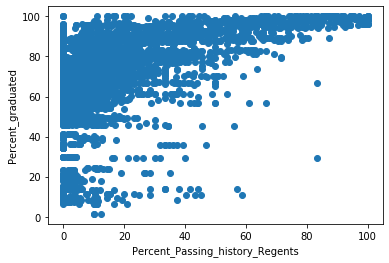

None
                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.561
Model:                            OLS   Adj. R-squared (uncentered):              0.561
Method:                 Least Squares   F-statistic:                              4339.
Date:                Wed, 15 Jan 2020   Prob (F-statistic):                        0.00
Time:                        16:10:52   Log-Likelihood:                         -15158.
No. Observations:                3394   AIC:                                  3.032e+04
Df Residuals:                    3393   BIC:                                  3.032e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------

In [113]:
cursor.execute("""SELECT
nyc_public_high_schools_grad_rate.regents.school_name,
nyc_public_high_schools_grad_rate.gradrate.school_name,
nyc_public_high_schools_grad_rate.regents.regents_exam,
nyc_public_high_schools_grad_rate.gradrate.percent_graduated,
nyc_public_high_schools_grad_rate.regents.percent_scoring_80_or_above
FROM nyc_public_high_schools_grad_rate.gradrate 
join nyc_public_high_schools_grad_rate.regents 
ON nyc_public_high_schools_grad_rate.regents.school_name=nyc_public_high_schools_grad_rate.gradrate.school_name
WHERE nyc_public_high_schools_grad_rate.gradrate.demographic= 'All Students' AND
nyc_public_high_schools_grad_rate.gradrate.cohort = '4 year June' AND
nyc_public_high_schools_grad_rate.regents.regents_exam = 'Global History and Geography'
;
""")
df = pd.DataFrame(cursor.fetchall())
df.columns = [x[0] for x in cursor.description]
df.dropna(inplace = True)
plt.scatter(list(df['percent_scoring_80_or_above']),list(df['percent_graduated']))
plt.xlabel('Percent_Passing_history_Regents')
plt.ylabel('Percent_graduated')
print(plt.show())
x=sm.OLS(list(df['percent_scoring_80_or_above']),list(df['percent_graduated']))
results = x.fit()
print(results.summary())
print(stats.pearsonr(list(df['percent_scoring_80_or_above']),list(df['percent_graduated'])))

In [222]:
# regents dataframe
cursor.execute("""SELECT * FROM regents;""")
regents = pd.DataFrame(cursor.fetchall())
regents.columns = [x[0] for x in cursor.description]

In [223]:
# graduation rate dataframe
cursor.execute("""SELECT * FROM gradrate;""")
grad = pd.DataFrame(cursor.fetchall())
grad.columns = [x[0] for x in cursor.description]

In [224]:
# attendance dataframe
cursor.execute("""SELECT * FROM attendance""")
att = pd.DataFrame(cursor.fetchall())
att.columns = [x[0] for x in cursor.description]

In [225]:
# teacher qualifications dataframe
cursor.execute("""SELECT * FROM teacher_qualifications""")
teach_qual = pd.DataFrame(cursor.fetchall())
teach_qual.columns = [x[0] for x in cursor.description]

In [226]:
regents

,school_name,regents_exam,demographic,total_tested,mean_score,number_scoring_below_65,percent_scoring_below_65,number_scoring_65_or_above,percent_scoring_65_or_above,number_scoring_80_or_above,percent_scoring_80_or_above,number_scoring_cr,percent_scoring_cr
0,Orchard Collegiate Academy,Common Core Algebra,All Students,53,67.5,15.0,28.3,38.0,71.7,6.0,11.3,29.0,54.7
1,Orchard Collegiate Academy,Common Core Algebra2,All Students,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Orchard Collegiate Academy,Common Core English,All Students,41,77.2,3.0,7.3,38.0,92.7,22.0,53.7,30.0,73.2
3,Orchard Collegiate Academy,Common Core Geometry,All Students,11,56.8,9.0,81.8,2.0,18.2,0.0,0.0,1.0,9.1
4,Orchard Collegiate Academy,Global History and Geography,All Students,53,59.3,32.0,60.4,21.0,39.6,6.0,11.3,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
55168,KIPP Academy Charter School,Physical Settings/Physics,Black,11,67.6,4.0,36.4,7.0,63.6,1.0,9.1,NaN,NaN
55169,KIPP Academy Charter School,Physical Settings/Physics,Hispanic,36,66.2,17.0,47.2,19.0,52.8,7.0,19.4,NaN,NaN
55170,KIPP Academy Charter School,U.S. History and Government,Black,22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
55171,KIPP Academy Charter School,U.S. History and Government,Hispanic,58,82.5,4.0,6.9,54.0,93.1,37.0,63.8,NaN,NaN


In [227]:
grad

,school_name,demographic,cohort,total_cohort,total_grads,percent_graduated
0,ORCHARD COLLEGIATE ACADEMY,All Students,4 year August,36.0,25.0,69.4
1,ORCHARD COLLEGIATE ACADEMY,All Students,4 year June,36.0,24.0,66.7
2,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,All Students,4 year August,78.0,70.0,89.7
3,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,All Students,4 year June,78.0,70.0,89.7
4,EAST SIDE COMMUNITY SCHOOL,All Students,4 year August,89.0,81.0,91.0
...,...,...,...,...,...,...
14173,BUSHWICK COMMUNITY HIGH SCHOOL,Current ELL,4 year June,5.0,1.0,20.0
14174,BUSHWICK COMMUNITY HIGH SCHOOL,Ever ELL,4 year August,13.0,3.0,23.1
14175,BUSHWICK COMMUNITY HIGH SCHOOL,Ever ELL,4 year June,13.0,3.0,23.1
14176,BUSHWICK COMMUNITY HIGH SCHOOL,Never ELL,4 year August,68.0,16.0,23.5


In [228]:
att

,school_name,attendance
0,BARD HIGH SCHOOL EARLY COLLEGE,94
1,CASCADES HIGH SCHOOL,64
2,EAST SIDE COMMUNITY SCHOOL,95
3,FORSYTHE SATELLITE ACADEMY,48
4,LOWER EAST SIDE PREP HIGH SCHOOL,77
5,MARTA VALLE HIGH SCHOOL,79
6,"NEW EXPLORATIONS SCI, TECH & MATH",96
7,ORCHARD COLLEGIATE ACADEMY,79
8,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,90
9,ACADEMY FOR SOFTWARE ENGINEERING,87


In [229]:
teach_qual

,school_name,percent_with_no_valid_teaching_ceriticate,percent_teaching_out_of_certificate,percent_with_less_than_3_yrs_experience,percent_with_masters_and_30yrs_or_Doctorate,total_number_of_classes,percent_taught_by_teachers_without_appropriate_certificate
0,BARD HIGH SCHOOL EARLY COLLEGE,0,13,6,71,171,9
1,CASCADES HIGH SCHOOL,0,14,21,36,112,4
2,EAST SIDE COMMUNITY SCHOOL,0,64,7,57,268,47
3,FORSYTHE SATELLITE ACADEMY,0,0,25,38,20,5
4,LOWER EAST SIDE PREP HIGH SCHOOL,0,44,9,63,189,24
5,MARTA VALLE HIGH SCHOOL,0,0,25,31,68,0
6,"NEW EXPLORATIONS SCI, TECH & MATH",1,17,21,32,515,12
7,ORCHARD COLLEGIATE ACADEMY,6,44,33,6,102,40
8,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,0,13,25,25,112,10
9,ACADEMY FOR SOFTWARE ENGINEERING,6,29,18,26,147,31
